In [50]:
import sys
import json
import string
import csv
from collections import Counter
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

from nltk.corpus import words
nltk.download('words')
import matplotlib.pyplot as mpl
import pandas as pd
import codecs
import re
import datetime
import emoji
from langdetect import detect, LangDetectException
from datetime import datetime
import numpy as np
import math

import pyLDAvis
import pyLDAvis.lda_model
from wordcloud import WordCloud

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import gensim
from gensim import corpora
from gensim.models.coherencemodel import CoherenceModel
import numpy as np
import matplotlib.pyplot as plt
import random

import nltk
from nltk.tokenize import TweetTokenizer
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

from colorama import Fore, Back, Style
import pandas as pd
import matplotlib.pyplot as plt


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Nopphasorn\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Nopphasorn\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Nopphasorn\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Nopphasorn\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Nopphasorn\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


## Load 'steam' Data

In [51]:
steam_reviews_df = pd.read_csv('cleaned_steam.csv')
# Display the first few rows of the DataFrame
print(steam_reviews_df.head())

       steam_id                                            content  voted_up  \
0  7.656120e+16  Fun and relaxing game. Always something to do ...      True   
1  7.656120e+16  I play a lot of games you would call "rage ind...      True   
2  7.656120e+16  I remember buying this game for my brother a f...      True   
3  7.656120e+16  One thing I never realized until I finished th...      True   
4  7.656120e+16  Stardew Valley feels like coming home.\n\nI ca...      True   

   playtime_forever  helpful_count  funny_count            timestamp source  \
0            586188           2093           61  2020-08-14 15:55:00  steam   
1              9492           1206           19  2024-03-07 04:45:00  steam   
2              7028           1034           21  2019-01-26 01:14:00  steam   
3             17458            533            8  2021-09-24 12:04:00  steam   
4             15331            516            6  2024-04-07 12:41:00  steam   

   event_id  
0         0  
1         0  
2 

## Data Exploration

In [52]:
print(len(steam_reviews_df))

49518


In [55]:
# Count the number of positive (voted_up == True) and negative (voted_up == False) reviews
vote_counts = steam_reviews_df['voted_up'].value_counts()

In [56]:
vote_counts

voted_up
True     49190
False      328
Name: count, dtype: int64

### plot a vote-up pie chart 

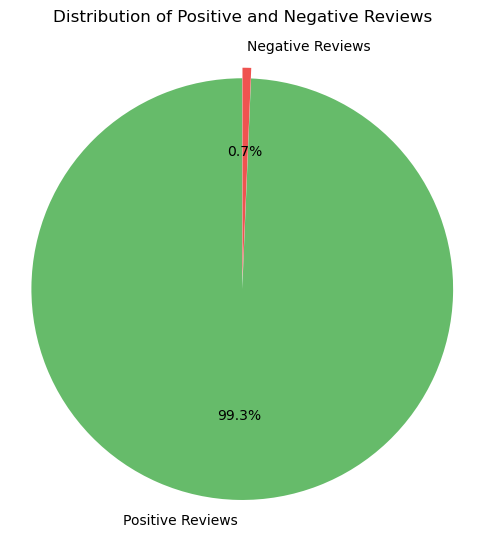

In [57]:
import matplotlib.pyplot as plt

# Check if the column 'voted_up' exists and is valid
if 'voted_up' in steam_reviews_df.columns:
    # Count the number of positive and negative reviews
    vote_counts = steam_reviews_df['voted_up'].value_counts()

    # Handle cases where True/False might be missing due to filtering or other issues
    positive_reviews = vote_counts.get(True, 0)  # Default to 0 if no positive reviews found
    negative_reviews = vote_counts.get(False, 0)  # Default to 0 if no negative reviews found

    # Create labels and data for the pie chart
    labels = ['Positive Reviews', 'Negative Reviews']
    sizes = [positive_reviews, negative_reviews]

    # Create a pie chart
    plt.figure(figsize=(6,6))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#66bb6a', '#ef5350'], explode=(0.05, 0))
    plt.title('Distribution of Positive and Negative Reviews', y=1.05)
    plt.axis('equal')  # Equal aspect ratio ensures the pie is drawn as a circle.

    # Display the pie chart
    plt.show()
else:
    print("Error: 'voted_up' column not found in the DataFrame.")


In [58]:
neg_review =steam_reviews_df[ steam_reviews_df['voted_up'] == False]

In [59]:
# Sort negative reviews by the number of helpful votes
most_helpful_neg_reviews = neg_review.sort_values(by='helpful_count', ascending=False).head(10)

# Display the most helpful negative reviews
print(most_helpful_neg_reviews[['content', 'helpful_count']])


                                                 content  helpful_count
593    EDIT: Since 1.1. hit I will be replaying the g...           2057
325    oh hey yeah this game's actually great\n\nseei...            800
257    I have to feel a little guilty writing a negat...            298
33516  Stardew Valley has a lot of character and rura...            280
501    Why are you looking at negative reviews? This ...            244
213    A uniquely addictive game that I am surprised ...            169
358    Although this game is kind of good with it's c...            152
577    I have tried playing this game before when it ...            130
384    This game is like crack cocaine I literally ca...            120
4563   Stardew Valley is set up with no fail conditio...             94


## Time-Series Analysis: Reviews Over Time

### the Number of Reviews Monthly

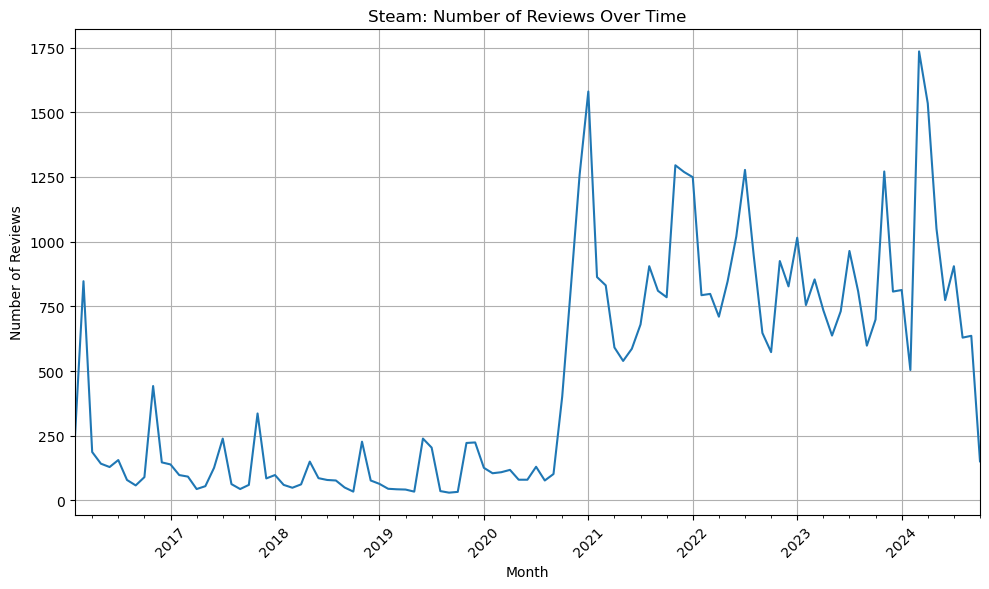

In [60]:
import matplotlib.pyplot as plt

# Convert the 'timestamp_created_converted' to the date format (if not done yet)

steam_reviews_df['date'] = pd.to_datetime(steam_reviews_df['timestamp']).dt.to_period('M')

# Group reviews by date (monthly) and count how many reviews were submitted each month
reviews_per_month = steam_reviews_df.groupby('date').size()

# Plot the number of reviews over time
plt.figure(figsize=(10,6))
reviews_per_month.plot()
plt.title("Steam: Number of Reviews Over Time")
plt.xlabel("Month")
plt.ylabel("Number of Reviews")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### the Number of Reviews Yearly

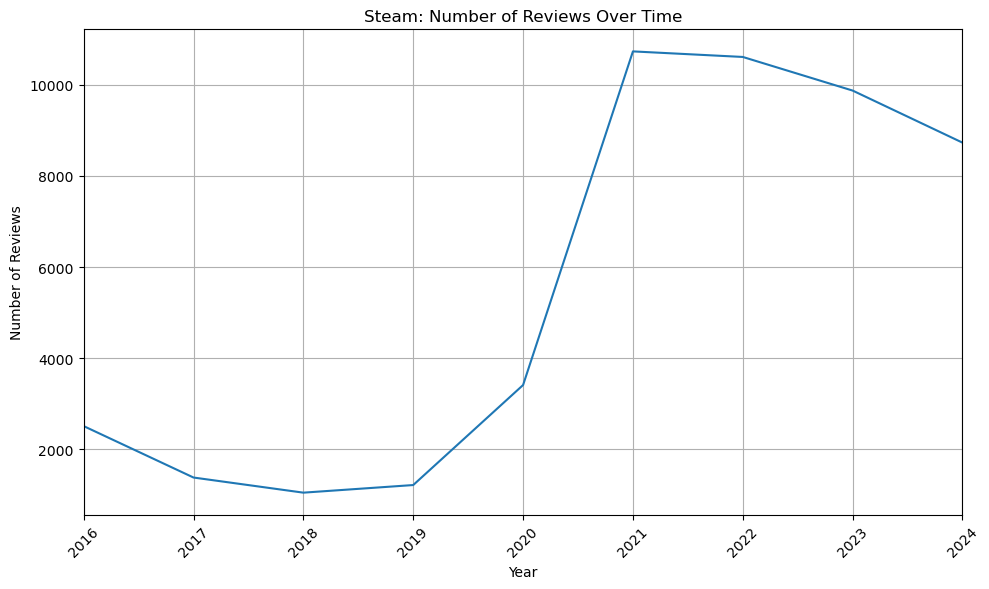

In [61]:

# Convert the 'timestamp_created_converted' to the date format (if not done yet)
steam_reviews_df['date'] = pd.to_datetime(steam_reviews_df['timestamp']).dt.to_period('Y')

# Group reviews by date (monthly) and count how many reviews were submitted each month
reviews_per_month = steam_reviews_df.groupby('date').size()

# Plot the number of reviews over time
plt.figure(figsize=(10,6))
reviews_per_month.plot()
plt.title("Steam: Number of Reviews Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Reviews")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Correlation Between Playtime and Review Helpfulness

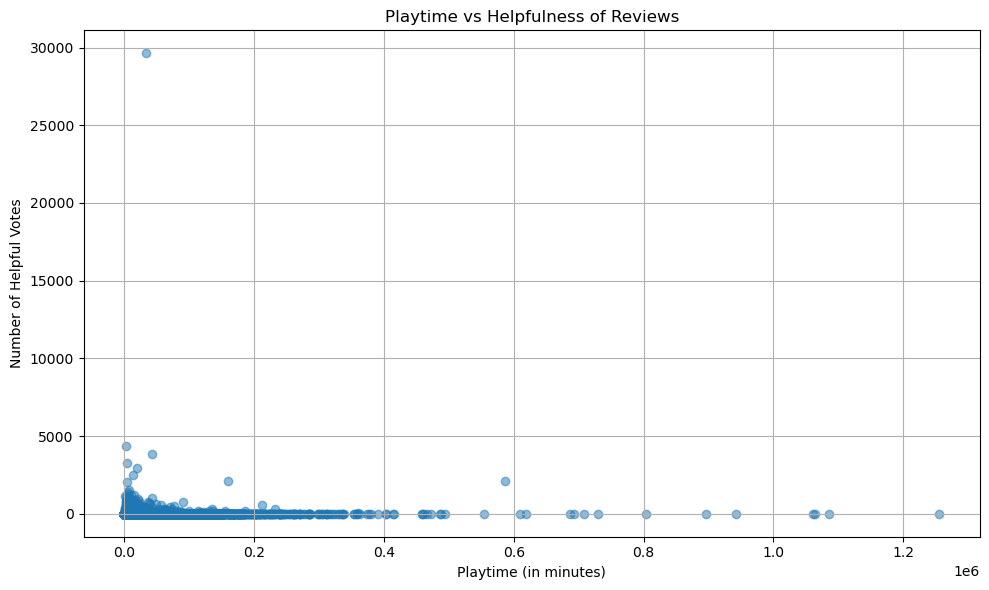

In [62]:
plt.figure(figsize=(10,6))
plt.scatter(steam_reviews_df['playtime_forever'], steam_reviews_df['helpful_count'], alpha=0.5)
plt.title("Playtime vs Helpfulness of Reviews")
plt.xlabel("Playtime (in minutes)")
plt.ylabel("Number of Helpful Votes")
plt.grid(True)
plt.tight_layout()
plt.show()

## Data Processing

In [63]:
from nltk.corpus import words
# Load the set of valid English words
valid_words = set(words.words())

# Slang dictionary for replacement
slang_dict = {
    'gg': 'good game',
    'noob': 'newbie',
    'op': 'overpowered',
    'nerf': 'weaken',
    'idk': "i don't know",
    'afk': 'away from keyboard',
    'ftw': 'for the win',
    'smh': 'shaking my head',
    'lol': 'laughing out loud',
}

def replace_slang(text, slang_dict):
    """Replace slang terms in text using the provided slang dictionary."""
    words = text.split()
    replaced_text = ' '.join([slang_dict.get(word.lower(), word) for word in words])
    return replaced_text


def filter_filler_words(tokens):
    """Remove short or meaningless words such as 'wa', 'ha', and words with less than 3 characters."""
    filler_words = {'wa', 'ha', 'uh', 'um'}
    return [token for token in tokens if len(token) > 2 and token not in filler_words]

def processText(text, tokenizer, lemmatizer, stemmer, stopwords, slang_dict):
    """
    Tokenize, lemmatize, and stem the text, removing stopwords, extra words, and invalid/nonsense words.
    """
    # Check if the input text is valid
    if not isinstance(text, str):
        return []
    
    # Remove URLs and special characters
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    
    # Step 1: Replace slang using the slang dictionary
    text = replace_slang(text, slang_dict)

    # Tokenise the text
    lTokens = tokenizer.tokenize(text)

    # Custom words to remove
    extra_remove_words = ['game', 'stardew', 'valley','dont']

    # Process tokens: lowercase, lemmatize, and filter non-alphabetic tokens
    lTokens = [lemmatizer.lemmatize(token.lower().strip()) for token in lTokens if token.isalpha()]

    # Apply filtering: remove short words, invalid words, and stopwords
    filtered_tokens = [stemmer.stem(token) for token in lTokens 
                       if len(token) > 2  # Filter out short words (less than 3 characters)
                       and token not in stopwords 
                       and token not in extra_remove_words
                       and token in valid_words]  # Only keep valid English words
    
    # Step 5: Remove filler words (like 'wa', 'ha')
    final_tokens = filter_filler_words(filtered_tokens)

    return final_tokens


In [64]:
# number of most frequent terms to display
freqNum = 30

# use the punctuation symbols defined in string.punctuation
lPunct = list(string.punctuation)
# use stopwords from nltk and a few other 
lStopwords = nltk.corpus.stopwords.words('english') + lPunct + ['rt', 'via', '...', '…', '"', "'", '`',"’","“","”",".."]
# Initialize the lemmatizer and stemmer
lemmatizer = nltk.stem.WordNetLemmatizer()
stemmer = nltk.stem.PorterStemmer()

# our term frequency counter
termFreqCounter = Counter()
# tweet tokeniser to use
tweetTokeniser = nltk.tokenize.TweetTokenizer()

In [65]:
# Loop through each review and process it with both lemmatizer and stemmer

for reviews in steam_reviews_df['content']:
    lTokens = processText(text=reviews, tokenizer=tweetTokeniser, lemmatizer=lemmatizer, stemmer=stemmer, stopwords=lStopwords,slang_dict=slang_dict)
    termFreqCounter.update(lTokens)

# print out most common terms
thirtyfreq_words_reviews = {}
for term, count in termFreqCounter.most_common(freqNum):
    print(term + ': ' + str(count))
    thirtyfreq_words_reviews[term] = count

farm: 22492
play: 19266
like: 17498
fun: 16708
time: 16461
love: 16400
get: 16172
one: 13553
hour: 12254
much: 11843
good: 10485
realli: 10313
great: 10165
make: 10012
thing: 9413
recommend: 8690
even: 8535
day: 7863
want: 7839
also: 7743
lot: 7652
friend: 7628
would: 7610
fish: 7066
charact: 7038
harvest: 6670
feel: 6396
enjoy: 6372
life: 6306
mani: 6188


### Top 30 Most Frequent words

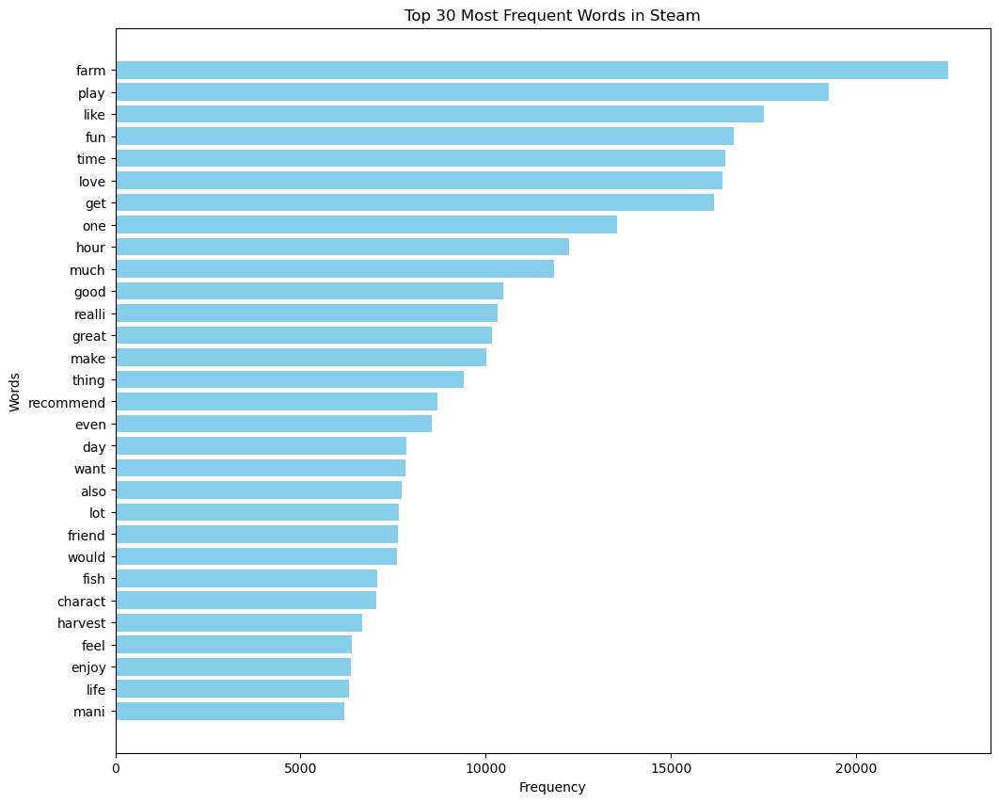

In [66]:
words= list(thirtyfreq_words_reviews.keys())
counts= list(thirtyfreq_words_reviews.values())

plt.figure(figsize=(12,10))
plt.barh(words, counts, color='skyblue')
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.title('Top 30 Most Frequent Words in Steam')
plt.gca().invert_yaxis()  # Invert y-axis to have the most frequent words on top
plt.show()

## Sentiment Analysis

In [67]:
def vaderPrintTokens(lTokens, dSentimentScores):
    """
    Print out the tokens and sentiment score.
    
    @param lTokens: List of tokens to print and colour.
    @dSentimentScores: Dictionary of sentiment from Vader.

    """
    print(*lTokens, sep=', ')
    for cat,score in dSentimentScores.items():
        print('{0}: {1}, '.format(cat, score), end='')
    print()

In [68]:
def vaderSentimentAnalysis(df, bPrint):
    """
    Use Vader lexicons instead of a raw positive and negative word count.

    @param df: DataFrame containing review text and timestamp columns.
    @param bPrint: whether to print the stream of tokens and sentiment.

    @returns: list of posts, in the format of [date, sentiment].
    """

    # Initialize the VADER sentiment analyzer
    sentAnalyser = SentimentIntensityAnalyzer()

    lSentiment = []
    
    # Iterate over each row in the DataFrame
    for idx, row in df.iterrows():
        # Extract the 'review' and 'timestamp_created_converted' for the current row
        postText = row['content']
        postDate = row['timestamp']
        
        # Pre-process the post text
        lTokens = processText(text=postText, tokenizer=tweetTokeniser, lemmatizer=lemmatizer, stemmer=stemmer, stopwords=lStopwords,slang_dict=slang_dict)

        # Compute the sentiment scores using VADER
        dSentimentScores = sentAnalyser.polarity_scores(" ".join(lTokens))

        # Save the date and compound sentiment score (used for time series)
        lSentiment.append([pd.to_datetime(postDate), dSentimentScores['compound']])

        # Print the tokens and sentiment scores if bPrint is True
        if bPrint:
            vaderPrintTokens(lTokens, dSentimentScores)

    return lSentiment


In [69]:
# input file of set of postive words
posWordFile = 'positive-words.txt'
# input file of set of negative words
negWordFile = 'negative-words.txt'

# flag to determine whether to print out tweets and their sentiment
flagPrint = True
# load set of positive words
lPosWords = []
with open(posWordFile, 'r', encoding='utf-8', errors='ignore') as fPos:
    for sLine in fPos:
        lPosWords.append(sLine.strip())

setPosWords = set(lPosWords)


# load set of negative words
lNegWords = []
with codecs.open(negWordFile, 'r', encoding='utf-8', errors='ignore') as fNeg:
    for sLine in fNeg:
        lNegWords.append(sLine.strip())

setNegWords = set(lNegWords)

In [70]:
# compute the sentiment
lSentiment = vaderSentimentAnalysis(steam_reviews_df, flagPrint)

fun, alway, someth, updat, keep, interest, tri, play, cannot, compet, play, thank, concern, ape
neg: 0.095, neu: 0.405, pos: 0.5, compound: 0.8398, 
play, lot, would, call, rage, love, hack, slash, thrill, gore, fest, doom, etern, unbear, challeng, wife, didnt, know, deal, lot, anxieti, militari, servic, life, someth, crop, duck, feel, escap, everyday, stress, cant, recommend, enough, one, man, armi, like, damn, man, flower
neg: 0.273, neu: 0.529, pos: 0.198, compound: -0.5283, 
rememb, brother, year, back, didnt, think, much, time, thought, would, nice, gift, rememb, see, time, time, messag, corner, screen, alway, certain, small, pride, see, meant, enjoy, gift, last, suicid, everyth, settl, sat, boot, comput, chrome, steam, word, one, cours, piec, hour, practic, everyth, offer, use, everi, squar, inch, maximum, potenti, make, ridicul, amount, cash, see, much, present, quit, affect, much, one, none, friend, realli, knew, howev, like, prefer, keep, like, littl, bit, heaven, could, turn,

first, saw, thought, might, kind, similar, rune, factori, frontier, eagerli, port, yet, current, emul, gave, similar, though, thought, mayb, might, close, enough, sort, fill, gap, start, simpl, enough, grandfath, left, farm, need, work, repair, get, run, chop, log, break, rock, till, soil, plant, seed, harvest, crop, lot, room, play, around, farm, want, place, thing, also, aspect, help, encourag, explor, surround, farm, though, also, element, battl, monster, mine, turn, drop, loot, use, sell, addit, adventur, aspect, quest, fairli, light, puzzl, date, marri, certain, peopl, town, even, two, later, even, forg, weapon, equip, add, specif, grew, graphic, found, graphic, somewhat, nostalg, feel, anim, fairli, simpl, charact, sprite, charact, much, charact, bit, uniqu, charact, trait, get, know, build, friendship, point, certain, level, friendship, given, treat, special, littl, cut, scene, get, make, choic, respond, sometim, help, relationship, hurt, add, quit, bit, stori, element, part, be

fantast, worthi, whether, buy, sale, still, would, happi, experi, develop, work, done, fantast, enjoy, piec, art, start, start, end, sidenot, play, friend, start, want, enabl, extra, cabin, extra, cabin, allow, extra, player, join, start, without, cabin, build, super, cheapli, want, jump, right, next, season, video, sinc, origin, wasnt, terribl, get, right, box, suggest, alway, marker, option, greatli, help, properli, aim, also, make, sure, stand, tile, wish, interact, season, second, mous, keyboard, enabl, aim, marker, well, rel, easi, time, part, ton, stuff, cant, wrong, easili, profit, even, need, worri, crop, best, cash, crop, appeal, tri, crop, type, due, benefit, food, well, quest, requir, variou, crop, grow, one, crop, miss, aspect, bit, rough, bit, rough, throughout, fish, pain, catch, remain, pain, catch, cost, littl, fish, yield, larg, get, good, fish, great, way, rais, fish, acquir, fish, endeavor, easi, money, two, togeth, mine, later, elsewher, process, mine, ore, encount,

danger, first, like, cool, farm, fun, realli, see, around, kept, gotten, bad, tab, open, look, stuff, open, blink, two, hour, feel, sad, lost, much, time, look, progress, made, farm, think, worth, one, fun, ever, design, way, casual, player, competit, player, blast, much, much, offer, spend, day, farm, fish, mine, talk, villag, made, way, everi, littl, detail, like, profit, time, manag, time, limit, thing, unless, count, season, alway, anoth, year, stake, want, definit, talk, villag, fun, well, theyr, even, find, pattern, daili, schedul, lot, detail, havent, tri, seen, definit, lot, fun, friend, solo, extrem, fun, well, gripe, huge, time, sink, semest, get, time, sink, beforehand, glad, think, crop, plant, next, season, place, much, money, make, fish, mine, feed, anim, today, talk, robin, today, cours, robin, best, girl, discuss
neg: 0.073, neu: 0.62, pos: 0.306, compound: 0.9873, 
incred, person, top, one, best, fun, ever, hour, steam, probabl, like, switch, still, touch, bunch, conte

year, old, grew, control, moon, one, heart, alway, broke, year, end, play, came, everi, harvest, moon, ever, made, everi, consol, first, review, steam, write, long, list, great, steam, month, didnt, even, know, bought, clearli, far, averag, harvest, moon, everi, way, come, copi, friend, harvest, moon, mirror, imag, dream, worth, amaz, job, truli, review, understat, creator, hope, notic, sincer, effort, went, make
neg: 0.038, neu: 0.737, pos: 0.225, compound: 0.9136, 
log, hour, minimum, choic, start, first, time, that, hour, life, gone, youv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
time, liter, life, saver, wish, dramat, liter, escap, world, work, stress, would, spend, hour, upon, hour, live, life, farm, hold, special, place, heart, wholeheartedli, cannot, recommend, enough, everyth, offer, element, multipl, choic, romanc, option, dungeon, mine, monster, find, new, item, farm, simul, know, manag, regul, field, best, valu, crop, worth, fun, grow, flower, pretti, genuin, give, break

graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, live, grind, stori, stori, lore, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, sale, spare, money, left, could, also, burn, money, bug, never, minor, bug, get, annoy, ark, surviv, big, terrarium, bug
neg: 0.136, neu: 0.607, pos: 0.257, compound: 0.9531, 
ideal, consum, adult, everyon, casual, player, pro, player, worth, full, price, worthless, difficulti, tutori, slight, learn, curv, easi, learn, hard, master, tutori, use, resourc, help, learn, realli, short, hour, short, 

get, live, farm, life, youv, water, crop, daili, sell, profit, watch, beauti, sceneri, chang, shape, season, get, know, local, mayb, even, start, famili, sacrific, two, child, particip, yearli, holiday, festiv
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.6808, 
normal, definit, play, almost, everi, day, ask, friend, regularli, play, also, pet, cat, dog, pet, cat, dog, say
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.7906, 
pretti, anxieti, depress, covid, realli, rough, lie, luckili, friend, got, spent, hour, sinc, hit, fan, job, got, put, paus, realli, time, relax, feel, realli, thank, peac, outlet, time, struggl, mayb, tri, like, might, help, graphic, ador, hour, content, play, without, look, everyth, fun, everyon, pleas, take, care
neg: 0.091, neu: 0.573, pos: 0.336, compound: 0.93, 
put, around, year, caus, alway, thought, farm, gonn, repetit, bore, spent, almost, hour, one, session, upon, surpris, cool, caus, quest, cave, explor, kill, slime, infinit, amount, anim, could, buy, s

definit, recommend, thing, make, excel, whatev, want, pace, opinion, want, comb, head, forest, mine, anoth, thing, fit, town, chat, gain, relationship, point, everi, day, end, settl, everybodi, stori, choos, mani, charact, marri, becom, friend, explor, mysteri, town, hall, mine, peac, life, farm, layout, hous, anim, take, care, also, lot, like, harvest, moon, time, would, play, harvest, moon, day, still, ship, box, mechan, relationship, bar, anoth, thing, pick, shirt, hair, accessori, choos, prefer, dog, cat, play, know, creator, make, mani, updat, improv, also, would, still, recommend, beta, releas, play, friend, lot, rate
neg: 0.0, neu: 0.683, pos: 0.317, compound: 0.9846, 
start, first, time, tri, fish, day, hard, hell, screw, fish, next, day, start, suddenli, manag, catch, fish, easili, feel, good, man, proceed, fish, day, sell, god, gold, fish, even, start, get, treasur, chest, fish, diamond, good, sword, gold, iridium, screw, farm, becom, fisher, would, ignor, actual, purpos
neg:

beauti, similar, harvest, moon, especi, older, one, version, back, natur, best, childhood, memori, game, life, love, usual, farmer, experi, mani, option, possibl, differ, farm, type, choos, begin, advantag, disadvantag, lot, charact, task, work, list, plant, crop, flower, water, everi, day, harvest, either, sell, gift, eat, cook, store, process, increas, worth, craft, mani, mani, differ, decor, item, use, machin, fish, collect, differ, fish, legendari, one, mine, find, miner, artifact, ore, fight, monster, gather, stone, wood, use, build, upgrad, build, build, barn, coop, get, anim, feed, give, milk, egg, wool, way, choos, either, support, old, commun, center, capit, market, progress, social, life, talk, villag, differ, differ, interest, like, differ, stuff, lot, stori, element, also, event, town, particip, late, even, get, marri, somebodi, like, enough, even, support, gay, marriag, find, mani, mani, mani, secret, hidden, gimmick, full, achiev, thing, togeth, friend, list, definit, wor

god, chicken, cow, goat, acorn, live, better, life, ever, could, holi
neg: 0.0, neu: 0.643, pos: 0.357, compound: 0.6124, 
one, favorit, spent, mani, night, late, tri, perfect, farm, get, fall, love, twentieth, time, row, great, help, keep, anxieti, check, quiet, virtual, life
neg: 0.0, neu: 0.564, pos: 0.436, compound: 0.9403, 
audienc, toddler, year, year, teen, year, adult, year, everyon, genr, action, adventur, casual, horror, music, mysteri, puzzl, shooter, simul, sport, strategi, surviv, virtual, realiti, stori, doesnt, bad, averag, good, fantast, difficulti, easi, normal, hard, short, hour, hour, hour, long, hour, endless, graphic, realli, bad, bad, good, beauti, audio, realli, bad, bad, good, masterpiec, bug, noth, bug, mani, bug, bug, wait, sale, full, price, requir, minimum, medium, fast, high, end, coop, steam, workshop, follow
neg: 0.136, neu: 0.686, pos: 0.178, compound: 0.5764, 
give, mode, late, current, nice, job
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.4215, 
thou

highli, aspect, pro, fun, nice, art, sens, satisfact, lot, depth, thing, con, far, much, thing, nice, balanc, bug, good, younger, hell, harvest, moon, rememb, mani, mani, secret, late, night, advanc, bed, fast, forward, month, ago, read, much, one, man, seen, art, even, gave, shot, awhil, feel, work, play, someth, made, seem, fun, put, asid, came, sinc, never, realli, back, sens, still, work, anoth, person, cash, spent, get, design, farm, split, job, think, thing, becom, much, enjoy, thing, feel, like, actual, achiev, celebr, anoth, person, fun, would, recommend, anyon
neg: 0.042, neu: 0.696, pos: 0.262, compound: 0.9698, 
wait, sale, buy, right, great, deserv, sold, higher, price, that, buy, perfect, fusion, harvest, moon, terrarium
neg: 0.0, neu: 0.642, pos: 0.358, compound: 0.8316, 
amaz, stori, charact, phenomen, cute, excit, great, recommend
neg: 0.0, neu: 0.342, pos: 0.658, compound: 0.8625, 
make, want, abandon, stress, respons, live, happi, quiet, life, small, town, sea, far, b

sick, life, drone, corpor, trigger, claus, die, grandfath, grant, legal, ownership, farm, start, life, anew, away, bustl, urban, societi, farm, serf, new, home, beauti, land, everyon, friendli, bisexu, arm, basic, farm, tool, packet, seed, provid, mayor, stori, begin, catch, fish, kill, monster, craft, item, charact, fall, love, marri, crush, take, farm, stapl, signatur, element, amount, activ, partak, reap, econom, reward, hardli, far, outsid, farm, mine, resourc, cook, pancak, choic, truli, final, everi, skill, could, possibl, master, use, farm, talent, take, local, branch, corpor, join, screw, town, well, written, charact, event, hit, mark, need, regard, keen, music, choic, theme, set, tone, charact, within, excel, titl, right, except, exampl, graphic, monopoli, industri, simpl, simpl, subject, vastli, superior, titl, old, clich, activ, dev, addit, everyth, said, among, librari, late, strongli, suggest, get, soon, possibl, fan, harvest, titl
neg: 0.091, neu: 0.723, pos: 0.186, compo

escap, realiti, immers, world, farm, grow, veget, anim, even, build, relationship, charact, let, start, fact, farm, plant, whatev, want, ordinari, veget, exot, fruit, care, crow, real, villain, steal, harvest, forget, buy, scarecrow, protect, preciou, plant, come, anim, may, creatur, chicken, cow, goat, even, hors, prepar, fact, requir, daili, care, feed, water, forget, clean, pen, rememb, happi, anim, produc, food, howev, farm, also, explor, surround, area, catch, fish, date, charact, even, fight, monster, dungeon, give, complet, freedom, choos, graphic, simpl, charm, charact, uniqu, design, person, becom, best, friend, even, becom, lover, add, even, varieti, want, take, break, realiti, enjoy, life, farmer, offer, endless, possibl, smile, ear, ear, harvest, first, harvest, make, new, friend, prepar, spend, sever, hour, grab, first, minut, doesnt, let, end
neg: 0.095, neu: 0.644, pos: 0.261, compound: 0.9783, 
best, friend, introvert, may, question, first, may, doubt, time, spend, atta

got, everybodi, spring, danc, first, year, turn, bisexu, farmer, end, would, date, real, though, actual, realli, good, definit, worth, buy
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.5859, 
love, piec, art, build, farm, sell, crop, make, friend, small, big, take, chill, nut, profit, hurri, take, time, decid, want, farm, work, great, devot, coupl, minut, jump, hour, everi, penni, cost
neg: 0.0, neu: 0.624, pos: 0.376, compound: 0.9403, 
get, blast, wholesom, give, good, feel, need, hard, day, toddler, love, heartili, anyon, need, chill
neg: 0.068, neu: 0.585, pos: 0.346, compound: 0.7717, 
first, discov, list, nomin, steam, award, first, unsur, think, next, day, went, back, took, note, overwhelmingli, posit, rate, obviou, peopl, enjoy, made, make, decis, buy, see, like, first, minut, quickli, hook, much, depth, origin, thought, amount, heart, put, calm, realli, made, feel, like, someth, truli, special, everi, villag, feel, uniqu, stereotyp, doesnt, exactli, mean, bad, charact, often, 

humbl, farm, simul, take, steam, storm, right, consid, charm, depth, number, smooch, within, surpris, serious, spent, hour, alreadi, like, day, forc, stop, lest, becom, caught, one, day, trap, alway, someth, tend, crop, fish, chat, villag, dive, mine, find, loot, kill, monster, despit, comparison, harvest, moon, actual, way, farm, lot, term, combat, explor, actual, better, yet, town, full, mysteri, far, still, havent, unlock, area, map, yet, come, anywher, close, see, see, rest, steam, right, sit, overwhelmingli, posit, user, review, score, user, arent, though, theyr, also, pretti, massiv, could, made, singl, person, develop, honestli, peopl, seem, noth, good, thing, say
neg: 0.114, neu: 0.777, pos: 0.109, compound: -0.1531, 
love, fish, spoiler, legend, fish, holi, spoiler, spoiler, caught, legend, fish, spoiler
neg: 0.0, neu: 0.724, pos: 0.276, compound: 0.6369, 
countri, life, take, grandfath, old, farm, citi, best, harvest, moon, basic, work, tirelessli, year, hit, somehow, compon,

safe, say, phenomen, everi, sens, besid, amaz, stori, multipl, len, offer, amaz, lore, object, commun, task, explor, realli, good, mixtur, combat, casual, farm, realli, warm, realli, play, easili, one, best, loop, well, dynam, way, choos, play
neg: 0.048, neu: 0.54, pos: 0.412, compound: 0.9451, 
start, much, ill, make, short, get, pro, stunningli, beauti, graphic, back, childhood, memori, ton, explor, plot, actual, intrigu, farm, nomin, minut, award, con, forgot, finish, import, task, fear, might, graduat, colleg, would, miss, deadlin
neg: 0.185, neu: 0.73, pos: 0.085, compound: -0.4767, 
absolut, awesom, clearli, spiritu, successor, harvest, moon, franchis, robust, element, sandbox, type, like, terrarium, social, element, townsfolk, probabl, harvest, moon, splash, anim, cross, mine, fish, townsfolk, anim, husbandri, cours, farm, explor, type, play, casual, lot, room, effici, grind, player, prefer, structur, mention, done, singl, dev, commun, fan, work, essenti, nonstop, sinc, releas,

pathet, human, listen, great, review, overview, player, inherit, farm, must, build, plant, crop, rais, anim, item, player, also, engag, social, activ, charact, town, romant, relationship, simplist, surprisingli, someon, fought, mani, battl, appreci, challeng, build, farm, resourc, also, atmospher, nice, chang, constant, chao, battl, graphic, graphic, reminisc, primit, technolog, human, past, still, charm, way, cute, color, art, style, easi, optic, much, like, way, would, fli, around, sound, sound, effect, noth, write, home, music, surprisingli, pleasant, may, human, primit, instrument, find, hum, along, tune, final, thought, overal, may, appeal, human, seek, relax, simplic, howev, fight, find, pleasant, distract, constant, battl, may, excit, face, prime, still, nice, chang, pace
neg: 0.055, neu: 0.732, pos: 0.213, compound: 0.9652, 
help, near, end, colleg, quarter, cant, stop, good, come, peac, color, sooth, music, charact, make, hard, stick, promis, one, day, ill, stop, finish, day, 

year, later, still, new, content, almost, hour, play, time, play, yet, good, must, play, everyon, one, time, favorit, everi, singl, love, appreci, someth, everyon, farm, explor, mine, romanc, friendship, fight, holiday, festiv, time, manag, roll, one, wonder, packag, cant, recommend, enough, even, peopl, arent, trust, love
neg: 0.113, neu: 0.533, pos: 0.354, compound: 0.9418, 
never, type, harvest, moon, love, kind, skeptic, price, first, figur, didnt, like, would, refund, well, hour, later, write, review, qualiti, one, favorit, civil, graphic, look, simpl, much, havent, yet, amaz, surprisingli, made, one, guy, stori, that, simpl, turn, much, detail, charact, creation, endless, amount, stuff, much, farm, date, quest, keep, addict, real, entertain, event, season, differ, item, collect, make, lot, stuff, larg, map, music, music, surprisingli, good, atmospher, steam, trade, card, develop, activ, commun, develop, still, new, featur, coop, peopl, say, bug, develop, activ, commun, fix, every

kind, would, like, see, steam, start, small, farm, free, whatev, want, way, play, overal, amaz, urgent, need, stress, wasnt, sure, wast, money, five, minut, thought, alreadi, would, total, recommend, need, competit, thank, make
neg: 0.1, neu: 0.485, pos: 0.415, compound: 0.9176, 
cant, imagin, smell, peopl, villag, farmhous, everi, hous, bathroom, beach, nearbi, one, spa, empti, everi, day, peopl, never, chang, cloth, season, feel, cold, hot, raini, day, peopl, outsid, without, umbrella, upset, peopl, never, get, sick, impress
neg: 0.06, neu: 0.819, pos: 0.121, compound: 0.357, 
ton, content, charm, atmospher, lot, grind, sink, hour, play, save, editor, infinit, gold, focu, stori, quest, instead, farm, sole, money, earli, stage, forc, walk, slowli, map, clock, tick, talk, help, gather, specif, item, mani, charact, locat, lock, insid, room, come, back, differ, day, clash, idea, action, absolut, farm, later, unlock, effici, tool, befriend, marri, player, marri, eventu, got, marri, child


let, live, sexual, fantasi, job, someon, actual, love
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.6369, 
one, best, exist, far, epitom, farm, cozi, simul, way, long, much, say, neg, play, charact, leaf, terribl, corpor, job, grandfath, farm, build, back, engag, local, town, villag, endless, fun, multipl, play, option, option, multipl, romanc, option, multipl, farm, option, sink, hour, multipl, play, pro, banger, fun, cozi, annoy, give, good, abl, shut, flashi, light, epilepsi, issu, full, control, support, easi, option, current, player, heterosexu, homosexu, relationship, multipl, farm, layout, choos, modifi, villag, posit, neg, attribut, make, believ, relat, fun, hous, shed, farm, design, abil, lot, stori, quest, complet, con, pick, male, femal, gender, wish, could, increas, movement, speed, sooner, updat, help, voic, act, though, honestli, doesnt, need, mart, path, benefici, stori, play, abil, wall, person, wish, increas, expand
neg: 0.02, neu: 0.707, pos: 0.273, compound: 0.987, 


probabl, ever, firstli, must, admit, never, farm, truli, opinion, close, perfect, even, closer, coop, basic, experi, great, stori, take, role, charact, deceas, grandfath, farm, best, part, farm, amaz, quest, system, resourc, manag, relationship, fight, mine, fish, farm, base, grandfath, farm, even, famili, surnam, famili, orang, orchard, chicken, coop, warehous, addit, grandfath, also, use, run, small, store, agricultur, anim, suppli, product, unfortun, away, peac, week, ago, thank, alway, opportun, remind, amaz, man, amaz, grandfath, amaz, father, may, rest, peac, like, one, stay, memori, entir, life, thank, read
neg: 0.026, neu: 0.765, pos: 0.209, compound: 0.9565, 
one, favorit, probabl, anoth, hundr, hour, switch, switch, excel, tri, differ, type, farm, make, goal, someth, differ, everi, time, start, new, save, brother, duo, farm, that, thrive, hell, lot, farm, simul, much, give, shot
neg: 0.11, neu: 0.742, pos: 0.148, compound: 0.1531, 
nice, recent, lot, fun, think, graphic, cute

one, farm, simul, far, although, realist, look, realli, nice, tell, work, went, whole, even, big, fan, farm, aspect, like, fish, mine, bit, combat, realli, great, cool, well, spent, money
neg: 0.059, neu: 0.543, pos: 0.398, compound: 0.9136, 
play, good, worth, even, consol, alreadi, play, anim
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.8225, 
great, play, coupl, friend, alway, ton, thing, farm, fish, mine, combat, event, make, feel, overal, live, immers, new, updat, alway, bring, someth, new, tabl
neg: 0.075, neu: 0.623, pos: 0.302, compound: 0.8074, 
pleas, buy, seriou, buy, play, day, end, look, back, life, past, month, realiz, spent, water, farm, get, men, like, accid, worth, realli, grow, plant, farm, move, buy, coupl, hundr, acr, land, make, fortun, famili, good, life, eat, best, food, ever, middl, corn, pray, god, never, play, ever, huge, wast, time, seriou, lost, famili, friend, get, sleep, enough, compens, amount, pain, brought, extent, sex, life, due, fact, cloth, smell, b

big, fan, review, rare, give, opinion, usual, buy, one, rememb, sweet, childhood, use, could, play, harvest, moon, back, natur, yeah, pretti, addict, unfortun, one, day, consol, felt, bad, ugh, didnt, want, play, anyth, got, comput, discov, magic, world, emul, could, reviv, good, day, harvest, moon, back, natur, stuff, play, control, make, nostalg, bad, tast, didnt, want, play, last, friend, made, new, colleg, said, could, buy, without, regret, know, right, sold, preciou, item, order, buy, worth, risk, got, someth, way, preciou, tast, look, sinc, long, time, ago, like, countrysid, themat, like, harvest, moon, strongli, recommend, wont, regret, spend, money, littl, updat, ill, nomin, best, use, farm, anim, award, anoth, updat, nomin, labor, love, award, anoth, one, updat, nomin, best, friend, award, yet, anoth, updat, nomin, anoth, labor, love, award, yeah, ill, never, get, tire, anoth, anoth, updat, yeah, year, someth, nomin, anoth, labor, love, award, anoth, anoth, anoth, updat, year,

wasnt, sure, want, play, gave, tri, last, updat, sank, week, time, right, first, time, silli, make, farm, stuff, help, develop, town, unlock, new, place, best, term, describ, kind, push, reach, next, step, real, pressur, want, take, slow, art, style, nice, progress, curv, interest, well, guess, casual, player, enjoy, find, way, regret, spoil, small, thing, alway, clear, enough, fair, lot, content, hope, ill, get, back, one, day, anoth, enthral, offer, nice, paus, daili, life, realli, recommend, feel, interest
neg: 0.109, neu: 0.488, pos: 0.403, compound: 0.9842, 
thing, huge, farm, crop, anim, rais, preciou, farm, mine, ton, fish, enough, make, year, combat, skill, fight, monster, insid, cave, mine, good, fish, farm, cook, super, fast, say, split, second, even, girlish, bodi, mine, also, abl, forag, everi, singl, day, belov, villag, good, girl, marri, happili, marri, two, soon, well, farmer, forag, fisherman, miner, warrior, cooker, wife, mother, life, fabul, everyth, ever, well, meant

hour, relationship, goal, though, real, life, tire, battl, gener, incom, plenti, grind, final, beaten, lie, realli, time, review, piec, gem, first, sinc, actual, contain, spoiler, alert, click, youv, beaten, care, stori, give, cant, give, rest, stori, want, day, grandpa, send, messag, give, farm, tell, might, feel, modern, life, futur, year, later, whatev, realli, becom, realli, tire, work, check, cabinet, envelop, grandpa, want, chang, thing, tell, throw, asid, move, villag, decid, took, villag, final, someon, welcom, name, robin, take, grandpa, farm, yea, look, filthi, nowaday, show, new, hous, live, male, elder, yeah, actual, call, old, man, rude, man, name, lewi, mayor, pelican, town, town, call, villag, whatev, welcom, town, well, tell, good, also, rustic, grandpa, hous, well, though, think, still, look, great, sinc, youv, gone, much, trip, villag, get, rest, explor, next, day, also, inform, sell, stuff, ship, box, final, take, rest, new, life, that, stori, give, actual, realli, g

could, play, forev, edit, put, nearli, hour, sinc, initi, review, post, nearli, year, cannot, describ, amaz, becom, vanilla, challeng, way, play, accept, anywher, look, commun, anywher, find, friendli, help, peopl, love, made, one, person, never, like, truli, cannot, see, stop, soon, youv, ever, get, tri, pleas, know, need, worth, everi, penni, everi, hour
neg: 0.032, neu: 0.69, pos: 0.277, compound: 0.9322, 
hand, one, best, casual, ever, liter, session, think, min, hour, next, thing, know, hour, easi, get, great, age
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.9231, 
beauti, immers, pleas, art, style, base, activ, want, lot, lot, content, explor
neg: 0.0, neu: 0.894, pos: 0.106, compound: 0.0772, 
didnt, think, would, like, realli, farm, gift, stuff, make, like, cozi, thing, play, slow, day
neg: 0.206, neu: 0.536, pos: 0.258, compound: 0.2686, 
must, say, time, doesnt, look, like, look, hour, record, steam, bought, switch, even, know, mani, hour, say, first, didnt, even, want, tri,

fact, one, man, develop, year, blown, away, realli, play, genr, come, close, although, havent, much, fun, coop, friend, one, kind, true, gem
neg: 0.086, neu: 0.54, pos: 0.375, compound: 0.8441, 
like, real, life, except, economi, function, peopl, nice, hous, afford, like, real, life, pretti, fun, tho
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.8779, 
hour, across, multipl, consol, confirm, one, best, play, whenev, tri, good, time, relax, especi, friend
neg: 0.0, neu: 0.391, pos: 0.609, compound: 0.9393, 
honestli, farm, much, heart, enjoy, activ, also, passiv, mine, pay, attent, chill, fish, everyth, need, charact, realli, person, fallen, love, world, built, great, stream, great, person, play, solo, friend, would, suggest, anyon, sweati, min, casual, player
neg: 0.072, neu: 0.501, pos: 0.427, compound: 0.9643, 
one, immers, endless, fun, one, classic, like, terrarium, start, get, interest, learn, want, ever, stop, current, still, work, get, better, better, per, updat, would, definit,

recommend, develop, put, lot, effort, make, let, think, maintain, farm, abil, take, care, anim, crop, season, year, get, wonder, upgrad, farm, much
neg: 0.0, neu: 0.778, pos: 0.222, compound: 0.6908, 
immens, sinc, releas, without, good, reason, featur, solid, figur, thing, pace, player, choos, one, path, commun, center, absolut, stun, four, season, great, write, sooth, music, track, fantast, cherri, top, cake, marvel, titl, definit, say, one, best, farm, avail, day, pro, romanc, system, offer, touch, dialogu, compel, farm, simpl, yet, satisfi, larg, varieti, reward, pursuit, endlessli, fun, charm, music, type, play, year, year, nostalg, previou, fan, harvest, moon, seri, easi, play, varieti, content, get, lot, updat, day, thank, develop, concern, ape, con, ampl, money, spous, motiv, keep, dri, quickli, voic, act, unsatisfi, combat, lack, tutori, daili, task, becom, repetit, earli
neg: 0.057, neu: 0.673, pos: 0.271, compound: 0.9769, 
harvest, moon, eventu, decid, give, blow, harvest, 

best, play, enjoy, pace, mess, around, friend, great, edit, gotten, achiev, fun, long, time
neg: 0.084, neu: 0.234, pos: 0.682, compound: 0.9578, 
slay, love, mine, fish, trade, give, diamond, farm, give, diamond, slay, creatur, give, diamond
neg: 0.0, neu: 0.467, pos: 0.533, compound: 0.886, 
cute, littl, spend, time, plenti, explor, within, realli, cute, fun, play, alongsid, mani, fun, activ, tri, within, fish, plant, crop, build, farm, realli, cute, much, quest, given, within, provid, perfect, opportun, truli, explor, world, wonder, thing, offer, definit, highli, recommend, easi, also, fill, content, keep, long, time, wholesom, alway, great, time, whether, play, singl, player
neg: 0.0, neu: 0.594, pos: 0.406, compound: 0.9829, 
great, lot, mani, thing, commun, ginger, island, love, everi, aspect, would, describ, somewhat, similar, anim, cross, farm, decor, aspect, somewhat, similar, due, aspect, combat, even, graphic, overal, fun
neg: 0.063, neu: 0.632, pos: 0.305, compound: 0.8807,

year, say, latest, updat, absolut, chef, kiss, highli, recommend, anyon, grew, thing, like, anim, cross, harvest, moon, realli, anyon, like, casual, calm
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.9081, 
world, cruel, unjust, place, harmoni, univers, constant, suffer, minut, later, cute, farm, serious, though, recent, bought, two, year, prior, comfort, time, get, rough, need, wind, stress, day, perhap, wind, rage, quit, due, kick, teeth, fourth, time, row, even, like, arent, realli, cup, tea, beg, give, tri, regardless, may, pleasantli
neg: 0.276, neu: 0.603, pos: 0.121, compound: -0.8834, 
good, get, dragon, rate, serpent, kind, cool, dragon, skeleton, also, cool, sad, dragon, die, skeleton
neg: 0.26, neu: 0.335, pos: 0.405, compound: 0.4404, 
one, absolut, perfect, forget, problem, stress, get, lost, within, atmospher, world, use, play, friend, account, buy, worth
neg: 0.324, neu: 0.301, pos: 0.375, compound: 0.3612, 
actual, one, peopl, got, first, purchas, that, first, boy, wron

multipl, platform, say, love, yet, finish, vanilla, fulli, made, far, fact, mani, enhanc, comput, make, much, enjoy, without, take, away, authent, would, recommend, anyon, style, game, beauti, see, love, put
neg: 0.0, neu: 0.648, pos: 0.352, compound: 0.9337, 
actual, ador, like, anim, love, music, peac, made, want, live, farm, laugh, loud, thank, everyon, work, great, thing, even, remot, neg, feel, toward, fish, that, caus, suck, anyway, definit, would, recommend, anybodi, bit, idealist, like, laugh, loud, look, escap, overal, super, good
neg: 0.043, neu: 0.426, pos: 0.532, compound: 0.9853, 
girl, love, make, happi, turn, feel, warmth, happi, away, feel, empti, long, turn, happi
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.802, 
taught, make, money, easi, thing, box, need, make, friend, find, love, stalk, peopl, give, thing, without, say, anyth, bed, midnight, bad, serious, great
neg: 0.14, neu: 0.525, pos: 0.335, compound: 0.8271, 
recent, bought, birthday, found, excit, log, everi

good, friend, play, togeth, almost, everi, night, recommend, recommend, issu, gender, option, fight, mechan, control, time, fish, bad, thank
neg: 0.187, neu: 0.338, pos: 0.475, compound: 0.8112, 
wholeheartedli, recommend, hour, still, got, plenti, amaz, realli, get, love, charact, one, full, person, actual, fun, doesnt, get, nice, varieti, activ, havent, tri, yet, sure, good, rest
neg: 0.112, neu: 0.55, pos: 0.338, compound: 0.8627, 
would, recommend, peopl, like, take, mind, thing, relax, play, lot, like, charact, develop, talk, combat, fish, mine, abl, play, friend, feel, like, would, lot, peopl, today, take, mind, thing, world, today, realli, replay, abl, lot, differ, without, doubt, love, think, also
neg: 0.098, neu: 0.51, pos: 0.391, compound: 0.9354, 
realli, enjoy, resourc, manag, organ, lover, super, drawn, farm, aspect, group, especi, fun, focu, differ, thing, benefit, overlap, instanc, better, garden, equip, ore, easili, acquir, mine, get, lot, money, help, upgrad, mine, equ

alway, fenc, get, price, kind, high, time, wasnt, sure, would, like, recent, bought, steam, summer, sale, love, person, coupl, hour, strongli, urg, buy, everybodi, love
neg: 0.114, neu: 0.558, pos: 0.329, compound: 0.8667, 
fun, highli, enjoy, definit, good, way, spend, extra, time, amaz, mani, differ, task, complet, alway, someth, could, rememb, new, coop, mode, make, sure, add, cabin, friend, abl, join, find, left, new, five, star
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.9442, 
lot, content, lot, choic, lot, heart, one, person, made
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
past, weekend, total, addict, farm, amaz, far, current, fall, season, much, first, felt, realli, rush, get, thing, done, day, cycl, short, realli, meant, take, time, initi, learn, basic, thing, work, manag, time, better, know, alway, time, accomplish, task, youv, fenc
neg: 0.0, neu: 0.87, pos: 0.13, compound: 0.6908, 
great, titl, harvest, factori, fan, got, harvest, moon, later, titl, real, experi, harve

probabl, best, purchas, steam, ever, make, hour, still, done, even, manag, run, thing, farm, alway, make, new, farm, new, farm, layout, set, challeng, fun, never, end, get, bore, time, take, break, come, back, usual, get, rid, burnout, would, recommend, even, full, price, first, time, someth, never, get, experi, glad, friend, add, fun, commun, amaz, everyon, help, buy, money, promis, purchas, regret, vote, steam, award
neg: 0.063, neu: 0.645, pos: 0.292, compound: 0.9593, 
program, focu, gener, principl, practic, agricultur, research, product, may, prepar, individu, appli, knowledg, solut, practic, agricultur, problem, instruct, basic, anim, plant, soil, scienc, anim, husbandri, plant, cultiv, soil, conserv, agricultur, oper, farm, agricultur, busi
neg: 0.076, neu: 0.924, pos: 0.0, compound: -0.4019, 
love, everyth, alway, much, everyday, mani, fun, secret, find, love, charact, place, music, adventur, alway, new, thing, find, explor
neg: 0.0, neu: 0.578, pos: 0.422, compound: 0.9136, 


great, plant, parsnip, next, thing, know, entir, local, economi, sole, ran, differ, plant, anim, product, turn, artisan, good, mine, fear, slingshot, day, pass, everi, villag, town, would, die, gave, shini, rock, tea, birthday, one, year, relentless, capit, throw, money, problem, solv, decor, simul, also, farm, want, even, though, amount, fund, greater, countri, could, buy, everyth, lay, eye, upon, abigail, smashabl
neg: 0.133, neu: 0.705, pos: 0.163, compound: 0.0516, 
noth, like, cod, huge, battl, linear, hour, campaign, soldier, explos, instead, fish, farm
neg: 0.0, neu: 0.696, pos: 0.304, compound: 0.5859, 
fun, time, favorit, casual, complex, fun, yet, one, best, far, hour, tell, much, enjoy, great, anyon
neg: 0.0, neu: 0.334, pos: 0.666, compound: 0.9633, 
wonder, pretti, enjoy, time, explor, pelican, town, addit, pleasant, help, commun, like, led, improv, art, met, awesom, peopl, someth, special, beyond
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.9246, 
thing, learn, hour, eat

nice, mix, princess, maker, crack, cocain, would, abandon, respons, day, end, play, nonstop
neg: 0.16, neu: 0.552, pos: 0.287, compound: 0.3182, 
realli, love, realli, ring, friend, togeth, definit, brought, friend, togeth, almost, decad, highli, recommend, anyon
neg: 0.0, neu: 0.461, pos: 0.539, compound: 0.9159, 
one, best, therapeut, ever, matter, situat, what, alway, abl, sooth, almost, instantli
neg: 0.0, neu: 0.654, pos: 0.346, compound: 0.6486, 
year, still, read, review, anyway, get, trust, fun, excit, stress, full, turnip, chicken, hot, could, one, ask, love, stori, mode, plu, alway, even, done, work, farmer, never, end, folk, would, farm
neg: 0.069, neu: 0.665, pos: 0.266, compound: 0.8402, 
harvest, moon, fan, follow, year, opinion, may, bit, harvest, moon, clone, everi, fan, wait, charact, town, stori, pretti, much, without, innoc, seri, like, ideal, rural, life, realiti, world, work, actual, add, new, layer, charact, area, make, bit, interest, farm, part, good, lot, option

exactli, like, harvest, season, plant, buy, seed, plant, water, harvest, put, box, give, gift, make, like, note, unlik, harvest, moon, affect, doesnt, increas, talk, stupid, convers, gift, way, boost, affect, level, chop, log, mine, ore, forag, thing, wild, take, hot, recov, energi, buy, cow, chicken, sell, convert, chees, mayonnais, pet, watch, farm, get, choic, cat, dog, buy, hors, fish, special, holiday, townspeopl, gather, togeth, compet, contest, short, everyth, harvest, moon, doe, add, stuff, tweak, stuff, addit, harvest, system, let, build, new, tool, variou, kind, exampl, build, furnac, ore, bar, furnac, coal, build, kiln, convert, wood, coal, also, construct, fenc, gate, scarecrow, crow, realli, attack, crop, fish, trap, kind, thing, person, favorit, build, sprinkler, automat, water, plant, around, within, certain, rang, everi, morn, one, least, favorit, thing, harvest, moon, around, keep, littl, gnome, happi, start, help, continu, help, build, sprinkler, set, forget, harvest,

play, pace, endless, season, make, farm, like, pick, one, charact, woo, arent, immedi, lock, chang, mind, nice, harvest, moon, wonder, life, give, nostalgia, sure, base, like, version, play, pace, marri, end, year, organ, farm, want, charact, depth, better, frequent, heart, scene, dig, site, half, away, keyboard, money, grind, actual, fun, serious, buy
neg: 0.019, neu: 0.605, pos: 0.376, compound: 0.969, 
start, tutori, button, doe, work, made, easier, control, play, automat, regist, control, mac, good, play, bit, simplist, lead, day, short, long, thing, realli, sleep, save, system, eventu, got, farm, simul, quit, simplist, wise, make, easier, enjoy, peopl, use, simul, kind, best, way, describ, harvest, moon, perfect, famili, fun, age
neg: 0.0, neu: 0.497, pos: 0.503, compound: 0.9886, 
ever, bar, none, style, beauti, simplic, pace, perfect, charact, pure, gem, player, one, need, brows, see, amaz, commun, peopl, togeth, highli, farmer
neg: 0.0, neu: 0.85, pos: 0.15, compound: 0.5719, 


hello, lot, peopl, like, that, competit, player, thought, saw, million, friend, bought, lost, life, super, depth, much, side, stuff, much, cook, fish, actual, difficult, explor, fight, event, quest, famili, stuff, havent, even, found, yet, confirm, come, month, develop, import, part, fight, explor, actual, farm, make, much, competit, player, pour, thousand, hour, video, compet, saw, lot, peopl, friend, list, decent, realli, singl, player, need, human, interact, lot, research, buy, usual, play, multipl, time, appar, made, one, dude, compani, opportun, handl, port, set, back, may, said, coop, would, take, sever, month, coop, coop, would, ridicul, amount, content, event, season, chose, one, two, event, want, miss, like, thing, mean, nearli, play, practic, year, everyth, refer, hour, hour, middl, second, season, season, year, ninni, probabl, roughli, hour, per, year, hour, get, lot, event, done, day, second, hour, minut, howev, paus, menu, interest, matter, much, energi, sleep, everyday, e

person, opinion, wonder, full, enjoy, fun, touch, adventur, play, whatev, kind, job, want, like, miner, fisherman, basic, farmer, play, want, play, stuff, like, opinion, relationship, add, overal, feel, great, stop, cod, battlefield, chill, enjoy, slow, slighti, meticul, new, beta, coop, mode, play, friend, could, would, rate
neg: 0.066, neu: 0.414, pos: 0.519, compound: 0.9831, 
nutshel, one, well, ever, keep, give, think, one, person, abl, creat, amaz, scratch, realli, someth, els, think, sound, interest, hesit, wont, disappoint, mani, differ, way, play, either, hunt, mine, fish, heart, content, farm, brew, wine, beer, grind, becom, rich, possibl, even, far, form, relationship, pelican, town, citizen, make, thing, even, better, featur, current, beta, soon, finish, friend, relax, farm, though, may, flaw, almost, anyon, casual, competit, give, player, freedom, play, friend, choos, desir, bond
neg: 0.0, neu: 0.648, pos: 0.352, compound: 0.9844, 
hour, comput, switch, cannot, express, en

somebodi, often, write, review, exact, number, time, hop, write, one, zero, expect, water, feel, though, need, join, user, publicli, sing, prais, like, farm, know, one, reward, lazili, around, enjoy, sceneri, one, briskli, shove, anyth, rush, along, let, move, pace, choos, mani, thing, even, hour, feel, though, still, bare, surfac, everi, harvest, moon, that, pun, intend, akin, better, touch, develop, truli, devot, countless, hour, pore, everi, detail, consid, everi, possibl, passion, dedic, put, pro, endless, hour, fish, peopl, disagre, love, occasion, challeng, present, visual, gorgeou, everi, tree, build, shrub, perfect, water, unlik, titl, combat, let, murder, happi, slime, complet, creativ, freedom, build, farm, want, catchi, fit, beauti, could, write, gloriou, entireti, make, review, pretti, short, con, much, con, person, prefer, read, realli, even, con, honest, sometim, difficult, track, need, see, icon, map, way, easili, locat, peopl, complet, job, romanc, mostli, abigail, move

lot, much, get, end, feel, peopl, feel, like, make, bit, better, person, hope, point, two, player
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.8074, 
good, like, fight, mechan, mine, mechan, problem, take, long, walk, place, still, good, soon, arent
neg: 0.225, neu: 0.424, pos: 0.352, compound: 0.4588, 
alreadi, liter, anoth, level
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
like, realli, good, old, like, feel, like, play, bit, like, graphic, like, visit, farm, fix, love, worth, price, cost, give, patch, take, realli, strang, kind, day, expect
neg: 0.0, neu: 0.384, pos: 0.616, compound: 0.9758, 
probabl, top, time, unbeliev, amount, thing, farm, adventur, look, secret, farm, hous, fish, mani, mani, thing, everi, aspect, complet, flesh, reward, invest, time, art, style, music, next, level, someth, comfort, music, sound, effect, art, style, nice, year, later, still, come, back, start, new, farm, enjoy, friend, develop, larg, new, content, free, updat, whole, new, island, end, give, play

never, addict, mine, farm, way, complet, love, one, way, make, money, around, farm, like, plant, crop, like, fish, entir, time, want, rais, armi, anim, well, mean, ahead, abil, succeed, limitless
neg: 0.0, neu: 0.603, pos: 0.397, compound: 0.93, 
time, fli, super, charm, wish, tutori, start, get, familiar, control, way, work, love
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.926, 
cute, littl, farm, explor, fiction, town, pelican, relationship, townsfolk, type, realli, immers, escap, woe, realiti, four, season, plethora, crop, grow, ton, fish, catch, mani, livestock, rais, entir, design, farm, choos, special, sell, product, mine, buy, upgrad, tool, continu, improv, farm, realli, nice, focu, explor, interact, perfect, littl, menial, time, peopl, that, exactli, need, realli, immers, escap, stori, brief, player, farm, grandfath, follow, incid, offic, job, outsid, world, beyond, town, inaccess, player, leav, first, time, feel, someth, felt, tri, farm, mountain, sun, would, shine, mountain, sl

start, bland, lifeless, offic, job, long, chang, farm, left, small, town, new, home, start, small, begin, clear, farm, get, readi, plant, crop, eventu, livestock, explor, town, surround, area, meet, new, new, friend, even, meet, futur, forev, person, gift, given, variou, townsfolk, gift, much, cash, tad, low, crop, still, grow, also, fish, sell, catch, that, thing, mine, done, either, cash, resourc, build, upgrad, gener, see, fit, event, come, break, routin, bit, along, quest, request, seen, readi, four, season, world, visual, one, crop, die, season, arent, ahead, hard, get, use, type, fish, wild, berri, acquir, fish, trip, also, chang, season, accident, miss, someth, spring, wait, next, year, tri, daili, activ, need, manag, energi, level, eat, food, replenish, continu, carri, day, end, rather, busi, time, spent, mine, also, get, health, bar, also, hunt, miner, draw, combat, unamus, inhabit, dwell, within, variou, map, chosen, depend, prefer, style, balanc, toward, either, mine, fish, 

art, super, charm, whole, feel, cozi, fun, get, know, quirki, townsfolk, particip, local, event, found, lose, hour, tend, farm, explor, town, build, someth, cool, definit, worth, sinc, last, start, miss, littl, bit
neg: 0.099, neu: 0.576, pos: 0.325, compound: 0.8689, 
let, fish, sewer, wish, could, swim, around, drink
neg: 0.0, neu: 0.722, pos: 0.278, compound: 0.4019, 
one, best, ever, play, mani, cute, mostli
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.8625, 
beauti, also, amaz, absolut, worth, everi, penni, pay
neg: 0.151, neu: 0.645, pos: 0.204, compound: 0.128, 
love, fun, type, need, wind, mani, fun, quest, complet, recommend, well, sinc, adventur
neg: 0.0, neu: 0.342, pos: 0.658, compound: 0.9371, 
mean, say, last, time, captiv, much, get, hook, first, age, fantast, combin, element, youv, got, object, goal, reach, stori, nice, charact, great, even, get, spoil, chanc, marri, one, choos, obvious, lot, commun, debat, around, townsfolk, alway, lot, thing, whether, farm, mine, que

love, farm, grew, harvest, moon, pretti, much, everi, farm, think, doe, thing, littl, differ, lot, freedom, want, build, anyth, almost, anywher, love, alway, rainbow, butterfli, also, bit, side, like, life, realli, fun, chill, play, want, highli, recommend, hesit, tri, first, fell, love, play, graphic, upset, didnt, play, sooner
neg: 0.036, neu: 0.483, pos: 0.481, compound: 0.9839, 
still, good, know, year, ago, lot, improv, feel, nostalgia, kick, mani, wish, experi, first, time
neg: 0.0, neu: 0.699, pos: 0.301, compound: 0.6808, 
love, tend, farm, anim, adventur, cool, lot, ton, content, even, play, friend, wish, friend, would, join
neg: 0.0, neu: 0.308, pos: 0.692, compound: 0.9595, 
absolut, incred, major, time, invest, actual, plan, finish, prepar, gorgeou, art, absolut, bang, lot, thing, around, farm, grow, crop, fish, look, wild, plant, mushroom, chat, local, descend, mine, look, gem, ore, especi, fun, split, task, player, decor, farm, togeth, friend, free, time, get, regret
neg:

amaz, activist, dev, creation, doesnt, appeal, want, play, sensit, cant, handl, doesnt, repres, play, full, releas, sinc, earli, stop, peopl, bulli, selfish, rude, narcissist, everyth, everywher, everi, time, everyon, design, random, person, planet, get, learn, enjoy, life, instead, constantli, search, way, victim, recreat, outrag
neg: 0.28, neu: 0.625, pos: 0.095, compound: -0.8123, 
play, perfect, beauti, build, pleasur, world, respect, singl, dev
neg: 0.0, neu: 0.395, pos: 0.605, compound: 0.8481, 
incred, beauti, simpl, pick, play, first, time, pace, howev, part, love, much, mani, detail, even, hour, love, come, back, still, even, didnt, know, honestli, believ, creator, geniu
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.8957, 
nice, fun, one, find, lost, wonder, alreadi, gotten, far, even, tho, feel, like, feel, like, come, home, safe, warm, cozi, hous, plenti, food
neg: 0.067, neu: 0.468, pos: 0.465, compound: 0.9118, 
pretti, fun, got, lot, thing, collect, realli, need, get, fract

hour, count, cant, believ, never, written, review, start, one, top, favorit, time, ill, start, feel, today, brand, new, updat, spoiler, awe, mani, hour, awe, see, new, thing, pop, alreadi, day, new, farm, still, awe, despit, beat, multipl, time, perfect, tracker, version, awe, year, ago, continu, get, much, enjoy, mention, multipl, signific, updat, free, rich, new, content, qualiti, life, improv, chase, high, charm, farm, ever, sinc, noth, compar, balanc, feel, hard, get, right, nail, much, wrong, balanc, genr, easili, becom, bore, tediou, unsatisfi, whether, theyr, easi, hard, slow, perfect, balanc, alway, want, play, one, alway, feel, like, someth, scratch, itch, gratif, yet, alway, want, come, next, alway, feel, like, come, home, open, promis, charact, breath, fresh, air, modern, life, crush, wonder, truli, make, meta, way, exact, relief, player, comfort, anxieti, stress, worri, mani, time, forev, grate, feel, like, everyon, know, what, best, advic, jump, right, find, wide, open, wo

absolut, incred, hour, content, explor, beauti, sceneri, enjoy, realli, find, world, offer, easili, one, favorit
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
fun, farm, simul, varieti, season, chang, special, crop, ginger, island, discov, rais, crop, fish, farm, anim, social, similar, friendship, marriag, child, without, micro, manag, daili, life, combat, venu, get, progress, harder, discov, open
neg: 0.057, neu: 0.665, pos: 0.278, compound: 0.8519, 
simpl, yet, love, style, graphic, blend, nostalgia, explor, perfectli
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
music, one, concern, ape, magnific, job, fun, easi, wife, learn, switch, minut, hour, cours, week, get, game, made, mental, health, overal, better, need, hop, live, amaz, world
neg: 0.0, neu: 0.716, pos: 0.284, compound: 0.8591, 
usual, like, leav, review, caus, feel, like, actual, realli, like, thing, lose, health, energi, wake, usual, money, item, lost, mine, item, recoveri, servic, sure, work, outsid, mine, 

great, plea, differ, hilari, funni, want, neglect, farm, aspect, combat, cave, explor, explor, conquer, cave, prefer, stay, farm, tend, crop, best, farmer, enjoy, area, make, shine, name, exampl, dev, realli, tri, add, someth, anyon, amount, content, hour, put, version, also, astound, price, fair, without, sale, must, right
neg: 0.087, neu: 0.627, pos: 0.286, compound: 0.9081, 
recommend, play, make, addict, atmospher, featur, clearli, without, need, competit, mayb, soon
neg: 0.0, neu: 0.671, pos: 0.329, compound: 0.5994, 
much, say, alreadi, said, incred, simpl, learn, difficult, master, year, still, learn, new, thing, time, fun, play, friend, incred, favorit, farm, time, harvest, moon, forev, favorit, extrem, close, second, mani, time, differ, platform, regret, ton, new, content, year, anoth, larg, updat, possibl, last, still, work, complet, free, charg, complet, minim, truli, one, favorit, one, alway, come, back, want, relax, look, farm, cant, much, better
neg: 0.097, neu: 0.695, po

fill, need, good, new, harvest, moon, complet, way, explor, farm, combat, make, friend, also, option, also, made, rethink, life, path, design, eric, thank
neg: 0.08, neu: 0.633, pos: 0.287, compound: 0.7351, 
absolut, masterpiec, never, well, done, definit, favorit, basic, farmer, grandpa, left, farm, get, decid, would, like, anim, want, chicken, duck, rabbit, cow, sheep, make, friend, even, marri, mine, fish, cat, dog, edit, charact, well, realli, whatev, want, end, start, like, becom, friend, wizard, chang, grand, thousand, could, ill, spare, time
neg: 0.101, neu: 0.631, pos: 0.268, compound: 0.8615, 
chill, relax, littl, combat, graphic, realist, art, know, correct, term, good
neg: 0.148, neu: 0.494, pos: 0.358, compound: 0.5267, 
wonder, tri, great, repeat, differ, farm, villag, crop, strategi, fun, concept, everi, part
neg: 0.0, neu: 0.598, pos: 0.402, compound: 0.8126, 
noth, scratch, itch, like, even, without, lose, mani, hour, even, mad, happi, discov, fell, love
neg: 0.138, ne

farm, spend, half, time, kill, mythic, creatur, sword, galaxi, get, rare, materi, make, money, abus, town, gold, reserv, food, everi, week, forc, like, sole, purpos, get, free, recip, item, random, item, abandon, center, help, peopl, realli, want, fix, part, world, discov, place, make, money, crop, farm, total
neg: 0.13, neu: 0.702, pos: 0.168, compound: 0.0516, 
beauti, far, stood, test, time, play, uniqu, charact, stori, love, option, made, keep, long, time, truli, keep, overal, cute, stress, day
neg: 0.095, neu: 0.578, pos: 0.327, compound: 0.7783, 
hesit, get, even, though, huge, fan, like, terrarium, saw, sale, thought, regret, purchas, outsid, like, bore, farm, simul, would, becom, bore, repetit, wrong, extrem, fun, also, casual, relax, play, without, stress, much, even, add, whole, new, aspect, overal, would, rate
neg: 0.167, neu: 0.456, pos: 0.377, compound: 0.8868, 
hard, imagin, depth, cozi, made, singl, person, top, bottom, design, write, art, music, everyth, els, truli, lab

hour, point, pretti, much, everyth, longer, purpos, come, back, that, lot, guess, buy, also, worth, point, lot, nice, girl, talk, night, real, woman, great, grow, social, anxieti
neg: 0.0, neu: 0.732, pos: 0.268, compound: 0.8316, 
great, overal, good, mechan, although, know, updat, exactli, care, friend, play, togeth, overal, pretti, fun, grind
neg: 0.0, neu: 0.344, pos: 0.656, compound: 0.959, 
hard, explain, keep, draw, back, despit, simplist, premis, find, incred, satisfi, play, build, farm, townsfolk, intrins, charm, alway, someth, work, toward, constantli, improv, farm, setup, quit, satisfi
neg: 0.046, neu: 0.787, pos: 0.167, compound: 0.5719, 
great, experi, share, bond, friend, famili, also, great, togeth, peopl, age, limit, player, per, farm, allow, lot, player, streamer, like, want, play, viewer, creation, inspir, stori, sinc, made, one, person, also, lot, peopl, make, great, one, easier, well, usual, lover, great, hour, vanilla, least, playtim, look, like, simpl, surfac, get

begin, sever, hour, love, especi, play, coop, mode, friend
neg: 0.0, neu: 0.38, pos: 0.62, compound: 0.8689, 
get, wife, made, feel, like, feel, grass, look, sun, hour
neg: 0.0, neu: 0.783, pos: 0.217, compound: 0.3612, 
didnt, even, notic, much, time, hour, great, stori, everi, enorm, amount, stuff, player, alway, abl, find, someth, mood
neg: 0.0, neu: 0.806, pos: 0.194, compound: 0.6249, 
incred, boon, mental, health, quit, easi, pick, put, time, permit, highli, recommend, anyon, look, peac, yet, fun
neg: 0.0, neu: 0.721, pos: 0.279, compound: 0.7003, 
liter, year, super, fun, play, also, mani, wonder, never, stop, give, love, continu, long, highli, highli, recommend, best, money, spent
neg: 0.097, neu: 0.376, pos: 0.526, compound: 0.9303, 
think, cute, littl, farm, simul, spent, hour, learn, speak, dwarf, fight, dragon, insan, quest, god, tend, farm, wife, cannot, recommend, enough
neg: 0.176, neu: 0.634, pos: 0.19, compound: 0.1002, 
love, graphic, engag, stori, make, enjoy, experi

wonder, music, love, graphic, everyth, need, crazi, product, stress, back
neg: 0.187, neu: 0.533, pos: 0.28, compound: 0.34, 
use, hate, switch, around, hour, gave, year, later, mind, entir, love, much, cant, stop, cant, get, anyth, done, entir, worth, money, bought, full, price, worth
neg: 0.11, neu: 0.595, pos: 0.294, compound: 0.6355, 
never, thought, find, genr, outdo, even, best, harvest, moon, franchis, real, complaint, think, thing, didnt, like, default, graphic, look, absolut, stun, thank, found, nexu, said, support, alway, chang, anyth, like, regret, sooner
neg: 0.211, neu: 0.573, pos: 0.215, compound: 0.2914, 
love, base, spent, first, week, realli, good, cozi, peopl, get, easili, option, doesnt, super, direct, progress, option, unfortun, like, becom, dull, awhil, love, make, access, flip, side, alway, spice
neg: 0.186, neu: 0.5, pos: 0.314, compound: 0.7665, 
obligatori, hour, review, hundr, hour, log, switch, way, look, play, charact, charm, fantast, easi, get, lost, sheer,

beauti, combin, farm, simul, element, creat, intrigu, absorb, rural, world, within, first, coupl, day, build, routin, wake, check, weather, sauc, water, crop, applic, tend, anim, applic, day, almost, none, either, visit, store, visit, someon, give, gift, regardless, list, everi, day, peopl, popul, pelican, town, that, one, meet, unlock, new, area, visit, person, daili, routin, relationship, person, discov, abl, give, peopl, gift, increas, intimaci, twice, week, keep, note, person, like, give, item, dislik, lower, affect, level, despit, overli, simplist, still, nice, learn, person, even, friendli, monster, want, sell, thing, nice, peopl, level, relationship, charact, right, time, place, show, littl, bit, person, real, right, way, play, ask, would, commun, center, bundl, town, finish, player, crop, fish, item, variou, bundl, turn, result, repair, bridg, access, new, build, friendship, local, hand, could, also, cola, rout, antagonist, complet, warehous, instead, commun, center, differ, th

best, way, could, describ, nostalg, alway, come, back, matter, mani, play, never, get, tire, music, atmospher, farm, option, romanc, within, mix, extrem, well, stori, behind, honestli, fun, play, two, give, chanc, play, multipl, differ, save, find, hard, get, burnt, also, love, fact, develop, discourag, sens, freedom, chang, part, like, also, togeth, everyon, love, realli, amaz, full, peopl, appreci, work, develop, content, creator, player, alik, thank, much, work, past, year, concern, ape, youv, amaz
neg: 0.014, neu: 0.595, pos: 0.391, compound: 0.9885, 
graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second

fantast, year, ago, wish, sooner, definit, one, comfi, definit, farm, mile
neg: 0.0, neu: 0.787, pos: 0.213, compound: 0.4019, 
everyth, thing, enjoy, stori, anim, freedom, charact, worth
neg: 0.0, neu: 0.35, pos: 0.65, compound: 0.8519, 
bought, could, play, togeth, super, fun, chill, usual, mine, tend, garden, would, highli, recommend
neg: 0.0, neu: 0.452, pos: 0.548, compound: 0.9022, 
amaz, especi, current, tri, figur, work, amaz
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
even, know, begin, one, one, even, forev, ever, someth, everyon, peac, make, fast, excit, that, thing, consid, havent, yet, favor, tri, cheap, dev, awesom, amaz, ton, replay, valu, much, serious, cant, recommend, enough, even, will, answer, question, may
neg: 0.139, neu: 0.861, pos: 0.0, compound: -0.5673, 
awesom, lot, get, bore, get, still, bore, get, also, favorit, know, know, believ
neg: 0.267, neu: 0.733, pos: 0.0, compound: -0.4588, 
graphic, forget, realiti, beauti, good, decent, bad, look, long, good, g

absolut, ador, charact, ador, honestli, fun, ever, keep, come, back, time, play
neg: 0.0, neu: 0.637, pos: 0.363, compound: 0.6908, 
fun, immers, satisfi, interest, charact, ador, anim, even, littl, magic, creatur, farm, mine, forag, fight, slime, collect, gem, make, friend, fish, romanc, charm, highli
neg: 0.077, neu: 0.562, pos: 0.361, compound: 0.8625, 
relationship, home, away, home, partner, littl, slice, life, live, cant, person, cozi, slice, life, simul, incred, fun, solo, get, full, price, sale, worth, everi, penni
neg: 0.0, neu: 0.816, pos: 0.184, compound: 0.6369, 
reward, farm, multitud, quest, endless, mine, fish, cook, name, countless, secret, discov, interact, much, highli, recommend, anyon, age, wonder, vanilla, amaz, well
neg: 0.0, neu: 0.696, pos: 0.304, compound: 0.8074, 
lot, hour, good, one, realiz, half, across, map, god, need, move, like, harvest, moon, one, feel, like, nice, pace, anim, cross, time, good, ree
neg: 0.0, neu: 0.534, pos: 0.466, compound: 0.9287, 
d

make, feel, lot, better, sad, may, repetit, could, play, hour, hour, never, get, recommend, almost, everyon, meet, talk, often, brought, school, play, school, recommend
neg: 0.222, neu: 0.545, pos: 0.233, compound: 0.0976, 
pretti, fun, realli, unless, get, pretti, slow, finish, stori, interest
neg: 0.0, neu: 0.559, pos: 0.441, compound: 0.743, 
total, new, like, took, anim, cross, togeth, one, love, three, perfect, love, differ, thing, find, farm, mine, craft, instantli, got, addict, need, play, everi, day, least, littl, bit, sometim, mean, sever, hour, although, day, rather, quickli, suppos, help, keep, excit, high, decis, especi, plan, spend, day, mine, anyway, great, fun, love, come, back, see, plant, grow, also, get, mine, level, charact, thing, commun, center, fish, way, harder, anim, cross, good, luck
neg: 0.0, neu: 0.617, pos: 0.383, compound: 0.9892, 
fun, favorit, play, bad, stress, day, need, calm, also, fun, around, add, littl, bit, chang, time, time, recommend, anyon, look

one, everi, highli, recommend, give, tri, lose, divers, wholesom, world, pelican, town, get, cute, farm, anim, farm, even, strateg, like, mine, fish, import, everi, good, fish, advanc, pace, chill, maximum, profit, explor, town, meet, uniqu, citizen, differ, background, stori, highli, recommend, satisfi
neg: 0.05, neu: 0.648, pos: 0.302, compound: 0.9118, 
huge, fan, calm, type, like, anim, cross, life, could, never, get, farm, though, complet, perspect, absolut, love, amaz, charact, charm, visual, style, surpris, varieti, also, amaz, friend, right, intent, mind
neg: 0.0, neu: 0.541, pos: 0.459, compound: 0.9552, 
honestli, best, dollar, ever, spent, life, solo, would, still, fun, great, play, whenev, feel
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.9325, 
could, rate, higher, tri, three, differ, platform, year, yet, still, tire, also, help, compat, new, layer, fun, legend, ocarina, time, time, sweet, simpl, mystic, farm, made, took, spot
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0

let, live, dream, version, attract, multimillionair, goddess, caus, cant, die, age, everyon, love, someon, billion, enter, year, come, back, wouldnt, wouldnt, want, come, back
neg: 0.0, neu: 0.594, pos: 0.406, compound: 0.9003, 
nice, spend, hour, day, cute, style, uniqu, lore, suppos, besid, absolut, love, charact, design, especi, person, copi, past
neg: 0.0, neu: 0.6, pos: 0.4, compound: 0.875, 
hundr, hour, brother, broke, happiest, memori, ever, bought, old, friend, could, enjoy, never, got, depress, episod, constant, excess, loneli, feel, everyday, give, sens, belong, get
neg: 0.078, neu: 0.555, pos: 0.367, compound: 0.8867, 
year, reason, basic, standard, list, resourc, manag, cozi, sweet, stress, youd, like, charm, attent, detail, discoveri, never, realli, stop, mechan, pretti, simpl, lot, way, navig, goal, accomplish, realli, great, peopl, new, game, swear, open, music, instantli, lower, blood, pressur, ultim, comfort
neg: 0.109, neu: 0.547, pos: 0.344, compound: 0.923, 
amaz, 

fun, journey, honestli, say, look, enjoy, solo, friend, even, run, simultan, definit, one, fight, relax, fish, mean, actual, farmer, thought, use, green, thumb, lumberjack, fantasi, plenti, tree, mayb, like, dwarf, rock, stone, cough, get, idea, sandbox, got, littl, bit, everyth, right, amount, anoth, farm, though, fight, explor, local, big, part, progress, experi, still, fenc, howev, keep, read, give, littl, depth, help, along, start, hour, yet, complet, everyth, offer, though, say, alreadi, end, pretti, deep, content, came, last, major, updat, said, avoid, unnecessari, spoiler, review, solo, run, year, spring, hour, group, run, total, hour, group, run, year, winter, mostli, show, split, time, pretti, evenli, actual, probabl, spent, time, solo, due, away, keyboard, read, laugh, loud, overview, start, basic, day, start, end, hour, minut, day, min, min, long, mean, easili, entir, season, two, hour, session, day, bud, week, that, game, day, definit, squeez, one, season, one, sit, start, 

went, play, hour, see, arent, enough, hour, day, play, hour, later, still, pretti, much, feel, music, bop, charact, practic, pressur, get, anyth, mean, good, way, player, pleas, pace, want, especi, enjoy, feel, work, way, noth, even, save, joy, experi, littl, slice, life, come, back, time, much, even, still, learn, new, thing, alway, recommend
neg: 0.0, neu: 0.675, pos: 0.325, compound: 0.9623, 
see, put, load, hour, first, hour, without, huge, expans, expand, villag, current, tri, get, perfect, save, overal, realli, love, get, base, add, bring, whole, new, level
neg: 0.109, neu: 0.583, pos: 0.308, compound: 0.8472, 
excel, easili, one, best, ever, someon, usual, like, stori, dialogu, felt, differ, actual, stori, individu, charact, well, made, lot, atmospher, feel, finish, well, thought, wouldnt, necessarili, say, preach, moral, whatev, extend, doe, good, way, like, peopl, get, know, past, present, reason, critic, would, lack, option, experi, full, stori, time, lot, thing, progress, mo

got, extrem, stress, time, life, stress, level, roof, abl, relax, made, better, someth, amazingli
neg: 0.262, neu: 0.467, pos: 0.271, compound: 0.0516, 
delight, fun, ever, get, know, charact, time, learn, background, past, case, help, horribl, terribl, time, seem, live, forev, welcom, refug, realiti
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.872, 
worth, calm, lot, stuff, enjoy, continu, enjoy
neg: 0.0, neu: 0.221, pos: 0.779, compound: 0.8625, 
neat, littl, farm, littl, bit, fantasi, sprinkl, switch, got, lot, better, want, experi, big, green, egg, big, green, egg
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.7351, 
fun, play, either, alon, coop, without, could, play, casual, versatil, detail
neg: 0.095, neu: 0.419, pos: 0.485, compound: 0.7585, 
fair, one, best, farm, ever, doe, side, mainli, bit, week, side, could, fine, tune, look, relax, tackl, way, wish, hard, beat
neg: 0.046, neu: 0.495, pos: 0.459, compound: 0.91, 
essenti, perfect, small, town, life, simul, point, tri, descr

masterpiec, honestli, rather, spill, blood, soil, stand, suffer, anoth, hopeless, moment, without, perfect, ruthless, farm, industri, perfectli, slaughter, hundr, pursuit, farm, crop, preciou, crop, often, tear, blood, crop, forc, sacrific, captur, travesti, life, ruthless, earth, beauti, creation, add, fish
neg: 0.204, neu: 0.751, pos: 0.045, compound: -0.8125, 
cool, didnt, realiz, quit, stood, quickli, found, pant, fill, semen, would, definit, recommend, make, sure, pant, care, cum
neg: 0.0, neu: 0.576, pos: 0.424, compound: 0.8519, 
let, start, say, incred, art, littl, stori, content, avail, care, spend, everi, wake, moment, get, bug, happen, anyth, good, youv, true, made, take, long, play, one, thing, say, even, older, player, best, friend, happi, farm
neg: 0.0, neu: 0.608, pos: 0.392, compound: 0.9565, 
farm, gay, give, multipl, amaz, keep, get, better, overtim, free, updat, creator, amaz, avail, good, switch, mobil, cant, get, enough, farm, simul, mani, secret, keep, interest, b

music, awesom, mani, thing, pick, want, prefer, fish, farm, edit, anoth, hour, testifi, good, start, get, much, better, later, finish, commun, center, cring, unlock, much, content, fun, buy, fun
neg: 0.0, neu: 0.637, pos: 0.363, compound: 0.9136, 
one, beauti, grew, still, got, girl, game, made, happi, like, year, old, crash, bandicoot, first, time, kudo, develop, make, simpl, yet, interest, full, lore, endless, fun
neg: 0.081, neu: 0.657, pos: 0.263, compound: 0.7269, 
gener, write, review, one, one, caught, attent, never, realli, interest, friend, thought, give, wack, sake, someth, talk, love, guy, mechan, sens, commun, progress, fantast, mention, simplic, everyth, thumb
neg: 0.141, neu: 0.665, pos: 0.194, compound: 0.4389, 
awesom, well, ever, sinc, farm, simul, also, relationship, yet, kind, mechan, quit, deep, charact, person, rate
neg: 0.0, neu: 0.718, pos: 0.282, compound: 0.6705, 
super, good, relax, stress, dialogu, choos, pick, wrong, one, lose, heart, point, still, havent, f

amaz, much, get, low, price, even, mayor, could, easili, free, fun, time, didnt, get, old, hour, playtim
neg: 0.093, neu: 0.617, pos: 0.291, compound: 0.6705, 
want, nice, fun, time, spare, time, would, recommend, whenev, boot, know, fun, time, due, effect, conclus, like, want, play, someth, buy, play
neg: 0.0, neu: 0.374, pos: 0.626, compound: 0.9571, 
best, kind, better, good, old, harvest, moon, part, mostli, mode, thu, kind, player, run, one, screen, peopl, often, say, full, experi, play, without, know, anyth, opinion, offer, much, well, thought, content, miss, realli, good, thing, even, day, seem, creat, bit, pressur, want, lot, thing, may, time, take, time, doe, punish, slow, bad, decis, understood, concept, play, alreadi, addict
neg: 0.104, neu: 0.553, pos: 0.343, compound: 0.9545, 
whenev, feel, like, someth, chill, still, engag, alway, back, love, charact, absolut, love, develop, keep, lot, thing, free, love, alway, recommend, anyon
neg: 0.0, neu: 0.434, pos: 0.566, compound: 

one, favorit, tri, mani, interest, fun, cute, spend, hour, mani, thing, love, everi, aspect, grow, fruit, wish, explor, els, perfect
neg: 0.0, neu: 0.413, pos: 0.587, compound: 0.9633, 
highli, everyon, play, least, worst, thing, tell, play, hour, realiz, write, review, work, night
neg: 0.0, neu: 0.576, pos: 0.424, compound: 0.796, 
much, replay, valu, havent, even, surfac, what, avail, great, sit, sink, entir, lifetim, tend, chicken, bae
neg: 0.0, neu: 0.785, pos: 0.215, compound: 0.6249, 
nice, got, addict, like, three, month, straight, get, bore, sometim, tough, bore, middl, phase, keep, top, tier
neg: 0.224, neu: 0.408, pos: 0.367, compound: 0.5423, 
amaz, spend, day, farm, make, friendship, beat, monster, mine, find, treasur, fish, whatev, want, place, everyon, extrem, friendli, commun, boot, highli
neg: 0.0, neu: 0.819, pos: 0.181, compound: 0.4939, 
ultim, farm, tri, back, harvest, season, found, everyth, except, graphic, inferior, amaz, work, well, much, fun, play, friend
neg: 

solid, wide, varieti, thing, farm, explor, social, romanc, turn, pigeon, overal, good
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.5423, 
quit, time, everi, minut, enjoy, great, casual, also, great, play, friend, ton, content, aspect, feel, super, make, money
neg: 0.0, neu: 0.326, pos: 0.674, compound: 0.9709, 
duper, fun, back, day, use, play, harvest, moon, perfect, version, fun, friend, ton, stuff, figur
neg: 0.0, neu: 0.386, pos: 0.614, compound: 0.9423, 
highli, lot, fun, play, find, whenev, get, someth, play, littl, bit, complet, calm, lot, fun, stuff, definit, recommend
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.9349, 
playtim, steam, put, switch, week, awesom, alway, someth, use, alway, decid, perfect, comfort, zone
neg: 0.0, neu: 0.659, pos: 0.341, compound: 0.7351, 
coupl, year, becom, one, favorit, time, even, usual, type, know, lot, peopl, love, recommend, great
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.8957, 
origin, wasnt, biggest, fan, sort, peer, friend, came, com

would, better, wasnt, dairi, industri, propaganda, mean, allow, pregnanc, think, cow, give, milk, randomli, dairi, otherwis, fun, get, repetit, lost, interest, consid, bad
neg: 0.167, neu: 0.462, pos: 0.371, compound: 0.7219, 
great, overal, realli, fun, play, alon, coop, lot, discov, also, cute, decid, day, numer, activ, never, seem, run, thing
neg: 0.0, neu: 0.54, pos: 0.46, compound: 0.9153, 
way, make, want, play, doesnt, feel, like, one, giant, grind, mani, way, play, easi, find, work, multipl, save, time, plu, want, chang, plenti
neg: 0.071, neu: 0.572, pos: 0.357, compound: 0.7572, 
singl, get, fun, relationship, life, stori, charact, realist, simpli, put, top, best, ever
neg: 0.0, neu: 0.518, pos: 0.482, compound: 0.8519, 
sometim, need, step, back, crazi, life, frustrat, tow, play, someth, wholesom, fun, may, alway, answer, issu, alway, safe, bet, repriev
neg: 0.0, neu: 0.664, pos: 0.336, compound: 0.8225, 
surprisingli, sort, person, lean, mindless, repetit, sever, sort, play

someth, everyon, reason, laid, back, simul, stapl, cozi, commun, slow, fast, pace, like, stori, fan, lore, combat, appear
neg: 0.108, neu: 0.676, pos: 0.216, compound: 0.34, 
well, know, much, real, life, farm, feel, like, brilliantli, hard, live, farm, might, time, reward, passion, surprisingli, doe, feel, repetit, someth, brand, new, everyday, also, let, work, thing, pace, make, mistak, explor, new, way, make, give, wholesom, cant, help, love, thirst, escap, chef, kiss, also, last, least, adopt, kitti
neg: 0.136, neu: 0.639, pos: 0.225, compound: 0.7619, 
beyond, love, old, school, look, endless, play, would, definit, recommend, anybodi, age, group
neg: 0.0, neu: 0.524, pos: 0.476, compound: 0.8442, 
good, fun, brother, play, coop, occasion, come, challeng, still, fun, mani, peopl, play, coop, think, player
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.9231, 
cute, nice, stori, good, mysteri, found, even, slow, pace, nice, time
neg: 0.0, neu: 0.378, pos: 0.622, compound: 0.8885, 
lov

hear, thought, realli, cute, thought, well, give, tri, like, cute, cute, noth, noth, cute, play, mayb, week, forget, boy, boy, wrong, friend, spent, hour, hour, togeth, load, world, taught, control, work, fell, love, multipl, charact, hard, time, choos, marri, hundr, hour, friend, put, file, even, year, still, thing, sure, may, skip, day, cut, short, alway, challeng, face, someth, whether, get, skull, cavern, find, golden, walnut, ginger, island, bundl, love, amount, content, amaz, trust, buy, alreadi, worth, money, pleas, buy
neg: 0.077, neu: 0.551, pos: 0.373, compound: 0.9859, 
truli, chill, masterpiec, make, littl, differ, play, thing, give, superb, game, experi, much, initi, meet, eye, spiritu, successor, harvest, moon, season, countless, progress, system, basic, farm, sum, one, kind, feel, get, thing, roll, hard, stop, one, day, often, find, chant, play, partner, close, friend, competit, stress, perfect, contrast, competit
neg: 0.094, neu: 0.556, pos: 0.35, compound: 0.9552, 
fun

one, favorit, perfect, almost, anyon, farm, simul, relationship, deep, stori, major, choos, spous, townsfolk, play, arcad, buy, everyon, town, beer, catch, legendari, fish, forag, golden, coconut, faraway, island, everyth, heart, dream, great, especi, last, updat, ginger, island, farm, mine, build, relationship, much, absolut, worth, price, get
neg: 0.0, neu: 0.744, pos: 0.256, compound: 0.9201, 
hour, pure, joy, relax, whatev, want, prefer, fisherman, tho, easi, money, fish, beginn, develop, farm, sprinkler, save, energi, cant, stop
neg: 0.0, neu: 0.534, pos: 0.466, compound: 0.9019, 
everyth, music, stori, amaz, worth, buy, know, platform, much, time
neg: 0.0, neu: 0.826, pos: 0.174, compound: 0.2263, 
fact, harvest, moon, alreadi, convinc, enough, play, grind, sell, point, featur, friend, build, farm, togeth, truli, enjoy, experi
neg: 0.0, neu: 0.63, pos: 0.37, compound: 0.8316, 
mix, old, school, phenomen, one, favorit, alreadi
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
beauti, 

lot, play, fun, way, destress, long, day, ever, fun, one, charact, design, person, ador, entertain, interact, much, like, plant, crop, help, friend, explor, cave, find, get, lost, fun, sinc, got, anyon, know, steam, account, absolut, worth, cost, fun, cute, overal, one, enjoy, game, experi
neg: 0.034, neu: 0.458, pos: 0.508, compound: 0.9836, 
got, took, awhil, buy, came, around, thought, need, thought, wow, cute, lot, hour, one, night, turn, sell, soul, fever, dream, mine, make, sure, get, task, done, time, relationship, broken, care, get, marri, charact, famili, yeah, highli, recommend, especi, fan, thing, like, anim, cross, harvest, moon
neg: 0.05, neu: 0.565, pos: 0.384, compound: 0.9565, 
first, unsur, even, play, due, day, fun, big, fan, farm, simul, though, give, tri, whim, got, didnt, start, recent, say, addict, good, realli, love, long, time, ago, glad, gave, chanc, becom, cozi, time, play, favorit, right, farm, like, harvest, moon, stori, base, give, tri
neg: 0.0, neu: 0.61, 

masterpiec, plain, simpl, statement, could, use, better, fit, way, often, piec, medium, perfectli, captur, feel, wonder, fulli, consum, interest, howev, doe, perfectli, simpli, masterpiec, first, way, play, mindlessli, surfac, farm, plant, crop, mine, miner, build, collect, mindlessli, relax, long, day, week, hour, fun, even, think, also, varieti, achiev, rang, difficulti, thing, first, week, someth, hunt, achiev, system, offer, challeng, reward, mani, driven, player, resolv, unlock, also, offer, hidden, deep, stori, wait, player, find, infer, matter, interest, offer, could, ask, clear, first, moment, hour, time, effort, went, well, written, cast, charact, deep, underli, stori, uncov, wish, charact, stori, tell, subtl, behaviour, distinguish, everi, hous, everi, locat, hidden, secret, observ, player, find, everi, aspect, interest, fun, thought, provok, recent, addit, everi, way, play, list, far, enhanc, well, friend, music, alway, sweet, fit, music, ice, top, alway, add, whatev, screen

enjoy, nice, way, relax, hard, day, schoolwork, recommend, highli, make, feel, like, amount, respons
neg: 0.06, neu: 0.343, pos: 0.597, compound: 0.91, 
worri, wasnt, worth, money, day, straight, someth, everi, time, complet, someth, play, sort, adrenalin, base, side, rare, lasso, heart, grind, real, make, except
neg: 0.064, neu: 0.77, pos: 0.166, compound: 0.3887, 
love, much, amaz, much, lot, decor, get, space, fill, anim, crop, fun, stuff, highli, recommend
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.875, 
anyon, steam, account, librari, full, charm, never, lose, attent, easili, one, best, casual, seriou, alik, even, great, entri, point, new, arent, sure, theyll, like, menial, task, never, enjoy, mix, adventur, interest, interact, build, life, keep, pelican, town, hour, end
neg: 0.122, neu: 0.548, pos: 0.33, compound: 0.9073, 
love, much, like, combin, hesit, buy, first, thought, basic, farm, wherein, log, specif, time, els, crop, would, wither, wrong, much, complic, fun, initi, t

love, everyth, love, farmer, everyth, great, anoth, seri, feel, much, plant, grow, rais, livestock, fish, mine, great, well, highli, recommend, look, great, lot, content, littl, relax
neg: 0.0, neu: 0.39, pos: 0.61, compound: 0.9821, 
excel, farm, surpris, amount, variat, term, interest, charact, event, cute, watch, farm, slowli, turn, dandi, littl, shack, massiv, empir, satisfi, wit, mani, secret, easter, egg, random, event, scatter, throughout, year, obscur, one, particular, pleas, extrem, like, farm, even, base, build, check, one, best, wast, away, whenev, play, worri, stress, quickli, evapor
neg: 0.043, neu: 0.678, pos: 0.279, compound: 0.936, 
absolut, amaz, mani, thing, mani, way, make, money, fish, farm, mine, rais, anim, friend, absolut, gem, surprisingli, well, wacki, witch, hut, alway, make, want, get, next, goal, also, fairli, frequent, updat, make, alway, fresh, love, time, tri, becom, friend, villag, tri, figur, mysteri, hope, get, masterpiec
neg: 0.042, neu: 0.637, pos: 0

basic, spiritu, successor, harvest, genr, great, loop, social, link, differ, way, money, lot, flexibl, play, style
neg: 0.0, neu: 0.607, pos: 0.393, compound: 0.8126, 
farm, fish, cartoon, fun, land, violenc, world, save, make, friend, solv, problem, explor, wild, explor, town, found, satisfi, totter, around, farm, chop, tree, mine, rock, littl, explor, littl, warrior, civil, man, one
neg: 0.067, neu: 0.693, pos: 0.24, compound: 0.7906, 
hour, havent, yet, shame, part, love, honestli, one, favorit, someth, realli, amaz, style, music, charact, truli, beauti, pure, say, good, even, arent, big, farm, simul, fan, farm, either, cave, explor, element, think, difficulti, curv, wait, till, hit, skull, cavern, deal, green, demon, death, pain, realli, though, one, beauti, part, obviou, care, love, put, excit, new, updat, husband, much, would, confus, first, brain, full, moment, forgot, develop, yeah, new, updat, would, would, tri, milk, cash, though, confus, quickli, transfer, told, husband, upd

say, everyon, enjoy, multipl, peopl, make, system, doe, job
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.4939, 
wait, sale, buy, one, happi, full, price, amaz, dev, great, stori, arent, may, cheat, mind, conscienc
neg: 0.0, neu: 0.68, pos: 0.32, compound: 0.7636, 
would, greatli, recommend, new, player, ever, bug, fault, anywher, updat, add, lot, new, item, well, new, goal, achiev, find, one, thing, keep, peopl, whatsoev, soon, goal, reach, work, toward, mean, howev, mani, goal, reach, mani, creativ, way, build, explor, fun, could, even, begin, explain, amaz, would, need, write, entir, essay, also, enjoy, wonder, charact, build, depth, detail, everi, singl, aspect, rate, would
neg: 0.038, neu: 0.775, pos: 0.187, compound: 0.8225, 
hour, past, week, new, updat, look, amaz, excit, discov, new, content, owe, massiv, keep, mental, health, togeth
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fun, farm, along, line, harvest, moon, anim, cross, one, play, pace, friend, glad, famili, got
neg:

one, amaz, may, enjoy, enough, buy, multipl, platform, sake, play, part, hous, got, switch, front, hous, hour, back, hous, hour, switch, hour, cross, platform, individu, session, actual, havent, gotten, past, year, yet, laugh, loud, enjoy, enough, start, time, differ, goal, still, differ, differ, slot, decid, start, differ, goal, point, review, enjoy, much, bought, time
neg: 0.0, neu: 0.759, pos: 0.241, compound: 0.9393, 
peac, fit, anyon, fun, farmer, life, action, pact, adventur, life, full, kind, fun, everyon
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.91, 
love, cottag, core, fantasi, cute, charact, unless, soulless, monster, fall, love
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.9081, 
get, friend, play, otherwis, could, get, bore, good, graphic, sound, weird, mean, qualiti, graphic, look, clean, crisp, got, lot, new, content, still, come, time, time, price, bad
neg: 0.188, neu: 0.521, pos: 0.292, compound: 0.6124, 
cute, love, mani, make, hour, fun, made, one, dev, also, impr

slow, pace, start, stop, fun, yet, everyth, found, make, work, fun, learn, expens, crop, price, realli, balanc
neg: 0.096, neu: 0.614, pos: 0.289, compound: 0.6597, 
good, charact, cool, human, like, love, almost, met, real, life, cute, wish, could, choos, gender, neutral, option
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.9485, 
absolut, alway, need, fade, real, world, life, struggl, bit, ton, replay, valu, great, game, skill, level, aspect, repetit, opinion, way, fantast, way, kill, time, put, real, life, respons
neg: 0.135, neu: 0.747, pos: 0.118, compound: -0.1531, 
turn, massiv, stalker, thank, cool, farm, system, plenti, stori, relationship, charact, feel, natur, engag, part, grow, crop, sell, make, profit, repeat, alongsid, compel, art, direct, love, music, turn, solid, honestli, play, snail, pace, still, blast, mindlessli, pelican, town, without, care, world, honestli, could, clear, space, farm, start, grow, cop, buzz, talk, peopl, still, feel, like, someth, also, possibl, cr

much, bought, ago, stream, fun, chat, make, littl, farm, bad, moment, week, ago, distract, two, day, straight, still, havent, uncov, lot, great, fun, keep, new, thing, season, music, sound, ador, endless, thing, farm, would, recommend, want, addict, cute, extens, lore, stori
neg: 0.16, neu: 0.568, pos: 0.272, compound: 0.6492, 
better, qualiti, cost, strateg, enough, lose, interest, thing, fit, one, year, lot, path, choos, good, amount, mysteri, hidden, secret, find, charact, depth, great, peopl, like, collect, play, want, mostli, activ, option
neg: 0.058, neu: 0.475, pos: 0.467, compound: 0.9509, 
hour, honestli, best, ever, life, well, made, fun, play, let, start, farm, farm, realli, fun, easi, farm, harder, get, water, block, block, take, long, time, water, everi, plant, doesnt, becom, fun, use, hard, get, sprinkler, need, iron, found, level, mine, buy, clint, cost, one, iron, ore, need, five, iron, ore, get, iron, cost, one, iron, that, realli, expens, need, buy, new, seed, lot, bu

stress, difficult, horror, yet, calm, cute, much, fun, virtual, farm, work, commun, ever, prepar, trial, blood, sweat, tear, fulfil, destini, best, age
neg: 0.245, neu: 0.408, pos: 0.348, compound: 0.5859, 
experi, like, perfect, mix, sound, effect, amaz, set, stori, design, make, ultim, immers, experi, never, feel, tediou, world, keep, new, interest, thing, progress, lot, freedom, come, want, progress, charact, unbeliev, well, made, uniqu, background, person, day, cant, help, grow, attach, three, main, path, choos, level, earli, farm, fish, fight, realli, fun, see, hour, day, real, life, think, want, next, caus, list, thing, look, forward, day, rememb, tell, play, one, last, day, bed, end, hour, straight, next, thing, know, even, still, blow, mind, felt, minut, sinc, easili, person, like, mine, might, someth, care, around, especi, real, life, thing, take, care, trust, start, life, real, life, feel, like, chore, keep, away, abl, think, entir, time, away, much, want, get, back, anoth, t

like, spend, time, life, well, spend, progress, realli, satisfi, know, harsh, say, basic, like, doesnt, mean, bad, charm, uniqu, call, friend, bunch, stuff, like, run, stamen, pass, recommend, without, doubt
neg: 0.109, neu: 0.402, pos: 0.488, compound: 0.9423, 
great, lot, made, friend, buy, could, play, togeth, sure, made, lot, fun, cant, wait, next, updat, jump, right, back, mayb, tri
neg: 0.0, neu: 0.511, pos: 0.489, compound: 0.936, 
best, ever, alway, singl, player, mode, realli, love, coop, mode, connect, stabl, alway, easi, get, like, offer, mani, featur, farm, fish, combat, romanc, anim, husbandri, develop, skill, real, time, pressur, realli, easi, return, even, period, alway, back, well, design, farm
neg: 0.048, neu: 0.694, pos: 0.258, compound: 0.891, 
great, time, killer, aspect, similar, type, addit, friend, wasnt, sure, first, got, pretti, hook, give, overal, mildli, engag
neg: 0.227, neu: 0.508, pos: 0.265, compound: 0.2589, 
highli, recommend, definit, one, time, favori

calm, overal, great, time, great, charact, around, build, farm, achiev, heaven, someth, havent, finish, yet
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.93, 
farm, much, farm, pass, day, farm, thing, accomplish, day, make, satisfi, especi, sinc, mani, thing, learn
neg: 0.0, neu: 0.843, pos: 0.157, compound: 0.4215, 
got, year, ago, play, friend, time, find, someth, play, find, much, fun, thought, wasnt, realli, farm, natur, wouldnt, enjoy, prove, wrong, day, still, genr, someth, special, would, hold, dear, believ, charact, one, someth, make, human, addit, friend, obvious, make, thing, better, make, usual, bore, stuff, fun
neg: 0.069, neu: 0.506, pos: 0.425, compound: 0.9717, 
one, best, time, farm, fish, mine, combat, manag, relationship, local, marriag, upgrad, place, around, town, much
neg: 0.117, neu: 0.68, pos: 0.204, compound: 0.4215, 
truli, magic, experi, often, enjoy, manag, captiv, sort, ideal, signific, amount, time, enjoy, doesnt, necessarili, come, action, perform, rather,

overview, honestli, one, best, like, cozi, like, harvest, moon, anim, cross, love, farm, also, dungeon, crawler, aspect, mine, date, aspect, fun, especi, made, liter, one, person, one, best, thing, keep, get, first, farm, harm, make, anoth, differ, farm, type, look, differ, aesthet, wise, also, differ, perk, challeng, chang, way, play, exampl, forest, farm, give, hard, wood, limit, farm, space, beach, farm, space, water, fish, cant, use, sprinkler, sand, besid, differ, farm, type, choos, differ, aspect, farm, like, anim, instead, farm, even, choos, built, bundl, get, differ, bundl, finish, commun, center, number, farm, never, seem, get, though, vanilla, thing, still, seem, stale, true, one, thing, get, past, stale, make, fall, love, great, commun, countless, feel, like, larg, updat, qualiti, life, improv, make, better, current, coop, save, make, differ, expand, add, new, charact, quest, still, feel, origin, gift, tast, helper, show, favorit, gift, charact, without, bring, everi, time, 

fun, farm, first, thought, hate, nice, much, say, big, amount, content, good
neg: 0.179, neu: 0.386, pos: 0.435, compound: 0.6486, 
lot, year, pick, free, trail, year, ago, grab, interest, buy, saw, sale, time, ago, look, new, play, pick, time, look, relax, put, mind, eas, lot, week, get, crave, complet, realli, appreci, hard, part, thing, took, time, ton, fun, exclud, journey, prairi, king, challeng, never, want, hear, tune, mani, time, reach, perfect, satisfi, wholeheartedli, recommend, anyon, look, chill, find, peac, thank, grandpa
neg: 0.034, neu: 0.647, pos: 0.319, compound: 0.9686, 
perfect, blend, relax, adventur, absolut, gem, master, combin, farm, explor, experi, whether, season, new, world, simul, titl, someth, everyon, immers, begin, dilapid, farm, grandfath, transform, thrive, beauti, homestead, mechan, plant, crop, rais, anim, item, simpl, satisfi, task, engag, without, stress, play, pace, endless, explor, beyond, boundari, farm, lie, pelican, town, vibrant, commun, fill, 

best, farm, ever, made, great, receiv, lot, love, develop, great, fun, even, hour, hour, hour, hour, hour, interest, thing
neg: 0.0, neu: 0.362, pos: 0.638, compound: 0.9747, 
nice, get, optim, perfectli, unless, like, sort, thing, grind, perfect, suck, best, way, play, way, want, play
neg: 0.093, neu: 0.288, pos: 0.619, compound: 0.9371, 
mean, wouldnt, want, inherit, farm, middl, nowher, insan, hot, peopl, affect, instead, choos, shadow, monster, live, sewer, con, fish, annoy, combat, stress, easili, fix, pro, liter, everyth, els
neg: 0.28, neu: 0.72, pos: 0.0, compound: -0.8086, 
amaz, well, harvest, moon, realli, gem, must, play, one, time
neg: 0.0, neu: 0.64, pos: 0.36, compound: 0.5423, 
would, make, joke, review, realli, fun, great, friend, solo, sometim, find, hour, without, realli, definit, recommend
neg: 0.081, neu: 0.425, pos: 0.494, compound: 0.8931, 
start, farm, tend, one, best, opinion, amaz, get, marri, friend, peopl, buy, stuff, gift, stuff, increas, relationship, some

comfort, never, felt, even, youv, gotten, past, main, stori, town, much, that, fun, total, recommend, anyon, look, time, relax
neg: 0.0, neu: 0.573, pos: 0.427, compound: 0.8807, 
love, spend, hour, hour, forget, eat, food, use, bathroom, laugh, loud, grandpa, recent, corona, farmer, well, plant, understand, cool, farm, thank, also, rememb, grandpa, everi, singl, time, start
neg: 0.049, neu: 0.57, pos: 0.381, compound: 0.9153, 
liter, insan, eric, made, perhap, would, like, much, activ, fact, chang, mind, alreadi, huge, work, one, person, lot, studio, soul, atmospher, one, cool, share, experi, friend, mayb, wont, captur, attent, long, recommend
neg: 0.0, neu: 0.634, pos: 0.366, compound: 0.9186, 
love, use, play, get, steam, cute, spend, hour, without, get, without, friend, even, like, farm, aspect, still, form, friendship, townspeopl, quest, help, town, would, definit, recommend, anyon, like, chill, cozi
neg: 0.094, neu: 0.465, pos: 0.441, compound: 0.9401, 
cant, stop, addict, havent

masterpiec, atmospher, incred, comfort, equival, warm, mug, hot, cocoa, front, crackl, fire, plant, crop, grow, farm, explor, world, befriend, townsfolk, battl, monster, genr, much, charm, person
neg: 0.076, neu: 0.698, pos: 0.225, compound: 0.5719, 
dramat, anyth, save, seriou, depress, better, take, control, mental, needl, say, alway, special, either, intens, term, much, care, feel, good, done, great, therapi, ever, need, take, mind, problem, stress, also, prefer, littl, like, challeng, music, extrem, catchi, like, find, stream, music, feel, alway, mood, much, like, harvest, moon, farm, explor, fight, mine, interact, local, pelican, town, becom, attach, great, eventu, marri, start, famili, steam, rate, would, instantli, give, star, play, regret
neg: 0.138, neu: 0.539, pos: 0.323, compound: 0.9578, 
enjoy, like, harvest, moon, rune, factori, right, alley, charact, stori, detail, well, aspect, work, make, determin, look, wast, time, definit, look, one
neg: 0.0, neu: 0.709, pos: 0.291, 

brilliant, want, chill, sens, season, event, great, differ, farm, layout, commun, lot, like, relationship, build, town, help, townsfolk, one, jump, play, relax, hop, feel, calm
neg: 0.0, neu: 0.436, pos: 0.564, compound: 0.9638, 
probabl, time, favorit, consol, mobil, togeth, easili, fun, friend, even, alon, therapeut, best, stress, reliev, ever, dev, amaz, ever, like, harvest, moon, anim, cross, incred, blown, away
neg: 0.074, neu: 0.579, pos: 0.347, compound: 0.886, 
love, time, consum, worth, perfect, want, relax, invest, lot, time, someth, love, new, updat, howev, thing, like, expens, new, end, item, near, perfect
neg: 0.0, neu: 0.381, pos: 0.619, compound: 0.9732, 
fun, get, groov, get, better, better, pro, top, work, friend, level, villag, amaz
neg: 0.0, neu: 0.362, pos: 0.638, compound: 0.9201, 
switch, destress, mani, hard, time, life, harvest, moon, highli, recommend
neg: 0.118, neu: 0.672, pos: 0.21, compound: 0.2732, 
love, much, atmospher, fantast, chill, especi, entertain,

love, much, hard, run, thing, charact, great, stori, great, great, comedi, fish, farm, tend, anim, befriend, peopl, marri, ride, mine, monster, make, peopl, hate, dig, tote, recommend
neg: 0.116, neu: 0.454, pos: 0.431, compound: 0.9423, 
highli, recommend, thing, cant, chang, impact, one, fall, routin, check, thing, list, like, repetit, natur, find, enough, challeng, keep, thing, interest, like, task, may, even, find, therapeut, super, fun
neg: 0.0, neu: 0.565, pos: 0.435, compound: 0.9493, 
far, true, masterpiec, graphic, mani, may, drawback, find, art, quit, pleasant, eye, much, simpl, farm, combat, mine, fish, even, cute, littl, date, mention, among, ever, vinyl, look, help, unwind, highli, recommend, absolut, wonder, raini, day, indoor
neg: 0.051, neu: 0.642, pos: 0.306, compound: 0.8979, 
great, unwind, work, refresh, break, wait, love
neg: 0.0, neu: 0.376, pos: 0.624, compound: 0.8519, 
appreci, charact, design, well, homey, feel, differ, map, year, lot, fun, husband, coupl, eas

extrem, satisfi, art, simpl, way, interact, world, would, like, insert, input, field, type, want, buy, form, seller
neg: 0.0, neu: 0.798, pos: 0.202, compound: 0.4215, 
year, two, day, real, life, appar, spent, sinc, vacat, cheer, get, laugh, loud, work, realli, well, needl, say, trigger, everi, posit, respons, slice, life, farm, style, harvest, moon, anim, cross
neg: 0.0, neu: 0.75, pos: 0.25, compound: 0.8402, 
alway, anyon, think, first, start, middl, school, love, uniqu, puzzl, throughout
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.6369, 
super, awesom, right, amount, reward, effort, lot, old, school, harvest, moon, way, content, also, graveyard, keeper, weird, wholesom
neg: 0.153, neu: 0.549, pos: 0.298, compound: 0.6908, 
cool, music, realli, chill, nice, play, mob, arent, strong, area, cool, design
neg: 0.139, neu: 0.359, pos: 0.503, compound: 0.7268, 
incred, charm, beauti, farm, simul, also, mine, fish, well, explor, master, design, includ, hidden, area, find, unlock, stori,

play, time, far, mostli, switch, total, worth, buck, hey, mad, definit, play, like, laid, back, farm, mine, fish, make, friend, town, peopl, though, mani, thing, cant, put, lot, also, mani, achiev, ton, stuff, wont, get, easili, speed, run, mani, categori, also, vanilla, version, enough, fun, also, tri, mani
neg: 0.053, neu: 0.684, pos: 0.262, compound: 0.8885, 
pretti, great, good, play, friend, mani, farm, least, one, mostli, good, time
neg: 0.0, neu: 0.311, pos: 0.689, compound: 0.9382, 
help, anxieti, super, fun, becom, quit, competit, grind, friend, want, recommend, put, hour, exactli, day
neg: 0.0, neu: 0.347, pos: 0.653, compound: 0.9423, 
extraordinari, farm, much, farm, grow, ton, differ, crop, rais, mani, livestock, barn, ton, come, choos, charact, farm, layout, still, feel, littl, lone, farm, mani, grow, close, marri, fish, mine, attend, local, town, season, activ, complet, quest, townsfolk, want, make, review, long, ton, excit, trust, amaz, experi
neg: 0.042, neu: 0.865, po

set, fail, condit, coupl, concret, goal, work, put, player, posit, supposedli, free, choos, enjoy, pace, could, truth, heavi, stilt, condit, complic, work, schedul, make, farm, life, seem, like, herd, cat, want, shop, theyr, close, theyr, open, actual, counter, mayb, hour, charact, buy, farm, anim, actual, doe, job, hour, hour, work, schedul, that, day, actual, work, realist, schedul, charact, time, holiday, deliber, forc, player, work, around, arcan, machin, incred, bad, job, effect, actual, challeng, world, tri, kill, world, desper, tri, tear, patienc, apart, constantli, tri, thing, order, live, product, farm, life, simpli, possibl, develop, arbitrarili, world, rhythm, machin, farm, anim, rais, mechan, actual, quit, good, exclus, would, probabl, give, glow, review, wide, varieti, produc, artisan, good, anim, good, suit, person, tast, make, littl, corner, virtual, entrepreneurship, farm, becom, profit, expans, easier, continu, unlock, new, machineri, level, system, problem, farm, make

didnt, think, would, build, thing, connect, possibl, make, amaz, make, day, see, favorit, charact, appreci, hard, work, instead, solo, grind, hour, well, progress, stori, realli, recommend, alway, come, back, huge, commun, help, aspect, love
neg: 0.031, neu: 0.6, pos: 0.369, compound: 0.9349, 
fan, harvest, moon, bought, harvest, moon, mobil, last, month, min, knew, wasnt, harvest, moon, use, play, within, min, feel, harvest, moon, feel, actual, better, tell, develop, put, love, work, one, control, would, fish
neg: 0.0, neu: 0.711, pos: 0.289, compound: 0.8957, 
love, much, give, posit, review, serious, though, awesom, life, pretti, stress, great, way, get, away, especi, junior, year, high, school, whenev, free, time, laugh, loud, knee, homework, also, great, escap, somewhat, recent, extrem, messi, breakup, realli, imagin, ill, realli, start, pick, univers, sinc, tend, alway, come, back, feel, like, everyth, much, feel, like, give, even, inspir, start, make, realli, glad, made, choic, 

pro, amaz, well, written, charact, fairli, toward, end, easi, learn, con, start, combat, steam, achiev, charact, extrem, well, written, especi, get, know, almost, everyon, start, quit, nice, welcom, fail, town, inhabit, charact, flaw, dream, crush, peopl, selfish, everyon, suffer, trail, tribul, life, absolut, master, extrem, toward, end, havent, quit, comfort, amount, gold, lot, time, wast, pretti, much, whatev, like, mine, skull, cavern, reason, great, sourc, learn, whilst, unnecessari, meta, number, guid, help, wast, time, build, coop, farm, chicken, easili, deduct, whether, realli, worth, start, suck, suck, terribl, slow, energi, annoy, unbreak, rock, tree, litter, farm, walk, around, town, without, hors, coffe, immedi, take, half, day, fun, especi, around, festiv, day, run, peopl, area, block, prepar, festiv, combat, good, mine, great, issu, combat, around, skull, cavern, weapon, given, point, best, could, possibl, get, absolut, tickl, enemi, find, day, taken, bulli, slime, corner

god, day, playtim, alreadi, finish, year, creativ, realli, fun, also, love, marri, either, sex, one, problem, day, kind, short, huge, problem, overal, get, approv
neg: 0.143, neu: 0.451, pos: 0.406, compound: 0.872, 
honestli, seen, mani, time, due, fact, huge, fan, graphic, never, abl, get, howev, fantast, music, stori, thing, glad, read, review, gave, tri, obviou, develop, put, good, work, definit, tri, amaz, lot, differ, area, cant, wait, play
neg: 0.047, neu: 0.712, pos: 0.241, compound: 0.8158, 
think, say, alreadi, said, million, time, never, type, anim, cross, harvest, moon, noth, howev, extens, lot, appeal, way, let, explor, everyth, without, lot, similar, secret, recip, specif, put, togeth, commun, surround, felt, like, someth, explor, sens, explor, tire, quickli, sheer, amount, icon, map, huge, distanc, prof, sometim, world, small, still, full, adventur, put, hour, within, week, last, caught, bug, beauti, wife, edit, even, reason, recommend, dev, coop, mode, free, charg, anot

recommend, spend, slowli, life, howev, one, content, hate, strongli, suggest, remov, annoy, difficult, complet, think, imposs, arcad, remov, buy, play, advis, word, play, prairi, king, two, play, two, strongli, swear
neg: 0.245, neu: 0.524, pos: 0.231, compound: -0.1531, 
honestli, amaz, fact, develop, team, could, creat, someth, like, astonish, easi, wast, mani, hour, wait, local, crawl, pit, throw, rock, like, base, alreadi, well, made, charm, fun, feel, miss, support, commun, also, amaz, havent, yet, pleas, love, god
neg: 0.096, neu: 0.559, pos: 0.345, compound: 0.8986, 
ultim, chill, pace, slow, steadi, mass, product, blueberri, bush, keep, come, back, continu, easi, pick, left, librari, day, latest, updat, fulli, expand, longev, encourag, peopl, play, look, bit, escap
neg: 0.0, neu: 0.852, pos: 0.148, compound: 0.5719, 
tell, life, farmer, around, world, yet, still, good, show, respect, natur, want, tri
neg: 0.0, neu: 0.578, pos: 0.422, compound: 0.743, 
love, charact, stori, deve

one, ever, perfect, way, reliev, stress
neg: 0.267, neu: 0.381, pos: 0.352, compound: 0.2263, 
definit, worth, everi, penni, wholesom, never, fail, put, good, mood
neg: 0.17, neu: 0.494, pos: 0.336, compound: 0.3278, 
lone, simp, abigail, need, real, peopl, purpl, hair, girl, give, rock, everi, day
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.2732, 
got, land, name, decent, job, wife, friend, final, experi, life, could, get, review, ouf
neg: 0.0, neu: 0.802, pos: 0.198, compound: 0.4939, 
farm, fish, mine, build, marriag, divorc, marri
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mind, bought, realli, fun, enjoy, also, make, time, realli, fast, one, best, farm, simul, ever
neg: 0.0, neu: 0.529, pos: 0.471, compound: 0.8934, 
play, definit, replay, valu, mainli, play, switch, absolut, blast, must, buy
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.5859, 
great, endless, amaz, content, alway, explor, total, recommend
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.765, 
best, ever, exist

uniqu, one, age, game, domin, shooter, horror, dark, gritti, stori, new, take, offer, experi, howev, time, ill, summar, mean, review, essenti, inherit, grandfath, plot, land, tini, littl, villag, decid, move, start, new, life, farmer, well, farm, sure, also, social, peopl, build, relationship, help, rebuild, part, town, even, cave, explor, wholesom, approach, moment, make, friend, farm, relax, plot, sens, town, hall, focal, point, said, though, issu, aswel, progress, slow, water, plant, earli, get, tediou, borderlin, especi, initi, water, water, plant, that, count, soil, plant, basic, simul, also, take, age, rais, relat, certain, peopl, exampl, let, say, give, abigail, gift, well, stuff, like, either, take, age, give, pumpkin, fall, mean, must, wait, fall, buy, sever, pumpkin, plant, wait, grow, like, said, slow, slow, though, biggest, problem, alway, question, manag, manag, farm, sake, manag, real, reason, prize, anyth, build, farm, give, credit, due, though, took, concept, would, usu

life, consum, way, extrem, reward, highli, recommend, type, updat, aspect, without, bug, funni, also, get, way, unfortun, happen, player, time, progress, mean, run, short, time, remaind, day, choos, skip, get, bed, sometim, multipl, possibl, spend, half, day, also, hors, player, player, get, hors, ride, away, learnt, hard, way, good, laugh, though
neg: 0.023, neu: 0.727, pos: 0.25, compound: 0.9337, 
idea, harvest, moon, mani, review, say, like, harvest, moon, cute, like, harvest, moon, remak, harvest, moon, that, help, never, harvest, moon, never, harvest, moon, came, along, comput, came, never, cup, tea, like, review, without, know, harvest, moon, come, fresh, set, eye, eye, beheld, pretti, magic, one, word, use, describ, enchant, play, around, build, farm, fight, mine, mine, fish, townspeopl, like, frankli, doesnt, sound, like, much, much, sum, part, first, farm, deep, entertain, mani, crop, sow, grove, plant, anim, sap, host, improv, basic, ingredi, simpli, much, tough, see, creati

pleas, send, help, hour, day, friend, first, hour, row, cannot, escap, hour, fun, tri, leav, press, rememb, chore, begin, new, day, hold, captiv, gladi, shall, escap, seriou, review, amaz, sure, quirk, cannot, stop, whether, tri, water, crop, mine, find, rare, gem, tri, win, heart, hour, mani, collect, portion, although, rare, feel, collect, bundl, commun, provid, player, goal, worth, villag, uniqu, person, provid, laughter, occasion, heartbreak, along, way, perfect, blend, anim, cross, fantasi, life, harvest, moon, alway, excit, see, lie, ahead, cannot, wait, see, futur, seed, need, soon, cannot, forget, get, gem, happen, send, help
neg: 0.055, neu: 0.71, pos: 0.234, compound: 0.9562, 
farm, fill, end, life, farm, bit, stuff, pretti, made, trash, money, life, come, summer, plant, good, crop, bought, took, forev, water, end, life, learn, sprinkler, still, took, forev, made, lot, money, got, marri, penni, get, sad, day, gave, gift, noth, farm, whole, lot, lot, crop, wife, didnt, water, 

like, unlik, harvest, moon, obvious, play, someon, farm, grandfath, move, purgatori, process, focu, distribut, across, mani, thing, mine, combat, that, basic, swing, dead, fish, around, farm, marri, anoth, purgatori, resid, fish, appeas, restless, spirit, materi, sure, recommend, guess, girl, eat, rock, harder, iron, hard, refin, steel
neg: 0.174, neu: 0.631, pos: 0.195, compound: 0.0516, 
peac, yet, depth, layer, unnecessari, depth, love, plan, much, want, littl, like, flow, think, farm, simul, much, relationship, town, folk, singl, town, folk, time, relationship, system, base, frequenc, visit, gift, thing, around, town, like, dungeon, dock, festiv, farm, uniqu, play, style, differ, thing, area, peopl, send, letter, regular, interv, someth, usual, simpl, quest, grow, give, gold, coin, person, like, quest, that, fine, might, doe, punish, sure, clutter, journal, quest, quit, basic, system, dose, need, lot, manag, enough, hand, hold, gentli, push, right, direct, give, answer, everyth, sy

boy, delight, kind, escap, stress, life, peac, world, well, peac, much, inspir, harvest, moon, franchis, obvious, may, even, harvest, moon, clone, great, epic, clone
neg: 0.079, neu: 0.538, pos: 0.382, compound: 0.8934, 
wonder, harvest, player, realli, creat, life, commun, nice, progress, system, doesnt, feel, fun, wish, run, farm, host, differ, way, realli, cement, commun, youv, put
neg: 0.162, neu: 0.654, pos: 0.183, compound: 0.163, 
ador, ador, farm, ador, anim, ador, world, serious, though, cute, fun, easi, play, easi, fall, love, great, music, sweet, even, marriag, option, mind, stalker, like, farm, like, harvest, moon, buy
neg: 0.027, neu: 0.444, pos: 0.529, compound: 0.9741, 
like, harvest, moon, rune, factori, farm, simul, get, lot, fun, cheer, great, complaint, charact, flat, rest, much, fun
neg: 0.072, neu: 0.391, pos: 0.537, compound: 0.936, 
great, look, harvest, moon, type, farm, combat, relationship, build, commun, famili, relat, spoiler, problem, shut, mart, main, ques

absolut, stun, immers, exquisit, sooth, music
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
endless, hour, spent, enjoy, farm, divers, choic, charact, speak, beauti, littl, villag, load, fun, play, whether, fish, plant, mine, plant, forest
neg: 0.0, neu: 0.669, pos: 0.331, compound: 0.836, 
perfect, could, super, advanc, virtual, doe, give, headach, still, come, back, everyth, farm, fight, monster, great, charact, stori, importantli, trailer, even, ever, get, would, suggest, play, succumb, inevit
neg: 0.065, neu: 0.579, pos: 0.355, compound: 0.91, 
awesom, much, fun, definit, recommend, everyon, also, recommend, lore, stori, behind, charact, understand, better
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.8807, 
one, best, play, friend, that, fact, also, good, singl, player
neg: 0.0, neu: 0.321, pos: 0.679, compound: 0.9136, 
like, like, terrarium, way, simpler, still, fun, peac, drama, adventur
neg: 0.0, neu: 0.458, pos: 0.542, compound: 0.8074, 
incred, spent, hour, still, enjoy, coz

look, hour, put, kind, awesom, fair, like, lot, harvest, moon, like, much, harvest, moon, conclus, like
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.9042, 
lost, heart, look, trash, that, alright, got, amethyst
neg: 0.223, neu: 0.583, pos: 0.194, compound: -0.0772, 
time, immers, everyth, love, achiev, thing, complet, amaz, charact, ton, well, thought, secret, hidden, stuff, charact, world, overal, chill, let, relax, get, mani, hour, close, much, replay, valu, differ, way, farm, mine, tri, challeng, set, task, amaz, highli, recommend
neg: 0.0, neu: 0.749, pos: 0.251, compound: 0.8934, 
player, consol, scrub, think, worth, especi, overal, time, think, need, bit, although, releas, continu, give, hope, realli, hope, peopl, figur, amaz, soon, mayb, even, play, friend, total, know, fact, ill, rack, hour, near, futur
neg: 0.063, neu: 0.635, pos: 0.302, compound: 0.8591, 
first, thought, would, one, play, hour, get, also, fun, farm, simul, stori, nice, get, child, con, save, system, need, hu

one, best, ever, develop, come, new, content, everi, often, way, get, harvest, moon, seri, like, adult, updat, latest, updat, one, biggest, updat, sinc, never, get, bore, updat, still, play, till, legit, one, best, updat, still, good, get, major, updat, soon
neg: 0.0, neu: 0.655, pos: 0.345, compound: 0.9512, 
incred, depth, aspect, enough, keep, come, back, tri, new, farm, romanc, new, peopl, develop, put, sever, huge, content, patch, free, made, love, show, definit, worth, price, admiss
neg: 0.0, neu: 0.663, pos: 0.337, compound: 0.8934, 
ever, fan, harvest, moon, even, genr, need, get, realli, smooth, well, done, issu, combat, imagin, that, issu, time, attack, amount, content, great, take, run, believ, patch, stuff, time, time, work, peopl, might, think, much, differ, peopl, choos, marri, woman, men, decid, make, live, variou, mine, anim, rais, farm, come, pro, con
neg: 0.092, neu: 0.767, pos: 0.142, compound: 0.4588, 
love, charact, natur, rhythm, find, fall, rhythm, come, abil, sa

nice, good, amount, thing, way, make, money, anim, make, truffl, oil, empir
neg: 0.0, neu: 0.637, pos: 0.363, compound: 0.6908, 
probabl, honestli, ignor, review, love, harvest, moon, reason, come, conclus, everyth, dri, hard, explain, everyth, stori, object, charact, way, charact, portrait, dri, bland, feel, littl, lifeless, overal, havent, anyon, els, feel, way, probabl, wrong, one
neg: 0.111, neu: 0.786, pos: 0.103, compound: 0.1779, 
fun, wholesom, thought, love, littl, incred, depth, take, long, time, get
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.8176, 
beauti, stori, charm, charact, fun, play, honestli, obviou, amount, care, love, put, fun, play, friend, think, run, thing, hit, ton, new, excit, thing, explor, best, part, advanc, want, youd, rather, farm, wind, youd, rather, thing, chang, rapidli, highli, recommend
neg: 0.0, neu: 0.461, pos: 0.539, compound: 0.9844, 
name, chicken, fish, fall, unconsci, what, like
neg: 0.0, neu: 0.706, pos: 0.294, compound: 0.3612, 
roughli, t

firstli, youv, ever, harvest, moon, lesser, extent, rune, factori, feel, right, home, would, highli, recommend, said, wide, access, doe, requir, invest, larg, amount, time, feel, progress, littl, preambl, thrown, world, serf, someth, time, sink, even, half, hour, day, mani, someth, bing, play, solid, hour, one, day, mostli, stick, harvest, moon, formula, bit, anim, cross, feel, thrown, regard, collect, citi, expans, hous, design, littl, taken, rune, factori, except, swing, sword, feel, mean, bad, thing, charm, gener, feel, despit, base, formula, harvest, moon, shall, refrain, verbos, answer, question, clearli, buy, someth, vast, major, peopl, find, enjoy, without, feel, invest, ton, time, feel, like, youv, done, someth, come, time, post, review, complet, experi, presum, even, content, way, favor, pick, realli, reason, given, current, refund, system
neg: 0.026, neu: 0.825, pos: 0.149, compound: 0.9313, 
imagin, harvest, moon, time, good, half, price, get, project, clearli, made, love, r

love, take, back, first, harvest, moon, ever, friend, miner, town, rememb, sat, night, night, like, current, havent, finish, first, year, yet, love, alreadi, farm, plain, simpl, like, combat, pretti, cool, well, everi, skill, farm, interest, yet, simpl, level, system, replay, valu, fish, ralli, hard, romanc, like, actual, interest, sequenc, choic, may, effect, outcom, sometim, rate, well, afterward, even, replay, valu, rare, write, review, steam, got, good, realli, creator, realli, good, highli, recommend, especi, like, harvest, moon, rune, factori, seri
neg: 0.035, neu: 0.573, pos: 0.392, compound: 0.9887, 
sure, never, written, glow, review, let, play, episod, spent, hundr, hour, wonder, littl, world, near, endless, amount, thing, way, approach, heart, amaz, sensibl, like, find, right
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.7351, 
someon, first, reaction, straight, yeah, idiot, great
neg: 0.228, neu: 0.207, pos: 0.566, compound: 0.5994, 
calm, farm, simul, may, look, repetit, o

good, love, land, get, lost, whether, farm, mine, fish, build, relationship, great, love, littl, detail, edit, would, realli, like, date
neg: 0.067, neu: 0.409, pos: 0.523, compound: 0.9485, 
epic, cool, peopl, play, five, star, noth, better, brother, get, hell
neg: 0.24, neu: 0.365, pos: 0.396, compound: 0.25, 
never, grown, attach, clump, entir, life, one, that, incred, without, feel, like, feel, complet, utter, satisfact, accomplish, feel, step, front, door, see, farm, full, crop, readi, harvest, cow, need, sheep, need, shave, second, none, sweet, nurtur, farmer, miner, warrior, fight, beast, mine, gather, preciou, resourc, better, farm, build, relationship, townspeopl, key, smoothli, stori, rich, choos, path, play, rest, fall, place
neg: 0.1, neu: 0.737, pos: 0.163, compound: 0.6715, 
easili, within, genr, want, meet, friend, farm, ride, hors, take, care, cute, littl, farm, anim, slay, simpl, monster, mine, gener, nice, happi, time, realli, great, even, full, price, absolut, steal,

concern, ape, player, realli, love, hope, languag, soon, mission, cant, find, come, solut, hope, manufactur, request, thank
neg: 0.0, neu: 0.51, pos: 0.49, compound: 0.91, 
lot, earli, hold, attent, patienc, get, interest, stuff, explor, everyth, lot, offer
neg: 0.0, neu: 0.786, pos: 0.214, compound: 0.4588, 
ill, admit, took, actual, get, non, linear, scare, clear, object, make, friend, farm, mani, new, sever, hour, later, final, sat, actual, understand, needl, say, work, put, around, hour, thoroughli, experi, see, came, good, chunk, content, doesnt, seem, like, done, yet, would, highli, recommend, anyon, look, good, time, invest
neg: 0.129, neu: 0.619, pos: 0.252, compound: 0.7776, 
divers, love, plant, crop, chop, wood, break, stone, forag, fish, although, difficulti, part, interact, villag, give, gift, pace, old, son, year, ago, knew, would, becom, even, one, also, love, play, variou, system, although, would, nice, could, play, farm, mobil, instead, make, separ, farm, also, anyon, 

realli, farm, interest, charact, outstand, stori, quit, liter, cannot, escap, start, also, mechan, depth, astound, singl, dev
neg: 0.0, neu: 0.725, pos: 0.275, compound: 0.6908, 
best, everyon, liter, want, grind, kill, monster, dungeon, want, rais, pet, cow, want, design, amaz, play, date, awesom
neg: 0.173, neu: 0.441, pos: 0.386, compound: 0.4215, 
wonder, surpris, find, steam, base, saw, read, almost, instant, buy, due, nostalgia, alon, chanc, play, quit, bit, though, extrem, well, develop, continu, progress, help, fix, bug, found, one, fix, within, hour, definit, connect, harvest, moon, anim, cross, work, also, much, absolut, charm, charact, realli, feel, though, stori, background, uniqu, watch, interact, player, charact, addit, multipl, path, give, addit, beyond, build, farm, particular, manner, festiv, fun, enjoy, offer, multipl, opportun, individu, receiv, special, item, feel, big, favorit, mani, long, time, come
neg: 0.0, neu: 0.767, pos: 0.233, compound: 0.9633, 
told, farm, 

like, actual, play, relax, good, fun, hit, spot, deep, enough, keep, busi, never, even, remot, highli, stuck, job, constant, monotoni, get, inherit, farm, old, idyl, somewhat, pelican, town, instantli, throw, modern, life, away, simpler, pleasur, live, land, welcom, clearli, inspir, popular, like, harvest, moon, rune, factori, formula, doe, realli, good, job, almost, aspect, even, impress, consid, made, one, guy, develop, almost, two, year, releas, smooth, cheer, one, harvest, moon, know, basic, featur, thrown, small, town, fill, peopl, meet, befriend, even, court, marri, get, larg, plot, land, worst, condit, possibl, make, farm, want, till, soil, water, plant, day, also, fish, rais, anim, fight, monster, deep, dark, mine, run, errand, quest, townspeopl, hunt, artifact, miner, local, museum, lot, matter, path, take, peopl, want, littl, bit, everyth, must, one, sooth, past, overal, atmospher, welcom, town, move, season, cute, art, realli, shine, summer, fall, winter, spring, rich, colou

great, harvest, alway, feel, tool, great, amount, stuff, amaz, love, love
neg: 0.0, neu: 0.297, pos: 0.703, compound: 0.9559, 
honestli, like, that, person, thing, younger, type, one, favorit, genr, today, older, everi, human, chang, time, wast, money, posit, review, good, work, flawless, technic, standpoint, mani, peopl, realli, love, like, type, buy, worth
neg: 0.0, neu: 0.609, pos: 0.391, compound: 0.946, 
lot, peopl, post, outstand, review, take, time, reiter, alreadi, said, pretti, good, solo, outstand, divid, conquer, minut, day, make, excel, choic, time, play, mainli, give, shout, coupl, great, address, pain, point, hope, help, someon, map, locat, stop, run, around, circl, find, peopl, deep, wood, like, cavern, much, stone, tri, deep, wood, liter, get, lost, anyth, stop, press, look, item, chest, anywher, ever, find, run, chest, tri, find, rare, seed, run, way, robin, hous, buy, upgrad, forgot, one, build, materi, expand, disclaim, work, fulli, host, session, access, chest, map,

everyth, harvest, moon, definit, one, enjoy, game, experi, recent, memori, seemingli, endless, took, hour, get, first, spring, littl, slow, much, never, get, bore, feel, like, grind, simpl, effect, abil, farm, plot, one, best, part, fish, simpl, yet, quest, seem, use, point, could, chang, keep, suppos, overal, everyon, els, pretti, much, say, highli, fan, harvest, moon
neg: 0.0, neu: 0.782, pos: 0.218, compound: 0.9176, 
robin, say, enough, wood, hous, upgrad, outsid, chop, tree, near, robin, hous, sure, wont, mind, like, imagin, outsid, next, day, find, stole, tree, build, hous, combin, small, moment, reward, see, work, toward, meaning, reward, realli, make, fantast, soon, made, purchas
neg: 0.044, neu: 0.753, pos: 0.203, compound: 0.822, 
realli, great, lot, heart, thought, put, farm, stori, friendship, love, commun, highli, anyon, everyon
neg: 0.0, neu: 0.495, pos: 0.505, compound: 0.9042, 
wow, wow, everyth, love, harvest, moon, anim, cross, one, extrem, detail, art, charact, color

nation, treasur, thank, bless, world, masterpiec, comment
neg: 0.0, neu: 0.485, pos: 0.515, compound: 0.6486, 
one, word, incred, continu, huge, updat, limitless, genr
neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.3182, 
fun, play, friend, escap, horror, daili, life, bill
neg: 0.223, neu: 0.241, pos: 0.536, compound: 0.6369, 
truli, wonder, farm, still, first, first, year, alreadi, beyond, excit, develop, well, special, highli, recommend
neg: 0.0, neu: 0.622, pos: 0.378, compound: 0.743, 
life, past, year, buy, know, loos, year, life, good, way, anyth, farm, fish, mine, mass, product, money, bulli, town, peopl, marriag, divorc, turn, child, bird, much, recommend, enough
neg: 0.0, neu: 0.828, pos: 0.172, compound: 0.6597, 
highli, much, fun, play, mani, differ, choic, make, abil, start, new, time, kind, differ, way, play, love
neg: 0.0, neu: 0.433, pos: 0.567, compound: 0.9403, 
guess, man, rad, bee, knee, plu, touch, grass, good, thank, therapi, except, cant, wait
neg: 0.0, neu: 0.69, 

far, one, best, best, ever, satisfi, chill, great, relax, fun, explor, enjoy, pace, ton, thing, even, put, time, easi, take, back, continu, youv, left
neg: 0.0, neu: 0.451, pos: 0.549, compound: 0.9716, 
ador, casual, difficult, advanc, skull, cavern, extra, island, wild
neg: 0.221, neu: 0.619, pos: 0.159, compound: -0.1779, 
ton, fun, thing, wind, grow, varieti, plant, rais, anim, love, mine, find, new, thing, mine, fish, earn, cool, loot, creat, relationship, peopl, whether, start, good, bad, look, love, explor, aspect, need, rush, finish, ton, expand, world, way, thing, peopl, meet, farm, second, world, realli, fun, love, play, solo, usual, play, partner, buddi, buddi, great, fun, adult
neg: 0.041, neu: 0.504, pos: 0.456, compound: 0.9876, 
age, first, cozi, settl, find, come, back, whenev, want, comfort, differ, charact, stori, line, everi, charact, person, agenc, realli, enjoy, art, style, beauti, everi, task, fill, sens, accomplish, much, one, true, way, play, gripe, cant, center

fun, littl, complex, lot, learn, play, without, rush, figur
neg: 0.0, neu: 0.551, pos: 0.449, compound: 0.6908, 
honestli, amaz, play, absolut, amaz, keep, come, back, play
neg: 0.0, neu: 0.593, pos: 0.407, compound: 0.5859, 
love, much, switch, well, definit
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.743, 
nice, littl, littl, actual, mean, much, content, easili, get, hundr, hour, playtim, mani, way, play, depend, prefer, exampl, one, world, one, friend, chop, wood, farm, asid, feel, incred, reward, enjoy, grind, like, one, would, expect, also, updat, add, ton, content, overal, strongli
neg: 0.0, neu: 0.669, pos: 0.331, compound: 0.9501, 
know, start, week, end, drop, month, come, back, cycl, best, iter, genr, good, passion, develop, sure, buy, come
neg: 0.076, neu: 0.473, pos: 0.451, compound: 0.8834, 
realli, nice, comfort, chill, great, friend
neg: 0.0, neu: 0.137, pos: 0.863, compound: 0.9118, 
great, get, youv, lost, job, noth, watch, graviti, fall, post, resum, around
neg: 0.1

realli, fun, friend, would, recommend, like, nice, simpl, fun, thing, play
neg: 0.0, neu: 0.167, pos: 0.833, compound: 0.9584, 
great, switch, got, decid, get, could, check, new, version
neg: 0.0, neu: 0.661, pos: 0.339, compound: 0.6249, 
honestli, still, day, get, support, develop, get, content, anyon, love, chill, game, would, love, would, recommend, type
neg: 0.0, neu: 0.489, pos: 0.511, compound: 0.9274, 
love, cosi, lot, detail, fun, constantli, much, love, put, downsid, one, tab, open, want, make, progress, realli, start, make, hard, get, watch, mani, order, get, asid, think, worth, effort, honestli, mind, guid, time
neg: 0.031, neu: 0.576, pos: 0.392, compound: 0.946, 
realli, good, slice, life, hour, tell, suggest, extend, set, hour, fun
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.7845, 
good, accident, made, hand, friend, addict, end, stuff, day, end, moment, woke, moment, went, sleep
neg: 0.132, neu: 0.47, pos: 0.397, compound: 0.7351, 
love, much, instantli, fell, love, d

amaz, sinc, switch, came, start, recent, updat, truli, changer, creator, work, hard, pay, sure, recommend, liter, everyon, know
neg: 0.13, neu: 0.648, pos: 0.222, compound: 0.4588, 
buy, play, togeth, caus, need, help, eighteen, hit, get, bit, amount, thing, amaz, content, capabl, add, sick, need, help, well, help, switch, sinc, came, still, plan, year, come, love
neg: 0.078, neu: 0.523, pos: 0.399, compound: 0.91, 
singl, thing, dislik, two, week, hour, alreadi, fun
neg: 0.0, neu: 0.68, pos: 0.32, compound: 0.5106, 
cult, classic, multipl, platform, love, everi, time, great, cozi, option, perfect, come, home, relax, zone, long, day, work
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.9423, 
one, time, favorit, back, time, harvest, moon, lot, collect, calm, music, great, style
neg: 0.0, neu: 0.632, pos: 0.368, compound: 0.7506, 
great, fun, didnt, expect, like, much
neg: 0.169, neu: 0.24, pos: 0.592, compound: 0.7423, 
favorit, time, mani, devic, love, much, play, havent, play
neg: 0.0,

great, age, play, way, want
neg: 0.0, neu: 0.204, pos: 0.796, compound: 0.7783, 
love, farm, fun, love, abigail
neg: 0.0, neu: 0.146, pos: 0.854, compound: 0.9136, 
love, switch, hour, recommend
neg: 0.0, neu: 0.23, pos: 0.77, compound: 0.7717, 
masterpiec, system, much, els, said, complaint, time, day, fast, make, everyth, feel, rush, sometim, perfect, creator, stori, inspir, incred, special, place, heart, multipl, system, amaz
neg: 0.072, neu: 0.719, pos: 0.209, compound: 0.6369, 
great, friend, alon, amaz
neg: 0.0, neu: 0.215, pos: 0.785, compound: 0.8074, 
love, laid, well, fact, alway, someth
neg: 0.0, neu: 0.388, pos: 0.612, compound: 0.743, 
got, marri, got, went, store, buy, milk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fun, play, long, day, work
neg: 0.0, neu: 0.345, pos: 0.655, compound: 0.6908, 
thought, unlock, half, that, nowher, near, everi, nook, cranni, lot, thing, pace, chill, around, search, mayor, lewi, purpl, short, guess, ill, never, get, hear, fli, serpent, n

wonder, combin, farm, music, alway, someth, special, event, goal, give, option, thing, ignor, note, recent, updat, ton, interest, new, quirk, plant, event, encount, gather, moss, thank, lot
neg: 0.0, neu: 0.745, pos: 0.255, compound: 0.802, 
amaz, commun, basic, replac, everi, asset, want, ton, content, overal, great
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.7845, 
liter, goat, like, fact, minor, bug, adjust, spoiler, left, legaci, option, clay, farm, exploit, speed, runner, next, level, compass, player, care, much, fan, incred, juggl
neg: 0.046, neu: 0.691, pos: 0.263, compound: 0.765, 
fun, play, quest, farm, build, limit
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.6908, 
shout, time, definit, would, well, great, add, make, even, fun
neg: 0.0, neu: 0.424, pos: 0.576, compound: 0.8591, 
great, set, short, term, play, long, term, play, cool, clearli, enjoy, one, keep, second, play, definit, easier, second, knew, suppos
neg: 0.0, neu: 0.399, pos: 0.601, compound: 0.9559, 
great, e

say, play, hour, would, absolut, lie, switch, consol, probabl, put, hour, stapl, year, without, plan, start, absolut, recommend, friend, lover, sibl, anyon, want, cozi, enjoy
neg: 0.0, neu: 0.537, pos: 0.463, compound: 0.9371, 
mine, mani, peopl, farm, reason, imposs, get, constantli, someth, highli, recommend
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
love, stori, art, style, much, real, end, love, recommend, favorit, farm
neg: 0.0, neu: 0.423, pos: 0.577, compound: 0.8979, 
amaz, fun, liter, whatev, want, never, board
neg: 0.0, neu: 0.521, pos: 0.479, compound: 0.5574, 
born, late, grew, harvest, moon, think, great, upgrad, like, wholesom, adventur, link, past, problem, engin, system, pleas, read, interest, hear, interest, review, enjoy, creator, kept, spirit, true, origin, expand, creat, wholesom, adventur, much, see, explor, dungeon, monster, slay, fish, farm, prosper, life, extens, prosper, entir, small, villag, aspect, relationship, build, townsfolk, work, togeth, build, re

natur, alreadi, watch, friend, stream, twitch, still, unprepar, amount, time, would, feel, put, draw, folksi, littl, mission, goal, grow, minut, graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, size, floppi, disk, old, fashion, workabl, big, eat, hard, drive, want, entir, hard, drive, hold, need, invest, black, hole, hold, data, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, life, grind, stori, stori, lore, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, sale, spare, money, left, could, also, burn, money, bug, never, minor, bug, get, annoy, ark, surviv, big, terrarium,

love, switch, great, love, sound, stori, behind, player, play, love, suck, fish, without, man, make, lot, easier, mode, also, love, creator, keep, everi, often, excit, new, come, sad, thing, would, love, date, peopl, avail, fun
neg: 0.094, neu: 0.377, pos: 0.528, compound: 0.9828, 
probabl, one, favorit, easi, get, lost, flow, farm, mine, whatev, want, also, realli, simpl, experi, even, man, probabl, day, first, day, got, pretti, good, amount, charact, option, experi, pretti, much, whatev, want, much, explor, sever, littl, choos, follow, pace, pressur, failur, far, tell, ultim, cozi
neg: 0.047, neu: 0.84, pos: 0.113, compound: 0.296, 
love, fun, help, anxieti, get, work, help, relax, love, sound, tack, fun, great, way, add
neg: 0.0, neu: 0.203, pos: 0.797, compound: 0.9806, 
masterpiec, fun, atmospher, calm, stori, charact, make, infinit, better, use, fish
neg: 0.0, neu: 0.485, pos: 0.515, compound: 0.8176, 
graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, w

bought, half, normal, price, feel, like, rob, simpl, farm, hide, layer, complex, time, manag, resourc, must, tri
neg: 0.243, neu: 0.642, pos: 0.115, compound: -0.4215, 
chill, pace, never, miss, event, alway, next, year, later, easili, put, thousand, hour, never, end, even, third, year, enjoy, anim, cross, love
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.8336, 
super, fun, littl, farm, marri, peopl, villag, slowli, form, bond, littl, charact, along, farm, hous, anim, rememb, give, cat, water, pretti, fun, play, friend, fish, littl, strang, mine, well, would, recommend
neg: 0.0, neu: 0.537, pos: 0.463, compound: 0.9623, 
cannot, believ, didnt, alreadi, post, review, amaz, first, genr, least, one, copycat, everyth, combat, romanc, farm, decor, much, thing, realli, realli, complex, annoy, even, prove, realli, skill, player, major, chill, farm, sell, romanc, bachelor, bring, rabbit, paw, incred, thing, still, get, upgrad, new, version, add, stori, charact, whole, new, section, map, amaz,

would, recommend, lot, grind, clock, pillar, raccoon, besid, fun, much, could, probabl, play, forev
neg: 0.0, neu: 0.573, pos: 0.427, compound: 0.802, 
one, fun, play, solo, fun, play, coop, fun, play, far, easiest, pick
neg: 0.0, neu: 0.201, pos: 0.799, compound: 0.9578, 
realli, great, farm, simul, play, much, divers, stori, person, routin, build, relationship, see, develop, throughout, playtim, depth, merchant, music, great, uniqu, design, area, season, also, offer, good, loop, definit, set, end, longev, numer, activ, approach, realli, fun, alon, friend, definit, check, look, farm, simul, play
neg: 0.0, neu: 0.629, pos: 0.371, compound: 0.9698, 
love, fun, add, mix, thing
neg: 0.0, neu: 0.286, pos: 0.714, compound: 0.8176, 
content, vast, yet, calm, easi, play, rememb, fun, profit, maxim, enjoy
neg: 0.0, neu: 0.299, pos: 0.701, compound: 0.9201, 
beauti, steam, done, multipl, love, music, art, well, done, ton, content, get, odd, good, wont, regret
neg: 0.093, neu: 0.443, pos: 0.464,

hello, write, review, august, experi, base, short, first, minut, spent, among, one, best, game, experi, past, year, let, explain, forc, deep, dive, lore, storytel, world, build, shift, gear, simpli, understood, charact, simpl, motiv, move, corpor, grind, simpler, life, found, charact, rustic, hous, didnt, urgent, mission, mandat, anywher, anyth, exactli, sequenc, freedom, tool, dispos, experi, fiber, chop, wood, pattern, dirt, hoe, soon, enough, got, dead, tire, make, work, morn, cours, poor, guy, exhaust, problem, didnt, know, wonder, forc, face, tell, eat, anyth, like, around, area, mayb, food, food, found, coupl, screen, discov, bar, open, late, past, food, order, spaghetti, energi, time, bar, time, home, cant, stay, behind, room, speak, bar, tender, hilari, dialogu, let, know, arent, good, enough, friend, bartend, enter, bedroom, pretti, funni, stuff, late, home, night, rest, point, forc, lore, anyth, take, action, clap, watch, great, stori, ill, much, give, someth, era, game, sens

best, feel, good, ever, coop, assur, coop, work, great, sank, lot, time, plan
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.9042, 
thought, well, design, well, worth, money, hour, alreadi, still, want, play, everi, day
neg: 0.0, neu: 0.449, pos: 0.551, compound: 0.7783, 
still, one, best, endur, ever, like, much, bought, three, platform, surprisingli, deep, vari, releas, updat, way, past, youd, labour, love, show
neg: 0.0, neu: 0.623, pos: 0.377, compound: 0.8979, 
amaz, tho, worth, play, friend, share, money, use, money, buy, potato, seed, plant, one, day, spring, end
neg: 0.0, neu: 0.573, pos: 0.427, compound: 0.8271, 
never, get, old, alway, enjoy, especi, updat, new, thing, enjoy, even, fantast, must, everyon, everi, age, everi, gender, matter, part, world, within
neg: 0.0, neu: 0.717, pos: 0.283, compound: 0.7579, 
great, freedom, daili, task, pressur, follow, one, specif, play, whatsoev, anim, easter, egg, much, fun, find
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.9325, 
absol

cozi, frame, manag, right, balanc, quest, farm, stori, person, opinion, best, thing, wonder, full, stori, make, everi, interact, interest, never, dull, moment, pelican, town, farm, manag, found, hand, excel, among, find, cozi, relax, time, wouldnt, way
neg: 0.0, neu: 0.618, pos: 0.382, compound: 0.9556, 
absolut, amaz, super, playabl, along, great, vanilla, also, super, fun, suggest, vanilla, first, time, play, mind, doesnt, realli, end, least, havent, found
neg: 0.0, neu: 0.491, pos: 0.509, compound: 0.9559, 
chicken, fact, blue, lit, multipl, account, said, exist, legend, true, though, befriend, abl, besid, suicid, alcohol, pretti, alright
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.5859, 
good, larg, varieti, option, want, spend, time, constantli, mani, thing, enough, hour, day, look, forward, see, content
neg: 0.0, neu: 0.781, pos: 0.219, compound: 0.4939, 
watch, two, capitalist, beat, presenc, child, elder, commun, center, shortli, talk, ghost, sewer, ask, much
neg: 0.141, neu:

overal, love, perfect, laid, back, cute, stori, love, design, definit, arent, regret, drop, money
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.9598, 
like, peopl, game, sphere, awar, long, time, object, like, someth, would, peak, interest, never, enough, actual, buy, play, howev, saw, mark, summer, sale, thought, screw, hour, day, someon, rare, play, asid, longer, hour, session, basic, much, farm, date, peopl, grind, like, becom, tediou, find, enjoy, gratifi, reward, see, farm, one, season, next, relationship, peopl, pelican, town, improv, amaz, make
neg: 0.019, neu: 0.679, pos: 0.302, compound: 0.9628, 
need, research, realli, good, play, style, combat, combat, role, play, ton, lore, make, bank, plenti, crop, grow, anim, feed, truli
neg: 0.175, neu: 0.545, pos: 0.28, compound: 0.4404, 
say, alreadi, said, old, enough, rememb, origin, harvest, moon, came, wonder, step, back, bygon, era, fact, mani, modern, qualiti, life, improv, make, even, better, commun, amaz, offer, mani, way, stor

great, fun, mostli, lightheart, stori, charact, fun, easi, find, favorit, enjoy, rel, recommend
neg: 0.0, neu: 0.328, pos: 0.672, compound: 0.9468, 
know, featur, beyond, farm, havent, sinc, probabl, rubi, sapphir, root, year, part, wish, commun, stori, well, collect, wasnt, anyth, left, even, get, wasnt, much, endear, excit, balanc, person, farm, varieti, great, love, get, unlock, heart, event, differ, stori, charact, respect, gift, given, receiv, first, year, far, lot, unlock, learn, differ, farm, locat, tri, love, technic, long, want, creator, made, much, respect, love, much, care, detail, put, part, stori, playabl
neg: 0.0, neu: 0.623, pos: 0.377, compound: 0.9873, 
amaz, know, love, much, abl, wander, around, basic, whatev, nice, structur, thing, never, realli, feel, like, stuff, want, farm, grind, farm, great, focu, relationship, townspeopl, fish, noth, stop, howev, want, play
neg: 0.099, neu: 0.53, pos: 0.371, compound: 0.8954, 
great, chill, cannot, complain, load, lot, reason,

realli, good, best, girl, rememb, first, first, save, marriag, idea, prioriti, straight
neg: 0.0, neu: 0.396, pos: 0.604, compound: 0.9042, 
simpl, yet, satisfi, play, hour, end, usual, without, get, although, pretti, small, wise, got, lot, play, hour, stori, behind, littl
neg: 0.0, neu: 0.683, pos: 0.317, compound: 0.7845, 
honestli, rare, beat, terribl, commit, issu, new, come, get, distract, although, ill, purchas, new, drop, previous, hour, case, keep, come, back, matter, time, year, mood, time, avail, busi, day, day, schedul, want, plant, crop, tend, everyday, theyr, readi, harvest, want, cave, fight, monster, mine, ore, want, focu, romanc, build, social, relationship, want, around, plant, bomb, local, area, doe, doe, equal, reward, fish, mechan, time, day, respons, see, hour, get, achiev, complet, recommend, lot, definit, kept, attent, sinc, day, although, may, recent, extrem, excit, hope, ever, releas, equal, better
neg: 0.121, neu: 0.686, pos: 0.193, compound: 0.5574, 
best, ch

absolut, delight, play, long, seamlessli, blend, farm, simul, engag, storytel, explor, immers, experi, art, style, charm, sooth, perfectli, seren, atmospher, one, standout, featur, depth, plant, crop, rais, anim, good, alway, someth, varieti, activ, keep, fresh, excit, season, bring, new, challeng, opportun, charact, endear, build, relationship, townsfolk, reward, individu, stori, add, layer, depth, commun, event, festiv, delight, make, pelican, town, feel, like, live, breath, place, explor, anoth, highlight, mine, offer, satisfi, mix, combat, resourc, gather, secret, thrill, adventur, creativ, strateg, make, everi, decis, feel, meaning, overal, master, offer, endless, hour, enjoy, whether, fan, farm, look, unwind, also, better, stay, lookout, mark, word, mine, also, suck, would, much, rather, rather, daughter, hey, beggar, cant, chooser
neg: 0.038, neu: 0.696, pos: 0.267, compound: 0.9839, 
first, low, expect, farm, arent, usual, corrupt, player, head, addict, count, masterpiec, one, 

copi, switch, copi, hour, becom, comfort, love, much, want, make, friend, local, possibl, farm, explor, mine, especi, dev, still, support, new, content, day, add, much, see
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.9169, 
one, best, farm, ever, super, simpl, mani, enhanc, qualiti, life, alongsid, full, expans, size, one, add, new, locat, explor, charact, romanc, worth
neg: 0.0, neu: 0.655, pos: 0.345, compound: 0.875, 
graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, live, grind, stori, stori, lore, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond

great, problem, social, mechan, marri, charact, give, hope, dream, stay, near, farm, time, fine, also, tri, look, instal, give, lot, person
neg: 0.092, neu: 0.542, pos: 0.366, compound: 0.7964, 
love, alway, someth, new, discov, even, long, time, thing, would, like, sandbox, mode, build, farm, think, financ, build, time, would, extrem, help, farm, casual, one, want, build, cozi, farm
neg: 0.0, neu: 0.658, pos: 0.342, compound: 0.8885, 
great, experi, charact, enjoy, hard, get, like, would, feel, stale, never, doe, alway, feel, fresh
neg: 0.06, neu: 0.426, pos: 0.515, compound: 0.8934, 
trigger, earthworm, street, rage, never, got, harvest, moon, farm, simul, didnt, appeal, older, year, anim, cross, first, genr, face, perspect, absolut, except, cozi, come, never, ever, feel, like, wear, fuzzi, sock, drink, hot, coffe, heater, cold, outsid, feel, like, thick, blanket, turn, high, shower, hard, day, labor, video, feel, feel, realli, realli, wholesom
neg: 0.158, neu: 0.842, pos: 0.0, compo

realli, peac, lucki, enough, play, first, love, awesom, truli, find, comfort, love, adventur, creativ, everyon, encourag, everyon, tri
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.9231, 
brilliant, simpl, yet, complex, anyon, play, mad, respect, concern, ape, never, much
neg: 0.156, neu: 0.39, pos: 0.454, compound: 0.7269, 
phone, decent, amount, everyth, say, problem, got, knew, anyth, think, get, make, sure, research, least, first, spring, summer
neg: 0.129, neu: 0.762, pos: 0.11, compound: -0.1027, 
amaz, taken, life, laugh, loud, good, way, well, thought, alway, someth, charact, flesh, peopl, differ, person, stori, discov, worth, time, wont, regret, give
neg: 0.0, neu: 0.584, pos: 0.416, compound: 0.8964, 
almost, want, mark, bad, enjoy, much, cannot, seem, enough, maintain, healthi, sleep, schedul, present, simpl, farm, proce, instantli, wallop, bunch, interest, believ, charact, boatload, charm, day, cycl, perfectli, keep, one, day, sun, rise, real, life, wonder, clock, say, morn

cute, littl, farm, play, much, fun, farm, build, whole, live, farm, make, cute, also, make, friend, villag, marri, perfect, girl
neg: 0.0, neu: 0.429, pos: 0.571, compound: 0.9559, 
great, music, love, style, mani, thing, doesnt, get, bore, alreadi, hour, switch, well, still, mani, thing, want
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.9089, 
fun, chill, play, solo, friend, person, like, type, similar, harvest, moon, mobil, well, definit
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.91, 
typic, play, switch, tend, like, control, better, love, abil, comput, entir, differ, farm, call, home
neg: 0.0, neu: 0.478, pos: 0.522, compound: 0.9001, 
year, much, platform, sinc, quickli, becom, favorit, offer, comfort, peac, farm, simul, everyth, keep, build, grow, crop, build, relationship, highli, recommend, look, experi, although, doe, frustrat, time, deal, cave, fish
neg: 0.0, neu: 0.848, pos: 0.152, compound: 0.6124, 
absolut, play, never, get, life, back, never, happier, like, drug, date, cha

good, caught, late, got, safe, say, dog, hous, worth
neg: 0.0, neu: 0.438, pos: 0.562, compound: 0.7717, 
one, best, steam, unclog, chill, think, anyth, need, play, avoid, alway, next, year
neg: 0.117, neu: 0.532, pos: 0.351, compound: 0.6597, 
switch, tri, new, run, last, run, switch, year, year, respect, husband, gift, immedi, big, differ, version, new, crop, plant, read, book, charact, level, skill, love, look, forward, mani, thing, yet, discov
neg: 0.0, neu: 0.733, pos: 0.267, compound: 0.8807, 
still, fun, creator, care, deepli, content, player, patch, year
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.7579, 
simpl, meal, well, made, easili, favorit, time, absolut, worth, everi, penni, fact, eric, sole, creator, charg, dollar, insan, worth, much, full, content, minut, one, end, easili, obtain, hundr, hour, enjoy, atmospher, cozi, simplist, art, style, extrem, charm, nostalg, fun, music, doe, excel, job, atmospher, never, seen, song, perfectli, encapsul, summer, sun, bend, orang, s

realli, fun, quest, littl, thing, well, play, sinc, theyr, insan, easi, even, add, basic, whatev, want, stuff, recommend
neg: 0.0, neu: 0.528, pos: 0.472, compound: 0.8625, 
nice, cozi, sink, lot, hour, lot, mechan, pars, need, learn, make, someth, nice, progress, fun, good, pick
neg: 0.0, neu: 0.451, pos: 0.549, compound: 0.9274, 
year, first, glanc, like, harvest, moon, clone, play, though, becom, much, amount, replay, valu, incred, micro, transact, crap, need, trash, content, even, dive, end, sewer, pure, fun, peopl, want, relax, enjoy, game, time, one, come, back, love, everi, time
neg: 0.049, neu: 0.581, pos: 0.371, compound: 0.9451, 
cute, small, world, massiv, term, hundr, hour, year, havent, even, tri, everyth, yet, one, save, play, solo, second, save, play, nephew, truli
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.9217, 
good, new, play, standard, fun, want, watch, guid, say, play, style, grow, farm, fish, forag, mine, find, way
neg: 0.0, neu: 0.514, pos: 0.486, compound: 0.

fun, long, funni, stori, doe, requir, high, end, game, highli
neg: 0.0, neu: 0.732, pos: 0.268, compound: 0.5106, 
fun, lot, content, explor, decent, amount, time, still, havent, much, probabl, skill, issu, part, show, much, bore, sometim, although, overal, rate
neg: 0.082, neu: 0.782, pos: 0.136, compound: 0.3182, 
time, great, reason, charm, infecti, easi, get, lost, variou, simpl, task, give, progress, littl, farm, love, develop, love, felt, love, spade
neg: 0.06, neu: 0.364, pos: 0.577, compound: 0.9678, 
long, time, carri, everyth, relax, give, still, make, feel, like, someth, chart, day, sit, room, day, play, talk, nonstop, whenev, need, sit, breath, stori, play, overal, adventur, offer, extraordinari, probabl, would, without, forev, thank, someon, like, made, wonder, talk, grad, speech, wed, speech, babi, shower, speech, good, love, much, highli, recommend, give, tri
neg: 0.031, neu: 0.643, pos: 0.326, compound: 0.9595, 
absolut, love, sure, happen, new, updat, still, spring, ha

person, time, mistaken, impress, harvest, moon, clone, harvest, moon, sinc, origin, discont, marvel, final, gave, chanc, absolut, fell, love, music, catchi, love, charact, absolut, love, addit, updat, thing, love, surprisingli, adult, theme, look, heart, event, highli, recommend, play, pace, plan, everi, day
neg: 0.04, neu: 0.525, pos: 0.436, compound: 0.9774, 
beauti, complex, probabl, hour, play, left, well, written, farm, mine, cook, execut, farm, mine, long, term, goal, upgrad, new, thing, discov, hour, hour, becom, stale, overli, repetit, gold, standard, categori
neg: 0.0, neu: 0.862, pos: 0.138, compound: 0.5423, 
best, cozi, farm, fan, farm, simul, look, yet, engag, detail, mechan, charm, charact, beauti, present, make, standout, titl, player, inherit, farm, must, restor, former, glori, vast, array, activ, plant, crop, rais, anim, fish, mine, manag, farm, reward, season, new, crop, plant, festiv, attend, love, art, style, graphic, farm, ranch, peopl, pelican, town, know, stori, 

alright, let, start, say, differ, style, usual, play, physic, base, sandbox, first, person, shooter, like, alway, seem, bore, hour, thought, someth, similar, would, happen, man, wrong, hour, first, two, day, huge, progress, feel, like, lot, plate, infinit, time, fit, farm, hundr, activ, mine, talk, townspeopl, fish, cook, collect, egg, milk, redecor, hous, alway, feel, like, someth, main, gripe, right, minut, day, almost, feel, like, plan, one, two, activ, day, time, fast, need, ore, mine, set, asid, whole, day, get, get, wrong, absolut, deadlin, could, grow, potato, spring, crop, still, progress, time, get, seed, one, specif, crop, farm, season, end, buy, differ, one, even, think, recommend, graphic, honestli, great, even, steal, pleas, give, shot, put, least, hour, see, think, final, rate
neg: 0.078, neu: 0.708, pos: 0.214, compound: 0.9517, 
review, play, whole, one, best, year, mix, cozi, coupl, difficult, challeng, make, suitabl, everi, kind, player, lot, thing, cook, kill, monste

absolut, delight, come, chill, farm, manag, stay, commun, uniqu, charact, relationship
neg: 0.0, neu: 0.719, pos: 0.281, compound: 0.5994, 
mani, possibl, never, get, charact, incred, interest, lovabl, make, truli, immers, despit, usual, style, found, deepli, farm, explor, cave, build, relationship, season, event, varieti, activ, alway, someth, new, charm, depth, complet, highli, recommend, anyon, look, rich, engag, game, experi, sweet, complex
neg: 0.0, neu: 0.709, pos: 0.291, compound: 0.93, 
drag, hold, day, week, time, much, fun, alway, someth, farm, upgrad, tool, level, almost, never, run, thing, close, tri, tomorrow, find, someth, new, like, farm, grind, cute, charact, interact, love
neg: 0.048, neu: 0.627, pos: 0.326, compound: 0.9022, 
liter, one, favorit, fun, interest, charact, interact, nice, need, someth, wind
neg: 0.0, neu: 0.468, pos: 0.532, compound: 0.8442, 
fun, farm, hour, steam, also, switch, probabl, log, hour, total, platform
neg: 0.0, neu: 0.752, pos: 0.248, compo

cozi, much, fun, satisfi, well, imagin, abl, leav, tire, corpor, job, abl, take, grandfath, farm, get, know, assist, local, commun, help, town, economi, bring, back, life, sens, along, clean, tend, grandfath, gave, love, everi, minut
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.9325, 
calm, tri, want, challeng, decor, farm, maxim, effici, realli, fun, play, friend, like, play, chill, moment, funni, sure, share, bank, unless, trust, friend, spend, money, useless, furnitur, laugh, loud
neg: 0.055, neu: 0.315, pos: 0.63, compound: 0.9781, 
liter, havent, one, video, one, choke, hold, cute, play, doesnt, get, old, alway, new, quest, complet, hidden, featur, love, find, opinion, give, sens, accomplish, well, challeng, anyway, moral, stori, worth, love, much
neg: 0.073, neu: 0.499, pos: 0.428, compound: 0.9442, 
love, nice, farm, doe, fun, littl, quirk, concern, ape, add, great, sometim, take, extrem, happi, old, school, flat, continu, screen, issu, play, charact, spin, around, see, screen,

super, lot, harvest, moon, would, highli, recommend, anyon, look, farm, simul, littl, extra, spice
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.7506, 
honestli, close, perfect, balanc, quest, progress, simultan, encourag, engag, everi, aspect, nice, mani, option, way, take, world, without, feel, repetit, top, wonder, sinc, numer, aspect, take, lead, mine, take, lead, farm, farm, recommend, awesom
neg: 0.038, neu: 0.684, pos: 0.278, compound: 0.8809, 
made, steam, account, buy, back, first, came, grown, lot, sinc, put, mani, hour, switch, hundr, great, get, perfect, base, content
neg: 0.0, neu: 0.698, pos: 0.302, compound: 0.8316, 
one, favorit, chill, relax, get, know, town, better, make, relationship, neighbor, event, year, calendar, like, someth, els, highli, recommend, friend, make, time, better, know, mayb, two, get, marri, know, know
neg: 0.0, neu: 0.587, pos: 0.413, compound: 0.9423, 
great, way, better, farm, simul, light, year, hardli, even, farm, mold, player, get, form, eith

look, new, farm, much, farm, mine, ore, fight, monster, win, friendship, find, partner, share, farm, cours, farm, long, time, player, switch, recent, abl, get, good, enough, play, howev, play, comput, run, steam, love, wait, see, els, store, bring, world
neg: 0.048, neu: 0.57, pos: 0.382, compound: 0.9531, 
realli, didnt, expect, usual, ring, rocket, leagu, cod, guy, fast, pace, action, stress, think, exactli, work, complet, opposit, chill, littl, farmer, tri, make, live, whenev, get, mad, ring, readi, pull, hair, teammat, rocket, leagu, bring, back, chill, someth, everyon, casual, sweati, rush, right, wrong, way, play, pure, bliss
neg: 0.154, neu: 0.712, pos: 0.134, compound: -0.296, 
super, fun, inclus, charact, amaz, would, definit, recommend
neg: 0.0, neu: 0.34, pos: 0.66, compound: 0.8658, 
search, relax, hard, stress, day, mechan, super, nice, forget, problem, immedi
neg: 0.393, neu: 0.179, pos: 0.429, compound: 0.4215, 
singlehandedli, best, ever, romanc, actual, amaz, year, fir

introduct, era, frenet, pace, modern, life, incess, demand, technolog, rare, find, digit, refug, offer, solac, seren, amidst, chao, enter, game, masterpiec, boundari, tradit, entertain, becom, verit, tranquil, purpos, embark, explor, paradis, delv, deep, myriad, reason, acclaim, rever, realm, game, bodi, immers, escap, mere, immers, escap, world, brim, rustic, charm, pastor, beauti, moment, player, step, idyl, landscap, pelican, town, rich, tapestri, sight, sound, sensat, attent, detail, everi, sprite, sway, field, crop, gentl, rustl, leaf, wind, atmospher, unparallel, authent, immers, boundless, explor, heart, lie, vast, bounti, landscap, wait, cultiv, whether, player, choos, focu, farm, fish, mine, offer, wealth, activ, opportun, discoveri, pass, season, new, challeng, adventur, beckon, two, day, ever, quit, meaning, connect, one, remark, aspect, vibrant, commun, charact, hope, dream, quirk, kindli, carpent, robin, enigmat, wizard, denizen, pelican, town, foster, sens, connect, camar

quaint, play, varieti, content, much, farm, crop, fish, mine, combat, variou, villag, fantast, adventur, explor, peac, region, would, recommend, anyon, love, simpl, effect, relax, rate, highli, recommend
neg: 0.063, neu: 0.554, pos: 0.383, compound: 0.9022, 
absolut, amaz, one, actual, play, follow, stori, everi, step, way, fish, actual, hard
neg: 0.095, neu: 0.743, pos: 0.162, compound: 0.25, 
immedi, art, style, also, easi, grasp, much, villag, also, uniqu, make, pelican, town, feel, like, aliv
neg: 0.0, neu: 0.857, pos: 0.143, compound: 0.3612, 
crap, ton, perfect, howev, much, far, perfect, way, get, content, heavili, slow, great, base, problem, spous, dialogu, like, anim, cross
neg: 0.159, neu: 0.42, pos: 0.42, compound: 0.8658, 
like, cozi, keep, busi, allow, chill, day, away, charact, wonder, play, great, wonder, without
neg: 0.0, neu: 0.478, pos: 0.522, compound: 0.872, 
sinc, alway, come, back, everi, coupl, year, play, new, farm, one, favorit, absolut, classic, point, develop

graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, size, floppi, disk, old, fashion, workabl, big, eat, hard, drive, want, entir, hard, drive, hold, need, invest, black, hole, hold, data, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, got, much, grind, worth, need, second, life, grind, stori, stori, lore, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, sale, spare, money, left, could, also, burn, money, bug, never, minor, bug, get, annoy, ark, surviv, big, terrarium, bug
neg: 0.132, neu: 0.63, pos: 0.238, compound: 0.9559, 
let, say, good, wait, come, consol, longer, earli, ram, play, bought, mult

super, cute, great, fun, add, mix, well, enhanc, experi
neg: 0.0, neu: 0.196, pos: 0.804, compound: 0.9468, 
absolut, best, ever, garden, charact, anim, cat
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6369, 
best, ever, love, fun, quest, get, love, interest, side, arent, bad, either, especi, help, farm, sister, play, everyday, could, never, get, would, recommend, anyon, consid, trust, wont, regret
neg: 0.041, neu: 0.33, pos: 0.63, compound: 0.984, 
best, ever, realli, fun, also, hard, youd, like, love
neg: 0.071, neu: 0.204, pos: 0.724, compound: 0.93, 
harvest, moon, love, similar, lot, depth, also, seen, long, time, roll, huge, expans, entir, free, one, first, abl, get, wife, play, realli, great
neg: 0.0, neu: 0.525, pos: 0.475, compound: 0.946, 
fun, chill, cosi, play, didnt, think, thing, much, real, action, finish, mine, surfac, current, playtim
neg: 0.0, neu: 0.695, pos: 0.305, compound: 0.6908, 
quit, also, friend, love, wish, like, futur, join, coop, farm, without, host, make

think, super, good, also, bore, time, earli, annoy, kind, tire, start, play, get, super, fun, extrem, easi, cant, finish, super, fast, realli, hard, either, like, wonder, get, super, good
neg: 0.114, neu: 0.289, pos: 0.597, compound: 0.9812, 
put, mani, reason, final, around, might, partial, addict, want, play, time, tri, appreci, mani, told, regard, seem, simpl, happili, complex, actual, help, understand, sort, slice, life, moment, sinc, test, would, like, play, feel, like, someth, mix, real, life, activ, enhanc, experi, take, thing, differ, level, mayb, even, work, space, earthl, tri, moon
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.8957, 
pleas, love, better, handl, certain, action, happen, around, farmer, access, tile, despit, mous, posit, chase, tile, somewhat, annoy, vision, issu, overal, great, sink, hour, enjoy
neg: 0.067, neu: 0.464, pos: 0.469, compound: 0.9394, 
lot, hour, switch, got, amaz, much, offer, farm, even, part, talk, peopl, fun, much, discov
neg: 0.0, neu: 0.809

honestli, one, keep, attent, long, charact, stori, lore, farm, town, interest, cant, wait, finish, find, easter, egg, sinc, mani, game, mechan, easi, memor, though, wish, tutori, thing, late, like, anim, product, artisan, good, realli, that, thing, would, chang
neg: 0.0, neu: 0.754, pos: 0.246, compound: 0.8779, 
best, charact, mechan, truli, wonder, alway, someth, marriag, candid, amaz, struggl, truli, wonder
neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.6369, 
realli, enjoy, quest, also, nice, stori, line, charact, background, learn, also, sever, free, updat, also, friendli, use, older, version, work, great, havent, tri, yet
neg: 0.0, neu: 0.599, pos: 0.401, compound: 0.9246, 
time, absolut, brilliant, hour, switch, would, definit, recommend, total, worth, especi, new, updat
neg: 0.0, neu: 0.549, pos: 0.451, compound: 0.802, 
love, charact, uniqu, interest, flexibl, mani, differ, play, style
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.8625, 
love, heart, definit, one, repeatedli, c

perfect, free, time, sometim, hard, know, certain, point, that, larg, fun, much, worth
neg: 0.062, neu: 0.308, pos: 0.63, compound: 0.9169, 
type, person, never, thought, like, farm, could, live, long, distanc, partner, didnt, high, hope, quickli, mind, blast, partner, best, thing, though, think, would, enjoy, singl, player
neg: 0.133, neu: 0.649, pos: 0.218, compound: 0.5972, 
tranquil, retreat, idyl, countrysid, time, slow, worri, world, fade, away, farm, simul, heart, player, sinc, releas, draw, inspir, classic, like, harvest, moon, invit, step, worn, boot, turn, farmer, plot, land, eponym, journey, growth, virtual, farm, sens, connect, simpler, way, life, charm, art, captiv, rich, cast, charact, offer, escap, world, everi, sunris, new, possibl, everi, season, hold, delight, let, delv, becom, belov, stapl, seek, relax, creativ, touch, nostalgia, certainli, pro, con, pro, offer, highli, wide, rang, activ, engag, farm, fish, mine, alway, someth, charm, present, art, style, sooth, crea

one, ultim, cozi, genr, mani, differ, thing, stick, thing, love, branch, tri, new, thing, time, limit, overal, also, make, day, way, want, mean, wake, feed, chicken, back, bed, good, cant, say, everyon, els, said, better, realli, great, make, feel, realli, good, along, hour, steam, hundr, hour, switch, one, best, ever, bought, especi, consid, price
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.9702, 
primari, school, harvest, moon, friend, miner, town, boy, advanc, emul, ton, time, feel, nostalg, graphic, system, even, music, similar, origin, charact, anim, style, make, bit, enjoy, fore
neg: 0.0, neu: 0.796, pos: 0.204, compound: 0.7506, 
base, fun, new, updat, add, new, thing, add, qualiti, life, howev, get, bit, stale, howev, doe, mean, fun, spice, tri, overal, fun, silli, farm, know, secret, lewi
neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.872, 
much, fun, crazi, good, fun, without
neg: 0.0, neu: 0.24, pos: 0.76, compound: 0.8591, 
great, littl, repetit, overal, realli, fun, level

sweet, even, get, tire, point, return, new, idea, way, super, happi, still, updat, make, feel, immers, thank, much, love, warm, experi
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.9382, 
make, feel, good, lot, differ, area, focu, depend, type, like, farm, combat, mine, fish
neg: 0.128, neu: 0.585, pos: 0.287, compound: 0.4588, 
much, fun, play, give, freedom, choic, set, goal, also, compat, give, player, option, play, although, heavili, encourag, new, player, play, base, first
neg: 0.0, neu: 0.536, pos: 0.464, compound: 0.9287, 
realli, love, one, favorit, time, get, make, friend, fish, help, peopl, solv, challeng, much, fun, grow, small, town, farm, fish, make, friend
neg: 0.0, neu: 0.506, pos: 0.494, compound: 0.9485, 
never, love, charact, stori, realli, overal
neg: 0.402, neu: 0.598, pos: 0.0, compound: -0.5216, 
love, much, origin, switch, lite, hear, game, experi, bought, love, much, genuin, least, week, time, romanc, dialogu, slowli, improv, well
neg: 0.0, neu: 0.618, pos: 0.38

explor, secret, countrysid, introduct, gem, nostalg, perspect, modern, game, industri, independ, develop, eric, blend, classic, farm, simul, modern, mechan, offer, player, rural, life, experi, immers, divers, element, player, game, experi, stori, begin, player, charact, move, citi, life, inherit, farm, player, start, work, old, farm, clear, land, plant, crop, rais, anim, resid, town, howev, farm, life, limit, farm, player, enjoy, variou, activ, mine, fish, explor, cave, stori, townsfolk, cleverli, combin, variou, mechan, offer, player, rich, experi, player, develop, farm, plant, differ, crop, season, feed, anim, sell, produc, addit, build, relationship, town, resid, upgrad, home, explor, underground, cave, even, form, romant, relationship, abund, content, player, find, style, suit, graphic, sound, stand, charm, art, style, color, detail, enchant, player, simpl, beauti, farm, life, music, sound, effect, perfectli, reflect, rural, atmospher, draw, player, world, origin, music, season, lo

unequivoc, one, game, experi, ever, continu, say, noth, els, note, quintessenti, relax, longev
neg: 0.0, neu: 0.805, pos: 0.195, compound: 0.4404, 
love, love, love, add, sinc, run, potato, also, new, updat, wont, detail, new, updat, due, spoiler, one, would, play, hour, hour, realli, casual, play, pace, slow, enjoy, life, gener, need, finish, everyth, need, small, step, time, day, day, year, even, get, close, perfect, yet, recommend
neg: 0.0, neu: 0.557, pos: 0.443, compound: 0.981, 
mani, said, autism, trap, nice, get, lost, world, super, get, choos, want, play, mani, differ, consol
neg: 0.184, neu: 0.4, pos: 0.416, compound: 0.7003, 
top, tier, though, one, somehow, harder, stress, entir, soul, seri, first, fight, crush, realiti, burn, soul, away, desk, job, interest, choic, face, new, player, hour, practic, loss, abl, finish, first, suggest, put, wise, mentor, farm, test, plant, skill, kind, like, tutori, think, would, make, good, candid, role
neg: 0.148, neu: 0.587, pos: 0.265, co

hour, think, right, say, cours, recommend, came, receiv, mani, updat, insan, still
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.3612, 
great, translat, version, poor, new, translat, terribl, work, channel, like, use, tell, translat, pretend, know, send, deceiv, new, group, told, frequenc, produc, listen, player, opinion, mani, player, given, lot, almost, left, mani, player, feel, revis, comment, new, translat, bad, attitud, happi, creator, player, reason, mani, player, angri, new, translat, arrog, cheat, player, comment, last, import, thing, good
neg: 0.156, neu: 0.709, pos: 0.135, compound: -0.128, 
cute, peopl, mind, grind, fact, especi, good, peopl, love, grind, want, process, still, recommend, probabl, like, fact, cute, keep, read, earn, that, help, one, hand, feel, like, everyth, that, fun, basic, earn, lot, monetari, unit, play, without, possibl, get, achiev, one, one, run, long, know, whether, achiev, everyth, one, year, havent, set, way, disadvantag, lack, stori, certain, cert

spent, hour, across, consol, one, top, revisit, great, stori, line, alway, great, updat, develop, cosi, engag, time, total
neg: 0.0, neu: 0.6, pos: 0.4, compound: 0.875, 
great, peopl, like, follow, abl, open, world, time, highli, alway, much, alway, room, improv, farm, especi, new, updat
neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.765, 
idea, even, begin, height, modern, farm, basic, simpl, everyth, need, know, start, given, bell, whistl, need, tie, knot, tri, figur, plant, harvest, season, plant, tell, long, take, grow, need, plan, multipl, harvest, even, season, plant, need, keep, spread, sheet, long, take, grow, state, review, yet, want, get, complic, hidden, system, understand, percentag, influenc, want, delv, much, system, keep, track, doe, play, complic, simpli, youd, like, entir, goal, achiev, work, toward, time, limit, could, year, year, charact, fun, time, realli, arent, water, cozi, lack, better, word, realist, struggl, selfish, gener, distinct, two, peopl, act, way, even,

truli, amaz, fun, stori, charact, event, stori, put, togeth, well, year, would, recommend, age, person
neg: 0.0, neu: 0.603, pos: 0.397, compound: 0.7845, 
lot, grind, resourc, alway, ton, goal, keep, busi, cute, art, style, alway, classic
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.4588, 
one, time, keep, come, back, spend, mani, mani, hour, run, worth, get, way, price, point, might, suggest, compar, price
neg: 0.0, neu: 0.905, pos: 0.095, compound: 0.2263, 
lot, harvest, moon, back, good, day, nice, nostalgia, trip, build, logist, type, nostalgia, multipl, time, support, lot, satisfi, feel, get, farm, right, relationship, level, progress, felt, reward, quit, doe, great, job, help, unwind, long, day
neg: 0.0, neu: 0.563, pos: 0.437, compound: 0.967, 
saw, get, bit, first, make, sure, use, right, mous, clicker, interact, item, didnt, know, full, two, day, also, make, sure, click, top, right, hand, see, advanc, music, super, loud, make, sure, turn, volum, control, devic, audio, sound
neg:

like, farm, big, open, thousand, unlik, polish, chromat, shine, call, fun, fantast, fanci, collect, word, playtim, would, injustic, good, feel, like, best, part, old, school, season, expand, upon, put, world, secret, light, combat, thrown, make, mine, excit, get, explor, world, get, know, townsfolk, pace, like, lightheart, moment, like, silli, dream, picnic, interest, hobbi, unlik, old, stori, charact, touch, matur, topic, like, addict, ident, abus, relationship, youv, got, fantast, stuff, like, magic, thrown, good, measur, even, youv, seen, stori, know, everi, charact, easili, spend, hundr, hour, build, home, fit, exact, prefer, term, product, aesthet, build, farm, produc, littl, bit, everyth, make, easi, complet, request, soon, theyr, avail, special, differ, thing, like, crop, wine, gem, anim, product, ore, wood, flower, decor, place, paint, build, lay, floor, fenc, walkway, grow, tree, flower, light, furnitur, decor, even, make, farm, right, brand, new, farm, complet, differ, layout

hand, best, ever, everi, consol, hundr, hour, log, know, may, seem, overwhelm, much, make, world, oyster, never, get, old
neg: 0.068, neu: 0.637, pos: 0.295, compound: 0.7717, 
fun, liter, hour, time, farm, mine, fish, combat, romanc, highli, recommend
neg: 0.148, neu: 0.494, pos: 0.358, compound: 0.5267, 
although, bit, overwhelm, start, new, player, full, charm, one, best, platform
neg: 0.102, neu: 0.482, pos: 0.416, compound: 0.7351, 
good, quit, lot, year, believ, turn, point, industri, wonder, success, stori, develop, look, legendari
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.765, 
one, best, ever, year, final, decid, get, way, farm, sort, adventur, especi, new, updat
neg: 0.0, neu: 0.756, pos: 0.244, compound: 0.6369, 
readi, ditch, desk, job, becom, master, farmer, town, fill, eccentr, charact, pack, citi, blue, grab, overal, farm, wild, ride, agricultur, adventur, yeah, occasion, supernatur, occurr, cubicl, cucumb, farm, saga, begin, inherit, grandpa, old, farm, plot, decid,

great, though, illus, cute, anim, cross, type, face, valu, lot, charact, work, alway, left, wish, time, day, cannot, possibl, explor, everyth, absolut, love, reason
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.9325, 
best, ever, exagger, mainli, switch, hour, still, good, howev, version, get, first, trust, worth, multipl, consol, version, develop, despit, current, anoth, recent, updat, absolut, best, way, steam, guess, realli, chang, honestli, henc, write, actual, review, glad, learn, learn, cant, believ, didnt, know, also, success, convinc, five, sibl, buy, play, wish, could, play, spread, love, also, get, marri, also, date, singl, care, get, wind, shenanigan, farm, much, finish, beauti, complet, worth, read, hope, convinc, regret
neg: 0.056, neu: 0.567, pos: 0.377, compound: 0.9854, 
one, best, ever, absolut, love, could, recommend, someth, everi, style, player, enjoy, incred, well, round, stori
neg: 0.0, neu: 0.404, pos: 0.596, compound: 0.9451, 
good, cozi, recommend, get, cheat, 

still, sure, would, call, genr, far, favorit, content, detail, charm, one, easiest, recommend
neg: 0.0, neu: 0.466, pos: 0.534, compound: 0.8519, 
mani, hour, stori, line, get, town, member, amaz, love, farm, task, get, around, fun
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.8176, 
definit, cozi, spend, hour, still, much, top, constantli, larg, commun, take, farm, abandon, cozi, also, combat, side, area, differ, way, play, never
neg: 0.193, neu: 0.655, pos: 0.153, compound: -0.2732, 
much, fun, someon, like, pace, even, fast, pace, play, ever, would, like, relax, farm, request, definit, well, thought, made
neg: 0.0, neu: 0.453, pos: 0.547, compound: 0.9287, 
love, chill, great, day, realli, anyth, still, play, someth
neg: 0.0, neu: 0.359, pos: 0.641, compound: 0.8934, 
great, sens, orign, releas, date, amaz, fun, play, harvest, moon, way, new, consol, wont, disappoint, beauti
neg: 0.0, neu: 0.499, pos: 0.501, compound: 0.9013, 
one, best, video, year, still, find, new, thing, within,

didnt, much, experi, confid, say, best, spot, ever, absolut, insan, high, around, perfect, made, one, person, favor, tri
neg: 0.0, neu: 0.586, pos: 0.414, compound: 0.891, 
may, hour, steam, use, play, edit, problem, hate, fact, day, realli, short, second, per, min, enough, increas, someth, like, per, min, though, sinc, exist, made, might, make
neg: 0.187, neu: 0.671, pos: 0.143, compound: -0.3612, 
almost, hour, keep, want, mission, get, done, freedom, choos, adventur, spark, creativ, design, farm, local, explor, mine, option, absolut, endless, definit, recommend, anyon, love, choos, adventur, type
neg: 0.0, neu: 0.614, pos: 0.386, compound: 0.9159, 
one, time, favorit, switch, hour, much, switch, could, vanilla, amaz, addit, get, much, new, content, time, best, ever, spent
neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.6369, 
absolut, love, cozi, excit, play, updat, hope, content, never, get, tire, much
neg: 0.0, neu: 0.486, pos: 0.514, compound: 0.8591, 
good, way, wind, simpli, mult

say, best, farm, one, abl, keep, attent, steam, hour, creep, hour, switch, port
neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.6369, 
absolut, everi, second, amount, care, went, much, ill, tri, new, updat, thank
neg: 0.16, neu: 0.514, pos: 0.326, compound: 0.4404, 
need, tell, good, cozi, farm, commun, addit, hour, switch, like, hour, mobil, version, bought, time, ahead, buy, anoth, copi
neg: 0.0, neu: 0.759, pos: 0.241, compound: 0.6597, 
love, much, love, lore, charact, world, built, run, silli, littl, fashion, belov, also, marri, everi, sing, time, best, bachelor, liter, one, chang, mind
neg: 0.0, neu: 0.613, pos: 0.387, compound: 0.9274, 
great, peopl, chill, cozi, though, chill, fight, simpl, worri, tactic, anyth, fanci, swing, sword, understand, nervous, fight, get, use, realli, bad, anoth, thing, bring, fish, mind, fish, mechan, everyon, tricki, like, avoid, perfect, part, farm, farm, hous, given, mani, differ, style, achiev, differ, aesthet, mani, amaz, part, way, thing, mainli,

love, much, hurt, lose, sleep, cant, stop, find, new, thing, well, made, youv, got, lot, freedom, choic, make, favorit, part, could, play, day, end, water, food, toilet, keep, aliv, recommend, everyon
neg: 0.131, neu: 0.496, pos: 0.373, compound: 0.8803, 
one, best, ever, super, sit, play, hour, absolut, love, everyth, offer, never, ceas, surpris
neg: 0.0, neu: 0.405, pos: 0.595, compound: 0.9403, 
singlehandedli, farm, genr, even, year, later, still, best, around, great, art, style, endlessli, charm, world, commun, never, stop, hundr, hour, still, much, without, question, one
neg: 0.0, neu: 0.62, pos: 0.38, compound: 0.9167, 
genuin, one, best, ever, recent, updat, make, even, better, great, play, alon, well, friend, would, recommend, anyon, like, step, back, constant, action, one, perfect, want, chill, play, someth
neg: 0.0, neu: 0.352, pos: 0.648, compound: 0.9823, 
immers, fun, way, engross, first, appeal, obsess, catch, fish, ship, crop, find, miner, great, valu, labour, love, par

absolut, love, versatil, want, get, scene, super, easi
neg: 0.0, neu: 0.347, pos: 0.653, compound: 0.8555, 
much, fun, love, much, never, felt, throughout, adventur, style, crisp, clean, music, beauti, simultan, interest, pretti, complex, charact, also, realli, sell, theyr, standout, featur, excel, farm
neg: 0.0, neu: 0.565, pos: 0.435, compound: 0.9451, 
want, relax, competit, tri, chill, afternoon, might, want, play, could, transform, grinder, harder, manag, control, let, enjoy, one, wholesom, enjoy, experi, play, cozi
neg: 0.0, neu: 0.489, pos: 0.511, compound: 0.9287, 
possibl, best, ever, real, escap, modern, urban, life, proof, posit, need, shoot, kill, thing, fun
neg: 0.277, neu: 0.43, pos: 0.293, compound: 0.1027, 
mean, say, alreadi, said, year, hour, still, thoroughli, enjoy, commun, great, creator, much, free, sinc, initi, releas, feel, like, even, need, keep, interest, long, run, still, havent, even, done, seen, everyth, long, anyth, fun, reward, start, new, farm, make, new

cozi, farm, fish, compon, combat, want, ever, classic, harvest, moon, love, incred, gotten, huge, updat, year, releas, best, money, ever, spend
neg: 0.079, neu: 0.526, pos: 0.395, compound: 0.8625, 
alreadi, perfect, saw, everyth, prior, massiv, updat, thoroughli, scope, new, updat, mani, new, thing, discov, excit, grind, perfect
neg: 0.0, neu: 0.684, pos: 0.316, compound: 0.8126, 
imposs, alreadi, know, feel, despit, fundament, harvest, moon, copycat, basic, whole, genr, moment, game, sinc, came, bought, everi, inspir, one, part, life, point, make, weird, say, like, like, concept, pant, like, alway, want, wear, pant, would, crazi, say, life, complet, without, like, recommend
neg: 0.075, neu: 0.704, pos: 0.221, compound: 0.7572, 
best, ever, work, farm, want, mine, skull, cavern, importantli, romanc, everi, possibl, everi, time, make, new, farm, possibl, endless, never, singl, minut, spent, alway, play
neg: 0.0, neu: 0.736, pos: 0.264, compound: 0.7845, 
fun, hard, get, reward, havent,

favorit, play, friend, excit, depend, choos, approach, thing, lot, thing, plenti, ever, want, switch, thing
neg: 0.0, neu: 0.635, pos: 0.365, compound: 0.7096, 
fun, farm, lot, extra, content, befriend, plu, sweet, littl, doggo, cat, snuggl
neg: 0.0, neu: 0.613, pos: 0.387, compound: 0.743, 
sinc, day, switch, version, differ, especi, easi, quantiti, qualiti, though, base, also, realli, good, would, heavili, recommend, anyon
neg: 0.0, neu: 0.748, pos: 0.252, compound: 0.6597, 
year, know, say, hour, usual, play, consol, absolut, recommend, much, content, lore, amaz, mention, interest, fun, keep, hour, end
neg: 0.0, neu: 0.573, pos: 0.427, compound: 0.8807, 
expect, everyth, super, effici, finish, absolut, everyth, year, long, fun, pace
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.802, 
keep, come, back, chill, beauti, music, aspect, like, everyth
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
much, vast, initi, meet, eye, initi, like, simpl, farm, fun, villag, interact, turn, gr

havent, beaten, yet, fun, even, time, havent, month, rememb, hour, year, begin, year, two, still, best, farm, never, finish, think, final, buckl, beat, run
neg: 0.089, neu: 0.695, pos: 0.216, compound: 0.59, 
everyth, littl, bit, everyth, everyon, concern, ape, without, doubt, best, dev, ever
neg: 0.218, neu: 0.646, pos: 0.136, compound: -0.3089, 
like, farm, mine, side, mission, great, long, play, like, ever, want, didnt, forc, follow, mission, also, town, full, differ, person, dislik, sleep, like, pull, togeth, mine
neg: 0.0, neu: 0.567, pos: 0.433, compound: 0.9231, 
stellar, enjoy, farm, simul, genr, cozi, simpl, yet, intric, tens, offer, fun, blend, inventori, manag, world, build, stori, titl, cheap, price, next, obsess
neg: 0.07, neu: 0.702, pos: 0.228, compound: 0.6705, 
enjoy, farm, simul, gener, ruin, set, featur, meant, increas, player, delight, instead, extend, time, true, farm, simul, charact, feel, understand, person, depth, pick, best, friend, recent, updat, farm
neg: 0.0

bought, impuls, freshman, year, colleg, lot, time, honestli, best, decis, ever, doe, help, cope, struggl, life, also, incred, much, fun, play, first, spent, around, hour, total, still, havent, fulli, grind, aspect, doe, take, quit, time, didnt, mind, grind, aspect, felt, reward, see, much, farm, year, grind, also, pretti, fun, especi, sound, effect, cut, tree, smash, rock, second, tri, patch, updat, new, player, mani, way, want, play, progress, first, fell, love, first, even, two, decid, romanc, second, love, much, love, possibl, might, even, creat, differ, file, romanc, want, divorc, rather, start, think, fun, way, also, definit, get, especi, solo, develop, think, that, inspir, see, motiv, forc, sinc, current, develop, also, wish, creat, mani, peopl, would, love, ever, look, chill, yet, also, play, spare, time, definit, tri
neg: 0.013, neu: 0.662, pos: 0.325, compound: 0.9938, 
famili, time, across, platform, activ, use, consol, comput, steam, deck, came, kitchen, scale, would, buy, w

best, ever, spent, truli, one, ever, honor, last, year, true, artist, perfect, craft, give, content, doesnt, spare, sit, around, look, sink, thousand, hour
neg: 0.0, neu: 0.578, pos: 0.422, compound: 0.9313, 
vanilla, run, well, expand, highli, recommend, excel, vanilla, add, much, content, without, balanc, much
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.836, 
favorit, ever, dollar, made, updat, free, load, content, load, play, imposs, get, switch, year, bought, today, play, updat, sooner, genuin, worth, money, time, rare, even, switch, way, play, still, fun, everi, new, save, get, glad, get, attent, see, get, regret
neg: 0.05, neu: 0.557, pos: 0.393, compound: 0.9524, 
liveli, much, charact, almost, everi, achiev, write, art, way, player, impact, world, yet, time, doesnt, stop, realism, still, clearli, fiction, pull, perfectli
neg: 0.0, neu: 0.918, pos: 0.082, compound: 0.2235, 
best, way, possibl, fight, monster, even, stress, thing, ever, fish, even, feel, chill, stay, two, day, 

updat, amaz, took, except, begin, mani, littl, thing, make, feel, like, whole, new, adventur, peac, want, develop, respons, defect, report, well, support, commun, make, great, play
neg: 0.066, neu: 0.521, pos: 0.414, compound: 0.8934, 
amaz, mani, whether, want, earn, perfect, feel, style, use, like, amaz, graphic, perfect, mani, peopl, much, much, farm, farm, one, main, gimmick, also, mine, fish, get, know, villag, mayb, even, marri, one, love, even, help, stop, corpor, pleas, pace, think, get, mean, amaz, encourag, tri, know, play, next
neg: 0.035, neu: 0.638, pos: 0.327, compound: 0.9538, 
honestli, cannot, recommend, enough, came, back, mani, new, thing, mani, new, event, mani, new, dialogu, line, mani, new, item, mani, new, crop, even, halfway, point, summer, year, also, drink
neg: 0.07, neu: 0.93, pos: 0.0, compound: -0.2755, 
taken, place, quit, fact, similar, across, howev, biggest, perhap, best, differ, actual, work, thank, break, heart, way, updat, thank, one, thing, play, fr

genuin, cozi, fun, farm, romanc, fish, monster, quest, random, realli, want
neg: 0.0, neu: 0.662, pos: 0.338, compound: 0.5574, 
mostli, play, switch, day, playtim, way, higher, end, sight, ill, updat, discov, new, thing, discov, farm, ancient, fruit, much, better, starfruit, discov, chanc, ancient, discov, discov, discov, discov, discov, endless, discov
neg: 0.078, neu: 0.776, pos: 0.147, compound: 0.3612, 
absolut, wonder, think, come, across, anyon, didnt, like, amount, detail, play, save, file, without, lose, interest, eon, plu, plenti, possibl, variat, play, stream, shown, endless, possibl, fun
neg: 0.12, neu: 0.524, pos: 0.355, compound: 0.8388, 
fantast, develop, commun, updat, long, fantast, addit, alreadi, brilliant, good, singl, player, lot, fun, coop
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.875, 
nice, time, good, mani, activ, quest, time, progress, furthermor, everi, major, updat, multitud, new, featur, quest, make, sure, stay, fresh, keep, long, time, beat, take, lot,

everi, way, love, friend, beyond, like, like, anim, cross, harvest, moon, highli, recommend, compat, combin, probabl, hour, vanilla, incred, fun, play, especi, friend
neg: 0.0, neu: 0.387, pos: 0.613, compound: 0.9712, 
great, play, replay, differ, outcom, avenu, pursuit, got, great, lot, work, even, work, vanilla
neg: 0.0, neu: 0.509, pos: 0.491, compound: 0.891, 
play, first, farm, without, look, guid, cant, recommend, enough, friend, whether, know, also, good, way, experi, first, time, promis, want, make, second, third, fourth, farm, experi, may, near, perfect
neg: 0.125, neu: 0.605, pos: 0.271, compound: 0.6769, 
sinc, vitamin, boredom, pandem, recent, steam, sinc, like, farm, task, thing, love, caus, make, friend, date, love, cute, mysteri, guy, interest, lot, date, like, also, pet, either, cat, dog, also, fish, mine, rais, anim, even, play, saloon, need, start, like, nonstress, highli
neg: 0.037, neu: 0.492, pos: 0.471, compound: 0.9786, 
bought, separ, platform, highli, music, c

sometim, lot, play, intens, life, alreadi, stress, chill, well, thought, develop, passion, develop, evid, detail, cohes, much, love, appreci
neg: 0.098, neu: 0.491, pos: 0.411, compound: 0.836, 
love, practic, everyth, much, charact, awesom, everyth, pace, buy, one, best
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.8555, 
nice, cozi, littl, late, parti, found, almost, time, pick, fun, plenti, content, enjoy, whether, play, vanilla, bound, find, someth, love
neg: 0.0, neu: 0.49, pos: 0.51, compound: 0.9396, 
love, work, put, make, one, enjoy, market, everyth, add, feel, intent, purpos, thank, updat, kind, heart, would, reason, expect, larg, updat, like, consid, instead, updat, free, term, play, control, fundament, incred, much, time, work, obvious, put, thank
neg: 0.0, neu: 0.547, pos: 0.453, compound: 0.9719, 
amaz, liter, almost, hour, two, week, darn, addict, would, recommend, anyon, like, doesnt, like, follow, stori, almost, anyth, want, love, would, recommend, friend, guy, bought,

love, art, simpl, yet, engag, ador, charact, develop, season, gorgeou, color
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.6369, 
would, recommend, alreadi, someon, find, incred, difficult, find, emot, outlet, came, genuin, help, destress, long, day, rememb, first, skeptic, hour, playtim, greatli, enjoy, mani, amaz
neg: 0.134, neu: 0.61, pos: 0.256, compound: 0.6124, 
havent, much, ton, switch, loverli, sit, long, day, relax, tend, farm, grow, friendship, villag
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.7003, 
love, love, commun, love, kind, develop, love, commun, year, develop, still, larg, updat, wonder, work, art, thank, everybodi, make, commun, excus, need, play, new, updat
neg: 0.0, neu: 0.418, pos: 0.582, compound: 0.9779, 
love, play, becom, supper, base, lot, fun, that, still, love, commun, wonder, vast, would, recommend, anyon, chill, intens, want, make, money
neg: 0.0, neu: 0.456, pos: 0.544, compound: 0.9509, 
love, slow, fill, endless, hour, farm, fish, relationship, bu

across, switch, mobil, readi, latest, updat, alway, incred, free, incred, charact, decis, make, option, entir, hobbi, romanc, within, differ, opportun, nearli, endless, even, play, along, friend, fenc, wont, regret
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.8815, 
amaz, chill, play, creator, realli, love, sinc, first, came, great, mani, differ, thing, like, combat, build, fish, mine
neg: 0.084, neu: 0.455, pos: 0.462, compound: 0.8957, 
favorit, mine, year, full, interest, charact, activ, set, beauti, world, pressur, pressur, put, fish, sometim, would, recommend, thank, potato, suggest, pick, year, ago
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.7906, 
someon, never, ever, went, clue, disappoint, get, bit, overwhelm, first, man, never, bore, understand, bliss, suck, anoth, dimens, keep, new, stuff, someth, wasnt, awar, well, done, eric, masterpiec
neg: 0.338, neu: 0.614, pos: 0.049, compound: -0.8545, 
love, even, though, littl, skeptic, charact, model, arent, style, time, switch, p

low, moder, mainten, difficult, sooth, want, multipl, easter, egg, unlock
neg: 0.357, neu: 0.543, pos: 0.101, compound: -0.5106, 
year, first, got, phone, anyth, realli, sad, file, phone, corrupt, never, touch, phone, went, got, bunch, friend, everi, moment, memori, made, get, abl, add, make, custom, explor, commun, made, wonder, would, recommend, get
neg: 0.08, neu: 0.773, pos: 0.147, compound: 0.3818, 
cute, wholesom, fun, enough, goal, also, find, person, goal, want, along, way, platform, love
neg: 0.0, neu: 0.459, pos: 0.541, compound: 0.8957, 
best, best, incred, simpli, noth, market, abl, remot, recreat, magic, year, sinc, releas
neg: 0.0, neu: 0.567, pos: 0.433, compound: 0.8555, 
color, peac, element, involv, fight, monster, slime, core, mechan, aesthet, merg, well, togeth, player, sink, experi, larg, commun
neg: 0.126, neu: 0.773, pos: 0.101, compound: -0.128, 
fun, simul, farm, also, relationship, build, mine, fish, explor, good, make, amount, content, crazi, definit, favorit

year, hour, alon, copi, differ, platform, get, alway, recommend, origin, much, end, switch, even, year, came, back, even, add, enhanc, alreadi, beauti, experi
neg: 0.0, neu: 0.898, pos: 0.102, compound: 0.3612, 
amount, item, use, decor, farm, hous, almost, boundless, mani, uniqu, item, colour, match, season, perfectli, realli, set, mood, small, countrysid, town, speed, progress, complet, take, realli, slow, take, everi, part, plan, hand, turn, farm, simul, either, way, enjoy, experi, would, recommend, cosi
neg: 0.0, neu: 0.765, pos: 0.235, compound: 0.8934, 
one, best, ever, everyth, farm, progress, build, relationship, combat, weapon, tool, progress, top, notch, wish, kept, would, consid, good, would
neg: 0.136, neu: 0.355, pos: 0.509, compound: 0.9118, 
truli, amaz, goal, accomplish, everyday, charact, befriend, everi, season, differ, type, food, goal, commun, center, fill, museum, calico, desert, wouldnt, peopl, like, action, type, one, around, stori, line, lot, cut, scene, thing, 

extrem, engag, littl, would, recommend, look, youv, exhaust, base
neg: 0.188, neu: 0.598, pos: 0.214, compound: 0.0772, 
let, graphic, fool, chock, full, manag, style, fun, beyond, farm, delv, deep, multipl, mine, restor, commun, full, life, craft, heart, content, play, everi, time, need, littl, comfort, game
neg: 0.083, neu: 0.684, pos: 0.234, compound: 0.6486, 
good, attent, detail, amaz, love, put, charact, thought, everi, charact, would, definit, recommend
neg: 0.0, neu: 0.51, pos: 0.49, compound: 0.8625, 
love, much, realli, someth, take, time, lot, say, realli, sit, alon, listen, video, background, awesom, get, cup, tea, hot, drink, enjoy, time, love, boy, peopl, enjoy, type
neg: 0.0, neu: 0.608, pos: 0.392, compound: 0.9413, 
love, player, charm, art, immers, farm, mechan, rich, world, fill, divers, charact, natur, person, crop, rais, anim, explor, cave, sens, progress, deep, relationship, form, charact, add, emot, depth, combin, meaning, task, delight, wholesom, experi, keep, p

lot, featur, would, chang, realli, slow, first, that, glad, someon, els, sure, play, slow, start, sure, keen, restart, get, good, fun, wish, shopkeep, would, store, said, would, wast, mani, day, show, wait, actual, open, store, even, though, alreadi, liter, anyth, man, counter
neg: 0.0, neu: 0.614, pos: 0.386, compound: 0.9607, 
real, complaint, easi, get, play, hour, end, without, realiz, could, use, substanti, interact, anim, especi, otherwis
neg: 0.118, neu: 0.753, pos: 0.129, compound: 0.0516, 
gud, choos, want, play, came, like, harvest, moon, stori, season, doesnt, combat, mechan, even, though, cant, feel, full, experi, also, choos, farm, type, match, like, also, easi, use, even, though, havent, tri, peopl, around, give, tutori, realli, didnt, tri, hard, get, end, item, end, hard, take, time, realli, realli, good
neg: 0.0, neu: 0.721, pos: 0.279, compound: 0.9048, 
fantast, endless, great, charact, done, hour, even, close, done, also, bonu, commun, huge, get, tire, base, mani, co

great, music, month, ton, task, relationship, local, town, peopl, peac, garden
neg: 0.0, neu: 0.709, pos: 0.291, compound: 0.6249, 
honestli, didnt, expect, like, much, hour, month, say, straightforward, finish, coupl, main, thing, rest
neg: 0.14, neu: 0.86, pos: 0.0, compound: -0.2755, 
great, play, want, time, play, friend, pretti, cool, look, bit, look
neg: 0.0, neu: 0.242, pos: 0.758, compound: 0.9287, 
honestli, one, ever, definit, recommend, may, bore, start, start, realli, get, realli, difficult, put
neg: 0.25, neu: 0.611, pos: 0.139, compound: -0.25, 
pretti, good, like, bore, except, import, one, like, robin, wizard, clint, willi, first, time, good, havent, tri, yet
neg: 0.078, neu: 0.504, pos: 0.419, compound: 0.8316, 
chill, differ, stuff, differ, time, ignor, differ, thing, feel, like, spend, time, differ, thing, time, struggl, forc, certain, speed, let, choos, pace
neg: 0.0, neu: 0.813, pos: 0.187, compound: 0.5574, 
fun, realli, good, like, farm, adventur, mine, fish, lik

realli, fun, graphic, cute, pretti, good, issu, soon, season, chang, crop, die, need, buy, new, one, season, realli, bad, want, marri, forag, dandelion, spring, grow, sunflow, summer, autumn
neg: 0.185, neu: 0.551, pos: 0.263, compound: 0.2732, 
wonder, fun, buy, complet, joy, amus, entertain, enjoy, satisfi, groovi, fantast, brilliant, eleg, best, emot, beauti, stun, grandpa, bed, awesom, awesom, delight, would, love, love, would, recommend, pleas, buy
neg: 0.0, neu: 0.349, pos: 0.651, compound: 0.9886, 
absolut, love, first, time, switch, recent, think, month, entir, farm, didnt, even, care, much, fum
neg: 0.133, neu: 0.656, pos: 0.212, compound: 0.3761, 
love, great, deep, perfect, fact, also, big, plu, recommend, realli, bad
neg: 0.146, neu: 0.25, pos: 0.604, compound: 0.9001, 
thing, great, put, hour, recommend, howev, new, comput, year, least, stop, work, problem, instal, wont, run, gone, forum, tri, way, fix, noth, file, folder, save, file, noth, els, start, file, noth, loss, lo

fun, interact, detail, good, mix, mob, fight, quest, well, calm, farm, build, absolut, love, would, recommend, anyon
neg: 0.087, neu: 0.334, pos: 0.579, compound: 0.9287, 
realli, easi, get, lost, ton, hidden, thing, discov, charact, super, intrigu, much, explor
neg: 0.134, neu: 0.64, pos: 0.227, compound: 0.3818, 
quiet, farm, challeng, learn, new, skill, develop, relationship, town, folk, what, love, easi, bing, mani, quest, differ, object, push, toward, definit, recommend, friend, alon, make, want, play, friend
neg: 0.0, neu: 0.567, pos: 0.433, compound: 0.9413, 
never, thought, ill, ever, enjoy, yet, much, gather, harvest, feed, anim, regret, give, shot, graphic, love, sceneri, heart, awesom, mechan, mani, activ, choos, besid, take, care, farm, fish, explor, cave, slay, monster, seek, artifact, take, part, variou, festiv, throughout, year, way, amazingli, uniqu, person, marri, well, even, later, pretti, much, alway, someth, cant, get, long, hour, still, havent, discov, everyth, off

love, perfect, cozi, endless, kind, play, someth, background, want, relax, cool, stress, day, littl, escap, recommend, enough
neg: 0.084, neu: 0.239, pos: 0.678, compound: 0.9578, 
great, lot, thing, versatil, one, thing, say, lack, structur, littl, bit, sometim, like
neg: 0.122, neu: 0.529, pos: 0.349, compound: 0.6486, 
belov, farm, simul, captur, heart, player, charm, engag, endless, possibl, balanc, review, popular, titl, pro, endless, whether, first, time, fiftieth, offer, endless, opportun, new, updat, charact, world, event, alway, someth, new, explor, engag, featur, variou, add, depth, charact, town, stori, like, penni, mother, touch, theme, handl, care, contribut, overal, narr, without, great, age, simpl, mechan, charm, design, make, suitabl, player, age, perfect, play, friend, famili, coop, mode, option, experi, farm, explor, tackl, challeng, togeth, friend, famili, member, commun, multipl, time, commun, wealth, new, content, modif, keep, experi, fresh, excit, con, repetit, ta

bought, tri, yesterday, first, time, told, mani, time, fun, peopl, think, much, play, nice, littl, farm, build, social, aspect, option, cool, fun, opinion, like, creat, gather, store, rins, repeat, good, addit, realli, like, feel, like, strategi, sandbox, spectrum, could, place, somewher, terrarium, far, play, eas, use, good, time
neg: 0.0, neu: 0.554, pos: 0.446, compound: 0.9794, 
mean, play, farm, keep, make, stop, one, best, one, ever, feel, like, harvest, moon, play, ever, feel, like, rune, factori, one, million, farm, steam, consol, play, perfect, combin, engross, complex, world, feel, vibrantli, aliv, interact, could, never, realli, run, thing, somehow, get, easi, everyon, probabl, alreadi, know
neg: 0.036, neu: 0.636, pos: 0.328, compound: 0.9509, 
one, best, ever, mani, path, complet, great, hour, still, find, new, thing, hidden, within, even, creativ, player, like, harvest, moon, even, anim, cross, odd, one, spend, countless, hour, enjoy, new, content, still, still, good, val

extrem, relax, fun, cant, speak, highli, enough, charact, well, done, object, well, done, addict, real, come, play, hour, without, time, well, done, product, havent, tri
neg: 0.0, neu: 0.56, pos: 0.44, compound: 0.9169, 
love, wise, harvest, season, love, charm, wouldnt, expect, much, fun, word, advic, use, gift, fish, locat, cautiou, heart, spoiler, certain, task, worth, end, also, wouldnt, hurt, got, updat, blacksmith, dialogu, event, chang, certain, condit, know, know, anyway, great, walter, white, fun
neg: 0.084, neu: 0.45, pos: 0.466, compound: 0.9741, 
amaz, spiritu, successor, old, harvest, moon, one, time, favorit, switch, downsid, lack, cross, platform, play, buy, play, friend
neg: 0.091, neu: 0.516, pos: 0.393, compound: 0.765, 
love, replay, abil, bunch, differ, thing, even, load, chang, stuff, villag, expand, load, fun
neg: 0.0, neu: 0.529, pos: 0.471, compound: 0.8689, 
fantast, love, anim, cross, perfect, mix, two, mention, add, lead, near, infinit, amount, content, consu

honestli, good, cant, wait, next, updat, across, multipl, platform, mobil, still, great, enjoy, farm, fish, relationship, mine, combat, collector
neg: 0.087, neu: 0.543, pos: 0.37, compound: 0.8316, 
legit, best, ever, local, coop, grow, farm, mine, fish, cozi, fun, play, stori, help, build, commun, within
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.9118, 
lot, fun, fish, even, tho, stress, time, person, would, happi, live, without, mine, nice, coop, peopl, like, part
neg: 0.206, neu: 0.562, pos: 0.233, compound: 0.17, 
favorit, mani, even, play, vanilla, much, mani, way, unlimit, good, stress, way, destress, laugh, loud
neg: 0.123, neu: 0.485, pos: 0.392, compound: 0.7269, 
phone, made, want, hour, love, control, control, make, way, easier, play, feel, way, natur, love, give, anim, cross, feel, also, doe, combin, aspect, highli, recommend, peopl, like, similar, want, cozi, still, retain, aspect
neg: 0.0, neu: 0.541, pos: 0.459, compound: 0.9595, 
great, balanc, combat, good, depth, 

test, posit, addict, get, bad, cant, stop, need, stop, doctor, said, could, harm, futur, continu, one, day, bad, could, got, finger
neg: 0.347, neu: 0.528, pos: 0.125, compound: -0.8282, 
one, best, ever, made, easili, get, absorb, sever, hour, time, without, even, realiz, highli, recommend, anyon, farm
neg: 0.0, neu: 0.691, pos: 0.309, compound: 0.7717, 
love, one, thing, love, world, storytel, attent, detail, everi, aspect, season, differ, festiv, event, make, feel, almost, aliv, make, sens, find, get, lost, world, forget, real, world, tend, crop, interact, variou, charact, town, mine, though, definit, favorit
neg: 0.092, neu: 0.724, pos: 0.184, compound: 0.7351, 
switch, anoth, consol, get, steam, slow, mani, overwhelm, instant, start, one, major, small, even, hour, playtim, tell, someth, like, hour, consol, version, updat, never, mind, low, attent, span, want
neg: 0.053, neu: 0.774, pos: 0.174, compound: 0.443, 
fantast, farm, never, stop, give, achiev, deep, commun, one, daydream,

high, replay, valu, small, price, replay, valu, notic, mani, differ, place, weather, day, schedul, wide, varieti, tool, featur, help, player, make, money, one, best, ever, sorri, review, low, qualiti, would, deserv, mate, want, join, farm
neg: 0.049, neu: 0.706, pos: 0.245, compound: 0.8074, 
despit, king, novel, setup, amount, white, peopl, small, seclud, villag, great, even, interest, charact, realli, still, fun, love, grow, plant, love, music, wonder, time, friend, well, highli, heavili, mayb, much, consid, weird, stuff, that, well, alway, appreci
neg: 0.03, neu: 0.472, pos: 0.498, compound: 0.9794, 
love, aesthet, old, school, final, fantasi, take, minut, get, use, look, charact, hour, surfac, farm, tediou, depend, style, watch, video, line, better, idea, much, direct, figur, incred, origin, draw, play, explor
neg: 0.0, neu: 0.747, pos: 0.253, compound: 0.8591, 
part, farm, part, farmer, part, farm, part, farmer, part, farm, part, farmer, part, farm, part, farmer, part, farm, part,

good, wish, romanc, option, bit, better, honestli, fine, realli, good, lot, differ, thing, keep, great, play, friend
neg: 0.0, neu: 0.282, pos: 0.718, compound: 0.9678, 
hour, straight, longer, soon, must, sleep, bit, current, day, spring, got, cat, heart, good, updat, later, updat, marri, love, man, soul
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.8402, 
seven, hour, copi, hundr, hour, year, insan, got, tough, time, grate, thank
neg: 0.107, neu: 0.714, pos: 0.179, compound: 0.25, 
realli, fun, great, realli, get, bank, buck, kept, highli, hour, straight, lot, work, pace
neg: 0.0, neu: 0.542, pos: 0.458, compound: 0.8519, 
grew, addict, onto, switch, sinc, ador, much, hour, one, featur, switch, abil, sinc, realli, bought, window, specif, work, wonder, howev, tri, connect, switch, wouldnt, respond, tri, everyth, fix, problem, avail, steam, properli, link, howev, start, mous, complet, motionless, think, fantast, everyon, play, bug, kill, joy
neg: 0.136, neu: 0.751, pos: 0.114, compound

beauti, music, appropri, season, overal, super, chill, highli, recommend
neg: 0.0, neu: 0.522, pos: 0.478, compound: 0.7506, 
amaz, welcom, wonder, commun, made, extrem, easi, nearli, everi, bit, love, interest, fight, mechan, much, recommend, especi, beginn, look, start, someth, easi, still, look
neg: 0.08, neu: 0.619, pos: 0.3, compound: 0.7964, 
love, pure, mix, adventur, relax, whether, tend, crop, rais, anim, mine, fish, explor, vast, area, everi, day, new, opportun, season, chang, set, crop, opportun, keep, fresh, engag, commun, intern, quest, sick, true, gem, also, visual, music, part, realli, feel, like, afterschool, medit, thing, tire, corpor, trust
neg: 0.055, neu: 0.647, pos: 0.299, compound: 0.9287, 
quit, famou, endless, combin, rail, driven, plot, perfect, antidot, critic, clear, land, make, money, support, bad, listen, folk, imaginari, like, stab, folk, imagin, real, find, gather, resourc, endless, suppli, make, thing, reward
neg: 0.193, neu: 0.494, pos: 0.313, compound:

real, cool, get, kind, stale, without, still, enjoy, without
neg: 0.183, neu: 0.419, pos: 0.398, compound: 0.4717, 
hour, say, word, truli, sooth, autist, person, struggl, mental, ill, give, sens, routin, give, comfort, may, everyon, kind, repetit, that, like, much, hour, time, post, review
neg: 0.084, neu: 0.663, pos: 0.253, compound: 0.6808, 
one, best, farm, progress, definit, worth, money, like, enjoy, find, thing, make, happi, stori, season, alway, hard, get, stuck, without, new, content, experi, stori, hard, play, like, terrarium, enjoy, pure, grind, keep, momentum, somewhat, grind, time, lot, repetit, point, like, mass, farm, mine, get, specif, materi, make, harder, play, still, give, quit, bit, hour, extrem, enjoy, better, overplay, say, hour, obvious, love, total, recommend, didnt, play, farm, anyth, like, commun, make, time, better, enjoy, along, realli, anyth, relat, twitch, worth, everi, penni
neg: 0.041, neu: 0.508, pos: 0.451, compound: 0.993, 
bought, time, love, much, g

find, therapeut, background, music, part, skeleton, cavern, one, phase, play, non, stop, coupl, month, play, month, like, peopl, earth, get, worth
neg: 0.08, neu: 0.584, pos: 0.336, compound: 0.7184, 
tire, everyth, want, relax, enjoy, great, atmospher, good, chill, like, live, dream
neg: 0.0, neu: 0.209, pos: 0.791, compound: 0.9509, 
nich, fun, push, boundari, singl, develop, could, show, import, littl, thing, develop, truli, amaz, play
neg: 0.0, neu: 0.695, pos: 0.305, compound: 0.6908, 
vanilla, experi, say, serf, fine, quaint, farm, well, butcher, realli, make, incred, time, vanilla, realli, help
neg: 0.0, neu: 0.663, pos: 0.337, compound: 0.6808, 
wasnt, much, great, still, lot, thing, alreadi, hour, farm, realli, recommend, peopl, prefer, long, know, easili, reach, hour, unlock, everyth
neg: 0.138, neu: 0.711, pos: 0.151, compound: -0.1764, 
much, fun, mani, differ, thing, surpris, whether, singl, coop, provid, endless, hour, fun
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.765

good, satisfi, fun, someth, everi, mood, also, littl, secret, puzzl, boot
neg: 0.0, neu: 0.592, pos: 0.408, compound: 0.7351, 
get, want, breath, relax, fall, love, explor, mine, rage, fish, solv, grand, mysteri, commun, center, farm, take, deep, breath
neg: 0.124, neu: 0.483, pos: 0.393, compound: 0.7783, 
spent, year, turn, nose, come, earli, day, game, bit, graphic, entir, evolut, honestli, attitud, would, back, realiz, stupid, opinion, though, art, part, charm, also, amount, time, love, dev, put, impress, decid, set, asid, gave, tri, husband, didnt, know, els, play, didnt, want, challeng, end, hour, switch, could, experi, amaz, almost, like, new, got, major, depress, episod, pretti, much, singlehandedli, world, cozi, let, tell, life, special, need, often, burn, cozi, amaz, sourc, stress, relief, especi, sinc, play, awak
neg: 0.151, neu: 0.667, pos: 0.183, compound: 0.6265, 
amaz, play, peopl, realli, enjoy, colleg, want, void
neg: 0.0, neu: 0.42, pos: 0.58, compound: 0.7096, 
love,

calm, slow, progress, howev, pressur, put, speed, play, howev, thing, like, easter, egg, add, decor, difficult, find, unless, note, advic, find, casual, play, also, rang, charact, rang, young, peopl, plan, futur, nearbi, citi, old, person, hurt, perman, mine, accid, charact, someth, offer, charact, arent, specif, complex, keep, interest, aliv, like, slow, calm, sit, around, rang, interest, charact, interact, worth, tri
neg: 0.074, neu: 0.589, pos: 0.337, compound: 0.9517, 
first, thought, complic, would, wast, money, like, easi, understand, simpl, yet, fun, mani, content, yet, see, quit, realli, hook, start, money, well, spent
neg: 0.0, neu: 0.717, pos: 0.283, compound: 0.7845, 
super, fun, bought, multipl, time, multipl, format, one, matter, alway
neg: 0.0, neu: 0.458, pos: 0.542, compound: 0.8074, 
cozi, constantli, find, new, thing, recommend, look, super, inform, help, much, start, easi, get, take, one, day, time, liter, rememb, wrong, way, play
neg: 0.095, neu: 0.552, pos: 0.353, 

good, farm, hate, tho, good, play, farm, casual, stori, reward, might, old, vanilla, guid, probabl, least, total, hour, love, stori, charact, detail, dialogu, lore, recommend, doubt, play, expand, version
neg: 0.126, neu: 0.365, pos: 0.509, compound: 0.9509, 
think, fact, spent, hour, say, amaz, help, enjoy, magic, matter, mani
neg: 0.0, neu: 0.533, pos: 0.467, compound: 0.7184, 
love, slave, day, day, tri, make, season, tri, wife, local, doctor, forc, pay, full, hospit, bill, someon, find, dead, mine, didnt, ask, leav, next, time, love, god, leav, cling, last, breath, life, dungeon, quest, none, shall, divert, path, life, line, sacrific, one, provid, famili, town, say, shall, pleas, see, back, put, food, tabl, everyon, town, next, time, starv, anyway, love, hors, cha, cha, slide, fast
neg: 0.072, neu: 0.743, pos: 0.185, compound: 0.875, 
love, chill, play, stori, becom, close, someon, charact, littl, iffi, first, get, know, good, compani, hand, name, name, maru, annoy, wish, charact, 

one, best, typic, hook, start, much, discov, realli, farm, charact, howev, want, plenti, suit, almost, age, art, style, colour, music, wonder, play, day, two, time, life, whatev, play, style, good
neg: 0.0, neu: 0.654, pos: 0.346, compound: 0.9042, 
pretti, good, nice, play, whenev, free, long, sinc, much, thing, open, world, overal, would, recommend, plu, coop, friend, fun
neg: 0.0, neu: 0.37, pos: 0.63, compound: 0.9607, 
delight, face, farm, would, still, leap, bound, beyond, ilk, much, reward, explor, experiment, doesnt, tell, secret, reward, learn, player, clear, land, start, farm, also, meet, townspeopl, learn, like, dislik, trial, error, birthday, festiv, play, part, commun, see, pursu, romanc, famili, whether, focu, mine, fish, farm, reward, endless, tool, make, effici, open, hidden, bonu, explor, mine, discoveri, mysteri, commun, center, choos, corpor, evil, becom, member, insidi, mart, fun, whole, famili
neg: 0.077, neu: 0.642, pos: 0.281, compound: 0.9565, 
still, one, time,

detail, complet, level, ever, singl, develop, everyth, last, hair, realli, amaz, work
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
warn, danger, probabl, devot, hour, ask, commit, readi, anyway, love, blown, away, made, one, person, much, see, experi, hour, bare, touch, surfac, incred, anyway, highli, recommend
neg: 0.138, neu: 0.605, pos: 0.256, compound: 0.6249, 
love, differ, type, thing, could, also, lot, way, date, part, style, farm
neg: 0.0, neu: 0.724, pos: 0.276, compound: 0.6369, 
still, havent, finish, one, first, ever, ever, bought, money, worth, much, explor, unlock, practic, learn, new, thing, everyday
neg: 0.0, neu: 0.899, pos: 0.101, compound: 0.2263, 
origin, first, time, year, ago, clue, absolut, think, probabl, like, hour, bought, still, love, like, farm, even, like, farm, ton, like, fish, mine, fight, monster, build, relationship, villag, take, care, farm, anim, build, structur, decor, farm, mention, lot, secret, discov, surprisingli, real, villag, either, play, rel

phenomen, one, time, good, spend, hour, still, find, new, content, know, say, hour, hour, switch, lot, divers, content, throughout, perfect, think, get, get
neg: 0.0, neu: 0.761, pos: 0.239, compound: 0.765, 
one, favorit, lot, challeng, goal, keep, adult, also, enjoy, young, niec, play, much, aggress, mild, penalti, typic, mistak, forget, feed, anim, die, get, produc, get, mine, get, friendli, local, lose, item, money, death, realli, way, lose, sweet, farm, kept, back, year, biggest, downsid, cant, choos, save, bed, abil, save, midday, would, make, way, conveni, sinc, young, child, ill, also, mention, adult, charact, drink, smoke, swear, adult, relationship, may, consid, inappropri, child, gener, think, relationship, head, unnecessari, wish, tone, part, still, mild, enough, earn, rate
neg: 0.247, neu: 0.648, pos: 0.105, compound: -0.924, 
anyon, even, graphic, farm, like, alreadi, know, amaz, tri, spend, countless, hour, littl, thing, develop, sprinkl, find
neg: 0.0, neu: 0.865, pos: 

great, youv, built, farm, get, sever, year, done, mine, get, miner, dessert, get, thing, well, fish, done, grow, farm, mani, anim, make, money
neg: 0.0, neu: 0.772, pos: 0.228, compound: 0.7351, 
absolut, often, month, forgot, complaint, wish, year, three, stori, element, interact, besid, amaz, problem, might, resolv, next, updat, come, tho
neg: 0.199, neu: 0.691, pos: 0.11, compound: -0.296, 
never, end, fun, even, without, constant, updat, never, return, often, one, relax, enjoy, let, organ, style, wild, old, rock, chair, still, want, play
neg: 0.089, neu: 0.59, pos: 0.321, compound: 0.7268, 
much, say, except, play, great, around, littl, neg, someon, grew, harvest, moon, much, improv, sure, share, basic, mechan, much, version, farm, much, perfect, new, cannot, lose, tri, barrel, stori, take, time, world, want, like, said, great, cannot, play
neg: 0.0, neu: 0.507, pos: 0.493, compound: 0.9757, 
engag, charact, also, activ, commun, creator, made, access, beginn, anyon, get
neg: 0.0, n

noth, posit, say, perfect, perfect, loop, great, charact, even, support, one, best, right, even, work, constantli, get, updat, everi, often, content
neg: 0.0, neu: 0.465, pos: 0.535, compound: 0.9607, 
relax, get, work, music, background, play, amaz, cute, like, cross, terrarium, littl, bit, kick
neg: 0.0, neu: 0.481, pos: 0.519, compound: 0.8689, 
great, peopl, like, relax, feel, cozi, also, great, aim, skill, get, much, money, possibl, fact, spent, year, make, programm, artist, writter, compos, anim, make, masterpiec, well, thought, much, depth, simpl, farm
neg: 0.0, neu: 0.624, pos: 0.376, compound: 0.9403, 
great, play, alon, friend, great, alway, come, back, everi, coupl, year, develop, add, content
neg: 0.0, neu: 0.42, pos: 0.58, compound: 0.93, 
countless, hour, anoth, platform, alway, get, support, amaz, commun, make, endless, well, worth, normal, price, anyon, doesnt, get, sale, damn, fool, worth, everi, penni
neg: 0.091, neu: 0.567, pos: 0.342, compound: 0.7147, 
first, came,

first, mobil, bought, version, play, great, one, unless, decid, play, without, tri, everyth, cute, nice, homey, bit, doesnt, take, away, fun, complaint, guess, would, bachelor, act, like, high, came, turnoff, older, player, date, overal, hour, mobil, enjoy, got, make, worth, price
neg: 0.128, neu: 0.537, pos: 0.335, compound: 0.8983, 
instant, classic, releas, deep, casual, want, cozi, number, iter, updat, made, better
neg: 0.0, neu: 0.523, pos: 0.477, compound: 0.6486, 
life, beauti, wait, explor, great, experi, truli, make, relax, enjoy, life, sure, upcom, updat, make, even, better
neg: 0.0, neu: 0.438, pos: 0.562, compound: 0.9371, 
modern, day, spiritu, successor, harvest, season, franchis, without, issu, love, dialogu, everyon, fill, comfi, nich, although, nich, come, still, gold, standard, time, even, genr, move, fondli, predecessor
neg: 0.111, neu: 0.826, pos: 0.063, compound: -0.3544, 
could, twice, much, still, feel, like, got, money, worth, much, great, support, develop, stil

definit, opportun, cost, everyth, set, come, cost, abl, someth, els, want, spend, day, fish, well, havent, mine, expand, crop, want, make, everyon, best, well, better, get, readi, use, whole, day, run, around, give, gift, instead, liter, anyth, els, get, wrong, love, make, decis, feel, like, weight, plan, action, effici, effect, want, accomplish, given, resourc, honestli, quit, amaz, keep, alway, feel, like, someth, someth, aim, least, hour, long, run, charm, charact, reason, price, look, equal, yet, look
neg: 0.051, neu: 0.617, pos: 0.332, compound: 0.9743, 
super, fun, lot, hidden, secret, interest, stori, line, would, definit, recommend
neg: 0.0, neu: 0.355, pos: 0.645, compound: 0.9136, 
modern, classic, reason, fun, entertain, havent, yet, wait
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.6808, 
pretti, cool, like, like, well, anoth, least, switch, varieti, stori, hidden, within, pretti, extens
neg: 0.0, neu: 0.515, pos: 0.485, compound: 0.8126, 
alway, fun, play, friend, ist, lo

best, farm, ever, easili, like, rune, factori, neg, thing, say, disconnect, sometim, absolut, idea, part, inconveni, tri, get, bottom, floor, skull, cavern, absolut, madden
neg: 0.0, neu: 0.767, pos: 0.233, compound: 0.7717, 
heavili, addict, hour, differ, steam, account, hour, switch, account, hour, grow, rapidli, recommend, need, someth, consum, whole, life, coupl, moth, even, year
neg: 0.0, neu: 0.894, pos: 0.106, compound: 0.3612, 
great, lot, stori, season, farm, much, content, ever, think, enough, whatev, reason, lot, fan, made, add, even, content, develop, amaz, much, updat, play, pace, make, challeng, decor, farm, town, pleas, live, singl, life, player, life, marri, life, spous, choic, farm, fish, mine, forag, make, friend, enemi, whatev, put, hundr, hour, across, platform
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.9001, 
art, charm, simplic, offer, easi, entri, joy, farm, life, farm, doe, chao, dash, strategi, coop, quirk, host, initi, session, team, friend, fun, farm, routin, 

one, play, load, best, part, develop, still
neg: 0.0, neu: 0.431, pos: 0.569, compound: 0.765, 
everyon, differ, like, simpl, farm, fish, like, mash, button, plastic, guitar, finish, ring, like, appeal, former, kind, person, intend, struggl, much, kick, back, fun, take, charm, town, type, person, deriv, pleasur, fun, routin, relax, play, gripe, might, perhap, much, toward, relax, mechan, like, energi, bar, activ, discourag, peopl, arent, take, slow, play, simpl, fun, look, provid, mild, stress, challeng, well, time, might, want, consid, someth, els
neg: 0.03, neu: 0.539, pos: 0.431, compound: 0.9864, 
lot, steam, great, would, recommend, also, best, wife, cap, god
neg: 0.0, neu: 0.317, pos: 0.683, compound: 0.9169, 
highli, annoy, interfac, issu, still, exist, despit, multipl, year, releas, minor, thing, person, irrit, inventori, manag, becom, unmanag, experi, modicum, success, experi, storag, stack, caus, sever, issu, tri, select, singl, contain, sever, adjac, farmer, minu, crush, deb

hour, bought, friend, play, friend, play, either, way, fun, experi, highli, recommend
neg: 0.0, neu: 0.261, pos: 0.739, compound: 0.9432, 
fun, farm, super, easi, get, back, charact, interest, stori, line, lot, fun, explor, time
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.926, 
complet, think, origin, thought, anoth, farm, wrong, like, thousand, thing, everyday, cant, even, stop, incred, first, progress, slow, play, easier, get, want, play, content
neg: 0.088, neu: 0.455, pos: 0.457, compound: 0.8746, 
someth, like, day, alreadi, got, hour, playtim, got, nice, romanc, mechan, need, overli, worri, keep, relationship, even, still, hard, love, aesthet, welcom, gener, pleas, farm, someth, interest, that, mani, differ, thing, make, currenc, without, farm, realli, recommend, enough
neg: 0.073, neu: 0.667, pos: 0.26, compound: 0.8747, 
even, still, prefer, doe, farm, sprinkler, eas, plant, hold, button, run, turn, crop, lot, fun
neg: 0.0, neu: 0.809, pos: 0.191, compound: 0.5106, 
mani, pla

one, best, best, ever, return, nostalgia, develop, keep, ever, often, mani, thing, learn, fail, beat, failur, find, keep, friend, around, deep, world, mani
neg: 0.103, neu: 0.557, pos: 0.34, compound: 0.8442, 
extrem, play, pace, want, tho, thing, recommend, system, also, take, bit, get, use, worth
neg: 0.0, neu: 0.552, pos: 0.448, compound: 0.7269, 
hour, review, ever, first, night, sun, rose, real, world, beauti, experi, may, seem, slow, would, play, farm, simul, keep, hour, fall, love, never, look, back
neg: 0.0, neu: 0.777, pos: 0.223, compound: 0.765, 
fun, amaz, much, ador, villag, alway, part, opinion, theyr, flat, motiv, particularli, react, chang, thing, around, theyr, enough, make, feel, like, inhabit, particularli, feel, believ, except, perfect, regardless, find, hard, care, much, villag, incred, static, life, hour, everi, singl, aesthet, detail, farm, that, mine, nobodi, need, perfect, love, live
neg: 0.022, neu: 0.656, pos: 0.322, compound: 0.9648, 
one, kind, altho, day, 

like, unequivoc, consid, best, chill, farm, avail, recommend, anyon, want, unwind, endless, hour, around, explor, map, follow, quest, meet, charm, choos, want, run, farm, year, probabl, done, complet, run, choos, differ, option, alway, enjoy, find, someth, new, updat, free, content, time, keep, interest, commun, expans, pressur, time, limit, worri, miss, opportun, one, season, wont, next, time, genuin, play, pace, worth, everi, penni
neg: 0.02, neu: 0.626, pos: 0.354, compound: 0.9741, 
mani, keep, attent, long, consist, great, play, alon, friend, excit, see, person, come, new, updat, countless, farm, still, find, someth, new, discov, everi, time, log, truli, amaz
neg: 0.0, neu: 0.712, pos: 0.288, compound: 0.8658, 
marri, everyon, get, also, simultan, singl, everi, singl, event, extraordinari, amount, wealth
neg: 0.0, neu: 0.775, pos: 0.225, compound: 0.4939, 
wholesom, realli, fun, play, group, fun, farm, togeth, great, easi, way, stay, touch, friend
neg: 0.0, neu: 0.356, pos: 0.644,

fun, like, grind, inventori, time, energi, manag, would, steer, away, amaz, stori, build, relationship, neighbor, commun, center, great, time, team, lan, split, screen, coop, play, player, explor, mine, craft, amaz, gear, farm, layout, optim, lot, person, short, day, one, day, minut, real, time, day, season, minim, tutori, afraid, check, amaz, resourc, overal, tend, get, anxieti, juggl, time, inventori, suppli, energi, chase, peopl, keep, relationship, good, still, stuck, enjoy, well, mani, qualiti, life, super, help
neg: 0.021, neu: 0.687, pos: 0.291, compound: 0.9753, 
one, hour, switch, steam, could, easier, full, life, entic, love, activ, progress, make, relationship, reward, realli, enjoy, farm, town, could, play, hour, stapl, alway, come, back, whenev, feel, burnt, love, anim, cross, legend, similar
neg: 0.0, neu: 0.537, pos: 0.463, compound: 0.9729, 
realli, fun, part, look, fish, mechan, cool, think, neat
neg: 0.0, neu: 0.411, pos: 0.589, compound: 0.8225, 
super, easi, full, f

worst, ever, henc, hour, steam, cours, recommend, amaz, littl, charm, swept, foot, frog, love, good, farm
neg: 0.15, neu: 0.401, pos: 0.449, compound: 0.802, 
anoth, big, updat, free, instead, make, make, yet, anoth, big, updat, free, everyon, also, hell, lot, wouldnt, recommend, think, downsid, thing, way, repetit, cut, time, wast, lot, focu, realli, instead
neg: 0.218, neu: 0.619, pos: 0.163, compound: -0.2982, 
highli, recommend, fun, origin, got, play, friend, slowli, singl, player, still, fun, start, suggest, look, onto, tip, play, profit, watch, content, tip, wouldnt, known, otherwis, like, name, friend, carolin, soon, possibl, tea, sapl, find, peopl, fun, video, get, attent
neg: 0.037, neu: 0.503, pos: 0.46, compound: 0.9732, 
neat, littl, farm, classic, style, lot, farm, havent, enough, give, better, list
neg: 0.156, neu: 0.649, pos: 0.195, compound: 0.1516, 
fun, play, get, stuck, hour, mani, thing, mine, much, get, build, relationship, charact
neg: 0.113, neu: 0.565, pos: 0.3

far, one, time, bought, two, differ, switch, three, comput, four, buddi, love, concern, ape, one, best, develop, could, ever, dream, wont, disappoint
neg: 0.0, neu: 0.587, pos: 0.413, compound: 0.9128, 
treasur, still, cherri, blossom, petal, fall, spring, even, chirp, cricket, frog, summer, breez, multicolor, foliag, fall, fruit, fungi, fall, quiet, ici, snowfal, barren, landscap, crackl, fireplac, winter, coupl, excit, way, bottom, mine, satisfact, water, garden, everyday, calm, rare, carefre, day, adventur, lifetim, one, favorit
neg: 0.0, neu: 0.949, pos: 0.051, compound: 0.3182, 
love, much, devic, play, home, comfort, wish, thing
neg: 0.0, neu: 0.253, pos: 0.747, compound: 0.8957, 
best, farm, ever, great, art, music, charact, stori, bought, time, differ, give, money, havent, even, content, new, content, come, cozi
neg: 0.0, neu: 0.684, pos: 0.316, compound: 0.8519, 
mani, ill, revisit, coupl, year, one, ill, buy, new, farm, wish, like, star, dew, play, one, month, mani, possibl, 

cant, realli, say, anyth, dislik, fun, enjoy, age, well, least, old, enough, know, play, yeah, love, got, steam, yesterday, caus, phone, quit, realli, love, get, sure, love, get, steam, mobil, think, also, around, price, yeah, phone, probabl, year, realli, star, buy, tri, sure, love, good, time, like, pleas, tri, best, make, enjoy, buy, tri, love, thank, time, thank, make, amaz, lot, fun, everyon, hope, like
neg: 0.0, neu: 0.389, pos: 0.611, compound: 0.9964, 
good, around, charm, often, amus, well, simpl, say, that, good, thing, play, someon, grown, tire, citi, life, farm, youv, grandfath, dedic, time, farm, peopl, pelican, town, gener, enjoy, rural, life, complex, plot, twist, none, charm, full, charact, proof, need, ultra, ultra, realist, graphic, fun, simpler, art, anim, much, access, well, never, bad, thing, music, realli, nice, well, often, upbeat, uplift, ambienc, fit, relat, simpl, overli, simpl, enough, figur, major, thing, without, guid, complex, enough, provid, mental, chall

amaz, video, realiz, life, sprint, rather, marathon, core, mechan, plant, crop, get, marri, start, famili, make, friend, come, matter, second, requir, hour, effort, hard, work, passion, similarli, goal, life, arent, second, success, doesnt, come, fast, speed, light, rather, hour, effort, hard, work, passion
neg: 0.111, neu: 0.691, pos: 0.198, compound: 0.6707, 
hand, best, farm, ever, year, across, platform, truli, time, number, differ, play, amaz, recommend, anyon
neg: 0.0, neu: 0.424, pos: 0.576, compound: 0.9118, 
fun, love, art, style, music, charact, within, love, friend
neg: 0.0, neu: 0.251, pos: 0.749, compound: 0.9423, 
highli, recommend, much, fun, mani, differ, thing, mine, farm, trade, stori, good, realist, extent, background, charact, home, mani, fun, scene, easter, egg, highli, recommend, best, purchas, yet, anyway, figur, collect, hat
neg: 0.0, neu: 0.572, pos: 0.428, compound: 0.9565, 
ruin, colleg, life, constantli, exhaust, stay, late, spend, time, class, even, get, ma

hour, havent, slept, ate, left, chair, life, miss, life, farm, wife
neg: 0.138, neu: 0.862, pos: 0.0, compound: -0.1531, 
favorit, farm, tri, know, advis, explor, day, progress, sinc, thing, unlock, overtim, feel, take, one, step, time, person, object
neg: 0.0, neu: 0.865, pos: 0.135, compound: 0.4215, 
great, littl, bit, everyth, like, goal, accomplish, never, realli, end, especi, like, variant
neg: 0.0, neu: 0.431, pos: 0.569, compound: 0.8979, 
liter, best, ever, life, hour, replay, valu, never, dull, moment, comfort, sinc, pandemonium, still, even, though, beaten, year, plu, develop, amaz, person, care, fan, provid, free, updat, even, work, project, love
neg: 0.104, neu: 0.486, pos: 0.411, compound: 0.9387, 
absolut, come, two, year, first, switch, steam, deck, final, base, outstand, mani, differ, loop, becom, whole, new, level, engag, experi, would, highli, recommend, recommend, new, player, engag, rich, commun, player
neg: 0.0, neu: 0.758, pos: 0.242, compound: 0.8225, 
best, kin

simpl, fun, complex, system, enjoy, ton, differ, way, play, care, though, get, fast, lose, track, time
neg: 0.105, neu: 0.426, pos: 0.469, compound: 0.8555, 
love, much, cozi, farm, enough, content, keep, happili, long, time, wish, lack, anyth, necessarili, want, said, pretti, dang, wholesom, game, commun, fun
neg: 0.075, neu: 0.552, pos: 0.373, compound: 0.8481, 
fun, kind, like, harvest, moon, day, still, fun, even, time, time, alway, end, come, back, also, got, ador, graphic, also, say, amaz, base, self, well, abl, get, fun, youv, everi, devic, everi, way, give, shot, wont, regret, also, love
neg: 0.062, neu: 0.568, pos: 0.371, compound: 0.9419, 
havent, long, good, time, know, long, usual, late, parti, laugh, loud, far, thing, fish, get, swing, thing, earn, money, look, forward, play, learn
neg: 0.085, neu: 0.704, pos: 0.211, compound: 0.5565, 
fun, farm, care, anim, talk, charact, also, good, play, friend, could, fish, plant, seed, make, hous, bigger, love, would, tri
neg: 0.0, ne

graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, life, grind, stori, stori, lore, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, sale, spare, money, left, could, also, burn, money, bug, never, minor, bug, get, annoy, ark, surviv, big, terrarium, bug, farm, simul, lot, heart, simpl, alway, someth, plant, crop, rais, anim, mine, resourc, fish, explor, cave, even, build, relationship, townsfolk, right, wrong, way, play, set, goal, pace, music, music, absolut, beauti, realli, help, set, mood, compos, eric, also, amaz, job, mu

let, honest, amount, hour, lie, got, hour, switch, yet, bought, run, got, game, comput, good, good
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.8442, 
bought, ago, sale, good, thing, didnt, realli, get, recent, girl, met, hour, also, date, would, play
neg: 0.0, neu: 0.725, pos: 0.275, compound: 0.6486, 
amaz, like, woke, like, hour, straight, also, reward, make, feel, like, someth, day, play, away, forget, get, town, slay
neg: 0.065, neu: 0.408, pos: 0.527, compound: 0.9118, 
one, time, easi, pick, control, atmospher, make, great, play, time, singl, player, thing, well, start, chaotic, farm, friend, partak, weird, challeng, like, make, money, gather, random, item, serious, look, play, like, resourc, gather, look, ador, chicken, overal, good
neg: 0.112, neu: 0.488, pos: 0.4, compound: 0.9423, 
delight, farm, open, unexpect, storytel, charact, develop, activ, work, farm, even, may, seem, simplist, challeng, player, whether, work, farm, resourc, earn, money, new, relationship, first, sen

time, recommend, research, start, caus, help, first, mobil, version, without, research, world, alright, learn, resourc, dumb, mistak, got, lot, research, start, new, world, research, tri, spoil, stori, still, find, interest, secret, villag, percent, would, recommend
neg: 0.113, neu: 0.648, pos: 0.239, compound: 0.6868, 
good, play, sun, pay, wall, ten, dollar, expens, dev, care, commun, unlik, sun
neg: 0.074, neu: 0.476, pos: 0.45, compound: 0.7964, 
wholesom, chill, nice, chang, pace, shooter, violent, tend, lean, toward
neg: 0.265, neu: 0.544, pos: 0.19, compound: -0.2732, 
switch, recommend, much, prefer, switch, abil, reason
neg: 0.0, neu: 0.706, pos: 0.294, compound: 0.3612, 
casual, still, plenti, interest, thing, wait, plant, grow, anim, cross, much, better, lot, like, sandbox, specif, consol
neg: 0.0, neu: 0.56, pos: 0.44, compound: 0.8481, 
usual, gate, keeper, amaz, one, one, top, favorit, great, far, know, work, hard, everi, penni, get, larg, corpor, think, pleas
neg: 0.058,

find, lot, realli, play, stake, often, assign, failur, suffer, built, mechan, forc, task, commun, take, way, serious, point, unreason, high, intens, differ, love, whole, feel, fun, play, low, stress, know, peopl, find, like, bore, prefer, great, primarili, escap, someth, simpl, pretti, nice, overal, though, think, control, bit, given, lot, thing, assign, mous, make, accident, pretti, common, issu, usual, theyr, catastroph, though, super, big, deal, major, complaint, feel, base, movement, speed, charact, feel, way, slow, even, run, feel, like, fast, remedi, coffe, drink, give, temporari, speed, buff, think, increas, movement, speed, slightli, would, vastli, improv, experi, think, descript, item, could, help, well, commun, tab, much, help, figur, acquir, item, necessari, complet, bundl, becom, issu, item, specif, exampl, player, wouldnt, inher, know, duck, feather, necessari, bundl, come, duck, livestock, could, easili, assum, come, enemi, given, enemi, drop, specif, loot, also, wouldnt,

perfect, hour, play, almost, everi, play, becom, like
neg: 0.0, neu: 0.267, pos: 0.733, compound: 0.875, 
play, fit, rage, help, look, littl, thing, everi, littl, action, make, toward, farm, affect, plant, surround, crop
neg: 0.149, neu: 0.537, pos: 0.314, compound: 0.4588, 
one, chill, ever, bought, steam, switch, love, depth, charact, set, differ, farm, run, thing, differ, way, nice, play, super, slow, take, thing, one, day, time, whatev, want, day
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.9274, 
complet, engross, play, hour, time, stori, even, style, comfort, kind, one, best, play, pace
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.9313, 
love, well, made, charact, memor, stori, line, differ, relationship, keep, come, back, nice, chang, pace, highli, recommend, option
neg: 0.0, neu: 0.547, pos: 0.453, compound: 0.891, 
graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, 

amaz, love, chill, relax, perfect, enjoy, farm, also, enjoy, mine, take, care, anim, fix, farm, overal, incred
neg: 0.0, neu: 0.35, pos: 0.65, compound: 0.9657, 
probabl, best, ever, mac, steam, well, worth, price, fun, experi, recommend, stick, core, aspect, spent, well, hour, wholeheartedli, say, love, overal, great, good, quest, farm, tediou, sometim
neg: 0.0, neu: 0.397, pos: 0.603, compound: 0.9783, 
realli, great, mac, steam, work, pretti, well, except, tri, put, broke, entir, thing, still, yet, abl, play
neg: 0.115, neu: 0.533, pos: 0.352, compound: 0.7003, 
love, consol, like, bit, everyth, adventur, puzzl, romanc, farm, fish, mine, well, combat
neg: 0.119, neu: 0.446, pos: 0.436, compound: 0.7506, 
never, ceas, amaz, much, simpli, hundr, hour, multipl, consol, never, run, thing, combin, wonder, write, charact, set, million, fantast
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
love, much, starter, pace, decor, farm, hous, even, play, friend, love, farm, aspect, grind, honestli

fun, countless, way, play, design, farm, fun, thing, fun, level, relationship, villag
neg: 0.0, neu: 0.394, pos: 0.606, compound: 0.9062, 
one, time, favorit, return, often, need, littl, quiet, comfort, magic, almost, instantli, cozi, effect, count, everi, system, easili, sunk, hundr, hour, year, switch, copi, recommend, enough
neg: 0.0, neu: 0.828, pos: 0.172, compound: 0.6124, 
good, play, partner, child, extrem, fun, interest, would, recommend, anyon, interest, game, need
neg: 0.0, neu: 0.29, pos: 0.71, compound: 0.9442, 
didnt, play, time, upon, understand, fan, anim, cross, harvest, moon, whatev, heck, theyr, call, check, great, take, easi
neg: 0.087, neu: 0.64, pos: 0.273, compound: 0.6558, 
great, graphic, arent, necessarili, thing, know, mani, peopl, love, charact, depth, alway, stuff, sens, satisfact, get, progress, growth, farm, social, life, throughout, great, fan, harvest, moon, enjoy
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.9729, 
realli, cozi, make, addict, quickli, 

absolut, favorit, steam, enjoy, switch, version, version, great, access, make, exactli, youd, like
neg: 0.0, neu: 0.505, pos: 0.495, compound: 0.8689, 
absolut, engross, certain, type, person, harvest, moon, annoy, bit, harvest, moon, simpl, dungeon, crawl, cant, recommend, enough
neg: 0.237, neu: 0.663, pos: 0.099, compound: -0.4423, 
super, fun, engag, lot, stuff, jam, easter, egg, charact, develop, charact, well, defin, stori, tho, bit, vagu, open, end, doe, great, job, keep, player, hour, end, relax, farm, slightli, hard, combat, sheer, amount, thing, relationship, build, locat, discov, make, absolut, worth, buy, age
neg: 0.067, neu: 0.614, pos: 0.319, compound: 0.9371, 
refresh, point, get, use, fast, pace, forget, amaz, like, first, wasnt, sure, play, slowli, fall, love, good, interest, stori, ton, replay, valu, wouldnt, recommend, friend, rich, experi
neg: 0.314, neu: 0.394, pos: 0.292, compound: 0.2593, 
cannot, tell, much, love, like, sit, play, like, hour, day, bed, immedi, w

equival, hug, littl, bit, everyth, cant, get, done, normal, activ, commun, give, much, content, current, mission, marri, everyon, farmhous, would, recommend
neg: 0.0, neu: 0.772, pos: 0.228, compound: 0.6808, 
rest, mani, differ, stori, line, option, pursu, graphic, fun, easi, eye, love, everyth
neg: 0.0, neu: 0.595, pos: 0.405, compound: 0.8176, 
one, charm, ever, perfect, get, lost, spend, hour, playtim, hour, spent, lot, switch, version, recommend, anyon, guess, unless, realli, hate
neg: 0.201, neu: 0.502, pos: 0.298, compound: 0.4404, 
get, although, love, mani, secret, littl, thing, thing, much, annoy, pro, con, pro, marri, lot, peopl, best, anoth, great, choic, even, bad, tast, woman, child, spous, sacrific, mine, love, sigma, cam, much, get, free, start, dress, tortur, lewi, get, underwear, rich, guy, eat, get, wear, front, whole, town, put, display, meet, willi, grandma, nice, peopl, start, friendship, mani, villag, sell, soul, devil, mart, mani, thing, like, farm, combat, cool

know, say, like, minut, differ, platform, hundr, hour, typic, farm, watch, crop, grow, hour, buy, lot, see, imag, favorit, activ, mine, tri, also, huge, chunk, lore, abil, progress, new, locat, big, almost, everyth, super, excit
neg: 0.0, neu: 0.734, pos: 0.266, compound: 0.8813, 
seren, masterpiec, rest, open, arm, kiss, unwritten, past, like, lake, fall, leaf, reflect, danc, upon, water, kindr, stranger, enter, magic, door, passag, season, hope, feel, love, peac, art
neg: 0.0, neu: 0.659, pos: 0.341, compound: 0.9081, 
sure, best, ever, made, time, favorit, sorri, elder, scroll, touch, charact, detail, constant, huge, updat, made, everyth, perfect, mean, everyth, total, masterpiec, must, librari
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.91, 
realli, fun, first, time, due, new, choic, get, make, get, tire, tri, get, everi, achiev, unlock, everi, secret, still, tri, relax, get, rough, day, would, definit, replay, coupl, year, see, much, rememb, get, nostalgia, coupl, year, ago
neg:

realli, fun, play, alon, awhil, start, even, fun, friend, pretti, popular, chanc, friend, play, realli, great, play, long, summer, day, touch, grass, lazi, day, winter, great, way, kill, time, would, recommend, great, price, amaz, well, spent
neg: 0.071, neu: 0.33, pos: 0.599, compound: 0.9864, 
sweet, fun, littl, farm, love, littl, fun, relationship, build, charact
neg: 0.0, neu: 0.303, pos: 0.697, compound: 0.93, 
love, one, even, will, write, review, first, switch, basic, everi, platform, highli, recommend, anyon, look, cute, fun, anyon, will, give, tri, someth, everyon
neg: 0.0, neu: 0.594, pos: 0.406, compound: 0.9186, 
great, mandatori, part, someth, player, gold, farm, mine, fish, combat, mechan, simpl, learn, fun, get, groov, stori, engag, yet, time, romanc, mani, charact, like, romanc, gender, lock
neg: 0.068, neu: 0.652, pos: 0.28, compound: 0.8176, 
week, month, time, easi, forget, work, easi, pick, new, project, return, immacul, amaz, music, much, love
neg: 0.095, neu: 0.69

realli, like, stori, make, better, still, amaz
neg: 0.0, neu: 0.481, pos: 0.519, compound: 0.6597, 
great, unwind, truli, much, joy, life, bright, happi, give, much, explor, charact, meet, someth, offer, wonder, worth, price
neg: 0.0, neu: 0.524, pos: 0.476, compound: 0.9136, 
like, hour, day, mayb, week, straight, cant, even, look, would, suggest, thing, time, well
neg: 0.0, neu: 0.629, pos: 0.371, compound: 0.6705, 
fun, burnt, sever, decid, tri, made, interest, would, recommend
neg: 0.0, neu: 0.405, pos: 0.595, compound: 0.8316, 
ever, serious, first, time, actual, switch, put, hour, singl, perfect, farm, absolut, blast, current, casual, anoth, perfect, farm, deck, juici, steam, achiev, keep, video, end, back, within, week, fun
neg: 0.034, neu: 0.635, pos: 0.331, compound: 0.9042, 
good, farm, realli, nice, mechan, townspeopl, vari, nice, becom, friend, relationship, mechan, make, sens, noth, feel, insan, weird, enjoy, someth, everyon, combat, mine, fish, cours, farm, want, farm, th

spent, bing, session, sale, like, toddler, watch, spin, paper, effect, anoth, note, brain, though, first, person, also, still, third, perspect, good, lot, farm, fish, fish, get, better, get, use, least, also, nice, fight, acronym, grind, look, peopl, schedul, deliv, stuff
neg: 0.053, neu: 0.719, pos: 0.228, compound: 0.8176, 
one, know, got, layer, layer, soon, think, youv, found, everyth, offer, realiz, rabbit, hole
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
easili, one, charm, ever, easi, spend, hour, upon, hour, charm, littl, world, alway, thing, also, alway, time, fish, farm, mine, make, villag, friend, even, find, love, wow, fantast, hour, far, man, man, solo, experi, well, coop, fun, definit, recommend, great, slow, enjoy
neg: 0.0, neu: 0.502, pos: 0.498, compound: 0.9846, 
spend, day, glori, day, labor, field, mine, day, take, raini, day, enjoy, finer, thing, life, fish, hors, back, ride, drunken, waist, away, tavern, arcad, drink, friend, heck, mayb, even, gift, around, two,

grew, harvest, moon, like, younger, much, everi, way, possibl, best, way, possibl, ruin, everi, genr, doe, everyth, better, thank, wish, could, experi, first, hour, first, time
neg: 0.098, neu: 0.518, pos: 0.383, compound: 0.875, 
one, best, ever, whenev, need, calm, relax, abl, fish, mine, forag, crop, grow, farm, clever, variat, person, make, happi, easi, pick, someon, date, also, let, player, focu, one, two, charact, charact, hatr, overal, find, pleasant, experi
neg: 0.0, neu: 0.664, pos: 0.336, compound: 0.9403, 
love, match, set, graphic, overal, feel
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.6369, 
bought, switch, fell, love, much, decid, buy, definit, time, also, decid, gift, two, friend, mine, time, worth
neg: 0.0, neu: 0.516, pos: 0.484, compound: 0.9042, 
stori, line, keep, interest, move, logic, season, work, number, quest, side, stori, graphic, bit, childish, good
neg: 0.103, neu: 0.561, pos: 0.336, compound: 0.6124, 
absolut, amaz, love, everyth, cozi, bore, mine, aspe

definit, recommend, casual, player, perfectionist, alik, much, person, one, get, tri, everyth, know, alway, chanc, tri, follow, year, play, whenev, best, thing, even, toaster, without, actual, comput, setup, colleg, apart, occasion, sale, recommend, notif, sale, might, avail, futur, anyway, fun, thank, read
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.9623, 
love, came, much, much, detail, thing, replay, mani, time, especi, make, switch, everi, play, think, ever, tire
neg: 0.0, neu: 0.694, pos: 0.306, compound: 0.765, 
littl, difficult, get, use, everyth, crazi, expens, cute, fun, feel, bad, littl, homeless, guy, tho
neg: 0.258, neu: 0.472, pos: 0.27, compound: 0.0772, 
love, everyon, els, doe, incred, one, person, abl, creat, wonder, charm, graphic, charact, fun, alway, simul, much, fun, music, great, lot, differ, thing, brother, love, took, turn, account, final, bought, consid, get, switch, sinc, alreadi, yet, purchas, consol, develop, realli, deserv, success, wish, stabl, though, con

wont, cup, tea, believ, one, everyon, tri, least, one, highest, qualiti, histori, game, fraction, price, often, vastli, inferior, made, billion, dollar, compani, late, could, add, one, thing, add, option, save, middl, day, sometim, get, someth, like, close, lose, progress
neg: 0.113, neu: 0.71, pos: 0.177, compound: 0.4767, 
glad, especi, make, question, gender, one, ever
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.4588, 
good, mix, quirki, time, silli, strong, commun, back, lot, support
neg: 0.0, neu: 0.44, pos: 0.56, compound: 0.836, 
best, liter, anyth, music, great, graphic, great, play, amaz, perfect, calm
neg: 0.0, neu: 0.194, pos: 0.806, compound: 0.9674, 
bought, discount, saw, friend, week, decid, give, tri, caus, coop, farm, togeth, within, week, hour, vacat, gone, year, amaz, chill, fun, want, rush, sure, made, whole, quest, line, like, enjoy, content, take, time, might, keep, stuff, everi, time, open, far, best, buy
neg: 0.0, neu: 0.636, pos: 0.364, compound: 0.9584, 
bea

good, good, charact, limit, time, day, one, told, gift, made, depress, hurt, otherwis, amaz, recommend
neg: 0.246, neu: 0.336, pos: 0.418, compound: 0.5574, 
combin, charm, charact, secret, lore, still, get, attent, develop, harvest, farm, life, simul, peac, doesnt, bog, brain, needl, mechan, enjoy, set, day, find, play, easi, easili, spend, hour, farm, much, havent, even, yet, also, add, even, one, thousand, hour, havent, yet, pleas, send, help, cant, stop
neg: 0.0, neu: 0.761, pos: 0.239, compound: 0.8976, 
energi, manag, earli, horribl, earli, weapon, tool, sloth, fantast, recommend
neg: 0.173, neu: 0.63, pos: 0.197, compound: 0.0772, 
graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, no

super, cute, fun, easi, get, lost, mani, anyon, well, made, get, lost
neg: 0.201, neu: 0.262, pos: 0.537, compound: 0.8271, 
fun, interact, would, total, recommend, graphic, style, great, thing, realli, like, main, quest, quest, complet, explor, whatev, wish
neg: 0.0, neu: 0.463, pos: 0.537, compound: 0.9337, 
great, farm, also, stress, depend, focu, lot, fun, build, relationship, charact, task
neg: 0.146, neu: 0.469, pos: 0.385, compound: 0.6808, 
entertain, fun, ever, want, know, feel, like, live, like, farmer, littl, farm, fun, never, end, alway, someth, whether, increas, farm, discov, new, far, away, place, make, farm, effici, possibl
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.9217, 
honestli, one, comfort, love, fact, incred, simpl, want, also, dive, deep, find, kind, thing, make, much
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.886, 
year, alway, fall, back, enjoy, great, steam, purpos, also, enjoy, switch
neg: 0.0, neu: 0.432, pos: 0.568, compound: 0.8885, 
honestli, think,

difficult, fulli, captur, charm, bust, bad, mood, need, someth, beauti, posit, life, farm, simul, top, beauti, wholesom, stori, unfold, among, resid, pelican, town, enjoy, immens, play, bought, multipl, platform, total, worth, copi
neg: 0.14, neu: 0.581, pos: 0.279, compound: 0.6124, 
mani, form, absolut, love, honestli, offer, simpl, life, farmer, discov, would, recommend
neg: 0.0, neu: 0.599, pos: 0.401, compound: 0.7717, 
fun, play, friend, alon, well, also, fun, fish, mine, farm, gather, stuff, wood, hang, around, town, round, great
neg: 0.0, neu: 0.395, pos: 0.605, compound: 0.9545, 
good, fan, sinc, came, year, ago, like, liter, mani, option, super, user, friendli, queer, friendli, love, relax, choos, focu, focu, would, definit, recommend, whoever, pick, titl, yet
neg: 0.0, neu: 0.485, pos: 0.515, compound: 0.9648, 
alway, special, spot, like, grind, farm, earn, money, coop, cheer, bad, day, keep, good, work, far
neg: 0.135, neu: 0.425, pos: 0.44, compound: 0.7845, 
long, distanc

sens, nostalgia, joy, play, alongsid, friend, howev, play, togeth, occasion, experi, server, lag, would, great, develop, could, enhanc, map, allow, experi, will, invest, time, sole, sake
neg: 0.061, neu: 0.485, pos: 0.454, compound: 0.9371, 
amaz, first, time, releas, love, get, everyth, like, cute, graphic, farm, littl, bit, get, everyth, like, drama, kind, stress, difficulti, love, casual, play, couch, stuff, perfectli, fit, con, wouldnt, want, play, alon, reli, partner, certain, task, respons, one, person, possibl, that, good, problem
neg: 0.098, neu: 0.408, pos: 0.494, compound: 0.978, 
vast, interact, play, much, thing, keep, long, want, best, thing, like, amount, thing, design, decor, farm
neg: 0.0, neu: 0.536, pos: 0.464, compound: 0.8555, 
much, farm, avid, harvest, moon, player, felt, though, harvest, moon, aspect, much, final, hook, restrict, cannot, mild, nuisanc, rest, make, farm, mine, romanc, farm, mine, romanc, combat, fish, mysteri, much, that, like, much, especi, someo

anyon, want, good, stori, challeng, fun, time, put, mani, hour, must, anyon, downsid, amaz, factor, cross, play, player, play, player, forth, still, play, friend, technolog, worth, price
neg: 0.0, neu: 0.49, pos: 0.51, compound: 0.9501, 
cant, tell, mani, copi, great, relax, unwind, would, recommend, anyon, look, fun
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.9153, 
lot, could, almost, end, fall, asleep, bad, way, though, usual, end, game, day, away, want, play, someth, lot, would, recommend, thing
neg: 0.131, neu: 0.637, pos: 0.232, compound: 0.1779, 
either, super, chill, fun, play, stress, heavi, grind, love, differ, map, activ
neg: 0.119, neu: 0.297, pos: 0.585, compound: 0.9001, 
extrem, addit, farm, suck, hundr, hour, life, realli, hit, brain, tight, loop, water, crop, anim, mine, fish, gradual, wit, farm, grow, money, make, empir, neither, third, parti, steam, definit, plu, mean, still, play, even, steam, gone, local, copi, back
neg: 0.069, neu: 0.875, pos: 0.057, compound: -

con, yet, find, divorc, mechan, unrealist, mart, pro, dog, updat, divorc, possibl, bonu, point, abl, wipe, former, spous, memori, turn, child, dove, realist
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
slept, year, final, decid, give, shot, good, doe, hook, tri, first, time, around, got, due, quickli, day, rescu, play, one, flow, time, ever, sinc, becom, one, favorit, time, similar, manner, slime, rancher, least, low, price, almost, hour, even, halfway, done, first, yeah, lot, bang, buck, that, someth, care
neg: 0.0, neu: 0.775, pos: 0.225, compound: 0.8889, 
ultim, comfi, think, raini, day, sit, littl, farm, task, amaz, plenti, content, year, mobil, say, still, find, thing, even, mani, hour, log
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
easi, get, addict, play, like, hour, straight, start, slow, simpl, amaz, complex, farm, simul, full, charact, person
neg: 0.0, neu: 0.673, pos: 0.327, compound: 0.7003, 
spectacular, someth, everybodi, like, achiev, much, definit, take, journey, f

great, play, solo, listen, bore, experi, real, reason, work, togeth, convers, usual, result, one, person, fish, mine, left, tend, farm
neg: 0.078, neu: 0.667, pos: 0.255, compound: 0.6705, 
short, version, buy, graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, life, grind, stori, stori, lore, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, sale, spare, money, left, could, also, burn, money, bug, never, minor, bug, get, annoy, ark, surviv, big, terrarium, bug, grab, review, templat
neg: 0.13, neu: 0.623, pos: 0.247, compound

across, separ, devic, like, hour, highli, recommend, lot, thing, discov, arent, farm, base, like, mine, desert, huge, new, island
neg: 0.0, neu: 0.605, pos: 0.395, compound: 0.8316, 
great, play, still, unbeliev, good, farm, local, coop, like, consid, famou, got
neg: 0.0, neu: 0.402, pos: 0.598, compound: 0.8979, 
cant, say, enough, good, thing, commun, vast, liter, forev, content, come, time, one, favorit, video, sinc, earli
neg: 0.131, neu: 0.869, pos: 0.0, compound: -0.3412, 
even, though, steam, say, six, hour, much, first, got, nearli, two, day, straight, comput, absolut, love, halfway, second, year, give, mermaid, pendant, cant, wait, set, back, tri, aesthet, thing, recommend, anyon, like, similar, terrarium, mine, farm, fish, celebr, holiday, favorit, build, relationship, charact, grind, make, feel, accomplish, even, sit, desk, cute
neg: 0.0, neu: 0.692, pos: 0.308, compound: 0.9559, 
best, farm, simul, far, great, play, either, friend, lover, strongli, recommend
neg: 0.0, neu: 

truli, beauti, labor, love, stori, unfold, within, town, becom, genuin, touch, time
neg: 0.0, neu: 0.724, pos: 0.276, compound: 0.6369, 
absolut, gem, charm, graphic, hard, fall, love, delight, farm, simul, offer, sens, peac, tranquil, tend, crop, rais, anim, build, relationship, townsfolk, music, sooth, season, chang, make, day, feel, uniqu, also, surpris, amount, depth, variou, quest, hidden, secret, uncov, overal, anyon, look, game, experi
neg: 0.027, neu: 0.739, pos: 0.233, compound: 0.891, 
fun, commun, base, farm, cave, dive, fish, better, peopl, though, even, get, stuck, person, take, crop
neg: 0.094, neu: 0.613, pos: 0.292, compound: 0.6369, 
needi, bastard, spoke, bitch, gave, gift, yet, wont, even, let, room, stuff, hole, fill, could, bag, hoe, min, wife, actual, put, somewhat, effort, like, need, easier, time, accomplish, goal, find, without, desir, need, constantli, provid, care, attent
neg: 0.143, neu: 0.586, pos: 0.272, compound: 0.683, 
play, wont, abl, stop, serious, fa

beauti, stori, fun, graphic, versatil, recommend
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.7003, 
absolut, masterpiec, audienc, ador, charact, huge, great, graphic, style, wrap, leav, feel, warm, fuzzi, sometim, littl, sad, alway, someth, tinker, adjust, decor, upgrad, explor, never, feel, like, youv, quit, finish, experi, wonder
neg: 0.129, neu: 0.667, pos: 0.205, compound: 0.4749, 
absolut, love, much, mani, differ, pathway, take, year, multipl, version, switch, mobil, husband, steam, account, around, time, came, back, marri, say, hand, favorit, time, thank, concern, ape
neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.872, 
fun, would, like, increas, walk, speed, bit, got, far, know, explor, whole, gamelik, golden, coconut, know, good, close, would, like, someth, allow, learn, video, mayb, great, love, need, better, male, marriag, get, drunk, would, like, goal, get, exampl, finish, commun, center, like, say, lot, good, thing, awesom
neg: 0.034, neu: 0.503, pos: 0.463, compound: 0.9

critic, farm, simul, heart, player, world, first, sinc, becom, one, belov, kind, begin, player, small, farm, grandfath, peac, town, player, must, build, expand, farm, rais, anim, plant, crop, sell, good, town, market, main, object, turn, farm, thrive, busi, one, best, thing, move, slow, pace, player, take, time, enjoy, process, build, farm, also, incred, player, easili, lose, hour, end, graphic, anoth, standout, featur, charm, perfectli, captur, atmospher, world, also, incred, detail, rang, differ, area, explor, mine, forest, beach, cast, charact, also, excel, charact, uniqu, person, player, form, relationship, task, relationship, lead, romant, entangl, friendship, even, busi, partnership, anoth, great, thing, music, sooth, make, perfect, accompani, conclus, fantast, well, worth, charm, graphic, engag, charact, excel, make, unforgett, experi, whether, fan, simul, look, help, unwind, excel, choic
neg: 0.03, neu: 0.657, pos: 0.313, compound: 0.9919, 
cute, love, music, still, first, seas

havent, much, steam, write, review, perfect, switch, play, close, hour, love, easier, get, hold, busi, life, made, mani, memori, famili, friend, thank, concern, ape, make, beauti, fan
neg: 0.0, neu: 0.487, pos: 0.513, compound: 0.9643, 
say, time, experi, say, time, experi, got, errand, coupl, hour, next, thing, know, work, morn, great, play, custom, one, appeal, everyon, whether, think, cool, want, tri, anew, genr, know, start, one, even, better, toilet, steam, deck, ate, bell
neg: 0.0, neu: 0.717, pos: 0.283, compound: 0.9001, 
love, fact, mission, season, relationship, mechan, doesnt, pressur, player, finish, everyth, absolut, deadlin, also, like, fact, fail, option, quest, away, instead, journal, forev, red, mark, shame, far, best, feel, calm, destress, oblig, real, life
neg: 0.138, neu: 0.586, pos: 0.276, compound: 0.765, 
wholesom, made, relax, unwind, turn, sweati, simul, much, time, hand
neg: 0.0, neu: 0.567, pos: 0.433, compound: 0.7269, 
first, dear, friend, steam, switch, co

first, grab, attent, realli, enjoy, hour, also, whatev, want
neg: 0.0, neu: 0.609, pos: 0.391, compound: 0.5423, 
replay, crap, music, make, happi, sometim, ill, put, need, destress, love
neg: 0.307, neu: 0.455, pos: 0.239, compound: -0.0516, 
one, enjoy, ever, good, stress, relief, long, day, concern, ape, truli, made, near, masterpiec
neg: 0.127, neu: 0.455, pos: 0.418, compound: 0.7506, 
like, charact, wish, option, marri, real, complaint, arent, tutori, thing, make, difficult, progress, figur, thing, realli, like, easi, get, money, fish, even, easier, gain, heart, villag, last, week, realli, fun
neg: 0.103, neu: 0.46, pos: 0.438, compound: 0.936, 
chill, still, fun, anxieti, attack, get, help, manag, recommend, peopl, time
neg: 0.167, neu: 0.376, pos: 0.457, compound: 0.6597, 
realli, chill, cozi, play, time, without, even, know, coop, quit, fun, coop, wife, got, hook
neg: 0.0, neu: 0.695, pos: 0.305, compound: 0.6908, 
realli, good, famili, friend, realli, good, farm, lot, stuff, 

absolut, gem, titl, keep, come, back, day, day, hour, havent, touch, everyth, offer, feel, familiar, anyon, back, day, super, far, farm, trust, deepli, complex, light, bubbl, experi
neg: 0.0, neu: 0.776, pos: 0.224, compound: 0.802, 
switch, well, fun, slice, life, farm, simul, youv, ever, harvest, moon, obviou, doe, well, would, highli, recommend, fantast
neg: 0.0, neu: 0.583, pos: 0.417, compound: 0.8402, 
got, ten, dollar, hand, best, thing, buy, farm, also, crush, said, danc
neg: 0.089, neu: 0.5, pos: 0.411, compound: 0.7783, 
fun, farm, liter, ador, friendli, absolut, love
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.8176, 
ultim, game, experi, must, buy, favorit, farm, way, make, money, peopl, look, mine, combat, fish, lot, explor, crap, load, lore, like, lot, lore
neg: 0.182, neu: 0.727, pos: 0.091, compound: -0.3612, 
super, fun, realli, good, way, also, give, good, graphic, pleas, look, littl, tricki, howev, overal, realli, fun, would, recommend
neg: 0.0, neu: 0.409, pos: 0.591, 

blast, crash, everi, two, minut, host, five, day, tri, play, friend, one, day, didnt, crash, constantli
neg: 0.235, neu: 0.522, pos: 0.243, compound: 0.0516, 
favorit, mani, mani, month, love, alon, friend, build, farm, advanc, get, involv, town, drama, alway, someth, fun, complaint, would, ridicul, hard, find, prismat, shard, also, reason, keep, creator, pure, geniu, much, appreci, exist, great
neg: 0.078, neu: 0.603, pos: 0.319, compound: 0.9217, 
fun, beauti, love, music, charact, stori, lot, surpris, cute, look, back, big, fan, harvest, moon, love, also, littl, touch, individu, player, want, farm, everyon, consid, give
neg: 0.0, neu: 0.522, pos: 0.478, compound: 0.9538, 
around, player, old, farm, former, glori, player, must, plant, crop, rais, anim, mine, resourc, interact, town, inhabit, progress, also, featur, varieti, quest, activ, fish, cook, explor, cave, fight, monster, one, standout, featur, charm, atmospher, art, graphic, catchi, creat, cozi, immers, environ, player, take,

cute, fun, one, best, ever, life, beauti, graphic, smooth, easi, allow, incorpor, variou, kind, importantli, childhood, advanc, version, desir, tri, steam, account, laugh, loud
neg: 0.0, neu: 0.481, pos: 0.519, compound: 0.9607, 
alway, someth, new, treasur, dig, new, fish, catch, new, crop, grow, relat, background, sound, sooth, absolut, ador
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
play, time, realli, good, way, relax, work, also, lot, inform, avail, sure, best, way, progress
neg: 0.0, neu: 0.34, pos: 0.66, compound: 0.9477, 
love, phone, anyth, els, instal, favorit, thing, open, world, good, stori, line, still, decid, want, love, everyon, love, much
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.9501, 
great, extrem, calm, yet, still, fun, challeng, two
neg: 0.0, neu: 0.34, pos: 0.66, compound: 0.8658, 
fantast, would, recommend, harvest, moon, fan, havent, gotten, play, coop, first, long, came, someday, hope
neg: 0.098, neu: 0.53, pos: 0.371, compound: 0.6872, 
definit, recomme

thought, wasnt, like, end, one, favorit, ever, play, mostli, recent, friend, vanilla, experi, continu, joy, life, thank, wonder, havent, definit, tri, give, time, promis, hook, like, rest
neg: 0.114, neu: 0.566, pos: 0.321, compound: 0.8262, 
fun, love, much, play, nonstop, love, farm, open, world, match, perfectli, also, ador, collect, whole, perfect, concept, hook, highli, recommend, anyon, consid
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.9652, 
great, got, recent, addict, much, joy, adventur, fun, amaz, great, music, well, would, recommend, friend
neg: 0.0, neu: 0.257, pos: 0.743, compound: 0.9723, 
experi, full, chore, vanilla, plant, crop, tend, anim, kill, monster, deep, enough, stress, tri, play, smaller, farm, map
neg: 0.301, neu: 0.602, pos: 0.096, compound: -0.7269, 
simplist, creativ, compel, give, freedom, want, whether, that, get, know, townsfolk, explor, differ, area, around, map, tend, farm, overal, great, like, say, mix, forag, anim, cross, terrarium
neg: 0.0, neu: 

good, chill, lot, like, anim, cross, howev, current, get, quit, frequent, crash, expect, perfect
neg: 0.124, neu: 0.459, pos: 0.417, compound: 0.7506, 
hour, realli, love, enjoy, spend, time, type, way, stori, set, farmer, farm, small, villag, also, citi, think, like, part, stori, make, feel, like, see, charact, feel, must, learn, cultiv, crop, rais, anim, mine, resourc, manag, time, friendli, townsfolk, season, event, intrigu, section, everyth, abil, mani, thing, skill, level, system, activ, condit, get, level, skill, eventu, given, option, pick, two, profess, play, till, part, know, choos, recommend, watch, player, choic, also, seen, peopl, cant, make, decis, botanist, tracker, level, skill, opinion, think, better, botanist, make, everi, item, highest, qualiti, incred, especi, come, truffl, tracker, show, locat, item, look, cool, right, think, pale, comparison, term, use, skill, help, point, direct, artifact, spot, locat, place, pan, tri, complet, museum, collect, artifact, spot, mig

fun, quaint, littl, noth, stormi, night, warm, cup, tea, good, bought, twice, across, differ, platform, absolut, must
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.7964, 
bit, like, someon, get, thing, month, great, find, new, thing, new, stori, inform, everi, day, month, doesnt, get, bore, love, art, style, charact, music
neg: 0.106, neu: 0.631, pos: 0.263, compound: 0.6088, 
hard, get, tri, mayb, differ, time, stuck, reluctantli, agre, start, new, farm, tri, weekend, first, year, say, pretti, unlock, aspect, huge, fan, anyth, look, anim, experi, enjoy, definit, good, look, forward, learn
neg: 0.085, neu: 0.648, pos: 0.267, compound: 0.8074, 
knew, would, incred, alway, thing, without, overwhelm, constantli, new, thing, stori, move, along, also, becom, familiar, everyday, routin, cant, wait, spend, hour, get
neg: 0.0, neu: 0.935, pos: 0.065, compound: 0.1326, 
realli, fun, give, amaz, add, though, bit, weird, wouldnt, recommend, get, marri, scene, appropri
neg: 0.21, neu: 0.607, pos: 

almost, perfect, howev, would, help, fix, small, inconveni, becom
neg: 0.0, neu: 0.534, pos: 0.466, compound: 0.7275, 
delight, farm, simul, heart, moment, fan, simul, immedi, drawn, charm, graphic, music, one, thing, set, apart, farm, attent, detail, charact, farm, relationship, town, resid, differ, season, weather, condit, add, realism, progress, system, satisfi, reward, graphic, simpl, charm, bright, color, world, that, full, person, music, also, standout, featur, sooth, perfectli, complement, peac, atmospher, realli, make, special, though, sens, commun, uniqu, memor, person, stori, build, relationship, import, tend, farm, explor, interact, world, around, also, surpris, amount, depth, variou, system, quest, hidden, secret, uncov, high, alway, start, new, farm, take, differ, approach, overal, fantast, that, perfect, anyon, look, engag, game, experi, whether, fan, farm, look, someth, new, tri, well, worth, time, money, highli
neg: 0.0, neu: 0.744, pos: 0.256, compound: 0.9844, 
see, t

like, chill, aspect, hate, artifact, aspect, wish, give, dialogu, great, give, time
neg: 0.176, neu: 0.381, pos: 0.443, compound: 0.6808, 
love, love, love, pace, style, farm, combat, social, mine, chop, wood, whatev, want, stress, free, add, mix, perfect, plu, made, singl, person, big, game, studio, support, guy, work, hard, make, great, support, creator
neg: 0.114, neu: 0.362, pos: 0.524, compound: 0.9771, 
great, sunk, hour, without, even, blink, definit, recommend, cosi, littl, farm, play, relax
neg: 0.0, neu: 0.431, pos: 0.569, compound: 0.8979, 
hour, multipl, differ, devic, first, time, actual, play, steam, new, fact, access, amaz, commun, alreadi, amaz, base, make, top, notch, anoth, cant, wait
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.4939, 
lot, hour, steam, show, due, one, time, especi, consid, one, guy, particular, charm, similar, incred, variou, extens, avail, complaint, lack, workshop, support, instead, reli, nexu, manual
neg: 0.141, neu: 0.69, pos: 0.169, compound: 0

realli, love, realli, chill, type, realli, help, mind, want, play, good, play, fun, stori, perfect, issu, winter, littl, noth, creativ
neg: 0.0, neu: 0.344, pos: 0.656, compound: 0.9678, 
bought, twice, least, five, differ, time, find, fun, everi, time, play
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.6908, 
one, favorit, much, content, mysteri, explor, lot, differ, way, play, realli, feel, heart, soul, went, continu, fact, made, one, person, realli, love
neg: 0.0, neu: 0.752, pos: 0.248, compound: 0.765, 
coop, friend, realli, fun, make, capit, much, effect, money, expand, busi, take, natur, resourc, cave, build, commun, hall, bodi
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.8316, 
realli, love, charact, play, favorit, get, even, better, get, expand
neg: 0.0, neu: 0.337, pos: 0.663, compound: 0.8957, 
world, would, play, someth, beauti, farm, simul, social, simul, lot, thing, prime, thing, incred, well, made, care, qualiti, thing, design, character, challeng, joy, love, one, rare,

cute, fun, relationship, differ, villag, make, build, aspect, farm, tool, make, fun, like, date, empir, builder, one
neg: 0.0, neu: 0.518, pos: 0.482, compound: 0.9022, 
realli, cant, tell, often, said, play, coupl, hour, next, thing, know, next, morn, entir, night, away, good
neg: 0.0, neu: 0.739, pos: 0.261, compound: 0.6486, 
amaz, cute, overal, great, product, best, aspect, sound, effect, design, special, love, rain, charact, walk, near, ocean
neg: 0.0, neu: 0.397, pos: 0.603, compound: 0.9595, 
pretti, fun, friend, especi, actual, like, make, farm, look, good, know, anyth, past, year, also, great, alon, look, someth, chill, play, wast, time
neg: 0.0, neu: 0.48, pos: 0.52, compound: 0.9545, 
first, minut, best, life, cant, stop, cours, make, friendli
neg: 0.0, neu: 0.535, pos: 0.465, compound: 0.7259, 
look, age, farm, fish, mine, make, friend, peopl, around, town, find, fish, fun, bit, terrarium, detail, bit, harder, make, happi, also, satisfi, give, favorit, gift, also, uniqu, pe

amaz, easi, play, endless, fun, charact, interest, realli, put, good, mood, bad, day, option, fun, friend
neg: 0.114, neu: 0.294, pos: 0.592, compound: 0.9274, 
pretti, high, option, rout, differ, style, farm, great, want, relax, kill, time, either, farm, explor, mine
neg: 0.188, neu: 0.48, pos: 0.332, compound: 0.3818, 
hour, much, least, farm, summer, took, long, time, make, charact, let, say, hour, anyway, love, far, simpl, simplist, make, sens, enjoy, rush, feel, like, mani, rush, everyth, appar, forev, love, like, take, slow, build, stori, enjoy, make, farm, pretti, task, instead, profit, hour, session, never, get, cant, wait, continu, romanc
neg: 0.0, neu: 0.654, pos: 0.346, compound: 0.9709, 
great, farm, make, great, experi, alon, friend, even, better, find, made, one, person, amaz
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.936, 
never, found, famili, friendli, gambl, monster, black, magic, child, local, scandal, time, graphic, forget, realiti, beauti, good, decent, bad, loo

amaz, sit, back, relax, basic, equival, harvest, moon, rune, factori, friend, much, better
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.8402, 
peopl, say, video, temporari, mayb, friend, memori, lifetim, first, nice, pleasant, friend, could, enjoy, togeth, would, wake, water, crop, dispers, town, explor, friend, would, usual, forag, explor, mine, friend, day, one, friend, usual, thing, fish, look, guid, certain, point, friend, taken, like, penni, fast, forward, coupl, week, time, wed, day, day, penni, white, friend, think, final, happen, hard, work, dedic, penni, see, dress, tuxedo, stage, friend, start, panic, what, happen, tuxedo, stage, friend, lose, mind, penni, altar, say, vow, seal, marriag, kiss, best, wed, ever, experi, highli, recommend
neg: 0.058, neu: 0.533, pos: 0.409, compound: 0.9922, 
cute, style, anim, huge, player, base, get, tip, inform, need, help, like, consol, switch, definit, effici, clean
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.9042, 
legitim, one, favorit

perfect, person, long, term, type, project, sign, even, someon, close, duo, farm, feel, rush, even, great, back, pocket, look, forward, grind
neg: 0.0, neu: 0.709, pos: 0.291, compound: 0.8316, 
well, hour, straight, everi, second, make, anim, cross, much, watch, video, love, final, consist, sinc, asid, portal, also, found, new, life, purpos, give, tulip, old, ladi, make, happi, edit, mani, hour, later, form, gay, romanc, genuin, want, see, happi
neg: 0.0, neu: 0.787, pos: 0.213, compound: 0.8176, 
got, saw, mani, video, like, serious, get, look, cool, realli, like, day, nonetheless, opinion, remain, honestli, incred, way, work, watch, lot, video, get, develop, friendship, peopl, turn, advantag, thing, gain, pure, friend, amount, truli, give, much, decis, charact, get, realli, dive, stori, season, also, cool, mani, featur, mine, make, easi, play, much, end, get, complaint, fish, thing, fish, end, get, mani, fish, incred, hard, overal, realli, solid, look, someth, cosi, enjoy, free, tim

alway, never, actual, got, pick, friend, wish, great, beyond, uniqu, great, commun, well
neg: 0.0, neu: 0.331, pos: 0.669, compound: 0.9451, 
look, nice, much, stuff, mani, secret, morri, even, better, friend, tri, easi, buy, hunt, dream, overal
neg: 0.0, neu: 0.524, pos: 0.476, compound: 0.872, 
beauti, love, event, interact, villag, dialogu, cool, everyth, els, gener
neg: 0.0, neu: 0.552, pos: 0.448, compound: 0.7579, 
love, much, fun, favorit, part, music, sure, like, drink, hot, chocol, winter, drink, tea, play, summer, would, recommend, anyon, need, break, sweati, get, art, pleas, look, music, lot, fun, around, never, run, thing
neg: 0.0, neu: 0.559, pos: 0.441, compound: 0.9612, 
realli, love, fun, lay, home, sick, whatev, like, chill, lot, time, play, littl, farm, recommend, friend, play, cant, tell, good, well, sinc, like, tell, realli, fun
neg: 0.157, neu: 0.293, pos: 0.55, compound: 0.957, 
great, need, featur, forc, daughter, tend, crop, instead, chase, villag, give, away, s

love, well, coop, much, fun, precis, may, seem, like, much, rabbit, hole, like, find, insid, must, play
neg: 0.0, neu: 0.393, pos: 0.607, compound: 0.9432, 
play, alway, fun, time, multipli, platform, play, hundr, hour, love, effort, put, creation
neg: 0.0, neu: 0.357, pos: 0.643, compound: 0.9246, 
age, like, fine, wine, year, get, better, especi, consid, addit, content
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.7351, 
favorit, recommend, non, alik, love, much, much, build, much, grow, mani, cool, peopl, get, know, time, get
neg: 0.0, neu: 0.609, pos: 0.391, compound: 0.8402, 
simpli, amaz, bare, surfac, content, cant, wait, come
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
play, alon, coop, relax, atmospher, also, music, amaz, find, hour, mani, year, mani, must, tri
neg: 0.0, neu: 0.71, pos: 0.29, compound: 0.6486, 
similar, complex, structur, townspeopl, monetari, system, work, simpli, build, farm, structur, materi, gather
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
chill, pla

nice, enjoy, free, time, back, old, day, feel, harvest, moon, type, love, much, commun, aswel
neg: 0.0, neu: 0.449, pos: 0.551, compound: 0.926, 
cute, fun, fun, mechan, fish, make, excit, catch, someth, lot, interest, charact, good, romanc, option, love, date, someon, regardless, chosen, gender, mani, good, allow, sex, romanc, option, refresh, thing, wish, slightli, divers, race, especi, romanc, option
neg: 0.0, neu: 0.498, pos: 0.502, compound: 0.9781, 
one, one, fun, without, friend, dialogu, divers, charact, endless, list, thing, still, entir, one, person
neg: 0.139, neu: 0.687, pos: 0.174, compound: 0.171, 
amaz, aimlessli, spend, hour, end, without, time, fli, hour, switch, bought, version, hope, get, friend, togeth, play, definit, recommend, want, laid, back, farm, simul, level
neg: 0.0, neu: 0.619, pos: 0.381, compound: 0.8834, 
best, harvest, moon, ever, funnili, enough, harvest, moon, spiritu, successor, solo, fun, coop, add, extra, level, enjoy, make, wonder, dozen, farm, si

confus, begin, wonder, would, time, featur, offer, work, get, set, one, thing, start, branch, multipl, differ, task, day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
love, everyth, amaz, stori, lovabl, charact, cute, design, much, offer, tini, packag, mind, littl, grind, start, highli, recommend, absolut, everyon, bought, everi, platform, incred, give, prais, tri
neg: 0.0, neu: 0.712, pos: 0.288, compound: 0.8658, 
love, comfort, stori, line, brilliant, constantli, expand, way, wouldnt, expect, realli, cool, charact, love, creativ, freedom, progress, skill, much, everi, find, new, thing, time, play, wholesom, realli, fun
neg: 0.04, neu: 0.362, pos: 0.598, compound: 0.9813, 
bit, far, like, think, wrong, write, think, liter, everyth, els, tri, doe, flawless, close, flawlessli, weird, annoy, real, way, get, friendship, even, relationship, appar, give, peopl, gift, talk, everyday, make, sens, sap, fun, make, friend, basic, give, gift, relationship, whole, wholesom, town, thing, meet, eye

beauti, made, happi, year, much, nice, farm, marri, stori, beauti
neg: 0.0, neu: 0.763, pos: 0.237, compound: 0.4215, 
love, style, farm, mine, awesom, easi, new, player, learn, howev, fish, realli, hard, troubl, hand, eye, way, make, better, forc, catch, fish, annoy
neg: 0.132, neu: 0.552, pos: 0.316, compound: 0.7906, 
want, play, long, time, switch, lite, screen, small, cant, use, steam, lot, option, help, make, perfect, play, style, recommend
neg: 0.0, neu: 0.464, pos: 0.536, compound: 0.9186, 
love, journey, great, even, get, play, friend, famili, partner, great, make, new, move, fun, make, love, thing, fish, mine
neg: 0.0, neu: 0.32, pos: 0.68, compound: 0.9788, 
posit, epic, fish, annoy, cring, fish, everi, annoy, cring, made, trivial, epic, food, buff, also, challeng, first, grew, epic, time, manag, doesnt, work, well, brain, add, liter, brain, bozo, like, like, definit, gotten, everi, achiev, year, took, year, fail, ship, crop, aint, even, mad, gave, excus, play, masterpiec, a

use, play, like, harvest, moon, honestli, love, much, realli, heart, farm, charact, delight, also, thing, find, villag, see, mayor, lewi
neg: 0.0, neu: 0.552, pos: 0.448, compound: 0.9186, 
bit, repetit, least, good, familiar, way, let, talk, charact, might, got, drama, novel, laugh, loud
neg: 0.118, neu: 0.591, pos: 0.291, compound: 0.5414, 
love, chill, lot, fun, partner, chose, like, friend, well, sweet
neg: 0.0, neu: 0.179, pos: 0.821, compound: 0.9538, 
greatli, pace, cozi, simpl, play, fun, much, never, feel, like, noth, current, year, cant, wait, get
neg: 0.101, neu: 0.625, pos: 0.274, compound: 0.5559, 
enjoy, fairli, chill, ignor, time, limit, tri, finish, everyth, want, singl, day, play, friend, alon, either, way, enjoy, option, get, littl, stale, plu, despit, finish, dev, still, pay, attent
neg: 0.037, neu: 0.61, pos: 0.353, compound: 0.8979, 
make, feel, like, purpos, ever, sinc, born, real, passion, happi, life, instead, sit, room, video, sit, room, farm, life, provid, nee

much, like, holist, lot, similar, benefit, level, skill, simultan, rather, special, sinc, skill, valuabl, resourc, anoth, also, alway, someth, even, miss, deadlin, forgiv, would, recommend, anyon, fan, farm, simul
neg: 0.043, neu: 0.612, pos: 0.346, compound: 0.886, 
play, ton, phone, school, comput, lot, fun, definit, recommend, anyon, sort, thing
neg: 0.0, neu: 0.523, pos: 0.477, compound: 0.802, 
fun, like, farm, fish, explor, fight, monster, farm, type, whatev, like, hidden, stori, fun, find, start, make, stori, choic, make, along, path, good, number, lover, pick, special, role, stori, highli, recommend, well, made, overal, good, way, relax, kill, time
neg: 0.112, neu: 0.385, pos: 0.503, compound: 0.9698, 
one, wholesom, best, ever, yet, awesom, glad, librari
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.802, 
requir, time, friend, got, wife, didnt, see, first, day, stay, left, work, would, come, home, bed, still, say, care, might, lose, spous, also, still, havent, built, farm, tog

fun, keep, come, back, lot, hour, could, spend, almost, infinit, least, feel, like, game, session, way, until, someth, like, art, style, easi, eye, possibl, numer, play, howev, like, rancher, get, bunch, crop, perfect, add, even, would, recommend
neg: 0.0, neu: 0.607, pos: 0.393, compound: 0.9545, 
honestli, probabl, one, market, right, know, play, feel, like, differ, world, someth, separ, form, real, world, music, atmospher, differ, season, make, perfect, friend, someon, play, blast, recommend, grammar, mistak, sorri
neg: 0.0, neu: 0.59, pos: 0.41, compound: 0.9403, 
everi, platform, avail, cannot, recommend, enough, someon, want, take, time, relax, offer, wide, rang, villag, interact, learn, combat, dungeon, feel, reward, music, absolut, amaz, spare, hundr, hour
neg: 0.131, neu: 0.639, pos: 0.23, compound: 0.5252, 
legend, like, fun, enjoy, play, legend, thank, look, make, feel, like, found, enjoy, reason, charact, make, think, aliv, world, beauti, fanci, stori, quest, mani, path, ch

graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, life, grind, stori, stori, lore, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, sale, spare, money, left, could, also, burn, money, bug, never, minor, bug, get, annoy, ark, surviv, big, terrarium, bug, grab, review, templat
neg: 0.133, neu: 0.615, pos: 0.252, compound: 0.9531, 
mani, time, year, definit, top, comfort, engross, full, heart, also, get, new, content, lot
neg: 0.0, neu: 0.736, pos: 0.264, compound: 0.5106, 
make, love, girl, fun, confus, farm, dungeon, crawler,

perfect, raini, day, want, someth, cosi, play, plu, mean, get, play, friend, ideal
neg: 0.0, neu: 0.299, pos: 0.701, compound: 0.9371, 
got, marri, tend, crop, pet, free, god, brain, also, season, cute, definit, say, want, sweet, that, got, plot, line, follow, also, time, crunch, much, also, love, idiot, realli
neg: 0.08, neu: 0.51, pos: 0.41, compound: 0.9118, 
absolut, love, tri, past, get, flash, forward, coupl, year, year, three, main, love, much, highli, recommend, like, farm, simul, like
neg: 0.0, neu: 0.485, pos: 0.515, compound: 0.9423, 
fun, far, yet, enjoy, stori, line, charact, could, marri, carolin, would, perfect
neg: 0.0, neu: 0.469, pos: 0.531, compound: 0.8807, 
love, farm, live, save, town, friend, talk, town, peopl, explor, discov, save, stamen, great, farm, quit
neg: 0.0, neu: 0.381, pos: 0.619, compound: 0.9578, 
realli, actual, read, review, ever, indi, darl, trope, defin, indi, darl, passion, project, made, larg, team, one, dude, music, that, liquid, earworm, rema

absolut, love, got, year, ago, dad, account, hour, absolut, love, cute, silli, like, perfect, bit, littl, world, even, better, play, friend, time, sure
neg: 0.0, neu: 0.33, pos: 0.67, compound: 0.9806, 
great, fun, sit, play, hour, also, one, easi, pick, back, havent, perfect, someon, doesnt, want, strict, stori, line, whole, lot, action
neg: 0.141, neu: 0.533, pos: 0.326, compound: 0.7636, 
bought, everi, consol, love, daughter, like, sink, lot, hour, without, realiz, one, also, know, suck
neg: 0.134, neu: 0.556, pos: 0.31, compound: 0.5859, 
incred, fun, especi, nexu, nexu, watch, video
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
thought, suppos, simpl, except, victim, damn, shop, never, open, farm, curs, forgot, plan, someth, time, commun, make, even, greater, still, classic, still, mine, yeah
neg: 0.163, neu: 0.678, pos: 0.159, compound: -0.0258, 
one, fun, experi, ever, game, alon, friend, great, experi, highli, recommend, casual, experi, peopl, tri, get, game
neg: 0.0, n

mani, year, everi, time, return, immers, vigor, first, plenti, run, get, support, improv, add, content, friendli, though, like, fish, paus, time, minor, problem, time, time, problem, seen, minor, connect, issu, host, cant, send, invit, steam, player, fun, mani, hour, alon, friend
neg: 0.102, neu: 0.639, pos: 0.259, compound: 0.8126, 
current, hour, save, hour, still, find, new, thing, best, mean, still, fun, make, farm, look, pretti, anim, happi, townsfolk, fun, entertain, nice, around, romanc, everyon, rabbit, foot, back, pocket, mani, time, get, lost, restart, day, mistak, took, much, time, still, fun, get, pleas, tini, evil, capitalist, version, shoulder, steep, learn, curv, restart, get, foot, ground, properli, first, play, shame, alway, open, next, boot, fun, stori, lot, content, polygami, rampant, great
neg: 0.099, neu: 0.576, pos: 0.325, compound: 0.9698, 
love, cope, lot, realli, cool, featur, anyon, like, chill, definit, recommend
neg: 0.0, neu: 0.378, pos: 0.622, compound: 0.

cosi, well, done, typic, farm, like, messag, friendship, commun, anticapit, what, love
neg: 0.0, neu: 0.406, pos: 0.594, compound: 0.8934, 
although, current, littl, hard, reach, achiev, realli, love, farm, addit, live, within, commun, love, differ, atmospher, choos, begin, thought, phone, love, even, better, comput, love, game, genr, farm, simul, time, manag, would, definit, recommend, give, tri
neg: 0.027, neu: 0.531, pos: 0.442, compound: 0.9716, 
first, start, hill, someth, simpl, cosi, time, becom, comfort, genuin, good, wont, get, alway, someth, els, love, video, allow, live, wild, fantasi, like, hous, wake, everi, morn, fascin
neg: 0.0, neu: 0.622, pos: 0.378, compound: 0.9186, 
fantast, simul, lot, fun, charact, befriend, lot, thing, grow, craft, wonder, music, sooth, satisfi, put, expand, look, forward, anoth
neg: 0.0, neu: 0.752, pos: 0.248, compound: 0.6808, 
masterpiec, farm, simul, everyth, made, love, even, though, stori, charact, rest, perfect, perfect, perfect, friend, 

brought, back, nostalgia, harvest, moon, minu, pain, headach, featur, real, time, farm, simul, get, quickli, comfort, shall, get, anoth, platform, possibl, switch, farm, combat, achiev, bit, everyth, everyon, romanc, abl, arent, gender, lock, thumb, hour, still, unlock, done, everyth, sweet, surpris, time, discov, someth, new, fun, chill, wind, though, pan, doe, caus, pain, spot, that, would, love, issu, fix
neg: 0.122, neu: 0.703, pos: 0.176, compound: 0.6124, 
absolut, love, whether, partner, grab, hold, second, start, cannot, stop
neg: 0.0, neu: 0.568, pos: 0.432, compound: 0.7259, 
plu, hour, love, memori, odd, hour, put, switch, progress, lose, interest, progress, start, reason, great, like, expand, grandpa, farm, vanilla, goat
neg: 0.129, neu: 0.31, pos: 0.561, compound: 0.9493, 
cute, fun, great, price, crop, soul, name, grandfath, love, especi
neg: 0.0, neu: 0.291, pos: 0.709, compound: 0.9393, 
hate, stupid, unbalanc, unwinn, made, want, smash, comput, multipl, time, talk, way

great, would, recommend, everyon, tri, fun, experi, lot, depth, charact, get, know, outstand
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.872, 
realli, type, chill, friend, talk, mani, thing, fun, time
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.7579, 
fun, farm, genr, huge, world, explor, interest, towni, meat, plot, choic, matter, enough, space, explor, hint, come, right, need, intrud, realli, fun, instead, joy, explor, minimum, grind, endless, new, everi, day
neg: 0.0, neu: 0.598, pos: 0.402, compound: 0.9413, 
enjoy, whole, love, build, farm, friendship, great, villag, love, adventur, mine, take, monster
neg: 0.0, neu: 0.301, pos: 0.699, compound: 0.9618, 
industri, revolut, consequ, disast, human, race, greatli, live, advanc, countri, societi, made, life, unfulfil, subject, human, indign, led, widespread, psycholog, suffer, third, world, physic, suffer, well, sever, damag, natur, world, continu, develop, technolog, worsen, situat, certainli, subject, human, greater, indign, inf

atmospher, song, unbeliev, good, like, cozi, cabin, outsid, citi, winter, relax, strongli
neg: 0.0, neu: 0.52, pos: 0.48, compound: 0.8074, 
good, play, often, realli, find, fun, friend, low, attent, span, fun, also
neg: 0.091, neu: 0.259, pos: 0.651, compound: 0.9186, 
realli, enjoy, farm, keep, also, sever, option, keep, replay, interest, multipl, skill, learn, townspeopl, befriend, option, vari, interest
neg: 0.0, neu: 0.62, pos: 0.38, compound: 0.8481, 
moment, feel, burden, realiti, moment, spirit, empti, one, day, grandchild, open, gift
neg: 0.176, neu: 0.545, pos: 0.279, compound: 0.1779, 
incred, varieti, thing, way, everyth, masterpiec, amaz, decompress, work
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
honestli, amaz, realiz, matter, fast, get, money, still, time, enjoy, actual, sit, back, play, comfi, even, fun
neg: 0.0, neu: 0.565, pos: 0.435, compound: 0.8402, 
absolut, ador, origin, got, without, know, much, friend, realli, bought, play, quickli, fallen, love, graphic, r

charm, fun, beauti, yet, simpl, graphic, charact, enjoy, get, know, play, although, realli, enjoy, solo, definit, recommend, friend, that, even, fun, one, top, chill, sure, despit, occasion, stress, rush, bed
neg: 0.056, neu: 0.382, pos: 0.561, compound: 0.9723, 
great, farm, play, friend, lot, secret, mani, chang, fun
neg: 0.0, neu: 0.278, pos: 0.722, compound: 0.9186, 
truli, masterpiec, endless, hour, explor, relax, pace, appreci, devot, special, world, got, play, wife, share, love, music, battl, mine, quest, feel, like, deep, work, someth, greater, compel, peopl, much, cant, even, within, line, becom, whole, entir, piec, thing, even, quarter, give, event, happen, year, wait, whole, cycl, eager, reliv, fun, side, thing, man, incred, word, advic, recommend, full, hardili, recommend, price, ridicul, get, peopl, look, get, take, time, experi, life, never, rush, cours, that, thing, min
neg: 0.0, neu: 0.683, pos: 0.317, compound: 0.9803, 
realli, good, lot, free, time, mani, thing, still

surprisingli, stress, despit, atmospher, lack, deadlin, charact, interest, uniqu, person, balanc, alway, stay, engag, someth
neg: 0.254, neu: 0.597, pos: 0.149, compound: -0.2732, 
right, way, friend, gave, start, sell, soul, capitalist, lord, fun, either, way
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.7579, 
review, need, anoth, time, realli, fun, like, pace, time, slow, grind, begin, everi, save, still, found, satisfi, hit, small, goal, everi, new, file, great, coop, experi
neg: 0.0, neu: 0.627, pos: 0.373, compound: 0.9201, 
great, relax, worri, real, life, moment, unless, play, tri, achiev, everyth, first, year, becom, stress, also, nice, fish
neg: 0.1, neu: 0.464, pos: 0.436, compound: 0.8555, 
usual, howev, bought, one, year, later, second, steam, need, say, well, someth, stuff, gold, build, farm, emporium, like, never, seen, strive, perfect, later, true, perfect, made, say, one, day, often, sleep, schedul, could, reason, handl, total, worth, though, edit, thought, dev, next, 

versatil, amaz, first, coop, time, partner, use, way, togeth, physic, amaz, time, reason, point, prefer, vastli, differ, usual, play, casual, like, strang, horticultur, play, like, war, thunder, ring, ran, around, tri, befriend, town, pet, cow, abl, fight, slime, mine, fish, next, time, pick, decid, perfect, run, whole, new, experi, still, incred, fun, later, decid, take, peek, even, play, option, given, confid, start, new, know, ill, enjoy, far, ever, even, time, write, hour, spent, still, find, someth, fun, recommend, want, chill, want, pet, cow, want, blackmail, mayor, want, fun, time
neg: 0.079, neu: 0.594, pos: 0.327, compound: 0.9726, 
littl, nervou, start, sinc, differ, anyth, ever, man, ador, everyon, said, love, goal, thing, work, toward, never, feel, aimless, way, feel, thing, like, anim, cross, often, time, pressur, one, specif, thing, set, thing, way, like, pretti, soon, see, great, result, watch, littl, farm, grow, three, day, alreadi, six, hour, laugh, loud, love, total, 

throughout, year, mani, focu, stori, crazi, graphic, never, experienc, quit, like, actual, well, stori, feel, first, could, never, lifetim, imagin, anoth, made, could, rival, sheer, volum, emot, achiev, overal, feel, much, doe, without, doubt, look, thrive, experi, take, live, next, level, battlefield, wasnt, also, year, would, given, year, award, without, even, blink, twice
neg: 0.078, neu: 0.794, pos: 0.128, compound: 0.4588, 
friend, told, good, didnt, realli, bought, see, exactli, craze, glad, wrong, lame, littl, achiev, stori, music, progress, shown, whatnot, everyth, amaz, love, dearli
neg: 0.194, neu: 0.389, pos: 0.417, compound: 0.8625, 
realli, fun, plu, big, commun, make, feel, like, actual, expand, ridg, hope, could, realli, work, perfectli, easili, even, stabl
neg: 0.0, neu: 0.577, pos: 0.423, compound: 0.875, 
ridicul, yet, simpl, time, look, comfort, perfect, thing, liter, cannot, put, hard, get, though, real, tutori, much, explan, would, recommend, watch, video, start
ne

realli, thought, hate, real, challeng, overcom, pressur, surviv, graphic, simplist, somehow, made, work, write, fantast, charact, charm, develop, intrigu, part, commun, collect, seen, push, anyth, enough, pull, dozen, differ, option, object, stay, engag, got, certain, satisfact, see, farm, wasteland, econom, juggernaut, graphic, doesnt, realli, encourag, explor, classic, sens, littl, cut, scene, pop, unexpectedli, kept, search, next, littl, bit, lore, throughout, environ, write, charact, good, kept, want, know, even, farm, genu, usual, appeal, would, still, suggest, give, tri, delight
neg: 0.065, neu: 0.792, pos: 0.144, compound: 0.7269, 
love, littl, excit, explor, stori, line, non, binari, doe, give, two, option, charact, find, easi, enough, queer, limit, base, gender, pretti, chill, reason, make, chuckl, call, definit, recommend, think, get, tough, time
neg: 0.04, neu: 0.78, pos: 0.18, compound: 0.7351, 
much, almost, hour, day, someth, along, line, hour, actual, time, although, ext

great, stori, line, peopl, think, farm, fish, mine, build, goal, accomplish, challeng, complet, great, recommend
neg: 0.0, neu: 0.449, pos: 0.551, compound: 0.926, 
fun, time, good, attent, detail, mani, easter, egg, secret, choic, abl, affect, star, would, eat
neg: 0.0, neu: 0.677, pos: 0.323, compound: 0.7351, 
stori, railroad, mani, differ, skill, base, build, type, option, demand, thought, much, feel, like, puzzl, exhaust, play
neg: 0.171, neu: 0.602, pos: 0.227, compound: 0.296, 
amaz, cannot, recommend, sinc, numer, issu, coop, fix, leav, posit, feedback, edit, patch, everyth, fix, final, leav, posit, feedback, one, like, ill, play, even, two, forget, wrong, graphic, design, simpl, overwhelmingli, simpli, cannot, stop, stori, lore, full, layer, wait, basic, farm, manag, throughout, dungeon, explor, element, finish, meet, townfolk, find, sometim, even, dirti, secret, fun, reward, one, hassl, everyth, simpli, wont, get, punish, forget, someth, meant, relax, let, explor, pace, split

real, good, art, charact, amaz, make, realli, happi, immens, play, check, suddenli, someon, birthday, give, present, die, mental, love, swear, stress, end, make, amazingli, happi, serious, love, cant, play, half, hour, pull, notebook, written, thing, start, hard, hand, finger, arm, hurt, amaz, experi, would, recommend
neg: 0.206, neu: 0.472, pos: 0.322, compound: 0.8689, 
havent, attach, long, time, peac, yet, excit, great, way, get, mind, everyth, around, laugh, loud, highli, recommend, anyon, check, someth, everyon, bare, even, surfac, yet, issu, ring, well, put, foul, ambit, rest, water, crop, instead
neg: 0.0, neu: 0.716, pos: 0.284, compound: 0.9062, 
classic, test, time, love, player, charact, except, stori, grip, never, get, old
neg: 0.0, neu: 0.724, pos: 0.276, compound: 0.6369, 
amaz, great, art, music, hilari, easter, egg, love, charact, locat, current, second, year, main, save, absolut, love, virtual, anim, peopl, much
neg: 0.0, neu: 0.52, pos: 0.48, compound: 0.9493, 
brill

hard, play, hour, decid, exhaust, turn, around, write, review, say, much, love, review, know, work, never, farm, didnt, even, play, anim, cross, use, point, almost, imposs, judg, say, doe, right, know, doe, thing, right, see, experi, day, day, loop, chop, tree, water, crop, save, milk, cow, egg, mine, fish, absolut, interest, didnt, may, cute, aesthet, simpl, control, know, someth, tell, pace, way, activ, optim, make, cycl, repetit, process, energi, meter, tri, differ, thing, schedul, everi, shop, chang, activ, pace, new, variabl, right, feel, wouldnt, long, picki, much, genr, never, touch, odd, success, feel, like, disservic, make, headlin, connect, littl, thing, life, slow, pace, without, realli, worri, anyth, end, everyth, alright, player, tend, get, hung, loop, extra, content, achiev, forget, actual, aspir, make, feel, thing, worth, exponenti, complex, high, grow, farm, encourag, hyper, optim, becom, absolut, numb, motif, peac, natur, think, flaw, worth, point, still, even, height,

nice, great, peopl, want, way, build, farm, way, way, feel, free, constant, medium, within, real, life
neg: 0.0, neu: 0.511, pos: 0.489, compound: 0.8885, 
great, even, someon, like, total, farm, type, genr, talk, villag, grow, crop, upgrad, farm, basic, like, wish, harvest, moon, love, current, lot, long, distanc, partner, even, though, cant, easili, process, bigger, like, lag, surprisingli, minim, realli, show, definit, lot, farm, talk, even, feel, slightli, interest
neg: 0.039, neu: 0.608, pos: 0.353, compound: 0.959, 
amaz, play, want, grow, farm, connect, charact, rais, famili, well, reach, good, amount, heart, cave, system, want, fight, miner
neg: 0.101, neu: 0.467, pos: 0.432, compound: 0.6705, 
like, chicken, theyr, funni, cluck, look, cool, take, egg, per, day, put, mayonnais, machin, interest
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.7783, 
good, know, fish, keep, tri, get, plant, thing, also, sort, charact, send, friend, kidnap, make, bed
neg: 0.0, neu: 0.697, pos: 0.303

fun, special, place, heart, ever, sinc, came, nice
neg: 0.0, neu: 0.362, pos: 0.638, compound: 0.8316, 
instant, classic, fan, farm, new, take, genr, make, super, honestli, learn, team, behind, care, put, part
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.8555, 
extrem, fun, depth, love, audio, quickli, becom, one
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.8176, 
never, much, fun, plant, life, first, thought, would, pretti, basic, without, much, stori, boy, wrong, complex, incred, fun, easi, spend, hour, highli, recommend, anyon
neg: 0.274, neu: 0.645, pos: 0.081, compound: -0.7188, 
one, word, easili, amaz, one, got, genr, whole, done, well, farm, farm, explor, around, meet, neighbor, mine, fish, possibl, endless, harvest, moon, heavili, inspir, eric, done, amaz, job, music, project, scari, topnotch, lot, mechan, sure, wont, earli, much, alway, feel, like, havent, done, anyth, yet, begin, may, take, hour, boy, worthi, wish, content, howev, lack, thing, youv, made, year, explor, every

like, harvest, moon, differ, enough, doesnt, feel, like, copi, ton, fun, love, option, well, great, play, alon
neg: 0.0, neu: 0.322, pos: 0.678, compound: 0.9643, 
grow, play, harvest, moon, happi, find, even, better, amount, time, thought, put, obviou, commun, play, support, help, favorit, bought, phone, switch, comput, regret, recommend, enough
neg: 0.077, neu: 0.495, pos: 0.429, compound: 0.8957, 
absolut, love, get, bit, lone, sometim, recommend, friend, great, play, relax
neg: 0.083, neu: 0.157, pos: 0.76, compound: 0.9531, 
whenev, play, look, eight, hour, play, entir, time, grad, school, caus, knew, would, flunk, spent, time, read, actual, book, pick, real, life, flower, thought, would, make, good, money, absolut, love
neg: 0.059, neu: 0.638, pos: 0.304, compound: 0.8625, 
let, say, share, play, time, anyway, someon, pleas, buy, friend, pain, play, option, play, togeth
neg: 0.133, neu: 0.361, pos: 0.506, compound: 0.8074, 
becom, stapl, art, farm, simul, predecessor, main, inspi

person, love, look, buy, thing, make, great, also, recommend, look, neg, that, direct, almost, like, zombi, basic, way, level, heart, give, gift, great, arent, social, aspect, actual, want, get, know, charact, quick, answer, cant, cours, know, main, person, hobbi, realli, enough, get, much, overal, weak, love, actual, farmer, thing, invit, dinner, none, charact, heart, event, could, total, much, marri, charact, like, complet, tutori, stress, enough, feel, quit, incomplet, lack, instruct, person, realli, like, search, thing, complet, lost, someth, get, realli, annoy, search, someth, caus, wont, tell, tutori, also, limit, sometim, understand, certain, mechan, need, find, video, show, that, person, problem, could, fix, littl, repetit, earli, need, water, pet, anim, feed, sometim, buy, someth, market, thing, need, everyday, someth, would, want, chang, get, tediou, kind, end, kind, person, doesnt, realli, complet, everyth, find, realli, noth, fun, would, say, end, needi, exampl, commun, hou

part, ingenu, experi, exampl, garden, may, tree, larg, crop, physic, move, small, crop, wild, growth, check, contrast, monocultur, greater, effici, also, care, invest, machin, everyth, must, done, equal, effici, within, strict, carv, path, without, know, much, way, deal, risk, emerg, danger, progress, depth, must, lost, contrast, quarri, clear, overview, common, materi, dug, one, leisur, fish, patienc, feel, fish, behaviour, order, reel, right, time, consist, art, direct, wrap, compel, experi, complaint, regard, promin, clock, stress, everi, aspect, patient, wait, player, reason, hurri, feel, like
neg: 0.127, neu: 0.713, pos: 0.16, compound: 0.5267, 
absolut, amaz, simpl, well, cool, farm
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5267, 
alreadi, know, overwhelmingli, posit, strongli, suggest, spend, coupl, minut, read, review, posit, neg, understand, like, mani, found, give, tri
neg: 0.0, neu: 0.878, pos: 0.122, compound: 0.3612, 
interest, fun, also, mysteri, realli, like, play, p

cozi, art, small, detail, realli, life, visual, wide, varieti, depth, difficult, find, wonder, varieti, also, mean, someth, offer, almost, everyon
neg: 0.116, neu: 0.884, pos: 0.0, compound: -0.3612, 
fun, love, graphic, would, stori, great, far
neg: 0.0, neu: 0.256, pos: 0.744, compound: 0.9118, 
like, realli, good, pizza, simpl, know, damn, pizza, good, think, one, slice, steal, pepperoni, next, slice, convinc, yea, one, know, youv, eaten, four, pizza, wife, yell, alreadi, morn, hour, work, doesnt, get, youv, wait, truffl, final, say, one, day, time, turn, grown, wife, left, goldfish, dead, year, think, think, well, might, well, hop, back, see
neg: 0.146, neu: 0.674, pos: 0.179, compound: 0.0772, 
great, concret, object, got, hook, everi, system, well, flesh, get, foundat
neg: 0.0, neu: 0.592, pos: 0.408, compound: 0.7351, 
start, masterpiec, suppos, playtim, probabl, littl, seemingli, simplist, farm, full, depth, charact, amaz, feedback, loop, got, half, anniversari, would, hesit, p

nice, bit, relax, kept, come, back, legitim, work, improv, farm, said, think, end, much, hard, get, complet, rather, fun, relax, eventu, made, mood, sour, bit, due, part, start, feel, regret, way, one, best, avail, love, toi, like, thing, could, done, without, combat, bad, combat, wasnt, realli, thing, still, feel, comfort, let, person, experi, weigh, much, get, that, fault, look, interest, get, play, way, want, take, time, make, cash, complet, whatev, els, decid, howev, choos, play, toi, feel, toi
neg: 0.064, neu: 0.554, pos: 0.382, compound: 0.9854, 
best, farm, simul, sinc, harvest, moon, gave, tri, good, content, graphic, lot, charact, interest, background, stori, though, mani, somehow, marriag, potenti, play, later, continu, enjoy, regular, updat, develop
neg: 0.0, neu: 0.594, pos: 0.406, compound: 0.9403, 
plenti, way, challeng, that, want, also, good, poke, farmer, worri, love
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.8126, 
switch, find, consist, entertain, lot, differ, opt

genuin, one, top, favorit, graphic, stori, overal, amaz, think, youv, hour, turn, instead, also, commun, insan, huge, ton, qualiti, life, improv, custom, art, music, like, expand, basic, whole, new, free, definit, buy
neg: 0.0, neu: 0.689, pos: 0.311, compound: 0.8807, 
good, play, long, time, trial, bought, full, switch, got, hook, switch
neg: 0.0, neu: 0.629, pos: 0.371, compound: 0.6486, 
everyth, great, stori, play, get, truli, love, one, top, want, play, someth
neg: 0.0, neu: 0.27, pos: 0.73, compound: 0.9349, 
one, favorit, year, run, alway, cozier, alway, one, top, recommend, sever, peopl, highli, recommend, friend, everi, aspect, joy, play, farm, build, relationship, longer, adventur, secret, much, discov, explor, give, plenti, hour, playtim, thank, make, stun, cant, wait, come
neg: 0.0, neu: 0.624, pos: 0.376, compound: 0.9493, 
thought, make, cheeki, hate, would, recommend, hour, type, review, noth, critic, clean, conscienc, itch, soul, someth, cant, articul, may, never, full

absolut, love, honestli, thought, anoth, simpl, farm, surpris, actual, quit, bit, lore, somewhat, even, hour, obvious, still, done, first, farm, storywis, definit, lot, buck, kind, still, moder, farm, right, sorri, definit
neg: 0.0, neu: 0.792, pos: 0.208, compound: 0.8225, 
love, bought, phone, switch, ador, definit, recommend, anyon, love, farm, recommend, anyon, great
neg: 0.0, neu: 0.314, pos: 0.686, compound: 0.9552, 
think, total, hour, time, make, inexpens, entertain, sure, engag, play, pace, high, well, done, multipl, play, differ, farm, type, choos, focu, differ, relationship, differ, primari, sourc, incom, plenti, choos, creat, ton, variat, play
neg: 0.0, neu: 0.66, pos: 0.34, compound: 0.8979, 
sure, start, casual, fun, inherit, neat, littl, farm, hous, plant, parsnip, think, cute, littl, that, farm, enjoy, countrysid, life, soon, enough, mad, start, spread, see, money, counter, think, mani, seed, need, buy, next, crop, cycl, start, look, option, plant, give, best, yield, ta

cannot, express, depth, love, easi, want, stori, choos, unlock, lot, depth, tri, want, cri, mechan, great, time, manag, provid, huge, challeng, reward, one, avail, add, lot, need, enjoy, full, love, resourc, time, manag, want, chill, cute, farm, also, flexibl, fun, endless, playabl
neg: 0.11, neu: 0.506, pos: 0.384, compound: 0.9295, 
ill, first, tell, hate, slowli, sinc, consist, group, peopl, blast, level, level, without, moment, paus, quit, frankli, terribl, habit, like, sure, could, blast, lot, object, first, year, farm, fight, everyth, els, like, explor, mechan, push, limit, must, next, day, could, psycholog, tri, explain, ill, cut, chase, say, genuin, help, slow, enjoy, simpl, thing, life, constantli, surround, coward, dead, men, that, refresh, experi, absolut, love
neg: 0.237, neu: 0.569, pos: 0.194, compound: -0.5994, 
hour, switch, tell, anyth, bought, differ, platform, amaz, much, content, insan, would, recommend
neg: 0.0, neu: 0.828, pos: 0.172, compound: 0.3612, 
love, fun,

bought, switch, good, worth, even, price, well, round, farm, time, endless, content, extrem, good, progress, never, feel, like, second, player, world, perfect, pace, long, term, alway, someth, must, play, anyon, farm, simul
neg: 0.047, neu: 0.536, pos: 0.417, compound: 0.9392, 
love, heart, cant, date, suck, carolin, fine, like, reason, ever, marri, abigail, would, risk
neg: 0.095, neu: 0.409, pos: 0.496, compound: 0.8319, 
fun, person, prefer, good, either, way
neg: 0.0, neu: 0.392, pos: 0.608, compound: 0.7351, 
ador, chill, cute, sad, abil, fit, mood, also, friendli, wildli, complex, want, spend, time, littl, detail, cannot, recommend, enough
neg: 0.2, neu: 0.538, pos: 0.261, compound: 0.1506, 
realli, cute, graphic, ton, charact, cosmet, style, much, place, item, secret, explor, enjoy, spent, almost, day, still, still, enjoy, play, masterpiec
neg: 0.0, neu: 0.59, pos: 0.41, compound: 0.8957, 
suck, thing, repeatedli, ground, also, tug, heart, string, forgiv, sin, play, run, earli, 

definit, recommend, anyon, grind, abl, interact, world, around, nice, reward, progress, make, littl, interact, decid, add, without, still, fun
neg: 0.095, neu: 0.491, pos: 0.414, compound: 0.8441, 
enjoy, mani, thing, sometim, thing, make, lazi, play, much, yummi, star, fun, star, final, shark, tank, score
neg: 0.0, neu: 0.611, pos: 0.389, compound: 0.836, 
absolut, beauti, recommend, everyon, friend, super, fun, play, along, friend, marri, that, good, enough, reason, play
neg: 0.0, neu: 0.252, pos: 0.748, compound: 0.9712, 
amaz, interact, fun, load, content, ton, explor, fun, system, great, reward, could, ask, sandbox
neg: 0.0, neu: 0.41, pos: 0.59, compound: 0.9371, 
amaz, alreadi, fan, anim, cross, enjoy, much, enough, challeng, get, bore, problem, fun, short, like, awesom, babi
neg: 0.174, neu: 0.407, pos: 0.419, compound: 0.765, 
simpl, made, stamen, bar, monster, area, save, start, new, day, style, enhanc, thing, like, ring, bigger, even, one, multipl, spous, work, recent, updat

farm, sell, grind, marri, someon, divorc, person, marri, huge, emot, fight, send, like, believ, life, beyond, one, would, recommend
neg: 0.104, neu: 0.602, pos: 0.293, compound: 0.5719, 
much, fun, worri, wouldnt, like, would, bore, mani, differ, thing, alway
neg: 0.139, neu: 0.528, pos: 0.333, compound: 0.446, 
good, thing, bought, expect, mile, someon, doe, art, quit, lot, blown, away, look, music, graphic, everyth, amaz, highli, recommend
neg: 0.0, neu: 0.759, pos: 0.241, compound: 0.6597, 
good, recommend, reliev, stress, occupi, two, class, also, multipl, platform, ton, avail, alway, recommend, first
neg: 0.129, neu: 0.507, pos: 0.364, compound: 0.6249, 
well, thought, keep, drag, back, complet, one, task, one, season, great, replay, valu, easi, brain
neg: 0.095, neu: 0.597, pos: 0.308, compound: 0.6486, 
best, wholesom, alway, strategi, base, might, pandem, better, late, never
neg: 0.0, neu: 0.53, pos: 0.47, compound: 0.7964, 
love, style, much, cute, anim, deep, charact, absolut

simpl, mobil, version, fish, way, easier, miss, auto, attack, function, though
neg: 0.303, neu: 0.516, pos: 0.181, compound: -0.2263, 
amaz, play, pace, explor, make, relationship, improv, town, design, farm, start, famili, adult, alik, enjoy, even, teach, tool, money, time, manag, finish, farm, like, million, way, expand, design, fan, whole, commun, peopl, help, deep, enjoy, experi
neg: 0.0, neu: 0.609, pos: 0.391, compound: 0.9485, 
absolut, amaz, highli, suggest, solo, friend, amaz, memori
neg: 0.0, neu: 0.686, pos: 0.314, compound: 0.4939, 
bought, everi, platform, get, one, best, ever, even, though, fall, categori, never, play, circumst
neg: 0.112, neu: 0.658, pos: 0.23, compound: 0.4878, 
steam, switch, mobil, worth, everi, penni, differ, skill, level, help, guarante, someth, appeal, everyon, charact, charm, stori, overbear, plenti, left, beat, highli, recommend
neg: 0.0, neu: 0.66, pos: 0.34, compound: 0.8316, 
sink, whole, life, great, resourc, get, lost, entir, possibl, get, w

nice, chang, anim, cross, anxieti, miss, anyth, sinc, time, pass, play, much, stress, like, good, day
neg: 0.176, neu: 0.4, pos: 0.424, compound: 0.7351, 
graphic, absolut, beauti, pleas, eye, sens, calm, audio, would, make, fall, asleep, wake, complet, excit, world, lore, lore, enough, make, attach, much, left, confus, grind, level, note, run, potato, featur, romanc, option, combat, difficult, face, final, thought, pull, dark, time, would, jump, onto, whenev, mental, health, becom, much, serious, calm, made, laugh, smile, even, made, excit, wake, next, day, live, may, may, also, garden, laugh, loud, warn, might, becom
neg: 0.093, neu: 0.733, pos: 0.175, compound: 0.8271, 
could, fun, engag, harvest, moon, howev, experi, plagu, constant, stutter, freez, whenev, tri, play, version, well, problem, avail, long, still, issu, wouldnt, expect, ever, fix, point, mayb, playabl, consol, game, otherwis, would, sadli, say, regret, look, forward
neg: 0.162, neu: 0.67, pos: 0.168, compound: 0.0772,

love, much, nice, fun, time, also, combat, mine, that, look, great, everi, game, experi, differ, depend, choic, highli, recommend, also, like, everi, might
neg: 0.063, neu: 0.423, pos: 0.513, compound: 0.9517, 
great, fun, easi, make, money, know, farm, hous, year, one, doesnt, take, long, get, good, stuff, mani, thing, crazi
neg: 0.0, neu: 0.608, pos: 0.392, compound: 0.8834, 
highest, count, hour, steam, absolut, love, chang, one, thing, howev, social, aspect, gift, charact, bunch, time, that, basic, way, make, like, could, talk, everi, day, wont, get, anywher, hell, marri, everi, singl, one, exact, respons, make, seem, comparison, great, arc, social, aspect, realli, thing, complain, amaz, wonder, charact, whether, theyr, pretti, materialist, love
neg: 0.036, neu: 0.657, pos: 0.308, compound: 0.9641, 
dig, garbag, lot, thing, like, search, trash, give, copper, ore, make, depress, remind, clint
neg: 0.181, neu: 0.678, pos: 0.141, compound: -0.1779, 
say, wish, took, long, time, instan

super, fun, even, love, fact, grow, relationship, especi, sinc, marri, got, make, look, fine, high, portrait, honestli, made, want, flirt, actual, sweet, get, know, feel, honestli, bad, anyway, bought, friend, recent, wasnt, accept, job, age, plenti, free, time, wast, highli
neg: 0.095, neu: 0.503, pos: 0.402, compound: 0.9539, 
hour, week, unlock, margin, better, sprinkler, system, farm, grind, actual, fun, though, wasnt, bore, would, recommend
neg: 0.096, neu: 0.544, pos: 0.36, compound: 0.7032, 
one, best, farm, much, farm, much, hard, explain, think, worth, buck
neg: 0.09, neu: 0.516, pos: 0.394, compound: 0.6908, 
great, long, complet, good, past, time, think, origin, price, worth, sale, cop, immedi
neg: 0.0, neu: 0.529, pos: 0.471, compound: 0.836, 
hate, fli, bug, earli, cave, god, hate, whenev, hear, disgust, sound, immedi, start, bleed, eye, god, hate
neg: 0.497, neu: 0.364, pos: 0.139, compound: -0.9153, 
buy, clone, activ, commun, good, love, stori, havent, seen, close, pret

endless, hour, amaz, farm, interact, villag, mine, event, much, havent, finish, yet, eventu, dislik, thing, would, love, event, otherwis, like, said, havent, finish, yet, think, end, like
neg: 0.0, neu: 0.723, pos: 0.277, compound: 0.8481, 
creativ, stori, love, function, avail, option, choos, marri, farm, level, perk, make, enjoy, uniqu, time, play, multipl, one
neg: 0.0, neu: 0.605, pos: 0.395, compound: 0.8689, 
sever, year, one, day, ill, get, what, consid, end, much, fun, mind, start
neg: 0.164, neu: 0.643, pos: 0.193, compound: 0.128, 
absolut, pure, peac, mind, perfect, play, friend, partner, even, alon, recommend
neg: 0.0, neu: 0.372, pos: 0.628, compound: 0.8957, 
calm, quiet, play, without, friend, easi, learn, lot, hidden, stuff, peopl, realli, stori
neg: 0.152, neu: 0.577, pos: 0.271, compound: 0.2668, 
fun, littl, farm, good, play, friend, grind, solo, complaint, charact, anim, clip, occasion, bore, marriag, useless, cute, anim, tho
neg: 0.213, neu: 0.335, pos: 0.451, comp

farm, fish, make, money, break, hous, forc, upon, favorit, item, obligatori, local, mine, gossip, mayor, lewi, relationship, youv, made, harem, singl, townsfolk, even, catch, present, enough
neg: 0.064, neu: 0.936, pos: 0.0, compound: -0.1779, 
like, play, player, local, play, like, marri, charact, town, play, pace, recommend
neg: 0.0, neu: 0.29, pos: 0.71, compound: 0.9136, 
probabl, multipl, platform, favorit, time, still, much, truli, wonder
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
havent, even, touch, new, content, yet, alway, good, come, back, mean, love, great, replay, valu, want, experi, rel, simpl, chill, farm, life, besid, freedom, whatev, want
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.9517, 
great, button, work, tri, attach, bait, tackl, onto, fish, rod, tri, key, high, enough, level, tri, noth, work
neg: 0.0, neu: 0.806, pos: 0.194, compound: 0.6249, 
becom, addict, hour, week, enjoy, like, anim, cross, didnt, hold, much, appeal, fun, even, major, studio, titl, buy,

good, slow, first, casual, felt, like, wast, time, charact, didnt, lot, energi, run, fast, enough, still, case, someth, chang, still, problem, slow, everyth, someth, chang, feel, one, whit
neg: 0.08, neu: 0.708, pos: 0.212, compound: 0.5423, 
hour, anim, cross, new, horizon, littl, anxiou, pick, see, two, would, compar, put, week, straight, confid, say, serv, uniqu, purpos, worthi, differ, reason, life, quickli, develop, plant, crop, build, farm, build, upgrad, tool, becom, friendli, townspeopl, give, player, clear, object, reward, somewhat, predict, like, time, take, turn, milk, chees, satisfi, end, day, sale, number, way, much, time, day, howev, unlock, start, maxim, hour, day, fill, explor, outsid, season, special, event, keep, player, engag, mani, secret, across, uncov, absolut, perfect, pair, wonder, charm, art, design, charact, everi, singl, part, one, man, make, everi, detail, even, impress, everi, sale, think, find, even, would, still, worth, play, anim, cross, want, chill, rea

truli, enjoy, farm, simul, love, mine, get, know, villag, lot, spent, much, time, fun, explor, peopl, made
neg: 0.0, neu: 0.567, pos: 0.433, compound: 0.8934, 
liter, favorit, time, play, one, rest, life, would, switch, steam, put, hour, absolut, regret
neg: 0.163, neu: 0.698, pos: 0.14, compound: -0.1027, 
ador, whole, heart, chill, much, thing, didnt, expect, definit, worth, get, love, bit, wholesom, fun, farm
neg: 0.075, neu: 0.586, pos: 0.338, compound: 0.7804, 
awesom, mani, thing, theyr, super, reward, extrem, fun, would, definit, recommend, anyon, consid, buy
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.9246, 
simpli, best, everi, system, amaz, way, know, sunk, hour, even, felt, like, surfac
neg: 0.0, neu: 0.621, pos: 0.379, compound: 0.7717, 
cute, fun, farm, get, date, hot, woman, men, play, friend, bought, friend, said, fun, sale, way, disappoint, everyth, cute, art, quaint, littl, town, nice
neg: 0.064, neu: 0.358, pos: 0.578, compound: 0.9661, 
one, video, ever, first, see

usual, type, play, farm, realli, fell, love, cute, play, hour, everyth, around, heavi, take, feel, like, need, escap, realiti
neg: 0.0, neu: 0.491, pos: 0.509, compound: 0.926, 
realli, fun, without, never, someth, cant, mani, peopl, either, make, love, hate, fun, nice, like, like, harvest, moon
neg: 0.111, neu: 0.33, pos: 0.559, compound: 0.9313, 
bit, slow, start, coupl, thing, arent, super, intuit, fun, play, get, think, complaint, charact, arent, strong, far
neg: 0.427, neu: 0.477, pos: 0.095, compound: -0.81, 
great, whether, put, hour, alway, someth, new, went, entir, achiev, perfect, tediou, especi, requir, around, perfect, goal, love, coop, ton, fun, although, depend, connect, strength, mine, littl, iffi, host
neg: 0.0, neu: 0.509, pos: 0.491, compound: 0.9726, 
recommend, friend, two, three, make, loop, lot, easier, make, lot, easier, figur, everyth, solo, play, also, great, take, lot, longer, progress, unabl, sex, willi
neg: 0.0, neu: 0.452, pos: 0.548, compound: 0.9618, 
gre

absolut, great, like, farm, rais, anim, mine, old, love, harvest, moon, definit, like, play, person, notic, passag, time, enjoy, content, definit, recommend, want, chill, good, time, friend
neg: 0.0, neu: 0.371, pos: 0.629, compound: 0.9794, 
love, life, simul, similar, feel, harvest, moon, must, fact, updat, major, updat, add, someth, new, year, help
neg: 0.0, neu: 0.685, pos: 0.315, compound: 0.7845, 
grew, huge, fan, harvest, moon, back, natur, first, felt, like, sequel, year, without, far, superior, version, made, farm, simul, harvest, moon, seri, obsolet, help, depress, financi, troubl, heartach, import, loneli, unreal, learn, one, person, vision, talent, simpli, masterpiec, definit, one, video, ever
neg: 0.111, neu: 0.622, pos: 0.267, compound: 0.7615, 
cute, cozi, play, way, want, combat, mine, want, farm, that, dope, enough, guidanc, give, direct, punish, right, time, first, year, third, year, whatev, cute, chill, love, multipl, platform, steam, especi, rock, abil, add, enhanc,

brain, perfectli, love, dearli, great, music, love, art, fun, play, friend
neg: 0.0, neu: 0.189, pos: 0.811, compound: 0.9698, 
much, spell, free, play, wish, normal, farmer, miner, fisher, combin, mandatori, mission, progress, might, even, enough, plant, fiber, afford, seed, ore, item
neg: 0.0, neu: 0.616, pos: 0.384, compound: 0.8807, 
masterpiec, think, one, guy, abl, pull, someth, amaz, complet, baffl, much, farm, simul, feel, aliv, charact, lore, deep, varieti, content, offer, extrem, wide, doe, matter, casual, content, everyon
neg: 0.0, neu: 0.9, pos: 0.1, compound: 0.2263, 
honestli, super, fun, like, anim, cross, ador, give, havent, abl, stop, sinc, got, suppos
neg: 0.0, neu: 0.463, pos: 0.537, compound: 0.8907, 
someon, use, work, toxic, corpor, would, often, seek, solac, world, better, escap, capitalist, video, corpor, job, becom, farmer, substitut, therapi, sure, hell, come, close
neg: 0.149, neu: 0.682, pos: 0.169, compound: -0.1027, 
fun, littl, farm, lot, thing, still, wh

great, relax, play, aesthet, mechan
neg: 0.0, neu: 0.175, pos: 0.825, compound: 0.8555, 
good, simpl, farm, want, fun, even
neg: 0.0, neu: 0.286, pos: 0.714, compound: 0.7579, 
awesom, countless, hour, chill, varieti, option, play, farm, crop, explor, cave, rais, anim, also, made, one, person, wont, regret, piec, art
neg: 0.0, neu: 0.801, pos: 0.199, compound: 0.5764, 
love, great, add, collect, like, mind, librari, sun, mani, fun, age, want, simpl, play
neg: 0.0, neu: 0.31, pos: 0.69, compound: 0.9501, 
love, like, sleep, save, day, get, doesnt, save, day, least, two, time
neg: 0.0, neu: 0.379, pos: 0.621, compound: 0.9201, 
fun, wholesom, experi, good, long, time, never, time, play, although, knew, deep, insid, enjoy, instead, regular, action, rais, anxieti, keep, toe, one, chill, play, enjoy, develop, learn, think, calcul, smile
neg: 0.097, neu: 0.545, pos: 0.358, compound: 0.9007, 
log, coupl, hour, might, well, make, review, one, first, ever, bought, glad, loop, get, develop, alwa

pretti, much, everi, devic, play, work, art, unsur, feel, art, well, made, realiz, bad, play, pace, whether, super, fast, chill, honestli, believ, one, best, ever, made, come, big
neg: 0.086, neu: 0.543, pos: 0.37, compound: 0.8885, 
fun, worth, tri, anyon, look, chill, relax, like, farm, get, lost
neg: 0.122, neu: 0.317, pos: 0.561, compound: 0.8074, 
love, cosi, aesthet, detail, also, bonu, usual, get, pretti, quickli, make, much, interest, make, want, play
neg: 0.0, neu: 0.524, pos: 0.476, compound: 0.872, 
pure, good, play, make, feel, better, upset, play, want, play, calm, kind, entertain, great
neg: 0.081, neu: 0.094, pos: 0.825, compound: 0.9674, 
absolut, favorit, time, serious, comfort, consist, come, back, sinc, first, came, possibl, speak, highli, enough
neg: 0.077, neu: 0.774, pos: 0.149, compound: 0.296, 
hour, day, love, edit, take, back, cute, wholesom, absolut, love, nice, cute, start, thing, sure, chang
neg: 0.0, neu: 0.339, pos: 0.661, compound: 0.9612, 
one, enjoy, e

hour, end, past, two, week, time, life, abil, make, connect, emot, attach, emot, think, could, give, rate, five, star, would, give, six, star, player, devot, one, one, player, would, zero, player, would, dead, probabl, one, last, thread, keep, aliv, hour, far, summer
neg: 0.095, neu: 0.905, pos: 0.0, compound: -0.6486, 
joy, keep, come, back, toi, wont, repeat, everyon, say, masterpiec, howev, advic, type, person, hard, time, even, main, quest, consid, find, close, friend, partner, play, normal, finish, anyth, love, huge, fan, joy, see, happi, spend, time, particularli, littl, surpris, amount, depth, would, experi, without
neg: 0.024, neu: 0.606, pos: 0.37, compound: 0.9666, 
use, taken, great, amaz, love, littl, detail, get, learn, work, best, farm, well, get, build, relationship, charact, definit, suggest, content, consid
neg: 0.0, neu: 0.538, pos: 0.462, compound: 0.9393, 
get, someon, told, wast, money, year, later, steam, switch, liter, perfect, anyon, tri, use, spend, qualiti, ti

interest, enjoy, need, lot, time, play, would, recommend, age, theme, littl
neg: 0.0, neu: 0.387, pos: 0.613, compound: 0.8779, 
one, best, steam, hand, play, nice, pace, experi, wonder, world, also, haul, run, combat, farm, social, interact, fish, million, thing, bit, everyth
neg: 0.075, neu: 0.531, pos: 0.394, compound: 0.8807, 
fun, simpl, concept, perfectli, execut, farm, friendship, alway, thing
neg: 0.0, neu: 0.53, pos: 0.47, compound: 0.7351, 
thing, like, use, map, get, lost, lot, cant, get, back, home, sometim, curfew, neighbor, take, clinic, clinic, money, approxim, coin, rather, sleep, wood, park, bench, pay, clinic, fee
neg: 0.119, neu: 0.801, pos: 0.08, compound: -0.0516, 
love, got, week, ago, alreadi, hour, end, first, year, thing, great, anim, cross, would, like, almost, like, combin
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.9231, 
one, favorit, farm, like, harvest, moon, anim, cross, grow, place, mind, love, much, even, grind, aspect, even, fun, mean, almost, hour,

one, enjoy, watch, tutori, secret, amaz, play, whenev, want, relax, would, recommend, peopl, would, love, see, everyon, play
neg: 0.0, neu: 0.368, pos: 0.632, compound: 0.9509, 
realli, play, play, pace, race, time, complet, someth, alway, someth, day, fun, littl, collect, complet, recommend, anyon, look, someth, play, work, school, relax, unwind, next, day
neg: 0.0, neu: 0.557, pos: 0.443, compound: 0.9313, 
one, best, ever, made, take, good, thing, harvest, moon, make, better, add, top, feel, connect, play, experi
neg: 0.0, neu: 0.458, pos: 0.542, compound: 0.9217, 
one, stand, continu, play, love, almost, everyth, compar, everi, farm, never, come, close, even, onto, thing, doesnt, coop, across, differ, platform, log, continu, crusad, overal, highli, recommend
neg: 0.0, neu: 0.725, pos: 0.275, compound: 0.8442, 
easili, put, hour, one, turn, back, long, day, work, lose, time, pee, worth, everi, penni, simplic, make, even, enjoy
neg: 0.113, neu: 0.672, pos: 0.214, compound: 0.34, 
pla

liter, best, ever, alway, appreci, whatev, desir, play, want, everyth, charm, love, much
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.93, 
fun, without, challeng, fish, hard, gift, peopl, like, hate, perfect, want, chill, littl, reset
neg: 0.144, neu: 0.272, pos: 0.584, compound: 0.8517, 
mix, stress, nice, peac, farm, nice, plot, line, bunch, charact, meet, end, everybodi
neg: 0.152, neu: 0.543, pos: 0.304, compound: 0.4215, 
play, end, live, countri, side, real, fieldwork, due, colleg, end, touch, long, time, year, later, noth, play
neg: 0.0, neu: 0.758, pos: 0.242, compound: 0.5859, 
year, later, still, find, come, back, play, save, first, got, incred, thing, still, much, amaz, play, quiet, day
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.7906, 
great, art, pretti, incred, activ, scene, get, tire, base, mani, peopl, made, offshoot, stori, entir, sinc, also, wonder, famili, bond
neg: 0.0, neu: 0.823, pos: 0.177, compound: 0.6249, 
one, gem, worth, far, price, admiss, think, best, w

amaz, love, daili, task, challeng, well, develop, friendship, realli, enjoy, also, enjoy, farm, user
neg: 0.0, neu: 0.366, pos: 0.634, compound: 0.9393, 
farm, romanc, comput, like, youd, think, best, ever, simp, sam, simp, abigail, simp, simp, robin, simp
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.7717, 
pro, get, live, twist, fantasi, chicken, supplier, secret, blue, one, tast, better, con, cant, horizont, tango, rais, assum, would, ador, shadow, person, hybrid, ever, exist, think, concern, ape, know, world, readi, unrestrict, power, bide, time, give, new, dream, sole, live, big, book, sonic, adventur, battl, rule, let, seriou, second, guy
neg: 0.0, neu: 0.907, pos: 0.093, compound: 0.5994, 
pretti, good, combin, potenti, thing, like, combat, potenti, bore, thing, like, farm, make, overal, vari, enjoy, experi, fish, suck, though, ahead, let, skip, four, five, star, overal
neg: 0.19, neu: 0.521, pos: 0.289, compound: 0.5859, 
much, fun, crash, tho, save, end, fix, work, fun
neg: 0.

funni, way, split, player, base, two, definit, faction, embrac, mustach, glori, away, side, choos, forev
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gener, great, done, wonder, job, deal, feedback, see, video, especi, older, one
neg: 0.0, neu: 0.728, pos: 0.272, compound: 0.6249, 
like, event, hope, develop, releas, event, mermaid, event, memor, one, peac, like
neg: 0.0, neu: 0.533, pos: 0.467, compound: 0.7845, 
good, fish, hard, like, edit, fish, hard, caught, first, sea, cucumb, caught, total, four, sea, cucumb, realli, true, say, git, gud, thank, teach, true, mean, word
neg: 0.079, neu: 0.538, pos: 0.382, compound: 0.8934, 
big, fan, simul, especi, cute, one, like, absolut, taken, aback, amount, content, first, got, didnt, realli, know, much, point, thing, everyon, fish, mine, work, toward, commun, center, play, friend, commun, center, realli, help, work, team, work, reach, goal, give, realli, therapeut, leav, endless, opportun, play, style, slow, enjoy, tri, speed, run, add, cer

music, sooth, graphic, simpl, yet, recogniz, alway, someth
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fun, play, load, hidden, gem, load, fun, beauti, didnt, finish, harvest, moon, find, bore, pleas, get, base, quit
neg: 0.08, neu: 0.56, pos: 0.36, compound: 0.7906, 
extrem, charm, definit, casual, play, still, room, peopl, optim, system, ideal, get, know, town, coop, time, fun, due, abil, player, focu, find, enjoy
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.9413, 
good, spent, time, hour, end, honestli, satisfi, realli, experi, offer
neg: 0.0, neu: 0.756, pos: 0.244, compound: 0.4404, 
averag, good, friend, long, could, togeth, time, festiv, competit, though, still, prone, griev, control, fine, easi, master, need, make, fanci, use, includ, appear, stuff, check, beginn, cost, relianc, realli, help, featur, easi, downsid, problem, play, bad, connect, move, desert, may, cost, time, wast, mine, even, place, lost, benefit, disconnect, exactli, day, end, doe, instantli, player, bed, di

great, listen, music, time, farm, social, interact, refresh, littl, monster, slay, break, long, grow, season, alway, someth, town, event, throughout, year, make, interest, captiv, play, great, open, mani, opportun, play, best, run, well, even, potato, happi, farm
neg: 0.0, neu: 0.574, pos: 0.426, compound: 0.9694, 
great, art, style, great, music, great, great, one, best, last, decad, alway, hold, special, place, heart
neg: 0.0, neu: 0.3, pos: 0.7, compound: 0.9758, 
say, realli, casual, market, mix, nostalgia, modern, game, necess, wonder, stori, charact, year, road, still, hold, one, time, favorit, especi, wealth, amaz, content, avail, love, like, harvest, moon, anim, cross, love, one
neg: 0.0, neu: 0.629, pos: 0.371, compound: 0.9423, 
fan, classic, harvest, moon, franchis, healthi, commun, expand, content, final, escap, big, citi, enter, immers, world, life, pace
neg: 0.0, neu: 0.777, pos: 0.223, compound: 0.5574, 
realli, amaz, get, farm, rais, anim, even, romanc, charact, lot, on

seriou, turn, classic, love, spent, good, plu, hour, alway, love, art, charact, cours, could, play, hour, hour, never, get, love, option, alway, play, friend
neg: 0.0, neu: 0.42, pos: 0.58, compound: 0.9735, 
love, play, alon, friend, play, lot, partner, fun, farm, mine, togeth, work, toward, farm, goal
neg: 0.0, neu: 0.392, pos: 0.608, compound: 0.9382, 
wonder, would, want, relax, unwind, first, think, great, choic, bought, switch, fresh, start, new, platform, amaz
neg: 0.0, neu: 0.531, pos: 0.469, compound: 0.8625, 
one, absolut, favorit, ever, play, come, back, least, twice, year, new, run, see, much, better, last, time, extrem, comfi, music, art, direct, magnific, cannot, say, enough, prais, comput, handl, scene, pretti, aliv, activ, realli, though, highli, recommend, vanilla, rob, first, time, experi, wonder, look, forward, concern, ape, next
neg: 0.062, neu: 0.745, pos: 0.192, compound: 0.7579, 
fun, main, differ, option, chose, even, play, complet, full, heartli, time, tend, cr

cute, cozi, farm, lore, fish, cook, collect, artefact, well, romanc, charact, option, without, still, good, complet, expand, take, least
neg: 0.097, neu: 0.605, pos: 0.298, compound: 0.6116, 
love, would, say, probabl, year, old, older, actual, enjoy, play, younger, might, enjoy, younger
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.9186, 
never, gotten, tire, never, one, farm, truli, addict, recommend, anyon, slow, tho, that, best, slow, experi, rather, bust, finish, that, laugh, loud
neg: 0.0, neu: 0.648, pos: 0.352, compound: 0.8834, 
took, hour, get, fulli, got, handl, ador, super, fun, charact, design, low, stake, engag, goal, lot, way, make, person, work, within, bound, know, late, confirm, still, good, time
neg: 0.058, neu: 0.663, pos: 0.279, compound: 0.8402, 
realli, chill, easi, pick, play, singl, day, everi, want, play, long, uniqu, charact, great, lot
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.8481, 
love, find, comfort, whenev, day, overwhelm, log, play, hour, hour, mar

good, even, doesnt, play, well, know, secret, area, whatev, secret, hold, still, epic, time
neg: 0.217, neu: 0.62, pos: 0.163, compound: 0.0129, 
fun, switch, bought, friend, coupl, hour, alreadi, love, thank, amaz
neg: 0.0, neu: 0.312, pos: 0.688, compound: 0.9217, 
amaz, acquir, tast, realli, good, someon, hate, farm, doe, someth, right, mayb, charm, feel, excit, mine, perhap, thrill, catch, prestigi, catch, sea, would, highli, recommend, peopl, like, devot, lot, time
neg: 0.091, neu: 0.588, pos: 0.321, compound: 0.8126, 
love, base, harvest, moon, creator, excel, job, wake, nostalgia, uniqu, experi, full, easter, egg, treasur, hunt, puzzl, love
neg: 0.0, neu: 0.568, pos: 0.432, compound: 0.9081, 
know, peopl, hesit, play, farm, overal, varieti, much, farm, combat, farm, explor, forag, fish, mani, way, farm
neg: 0.121, neu: 0.758, pos: 0.121, compound: 0.0, 
much, first, littl, slow, get, unlock, thing, everyth, get, interest, main, reason, got, quarantin, class, also, rememb, use, l

love, mani, reason, suffer, night, panic, attack, sit, around, wait, medic, calm, race, heart, often, found, without, overli, like, mani, play, beyond, measur, admit, first, glanc, graphic, figur, anoth, one, farm, realli, instantli, stori, much, what, seen, surfac, townsfolk, arent, fix, interact, routin, life, dialogu, reflect, like, dislik, dream, fact, reflect, problem, influenc, life, make, much, relat, grow, farm, part, journey, beauti, tell, develop, put, heart, soul, downsid, find, fish, bane, exist, never, grow, help, farm, howev, mind, posit, rest, highli, recommend, anyon, see, uniqu, rich, game, experi, beauti, atmospher
neg: 0.168, neu: 0.667, pos: 0.165, compound: -0.0716, 
surfac, look, like, simpl, cute, art, like, nice, pretti, calm, pond, step, toe, water, edg, million, tini, writh, hand, surg, grab, foot, pull, bottomless, depth, short, super, deep, past, simpl, overcoat, beauti, experi, immers, enjoy, aggrav, masochist, wow, great, way, incred, human, flaw, imperfec

amaz, good, would, inde, recommend, may, howev, exhaust, immedi, danger, excel, file, sheet, spend, time
neg: 0.233, neu: 0.417, pos: 0.35, compound: 0.4215, 
charm, easi, pick, thing, brighten, day, didnt, think, would, like, graphic, realli, farm, achiev, still, back, even, today, check, new, thing, worth, money, tell, see, hour
neg: 0.067, neu: 0.696, pos: 0.237, compound: 0.6586, 
extrem, fun, play, keep, mani, hour, write, charact, could, use, work, charact, feel, like, never, develop, otherwis, fantast
neg: 0.0, neu: 0.647, pos: 0.353, compound: 0.802, 
love, bit, slow, start, appeal, nice, music, absolut, get, lost
neg: 0.141, neu: 0.429, pos: 0.429, compound: 0.6908, 
one, best, ever, loop, amaz, fun, tell, one, piec, advic, use, would, feel, like, noth, alway, take, break, week, suddenli, feel, like, youv, discov, new, way, play
neg: 0.0, neu: 0.596, pos: 0.404, compound: 0.9313, 
fun, wasnt, sure, first, would, enjoy, final, gave, tri, love, much, recommend, enjoy, farm, simu

great, great, atmospher, definit, get, quarantin, stress, came, afterward, need, calm, game, experi, get, plu, commun, realli, wholesom, help
neg: 0.093, neu: 0.467, pos: 0.44, compound: 0.886, 
best, ever, said, forev, happi, place, year, best, friend, becom, famili, memori, made, bond, built, last, forev, anybodi, struggl, tri, marri
neg: 0.0, neu: 0.608, pos: 0.392, compound: 0.9118, 
save, time, time, feel, havent, yet, look, forward, part, hope, expans, like, done, graveyard, keeper, would, make, cri
neg: 0.089, neu: 0.565, pos: 0.347, compound: 0.7506, 
effici, demand, effici, small, batch, crop, crop, take, hour, harvest, along, anim, pet, everi, day, process, product, drop, good, bin, hey, stop, find, time, explor, mine, want, build, sprinkler, fulfil, idl, request, citizen, petti, cash, flirt, befriend, said, citizen, benefit, commun, hour, fish, made, better, person
neg: 0.106, neu: 0.71, pos: 0.184, compound: 0.6486, 
love, amaz, last, year, honestli, much, fun, first, didnt

wonder, look, good, time, friend, even, solo, sooth, play, alon, would, highli, recommend, peopl, would, like, relax, fun
neg: 0.0, neu: 0.358, pos: 0.642, compound: 0.9565, 
play, almost, daili, tast, howev, real, world, bound, type, player, get, tri, least, yet, playabl
neg: 0.0, neu: 0.854, pos: 0.146, compound: 0.34, 
like, combat, system, hug, chicken, part, like, take, effort, build, relationship, villag, like, alreadi, life, play, escap, respons, human, give, stuff, actual, talk, pleas, note, joke, except, part, want, escap, respons, part, true
neg: 0.053, neu: 0.525, pos: 0.422, compound: 0.9313, 
differ, platform, android, long, stori, love, abl, plop, couch, relax, exclus, tablet, quit, frankli, baffl, avail, version, thought, could, lean, back, chair, way, like, tablet, ala, use, either, control, prefer, support, posit, mous, move, present, problem, aim, place, swing, plot, plant, get, mine, actual, aim, know, mostli, player, prefer, got, use, tablet, pointi, clicki, anoth, 

hour, realli, say, masterpiec, regret, found, hear, still, got, long, journey, ahead, make, excit, want, end, romanc, option, farm, simul, also, dungeon, crawler, make, stand, creator, make, new, one, cant, wait, make, journey, well
neg: 0.075, neu: 0.833, pos: 0.091, compound: -0.1027, 
fun, love, resourc, get, gift, villag, love, farm, one, amaz
neg: 0.0, neu: 0.291, pos: 0.709, compound: 0.9393, 
sinc, favorit, bought, got, wife, addict, face, one, person, made, music, absolut, amaz, cannot, wait
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
great, pleas, music, seem, first, get, lost, quickli, overal, look, new, sure, consid, one
neg: 0.117, neu: 0.558, pos: 0.325, compound: 0.6249, 
cool, play, friend, realli, chill, immers, need, play, least, lifetim, graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, s

classic, base, engag, incred, librari, avail, mani, time, alway, enjoy, come, back
neg: 0.0, neu: 0.775, pos: 0.225, compound: 0.4939, 
first, sure, would, like, graphic, total, worth, think, plain, much, detail, amount, effort, put, amaz, worth, everi, cent
neg: 0.0, neu: 0.619, pos: 0.381, compound: 0.765, 
realli, cozi, regret, first, took, break, finish, mine, didnt, know, spend, day, watch, play, got, want, play, fun
neg: 0.111, neu: 0.516, pos: 0.373, compound: 0.6808, 
incred, simpl, style, make, enjoy, spend, time, farm, well, real, bad, thing, say, see, peopl, also, neg, review, dialogu, bad, bland, agre, well, even, though, mind, gift, give, system, increas, relationship, charact, dialogu, alway, stale, realli, hard, like, peopl, bore, honestli, blame, develop, one, far, know, eric, made, entir, spent, like, year, imagin, work, good, dialogu, solo, person, hard, begin, unless, realli, gift, script, write, begin, taken, mani, class, interest, see, would, like, though, work, ac

love, lot, excit, content, love, desert, commun, center, ship, fern, island, love, think, fun, suggest, play, complet, commun, center, make, abandon, mart, build, movi, theater, love, hope
neg: 0.061, neu: 0.402, pos: 0.537, compound: 0.9735, 
normal, someon, like, pace, absolut, ador, mani, differ, option, give, enough, direct, keep, interest, goal, driven
neg: 0.0, neu: 0.718, pos: 0.282, compound: 0.6705, 
eye, sinc, came, coupl, year, ago, final, got, around, realli, rememb, stop, whatev, doesnt, matter, doe, matter, fantast, pretti, easi, get, fun, bonu, style, happi, know, doesnt, make, sound, like, get, readi, take, far, solid, would, highli, recommend, anyon, like, farm
neg: 0.175, neu: 0.674, pos: 0.151, compound: 0.21, 
absolut, love, much, get, littl, fish, need, practic, realli, like, pace, make, whatev, want, highli, recommend
neg: 0.0, neu: 0.533, pos: 0.467, compound: 0.8591, 
super, fun, great, friend, even, solo, also, super, play, casual, highli, recommend
neg: 0.0, n

control, varieti, graphic, overal, play, like, farm, mine, like, rout, combat, relationship, coop, friend, fish, basic, anyth, recommend
neg: 0.087, neu: 0.436, pos: 0.476, compound: 0.8658, 
nice, fun, farm, life, adventur, year, alway, get, realli, addict, load, fun, highli
neg: 0.0, neu: 0.515, pos: 0.485, compound: 0.8555, 
fun, farm, plant, lot, plant, anim, also, friend, also, plant, plant, anim, also, wife, much, also, stori, enjoy, point, view, also, fish
neg: 0.0, neu: 0.662, pos: 0.338, compound: 0.8658, 
keep, back, like, simpl, farm, face, valu, wow, get, much, layer, countless, hour, differ, platform, definit, recommend, anyon
neg: 0.0, neu: 0.63, pos: 0.37, compound: 0.8316, 
great, peopl, like, play, full, adventur, fact, load, secret, quest, cautiou, everi, detail, big, fan, recommend
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.9153, 
fun, alway, new, thing, make, feel, bought, year, ago, didnt, hesit, buy, comput, overal, one, favorit
neg: 0.0, neu: 0.82, pos: 0.18, 

masterpiec, without, doubt, perfect, simpl, almost, everi, way, doesnt, lack, stori, alway, someth, that, great, thing, may, everyon, get, farm, good, sake, nail, hit, right, top, quit, lot, offer, farm, make, money, marri, coop, cover, almost, everyth, good, gener, that, amaz, despit, small, seen, mani, improv, still, work, man, say, quit, option, quit, much, dark, soul, new, ring, soon, besid, enough, option, let, way, want, charact, look, skin, hair, shirt, pant, gender, accessori, color, eye, hair, pant, section, color, bar, show, full, spectrum, color, also, count, pet, mix, realli, want, tell, that, lot, realli, crazi, random, button, top, left, charact, screen, graphic, let, take, consider, graphic, gener, last, concern, also, say, graphic, arent, best, sure, sure, well, style, stay, art, style, look, good, like, that, also, like, creator, focu, fun, anyth, els, graphic, wise, that, good, keep, mind, alway, warm, welcom, graphic, come, except, gosh, darn, besid, good, take, plac

say, hour, plu, ton, switch, cant, express, much, love, keep, come, back, realli, bit, everyth, make, everi, feel, fresh
neg: 0.149, neu: 0.75, pos: 0.101, compound: -0.2658, 
classic, farm, alway, come, back, warn, stori, bit, jar, around, sceneri, heavi, life, theme, think, add, charm, give, littl, play
neg: 0.06, neu: 0.723, pos: 0.217, compound: 0.5719, 
realli, bunch, differ, play, style, combat, mine, plant, harvest, crop, farm, work, bunch, anim, barn, coop
neg: 0.128, neu: 0.745, pos: 0.128, compound: 0.0, 
first, alon, mani, year, ago, lot, fun, coupl, month, ago, found, much, content, tri, split, screen, wife, pretti, much, first, video, great, great, coupl
neg: 0.0, neu: 0.646, pos: 0.354, compound: 0.91, 
extrem, like, harvest, moon, like, farm, date, ton, stuff, liter, arent, enough, hour, day, everyth, want
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.6486, 
start, littl, slow, pick, speed, realli, fast, becom, enjoy, becom, get, fun, toward, end, trust, alreadi, bought,

steam, switch, around, hour, two, come, background, harvest, moon, rune, factori, scratch, farm, itch, also, memor, charact, realli, desir, get, know, fish, hard, fish, get, easier
neg: 0.05, neu: 0.851, pos: 0.099, compound: 0.34, 
good, doe, get, realli, like, take, lot, time, without, season, mechan, make, plant, differ, crop, depend, season, make, farm, parsnip, mine, enemi, birthday, social, mechan, event, make, fun, would, recommend, make, sure, pour, much, time
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.91, 
slowli, sure, got, addict, interest, stori, quest, relat, also, love, collect, achiev, system, mayb, hoarder, deep
neg: 0.0, neu: 0.578, pos: 0.422, compound: 0.8591, 
got, switch, initi, friend, told, absolut, also, got, flaw, want, pet, say, never, get, chanc, refus, say, want, cat, dog, save, time, find, hard, choos, marri, feel, that, one, mani, thing, give, replay, valu, unless, want, pay, divorc, remarri, simpli, cant, soft, spot, person
neg: 0.056, neu: 0.739, pos: 0

learn, littl, world, much, kind, thing, make, forget, eat, drink, downsid, fun
neg: 0.108, neu: 0.511, pos: 0.381, compound: 0.7003, 
great, type, offer, option, heavi, combat, take, slow, steadi, whatev, youd, like, day, rush, pressur, love
neg: 0.095, neu: 0.476, pos: 0.429, compound: 0.8555, 
mani, aspect, fun, play, spare, time, mani, thing, definit
neg: 0.0, neu: 0.551, pos: 0.449, compound: 0.6908, 
love, everi, aspect, relax, fun, time, whatev, choos, challeng, much, want, ton, heart
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.8934, 
farm, mani, hidden, secret, ton, person, bore, choos, path, take, place, never, get, old
neg: 0.133, neu: 0.867, pos: 0.0, compound: -0.25, 
absolut, incred, one, best, video, absolut, best, ever, life, fire, tablet, android, switch, obvious, favorit, way, play, titl, total, play, time, across, devic, combin, probabl, around, hour, play, hour, tonight, write, review, game, sinc, around, alway, decad, start, doom, still, major, fan, way, doom, eter

play, class, great, friend, worth, money, great, way, time, care, spend, time, instead, chore
neg: 0.0, neu: 0.297, pos: 0.703, compound: 0.9578, 
absolut, perfect, alway, someth, someon, talk, chicken, pet, littl, bit, everyth, everyon, farm, monster, slay, easi, get, hour, time
neg: 0.0, neu: 0.829, pos: 0.171, compound: 0.5719, 
pull, back, harvest, moon, littl, tid, bit, would, recommend, nice, play
neg: 0.0, neu: 0.51, pos: 0.49, compound: 0.7717, 
bought, multipl, platform, even, mobil, good, everi, time, thank, involv, get, hand, anywher
neg: 0.0, neu: 0.538, pos: 0.462, compound: 0.8225, 
fun, highli, appeal, leisur, player, want, enjoy, good, stori, fun, play
neg: 0.0, neu: 0.234, pos: 0.766, compound: 0.9371, 
liter, like, imagin, someon, addict, heroin, heroin, game, world, spent, ungodli, amount, time, past, week, exclus
neg: 0.292, neu: 0.594, pos: 0.114, compound: -0.5994, 
actual, hour, famili, steam, account, amount, version, use, school, restrict, understand, well, get

absolut, exquisit, perfect, type, look, relax, grind, farm, experi, never, mani, differ, crop, qualiti, would, play, amaz, farm, along, side, friend, absolut, masterpiec
neg: 0.0, neu: 0.609, pos: 0.391, compound: 0.9042, 
similar, like, enjoy, lot, need, make, sure, distract, save, unless, bed, set, day, next, day, time, quest, day, quest, stay, youv, finish, good, idea, work, tool, soon, possibl, cave, everi, day, time, everi, morn, shop, open, morn, chore, anim, farm, nice, day, feel, long, enough, sometim, longer, poor, charact, would, never, bed, absolut, need, sleep, mine, woke, next, day, cost, would, like, abl, name, chest, better, organ, howev, color, code, categori, difficult, keep, first, make, money, slow, keep, get, everi, coupl, day, easili, second, year, find, thing, littl, easier, progress
neg: 0.069, neu: 0.683, pos: 0.248, compound: 0.959, 
love, easi, get, lost, rais, crop, anim, fish, day, away, enjoy, varieti, thing, offer, hour, easi, play, entir, day, without, re

one, best, farm, ever, year, ago, still, find, new, fun, thing, idea, updat, abl, add, fun, thing, futur, excit, aspect, well, also, relationship, rare, like, that, wonder
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.9371, 
amaz, base, fun, good, time, passer, reason, get, micro, grow, crop, let, hinder, give, tri, like, expand, fix, get, enjoy, fun, enjoy
neg: 0.0, neu: 0.42, pos: 0.58, compound: 0.9623, 
buy, either, know, everyth, alreadi, new, case, second, one, that, import, know, play, pace, buy, strawberri, god, damn
neg: 0.122, neu: 0.676, pos: 0.203, compound: 0.2023, 
well, made, balanc, quest, stori, would, recommend, anyon
neg: 0.0, neu: 0.566, pos: 0.434, compound: 0.5574, 
everyth, nice, except, wish, art, coop, mode, huge, con, despit, great, connect, keep, get, disconnect, server, lot, lag, delay, compar, know, what, happen, server, side, hope, get, fix, soon
neg: 0.113, neu: 0.53, pos: 0.357, compound: 0.8779, 
farm, check, date, check, dungeon, check, mine, check, lo

great, place, small, univers, fun, heavi, focu, farm, exactli, altern, love, play, friend, version
neg: 0.0, neu: 0.344, pos: 0.656, compound: 0.9531, 
tri, particularli, enjoy, found, enjoy, exponenti, understand, mechan, think, make, outlier, howev, mani, peopl, kind, game, background, yet, fail, land, give, total, worth, especi, see, mani, time, updat, free, boatload, new, content
neg: 0.079, neu: 0.584, pos: 0.337, compound: 0.8885, 
cozi, littl, great, unwind, hard, shift, like, littl, world, escap, real, one, help, eas, anxieti
neg: 0.065, neu: 0.507, pos: 0.429, compound: 0.836, 
good, harvest, moon, altern, modern, featur, alreadi, make, worth, harvest, moon, along, uniqu, bit
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
great, honestli, worth, full, price, keep, get, everi, month, pick, back, feel, like, get, free
neg: 0.0, neu: 0.482, pos: 0.518, compound: 0.8957, 
cute, hour, say, like, casual, terrarium, hint, charm, date, well
neg: 0.0, neu: 0.292, pos: 0.708, comp

lot, goal, get, world, nice, size, even, youv, finish, main, goal, keep, casual, farm
neg: 0.0, neu: 0.723, pos: 0.277, compound: 0.5574, 
fun, help, feel, like, much, two, day, alreadi, sunk, charact, name, next, tri, anim, cross
neg: 0.0, neu: 0.585, pos: 0.415, compound: 0.8176, 
realli, great, made, one, guy, mani, thing, around, farm, around, town, great, sens, progress, season, day, fun, event, thrown, well, color, cast, charact, singl, charact, readi, mingl, charact, variou, skill, level, thing, farm, water, harvest, crop, combat, kill, monster, mine, mine, break, rock, bomb, mine, ore, fish, well, fish, probabl, one, uniqu, one, get, pick, thing, grow, ground, chop, tree, spend, time, natur, cant, everyth, one, day, that, want, focu, day, great, minor, spoiler, ahead, realli, like, commun, center, aspect, progress, littl, bundl, specif, item, complet, entir, packag, get, reward, help, like, access, new, area, fast, travel, system, relationship, charact, lot, got, begin, week, a

varieti, charact, interact, fun, stori, varieti, thing, event, season, great, fun, friend
neg: 0.0, neu: 0.365, pos: 0.635, compound: 0.9313, 
larg, map, multitud, thing, like, legend, harvest, moon, one
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
best, entertain, nice, sit, play, help, forget, problem, lot, littl, side, quest, sit, play, hour, side, review, made, said, youv, hour, pleas, describ, side, side, day
neg: 0.117, neu: 0.457, pos: 0.426, compound: 0.9042, 
pretti, good, year, steadili, get, grip, fun, complic, complic, cool
neg: 0.0, neu: 0.452, pos: 0.548, compound: 0.8176, 
much, week, past, two, night, multipl, time, sweat, think, still, mine, gold, ore, fight, slime, problem, someon, pleas, come, rip, away, comput
neg: 0.209, neu: 0.791, pos: 0.0, compound: -0.6486, 
got, realli, tough, time, life, give, feel, control, comfort, everyth, perfect, art, style, music, charact, recommend, everyon, hold, special, place, heart, cant, thank, enough
neg: 0.109, neu: 0.54

one, favorit, super, fun, way, unwind, long, day, extra, content, alway, discov, want, farm, simul, enjoy, rhythm, stick, routin, play, though
neg: 0.0, neu: 0.532, pos: 0.468, compound: 0.9201, 
fun, farm, town, pelican, town, mine, fish, forag, interact, villag
neg: 0.0, neu: 0.732, pos: 0.268, compound: 0.5106, 
love, harvest, moon, everyth, someon, put, thousand, hour, harvest, moon, age, easili, adult, favorit, clever, deep, ador, sooth, nostalg, interest, surpris, fun, highli, recommend, worth, much
neg: 0.0, neu: 0.528, pos: 0.472, compound: 0.9509, 
what, left, said, said, alreadi, ador, quirki, masterpiec, one, person, that, incred, wish, thing, flesh, spousal, still, noth, prais, littl, gem
neg: 0.0, neu: 0.881, pos: 0.119, compound: 0.4019, 
wildli, immers, endless, river, content, progress, incred, smooth, one, first, genuin, sat, hour, straight
neg: 0.0, neu: 0.719, pos: 0.281, compound: 0.5719, 
love, great, mechan, realli, fun, charact, still, great
neg: 0.0, neu: 0.203,

graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, live, grind, stori, stori, lore, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, sale, spare, money, left, could, also, burn, money, bug, never, minor, bug, get, annoy, ark, surviv, big, terrarium, bug, enjoy, friend, fun, time, grind, overal, chill
neg: 0.124, neu: 0.58, pos: 0.297, compound: 0.9796, 
studi, holiday, alreadi, year, ago, put, around, blast, decid, give, tri, sinc, much, sinc, last, time, back, well, week, sure, suppos, continu, studi, soon, complet, taken, l

one, time, two, friend, wed, time, hard, save, back, that, good, wed, differ, time
neg: 0.068, neu: 0.483, pos: 0.449, compound: 0.836, 
love, slow, relax, pace, free, take, long, need, thing, someth, sooth, music, downsid, fish, difficult, fish
neg: 0.1, neu: 0.482, pos: 0.418, compound: 0.836, 
compar, everi, farm, play, holi, grail, genr, harvest, moon, magic, melodi, first, farm, didnt, leav, man, play, harvest, moon, highest, prais, give
neg: 0.0, neu: 0.806, pos: 0.194, compound: 0.5859, 
great, lot, fun, thing, find, wish, day, littl, longer, fix, dislik
neg: 0.0, neu: 0.442, pos: 0.558, compound: 0.8779, 
get, indescrib, amount, joy, play, whether, start, fresh, save, work, hundr, hour, coupl, hour, save, never, finish, enjoy, possibl, kept, even, longer, love, whole, heart
neg: 0.066, neu: 0.453, pos: 0.481, compound: 0.9475, 
fun, intuit, get, almost, whatev, villag, favorit, part, event, realli, cute
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.743, 
fun, that, easi, anyon,

mobil, version, previous, similar, experi, lot, content, play, like, lot, like, immers, lot, fun, also, like, task, arent, base, play, end, without, noth, stop, month, pick, whenev, feel, like, also, particularli, difficult, sometim, that, need
neg: 0.052, neu: 0.536, pos: 0.412, compound: 0.9381, 
time, favorit, think, soon, either, asham, admit, platform, fair, endless, run, could, mani, good, charact, good, develop, good, amount, male, femal, charact, marri, homosexu, that, realli, nice, breath, fresh, air, recommend, everyon, look, casual, farm, simul, danger, fight, side, lot, mine
neg: 0.103, neu: 0.515, pos: 0.381, compound: 0.9217, 
farm, adventur, possibl, mani, hour, farm, easi, learn, satisfi, see, readi, veget, fruit, day, farm, villag, interest, charact, feel, commun, real, warm, time, highli, recommend, tri, want, chill, time, bewar, risk, get, addict, real
neg: 0.053, neu: 0.729, pos: 0.219, compound: 0.6808, 
mani, year, still, possibl, get, lost, hour, hour, much, choi

farm, simul, text, base, horror, one, thing, switch, android, back, anoth, hour, start, simpl, harvest, moon, clone, soon, much, one, tip, new, player, sell, everyth, start, save, least, one, crop, fish, need, almost, everyth, point
neg: 0.093, neu: 0.827, pos: 0.08, compound: -0.128, 
knew, sinc, day, could, never, play, wasnt, blind, access, across, someon, work, would, chang, everyth, turn, everyth, upsid, first, beta, could, actual, give, tri, everyth, access, freedom, enjoy, long, independ, great, sound, effect, explor, beta, test, much, joy, still, thank, one, person, blind, access, still, beta, much, done, mine, fish, patienc, plant, quest, come, enjoy, definit, hope, even, becom, access, blind, friend, rel, pleas, bring, attent, worth, want, see, work, video, explain, use, play, hope, reach, mani, peopl, possibl, access, work
neg: 0.091, neu: 0.592, pos: 0.317, compound: 0.9762, 
nice, format, simpl, yet, enjoy, nice, far, friend, yet
neg: 0.0, neu: 0.294, pos: 0.706, compound:

perfect, whether, like, lot, support, call, farm, simul, would, disagre, like, life, simul, farm, small, portion, mani, thing, must, collect, trust, say, get
neg: 0.0, neu: 0.55, pos: 0.45, compound: 0.9287, 
singlehandedli, best, ever, alway, much, especi, later, never, get, sure, youv, read, review, seen, littl, bit, play, farmer, grandfath, farm, recent, away, grow, crop, take, care, livestock, build, relationship, friendship, townspeopl, mine, fish, fight, explor, new, area, tough, get, first, season, sinc, start, super, poor, run, energi, easili, get, better, better, longer, play, perfect, friend, quit, bit, past, year, made, realli, interest, wont, spoil, though, doesnt, matter, level, video, player, start, life, find, enjoy, alway, special, place, heart
neg: 0.092, neu: 0.541, pos: 0.366, compound: 0.9853, 
ton, fun, play, got, switch, first, got, steam, play, friend, friend, much, differ, help, talk, enjoy, alon, also, much, fun, peac, beauti, alon, give, strongli, get
neg: 0.0

love, world, mechan, fairli, easi, use, graphic, nice, much, explor, like, alway, find, someth, new, everi, time, boot
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.8591, 
chill, also, realli, like, music, find, absolut, pressur, live, life, farm, recommend, peopl, want, chill, basic, live, life
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.6486, 
love, mani, secret, mani, possibl, bought, everi, platform, phone
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
excel, guidanc, start, doesnt, stop, alreadi, advanc, virtual, masterpiec, player, enjoy, farm, littl, work, physic, also, level, reach, time, high, pick, yesterday, cannot, take, eye, quit, job, sleep, eat, play, still, occasion, drink, sip, two, water, nutrient, need, creat, relationship, even, though, real, world, would, never, abl, make, live, feel, simpl, alway, adult, would, show, contrast, life, death, without, experi, spiritu, religi, journey, would, never, without, video, worth, everi, penni, thousand, twenti, three,

honestli, much, fun, realli, easi, pick, chill, music, love, overpow, graphic, easi, eye, perfect, cozi, stori, line, well, put, togeth, charact, easi, love, awesom, much, meet, eye, recommend, enough, like, stori, season, anim, cross, youd, love
neg: 0.0, neu: 0.512, pos: 0.488, compound: 0.9792, 
solid, friend, solo, play, still, blast, bit, realli, push, effici, possibl, doesnt, hold, hand
neg: 0.133, neu: 0.504, pos: 0.363, compound: 0.5532, 
ever, tell, time, buddi, fell, move, hors, hors, farm, yeah, didnt, drop, far, mind, onto, dirt, mud, farmer, wouldnt, help, caus, peopl, good, money, ride, hors, snuck, free, dodg, like, minut
neg: 0.113, neu: 0.58, pos: 0.307, compound: 0.7939, 
fun, interact, lot, possibl, stuff, real, life, event, season, includ, fun, one, mani, quest, get, get, overwhelm, sometim, recommend, much
neg: 0.063, neu: 0.597, pos: 0.34, compound: 0.8126, 
overal, great, everyth, charact, music, quest, wonder, love, play, coop, daughter
neg: 0.0, neu: 0.428, pos

super, fun, experi, love, abl, sit, hour, get, like, mix, anim, cross, super, fun, friend, fun
neg: 0.0, neu: 0.225, pos: 0.775, compound: 0.981, 
pro, tip, get, enough, money, egg, festiv, year, buy, mani, strawberri, plant, possibl, make, lot, money, serious, though, amaz, total, recommend, got, sale, would, will, pay, full, price
neg: 0.089, neu: 0.828, pos: 0.083, compound: 0.2023, 
honestli, realli, like, like, wholesom, made, one, guy, mean, youv, got, respect, least, also, crazi, stuff, happen, world, realli, therapeut, would, recommend, total, especi, sinc, get, updat, still, honestli, thank, concern, ape, wholesom, world, obnoxi, noisi, happi, new, year
neg: 0.0, neu: 0.722, pos: 0.278, compound: 0.9022, 
bought, play, absolut, top, tier, realli, friendli, fun, good, mix, anim, cross, realli, reward
neg: 0.0, neu: 0.39, pos: 0.61, compound: 0.9201, 
hardli, need, review, know, amaz, fourth, farm, tri, map, marri, townsfolk, never, gotten, highli, highli, recommend, divers, ins

recommend, granddaught, year, old, time, play, singl, player, also, coop, fun, adventur, log, hour, alway, someth, new, make, enjoy
neg: 0.0, neu: 0.568, pos: 0.432, compound: 0.886, 
charm, farm, farmer, say, stabl, life, live, grandpa, old, farm, meet, bunch, charact, lovabl, right, besid, clint, suck, honestli, though, havent, gotten, close, end, yet, still, love, find, spice, even, thing, month, fun, way, alway, someth, enjoy, find, play, see, get, havent, alreadi, wont, regret
neg: 0.083, neu: 0.648, pos: 0.269, compound: 0.8982, 
either, sooth, basic, manual, fun, valid, way, play
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.6908, 
masterpiec, everi, singl, charact, person, detail, mani, highli, highli, highli, recommend
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
definit, top, top, fun, play, would, like, fix, one, thing, pleas, could, make, charact, walk, away, talk, think, bit, weird, especi, went, hous, talk, give, gift, talk, walk, bedroom, moment, wonder, would, defin

could, love, farm, fish, mine, combat, date, arcad, could, play, farm, youd, fun, one, purpos, could, date, villag, youd, fun, could, particip, commun, fun, use, highlight, experi, commun, pretti, great, anyway, yeah, use, cope, lot, thing
neg: 0.044, neu: 0.495, pos: 0.462, compound: 0.9712, 
long, slow, even, done, yet, look, mani, hour, end, know, look, caus, would, spoil, recommend, well, caus, whole, fun, find, thing, play, insert, charact, name, farm, insert, farm, titl, farm, talk, peopl, thing, havent, anim, cross, yet, whatev, seen, anim, cross, time, kind, similar, mayb, might, enjoy, kind, titl, chore, basic, entir, least, fun, satisfi, chore, wish, real, life, honestli, might, someth, way, room, look, right, day, give, gift, give, person, thing, complet, task, set, day, ago, god, pleas, use, moder
neg: 0.0, neu: 0.691, pos: 0.309, compound: 0.9823, 
definit, top, perfect, balanc, definit, think, play, given, chanc
neg: 0.0, neu: 0.432, pos: 0.568, compound: 0.7845, 
realli,

great, casual, type, thing, normal, play, singl, player, addit, spend, dozen, hour, chill, friend, would
neg: 0.0, neu: 0.489, pos: 0.511, compound: 0.8885, 
fish, fish, wish, stuff, though, like, tank, mayb, help, fund, aquarium, see, fish, fun, read, one, legendari, fish, made, keep, sell, like, think, trophi, fish, imaginari, fish, tank, plan, new, updat, think, fish, like, fish
neg: 0.0, neu: 0.642, pos: 0.358, compound: 0.9349, 
fun, play, get, bit, tri, manag, energi, stuff, that, overal, realli, enjoy, time
neg: 0.0, neu: 0.529, pos: 0.471, compound: 0.836, 
lot, creat, farm, alon, build, hous, anim, grow, fruit, veget, share, farm, right, friend, offer, lot, like
neg: 0.0, neu: 0.639, pos: 0.361, compound: 0.7845, 
masterpiec, calm, perfect, youv, bed, trust, beauti, fun, play, get, review, legit, wont, regret, decis, babe
neg: 0.0, neu: 0.366, pos: 0.634, compound: 0.9463, 
think, enjoy, creativ, abl, chose, farm, look, like, interact, charact, mani, load, differ, relationship

creat, workshop, pleas, may, access, grand, time, like, year, farm, dialogu, text, arch, age, time, crazi, creat, workshop, allow
neg: 0.0, neu: 0.684, pos: 0.316, compound: 0.7506, 
love, fun, even, though, may, look, simpl, incred, dynam, interest, put, ridicul, amount, hour, keep, start, tri, differ, thing, would, recommend, everyon, like, quirki, charact, farm
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.9382, 
fun, consum, life, till, friend, care, get, marri
neg: 0.0, neu: 0.34, pos: 0.66, compound: 0.8658, 
one, favorit, ever, countless, time, sever, platform, want, stress, keep, get, easi, pick, hard, put, plu, win, alway, like, case
neg: 0.157, neu: 0.56, pos: 0.284, compound: 0.5267, 
sometim, overal, one, engag, farm, simul, genuin, challeng, throughout, life, constantli, work, toward, higher, even, harder, obtain, goal, add, sort, grind, keep, come, back, play, hour
neg: 0.0, neu: 0.912, pos: 0.088, compound: 0.34, 
fun, much, mani, friend, meet, abigail, realli, help, chi

despit, somewhat, keep, time, lost, much, consol, version, transfer, one, hour, fraction, time, fun, bought, twice
neg: 0.105, neu: 0.724, pos: 0.171, compound: 0.3102, 
full, mani, fun, thing, mine, farm, drunk, men, cliff, great, mayor, anim, ladi, secretli, coupl, much, recommend
neg: 0.095, neu: 0.514, pos: 0.391, compound: 0.8176, 
natur, trend, blitz, good, straight, day, never, touch, good, year, might, seem, handl, small, concentr, might, also, busi, ill, play, know, get, good, run, doe, bring, peac, time, would, definit, recommend, get, much, charm, surround, might, updat, later, detail
neg: 0.054, neu: 0.596, pos: 0.35, compound: 0.9246, 
amaz, much, also, great, love, comfort, want, cozi, good, cottag, core, peopl, also, fight, good, peopl, enjoy, well, think, terrarium, littl, chill, side
neg: 0.065, neu: 0.352, pos: 0.583, compound: 0.9618, 
got, want, tri, peopl, avid, anim, cross, player, think, better, element, competit, mine, monster, mine, relationship, farm, quest, f

cosi, relax, give, anim, cross, among, make, shine, con, feel, time, pass, fast, especi, coop, time, never, stop, fix, enjoy, recommend, face, lot, anxieti, life, need, time, sink, away, life, problem
neg: 0.138, neu: 0.673, pos: 0.189, compound: 0.2406, 
super, cute, slice, life, farm, love, imagin, would, harvest, moon, cute
neg: 0.0, neu: 0.332, pos: 0.668, compound: 0.9337, 
wholesom, farm, ton, lore, take, time, well, worth, dedic, everi, charact, uniqu, person, alway, someth, next, expand
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.6486, 
excel, play, level, effort, want, want, make, massiv, farm, maximum, effici, want, kick, back, goof, around, got, want, engag, stori, element, quest, world, oyster
neg: 0.0, neu: 0.629, pos: 0.371, compound: 0.765, 
youv, youv, like, alreadi, fame, simpl, farm, understat, immens, replay, valu, play, first, save, age, make, five, still, discov, someth, new, much, yet, never, get, overwhelm, play, farm, mine, fight, slime, complet, quest, solv, ch

someon, avid, fun, easygo, mistak, growth, liter, complex, stori, hard
neg: 0.09, neu: 0.387, pos: 0.523, compound: 0.7717, 
definit, one, best, great, playabl, suit, almost, type, player, person, grew, harvest, moon, found, dream, almost, everyth, experi, two, farm, fish, mine, combat, social, marriag, life, harvest, moon, fan, tri, know, mean
neg: 0.057, neu: 0.643, pos: 0.3, compound: 0.8807, 
liter, one, time, favorit, replay, endless, amount, time, never, get, old, much, concern, ape, alway, top, updat
neg: 0.0, neu: 0.899, pos: 0.101, compound: 0.2023, 
enjoy, experi, anyon, good, make, time, seem, real, start, morn, time, look, away, screen, dark, world, rich, peopl, live, realli, make, feel, aliv, color, vibrant, warm, make, feel, cozi, calm, absolut, phenomen, much, expand, farm, could, make, review, page, long, would, recommend, anyon
neg: 0.0, neu: 0.613, pos: 0.387, compound: 0.9643, 
opinion, one, best, time, develop, care, commun, constant, updat, announc, alway, wholesom

anyth, look, time, good, idea, talk, easi, fall, love, great, know, around, hour, know, everi, nook, cranni, fun, unless, friend, new, honestli, get, worth, keep, mind, dev, doesnt, updat, much, get, bore, hour, friend, come, fun, time, worth
neg: 0.034, neu: 0.483, pos: 0.483, compound: 0.9776, 
anim, cross, bit, farm, mine, romanc, friendship, achiev, fairli, normal, joy, would, play, friend, must, copi, play
neg: 0.0, neu: 0.449, pos: 0.551, compound: 0.9287, 
labor, love, damn, near, perfect, scratch, harvest, moon, itch, also, offer, mani, uniqu, mechan, add, lot, valu, farm, genr, love, keep, new, stuff, realli, show, power, sink, hundr, hour, doesnt, need, cost, whole, lot, buy, love, farm, relax
neg: 0.05, neu: 0.594, pos: 0.356, compound: 0.9552, 
say, downright, pleasant, hand, one, activ, found, none, task, complex, mean, sure, satisfi, develop, put, right, amount, work, element, make, difficult, still, difficult, enough, satisfi, like, accomplish, someth, time, move, slow, 

well, bit, control, side, thing, otherwis, good, doesnt, explain, much, think, good, caus, thing, fun, low, end, current, doesnt, heat, doe, make, fan, loud, access, peopl, one, energi, meter, quick, although, suppos, life, one, infinit, energi
neg: 0.046, neu: 0.658, pos: 0.296, compound: 0.886, 
love, stori, interest, charact, like, farm
neg: 0.0, neu: 0.236, pos: 0.764, compound: 0.8658, 
love, focu, lightheart, situat, much, attent, detail, hard, believ, could, becom, graphic, style, hook
neg: 0.08, neu: 0.682, pos: 0.239, compound: 0.5859, 
fun, friend, year, still, enjoy, sink, hour, great, lose, time, stori, secret, fun, end, get, second, copi, switch
neg: 0.085, neu: 0.377, pos: 0.538, compound: 0.9371, 
wonder, ridicul, good, price, content, even, sale, combin, commun, purchas, unless, like
neg: 0.0, neu: 0.649, pos: 0.351, compound: 0.6597, 
good, nice, well, would, like, languag, option, though, like, could, play, well
neg: 0.0, neu: 0.224, pos: 0.776, compound: 0.936, 
play

imagin, want, practic, proceed, sell, million, copi, never, thought, much, fun, bit, resolut
neg: 0.18, neu: 0.733, pos: 0.087, compound: -0.3404, 
roughli, hour, playtim, switch, plan, put, least, much, version, fantast, possibl, favorit, time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
beauti, give, stori, wont, get, alway, stuff, great, mani, way, recommend
neg: 0.0, neu: 0.577, pos: 0.423, compound: 0.765, 
cute, farm, dungeon, crawl, bonu, lovingli, one, guy, entir, except, support, still, updat, regular, basi, hell, begin, even, provid, support, fix, peopl, labour, love, realli, show, world, charact, secret, stori, discov, one, infinit, easili, mayb, vanilla, alreadi, realli, realli, good
neg: 0.085, neu: 0.628, pos: 0.287, compound: 0.872, 
chill, attract, multipl, type, suit, everi, level, littl, overwhelm, begin, brows, lot, progress, faster, definit, come, back, smile, sure
neg: 0.066, neu: 0.543, pos: 0.391, compound: 0.8126, 
good, way, experi, often, play, get, anoth, di

lot, new, area, unlock, new, thing, secret, find, absolut, love, amaz, definit
neg: 0.0, neu: 0.724, pos: 0.276, compound: 0.6369, 
know, play, come, back, one, player, enjoy, like, anim, cross, cozi, grove, hate, wait, real, time, player, rememb, player, harvest, moon, rune, factori, fondli, love
neg: 0.103, neu: 0.556, pos: 0.342, compound: 0.8225, 
bought, whim, play, much, friend, would, concern, someth, els, updat, still, amaz, still, gorgeou, still, much
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.6808, 
one, best, develop, awesom, guy, absolut, sure, next, project, great, might, even, surpass
neg: 0.0, neu: 0.485, pos: 0.515, compound: 0.891, 
time, sync, amaz, stori, world, charact, explor, old, school, harvest, moon, modern, sensibl, load, commun, support, group, certainli, worth, dive
neg: 0.0, neu: 0.796, pos: 0.204, compound: 0.5574, 
much, alreadi, said, combin, mani, element, well, way, even, come, close, farm, simul, relationship, develop, explor, adventur, ever, base,

say, sinc, came, meant, instant, classic, constant, updat, perfect, exampl, farm, simul, learn, curv, amaz, one, million, definit, one, time
neg: 0.0, neu: 0.837, pos: 0.163, compound: 0.5719, 
multipl, differ, platform, last, year, everi, second, art, style, charact, well, done, pretti, much, whatev, want, mani, differ, way, play, definit, good, pick, play, whenev, free, time
neg: 0.0, neu: 0.593, pos: 0.407, compound: 0.9081, 
like, simul, want, nice, chill, never, tri, like, would, like, tri, nice, also
neg: 0.0, neu: 0.327, pos: 0.673, compound: 0.9081, 
best, ever, mani, thing, much, life, absolut, amaz, pretti, much, masterpiec
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.6369, 
give, tri, casual, peopl, farm, uniqu, dialogu, stori, get, marri, mine, level, mine, catch, legendari, fish, make, farm, monopoli, rob, peopl, trash, much, content, casual, player, cant, fulli, express, without, write, essay, put, perspect, hour, recent, updat, whole, new, area, technic, peopl, find, ef

honestli, leagu, better, mani, titl, recent, year, plenti, content, keep, easili, avail, anyon, would, recommend, rang, time, write, review, put, hour, still, find, new, thing
neg: 0.0, neu: 0.81, pos: 0.19, compound: 0.6597, 
love, play, depress, well, worri, gone, small, farm, love, love, gud
neg: 0.126, neu: 0.198, pos: 0.676, compound: 0.9313, 
beauti, sweet, fun, excel, friend, one, best, ever, detail, thought, charact, realist, brighten, day
neg: 0.0, neu: 0.29, pos: 0.71, compound: 0.9618, 
mani, differ, thing, especi, good, friend, nice, chill, wont, end, hyper, highli, recommend
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.886, 
play, switch, daughter, taken, consol, found, steam, mac, farm, achiev, togeth, realli, enjoy, need, invest, fair, amount, time, tri, without, look, guid, also, fun, rememb, set, alarm, stop
neg: 0.122, neu: 0.582, pos: 0.296, compound: 0.765, 
great, put, lot, hour, lot, farm, like, fish, mine, load, content, would, keep, hour, get, somehow, also, gr

much, say, except, fun, play, fun, enough, play, plu, hour, switch, still, want, come, play, steam, multipl, way, abl, add, small, make, vanilla, experi, much, better, made, worth
neg: 0.0, neu: 0.501, pos: 0.499, compound: 0.9509, 
pandem, world, got, look, escap, idyl, world, troubl, except, make, sure, bed, everi, night, well, look, take, away, grind, daili, life, let, grind, away, complet, differ, life, slightli, cooler, color, better, trust
neg: 0.0, neu: 0.725, pos: 0.275, compound: 0.8625, 
everi, devic, hour, play, still, fun, everi, time, think, version, best, though, sinc, get, user, major, user
neg: 0.0, neu: 0.586, pos: 0.414, compound: 0.872, 
best, modern, day, take, harvest, moon, peopl, like, take, bunch, concept, harvest, moon, honestli, doe, better, way, approach, audienc, hate, take, someth, creat, better, twist
neg: 0.102, neu: 0.552, pos: 0.345, compound: 0.8316, 
great, stori, line, much, thing, monster, farm, especi, want, pace
neg: 0.0, neu: 0.597, pos: 0.403, c

hard, fish, weird, reason, undeni, cute, graphic, give, nostalg, feel, truli, differ, asid, farm, current, avail, super, hard, get, carri, away, much, occupi, asid, farm, aspect, would, definit, recommend, look, that, similar, anim, cross
neg: 0.107, neu: 0.668, pos: 0.224, compound: 0.7845, 
great, way, relax, also, satiat, obsess, compuls, hunger, brain, wife, love, even, enjoy, watch, play, quit, drink, year, ago, hour, stay, sober, great, experi
neg: 0.098, neu: 0.391, pos: 0.511, compound: 0.9578, 
two, year, sinc, still, listen, time, time, reward, satisfi, polish, well, absolut, love, kind, suck, enjoy, everi, second
neg: 0.092, neu: 0.381, pos: 0.527, compound: 0.9287, 
graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain

realli, peac, atmospher, wonder, stori, way, abl, creat, farm, decor, way, want, realli, help, make, feel, total, control
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.4588, 
cool, like, keep, mind, one, man, work, anim, need, mine, like, mob, design, farm, lot, interest, thing, famili, lot, peopl, creat, easi, instal, creator, kind, realli, like, creator, see, child, put, work
neg: 0.0, neu: 0.616, pos: 0.384, compound: 0.9349, 
late, review, though, discov, thumb, button, main, page, figur, appar, harvest, moon, younger, split, season, harvest, moon, perfect, feel, like, proper, spiritu, successor, real, complaint, directli, steam, avail, workshop
neg: 0.062, neu: 0.708, pos: 0.229, compound: 0.7096, 
especi, enjoy, farm, want, care, easi, experi, burnout, definit, project, ideal, life, laugh, loud
neg: 0.0, neu: 0.38, pos: 0.62, compound: 0.9287, 
liter, favorit, play, need, calm, anxieti, relax, fun, love, friend, love, mani, way, play, year, never, get, old, recommend, anyon
neg: 0.05

mani, hour, word, express, beauti, would, make, new, save, even, yet
neg: 0.0, neu: 0.758, pos: 0.242, compound: 0.4939, 
liter, one, favorit, time, often, wish, could, eras, memori, replay, first, time, love, graphic, charact, gener
neg: 0.0, neu: 0.67, pos: 0.33, compound: 0.7845, 
love, old, person, bit, look, recent, play, updat, one, come, highli, recommend, lot, thing, farm, mine, progress, stori, hour, game, ahead
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.8979, 
could, play, day, play, howev, want, choos, rais, anim, grow, crop, grow, crop, rais, anim, could, make, money, fish, whatev, want, villag, easi, make, friend, sex, love, interest, want, man, woman, improv, could, man
neg: 0.0, neu: 0.576, pos: 0.424, compound: 0.9442, 
liter, brought, togeth, big, thank, also, love, comfort, time, consum, huge, comfort, sure, stay, way, lot, longer, edit, broke, still, tho
neg: 0.085, neu: 0.423, pos: 0.492, compound: 0.91, 
realli, amaz, sound, track, come, back, play, time, time, 

probabl, one, favorit, awhil, much, discov, collect, doesnt, take, much, brain, power, definit, good, wind, end, day, fun, play, friend, also, run, comput, plu, regular
neg: 0.0, neu: 0.64, pos: 0.36, compound: 0.8957, 
amaz, fun, friend, great, solo, adventur, well, word, feel, vibrant, expans, feel, like, realli, friend, everyon, havent, live, youv
neg: 0.0, neu: 0.355, pos: 0.645, compound: 0.9674, 
fantast, current, gotten, bunch, friend, play, brag, farm, better, refus, talk, anyon, farm, fish, day, friend, figur, day, ago, could, sell, crop, fish, directli, willi, respect, friend, watch, sure, platform, play, best, worst, charact, best, crop, name, anim, charact, forth, experienc, two, want, say, thank, make, friend, closer, one, anoth, sorri, rambl
neg: 0.051, neu: 0.474, pos: 0.475, compound: 0.9849, 
fun, especi, friend, like, grind, make, steadi, progress, farm, fish, anyth, like, would, definit, recommend
neg: 0.0, neu: 0.349, pos: 0.651, compound: 0.9413, 
past, five, year,

mix, harvest, moon, anim, cross, everi, aspect, well, done, farm, mine, combat, fish, interact, level, realli, fun, especi, friend, server, skill, usual, divid, player, special, skill, multipl, peopl, effici, make, farm, much, faster, fun
neg: 0.053, neu: 0.622, pos: 0.324, compound: 0.9042, 
beauti, cant, wait, play, right, bat, didnt, think, could, get, sens, relax, like, realli, want, start, garden, structur, event, follow, order, take, advantag, given
neg: 0.071, neu: 0.696, pos: 0.233, compound: 0.5667, 
amaz, million, thing, realist, crop, time, season, countless, thing, accomplish, amazingli, made, one, opinion, one, best, far, million, help, get, stuck, mani, path, creat, charact, truli, amaz, much, worth, dollar
neg: 0.052, neu: 0.648, pos: 0.301, compound: 0.8625, 
fact, almost, half, peopl, caught, fish, one, eight, peopl, put, effort, befriend, villag, star, prof, peopl, genuin, enjoy, aspect, farm, varieti, focu, make, realli
neg: 0.0, neu: 0.878, pos: 0.122, compound: 0.4

awesom, play, simpl, easi, play, yet, challeng, experienc, player, kept
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.5859, 
probabl, best, farm, simul, style, sinc, origin, harvest, moon, seri, fact, actual, harvest, moon, varieti, way, art, style, varieti, product, grow, differ, initi, farm, choos, larg, cast, charact, plu, addit, mine, add, dungeon, element, genr, excel, lot, charm, built, incred, fun, recommend, strongli
neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.9403, 
first, glanc, wasnt, interest, friend, got, glad, adventur, mani, skill, relationship, commun, expand, element, honestli, one, best, ever
neg: 0.185, neu: 0.471, pos: 0.344, compound: 0.6588, 
magic, wish, could, play, first, time, thing, gener, feel, way, begin, pandem, love, escap, great, way, connect, friend, uncertain, time, love, charact, develop, detail, small, detail, nostalg, anim, sooth, comfort, chang, season, abund, thing, world, realli, someth, everyon, farm, fish, mine, humor, emot, depth, mysteri, c

great, lot, even, without, though, highli, recommend, easi, learn, fun, hard, find, peopl, want, play, day, good, break, away, averag
neg: 0.115, neu: 0.426, pos: 0.459, compound: 0.8883, 
pick, year, back, lost, interest, typic, play, love, like, hour, week, love, much
neg: 0.09, neu: 0.273, pos: 0.637, compound: 0.9325, 
fallen, love, think, put, hour, interest, take, serious, relax, want, around, solid, farm
neg: 0.167, neu: 0.263, pos: 0.57, compound: 0.8481, 
probabl, number, list, everi, consol, devic, recommend, anyon, come, across, friend, love, play, bed, everi, night, relax, best, enjoy, keep, grow, farm
neg: 0.0, neu: 0.369, pos: 0.631, compound: 0.9716, 
absolut, marvel, farm, relationship, build, townspeopl, well, realism, crop, eaten, weather, support, immers, farmer, farmer, know, exactli, feel, fun, hour, alreadi, one, favorit, librari, right, great, job, develop
neg: 0.0, neu: 0.605, pos: 0.395, compound: 0.9325, 
take, pace, build, farm, tend, anim, fish, mine, play, 

great, play, friend, time, anyon, want, play, enjoy, music, also, admit, sometim, annoy, great, play, discov, new, thing, say, must, play, like, fun, everyon
neg: 0.062, neu: 0.234, pos: 0.704, compound: 0.9803, 
got, tri, someth, new, best, decis, ever, made, amaz, realli, like, mechan, big, small, pelican, town, time, would, recommend, anyon
neg: 0.0, neu: 0.649, pos: 0.351, compound: 0.8481, 
good, tri, three, time, write, review, short, could, articul, good, cant, seem, alway, crazi, nostalg, rant, harvest, moon, memori, differ, cycl, went, sinc, bought, back, earli, everi, time, pick, back, amaz, new, content, make, want, start, want, make, one, clear, distinct, comparison, think, lot, peopl, might, consid, come, anim, cross, noth, like, anim, cross, look, anoth, fluffi, happi, imposs, fail, simul, difficulti, make, money, show, dark, side, stori, doe, well, dialogu, charact, develop, serious, sometim, touch, affect, emot, way, werent, bright, buy, curiou, alway, tell, liter, hund

nice, chill, experi, realli, enjoy, simpl, cute, like, simpl, complex, liter, earn, way, reward, feel, awesom, realli, bad, fish, fault, master, craft, craft
neg: 0.166, neu: 0.428, pos: 0.406, compound: 0.8402, 
nice, destress, honestli, forgot, like, day, ago, addict, neat, littl, escap, realiti
neg: 0.0, neu: 0.52, pos: 0.48, compound: 0.8074, 
complet, delight, sinc, releas, concern, ape, updat, upgrad, beauti, work, art, enjoy, immens, hope, least, give, tri
neg: 0.0, neu: 0.583, pos: 0.417, compound: 0.875, 
absolut, masterpiec, someth, everyon, huge, amount, content, without, ever, feel, repetit, realli, well, balanc, play, way, give, freedom, shape, world, still, structur, around, what, possibl, reward, play, style, way, let, pace, throughout, realli, show, one, two, peopl, industri, that, fill, trash, highli, recommend, anyon, knew, harvest, moon, think, realli, nich, element, like, combat, huge, rang, environ, explor, oppos, focu, farm, develop
neg: 0.031, neu: 0.656, pos: 0.

play, lot, time, hand, one, second, start, farm, next, level, mine, almost, winter, look, time, youv, day, long
neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.6808, 
great, realli, fun, especi, stori, line, keep, doesnt, end, mani, accord, play, time, amaz, love, whole, heart
neg: 0.0, neu: 0.481, pos: 0.519, compound: 0.9325, 
great, far, complet, get, perfect, done, feel, noth, got
neg: 0.0, neu: 0.473, pos: 0.527, compound: 0.8316, 
got, wasnt, like, surpris, quit, fun, depth, price, pretti, damn, good, look, past, sprite
neg: 0.229, neu: 0.476, pos: 0.295, compound: 0.3378, 
sooth, enjoy, would, recommend, also, look, littl, new, favorit
neg: 0.0, neu: 0.551, pos: 0.449, compound: 0.6908, 
origin, bought, copi, didnt, much, els, guy, fell, love, instantli, charact, cute, town, wonder, highli, recommend, love, farm, littl, bit, action, especi, want, marri, charact, also, one, person, one, guy, help, activ, twitter
neg: 0.0, neu: 0.601, pos: 0.399, compound: 0.9509, 
realli, calm, ser

fun, tough, bit, work, easili, even, could, realli, simpl, love, see, time, put
neg: 0.079, neu: 0.526, pos: 0.395, compound: 0.7906, 
one, best, still, havent, finish, everyth, chang, lot, great, chang, recommend, everyon
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.8957, 
fun, play, switch, version, think, point, still, stand, fun, see, farm, grow, noth, money, make, machin
neg: 0.0, neu: 0.591, pos: 0.409, compound: 0.8402, 
danger, one, day, suddenli, hour, didnt, get, sleep, everi, minut, keep, happen, worri, everi, month, call, powerless, stop, complet, honesti, overflow, charm, delight, amount, great, content, havent, enjoy, farm, style, must
neg: 0.248, neu: 0.52, pos: 0.232, compound: 0.0701, 
fun, play, casual, explor, realli, farm, someth, everyon
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.7579, 
right, kind, time, look, definit, flavor, theme, nuanc, comparison, make, starv, minor, issu, like, charact, birthday, conflict, time, manag, aspect, feel, realli, take, away, core,

high, variou, way, want, explor, mine, want, fish, farm, thing, perk, still, plenti, discov, play, better, like, someth, certainli, enjoy, lot, alon
neg: 0.0, neu: 0.541, pos: 0.459, compound: 0.891, 
great, time, coupl, hundr, hour, rel, easi, understand, thing, fish, even, get, easier, keep, reward, player, determin, skill, requir, effort, level, lot, freedom, design, farm, spend, time, choos, befriend, two, main, stori, segment, good, first, one, two, complet, differ, way, overal, highli, recommend, anyon, like, casual, laid, back, titl
neg: 0.0, neu: 0.626, pos: 0.374, compound: 0.9735, 
one, ever, leisur, farm, intens, resourc, manag, adventur
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
liter, one, time, get, much, pretti, cheap, hour, switch, version, equal, good, must, buy
neg: 0.0, neu: 0.818, pos: 0.182, compound: 0.4404, 
wholesom, help, get, away, fun, make, money, satisfi, good, charact, limitless, stuff
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.836, 
simpli, fantast,

know, saw, big, want, understand, enjoy, fulli, understand, appeal, high, acclaim, receiv, time, write, see, agonizingli, clear, amount, still, cant, get, enjoy, see, playtim, mostli, last, year, enjoy, dice, sister, prime, exampl, someon, like, anim, cross, like, absurd, amount, younger, see, appeal, certain, mechan, think, like, short, hour, wait, time, progress, aspect, typic, lead, peopl, find, rush, pace, keep, player, attent, interest, natur, exact, thing, drive, away, patient, person, fine, take, time, achiev, goal, insurmount, amount, task, achiev, face, typic, take, larg, chunk, time, real, life, player, complet, stress, end, long, day, actual, enjoy, glad, peopl, garner, enjoy, spite, disinterest
neg: 0.048, neu: 0.642, pos: 0.31, compound: 0.9833, 
holi, crap, awesom, someon, never, think, think, farm, rais, anim, fish, prismat, shard, galaxi, sword, mutant, carp, much, content, one, get, incred, overwhelm, hard, believ, everi, littl, made, one, person, fill, much, joy, wond

wholesom, quickli, find, hour, time, find, spring, outsid, instead, fall, like, season, love, becom, friend, townspeopl, explor, area, wish, real, garden, produc, much, garden, satisfi, fun, everyon
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.9423, 
great, farm, life, simul, tri, gain, money, exchang, farm, product, tri, surviv, monster, mine, trickster, want, money, money, even, peopl, see, search, garbag, premium, food, surviv, mayb, one, day, relationship, one, villag, mayb, discov, mysteri, pelican, town, cant, date, wizard, sad, face, point
neg: 0.037, neu: 0.741, pos: 0.222, compound: 0.8575, 
great, highli, recommend, solo, player, like, play, friend, opinion, best, first, experi, solo, play, learn, everyth, play, pace, great, sink, time, hundr, hour, content, explor, yet, uncov, concern, ape, amaz, develop, put, gem, constantli, free, sinc, releas, work, make, sure, everyon, enjoy, creation, without, issu, hundr, hour, content, enough, want, chang, pace, third, parti, highli, r

good, need, patienc, come, get, money, yearli, event, cool, overal, would, rate, yet, grasp, full, experi
neg: 0.0, neu: 0.729, pos: 0.271, compound: 0.6369, 
wonder, ton, discov, explor, ton, stuff, larg, updat, lot, care, one, play, howev, like, actual, farm, fish, explor, mine, one, mani, hidden, area, design, way, like, one, aspect, realli, play, long, get, want, problem, fish, that, part, bad, video, laugh, loud, like, learn, easi, straight, forward, know, proper, channel, remov, fish, becom, like, anim, cross, much, speed, said, realli, doesnt, need, much, still, enjoy, advic, play, speed, pay, much, attent, player, unless, look, tip, give, full, base, incred, worthi, play, first
neg: 0.072, neu: 0.617, pos: 0.311, compound: 0.969, 
found, enjoy, peopl, someth, build, commun, far, enjoy, peopl, build, someth, watch, grow, togeth
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.7506, 
everyth, fun, get, lost, anyth, farm, mine, fish, mine, fun, fish, bit, difficulti, overal, fun, als

absolut, ador, calm, peac, atmospher, possibl, danger, adventur, found, cave, amaz, fit, well, mood, whenev, need, relax, see, never, get
neg: 0.121, neu: 0.532, pos: 0.348, compound: 0.6597, 
great, nice, music, graphic, good, color, palett, good, mechan, much, fun, friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.9595, 
perfect, want, chill, relax, also, perfect, stress, take, care, farm, improv, that, make, fun, enjoy, much, mean, spend, lot, time, even, complet, alway, start, new, save, file, start, new, challeng, like, rout, mean, fun, make, cri, like, littl, coward, much, chanc, play, pace, way, want, probabl, one, favorit, time, recommend, anyon, want, like
neg: 0.069, neu: 0.419, pos: 0.512, compound: 0.9861, 
alway, never, got, tri, watch, decid, buy, caus, three, friend, play, hook, usual, never, buy, steam, unless, sale, cad, decid, blow, much, worth, price, didnt, realiz, hour
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.7579, 
like, slow, resourc, manag, build, relati

bought, coupl, day, ago, man, hook, first, day, like, hour, thought, alright, second, day, will, admit, right, hour, feel, like, surfac, realli, recommend
neg: 0.0, neu: 0.614, pos: 0.386, compound: 0.8519, 
well, didnt, think, like, like, graphic, fan, old, day, alreadi, live, design, element, play, excel, enough, keep, come, back, havent, friend, yet, would, probabl, blast, keep, game
neg: 0.187, neu: 0.546, pos: 0.267, compound: 0.4501, 
absolut, ador, even, year, constantli, find, new, stuff, new, stuff, get, even, though, forev, peopl, like, farm, like, stuff, absolut, one, stand, one, time, alway, return, feel, need, take, break, life, escap, small, farm, town, charact, charm, style, stay, ageless, also, love, mani, differ, way, play, youv, got, friend, farm, togeth, alway, great, chill, time
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.9666, 
well, thousand, hour, think, say, someth, sad, person, realli, commun, great, creator, amaz, alway, much, charact, arc, move, secret, disco

bought, sale, would, pay, full, price, first, play, session, hour, straight, highli, look, forward, like, digit, crack, long, highli, recommend
neg: 0.054, neu: 0.584, pos: 0.362, compound: 0.7845, 
phenomen, amaz, feel, plu, super, easi, add, featur, like, great, togeth, partner
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.8885, 
great, wind, definit, see, get, alreadi, pick, switch, like, world, better, switch
neg: 0.0, neu: 0.486, pos: 0.514, compound: 0.8591, 
nostalgia, factor, feel, like, old, boy, compel, stori, lovabl, charact
neg: 0.0, neu: 0.783, pos: 0.217, compound: 0.3612, 
honestli, first, time, got, wasnt, point, could, sit, play, someth, like, hour, actual, time, say, amaz, simpl, top, view, that, peac, play, someth, need, pandem, sunk, hour, within, past, week, great, get
neg: 0.0, neu: 0.672, pos: 0.328, compound: 0.9042, 
fun, experi, littl, regard, tutori, almost, hand, hold, play, that, bad, thing, well, made, art, style, fantast
neg: 0.135, neu: 0.463, pos: 0.403

fun, without, love, wish, divers, that, cant, wait, futur, updat
neg: 0.353, neu: 0.44, pos: 0.207, compound: -0.3239, 
great, kept, hour, mani, element, fight, creativ, cours, farm, divers, kept, got, one, thing, thing, care, might, get, addict
neg: 0.1, neu: 0.618, pos: 0.282, compound: 0.6908, 
know, good, wife, bust, binder, start, make, list, plan, villag, like, long, crop, take, grow, good, time
neg: 0.0, neu: 0.628, pos: 0.372, compound: 0.8074, 
simpl, farmer, quarantin, know, sow, crop, joke, asid, realli, love, charm, realli, fun, keep, farm, love, friend
neg: 0.0, neu: 0.357, pos: 0.643, compound: 0.9628, 
realli, fun, super, aesthet, comfort, forev, much, fun, friend, even, get, littl, hectic
neg: 0.0, neu: 0.331, pos: 0.669, compound: 0.9451, 
love, graphic, friendli, bright, video, intens, graphic, kind, refresh, open
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.8885, 
peac, lot, content, would, recommend, anyon, like, farm, simul, consist, grind, gold, resourc
neg: 0.0, neu

love, great, way, relax, enjoy, time, day, work, someon, like, hour, spare, daili, hit, sack, work, perfect, love, simpli, immers, stori, line, pelican, townspeopl, also, enjoy, farm, fish, rais, farm, anim, watch, grow, comfort, room, pace, thank, concern, ape, keep, updat, flow
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.9861, 
one, main, factor, made, get, game, comput, fun, play, convert, consol
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.6908, 
phenomen, intrigu, stori, branch, mani, differ, side, depend, charact, interact, cant, help, get, attach, aspect, farm, challeng, definit, recommend, step, game, look, chill, kick, back, also, cool, play, peopl, occasion, play, signific, blast, would, recommend
neg: 0.052, neu: 0.669, pos: 0.279, compound: 0.8335, 
first, get, second, someth, charm, cannot, explain, simplist, overwhelming, core, amaz, simpl, concept, expand, whole, level, everyth, mechan, well, thought, intract, everyon, schedul, even, quest, seem, odd, much, explor, sm

absolut, gem, highli, recommend, anyon, look, delight, escap, charm, virtual, world, incred, immers, mix, farm, mine, fish, keep, engag, hour, end, art, graphic, beauti, sooth, perfect, blend, relax, excit, cant, recommend, enough
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.9531, 
wonder, anyon, would, like, relax, calm, fun, lot, differ, thing, doesnt, ever, get, stress, mechan, move, around, fish, littl, combat, simpl, easi, understand, enjoy, stori, person, graphic, wonder, season, land, feel, monotoni, play
neg: 0.052, neu: 0.54, pos: 0.409, compound: 0.9386, 
wholesom, plenti, farm, obvious, unlock, plenti, new, area, task, item, platform, well, howev, steam, best, opinion, would, recommend, anyon, everyon
neg: 0.0, neu: 0.659, pos: 0.341, compound: 0.8316, 
love, start, sinc, first, came, felt, bad, sinc, good, bought, come, steam, could, spend, day, without, get, mad, took, bong, understand, tho
neg: 0.112, neu: 0.576, pos: 0.312, compound: 0.7374, 
one, time, farm, graphic, m

nice, day, want, play, someth, worri, die, lot, like, anim, cross, told, harvest, moon, easi, get, lost, hour, becom, hour, play, time
neg: 0.19, neu: 0.46, pos: 0.35, compound: 0.4939, 
hour, day, realli, like, farm, much, get, marri, divorc, rich, farmer, never, review, either, read, interest, get
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.8442, 
excel, time, sink, keep, want, explor, next, thing, improv, music, amaz, relationship, build, fun, engag, farm, mine, fish, explor, opportun, vast, excit, never, charm
neg: 0.076, neu: 0.67, pos: 0.255, compound: 0.6533, 
far, much, said, write, compel, complet, review, breath, life, genr, thought, becom, childish, bleak, releas, bought, coupl, year, ago, month, didnt, stop, farm, made, dream, place, call, home, armi, let, tell, great, anyon, look, pace, life, highli, recommend, play, librari, full, action, realli, help, take, edg
neg: 0.039, neu: 0.687, pos: 0.274, compound: 0.9079, 
realli, play, slow, fun, experi, fli, thought, year, w

great, time, random, task, realli, much, recent, gotten, back, excess, amount, free, time, idea, fill, great, way, distract, farm, alway, plu, work, chao, friend, money, goal, start, upgrad
neg: 0.055, neu: 0.576, pos: 0.368, compound: 0.926, 
five, gift, harvest, moon, anoth, wonder, life, along, compar, version, harvest, moon, magic, melodi, everyth, harvest, moon, child, mani, compar, anim, cross, depth, stori, yet, becom, play, hour, much, would, recommend, anyon, life, simul, nice, cozi, like
neg: 0.0, neu: 0.71, pos: 0.29, compound: 0.9022, 
look, amaz, play, stori, atmospher, great, addict, relax, honestli, realli, like, except, play
neg: 0.0, neu: 0.359, pos: 0.641, compound: 0.9231, 
first, time, got, know, fulli, understood, new, within, last, two, week, magnific, time, good
neg: 0.0, neu: 0.659, pos: 0.341, compound: 0.7351, 
classic, farm, littl, everyth, anyon, play, farm, honestli, great, adventur, uniqu, romanc, abil, skip, that, thing, honestli, perfectli, built, hour, 

fun, love, base, play, want, also, love, date, villag, laugh, loud, alreadi, friend, probabl, continu, recommend
neg: 0.0, neu: 0.245, pos: 0.755, compound: 0.9741, 
perfect, inventori, cute, romanc, bit, simpl, dungeon, monster, slayer, galor, biggest, fan, fish, reward, alway, fun, definit, get, playtim, bang, buck
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.9432, 
bought, differ, platform, type, never, get, enough, perfect, inject, happi, life, anyon, enjoy, favor, look, anyth, first, play, feel, connect, memori, real, life, event, tri
neg: 0.093, neu: 0.65, pos: 0.257, compound: 0.6488, 
fun, interact, mission, fun, complet, main, stori, part
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.765, 
well, let, get, mani, tree, ugh, one, section, save, well, save, mani, tree, left, could, keep, got, everyth, store, plant, seed, easi, plant, hour, later, let, get, get, bundl, finish, honey, readi, man, love, fall, plant, sweet, gem, berri, good, season, god, fish, suck, much, realli, barn, a

made, son, said, never, log, son, anoth, girl, deadbeat, dad, simul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fun, engag, tediou, time, obviou, flaw, didnt, take, away, enjoy, economi, breakabl, cant, might, still, enjoy, recommend
neg: 0.218, neu: 0.54, pos: 0.241, compound: 0.1391, 
astonish, made, one, geniu, guy, know, make, perfect, type, perfect, age, life, style, mani, hour, bought, girl, also, switch, consol, easili, anoth, spent, must, buy, want, anyth, like, cute, keep, send, charm
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.9423, 
one, best, time, especi, zone, constant, death, kill, shoot, stab, love, much
neg: 0.507, neu: 0.205, pos: 0.288, compound: -0.7506, 
realli, fun, enjoy, scaveng, help, improv, town, find, thing, neighbor, doe, follow, one, strict, guidelin, normal, town, witchcraft, sewer, monster, wonder, discov, next
neg: 0.0, neu: 0.685, pos: 0.315, compound: 0.8481, 
origin, think, would, like, enough, pay, money, famili, share, abl, give, tri, instantli

cozi, like, bond, charact, farm, monster, one, best, ever, honestli, extra, impress, process, went, behind
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.8625, 
perfect, mix, genr, one, beauti, packag, farm, crop, anim, mine, fight, light, element, said, mine, even, varieti, peopl, town, arent, forc, activ, better, experi, good, convinc, manag, work, start, doesnt, even, play
neg: 0.173, neu: 0.664, pos: 0.162, compound: 0.1426, 
love, best, element, combin, anim, cross, terrarium, slightli, addict, best, part, play, progress, doesnt, chang, start, left
neg: 0.0, neu: 0.403, pos: 0.597, compound: 0.9571, 
like, farm, disappoint, one, art, play, stori, perfect, balanc, much, experi, lot, replay, valu, would
neg: 0.121, neu: 0.493, pos: 0.386, compound: 0.7096, 
best, ever, period, mani, way, play, farm, fish, mine, combat, build, relationship, towni, find, like, dislik, complet, quest, peopl, mani, easter, egg, side, thing, never, get, bore, also, mention, dollar, amaz, one, kind, could,

good, prais, quant, farm, simul, heart, effortless, anyon, new, dew, captur, essenc, farm, slew, dynam, action, rang, dungeon, crawl, rais, dinosaur, take, role, simpl, farmer, farm, brim, potenti, endear, town, full, quirki, charact, wont, soon, forget, great, noth, captiv, varieti, action, avail, player, charact, interact, enough, satisfi, casual, bad, perfect, farm, faint, heart, hour, cant, say, entir, earn, achiev
neg: 0.097, neu: 0.759, pos: 0.144, compound: 0.312, 
homag, done, best, harvest, moon, one, grow, elev, extent, even, better, harvest, moon, seri, farm, simul, incred, fun, craft, collect, farm, explor, mine, fight, creatur, fish, cook, build, relationship, person, design, farm, possibl, endless, escap, realiti, improv, mood, whenev, felt, mention, amaz, cannot, sing, enough, prais
neg: 0.047, neu: 0.764, pos: 0.189, compound: 0.8316, 
great, come, home, long, day, work, want, think, hard, time, larg, varieti, task, wont, get, super, fun, lot, nuanc, will, realli, explo

rate, month, lot, fun, far, best, recommend, enough, peopl, play, cours, focu, talent, make, much, smoother
neg: 0.0, neu: 0.42, pos: 0.58, compound: 0.9349, 
love, alreadi, terrarium, best, farm, wholesom, come
neg: 0.0, neu: 0.373, pos: 0.627, compound: 0.8555, 
love, farm, simpl, much, like, graphic, howev, despit, simplic, gorgeou, vibranc, colour, use, practic, infinit, replay, valu, make, absolut, phenomen, choic, carri, vari, distinct, feel, entir, new, yet, retain, feel, familiar, comfort, content, design, natur, comfort, whenev, feel, need, relax, alway, one, play, coop, friend, even, fun, hous, yet, opportun, collabor, make, someth, truli, special, rate
neg: 0.0, neu: 0.642, pos: 0.358, compound: 0.9756, 
honestli, favorit, ever, mani, thing, cool, cast, charact, uniqu, festiv, creator, involv, commun, musician, opinion, best, ever
neg: 0.0, neu: 0.698, pos: 0.302, compound: 0.7579, 
year, stop, time, soon, farmer, countri, grandfath, farm, burn, citi, desk, job, along, way, 

truli, lifesav, play, often, friend, great, time, great, way, kill, time, even, chill, minut, music, super, cute, along, sound, effect, percent, recommend, everyon, date, aspect, super, funni, fun, along, mine, farm
neg: 0.084, neu: 0.374, pos: 0.542, compound: 0.9769, 
good, combin, lot, differ, aspect, includ, date, farm, anim, care, fight, explor, someth, everyon, music, graphic, well, done, highli, recommend
neg: 0.092, neu: 0.53, pos: 0.378, compound: 0.7964, 
hour, final, got, perfect, end, honestli, worth, hard, work, final, got, see, husband, tell, amaz, life, honestli, think, way, end, take, much, time, finish, worth, end, plan, worth, trust
neg: 0.038, neu: 0.62, pos: 0.342, compound: 0.8834, 
outstand, never, till, year, fell, love, everyth, normal, one, thing, long, time, get, one, reward, whatev, want, get
neg: 0.0, neu: 0.62, pos: 0.38, compound: 0.8481, 
graphic, cute, entertain, could, probabl, play, hour, straight, realiz
neg: 0.0, neu: 0.342, pos: 0.658, compound: 0.8

move, onto, abandon, farm, sell, larg, quantiti, potenti, illicit, good, local, peopl, make, entir, villag, econom, depend, get, stop, good, drive, local, economi, ruin, fish
neg: 0.256, neu: 0.576, pos: 0.167, compound: -0.4767, 
realli, good, farm, content, beyond, play, stop, play, good, flaw, difficulti, commun, center, that, probabl, annoy, attent, span, like
neg: 0.169, neu: 0.397, pos: 0.434, compound: 0.7906, 
love, keep, come, back, realli, arent, farm, also, battl, time, portia, one, realli, qualiti, one, great
neg: 0.0, neu: 0.628, pos: 0.372, compound: 0.8519, 
realli, love, gotten, realli, lot, love, charact, quest, also, much, freedom
neg: 0.0, neu: 0.388, pos: 0.612, compound: 0.9274, 
much, hour, still, much, recent, start, farm, friend, play, casual, fun, chill, tri, maxim, profit, much, keep, ever, hand
neg: 0.0, neu: 0.436, pos: 0.564, compound: 0.9413, 
fun, sens, adventur, much, fun, play, friend, much, graphic, great, music, phenomen, well, made, fish, mine, tend,

one, favorit, time, watch, play, thought, bore, time, energi, stop, work, sleep, play, entir, life
neg: 0.21, neu: 0.55, pos: 0.24, compound: 0.1531, 
cosi, chill, time, consum, recent, got, chanc, tri, switch, play, interest, perfect, someth, time
neg: 0.0, neu: 0.547, pos: 0.453, compound: 0.8442, 
great, much, name, everyth, would, take, long, overal, wonder, pretti, much, play, ever, ever, get, commun, huge, sure, find, cool
neg: 0.0, neu: 0.528, pos: 0.472, compound: 0.9081, 
honestli, best, thing, ever, perfectli, pace, day, doesnt, feel, long, short, interact, differ, charact, make, infinit, entertain, coupl, day, alreadi, hour, much, love, updat, hour, confirm, perfect, doesnt, get, old, matter, alway, goal, work, toward, new, excit, discov, love
neg: 0.02, neu: 0.626, pos: 0.353, compound: 0.9614, 
probabl, bad, realli, fun, lot, think, anyon, find, someth, enjoy
neg: 0.206, neu: 0.412, pos: 0.382, compound: 0.4588, 
good, steam, support, well, mac, user, see, option, enter, i

wonder, farm, simul, give, lot, creativ, freedom, build, farm, lot, potenti, befriend, romanc, bit, dungeonlik, mine, fish, commun, also, huge, give, much, valu
neg: 0.0, neu: 0.764, pos: 0.236, compound: 0.7579, 
lot, like, color, rememb, like, harri, potter, term, graphic, style, enjoy, fun
neg: 0.0, neu: 0.41, pos: 0.59, compound: 0.8885, 
immers, wonder, stori, hard, believ, done, origin, one, person, passion, project, sever, year, theyr, still, new, content
neg: 0.072, neu: 0.773, pos: 0.155, compound: 0.3818, 
much, longer, hour, first, time, could, love, recommend, anyon, look, someth, fun, yet, way
neg: 0.0, neu: 0.524, pos: 0.476, compound: 0.875, 
like, harvest, moon, better, first, two, year, best, part, probabl, get, also, realli, fun, someth, harvest, factori, never, got, right
neg: 0.0, neu: 0.554, pos: 0.446, compound: 0.9169, 
depth, mani, differ, featur, someth, almost, anyon, use, villag, fight, monster, water, four, tomato, wander, wood, hour, heart, race, attempt, w

quit, simpl, graphic, yet, time, fun, like, resourc
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.7003, 
absolut, ador, charact, wonder, play, music, beauti, price, great, amount, get, person, around, time, probabl, even, get, commun, extrem, strong, add, hour, upon, hour, play, time, could, consid, complet, without, much, updat
neg: 0.0, neu: 0.697, pos: 0.303, compound: 0.9042, 
comput, right, come, away, consol, game, decid, make, new, year, play, high, end, graphic, current, made, cannot, handl, stuck, wait, fund, good, wasnt, graphic, intens, realli, wait, money, build, come, previous, day, find, ever, didnt, coop, kind, time, tri, get, wife, one, well, definit, plu, previou, also, happi, find, support, well, premium, member, nexu, commun, sinc, day, long, stori, short, search, farm, time, that, easi, graphic, card, give, tri, definit, get, hook, sure, find, place, amongst, experi, thank, read, enjoy, whatev, decis
neg: 0.029, neu: 0.744, pos: 0.227, compound: 0.9448, 
fan, genr, 

nice, trash, gremlin, affin, random, like, acorn, get
neg: 0.0, neu: 0.531, pos: 0.469, compound: 0.6486, 
best, exampl, uniti, anyon, could, give, everyth, perfectli, done, run, great, solid, commun, thing, enjoy, harvest, factori, plu, lot, thing, normal, get, touch, like, alcohol, like, farm, date, simul, love
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.9694, 
fun, super, music, great, recommend, everyon
neg: 0.0, neu: 0.127, pos: 0.873, compound: 0.93, 
awesom, fun, peopl, like, farm, take, care, anim, commun, fun, interact, realli, anyon, need, relax, keep, mind, certain, crop, die, certain, season
neg: 0.105, neu: 0.375, pos: 0.52, compound: 0.926, 
one, person, chill, lot, variat, choos, live, dream, life, farmer, first, bought, sever, year, ago, say, version, much, better, especi, featur
neg: 0.0, neu: 0.795, pos: 0.205, compound: 0.5994, 
sleep, differ, peopl, time, spend, thousand, dollar, salad, pelt, drunk, driver, slingshot, dig, trash, suppli, town, ale, flirt, singl, g

great, hour, review, amaz, much, playabl, almost, cri, open, tutori, work, great, ancient, comput, good, like, probabl, ghost, absolut, worth
neg: 0.072, neu: 0.44, pos: 0.487, compound: 0.9217, 
extrem, fun, perfect, farm, simul, activ, live, among, villag, farm, that, make, interest, fun
neg: 0.0, neu: 0.429, pos: 0.571, compound: 0.9231, 
check, box, spend, hour, obvious, singl, player, excit, explor, updat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
good, combin, farm, battl, easi, play, focu, explor, farm, wild, everyth, kept, notebook, help, keep, track, farm, probabl, effort, good, stori, line, keep, busi, plenti, like, certain, keep, interest, fun
neg: 0.0, neu: 0.502, pos: 0.498, compound: 0.9628, 
sure, thing, say, youv, enjoy, fun, time, form, relationship, town, folk, tri, speak, languag, strang, creatur, within, mine, buy, good, wonder
neg: 0.0, neu: 0.592, pos: 0.408, compound: 0.8934, 
peac, nice, warm, feel, love, realli, realli, recommend, said, peac, nice, warm, fee

got, super, fun, far, like, terrarium, anim, cross, love
neg: 0.0, neu: 0.265, pos: 0.735, compound: 0.9313, 
peac, farm, experi, check, hack, slash, basic, dungeon, crawler, check, got, bet, work, dell, work, thank
neg: 0.113, neu: 0.753, pos: 0.134, compound: 0.1027, 
best, farm, love, abl, play, alon, charact, lovabl, could, spend, forev, fish
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.8957, 
wholesom, fun, realli, get, sens, live, small, rural, town, charact, feel, realist, honestli, love, heart, realli, reward, great, play, alon, friend, especi, love, alway, much, fun, keep, find, new, way, play, work, farm, fish, explor, town, togeth, daili, chat, voic, chat, season, event, fun, togeth, competit, fair, fish, whoever, got, token, way, better, fish, also, ton, content, free, havent, seen, everyth, offer, yet, know, much, fun, even, fun, forward, definit, continu, absolut, masterpiec, wonder, job, youv, realli, made, beauti, entertain, sweet, amaz, absolut, amaz
neg: 0.0, neu: 0.

ultim, make, farm, chat, villag, mine, fish, magic, peac, music, nice, listen, work, nice, hard, give, exuber, glow, review, someth, peac, highli, recommend, everyon, want, gentl, fun
neg: 0.04, neu: 0.598, pos: 0.362, compound: 0.8834, 
nice, play, also, read, somewher, good, peopl, make, sens, sooth, anxieti, eas, depress, littl, bit, littl, hit, get, task, colour, well, enjoy, requir, virtual, littl, effort, worth
neg: 0.083, neu: 0.519, pos: 0.397, compound: 0.8779, 
much, save, one, night, made, mine, sleep, close, didnt, save, wish, develop, could, make, save, option, instead, sleep, everi, night, otherwis, realli, lot, thing, would, recommend, prefer, peac, quiet, instead, competit
neg: 0.056, neu: 0.644, pos: 0.3, compound: 0.8702, 
amaz, full, content, got, lot, free, updat, year, blast, make, easi, friend, join, rais, farm, togeth, loop, perfect, get, start, thing, like, water, crop, feed, pet, anim, product, clean, yard, make, chore, like, plant, seed, cut, grass, feel, fun,

excel, spirit, farm, simul, stori, bold, real, charact, struggl
neg: 0.0, neu: 0.451, pos: 0.549, compound: 0.743, 
actual, steam, play, usual, play, consol, weird, learn, control, honestli, good, cute, made, actual, want, play, would, recommend, super, cute, legit, stop, like, first, two, week
neg: 0.088, neu: 0.317, pos: 0.595, compound: 0.9657, 
excel, got, second, copi, steam, play, howev, vanilla, well, worth, probabl, log, hour, steam, howev, tempt, fairli, easi, lot, resourc, get, havent, cant, recommend, vanilla, first, enough, amaz, stand, alon, enough, hour, entertain, three, time, feel, like, hour, play, price, make, well, worth, honestli, bought, twice, good, think
neg: 0.0, neu: 0.594, pos: 0.406, compound: 0.9653, 
fun, casual, mani, thing, great, way, spend, half, hour, hour, plenti, comprehens, review, one, laugh, loud
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.9153, 
like, world, dawn, wish, world, dawn, bigger, thought, charact, world, dawn, bore, agre, disagre, an

graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, star, wall, better, audio, good, good, bad, bad, audienc, teen, adult, human, lizard, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, press, easi, signific, brain, usag, easi, learn, hard, master, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, live, grind, stori, stori, text, audio, float, around, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, spare, money, left, could, also, burn, money, bug, never, minor, bug, get, annoy, ark, surviv, big, terrarium, bug, littl, self, review, great, farm, sure, worth, price, time, spent, take, aspect, great, farm, past, polish, well, would, recommend, anyon, art, style, farm
neg: 0.108, neu: 0.575, pos: 0.317, compound: 0.9883, 
much, fun, could, play, get, like, simul, like, harvest, moon, rune, 

nice, variou, goal, person, choos, focu, choos, focu, neglect, follow, build, relationship, farm, cook, fish, explor, mine, goal, set, explor, world, discov, new, place, graphic, music, pleas, look, listen, note, play, alon, review, coop, mode, great
neg: 0.068, neu: 0.722, pos: 0.21, compound: 0.743, 
buy, masterpiec, one, guy, singlehandedli, one, best, time, everyth, never, bore, therapeut, music, liter, top, buy, worth, bought, twice, probabl, buy, never, met, someon, didnt, love, one, top, ten, favorit, time, year, buy, play, buy, tough, describ, besid, say, farm, relationship, combat, base, like, perfect, mix, anim, cross, town, top, combat, harvest, moon, farm, much, much, buy, play, wont, regret
neg: 0.119, neu: 0.554, pos: 0.327, compound: 0.9313, 
cute, lot, discov, fun, accident, got, addict, happi, someon, nervou, caus, want, spoil, anyon, like, cute, farm, like, anim, cross, definit, recommend, also, cure, big, sad
neg: 0.15, neu: 0.412, pos: 0.438, compound: 0.872, 
great

realli, complaint, dialogu, got, bit, repetit, first, year, start, differ, farm, plan
neg: 0.167, neu: 0.833, pos: 0.0, compound: -0.296, 
much, fun, live, farm, sell, crop, mine, earn, sell, save, addit, within, peopl, choos, start, famili, uniqu, event, youv, certain, amount, heart
neg: 0.0, neu: 0.688, pos: 0.312, compound: 0.8225, 
highli, recommend, truli, definit, bought, terrarium, take, place, fun, wit, friend
neg: 0.0, neu: 0.471, pos: 0.529, compound: 0.8402, 
fun, silli, sombr, concern, ape, much, cant, recommend, enough, unless, youv, got, person, chore, case, probabl, eat, life
neg: 0.099, neu: 0.747, pos: 0.154, compound: 0.2937, 
nice, farm, play, woman, yeah, one, good, look, girl, picki, like, real, drive, mile, get, decent, cloth, man, mean, like, pretti, even, without, cloth, need, thing, cloth, make, wife
neg: 0.0, neu: 0.601, pos: 0.399, compound: 0.9231, 
well, worth, time, money, make, even, better, base, ton, offer, commun, super, creativ, alway, fun, new, recom

one, favorit, time, actual, switch, decid, buy, could, tri, new, updat, cannot, give, enough, prais, also, doubt, could, add, anyth, said, yet, simpli, perfect
neg: 0.089, neu: 0.78, pos: 0.131, compound: 0.296, 
play, free, time, mostli, play, cousin, friend, would, recommend, someon
neg: 0.0, neu: 0.266, pos: 0.734, compound: 0.9153, 
long, time, regret, hook, friend, realli, add, someth, experi, tho, peopl, town, hope, main, stori, block, mechan, also, would, appreci, bug, catch, mechan, net, like, sever, work, around, collect, solid
neg: 0.143, neu: 0.602, pos: 0.256, compound: 0.5423, 
first, legitim, one, best, ever, stori, best, stori, pleasur, period, charact, uniqu, charm, uniqu, interest, choos, indulg, fun, pretti, thing, realli, love, doe, forc, anyth, earn, money, like, differ, way, everyon, play, way, fun, anoth, thing, mention, much, content, hour, still, major, thing, unlock, seen, one, favorit, thing, love, doe, littl, thing, right, noth, found, annoy, never, said, eve

pretti, fun, like, thing, like, rune, factori, harvest, moon, hour, straight, first, weekend, got, doe, eventu, get, littl, repetit, gruel, sinc, realli, farm, farm, talk, favorit, person, leav, littl, time, activ, simplist, that, cup, tea, recommend, best, friend, rather, solo
neg: 0.0, neu: 0.621, pos: 0.379, compound: 0.959, 
lot, thing, variou, type, player, want, exclus, fish, want, spend, time, mine, got, cours, keep, farm, anim, farm, crop, also, option, romanc, avail, villag, good, help, cope, time, get, dark
neg: 0.0, neu: 0.76, pos: 0.24, compound: 0.7351, 
love, innoc, littl, farm, cute, graphic, youv, probabl, alreadi, need, say, look, that, easi, pick, play, peac, overal, fun, potenti, hundr, hour, got, hour, switch, know, talk
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.9169, 
noth, like, chill, casual, play, mood, relax, perfect, look, gift, want, lose, hour, without, even, realiz
neg: 0.096, neu: 0.284, pos: 0.621, compound: 0.9153, 
charm, anim, sooth, music, sound, 

good, peopl, like, farm, grow, crop, want, mine, that, favorit, part, fun, get, fish, get, bunch, money, farm, get, fun, like, meet, new, friend, join, mart, fix, commun, center, like, said, lot, fun, hope, fun
neg: 0.0, neu: 0.409, pos: 0.591, compound: 0.9837, 
peopl, might, experienc, high, usag, frame, constantli, exceed, lock, frame, wont, hot, develop, pleas, fix, bug, lock, frame, rate, wont, heat, much
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cute, hard, play, realli, bad, mous, control, everyth, realli, nice, difficult, part, peopl, better
neg: 0.29, neu: 0.275, pos: 0.435, compound: 0.5719, 
love, love, stori, possibl, much, full, choic, much
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.8555, 
fun, cute, like, art, style, terrarium, anim, cross, highli, recommend
neg: 0.0, neu: 0.347, pos: 0.653, compound: 0.8834, 
one, best, ever, realli, didnt, think, much, bought, shown, great, perfect, hop, chill, without, much, think, alway, find, new, stuff, time, start, new, farm

amaz, fun, play, havent, much, problem, except, wish, save, system, littl, differ, doe, add, overal, love, would, love, see, stori, stuff, soon
neg: 0.0, neu: 0.403, pos: 0.597, compound: 0.9693, 
charm, addit, nearli, hour, still, much, left, uncov, achiev, easili, commit, hour, time, specif, task, never, get, whether, want, focu, farm, mine, fish, get, know, peopl, around, got, cover
neg: 0.038, neu: 0.809, pos: 0.153, compound: 0.5687, 
one, best, ever, love, choic, profess, almost, anyth, farm, pleas
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.8555, 
love, platform, could, get, addict, unreal, hundr, hour, spare, get, worth
neg: 0.0, neu: 0.596, pos: 0.404, compound: 0.7269, 
ultim, becom, comfort, depress, play, feel, instantli, sad, stress, gone, mean, much, hope, make, feel, good, made, feel
neg: 0.295, neu: 0.357, pos: 0.347, compound: 0.1531, 
absolut, charm, long, graphic, work, perfectli, much, littl, like, want, small, garden, littl, upkeep, minimum, stay, aliv, rais, not

play, lot, build, aspect, fantast, special, make, enough, dispos, cash, realli, start, outfit, farm
neg: 0.0, neu: 0.702, pos: 0.298, compound: 0.6249, 
enjoy, aspect, among, play, differ, aspect, among, farm, build, relationship, excit, wholesom
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.6808, 
beauti, lot, control, graphic, sound, amaz, recommend, warn, may
neg: 0.128, neu: 0.642, pos: 0.229, compound: 0.2732, 
fun, cute, mani, littl, detail, come, longer, play, well, hour, switch, still, new, thing, time, recommend
neg: 0.0, neu: 0.453, pos: 0.547, compound: 0.9062, 
beauti, visual, concept, freedom, give, amaz, find, hour, time, fantast, written, deal, seriou, topic, mental, health, abus, addict, safe, respect, way, mani, time, made, cri, first, flower, danc, god, everyon, mani, time, turn, time, crisi, found, healthi, way, calm, comfort, highli, recommend
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.9559, 
fantast, one, best, system, ever, seen, recommend, everyon, look, chill

hour, steam, constant, insist, upon, review, suppos, time, take, moment, reflect, experi, point, say, alreadi, express, thousand, time, brilliant, amaz, show, stop, spectacular, never, uniqu, get, point, comedi, asid, truli, outstand, one, alway, found, back, everi, singl, time, whether, day, month, even, year, later, year, still, much, sparkl, begin, littl, hear, theme, much, joy, admir, anticip, get, thing, farm, back, idea, sort, feel, toward, interest, hesit, delv, world, core, farm, simul, crop, chicken, cow, boredom, thing, farmer, list, time, fli, good, time, much, thu, never, dull, moment, farmer, player, farm, crop, rais, anim, fish, collect, artifact, mine, combat, decor, much, person, found, super, bit, breather, life, farm, recent, updat, creat, uniqu, outfit, end, day, experi, player, doesnt, necessarili, forc, farmer, thing, list, everi, player, experi, uniqu, depend, upon, one, play, style, found, collect, pleas, although, style, may, attract, doe, lack, atmospher, due, 

hour, say, confid, great, hope, one, day, sequel, howev, great, qualiti, money
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.9022, 
worri, would, enough, content, perfectli, play, see, first, one, layer, multifacet, hour, still, unlock, new, mechan
neg: 0.0, neu: 0.862, pos: 0.138, compound: 0.34, 
would, recommend, get, potato, farmer, like, theyr, great, asset, farm, edit, take, back, get, potato, farmer, spend, money, end, day, would, much, rather, stupid, potato
neg: 0.097, neu: 0.571, pos: 0.331, compound: 0.802, 
even, hour, upon, hour, alway, new, content, made, music, charact, everyth, incred, absolut, love
neg: 0.0, neu: 0.756, pos: 0.244, compound: 0.6369, 
fantast, spiritu, homag, best, harvest, moon, opinion, clearli, labor, love, worth, time
neg: 0.0, neu: 0.466, pos: 0.534, compound: 0.8834, 
pretti, fun, cute, dialogu, stori, element, fun, loop, decent, amount, varieti, pleasant, urgent, get, lost, long, therefor, think, flavor, think, combat, mechan, also, incred, altho

fantast, everyon, plenti, interest, adult, dark, underton, commun, center, option, optimist, option, money, option
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.7506, 
one, favorit, ever, great, play, well, friend, chill, got, week, ago, around, hour, absolut, love
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.9432, 
mani, thing, even, simplist, pretti, slow, time, time, make, deadlin, tri, get, done, also, mani, charact, mush, one, everyon, like, relat, also, magic, first, like, everyon, also, music, good
neg: 0.0, neu: 0.767, pos: 0.233, compound: 0.7845, 
enjoy, content, farm, littl, dungeon, crawl, build, relationship
neg: 0.0, neu: 0.686, pos: 0.314, compound: 0.4939, 
love, much, repetit, play, work, home, without, much, interrupt, either, work
neg: 0.0, neu: 0.481, pos: 0.519, compound: 0.8242, 
make, heart, warm, wholesom, definit, worth, money, laid, back, sure, make, smile
neg: 0.0, neu: 0.482, pos: 0.518, compound: 0.765, 
probabl, time, besid, anim, cross, realli, recommend

love, much, wholesom, cute, overal, joy, comfort, help, forget, world, around, sinc, get, lost, world, farm, live, life, make, feel, like, belong, somewher, thing, like, cute, anim, sheep, cow, pig, blue, chicken, sheep, sinc, amazingli, fluffi, ador, pig, true, way, success, anim, rais, truffl, find, truffl, oil, frog, villag, differ, trait, make, uniqu, villag, may, rude, first, toward, get, friendship, level, realli, get, know, reward, grow, crop, fish, rais, anim, famili, get, grandpa, statu, perfect, list, fight, system, mine, simpl, yet, still, time, cook, recip, fun, element, fish, tank, hous, differ, season, beauti
neg: 0.076, neu: 0.581, pos: 0.343, compound: 0.9877, 
time, favorit, realli, uniqu, cool, marri, super, fun, well, mani, thing, three, time, three, differ, devic, switch, mobil, far, best, way, play, realli, make, better, play
neg: 0.0, neu: 0.434, pos: 0.566, compound: 0.9702, 
fun, feel, like, cup, hot, tea, raini, day, realli, one, best
neg: 0.0, neu: 0.444, pos:

atmospher, realli, farm, style, style, realli, appreci, favorit, like, chanc, like, like, way, mani, outcom, like, similar, warm, feel, charact, surround, give, beauti, free, name, name, maker, mean, gave, listen, free, rad, get, mode, super, fun, play, friend, play, brother, time, come, uncensor, chat, radic, bonu, yet, discov, basic, everyth, far, would, say, good
neg: 0.0, neu: 0.528, pos: 0.472, compound: 0.9868, 
fun, watch, gab, smolder, play, help, want, play, new, player, want, best, experi, recommend, watch, seri, lot, great, tip, get
neg: 0.0, neu: 0.312, pos: 0.688, compound: 0.969, 
one, simul, ever, interest, gradual, get, complex, keep, hook
neg: 0.0, neu: 0.727, pos: 0.273, compound: 0.4588, 
first, review, hour, alreadi, tell, get, hundr, thousand, hour, first, coupl, hour, didnt, think, anyth, special, scope, much, content, sure, could, play, without, help, second, review, year, later, amount, hour, got, see, rest, life
neg: 0.115, neu: 0.765, pos: 0.12, compound: 0.04

realli, super, cute, wait, anxious, new, updat, total, worth, time, took, grate, develop, made, wait, long, especi, sinc, great, product
neg: 0.067, neu: 0.502, pos: 0.431, compound: 0.8979, 
farm, lot, offer, labor, love, whether, want, grow, crop, explor, social, play, arcad, play, howev, like
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.8957, 
graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, star, wall, better, audio, good, good, bad, bad, audienc, teen, adult, human, lizard, requir, check, run, paint, potato, decent, fast, rich, ask, spare, comput, press, easi, signific, brain, usag, easi, learn, hard, master, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, live, grind, stori, stori, text, audio, float, around, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, wait, sale, spare, money, left, could, also, b

fun, hidden, surpris, stori, didnt, expect, love, charact, stori, would, definit, recommend
neg: 0.185, neu: 0.495, pos: 0.319, compound: 0.3468, 
simpl, nice, cute, twist, harvest, moon, similar, play, want, chill, time
neg: 0.0, neu: 0.424, pos: 0.576, compound: 0.8176, 
favorit, similar, harvest, moon, cube, extrem, treasur
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
much, everi, time, play, find, someth, new, appreci, fact, townspeopl, perfect, happi, flaw, convers, charact, natur, feel, real, peopl, cant, express, much, love, appreci, respect, would, play, rest, life
neg: 0.086, neu: 0.616, pos: 0.298, compound: 0.8037, 
love, super, fun, perfect, unwind, much, content, get, recommend
neg: 0.0, neu: 0.185, pos: 0.815, compound: 0.9559, 
simpl, fun, teach, take, run, farm, live, small, town, mine, great, sourc, adventur, fun, also
neg: 0.0, neu: 0.529, pos: 0.471, compound: 0.8934, 
wonder, intim, base, build, resourc, gather, monster, slay, good, fairli, popular, terrarium, oxyg

solid, time, wast, boredom, set, day, straight, highli, recommend, peopl, spend, lot, time, indoor
neg: 0.126, neu: 0.546, pos: 0.328, compound: 0.4019, 
honestli, perfect, get, away, stress, graphic, ador, although, havent, got, far, know, one
neg: 0.16, neu: 0.629, pos: 0.211, compound: 0.2263, 
like, unlock, differ, area, task, also, fun, normal, high, energi, tend, play, look, someth, dabbl, burn, would, good, choic, great, price
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.9349, 
love, much, got, look, similar, harvest, moon, could, play, anyth, better, harvest, moon, hour, see, get, soon
neg: 0.0, neu: 0.596, pos: 0.404, compound: 0.8591, 
still, think, get, alreadi, endless, fun, especi, new, content, option, coop, multipl, save, differ, friend, doesnt, realli, get, old, find, back, time, time, super, chill, sink, hour, highli, recommend
neg: 0.0, neu: 0.599, pos: 0.401, compound: 0.9442, 
cute, thought, leav, corpor, behind, start, simpler, life, cours, anyth, simpl, complex, 

enjoy, lot, learn, lot, thing, fun, good, way
neg: 0.0, neu: 0.347, pos: 0.653, compound: 0.8555, 
unfortun, wouldnt, connect, player, easili, polish, well, otherwis, ton, thoroughli, improv, recommend, time
neg: 0.0, neu: 0.705, pos: 0.295, compound: 0.5574, 
love, depth, charact, heart, event, vastli, differ, person, warm, faster, feel, like, realli, help, charact, struggl, wide, differ, thing, alcohol, loneli, anxieti, loss, divorc, ident, social, isol, even, fulli, arcad, one, extrem, difficult, borderlin, imposs, drain, hour, life, tri, beat, lot, difficulti, let, honest, straight, half, stuff, need, realli, fun, varieti, plant, landscap, item, mission, peopl, outfit, fish, make, even, immers, play, hundr, hour, make, new, player, tri, get, achiev, still, crazi, addict, glu, comput, critiqu, hard, everyth, want, day, due, everi, second, one, minut, especi, sinc, shop, close, pretti, earli, would, love, see, grow, past, toddler, stage, look, differ, differ, person, base, marri, abl

late, would, think, manag, farm, would, stress, product, manag, anoth, good, thing, liter, time, limit, anyth, deadlin, make, farm, best, deadlin, commun, center, mean, sure, quest, fulfil, penalti, fail, one, downsid, take, much, time, like, minimum, play, least, week, two, littl, meet, deadlin, perfect, want, escap, kill, time, note, review, written, midst, covid, pandem
neg: 0.148, neu: 0.592, pos: 0.26, compound: 0.743, 
someon, farm, sinc, day, harvest, moon, think, doe, better, hour, see, much, depth, first, year, winter, alreadi, marri, sam, love, interact, signific, way, help, everi, occasion, breakfast, laugh, loud, heart, warm, apart, littl, town, quest, give, ton, anim, crop, taken, care, much, know, bare, surfac
neg: 0.0, neu: 0.678, pos: 0.322, compound: 0.9552, 
one, favorit, time, play, long, time, finish, self, commun, activ, mani, extend, much, recommend
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.6808, 
cute, calm, player, doesnt, care, rack, win, chill, quest
neg: 

local, coop, work, realli, well, fun, pretti, quit, lot, find, long, next, day, come, see, els, happen, els, find, explor, day, skill, wholesom, that, nice, enjoy, friend, recommend, enjoy, focu, sustain, livelihood
neg: 0.0, neu: 0.521, pos: 0.479, compound: 0.9643, 
worth, everi, bit, disabl, friendli, part, cant, one, charact, interact, far, summer, far, worth, everi, cent, complet, addict
neg: 0.0, neu: 0.808, pos: 0.192, compound: 0.4215, 
absolut, wonder, updat, someth, even, awesom, easi, lose, hour, coop, play, mean, play, friend, make, even, better
neg: 0.105, neu: 0.469, pos: 0.426, compound: 0.802, 
massiv, fan, harvest, factori, knew, give, one, tri, previous, gog, chunk, playtim, miss, highli, full, mani, thing, featur, usual, farm, relationship, build, festiv, heart, event, bit, combat, explor, cave, enjoy, hesit, give, tri
neg: 0.104, neu: 0.753, pos: 0.143, compound: 0.3612, 
say, addict, yeah, amount, welcom, develop, mani, differ, way, play, tri, someth, differ, even,

seren, beauti, help, troubl, time, unabl, actual, commun, one, anoth, tri, nice, play, someth, take, mind, trifl, matter, current, affair, great, art, style, easi, understand, control, friendli, atmospher, environ, bring, absolut, envelop, wouldnt, anywher, els, tend, farm, whilst, make, friend, friendli, local, may, sun, shine, upon, enjoy, type, titl, truli, know, mean, sit, back, enjoy, littl, thing, life
neg: 0.0, neu: 0.688, pos: 0.312, compound: 0.967, 
havent, much, fun, sinc, year, ago, amaz, keep, come, back, realli, hope, bring, even
neg: 0.154, neu: 0.682, pos: 0.165, compound: 0.0511, 
super, calm, enjoy, much, recommend, especi, like, farm, love, mysteri
neg: 0.0, neu: 0.177, pos: 0.823, compound: 0.9559, 
everyth, chill, everyth, pace, extra, charact, feel, immers, like, actual, care, life, cannot, recommend, highli
neg: 0.107, neu: 0.606, pos: 0.288, compound: 0.5559, 
charm, utopia, opinion, absolut, noth, wrong, farm, life, farm, fish, mine, fun, reward, town, citizen,

peac, enjoy, immers, love, friendship, mechan, dungeon, dive, nice, particularli, later, way, make, money, middl, late, compos, nice, varieti, alway, like, someth, new, provid
neg: 0.0, neu: 0.495, pos: 0.505, compound: 0.9545, 
farmer, star, rare, nice, land, creatur, card, war, loot, quest, algebra, chest, card, forg, card, pretti, good, heal, wall, like, good, king, wonder, use, lot, build, use, farmer, lane, build, heal, creatur, point, use, glass, cannon, like, maraud, patchi, pumpkin, send, creatur, discard, pile
neg: 0.104, neu: 0.655, pos: 0.241, compound: 0.7717, 
year, later, develop, still, put, load, time, improv, wonder, perfect, worth, everi, penni, especi, develop, keep, content, free, sinc, alway, enjoy, come, back, see, new, begin, bought, differ, platform, support, much
neg: 0.0, neu: 0.637, pos: 0.363, compound: 0.93, 
realli, that, fun, play, friend, realli, look, anyth, fun, discov, thing, along, way
neg: 0.0, neu: 0.425, pos: 0.575, compound: 0.9042, 
day, alreadi

play, year, sinc, good, guess, better, year, latest, updat, fun, hit, anew, brand, new, charact, new, one, ill, hit, sever, year
neg: 0.092, neu: 0.528, pos: 0.38, compound: 0.8271, 
one, play, rememb, way, back, start, read, everi, singl, post, wait, come, updat, draw, everi, singl, time, lot, content, explor, around, definit, hidden, thing, puzzl, alway, someth, test, mind, also, reward, play, love, play, also, amaz, make, difficult, play, easier, new, old, blast, time, time, wouldnt, know, hit, definit, recommend, anyon, friend, bound, good, time, enjoy, style, hey, even, that, recommend, though
neg: 0.029, neu: 0.569, pos: 0.402, compound: 0.9836, 
fun, honestli, long, farm, honestli, well, dislik, new, player, may, feel, lost, start
neg: 0.13, neu: 0.565, pos: 0.305, compound: 0.4767, 
love, much, super, chill, aspect, keep, engag, hour, end, rare, find, play, often, without, get, old, find, play, love, charact, cute, littl, town, event
neg: 0.0, neu: 0.472, pos: 0.528, compound: 

honestli, best, farm, simul, ever, lot, divers, activ
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.6369, 
never, realli, interest, want, tri, honestli, thought, along, line, art, style, didnt, realli, interest, watch, streamer, play, bit, sold, quickli, proven, wrong, complet, everi, aspect, incred, quick, way, lose, hour, six
neg: 0.304, neu: 0.635, pos: 0.061, compound: -0.8216, 
plant, crop, pet, cow, get, littl, slime, didnt, see, last, minut, lose, ore, gem, instead, coal, inventori, chill, tho
neg: 0.13, neu: 0.87, pos: 0.0, compound: -0.4019, 
crazi, year, old, timeless, masterpiec, constantli, come, back, enjoy, time, youv, interest, still, havent, got, genuin, wont, regret
neg: 0.0, neu: 0.637, pos: 0.363, compound: 0.8192, 
remark, definit, one, play, multipl, time, get, differ, result, made, love, farm, want, progress, fast, slow, alway, come, handi, recommend, read, ahead, get, spoil, play, look, break, fast, pace, shoot, doe
neg: 0.057, neu: 0.571, pos: 0.371, compound: 0

realli, didnt, think, mani, peopl, know, love, gave, shot, farm, beauti, complex, stori, adventur, perfect, escap, real, world, right, exactli, come, end, first, year, also, see, whole, thing, would, cant, believ, thought, pay, might, one, best, ever, pleasur
neg: 0.0, neu: 0.717, pos: 0.283, compound: 0.9245, 
simpl, yet, someth, complic, real, instruct, done, even, goal, lead, along, abl, play, real, risk, take, stress, abil, necessari
neg: 0.21, neu: 0.687, pos: 0.103, compound: -0.3612, 
best, ever, made, love, friend, famili, complaint, stop, vita
neg: 0.22, neu: 0.2, pos: 0.58, compound: 0.8481, 
first, glanc, like, simpl, farm, spent, enough, time, find, mani, aspect, new, discoveri, keep, hook
neg: 0.0, neu: 0.848, pos: 0.152, compound: 0.3612, 
great, play, like, pace, kind, virtual, way, lose, even, somehow, crop, noth, year, dozen, time, cave, alway, carri, version, around, phone, switch, comput, could, pick, minut, time, hour, plane
neg: 0.069, neu: 0.614, pos: 0.317, compo

fun, easi, beginn, much, content, especi, updat, liter, everi, playabl, format, still, one, favorit, keep, come, back
neg: 0.0, neu: 0.829, pos: 0.171, compound: 0.5106, 
much, like, fun, also, play, friend, enjoy, calm, put, calm, state, mind, would, highli, recommend, anybodi, everybodi
neg: 0.0, neu: 0.293, pos: 0.707, compound: 0.9623, 
nice, easi, wind, relax, also, realli, nice, play, look, numb, thought
neg: 0.124, neu: 0.311, pos: 0.565, compound: 0.8176, 
heap, fun, look, manag, farm, build, relationship, fight, monster, build, relationship, explor, fish, play
neg: 0.135, neu: 0.57, pos: 0.295, compound: 0.4767, 
cool, fun, fish, begin, hard, take, time, understand, win, lot, money, look, overal, great, interact, fun, lot, varieti, least, begin, decid, everyth, howev, drive, insan, jellyfish, appear, tonight, alreadi, late, appar, perfect, time, learn, lewi, whereabout, skip, chanc, see, cinemat, jellyfish
neg: 0.025, neu: 0.608, pos: 0.367, compound: 0.9643, 
year, sit, libra

cant, believ, yet, anoth, big, content, patch, year, period, come, back, need, bit, chill, relax, game, oppos, normal, hectic, surviv, mad, base, builder, feel, practic, guilti, get, free, treat, want, show, sincer, support, amaz, develop, keep, work, top, popular, yet, demand, noth, return, find, new, project, start, sure, back, like, combin, cute, visual, novel, touch, graphic, farm, date, explor, dungeon, crawler, element, lot, entertain, aspect, differ, way, play, overal, quit, calm, easi, gentl, atmospher, lot, delight, music, mostli, player, want, concentr, virtual, free, least, havent, singl, one, playtim, clear, simpl, function, coop, later, furthermor, enhanc, latest, patch, critic, anyth, combat, aspect, refin, get, bit, dungeon, crawl, howev, way, forc, yet, crave, action, challeng, part, get, quit, difficult, hectic, materi, high, end, item, difficult, slow, without, fight, monster, usual, play, yet, love, bit
neg: 0.082, neu: 0.605, pos: 0.314, compound: 0.9885, 
never, in

love, much, alway, idea, farm, simul, never, realli, found, doe, love, feel, lot, like, amaz, combin, lot, differ, anim, cross, terrarium, uniqu, twist, realli, make, relationship, charact, pelican, town, divers, rang, person, interact, attach, beauti, wholesom, awesom, develop
neg: 0.0, neu: 0.763, pos: 0.237, compound: 0.8979, 
worth, everi, penni, commun, great, develop, great, fantast, look, updat, even, year, still, perfect, chill, play, howev, want
neg: 0.0, neu: 0.407, pos: 0.593, compound: 0.9477, 
fun, entertain, serv, mani, hour, fun, sat, good, long, hour, without, stop, came, differ, great, special, friend, two, plenti, hour, spend, well
neg: 0.0, neu: 0.335, pos: 0.665, compound: 0.9744, 
lore, expans, alway, someth, new, discov, furthermor, still, time, time, still, new, content, wont, regret, get
neg: 0.0, neu: 0.865, pos: 0.135, compound: 0.3252, 
great, pandem, state, lot, task, singl, person, truli, peopl, profit, process, huge, updat, switch, version, great, solo, co

extraordinari, add, fun, calm, experi, farm, mine, fish, taken, mani, hour, day, regret, singl, second, time, spent, far
neg: 0.12, neu: 0.641, pos: 0.239, compound: 0.4215, 
usual, play, switch, play, updat, pretti, nice, chill, would, recommend
neg: 0.0, neu: 0.373, pos: 0.627, compound: 0.8442, 
switch, nice, get, sit, abl, start, whenev, want, like, comfort, zone, central, realli, chill, could, spend, whole, day, fish, mostli, due, take, lot, typic, style, like, basic, combat, style, mine, farm, oper, fish, realli, jack, trade, work, realli, well, cant, prais, enough, doe, also, abigail, best, girl, make, rule
neg: 0.039, neu: 0.669, pos: 0.292, compound: 0.926, 
fair, warn, pretti, much, huge, grind, monotoni, doe, good, option, though, well
neg: 0.078, neu: 0.389, pos: 0.533, compound: 0.802, 
prefer, featur, sinc, slow, pace, enjoy, great, play, friend
neg: 0.0, neu: 0.279, pos: 0.721, compound: 0.9169, 
switch, decid, would, tri, love, even, immers, raini, day, tri, version, ne

wonder, posit, commun, varieti, becom, expert, farmer, right, struggl, find, someth, like
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.3612, 
final, stop, hour, almost, nonstop, holiday, somewhat, repetit, got, bore, mayb, better, bought, play, away, well, recommend, think, better, get, mobil, devic
neg: 0.119, neu: 0.422, pos: 0.459, compound: 0.883, 
great, play, hour, focu, whatev, like, farm, fish, mine, great, peopl, easi, mechan, new
neg: 0.0, neu: 0.433, pos: 0.567, compound: 0.9201, 
usual, review, ill, far, favorit, struggl, anxieti, depress, highli, highli, recommend, farm, mine, fish, take, townsfolk, cute, town, bright, music, keep, hour, end, got, addict
neg: 0.174, neu: 0.581, pos: 0.244, compound: 0.34, 
one, time, favorit, love, overal, idea, style, person, dislik, multipl, time, tri, marri, highli, recommend, hope, find, enjoy, also
neg: 0.0, neu: 0.54, pos: 0.46, compound: 0.9153, 
surpris, fun, never, actual, struggl, bit, combat, total, unexpect, skill, gap, end, s

bug, make, play, hour, cours, two, week, think, way, patch
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.34, 
thousand, hour, guess, love, keep, doesnt, make, continu, thing, didnt, right, penalti, make, mistak, noth, oner, much, play, way, want, made, goal, make, million, end, year, real, way, even, point, still, plenti
neg: 0.0, neu: 0.786, pos: 0.214, compound: 0.7845, 
recommend, fun, coop, play, friend, fun, play
neg: 0.0, neu: 0.055, pos: 0.945, compound: 0.9442, 
total, charm, well, put, togeth, great, music, good
neg: 0.0, neu: 0.253, pos: 0.747, compound: 0.8957, 
great, fair, bit, replay, valu, fun, tri, differ, thing, new, patch, even, content, unlock, higher, level, prior, mostli, done, hit, gold, initi, bit, slow, run, energi, fast, take, time, explor, meet, peopl, look, forag, run, energi, control, dig, fight, alway, littl, wonki, get, use, probabl, add, charm
neg: 0.046, neu: 0.737, pos: 0.218, compound: 0.8689, 
fun, love, hour, get, tri, make, whole, new, experi
neg: 0

wholesom, old, school, like, polic, quest, space, quest, cross, love
neg: 0.0, neu: 0.544, pos: 0.456, compound: 0.7717, 
realli, like, cute, lot, stuff, keep, hour, must, admit, stuff, start, get, love
neg: 0.0, neu: 0.439, pos: 0.561, compound: 0.8885, 
fun, littl, help, time, fun, play, friend, almost, wish
neg: 0.0, neu: 0.148, pos: 0.852, compound: 0.946, 
youv, ever, harvest, moon, love, combin, best, featur, type, incred, charm, boot
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.9022, 
probabl, favorit, time, bought, copi, basic, everi, platform, fun, chill, get, lost, hour, fact, creator, add, thing, time, realli, make, worth, never, run, thing, alway, new, differ, way, accomplish, goal
neg: 0.063, neu: 0.716, pos: 0.22, compound: 0.6908, 
fun, kind, mix, anim, cross, better, one, new, favorit, sure, even, got, mobil, becom, laugh, loud
neg: 0.0, neu: 0.415, pos: 0.585, compound: 0.9382, 
best, farm, simul, ever, charm, villag, superb, great, interest, mechan, lot, love, put, w

easili, one, favorit, ever, made, look, simpl, play, empti, first, glanc, till, land, plant, seed, water, plant, daili, sell, crop, quickli, discov, farm, one, aspect, chip, pop, cant, stop, immers, illeg, also, doe, someth, almost, everi, doesnt, day, teach, practic, meaning, life, lesson, without, polit, correct, infect, everi, video, market, day, way, low, price, amaz, work, cant, wait, see, new, updat, may, come, futur
neg: 0.031, neu: 0.905, pos: 0.064, compound: 0.2933, 
love, everyth, insid, masterpiec, surprisingli, complex, aspect, fall, love, citizen, town, except, howev, even, peopl, unlik, first, becom, best, charact, deal, given, hour, enjoy, thing, say, neg, content, howev, fix, updat, like, chill, probabl, wont, like, though, like, chill, one, favorit
neg: 0.0, neu: 0.593, pos: 0.407, compound: 0.9729, 
fell, love, maru, month, ago, simpli, cant, state, much, love, far, best, thing, bought, past, year, mani, review, tell, wont, focu, want, focu, updat, though, spoiler, f

one, realli, take, back, first, harvest, moon, better, way, fun, also, realli, like, new, updat
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.8271, 
wonder, noth, say, alreadi, said, love, much, updat, made, fall, love, fenc, sign, pleas, play, promis, come, love
neg: 0.0, neu: 0.483, pos: 0.517, compound: 0.9432, 
quit, simpli, masterpiec, someon, grew, harvest, moon, realli, rais, bar, term, expect, genr, insan, amount, content, develop, free, updat, sinc, latest, updat, insan, amount, content, notabl, wealth, content, would, call, end, premis, interest, realli, give, tri, ever, harvest, moon, must, play, probabl, ruin, genr, high, bar, set
neg: 0.066, neu: 0.728, pos: 0.206, compound: 0.7964, 
would, recommend, everyon, slow, fast, pace, want, alway, love, mani, charact, mani, side, stori, littl, bit, farm, mine, definit, love
neg: 0.0, neu: 0.567, pos: 0.433, compound: 0.9042, 
much, add, said, alreadi, easili, one, fun, ever, hundr, hour, switch, alreadi, know, steam, version, know,

nice, distract, lot, right, nice, play, challeng, event, noth, mandatori, slowli, get, huge, learn, curv, someon, lot, anxieti, variou, issu, find, sat, gave, attent, easi, enough, eas, way
neg: 0.062, neu: 0.648, pos: 0.29, compound: 0.7964, 
love, recommend, like, farm, type, task, fill, type, time, love, cute, anim, task, everi, day, see, much, like, harvest, moon, grow, harvest, moon, interact, charact, great, funni, find, love, villag, person, like, mine, resourc, find, hard, stress, love, hope, put, lot, hour
neg: 0.06, neu: 0.414, pos: 0.526, compound: 0.9868, 
phenomen, relax, better, solo, group, best, friend, also, play, solo, compar, progress, love, interest, lucki, find, new, updat, made, even, expans, content, replay, worth, option, random, three, year, switch, take, advantag, updat, sooner, better, great, either, way
neg: 0.0, neu: 0.43, pos: 0.57, compound: 0.9867, 
super, super, fun, coop, server, one, best, friend, coupl, week, great, time, build, farm, get, know, town

offer, lot, entertain, think, done, discov, even, close, done, amaz, certain, sens, strategi, matter, especi, tri, complet, bundl
neg: 0.0, neu: 0.732, pos: 0.268, compound: 0.5423, 
hour, switch, lite, work, cant, play, work, best, casual, fact, thing, mean, amaz
neg: 0.314, neu: 0.581, pos: 0.105, compound: -0.558, 
wonder, fun, play, fairli, easi, alway, open, definit, find, charact, stuff, would, recommend, anyon, like, calm, farm, style
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.9001, 
great, relax, play, watch, show, wife, immers, need, stress, relationship, collect, stuff, grow, perfect, crop, wander, around, chill, good, anyon
neg: 0.085, neu: 0.427, pos: 0.488, compound: 0.9217, 
think, fun, nice, play, hour, bed, long, day, work, bad, day, easi, fun, also, anyon, ever, taken, ride, rick, big, dick
neg: 0.202, neu: 0.446, pos: 0.351, compound: 0.6124, 
enjoy, choos, want, along, stori, along, play, would, definit, recommend, friend, abl, play, time, alreadi, gotten, get, like, 

far, concern, modern, classic, fantast, ton, heart, great, way, spend, coupl, hour
neg: 0.0, neu: 0.728, pos: 0.272, compound: 0.6249, 
perfect, way, day, stuck, insid, decept, simpl, definit, bore, pull, right, embrac, hour, gener, wholesom, highli, recommend, anyon, like, video, time
neg: 0.139, neu: 0.557, pos: 0.303, compound: 0.6908, 
awesom, fun, sooth, look, posit, engross, one, edit, hour, best, ever, spent, way, mani, hour, total, stori, cut, scene, charm, divers, huge, array, farm, task, never, bore, got, great, varieti, activ, like, littl, adrenalin, rush, fight, monster, mine, hunt, preciou, metal, like, chill, day, water, fish, like, good, riddl, wander, around, town, mysteri, secret, note, journal, entri, end, day, point, build, farm, find, design, farm, endlessli, also, got, great, commun, ton, beauti, tool, make, even, fun, coop, well, thought, well, execut, option, share, money, farmer, money, also, sever, option, farm, layout, mountain, farm, hilltop, farm, beach, far

lot, thing, one, much, enjoy, start, build, new, farm, ground, rare, thing, free, updat, time, time, excel, excel, music, good, bought, time, switch, mobil, didnt, regret, realli, cant, recommend, one, enough, like, style
neg: 0.045, neu: 0.528, pos: 0.427, compound: 0.9526, 
first, realli, love, versatil, would, recommend, anyon, love, around, want, larg, map, explor, also, take, serious, realli, get
neg: 0.049, neu: 0.491, pos: 0.46, compound: 0.8979, 
absolut, stori, line, variou, charact, meet, beauti, power, love, get, pick, want, play, peac, want, play, fight, enemi, want, focu, social, aspect, charact, design, want
neg: 0.077, neu: 0.503, pos: 0.42, compound: 0.8225, 
one, favorit, time, commun, constantli, thing, make, fun, enjoy, everyon, make, heart, soar, interest, play, friend, switch, turn, summer, til, sun, farm, hour, farm, make, fun, aesthet, pleas, pastel, eye, becom, emot, attach, major, charact, given, mani, nicknam, harvest, wed, relationship, make, enjoy, well, maj

excel, enjoy, like, harvest, moon, anim, cross, may, look, like, much, graphic, lot, charact, sound, graphic, give, nostalg, feel, also, one, turn, case, one, day, qualiti, civil, pleasantli, depth, well, play, casual, also, mani, goal, achiev, unlock, develop, team, done, well, creat, new, featur, content, sinc, initi, releas
neg: 0.0, neu: 0.671, pos: 0.329, compound: 0.9485, 
look, fun, charm, farm, fish, craft, mine, among, mani, thing, look, got, far, one, fun, ever, life, year, old, write, review, super, afford, much, valu, differ, island, world, start, new, farm, much, fun, coop, absolut, wonder, highli, recommend, friend, help, progress, amaz, solo, well, buy, serious, rate, absolut, blown, develop, creation
neg: 0.018, neu: 0.54, pos: 0.442, compound: 0.9828, 
absolut, love, sooth, extrem, well, put, togeth, one, favorit, time, well, worth
neg: 0.0, neu: 0.437, pos: 0.563, compound: 0.8519, 
nice, everyth, time, consequ, anyth, mayb, lose, relationship, point, give, someon, pr

realli, cute, fun, friend, tri, make, friend, commun, quit, like, type, prepar, get, sleepi, play
neg: 0.0, neu: 0.338, pos: 0.662, compound: 0.9485, 
fun, beauti, music, interest, dialogu, feel, engag, world, charact, con, friend, gambl, addict, cheat, everi, woman, kill
neg: 0.264, neu: 0.411, pos: 0.325, compound: 0.2023, 
best, farm, fish, mechan, realli, time, never, understood, develop, make, harder, need, could, made, sprinkler, passabl, would, made, sow, gather, around, sprinkler, much, easier, overal, great, like, farm, thank, updat, got, sever, farm, choos, never, farm, realli, would, recommend, one
neg: 0.0, neu: 0.646, pos: 0.354, compound: 0.9559, 
object, stori, line, mayb, town, two, visit, main, map, step, legend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
quit, differ, kind, normal, play, peac, harmoni, technic, odd, anyth, bad, happen, minim, probabl, limit, lose, crop, grown, probabl, ideal, peopl, like, set, thing, theyr, hard, acquir, find, last, one, particular,

bring, back, memori, harvest, moon, back, natur, harvest, moon, bore, farm, simul, even, stori, season, true, harvest, moon, still, rich, featur, simpl, mechan, charact, coop, made, love, hour, record, hour, record, still, enjoy, continu, sorri, bad, caus, play, alon, join, friend
neg: 0.093, neu: 0.541, pos: 0.365, compound: 0.9442, 
paragraph, paragraph, need, say, person, believ, one, best, made, recent, memori
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.6369, 
much, fun, play, friend, price, bit, high, bearabl, love, art, style, activ, total, one, favorit
neg: 0.0, neu: 0.456, pos: 0.544, compound: 0.9201, 
best, friend, lot, activ, side, quest, harvest, moon, player, left, detail, review, ill, mention, someth, new, one, thing, kind, ruin, harvest, moon, ambienc, fact, mani, town, slept, around, charact, prior, bad, relationship, often, drug, tri, pursu
neg: 0.198, neu: 0.589, pos: 0.212, compound: 0.1779, 
good, chill, friend, run, farm, set, daili, routin, narrat, drawn
neg: 0.

love, much, bought, multipl, platform, got, steam, switch, regularli, play, day, end, start, new, premis, simpl, tire, life, soulless, offic, job, quit, move, grandfath, old, farm, idyl, job, get, back, touch, import, thing, life, natur, grow, thing, fish, make, friend, seduc, villag, explor, cave, none, want, real, deadlin, beyond, set, best, tip, relax, take, time, want, love, fish, spend, day, fish, want, baron, rear, chicken, make, world, oyster
neg: 0.044, neu: 0.704, pos: 0.252, compound: 0.9658, 
absolut, phenomen, farm, mechan, simpl, understand, quest, arent, difficult, perfect, time, killer
neg: 0.396, neu: 0.489, pos: 0.115, compound: -0.7342, 
amaz, make, want, quit, job, school, run, away, small, town, coast, let, run, away, capitalist, burden, life, cute, way
neg: 0.125, neu: 0.69, pos: 0.185, compound: 0.1027, 
switch, fun, simpl, fun, mine, mechan, great, person, back, stori, charact, definit, one, easi, back
neg: 0.0, neu: 0.529, pos: 0.471, compound: 0.8934, 
realli, 

dens, simpl, graphic, explor, immers, stori, becom, member, pelican, town, commun, one, best, ever, recommend, everyon
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.7717, 
left, bore, offic, job, learn, farm, got, marri, wizard, capit, power, friendship, pet, everi, anim, farm, new, innov, technolog, move, bed, sit, chair, rip, grandpa
neg: 0.072, neu: 0.824, pos: 0.104, compound: 0.2263, 
one, best, everi, fun, great, stori, line, secret, well, would, alway, recommend, everyon, play
neg: 0.0, neu: 0.301, pos: 0.699, compound: 0.9559, 
past, hour, center, life, simpl, fun, found, struggl, exit, put, next, day, still, think, coop, write, review
neg: 0.0, neu: 0.829, pos: 0.171, compound: 0.5106, 
one, ever, better, inspir, like, love, letter, everyon, ever, farm, much, passion, sincer, beauti, genr, everyth, make, feel, warm, happi, thank, concern, ape
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.9432, 
relax, play, plenti, differ, activ, within, world, keep, one, busi, also, like, relax, 

want, relax, littl, bit, perfect, get, resourc, mine, talk, fish, farm, realli
neg: 0.0, neu: 0.533, pos: 0.467, compound: 0.7845, 
grandpa, see, rest, piss
neg: 0.474, neu: 0.526, pos: 0.0, compound: -0.4019, 
one, favorit, perfect, peopl, love, hunt, secret, differ, option, within, hour, still, havent, seen, everyth, offer
neg: 0.0, neu: 0.639, pos: 0.361, compound: 0.836, 
think, first, review, ever, love, offer, endless, varieti, realli, destress, need, easi, use, function, fantast, realli, work, sustain, otherwis, relationship, deterior, cant, recommend, enough, develop, realli, care, user, could, ask
neg: 0.058, neu: 0.74, pos: 0.203, compound: 0.7423, 
pro, fun, play, version, add, extra, stuff, music, look, someth, interest, play, friend, work, con, far, cant, think, sinc, updat
neg: 0.0, neu: 0.512, pos: 0.488, compound: 0.9231, 
great, nice, world, build, fun, graphic, doesnt, high, end, alreadi, lot, fun, experi, get, amaz, grate, mani, like, mani, make, addict, like, everi,

love, fun, entertain, also, huge, amaz, free, updat, highli, recommend
neg: 0.0, neu: 0.183, pos: 0.817, compound: 0.9509, 
chill, escap, farm, super, sweati, grind, ton, care, went, show, develop, still, huge, free, content, updat
neg: 0.0, neu: 0.486, pos: 0.514, compound: 0.9136, 
truli, gift, keep, give, think, ever, that, evid, labour, love, complet, music, anim, charact, design, stori, concept, liter, made, one, person, one, person, open, suggest, futur, improv, implement, also, activ, involv, commun, come, fix, bug, face, valu, farm, simul, doesnt, sound, like, someth, keep, hook, hour, end, much, farm, adventur, lore, charact, develop, wonder, execut, surpris, amount, depth, heart, best, part, set, time, limit, reach, mileston, play, leisur, want, pressur, plant, crop, make, jam, brew, alcohol, rais, farm, anim, fish, fight, monster, local, mine, help, acquir, random, thing, hous, catch, latest, town, gossip, catch, quirki, help, rejuven, town, none, con, think, mobil, first, b

great, often, plagu, bug, mac, version, entir, surpris, bit, disappoint, otherwis, noth, prais
neg: 0.152, neu: 0.618, pos: 0.23, compound: 0.34, 
first, time, tri, tri, clear, entir, farm, chill, fun, coupl, year, later, tri, didnt, make, stupid, mistak, super, fun, chill, great, good, mostli, good, chill, time
neg: 0.0, neu: 0.411, pos: 0.589, compound: 0.9771, 
steam, releas, best, dollar, fun, ever, bought, amaz, continu, updat, extra, keep, get, put, base, fantast, commun, amaz, probabl, one, bought, say, worth, pay, full, price
neg: 0.043, neu: 0.671, pos: 0.287, compound: 0.8402, 
like, good, art, style, lot, play, long, get, bore, suggest, play, friend
neg: 0.093, neu: 0.28, pos: 0.626, compound: 0.886, 
mani, way, play, choic, combin, farm, gather, fish, mine, question, relationship, love, everyth, come, across, thing, chanc, great, well
neg: 0.0, neu: 0.54, pos: 0.46, compound: 0.9153, 
fun, lightheart, got, someth, everyon, dungeon, crawl, item, farm, still, free, content, y

wow, launch, alreadi, love, fun, year, later, still, signific, featur, enhanc, free, element, harvest, season, rune, factori, anim, cross, like, appreci, offer, play, support, develop
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.969, 
super, comfort, play, someth, sit, play, much, time, pretti, great, replay, valu, sinc, tri, differ, farm, style, choos, differ, romanc, also, make, nice, fire, old, save, see, much, last
neg: 0.054, neu: 0.47, pos: 0.477, compound: 0.9578, 
anxieti, ridden, mind, focu, someth, els, besid, doom, alway, head, help, simpli, relax, focu, cute, farm, love, take, care, peopl, anim, help, everyth
neg: 0.072, neu: 0.428, pos: 0.5, compound: 0.9432, 
realli, amaz, year, never, realli, get, tire, playtim, hour, show, doesnt, realli, reflect, actual, time, spent, happili, bought, everi, platform, obvious, made, lot, love, dedic, one, dude, still, painstakingli, major, updat, day, highli, recommend, get, well, money, worth
neg: 0.0, neu: 0.761, pos: 0.239, compound

love, develop, genuin, care, commun, late, parti, glad, excit, tri, new, beach, farm, nice, get, insan, amount, yet, get, good, content, updat, love
neg: 0.0, neu: 0.456, pos: 0.544, compound: 0.9652, 
far, one, favorit, especi, come, kill, time, hour, bare, like, get, lost, littl, world, develop, built, charact, great, art, style, great, everyth, great, definit, worth, price
neg: 0.164, neu: 0.445, pos: 0.391, compound: 0.8658, 
top, time, still, find, new, way, optim, farm, fun, manag, aspect, vanilla, ton, fun, commun, passion, constantli, new, content, expand, alreadi, great, vanilla, experi, highli, recommend, harvest, moon, fan, anyon, interest, small, town, farm, live, also, great
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.9812, 
fun, ever, expand, like, tractor, possibl, cross, play, system, bigger, farm, underground, farm, option
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.8591, 
excit, sooth, mani, way, play, even, year, eager, get, back, free, time, back, content, updat

time, favorit, someon, love, harvest, factori, seri, aspect, love, seri, perfect, charm, fun, player, kind, begin, access, pretti, much, whatev, want, whenev, want, work, pace, meet, goal, set, wonder, would, recommend, everyon, tri
neg: 0.0, neu: 0.474, pos: 0.526, compound: 0.9766, 
enjoy, fun, play, sister, much, develop, alway, put, new, updat, make, fun, stuff
neg: 0.0, neu: 0.425, pos: 0.575, compound: 0.9042, 
grew, franchis, absolut, ador, much, love, went, make, feel, like, home, music, catchi, sooth, listen, rain, night, tri, sleep, much, that, alreadi, said, highli, recommend, liter, anyon, kind, appeal, audienc, hand, top, ever, made, probabl, top, top, ever, made, rate
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.9595, 
time, mechan, make, stress, yet, pressur, free, farm, sandbox, interact, pretti, good, past, cycl, unaccomplish, person, goal, think, provid, player
neg: 0.108, neu: 0.654, pos: 0.238, compound: 0.5267, 
play, friend, cute, imageri, smoke, screen, fun, eff

fun, farm, simul, ador, graphic, fun, charact, surprisingli, complex, make, engag, reward, experi
neg: 0.0, neu: 0.493, pos: 0.507, compound: 0.8834, 
farm, arent, jam, surviv, player, mostli, obligatori, day, die, plug, wife, love, style, ill, give, pretti, much, catch, interest, tri, deep, enjoy, surprisingli, satisfi, point, find, write, review, someth, rare, feel, inspir, period, amus, though, repetit, play, multipl, year, combat, simpl, enjoy, never, enough, hour, day, absolut, everyth, want, great, fair, price, point, worth, time, money, bring, friend
neg: 0.11, neu: 0.543, pos: 0.347, compound: 0.9565, 
mode, friend, first, month, covid, save, mental, health, time, forev, grate
neg: 0.0, neu: 0.584, pos: 0.416, compound: 0.7506, 
intric, stylist, awesom, graphic, build, farm, creat, life, dream, townsfolk, get, marri, one, choos, great, fact, develop, behind, lot, coop, solo, aspect, love
neg: 0.0, neu: 0.66, pos: 0.34, compound: 0.8834, 
amaz, great, music, person, unless, real

love, graphic, stori, differ, option, one, way, play, play, way, want
neg: 0.0, neu: 0.405, pos: 0.595, compound: 0.8519, 
never, farm, love, simpli, much, discov, overal, feel, warm, lot, heart, highli, recommend
neg: 0.19, neu: 0.563, pos: 0.248, compound: 0.0083, 
nice, graphic, experi, start, like, person
neg: 0.0, neu: 0.43, pos: 0.57, compound: 0.6486, 
wonder, everyon, like, sink, deep, farm, world, mind, play, hour, hour, caus, happen, dive, amaz, cute, world, person, play, switch, later, switch, steam, play, togeth, friend, play, singl, player, togeth, friend, time, think, pretti, amaz, play, alon, sometim, littl, begin, fulfil, task, villag, farm, hand, learn, manag, time, get, get, use, citi, get, hors, hors, make, life, much, easier, promis, alright, friend, make, whole, thing, bit, easier, work, togeth, build, farm, said, way, worth, also, recommend, speak, villag, daili, unlock, get, know, better, build, friendship, even, relationship, would, describ, simpl, look, yet, ab

fun, chill, way, play, someth, everyon, style, realli, nice
neg: 0.0, neu: 0.414, pos: 0.586, compound: 0.8176, 
fun, time, sink, kind, make, sit, realiz, four, hour, later, youv, made, error, time, fun, stori, tie, spend, day, wish, establish, fiscal, backbon, want, fish, mine, farm, forag, fight, day, away, short, work, everi, penni, eric, got, money, worth, bought, four, copi, total, time, make, review, friend
neg: 0.085, neu: 0.609, pos: 0.306, compound: 0.9153, 
fun, wholesom, realli, singl, player, world, wold, friend, realli, excit, choos, want, best, friend, potenti, want, start, relationship, would, recommend, friend, even, stranger, day, amaz, thank, much, make
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.9709, 
love, music, aesthet, marvel, definit, come, back
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.7906, 
bought, back, stop, year, pick, back, got, girl, like, harvest, moon, better, ever, got, pussi, harvest, moon, havent, met, bitch, twitter, sex, know, discord, play

life, although, didnt, play, lot, feel, good, play, time, fli, fast, satisfi, best, heal, life, best, life, someon, els, play, recommend
neg: 0.18, neu: 0.413, pos: 0.407, compound: 0.8655, 
beauti, casual, great, combin, farm, simul, element, simpl, stori, stylish, farm, adventur, sensat, rural
neg: 0.0, neu: 0.67, pos: 0.33, compound: 0.7096, 
realli, good, farm, arent, familiar, genr, basic, manag, farm, small, town, either, interest, bore, interest, get, everyth, done, well, ton, stuff, fish, farm, fight, monster, mine, new, structur, rais, anim, bit, social, charm, charact, basic, action, feel, satisfi, graphic, sound, nice, well, feel, like, total, packag, feel, realli, hard, put
neg: 0.091, neu: 0.59, pos: 0.319, compound: 0.9337, 
solid, farm, fish, explor, cave, fight, monster, build, relationship, quaint, yet, mysteri, town, great, that, thing, like, thing, probabl
neg: 0.101, neu: 0.581, pos: 0.318, compound: 0.6808, 
amaz, free, alway, ton, realli, hold, hand, nice, littl, 

like, play, though, one, take, forev, anyth, feel, like, spend, lot, time, walk, around, kill, time, mind, longer, lot, harvest, moon, adult, love, strategi, sometim, choos, wise, spend, time, though, enjoy, style, whole, graphic, great, music, fit, control, pretti, good, stori, kind, got, pretti, good, relat, perhap, biggest, issu, besid, walk, around, one, extrem, help, downright, essenti, time, complex, great, felt, like, look, everi, resourc, make, sure, would, need, someth, later, overal, though, enjoy, spend, time, walk, forev, anoth, decid, recommend, though, look, like, harvest, moon, one, realli, fit, bill, perhap, lost, interest, like, kind, sad, realli, would, rather, build, citi, empir, wast, hour, get, littl, done, least, goof, without, wast, time, watch, sceneri
neg: 0.062, neu: 0.543, pos: 0.396, compound: 0.9942, 
entertain, time, alway, someth, new, discov, highli, much, worth, small, price, purchas
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.4939, 
amaz, best, ever,

work, art, remain, relev, also, still, updat, wait, someon, get, get
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fun, play, casual, time, someth, look, forward, explor, everi, time, play, beauti
neg: 0.0, neu: 0.447, pos: 0.553, compound: 0.836, 
tri, way, back, first, lot, life, got, way, play, much, seven, year, later, still, fun, first, first, time, keep, come, back, play, fact, anoth, updat, come, make, even, better
neg: 0.0, neu: 0.694, pos: 0.306, compound: 0.875, 
cute, like, free, still, gener, flow, differ, thing, plu, graphic, charm
neg: 0.0, neu: 0.378, pos: 0.622, compound: 0.8885, 
simpl, yet, flow, overal, one, experi, also, tremend, replay, valu, order, complet, differ, object, still, major, content
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
flat, enjoy, cant, explain, way, nice, chang, pace, video, nowaday, complet, stress, free, easi, get, lost, hour, end, graphic, wont, blow, mind, revolutionari, stori, straight, good, time, would, recommend, anyon, like, use, wa

graphic, better, realiti, grade, beauti, good, decent, bad, forget, bleach, eye, good, good, stare, wall, better, bore, audio, thought, someon, behind, good, good, mediocr, bad, audienc, everyon, teen, adult, requir, ask, spare, comput, profession, twitch, stream, setup, fast, decent, potato, garag, sale, difficulti, dark, soul, difficult, easi, learn, hard, master, signific, brain, usag, easi, singl, button, grind, need, second, life, grind, much, grind, averag, grind, level, necessari, progress, care, rank, noth, grind, stori, replac, life, love, good, averag, predict, stori, time, infin, beyond, long, averag, short, price, free, lunch, money, worth, price, bought, sale, might, well, burn, money, bug, never, minor, bug, get, annoy, big, terrarium, bug, extra, note, realli, good, take, break, usual, play, fun, friend, definit, rate
neg: 0.108, neu: 0.572, pos: 0.32, compound: 0.987, 
alway, fun, truli, magic, individu, never, abl, experi, harvest, moon, franchis, experi, almost, everi

consid, farm, simul, experi, lot, fun, great, dialogu, good, stori, masterpiec, highli, anyon
neg: 0.0, neu: 0.493, pos: 0.507, compound: 0.8834, 
fun, chill, like, treasur, long, time, still, doesnt, get, hour, play, time
neg: 0.121, neu: 0.535, pos: 0.344, compound: 0.5809, 
good, first, time, best, play, friend, famili, friendli, atmospher, would, also, play, special, someon, function, marriag, system, player, also
neg: 0.0, neu: 0.422, pos: 0.578, compound: 0.9501, 
took, long, time, make, mind, play, pleasantli, wonder, kill, lot, time, lot, thing, world, perman, fixtur, librari, next, year, least
neg: 0.187, neu: 0.717, pos: 0.096, compound: -0.5106, 
best, ever, dev, still, love, constantli, doesnt, matter, play, alon, friend, perfect
neg: 0.127, neu: 0.246, pos: 0.627, compound: 0.9348, 
probabl, purchas, steam, saw, premis, hook, comfort, blanket, wrap, around, need, peac, quiet, yet, mind, easi, one, would, expect, lot, detail, hard, work, put, make, much, design, realli, aud

first, would, play, littl, bit, everyday, got, addict, fun, howev, doesnt, good, job, explain, play, want, play, recommend, watch, video, first
neg: 0.078, neu: 0.456, pos: 0.466, compound: 0.8718, 
one, favorit, ever, usual, one, farm, simul, type, delight, charact, divers, complex, mechan, feel, good, play, everyth, build, satisfi, stori, experi
neg: 0.0, neu: 0.662, pos: 0.338, compound: 0.8481, 
one, best, ever, cant, wrong, build, farm, noth, feel, reward, way, end, enjoy, abl, play, ever, see, fit, want, casual, experi, one, play, though, take, time, enjoy, want, farm, quickli, possibl, graphic, music, awesom, non, exist, load, time, great, real, critic, spoiler, need, one, good, run, skull, cavern, end, ore, ever, need, youv, gotten, end, doe, turn, bit, grind, fest, abl, solv, resourc, shortag, toss, million, gold, youv, gotten, problem, spoiler
neg: 0.05, neu: 0.581, pos: 0.369, compound: 0.9813, 
much, fun, could, play, day, endless, mindless, farm, fun, like, harvest, moon, 

incred, reason, neg, review, realli, critic, thousand, peopl, like, explain, ador, tell, everyth, music, one, would, never, turn, music, listen, art, event, quest, write, charact, creator, heart, soul, put, incred, comfort, take, time, enjoy, everyth, pace, may, seem, slow, alway, someth, new, accomplish, build, addit, updat, massiv, amount, content, late, player, enjoy, mean, take, averag, person, extrem, long, see, everyth, offer, that, even, account, mani, individu, stori, line, uncov, mani, citizen, addit, fun, play, coop, friend, plan, farm, divid, duti, becom, effici, howev, laid, back, atmospher, make, excel, chat, friend, neg, opinion, realli, neg, even, come, close, absolut, great, howev, think, issu, probabl, lie, first, coupl, hour, person, would, love, abl, play, start, fresh, eye, howev, new, player, come, slow, think, that, partial, due, lack, guidanc, much, make, overwhelm, easi, caught, one, thing, probabl, fish, aspect, make, great, howev, think, peopl, get, past, phas

instant, relax, play, simpl, mindless, grind, quickli, feel, relax, also, especi, fun, get, group, togeth, coop, farm, almost, hour, expect, mani, come
neg: 0.092, neu: 0.541, pos: 0.366, compound: 0.8225, 
absolut, wonder, great, art, charact, look, like, someth, even, might, interest, recommend, good, varieti, activ, enjoy, throughout, help, keep, fresh, everi, day, mention, fair, event, partak, throughout, year, plenti, interact, peopl, pelican, town, worth, everi, penni, plu, mention, develop, still, make, new, updat
neg: 0.0, neu: 0.546, pos: 0.454, compound: 0.9761, 
constantli, think, much, want, start, fact, eric, still, come, excit, updat, expand, improv, love, attent, receiv, year, everyth, wish, harvest, moon, earli, would
neg: 0.0, neu: 0.644, pos: 0.356, compound: 0.8591, 
buy, hook, right, away, love, mani, differ, thing, sell, enough, full, time, farmer, still, beg, time, day, thing, got, littl, stale, like, hour, laugh, loud, actual, quit, year, graveyard, keeper, repla

beauti, mani, differ, way, play, love, stori, get, know, villag, time, easili, spend, hour, never, get, old
neg: 0.0, neu: 0.694, pos: 0.306, compound: 0.765, 
cannot, believ, written, review, yet, hour, plan, confid, say, peac, instantli, hook, play, charact, overal, welcom, surfac, simpli, farm, howev, mani, layer, far, cannot, recommend, enough
neg: 0.074, neu: 0.842, pos: 0.084, compound: 0.0747, 
epic, cannot, stop, love, charact, stori, simpli, ador, music, graphic, play, chill, almost, hour, tri, map, far, love, life, thank
neg: 0.236, neu: 0.526, pos: 0.238, compound: -0.2378, 
hello, love, alway, ador, like, would, love, child, charact, age, bit, rather, toddler, age, abl, walk, around, two, leg, instead, crawl, child, abl, wear, hat, would, nice, awesom, though, keep, good, work
neg: 0.0, neu: 0.619, pos: 0.381, compound: 0.9485, 
insan, fun, spent, ungodli, amount, time, what, love, noth, noth, love, like, repetit, well, like
neg: 0.0, neu: 0.324, pos: 0.676, compound: 0.957

vita, amaz, check, version, sinc, actual, updat, great, get, doesnt, tri, steal
neg: 0.0, neu: 0.598, pos: 0.402, compound: 0.7736, 
think, ever, love, switch, copi, copi, keep, come, back, sooth, simpl, fun, uniqu, edit, still, good, edit, still, amaz
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.886, 
realli, rate, higher, help, know, bought, copi, switch, famili, member, best, friend, think, say, someth, worth, everi, singl, penni, even, develop, support, get, buy, enjoy
neg: 0.0, neu: 0.515, pos: 0.485, compound: 0.9509, 
husband, took, one, look, cheeri, music, sooth, bright, graphic, decid, cup, tea, nag, updat, gave, tri, three, day, straight, without, stop, fish, littl, butt, even, year, old, grandma, enjoy, play, howev, want, ham, infrastructur, like, relax, fish, day, like, husband, world, oyster, bewar, though, like, cute, find, hour, later, mumbl, done, today, stop, soon, check, plant, might, well, water, whoop, might, well, finish, day, famili, cri, absenc, hous, wonder, e

peac, nice, realli, pace, realli, fun, opinion, would, definit, recommend, friend
neg: 0.0, neu: 0.372, pos: 0.628, compound: 0.8957, 
one, absolut, favorit, got, three, phone, switch, incred, engag, wonder, time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hour, delight, wonder, look, forward, explor, simpl, interfac, excel, seren, play
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.8519, 
one, thought, delight, long, time, charact, divers, intrigu, discov, alway, someth, interest, plenti, goal, choos, keep, experi, vari, countless, hour, fun, feel, polish, thank, regular, signific, updat, kink, first, highli, recommend
neg: 0.0, neu: 0.631, pos: 0.369, compound: 0.9349, 
brought, calm, joy, lie, hospit, bed, wonder, die, escap, way, come, world, bodi, desper, trap, experi, someth, someth, someth, know, els, explain, best, ever, sadli, astronom, hour, copi, got, back, first, make, grave, error, bought, steam, switch
neg: 0.222, neu: 0.579, pos: 0.199, compound: -0.0516, 
final, week, 

love, much, content, edit, sure, say, love, day, ago, updat, live, much, new, content, explor, keep, mind, lot, begin, thing, love, play, like, explor, farm, play, social, part, meet, peopl, stori, everyth, combin, look, hidden, stuff, easter, egg, lot, cant, recommend, enough
neg: 0.036, neu: 0.583, pos: 0.381, compound: 0.9642, 
honestli, one, best, ever, play, alon, chill, thing, friend, make, enjoy, overal, good, buy
neg: 0.0, neu: 0.361, pos: 0.639, compound: 0.9423, 
recommend, anyon, love, farm, style, let, scare, worth, money, second, time, switch, comput, that, much, love
neg: 0.119, neu: 0.407, pos: 0.474, compound: 0.8625, 
like, without, predatori, pyramid, scheme, friend, involv, trap, actual, lot, varieti, activ, surpris, depth, stori, activ, commun
neg: 0.105, neu: 0.636, pos: 0.259, compound: 0.5267, 
still, incred, great, farm, decent, fairli, larg, map, explor, unlock, graphic, give, great, nostalgia, feel, anyon, old, enough, rememb
neg: 0.0, neu: 0.675, pos: 0.325, 

enough, word, world, describ, much, enjoy, bought, yesterday, friend, one, genuin, first, think, regret
neg: 0.139, neu: 0.545, pos: 0.317, compound: 0.5574, 
great, hour, father, that, back, feel, lot, modern, conveni, without, drag, modern, pay, unlock, top, great, experi, feel, good, support, creator, good, human, account, great, day, get, farm
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.9737, 
hour, steam, write, howev, probabl, closer, hour, count, time, spent, platform, like, know, realli, badli, want, like, find, bore, ever, play, feel, like, sum, part, person, street, rogu, hate, big, fan, immers, put, two, togeth, one, time, least, person, opposit, love, love, casual, demand, ton, thought, love, farm, like, sum, part, real, issu, point, part, farm, part, feel, independ, mesh, well, togeth, kind, feel, like, two, keep, review, object, know, like, minor, thought, leav, review, anyway, case, someon, els, relat, leav, posit, review, genuin, think, worth, tri, think, might, like,

think, full, thing, person, think, better, play, alon, although, play, friend, best, experi, simpl, themat, that, still, fun, offer, littl, might, think, bore, well, made, histori, histori, keep, like, kind, wont, get, screen, idea, nice, need, melodi, remain, mind, cannot, replac, suit, lot, sad, doe, suit, difficulti, must, lot, experi, kind, play, patient, understand, mechan, intuit, abl, play, littl, time, bug, bug, bug, rare, addit, think, spent, mani, hour, consid, whole, made, singl, person, impress, good, highli, recommend
neg: 0.046, neu: 0.542, pos: 0.412, compound: 0.9896, 
use, play, pirat, version, coupl, week, fun, cool, pretti, remind, childhood, video, combin, rune, factori, nice, look, graphic, depress, stress, competit, realli, get, rid, stress, way, better, want, featur, rifl, pregnant, anim, husbandri
neg: 0.184, neu: 0.502, pos: 0.314, compound: 0.6369, 
bought, sole, play, beta, wife, far, realli, fun, dove, blindli, everyth, pretti, straightforward, fan, rune, fa

mani, hour, one, best, ever, stori, differ, beauti, design, get, realli, deep, dark, follow, differ
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.6369, 
amaz, beauti, noth, realli, els, say, amaz, beauti, astonish, would, anyon, look, page, debat, buy, someth, els
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
histori, hitherto, societi, histori, class, slave, patrician, plebeian, lord, serf, journeyman, word, oppressor, oppress, stood, constant, opposit, one, anoth, carri, uninterrupt, hidden, open, fight, time, end, either, revolutionari, reconstitut, societi, larg, common, ruin, contend, class, specter, specter, commun, power, old, holi, allianc, exorcis, specter, pope, czar, radic, german, polic, spi, parti, opposit, decri, communist, oppon, power, opposit, hurl, back, reproach, commun, advanc, opposit, parti, well, reactionari, adversari, two, thing, result, fact, commun, alreadi, acknowledg, power, power, high, time, communist, openli, face, whole, world, publish, view, aim, tende

highli, recommend, fan, old, harvest, moon, wait, long, long, time, compar, farm, come, along, bar, set, high, memori, titl, friend, miner, town, wonder, life, doubt, anoth, farm, calibr, would, ever, let, alon, steam, well, happi, say, met, lofti, expect, far, briefli, right, start, take, tri, true, formula, harvest, moon, greatli, top, simpl, yet, satisfi, stapl, rais, crop, fish, explor, cave, cours, romanc, beyond, robust, vari, system, farm, minor, choic, element, even, combat, mix, think, classic, harvest, moon, mani, best, featur, terrarium, anim, cross, thrown, good, measur, charact, well, uniqu, charm, fantast, well, also, plenti, side, quest, cinemat, moment, distract, pleasant, routin, farm, work, new, day, fill, new, surpris, discoveri, final, time, yet, encount, singl, major, bug, player, promptli, fix, develop, love, hard, work, gone, make, show, qualiti, refresh, chang, pace, incomplet, earli, access, stuff, routin, day, true, made, harvest, moon, great, without, mere, c

real, fun, lot, option, multipl, way, make, entertain, also, coop
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6808, 
though, start, drag, even, overwhelm, new, player, stand, today, one, reward, exist, fulli, worth, regular, price
neg: 0.17, neu: 0.566, pos: 0.264, compound: 0.4588, 
sure, mani, describ, must, buy, ever, harvest, moon, rune, factori, way, better, give, boost, creator, motiv, review, make, someon, buy, let, say, bought, twice, play, keep, come, back, need, someth, chill, unwind, perfect, without, flaw, damn, sure, winner, book, glad, decid, buy
neg: 0.0, neu: 0.565, pos: 0.435, compound: 0.9731, 
ever, thought, life, would, easier, could, live, farm, easiest, way, ignor, real, life, respons, hour, time, real, fantast
neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.6808, 
first, week, offici, releas, idea, coupl, friend, bought, buck, decid, jump, time, reason, get, morn, late, night, addict, affect, social, life, outsid, comput, made, late, work, time, mani, hour, strai

lover, never, harvest, moon, besid, origin, one, tri, play, friend, love, buy, bewar, addict, head, alway, said, play, one, day, time, see, didnt, know, time, laugh, loud, anyway, recommend, realli, love, harvest, moon, one, worth, money
neg: 0.054, neu: 0.495, pos: 0.451, compound: 0.9669, 
great, simpl, childish, great, play, howev, want, find, someth, fun, hard, explain, good, honest, charact, stuff, tediou, time, also, reward, friend, havent, year, stay, till, cant, say, enough, gotten, enjoy, cheap, mani, recent, titl
neg: 0.063, neu: 0.385, pos: 0.552, compound: 0.9816, 
compat, check, tabl, sound, tabl, realli, amaz, one, con, addict, one, day, save, bed, overal
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
one, five, minut, highli, recommend, anyon, harvest, moon, anim, cross, titl, relat
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.3612, 
someon, never, realli, harvest, moon, grow, alway, pretti, curiou, alway, saw, everywher, realli, wish, gotten, definit, think, styl

free, add, great, mention, easi, add, know, person, particular, fan, variou, add, although, take, good, week, figur, kink, need, help, contact, happi, help, far, trigger, event, possibl, futur
neg: 0.0, neu: 0.55, pos: 0.45, compound: 0.9517, 
iffi, thought, might, becom, tediou, rather, quickli, let, tell, case, someon, told, similar, anim, cross, harvest, moon, decid, give, shot, addict, see, put, mani, hour, still, achiev, want, back, earn, content, cant, wait, would, love, play, like, edit, still, play, love, lot, fantast, make, feel, new, cant, wait, next, updat, sure, labor, love
neg: 0.153, neu: 0.682, pos: 0.165, compound: -0.2969, 
great, man, control, logic, still, use, know, well, made, give, posit, review, constantli, refer, need, around, simpl, task, also, better, laid, easier, navig, would, make, big, differ, found, keyboard, mous, well, control, control, time, chao, menu, realli, amaz, come, far, interfac, still, feel, ancient, consid, around, time, respect, player, abil

live, farm, close, natur, live, land, provid, peopl, essenti, resourc, occasion, ventur, deep, abandon, mine, kill, inde, catch, essenc, mean, farmer, addit, publish, portfolio, stay, essenti, one, person, heavili, harvest, come, mindless, slave, away, cubicl, plot, outsid, big, citi, rural, area, known, needl, say, eagerli, move, get, away, leav, behind, worri, stress, except, quickli, find, order, stay, ahead, financi, need, work, quit, lot, least, get, make, schedul, someth, unfamiliar, harvest, boil, clean, farm, plant, crop, water, regularli, eventu, reap, reward, sell, finish, produc, help, variou, thing, bring, life, nearbi, pelican, town, bunch, interact, provid, servic, fulfil, quest, bring, parsnip, earn, extra, money, importantli, friendship, help, give, gift, enjoy, grant, variou, benefit, like, send, recip, otherwis, unobtain, like, harvest, moon, may, also, get, romant, involv, among, good, number, elig, bachelor, woo, stalk, find, daili, schedul, stand, around, one, spot

wonder, amaz, way, time, famili, friend, user, friendli, quick, pick, must, avid, planner
neg: 0.0, neu: 0.671, pos: 0.329, compound: 0.6597, 
sure, finish, sinc, burn, realli, want, come, back, art, style, great, mechan, realli, polish, incred, one, aspect, music, also, realli, good, found, hum, song, finish, didnt, even, advanc, much, stori, pace, thing, believ, best, aspect, mater, give, mission, choos, ignor, play, howev, want, fast, slow, want, believ, pace, best, way, great, realli, look, forward, get, interest
neg: 0.0, neu: 0.591, pos: 0.409, compound: 0.9819, 
anim, cross, new, horizon, overli, tediou, stori
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
great, would, recommend, chill
neg: 0.0, neu: 0.233, pos: 0.767, compound: 0.765, 
great, way, feel, accomplish, keep, mind, busi, love, relationship, build, well, secret, keep, toe
neg: 0.0, neu: 0.431, pos: 0.569, compound: 0.9217, 
like, lot, doe, get, littl, tediou, eventu, also, pleas, someon, take, away, serious, hour, da

fun, play, watch, thing, kill, time
neg: 0.351, neu: 0.224, pos: 0.425, compound: -0.0, 
luck, anim, cross, pleasur, pain, reason, rememb, name
neg: 0.268, neu: 0.488, pos: 0.244, compound: -0.0772, 
utterli, fantast, ton, fun, new, content
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
crop, anim, mine, money, gift, love, awesom, eat, time, let, grow, leek, need
neg: 0.0, neu: 0.608, pos: 0.392, compound: 0.7964, 
keep, give, easiest, ever, given, one, person, work, yet, better, famou, simul
neg: 0.0, neu: 0.637, pos: 0.363, compound: 0.6908, 
super, fun, super, awesom, play, friend, well
neg: 0.0, neu: 0.051, pos: 0.949, compound: 0.9571, 
first, got, wasnt, sure, would, enjoy, much, thought, would, get, tire, hour, nope, hour, easili, top, time
neg: 0.306, neu: 0.694, pos: 0.0, compound: -0.6348, 
farm, level, mine, level, level, fish, level, combat, level
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.34, 
sinc, time, tho, remind, harvest, moon, easili, playabl, modern, syste

one, favorit, time, fact, one, guy, spend, hour, farm, milk, cow, kill, slime, befriend, hunt, dinosaur, egg, lot, charm, fun, real, time, thief, noth, neg, say, buy
neg: 0.218, neu: 0.62, pos: 0.162, compound: -0.4767, 
found, demand, town, quest, relationship, manag, exhaust, first, howev, return, advic, friend, ignor, quest, initi, arm, refer, mechan, intuit, much, better, time, realli, enjoy, kind, season, farm, crop, tend, livestock, let, pressur, complet, anyth, beyond, daili, farm, mainten, find, time, energi, attent, quest, explor, stori, town, would, highli, recommend, anyon, want, sit, around, hour, grow, pumpkin, chicken, find, particularli, sooth, play, even, sinc, switch, system, sold, everywher
neg: 0.046, neu: 0.72, pos: 0.234, compound: 0.9349, 
one, ever, first, crack, version, coupl, year, back, colleg, student, steam, version, aswel, switch, version, hope, manag, kind, cross, save, function, like, switch, best, cross, platform, local, heck, futur, updat, realli, kind

love, anyth, harvest, moon, simpl, enjoy, mine, varieti, item, forag, fish, catch, wish, heart, event, non, elig, charact, fun, littl, event, gener, overal, though, ill, continu, come, back, play
neg: 0.067, neu: 0.553, pos: 0.38, compound: 0.9186, 
great, like, harvest, moon, type, first, time, ever, like, come, new, content, updat, beaten, steam, wait, style, sinc, child, worth, like, genr
neg: 0.087, neu: 0.495, pos: 0.418, compound: 0.8658, 
best, far, life, like, farm, mine, well, fish, unlock, thing, make, better, probabl, realli, well, realli, fun, take, long, time, get, short, worth, would, recommend, anyon, play, suck, hour, hour, end
neg: 0.061, neu: 0.439, pos: 0.5, compound: 0.9584, 
spiritu, successor, return, root, harvest, moon, genr, ooz, charm, music, fantast, great, made, one, guy, around, amaz, worth, price, entri, even, still, year, releas
neg: 0.0, neu: 0.654, pos: 0.346, compound: 0.8625, 
first, time, uninstal, got, day, cant, take, effort, take, good, farm, know

simul, quiet, countri, life, charact, farmer, least, nomin, six, thing, farm, fish, fight, make, friend, mine, action, cours, detail, basic, categori, activ, much, thing, realli, probabl, spend, least, time, quiet, peac, set, schedul, goal, work, rhythm, season
neg: 0.064, neu: 0.858, pos: 0.078, compound: 0.1531, 
nice, lot, stuff, start, casual, farm, end, date, everi, town, hand, aspect, like, fish, becom, monoton, sever, recommend, play, good, simpl, atmospher
neg: 0.0, neu: 0.453, pos: 0.547, compound: 0.9442, 
fun, whether, singl, player, coop, play, cours, alway, fun, parti, mine, rest, fish, farm, make, sure, plan, farm, properli, start
neg: 0.0, neu: 0.586, pos: 0.414, compound: 0.8834, 
friend, told, get, play, togeth, initi, hook, updat, havent, abl, play, often, due, school, work, still, blown, away, entireti, music, graphic, done, one, guy, mad, prop, still, good, chill
neg: 0.084, neu: 0.63, pos: 0.286, compound: 0.7717, 
absolut, fun, find, play, play, anyth, els, simpl,

amaz, play, friend, would, highli, recommend, peopl, mess, around, ridicul, number, peopl, one, world, play, chill, music, get, idiot, togeth, enjoy, farm
neg: 0.167, neu: 0.402, pos: 0.431, compound: 0.802, 
someon, made, stand, made, fun, found, loss, word, simpli, didnt, know, answer, soul, search, think, innoc, play, natur, friendli, environ, color, invit, graphic, let, pace, carefre, fun, honestli, could, better
neg: 0.059, neu: 0.638, pos: 0.304, compound: 0.8625, 
mani, feel, mean, think, first, havent, yet, doesnt, matter, like, farm, urg, buy, play, graphic, nice, cute, charact, deep, intuit, doe, challeng, hour, still, want, play, lot, thirsti, new, content, world
neg: 0.054, neu: 0.614, pos: 0.332, compound: 0.8336, 
pretti, cool, play, even, asleep, also, dream, everi, night, wake, stare, ceil, think, first, thing, get, bed, play, friend, also, life, hour, straight, forget, basic, human, need
neg: 0.053, neu: 0.554, pos: 0.393, compound: 0.8834, 
great, fun, amaz, coop, far

well, rich, big, fan, genr, fact, never, finish, harvest, moon, rune, factori, differ, keep, encourag, play, sens, discoveri, awesom, lot, thing, make, wonder, happen, make, keep, wonder, mani, content, put, that, feel, awesom, report, much, money, get, end, day, make, feel, like, make, progress, everi, day, keep, give, motiv, player, play, fan, genr, wait, buy, farm, mechan, great, plant, end, season, plant, die, season, even, day, cant, like, rune, factori, seri, also, fight, monster, combat, simpl, bad, tough, main, focu, increas, relationship, point, like, similar, give, item, love, love, stay, late, fell, asleep, lost, item, money, except, farm, hous, commun, develop, realli, love, keep, content, make, even, updat, around, corner, cant, wait, decid, tri, friend, feel, awesom, tri, offici, mode, even, amaz, doesnt, mean, perfect, lot, area, mayb, weak, point, need, polish, person, good, except, male, theyr, progress, system, need, gener, need, give, inform, player, much, yearli, ev

let, hour, fool, play, use, differ, launcher, doesnt, calcul, time, steam, hundr, hour, biggest, surpris, come, game, first, launch, littl, put, realli, direct, that, point, make, decis, plant, whatev, want, talk, becom, friend, whoever, want, everyth, choic, look, sit, back, relax, got, new, seri, want, bing, watch, like, play, time, perfect, excit, cant, wait, updat, hit
neg: 0.041, neu: 0.658, pos: 0.3, compound: 0.9337, 
harvest, moon, seri, still, love, much, mani, featur, wont, see, anywher, els, play, good, togeth
neg: 0.0, neu: 0.558, pos: 0.442, compound: 0.8591, 
truli, amaz, dream, everi, due, fact, work, hard, everi, day, sustain, daili, incom, replac, money, food, appetit, last, time, hour, even, though, catch, singl, fish, took, minut
neg: 0.049, neu: 0.88, pos: 0.07, compound: 0.1531, 
one, best, ever, storytel, romanc, amaz, plu, say, lea, romanc, arc, femal, point, fight, decid, watch, would, male, yeah, fight, realli, got, super, happi, found, detail, amaz, super, res

absolut, love, graphic, farm, truli, one, ever, care, let, day, slip, finger, sure, highli
neg: 0.0, neu: 0.531, pos: 0.469, compound: 0.8658, 
great, love, charact, relationship, work, somehow, doesnt, get, bore, even, fun, start, new, charact, see
neg: 0.0, neu: 0.452, pos: 0.548, compound: 0.9237, 
buy, list, awesom, graphic, hot, men, marri, hot, woman, marri, strike, like, strike, marri, gender, love, child, hubbi, watch, love, child, grow, expand, hous, buy, furnitur, hous, like, strike, hot, men, strike, spoiler, ill, stop, hot, men, spoiler, awesom, charact, spoiler, get, hell, street, fighter, scene, commun, center, pick, let, settl, old, fashion, way, spoiler, list, buy
neg: 0.203, neu: 0.572, pos: 0.225, compound: 0.5719, 
super, night, got, hour, within, first, hour, hour, eat, dinner, fallen, interest, recent, due, basic, farm, still, excit, releas, coop, bring, back
neg: 0.088, neu: 0.669, pos: 0.243, compound: 0.6597, 
like, harvest, moon, creator, harvest, moon, took, f

idea, harvest, moon, noth, compar, friend, first, glanc, thought, like, phantasi, star, meet, realli, cup, tea, action, shooter, glow, review, low, price, convinc, give, shot, told, much, mani, hour, day, figur, sure, day, got, quest, introduc, peopl, town, went, town, met, folk, even, got, fish, pole, salti, sailor, dude, willi, got, lost, dark, walk, home, could, find, farm, life, got, tire, woke, next, morn, bill, doctor, day, got, quest, plant, crop, parsnip, spent, time, clear, rock, tree, farm, exhaust, woke, next, morn, bill, doctor, sinc, sever, quest, caught, fish, built, storag, box, stuff, wood, farm, got, level, mine, took, part, town, easter, egg, hunt, gotten, anoth, bill, doctor, short, time, bare, surfac, mine, enough, copper, build, forg, kill, enough, slime, mine, member, adventur, guild, also, got, sight, set, get, chicken, coop, built, materi, save, coin, short, term, goal, cant, believ, actual, turn, farmhous, night, bed, see, weather, like, next, day, pick, one, w

think, enough, give, fair, review, unlock, everi, achiev, blast, similar, feel, harvest, moon, friend, miner, town, lot, featur, event, feel, unfair, compar, harvest, moon, seri, farm, first, start, stori, grandpa, leaf, farm, land, howev, farm, could, use, throughout, make, friend, woo, one, current, femal, male, sex, marriag, also, thing, appar, get, choic, either, commun, membership, depend, choic, determin, town, project, like, transport, fix, desert, good, decis, obvious, fix, commun, found, lot, easier, rout, sinc, make, money, fairli, easi, stori, technic, end, start, year, town, right, time, loop, forev, grandpa, ghost, visit, time, evalu, success, farm, rate, high, enough, gift, statu, perfect, fairli, simpl, lot, thing, self, given, bunch, tool, start, like, axe, scyth, hoe, water, also, pretti, good, system, build, use, item, help, anyth, unlock, recip, shop, level, charact, skill, farm, mine, combat, fish, skill, cap, level, also, cook, food, upgrad, hous, kitchen, earn, re

first, time, thought, stupid, would, becom, bore, hour, mani, thing, mani, interact, villag, collect, rare, item, quest, build, awesom, farm, commun, center, mani, object, one, best, far, even, get, better, updat
neg: 0.137, neu: 0.684, pos: 0.18, compound: 0.4019, 
way, better, actual, farm, throwback, graphic, cute, lot, skill, tri, option, surpris, amount, content, fun, mysteri, spin, time, crack, might, start, wow, account, cure, addict
neg: 0.0, neu: 0.618, pos: 0.382, compound: 0.9186, 
like, secret, mana, combat, style, get, better, skill, system, bout, harvest, moon, strang, satisfact, effort, turn, farm, profit, cornerston, commun, like, recent, secret, like, love, clearli, hour, week, produc, union, secret, mana, harvest, moon
neg: 0.051, neu: 0.576, pos: 0.373, compound: 0.9337, 
great, watch, mani, peopl, play, final, decid, buy, never, addict, one, blow, mind, one, guy, truli, amaz, know, life, certainli, need, buy, wont, disappoint, promis
neg: 0.0, neu: 0.715, pos: 0.285

dear, right, let, get, short, type, person, get, like, consid, problem, two, word, stay, away, suck, faster, quicksand, howev, enjoy, kind, caper, highli, recommend, cute, without, sickli, without, imposs, progress, without, hammer, point, home, long, surprisingli, larg, complex, despit, actual, farm, farm, that, premis, charact, first, place, also, portion, function, need, construct, suitabl, profit, farm, order, actual, get, anywher, think, that, end, goal, commun, begin, life, find, talk, member, township, larg, portion, upon, friendship, peopl, numer, incent, given, exactli, becom, best, bud, everyon, cours, friend, easier, get, let, start, farm, grew, farm, see, realist, farm, portion, way, dig, dirt, plant, seed, water, daili, grow, differ, rate, becom, plant, except, die, end, season, rais, farm, anim, pet, cat, doe, littl, look, cute, farm, upkeep, fenc, fall, bird, decim, crop, scarecrow, guard, furthermor, thing, take, effort, exhaust, next, day, that, farm, life, recal, rabb

review, cover, best, harvest, moon, farm, start, huge, land, shape, whatev, way, like, larg, mean, gigant, plant, crop, build, barn, anim, place, decor, item, path, fenc, easi, way, given, incred, much, freedom, decis, farm, larg, enough, unlock, varieti, item, craft, begin, farm, full, tree, stone, first, work, way, rememb, annoy, time, harvest, moon, abl, cut, around, wood, day, well, decid, cut, wood, today, cut, much, want, tree, stump, stone, everywher, resid, say, love, much, feel, like, home, one, first, task, explor, town, trust, extrem, fun, develop, put, huge, amount, detail, new, thing, discov, everi, spot, wow, what, telescop, flower, look, beauti, stone, block, find, get, idea, everi, villag, uniqu, person, background, stori, connect, villag, whenev, talk, tell, new, thing, either, rel, friend, also, huge, pro, need, villag, much, differ, text, almost, talk, sometim, bad, mood, sometim, chitchat, peopl, sometim, also, involv, discuss, ask, question, plu, love, tini, featur

make, live, ancestor, past, farmer, class, commun, world, southeast, countri, also, love, harvest, moon, also, harvest, moon, friend, would, farm
neg: 0.0, neu: 0.709, pos: 0.291, compound: 0.8126, 
get, lot, peopl, love, happi, someon, never, much, thrown, begin, explan, add, fact, prerequisit, get, sort, improv, progress, time, limit, much, get, done, overwhelm, peopl, blind, would, greatli, benefit, tutori, least, someth, point, right, tini, button, peopl, refus, studi, play, someth, suppos
neg: 0.083, neu: 0.682, pos: 0.235, compound: 0.8402, 
blue, chicken, dinosaur, mayb, even, dark, spirit, life, sewer, sell, item, find, gift, peopl, preciou, stone, theyll, ask, know, hungri, might, fact, gift, peopl, someth, like, ensur, let, know, much, dislik, keep, gift, anyway, keep, farmer, toe
neg: 0.0, neu: 0.713, pos: 0.287, compound: 0.8979, 
similar, harvest, moon, rune, factori, seri, take, control, protagonist, grandfath, give, farm, escap, modern, downfal, life, half, farm, skill, 

pirat, play, keep, tell, one, day, ill, sleep, doesnt, sleep, math, exam, still, play, famili, friend, start, post, miss, person, flyer, know, slowli, kill, still, play, feel, bad, actual, buy, slowli, human, would, transplant, brain, play, subconsci
neg: 0.236, neu: 0.524, pos: 0.24, compound: -0.2023, 
fun, fact, didnt, know, fish, near, rock, ocean, leftmost, dock, wield, gold, rate, fish, time, least, experi, havent, much, wont, get, play, sinc, current, trash, love, great, way, kill, time, quickli, harvest, moon, enjoy, gener, play, adventur, nice, chang, happili, recommend, friend
neg: 0.137, neu: 0.499, pos: 0.364, compound: 0.9385, 
came, harvest, moon, came, away, someth, much, much, better, take, harvest, moon, doe, crank, everyth, eleven, thousand, differ, way, make, money, extrem, land, heavi, aspect, boot, blow, categori, water, come, soon, make, better, better, watch, back, keep, amaz, develop, like, take, similar, new, platform, like, phone, wont, busi, time, guy, releas

cant, believ, havent, done, yet, good, round, cant, find, anyth, feel, belter, charact, uniqu, fit, choic, world, matter, success, real, life, ever, lift, blue, least, year, system, updat, keep, come, wonder, littl, slice, life, like, expand, add, charm, pleas, find, farm, today
neg: 0.046, neu: 0.67, pos: 0.283, compound: 0.8858, 
cute, heck, lot, thing, great, charact, tell, love, develop, also, super, friendli, comput, super, nice, mechan, easi, understand, art, style, nice, would, recommend, special, fan, harvest, moon, similar
neg: 0.0, neu: 0.359, pos: 0.641, compound: 0.9851, 
one, best, ever, highli, recommend, like, farm, mine, fish, talk, villag, much, thing, explor, amaz, design, music, perfect, well, cant, wait, updat
neg: 0.0, neu: 0.531, pos: 0.469, compound: 0.9325, 
hoard, everyth, tri, focu, farm, explor, forest, build, relationship, townsfolk, tri, fish, mine, got, anim, quickli, sped, nice, pace, day, make, fish, day, get, qualiti, crop, day, make, chop, tree, full, 

sinc, play, time, main, farm, current, summer, year, get, pretti, bore, around, time, slowli, stop, beta, friend, give, steam, gift, gift, account, gift, sinc, knew, would, come, soon, updat, friend, time, time, pretti, fun, want, nice, experi, friend
neg: 0.072, neu: 0.446, pos: 0.482, compound: 0.9716, 
cant, stop, wife, probabl, left, took, got, fire, yesterday, bottl, keep, pile, havent, shave, week, care, real, life, get, awesom, farm, small, loan, million, dollar, hard, work, lot, effort, marri, girl, barn, anim, cat, also, month, cri, tear, care, love
neg: 0.184, neu: 0.692, pos: 0.124, compound: -0.2425, 
wonder, realli, enjoy, give, choic, daili, activ, quest, interact, get, know, townsfolk, definit, recommend, anyon, age, taught, year, old, sister, qualiti, game, base, pure, graphic, howev, cumbersom, control, way, town, charact, fall, love, know
neg: 0.0, neu: 0.758, pos: 0.242, compound: 0.872, 
amazingli, almost, probabl, year, later, still, drawn, pretti, admir, level, de

watch, sever, review, let, play, brother, inlaw, sink, larg, chunk, time, decid, play, mask, chang, pace, give, option, everyth, right, begin, give, choic, want, youv, left, citi, countri, farm, life, live, want, easi, pick, intuit, yet, thing, figur, arent, obviou, littl, discoveri, aha, moment, fantast, reward, farm, easi, pick, yet, highli, sure, plant, crop, sell, also, balanc, use, speed, fertil, sell, crop, get, process, jelli, wine, get, money, cost, time, doesnt, forc, one, also, abl, choos, farm, path, want, want, focu, crop, livestock, livestock, like, peopl, requir, attent, affect, grow, anim, like, better, product, speak, relationship, one, peopl, town, surprisingli, well, round, get, feel, youv, town, learn, fit, good, neighbor, hermit, farmer, system, also, fantast, mani, item, unlock, make, larg, amount, money, farm, make, farm, easier, like, sprinkler, forg, mayonnais, machin, say, like, lack, structur, stress, import, object, great, way, relax, work, think, game, leisu

min, alreadi, say, made, music, art, stori, almost, year, come, honestli, say, worth, wait, thank, lot, much, rush, releas, truli, show, qualiti, highli, recommend, old, harvest, moon, type
neg: 0.0, neu: 0.784, pos: 0.216, compound: 0.7096, 
fish, fish, fish, nonstop, fish, profession, fisher
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
good, charm, flaw, save, system, cant, play, soon, also, sometim, feel, full, ton, thing, sometim, feel, empti, sure, though, might, chang, later, better, wors
neg: 0.06, neu: 0.529, pos: 0.411, compound: 0.8993, 
love, caus, fix, fix, complex, though, maru, god, cant, get, love, sadli, real, cool, though, rare, actual, farm, mostli, mine
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.9153, 
feel, like, similar, harvest, moon, stori, season, much, find, interest, enough, continu, definit, see, didnt, spend, year, childhood, harvest, moon, religi, would, find, fun, interest, howev, enough, uniqu, thing, make, want, continu
neg: 0.0, neu: 0.673, pos: 0.3

grew, harvest, moon, play, want, back, charact, matur, recent, share, farm, friend, still, hous, sex, relationship, possibl, look, charact, modern, set, farm, still, keep, rural, element, love, fraction, cost, usual, farm, somehow, continu, updat, year, releas, make, replay
neg: 0.0, neu: 0.713, pos: 0.287, compound: 0.9062, 
super, good, lot, possibl, differ, way, play, social, chill, heart, warm, enjoy, pleasur, everi, moment, play, one, year
neg: 0.0, neu: 0.418, pos: 0.582, compound: 0.9403, 
one, best, ever, lose, stori, music, activ, enough, good, thing, say, thing, like, quickli, day, much, realli, budget, time, properli, possibl, howev, even, budget, time, well, could, real, detriment, player, cannot, stress, enough, great
neg: 0.127, neu: 0.574, pos: 0.298, compound: 0.7928, 
amaz, beauti, term, graphic, fit, enchant, music, astoundingli, amaz, great, basic, time, come, action, fill, gritti, experi, never, forget, play, form, bond, fight, monster, build, soon, friend, well, wo

review, aint, chicken, aint, chocol, either, howev, short, sweet, written, steam, award, categori, labor, love, nomin, guy, though, realist, mostli, cannot, give, award, come, asham, admit, measli, hour, even, gotten, anywher, near, actual, complet, one, alway, keep, come, back, one, serious, consid, year, find, littl, time, busi, thing, get, way, despit, fact, touch, sinc, time, put, origin, hour, alway, recal, whenev, love, despit, bad, year, releas, alway, find, true, nugget, alway, reason, return, play, older, someth, gener, gener, left, dust, concept, alway, latest, fact, rel, simpl, farm, pervas, convers, day, feat, definit, someth, diminish, ill, like, continu, convers, especi, interest, spiritu, sequel, come, everi, time, friend, acquaint, theyll, reminisc, fact, updat, would, make, better, fun, gener, worth, time, come, back, time, make, peopl, sometim, hundr, hour, want, play, that, trait, that, rare, seen, day, someth, often, reserv, like, vampir, masquerad, bloodlin, classi

havent, harvest, moon, huge, fan, anim, cross, seri, incred, list, ton, content, take, hundr, hour, complet, anim, moon, done, right, better, recent, entri, either, franchis, beauti, art, graphic, amaz, larg, varieti, song, get, repetit, list, list, save, broken, way, save, sleep, bed, start, new, day, time, doesnt, work, correctli, lose, sever, day, progress, multipl, time, manual, save, counter, either, need, fix, break, bug, walk, diagon, walk, left, right, doesnt, make, sens, right, object, doesnt, work, time, mayb, give, error, dialogu, like, object, someth, like, rather, make, wonder, whether, actual, work, click, day, far, short, pretti, sure, occur, randomli, also, eat, away, time, home, dungeon, end, suddenli, end, fall, asleep, farm, tri, get, bed, clinic, day, probabl, like, twice, length, moment, anim, cross, deal, make, day, far, long, sure, harvest, moon, doe, day, feel, realli, short, complet, far, much, content, avail, avail, take, larg, wooden, bin, outsid, hous, insta

farm, simul, one, person, plenti, reason, give, tri, help, decid, decid, someth, differ, review, break, part, one, favorit, part, stori, progress, stori, quest, puzzl, hidden, throughout, world, puzzl, lot, like, riddl, given, clue, need, job, figur, exactli, need, order, progress, stori, part, stori, quest, unlimit, time, simpl, someon, item, someth, hard, find, someon, lost, item, get, certain, level, mine, farm, similar, harvest, moon, till, ground, plant, seed, water, everi, day, theyr, grown, also, buy, craft, thing, like, fertil, make, crop, like, better, qualiti, return, make, worth, make, grow, faster, respect, crop, choos, either, turn, someth, worth, money, like, jam, pickl, wine, sell, mine, extrem, start, beginn, mine, bunch, level, reach, bottom, farther, come, across, valuabl, ore, gem, smelt, turn, bar, made, extrem, machin, also, get, new, reward, everi, ten, level, everi, level, unlock, new, elev, return, level, mine, whenev, want, start, begin, everi, singl, time, wan

vain, like, harvest, moon, anim, cross, pretti, open, end, way, sustain, fisherman, put, farm, adventur, delf, deep, cave, form, relationship, citizen, pelican, marriag, unlock, new, area, progress, upgrad, farm, tool, collect, artifact, book, donat, museum, start, day, howev, want, pressur, deadlin, unless, want, hero, pelican, achiev, beauti, great, boot, cant, recommend, highli
neg: 0.076, neu: 0.682, pos: 0.242, compound: 0.8654, 
origin, got, brother, gift, didnt, think, pick, weekend, month, month, ago, recent, decid, give, tire, fast, action, competit, hope, would, give, much, relax, break, first, glanc, thought, robust, farm, simul, relationship, mechan, offer, much, dynam, take, harvest, moon, anim, cross, make, beauti, babi, went, trail, thought, eventu, would, stop, fork, back, main, didnt, kept, mine, farm, made, mine, adventur, relationship, fun, abl, play, howev, constantli, fairli, lot, real, choic, illus, forc, back, real, highli, recommend, anyon, look, loung, get, los

regret, fact, bought, sale, forgiv, papa
neg: 0.359, neu: 0.641, pos: 0.0, compound: -0.4215, 
love, eat, noth, mushroom, win, love, neighbor, give, leek, twice, week
neg: 0.0, neu: 0.396, pos: 0.604, compound: 0.9217, 
man, write, review, hour, bought, day, ago, time, short, time, alreadi, made, cri, openli, laugh, multipl, time, make, feel, home, everi, time, open, digit, farm, mine, forag, fish, make, friend, much, best, mix, anim, cross, collect, item, villag, multipl, time, harvest, moon, like, like, idea, beauti, made, pleas, check, amaz, could, liter, keep, gush, forev, even, short, amount, time
neg: 0.0, neu: 0.771, pos: 0.229, compound: 0.9432, 
good, never, fun, littl, simul, work, hard, get, find, long, peopl, also, made, use, cool, new, portrait, cut, scene, cute, skip, cut, scene, start, regret, caus, funni, get, attach, charact, way
neg: 0.262, neu: 0.544, pos: 0.194, compound: -0.2268, 
good, time, sink, clear, good, progress, easi, pick, play
neg: 0.0, neu: 0.227, pos: 

fun, hundr, possibl, thousand, hour, content, high, frequent, updat, coop, lan, vibrant, commun, someth, everybodi, highli
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.7717, 
reviv, harvest, moon, also, upgrad, much, thing, mani, path, live, farm, bought, without, discount, definit, worth, money, pay, alway, continu, support, awesom, look, forward, come
neg: 0.11, neu: 0.792, pos: 0.097, compound: 0.1615, 
absolut, love, beauti, smooth, easi, pick, truli, good, anyth, pass, time, want, play, someth, new, fun, amaz
neg: 0.0, neu: 0.46, pos: 0.54, compound: 0.9201, 
call, experi, one, project, life, boundless, mayb, mayb, find, escap, unbeliev, develop, day, would, say, one, top, time, love, gone, even, qualiti, develop, countless, way, think, buy, wont, regret
neg: 0.0, neu: 0.757, pos: 0.243, compound: 0.8091, 
liter, definit, wholesom, game, everi, time, ladi, fox, news, come, talk, video, pure, violent, corrupt, influenc, rememb, time, spent, cow, chicken
neg: 0.163, neu: 0.837, pos

love, much, harvest, moon, way, uniqu, much, hour, within, first, week, purchas, still, addict, like, cute, farm, love, definit
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.9313, 
farm, nice, town, interact, fun, play, build, farm, everybodi, lot, person, marri, turn, mindless, robot, everyth, cheer, love, random, event, strongli, recommend, look, casual
neg: 0.074, neu: 0.408, pos: 0.518, compound: 0.9468, 
littl, bit, harvest, moon, rune, factori, love, enough, content, keep, busi, far, made, one, man, still, updat, come, like
neg: 0.0, neu: 0.717, pos: 0.283, compound: 0.7717, 
realli, love, total, realli, like, life, simul, farm
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.7717, 
good, good, come, someon, harvest, moon, stick, find, lot, immers, lot, right, bat, real, set, complet, find, lot, easier, pick, play, take, week, start, see, good, money, come, easi, determin, money, cast, charact, good, start, build, relationship, get, feel, build, relationship, high, enough, start, fe

whole, day, great, experi, anyth, feel, realli, import, relationship, townsfolk, much, fun, spent, lot, time, mine, make, wine, jelli, everyth, possibl, could, went, way, get, everi, secret, everi, achiev, achiev, perfect, much, fun
neg: 0.0, neu: 0.668, pos: 0.332, compound: 0.9371, 
like, harvest, moon, opinion, best, harvest, moon, actual, harvest, moon, recent, year, opinion, start, harvest, grandfath, leav, deed, old, farm, keep, harvest, moon, seri, known, marriag, mine, farm, fish, formula, stuff, mix, nice, system, time, write, sadli, much, would, like, still, highli, recommend, fan, harvest, moon, anyon, even, remot, interest, wait, finish, yet, even, sever, would, like, mix, experi, whether, minor, aesthet, chang, bald, hair, option, anim, charact, portrait, abl, freez, time, insid, make, similar, harvest, moon, even, alter, quickli, slowli, time, made, steam, workshop, support, way, recal, correctli, certainli, take, much, spare, time, mine, mani, friend, continu, yeah, frie

long, time, best, part, dozen, wrap, wonder, packag, that, imposs, put, price, easili, best, purchas, made, last, year, art, music, feel, like, trigger, love, everi, color, vibrant, never, eye, charact, fun, uniqu, look, way, physic, effect, work, leaf, grass, light, make, incred, beauti, music, phenomen, find, hum, tune, work, track, master, set, mood, atmospher, season, time, day, yet, find, singl, bad, track, needl, say, best, part, harvest, factori, seri, even, though, heavili, stand, best, exagger, say, one, man, success, issu, predecessor, take, beyond, term, content, quantiti, qualiti, stori, complet, charact, surprisingli, human, react, outsid, first, month, begin, pull, life, also, plenti, hidden, easter, egg, mysteri, shroud, town, serious, nois, rain, sewer, what, bathhous, list, fed, amaz, pace, catch, say, one, day, one, one, much, much, see, noth, wrong, take, remot, curiou, pick, wont, regret, like, come, rare, singl, player, complet, promis, cant, get, better, easili, b

great, glad, decid, buy, back, memori, older, harvest, moon, super, featur, sunk, mani, hour, far, wont, stop, time, soon, found, anyth, dislik, far, longer, play, stuff, unlock, good, cannot, get, everyth, done, within, first, year, highli, recommend, anyon, harvest, moon, seri, wont, disappoint, also, even, never, fun, buy, wont, disappoint
neg: 0.04, neu: 0.589, pos: 0.371, compound: 0.9661, 
bug, even, ran, bug, lost, one, day, thing, damn, good, care, sent, inform, bug, trust, dev, sort, thing, absolut, faith, tell, put, heart, soul, one, appreci, back, time, sit, get, lost, world, hour, thought, never, get, feel, back, feel, feel, like, matur, harvest, moon, thing, matur, topic, big, harvest, moon, know, said, alreadi, like, harvest, moon, long, similar, harvest, moon, glori, day, give, chanc, sure, wont, regret
neg: 0.086, neu: 0.658, pos: 0.256, compound: 0.9264, 
one, fun, play, enjoy
neg: 0.0, neu: 0.101, pos: 0.899, compound: 0.836, 
great, harvest, moon, love, youv, never, 

terrarium, rune, factori, harvest, moon, pretti, much, part, built, grind, way, rais, grind, progress, crazi, level, worst, introduct, farm, type, show, ruin, field, next, hous, talk, nonsens, that, want, wont, explain, anyth, hell, good, problem, start, stori, quest, almost, wast, time, complet, believ, develop, purpos, slow, player, progress, even, next, farm, core, logic, player, slowli, sure, level, poor, soul, cant, even, water, field, turnip, turn, perfect, tool, acceler, growth, veget, glanc, funni, hour, nobodi, still, level, farm, level, fish, charact, still, complet, spent, water, minim, base, cut, tree, mention, fish, mine, damn, mine, option, replenish, cook, juic, farm, cook, suck, inexpress, understood, cook, system, actual, work, get, recip, bother, plant, process, anyth, switch, entir, fish, gather, till, stop, wait, farm, right, wrong, alright, mayb, anim, breed, interest, right, rais, anim, tediou, constant, invest, almost, unprofit, gate, behind, player, progress, si

total, hope, find, someth, interest, year, festiv, dialogu, done, tri, like, cant, see, peopl, love, thing, might, cup, tea, find, activ, unapp, overtim, feel, great, first, season, like, robot, task, everi, day, everi, season, everi, year, world, revolv, around, player, doesnt, revolv, appar, player, one, make, progress, one, make, move, towni, one, age, player, babi, age, toddler, vincent, show, sign, matur, ill, probabl, play, time, time
neg: 0.074, neu: 0.684, pos: 0.242, compound: 0.9191, 
fish, mechan, littl, ridicul, especi, earli, sad, viabl, incom, sourc, earli, either, fish, clay, farm, exploit, close, mine, day, fish, mine, avail, day, mine, profit, fish, earli, level, also, hilari, trap, imagin, complet, new, player, never, start, notic, gift, floor, get, parsnip, get, instruct, plant, water, grow, crop, crop, matur, sell, crop, get, decent, amount, money, grow, crop, make, good, money, buy, lot, seed, crop, plant, water, crop, notic, bare, energi, left, doesnt, regist, mad

wonder, around, ton, content, lot, differ, way, play, fun, would, definit, recommend, time, time
neg: 0.0, neu: 0.573, pos: 0.427, compound: 0.802, 
best, ever, make, happi, love, everyth
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.8555, 
pro, like, overal, great, design, charact, lore, worth, con, got, burn, hour, play, lost, interest, late, felt, wish, sort, competit, aspect
neg: 0.07, neu: 0.426, pos: 0.505, compound: 0.9231, 
great, love, death, marri, penni, far, realli, annoy, almost, like, feminist, doe, think, water, crop, that, man, job, need, stick, kitchen, total, great, what, mayor, bang, buddi, eggplant, would, buy, cousin, one, lazi, admit, wife, slave, slave, make, make, tingli, insid, buy, give, stone, realli, like, wow, long, dong, bye, bye, eat, fli
neg: 0.093, neu: 0.601, pos: 0.306, compound: 0.9394, 
audienc, everyon, casual, player, pro, player, graphic, potato, realli, bad, bad, good, beauti, masterpiec, full, price, wait, sale, averag, refund, minimum, medium,

calm, seren, peac, play, farm, simul, much, depth, surpris, take, inspir, mine, mechan, like, sort, stress, day, unwind, plu, amount, content, astound, turn, one
neg: 0.088, neu: 0.599, pos: 0.312, compound: 0.7269, 
wake, everi, morn, want, look, progress, anoth, day, anoth, day, anoth, day, youd, expect, look, mani, thing, alway, someth, everyon, famili, life, pumpkin, pickler
neg: 0.0, neu: 0.843, pos: 0.157, compound: 0.4767, 
charm, amaz, cozi, also
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.4019, 
extrem, fun, cozi, could, play, solo, friend
neg: 0.0, neu: 0.31, pos: 0.69, compound: 0.836, 
excel, play, friend, switch, made, even, better
neg: 0.0, neu: 0.207, pos: 0.793, compound: 0.8885, 
forth, time, bought, differ, platform, love, great, time, killer, cure, depress, sometim
neg: 0.315, neu: 0.336, pos: 0.349, compound: 0.2023, 
friend, wonder, final, abl, buy, amaz, also, sweet, art, style, mechan, realli, cute, overal, style, fit, well, done, perfect, get, lost, highli, re

realli, love, unplay, state, cant, even, run, min, without, horribl, brick, build, solid, run, rainbow, six, sieg, constant, medium, high, graphic, run, done, everyth, could, without, much, support, fantast, unplay
neg: 0.064, neu: 0.77, pos: 0.165, compound: 0.5487, 
first, let, address, biggest, complaint, seen, neg, review, save, big, one, easili, fix, folder, click, folder, save, folder, folder, file, name, name, read, differ, method, fix, way, work, file, delet, backup, folder, case, screw, copi, file, past, folder, renam, without, quotat, replac, origin, thing, name, name, respect, work, doesnt, work, offici, forum, seek, help, review, never, life, harvest, moon, rune, factori, anim, cross, yet, realli, realli, love, easili, ever, would, probabl, say, favorit, steam, realli, take, away, amaz, part, one, man, daili, routin, got, interest, uniqu, learn, befriend, even, marri, look, load, depth, look, plenti, want, fight, stuff, mine, want, farm, well, farm, want, fish, get, fish, p

tale, charact, life, outsid, farm, first, year, start, farm, saw, start, parsnip, got, didnt, give, enough, profit, bag, shop, need, bag, sell, extra, storag, would, make, loot, left, behind, cave, crop, hit, potato, bit, expens, cauliflow, took, money, point, bought, noth, potato, day, readi, harvest, end, sinc, chanc, get, per, harvest, went, potato, buy, bag, spring, wasnt, could, still, make, money, like, bought, noth, potato, seed, sad, part, blue, berri, seed, could, regrow, summer, farm, crop, energi, pain, bright, side, farm, fall, abl, sell, crop, wasnt, until, year, focu, build, friendship, town, peopl, great
neg: 0.081, neu: 0.804, pos: 0.115, compound: 0.5565, 
realli, cant, get, enough, amaz, start, finish, develop, put, much, effort, highest, prais, yet, stress, two, way, experi, play, complet, casual, time, life, relax, way, possibl, nice, sit, soak, hour, discov, thing, make, friend, townspeopl, tri, decor, spruce, farm, forget, util, avail, build, perfectionist, boy, s

wife, artist, writer, weve, togeth, almost, nonstop, sinc, got, found, endless, suppli, inspir, mani, littl, detail, made, happi, whenev, discov, new, one, cant, tell, mani, time, said, amaz, steam, year, first, felt, write, review, everyth, could, ever, want, even, like, genr, even, fit, genr, much, reward, way, want, keep, find, discov, summari, buy, bought, budget, within, half, hour, knew, made, best, decis, recent, memori
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.926, 
love, whenev, free, time, number, one, love, interact, townspeopl, get, know, build, littl, life, insid, ador, commun, highli, recommend, whether, tri, time, look, someth, delv, deep
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.9382, 
came, interest, bought, guy, love, anim, cross, love, well, spent, hour, problem, amount, energi, fair, upgrad, somehow, combat, farm, pretti, good, interest, though, develop, guy, improv, write, bit, never, get, mani, thing, like, fish, fight, mine, complet, quest, cook, much, re

like, farm, crop, like, mine, kill, monster, like, take, care, anim, like, fish, like, resourc, like, meet, new, peopl, marri, like, build, homestead, space, probabl, wont, like, otherwis, buy, write, great, music, fantast, blind, make, access, access, happi, farm
neg: 0.12, neu: 0.438, pos: 0.442, compound: 0.9509, 
love, singl, player, awesom, enough, time, everyth, whenev, enter, menu, feel, well, pace, enjoy, alon, awesom, howev, friend, stop, halfway, time, limit, day, felt, like, short, felt, rush, way, stop, everyon, even, would, horribl, everyon, stop, one, person, would, great, option, adjust, day, time, length, otherwis, feel, like, borderlin, anxiou, near, halfway, becom, downright, stress, get, wrong, great, front, besid
neg: 0.146, neu: 0.55, pos: 0.303, compound: 0.9371, 
good, kill, time, load, content, bit, slow, start, mid, late, usual, find, fun, load, expand, content, would, recommend
neg: 0.164, neu: 0.453, pos: 0.383, compound: 0.6486, 
son, kept, stuff, marri, dev

scratch, anim, moon, itch, best, way, possibl, graphic, vivid, pleas, style, charm, hell, ador, genuin, human, often, made, rare, empath, much, nearli, everi, singl, charact, even, grouchi, old, man, standoffish, dude, alway, say, know, get, know, knew, would, like, anticip, real, measur, posit, impact, life, battl, depress, anxieti, mani, year, primari, mean, escap, condit, love, altern, realiti, offer, place, motiv, power, execut, daili, list, task, often, difficult, real, life, top, farm, simul, gave, sandbox, play, one, run, small, farm, solid, week, hopelessli, addict, frenzi, meticul, everi, tile, farm, crunch, number, maxim, profit, year, plan, motiv, work, outsid, slowli, increas, close, steam, found, automat, chore, done, hous, set, word, count, goal, manuscript, gener, feel, posit, direct, life, consid, bare, written, anyth, month, huge, develop, love, whatev, want, farm, get, spade, want, challeng, rais, livestock, need, balanc, good, bone, want, fish, spelunk, day, mine, ma

best, simul, tri, play, say, load, think, someth, set, problem, anyway, eric, see, pleas, help, love, want, lose, hour, pleas, help
neg: 0.15, neu: 0.362, pos: 0.487, compound: 0.9022, 
super, pretti, similar, harvest, moon, graphic, awesom, feel, like, good, old, day, super, play, littl, bit, find, hook
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.9393, 
cute, engag, music, realli, good, overal, solid, howev, cute, bee, sprite, despit, two, bee, box, fall, prey, lure, sewer, level, need, stop, honestli
neg: 0.072, neu: 0.586, pos: 0.342, compound: 0.8074, 
fact, made, one, person, blow, mind, great, time, waster, build, farm, famili, fun, cours, pretti, great, sinc, origin, review, stuff, like, realli, care, still, pretti, great
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.9694, 
tri, farm, fat, season, make, everi, townspeopl, love, becom, popular, give, male, candid, random, scene, trigger, male, end, regret, decis, thu, charact, becom, play, drop
neg: 0.143, neu: 0.583, pos: 0.27

alway, harvest, moon, especi, one, friend, miner, town, still, favorit, harvest, moon, realli, feel, like, clone, play, burst, take, life, week, time, reason, price, gotten, mani, hour, fun, winter, month, would, like, see, thing, drag, littl, bit, realli, big, deal, probabl, one, favorit, long, long, time
neg: 0.034, neu: 0.717, pos: 0.249, compound: 0.9001, 
minut, pirat, stop, watch, video, check, play, dandi, bought, without, stop, day, reason, eye, found, last, year, class, neural, network, thing, think, sleep, came, class
neg: 0.153, neu: 0.764, pos: 0.083, compound: -0.25, 
younger, friend, would, constantli, play, harvest, moon, whether, late, night, eventu, time, toward, call, duti, one, day, articl, intrigu, didnt, think, much, time, articl, recent, within, ten, minut, hook, within, half, hour, night, consecut, day, spent, entir, time, needl, say, set, one, favorit, highli, recommend, especi, like, like, harvest, moon
neg: 0.0, neu: 0.775, pos: 0.225, compound: 0.9022, 
gave,

ever, sinc, came, consol, realli, charact, music, environ, great, farm, simul, extra, bit, varieti, player, enjoy, gotten, slight, neg, fish, hard, stage, easier, control, could, differ, experi, updat, get, lot, content, new, charact, mine, farm, overal, coupl, year, later, still, love, accomplish, price, worth, unsur, get, mayb, sign, best, luck, futur, farmer, control, make, sure, layout, work, took, coupl, layout, found, one, actual, felt, like, use, play, back, came, control, use, one
neg: 0.015, neu: 0.633, pos: 0.352, compound: 0.9849, 
like, harvest, moon, much, better, play, friend, lot, content, everi, year, support, infin, possibl
neg: 0.0, neu: 0.396, pos: 0.604, compound: 0.9136, 
captiv, offer, much, simpl, farm, premis, might, suggest, start, overgrown, plot, land, grandfath, task, turn, thrive, farm, progress, plant, crop, rais, anim, mine, resourc, true, charm, lie, deep, connect, commun, relationship, build, player, interact, resid, pelican, town, person, stori, attend

great, sit, back, relax, togeth, friend, make, even, enjoy, person, like, sit, back, enjoy, made, leap, bound, updat, keep, fresh, everi, time, new, releas, forc, wait, content, enjoy, would, fulli, recommend, quit, liter, everi, type
neg: 0.0, neu: 0.49, pos: 0.51, compound: 0.9779, 
good, fun, play, friend, person, got, almost, hour, still, lot, explor, reason, stop, end, good, understand, found, quit, repetit, worth, strongli, recommend
neg: 0.062, neu: 0.397, pos: 0.541, compound: 0.9423, 
absolut, love, previous, bought, everyth, need, enough, instal, variou, rate, would, give
neg: 0.0, neu: 0.724, pos: 0.276, compound: 0.6369, 
love, buy, even, though, switch, need, good, bunch, common, thing, peopl, complain, sure, review, ape, alreadi, want, complain, someth, import, sadli, see, much, talk, realli, wish, gender, neutral, option, realli, get, separ, hair, cloth, doe, chang, start, point, charact, creation, cloth, hair, togeth, charact, creation, pick, pronoun, like, make, dialog

great, start, farm, grandfath, get, work, ton, stuff, grow, crop, mine, forag, cool, stuff, love, free, whatev, want, relationship, desir, anyon, unless, marriag, candid, choos, marri, also, coop, mode, play, friend, make, sure, get, home
neg: 0.0, neu: 0.539, pos: 0.461, compound: 0.9686, 
wholesom, funni, play, friend, compani, entertain, teamwork, realli, pay, complet, recommend, also, nice
neg: 0.065, neu: 0.324, pos: 0.611, compound: 0.8957, 
tri, crack, version, much, fun, sinc, birthday, uncl, got, know, love, definit, actual, buy, play, would, recommend, crack, first, way, see, actual, fit
neg: 0.0, neu: 0.547, pos: 0.453, compound: 0.9313, 
randomli, stutter, bad, cant, fish, walk, mine, tri, without, still, realli, disappoint
neg: 0.328, neu: 0.537, pos: 0.135, compound: -0.501, 
grand, theft, auto, san, north, fifth, main, entri, grand, theft, auto, seri, follow, grand, theft, auto, vice, citi, seventh, instal, overal, june, window, mac, set, within, open, world, environ, pl

break, realiti, pick, think, farm, simul, element, entir, wrong, way, make, feel, like, actual, build, farm, relationship, peopl, impress, felt, like, everi, time, bad, day, someth, come, home, enjoy, someon, hard, time, talk, peopl, real, life, gave, opportun, interact, peopl, without, social, anxieti, tri, get, charact, like, spend, hour, get, item, give, without, even, realiz, video, farm, simul, element, want, grow, farm, want, spend, time, meet, peopl, social, event, noth, stop, want, mine, adventur, fight, enemi, entir, give, life, worri, real, world, problem, unwind, relax, issu, help, add, factor, sooth, sound, lay, behind, amaz, fit, perfectli, someth, extrem, attach, way, relationship, work, abl, build, full, romant, friendli, relationship, charact, meet, give, specif, gift, even, nice, help, develop, relationship, someth, get, enough, found, way, aspect, tri, get, somebodi, fall, love, final, verdict, perfect, end, stress, day
neg: 0.106, neu: 0.642, pos: 0.252, compound: 0.

good, whether, casual, seriou, player, good, stori, line, fit, well, play
neg: 0.0, neu: 0.255, pos: 0.745, compound: 0.9118, 
honestli, one, best, feel, connect, creator, realli, love, work, updat, get, better, show, sign
neg: 0.0, neu: 0.493, pos: 0.507, compound: 0.9062, 
one, best, market, like, ton, thing, farm, villag, like, farm, fish, like, either, mine, plu, ton, bachelor, ripe, romanc, matter, sexual, orient, gender, ident
neg: 0.0, neu: 0.597, pos: 0.403, compound: 0.8957, 
someday, hope, steam, least, doesnt, come, year, old, issu, simpli, decid, fix, fun, buddi, watch, play, twitch, excit, get, bad, doesnt, work, cant, coop, pretti, much, month, debat, whether, spend, buy, caus, appar, everi, time, without, fail, play, made
neg: 0.07, neu: 0.655, pos: 0.275, compound: 0.8537, 
simpl, farm, way, much, realli, brilliant, stori, graphic, mechan, find, best, friend, noth, better, pumpkin, boy, realli, enjoy, design, process, farm, give, mani, option, farm, layout, realli, let,

dude, final, option, friendli, toward, peopl, photosensit, epilepsi, first, stormi, night, thought, sceneri, gorgeou, bam, lightn, bright, enough, light, dark, room, sigh, think, well, guess, fun, short, amount, time, got, full, readi, give, howev, immedi, friend, chime, say, hey, wait, turn, flash, option, holi, scroll, option, know, disabl, flash, excit, happi, see, option, epilept, constantli, worri, break, flash, threshold, realli, bar, lot, beat, saber, realli, found, set, prevent, flash, amaz, flash, forward, winter, time, fall, snow, pattern, begin, give, vertigo, well, that, ill, look, option, wow, know, snow, transpar, slider, made, want, kiss, lip, man, made, access, peopl, like, play, think, sigh, breath, relief, continu, fish, buy, everyon, town, beer, everyon, continu, enjoy, anoth, skinni, dip, scene, thank, pleas, add, sex
neg: 0.019, neu: 0.716, pos: 0.265, compound: 0.9829, 
one, best, comfort, ever, better, harvest, moon, peak
neg: 0.0, neu: 0.342, pos: 0.658, compoun

ever, world, live, would, one, heart, scene, super, endear, sometim, relat, top, love, fact, take, whole, pace, never, realli, rush, get, someth, done, regret, best
neg: 0.076, neu: 0.542, pos: 0.382, compound: 0.9062, 
bought, without, expect, thing, quit, slow, like, farm, forag, item, complet, collect, thing, mine, combat, variou, monster, farm, farm, farm, rais, anim, fish, establish, relationship, townspeopl, unlock, item, special, scene, choos, dialogu, relationship, event, chang, cloth, calendar, special, event, quest, case, ever, get, time, limit, though, complet, penalti, manag, complet, pro, variou, collect, rang, cook, mine, item, also, someth, that, bundl, basic, collect, reward, affect, good, actual, engag, peopl, town, impact, decor, hous, play, unlock, decor, make, stuff, new, area, map, get, unlock, progress, new, mission, peopl, get, unlock, time, time, measur, season, day, custom, item, fish, plan, continu, play, forev, like, farm, like, explor, note, open, world, exp

absolut, love, like, harvest, moon, lot, depth, expans, pro, great, charact, lot, depth, lot, charact, address, real, world, issu, lot, inclus, high, although, endless, differ, farm, map, choos, path, take, charact, marri, choic, matter, farmer, way, make, money, finish, mine, progress, doesnt, get, repetit, coop, avail, lot, secret, easter, egg, gay, still, updat, con, charact, howev, realli, issu, marriag, bit, lifeless, everyon, stand, hous, day, without, anyth, save, day, two, theyll, leav, babi, age, babi, forev, festiv, get, repetit, bore, first, year, new, content, updat, come, hope, address, issu, eric, alreadi, toward, new, heart, event, want, expand, pelican, town, add, new, futur
neg: 0.039, neu: 0.781, pos: 0.18, compound: 0.939, 
person, love, short, purchas, one, best, decis, made, life, opinion, cross, favorit, well, known, anim, cross, mine, craft, even, littl, bit, although, may, similar, favorit, import, realiz, wonder, definit, consid, look, new, along, line, casual,

short, amount, time, spent, pay, hour, start, read, review, watch, anyth, found, think, would, like, typic, simul, farm, hook, abl, anyth, within, small, town, pelican, also, make, sure, everyth, track, time, may, faint, energi, late, night, never, come, back, play, highli, time, hand, due, time, heavili
neg: 0.066, neu: 0.782, pos: 0.153, compound: 0.6771, 
first, honestli, say, welcom, great, team, great, feel, near, medit, play, want, calm, mind
neg: 0.0, neu: 0.388, pos: 0.612, compound: 0.9217, 
cant, fulli, articul, perfect, charm, beauti, cute, fun, right, amount, difficulti, fun, top, absolut, highli, anyon
neg: 0.111, neu: 0.369, pos: 0.52, compound: 0.8779, 
first, pleas, hate, first, decid, buy, worth, everi, cent, probabl, sale, must, play, everyon, like, genr, also, forget, play, add, lot, overal, know, play
neg: 0.164, neu: 0.497, pos: 0.339, compound: 0.6124, 
kind, like, anim, cross, farm, mostli, farm, like, pretti, relax, finish, someth, day, alway, tomorrow, farm, hu

extrem, endear, charm, throughout, everi, second, recent, bought, therefor, havent, whole, lot, intend, play, much, hard, time, get, tire, wholeheartedli, recommend, time, spare, day
neg: 0.048, neu: 0.69, pos: 0.262, compound: 0.7351, 
love, quaint, littl, would, strongli, recommend, look, someth, enjoy, play, metric, ton, mine, farm, fish, foster, relationship, key, thing, arent, realli, failur, state, asid, one, might, set, wonder, yet, reward, play
neg: 0.0, neu: 0.576, pos: 0.424, compound: 0.9545, 
know, mean, life, sooth, sound, effect, pick, partner, choic, even, arent, wonder, abandon, use, wizard, that, sad, make, choos, agricultur, cours, still, colleg, best, cant, get, start, new, farm
neg: 0.087, neu: 0.728, pos: 0.185, compound: 0.5432, 
honestli, much, say, said, hundr, review, phenomen, incred, free, content, way, strang, compel, element, make, hard, put, syndrom, could, call, sort, magic, touch, make, enjoy, way, cant, even, begin, comprehend, cant, recommend, enough, 

absolut, amaz, pro, art, style, incred, stori, silli, neat, harvest, moon, charact, creation, nice, like, art, style, great, take, care, farm, nice, honestli, minut, day, length, liter, enough, time, everyth, want, everyth, stay, roll, never, idl, moment, mix, kind, work, well, honestli, like, kind, amaz, mechan, work, well, bad, review, moment, time, one, small, map, map, utterli, huge, total, far, that, awesom, town, feel, full, leav, area, follow, actual, still, path, farm, life, life, make, disappear, leav, zone, see, one, run, away, gone, kind, system, catch, talk, also, modern, welcom, feel, everyon, give, peopl, date, back, year, like, one, mayb, spoiler, shut, life, parent, basement, comput, day, long, honestli, great, gener, much, content, love, put, youd, need, play, con, realli, mani, rest, night, fulli, regain, energi, find, first, time, annoy, spent, hour, look, around, map, still, havent, found, realli, know, whether, consid, neg, huge, farm, land, clutter, probabl, need,

havent, long, havent, come, close, finish, feel, safe, review, also, provid, much, tip, new, player, pro, well, fianc, got, copi, hope, becom, avail, soon, first, session, hour, without, realiz, easili, say, know, much, troubl, much, like, anim, cross, much, stuff, said, harvest, moon, cant, wait, abl, visit, like, anim, cross, great, charact, actual, care, lot, anim, cross, notic, charact, repeat, dialogu, speak, daili, far, big, issu, could, mayb, improv, dialogu, line, like, speak, everyon, everi, day, improv, friendship, art, work, amaz, old, schoollik, graphic, nostalg, music, also, pretti, good, although, sometim, get, littl, repetit, far, big, problem, annoy, thing, though, hope, dev, work, con, way, easi, accident, swing, tool, cost, energi, accident, swing, axe, hoe, pick, fish, rod, bye, energi, learn, select, someth, els, empti, slot, avoid, time, still, make, mistak, mayb, tool, cost, energi, actual, hit, anyth, also, easi, tool, turn, red, tool, hit, box, show, swing, sadl

absolut, delight, qualm, action, intuit, pick, item, cant, pick, reloc, scarecrow, littl, guidanc, would, nice, otherwis, point, music, great, graphic, good, stori, fascin, realli, take, lot, direct, well, done, concern, ape
neg: 0.0, neu: 0.59, pos: 0.41, compound: 0.9468, 
well, worth, money, constantli, improv, content, opinion, better, harvest, moon, relat, date, harvest, moon, mix, candid, marri, whoever, youd, like, regardless, charact, sex, still, child, place, item, virtual, anywher, touch, seriou, topic, realli, tug, heart, string, cant, wait, futur, updat
neg: 0.0, neu: 0.793, pos: 0.207, compound: 0.8126, 
clear, hour, mainli, switch, get, wrong, fact, made, one, person, absolut, incred, say, one, time, start, review, complic, extrem, user, unfriendli, stress, doesnt, tell, anyth, look, time, give, inform, find, get, crucial, item, hold, back, sever, get, main, complaint, button, system, skull, cavern, limit, time, day, especi, time, never, stop, even, talk, shopkeep, button

gateway, cozi, much, discov, spent, time, would, like, admit, recommend, friend, casual, career, alik, time, thank
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.9062, 
graphic, forget, realiti, beauti, good, decent, bad, look, long, good, good, watch, paint, dri, instead, audio, good, good, bad, bad, deaf, audienc, teen, adult, grandma, requir, check, run, paint, potato, decent, fast, intend, moder, level, rich, ask, spare, comput, difficulti, press, easi, easi, learn, hard, master, signific, brain, usag, difficult, dark, soul, grind, noth, grind, care, necessari, progress, averag, grind, level, much, grind, need, second, life, grind, stori, stori, lore, averag, good, love, replac, life, time, long, enough, cup, coffe, short, averag, long, infin, beyond, price, free, worth, price, sale, spare, money, left, could, also, burn, money, bug, never, minor, bug, get, annoy, ark, surviv, big, terrarium, bug
neg: 0.133, neu: 0.615, pos: 0.252, compound: 0.9531, 
fantast, best, type, still, sing

gosh, farm, mine, fish, chees, press, kiln, furnac, keg, machin, machin, tree, tap, seed, machin, bait, machin, recip, learn, make, museum, display, mad, thing, find, commun, rebuild, mad, thing, find, thing, farm, pet, hors, relationship, build, havent, even, yet, week, accord, steam, hour, ill, definit, play, lot, got, opinion, huge, worth, regular, updat, keep, interest, friendli, cute, fun, although, adult, year, enjoy, simplic, complex, much, would, play, actual, yellow, use, play, colour, teen, addict, much, fish, quit, thing, master, rhythm, tap, mous, tri, keep, fish, insid, green, bar, keep, rod, gave, pretti, earli, task, meant, better, get, rod, extra, avail, mean, catch, valuabl, fish, fish, turn, along, tree, sap, fact, everyth, use, make, someth, els, upgrad, hous, room, furnitur, although, tutori, help, find, thing, rotat, furnitur, hous, mani, thing, although, simpl, thing, quit, complex, sweet, littl, event, period, mail, mostli, run, year, avoid, want, cute, obtain, r

lie, first, saw, think, would, enjoy, said, screw, decid, buy, got, switch, never, hook, fast, hour, switch, got, also, phone, addict, real, free, updat, alway, amaz, price, fantast, well, good, listen, even, music, sooth, chill, noth, dislik, recommend, liter, friend
neg: 0.027, neu: 0.64, pos: 0.333, compound: 0.9413, 
cozi, that, fun, play, friend, alon, great, unwind, school, work, would, highli, recommend
neg: 0.0, neu: 0.34, pos: 0.66, compound: 0.9382, 
fun, cozi, play, want, relax, love, continu, add, content
neg: 0.0, neu: 0.221, pos: 0.779, compound: 0.9201, 
great, pace, great, interact, great, get, lost, hour, grind
neg: 0.117, neu: 0.255, pos: 0.628, compound: 0.9001, 
quit, possibl, one, best, ever, definit, great, anyon, understand, play, enjoy
neg: 0.0, neu: 0.335, pos: 0.665, compound: 0.9313, 
surfac, suppos, play, pace, enjoy, master, experi, level, tri, farm, hundr, get, love, rate, pig
neg: 0.0, neu: 0.55, pos: 0.45, compound: 0.8689, 
could, say, alreadi, said, pl

get, weird, hous, plant, good, none
neg: 0.198, neu: 0.465, pos: 0.337, compound: 0.296, 
long, time, final, found, suit, best, calm, mind, end, last, pandem
neg: 0.0, neu: 0.581, pos: 0.419, compound: 0.7579, 
put, hour, steam, mobil, favorit, ever, sooth
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sometim, feel, littl, movement, ton, fun
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
awesom, great, much, explor
neg: 0.0, neu: 0.423, pos: 0.577, compound: 0.6249, 
liter, godli, good
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
highli, suggest, big, much, bless, brother, bought, good
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.6908, 
actual, wife, marri, abigail, kind, put, econom, struggl, apart, cool, hallucin, real, life, qualiti, star, everi, item, kitchen, make, profit, friend, realli, first, put, chest, hous, favorit, gift, reason, doesnt, work, give, gift, everi, time, sever, lawsuit, restrain, order, enter, home, without, permiss, like, heart, convinc, face, y

nice, chill, across, launcher, even
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
chill, fun, need, switch, gear
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
good, especi, peopl, want, peac, got, cancer, sum
neg: 0.324, neu: 0.368, pos: 0.309, compound: -0.296, 
fun, put, even, hit, hour, still, explor, discov
neg: 0.0, neu: 0.68, pos: 0.32, compound: 0.5106, 
get, look, cozi, farm, would, recommend
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.3612, 
think, youv, run, thing, thing, best, ever
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6369, 
friend, lina, love, sister, love, love, cute, well, design, anim, awesom, yeah
neg: 0.0, neu: 0.178, pos: 0.822, compound: 0.9723, 
fair, warn, delight, danger, suitabl, pregnant, woman
neg: 0.343, neu: 0.214, pos: 0.443, compound: 0.34, 
hour, alreadi, addict, nice, like
neg: 0.0, neu: 0.361, pos: 0.639, compound: 0.6486, 
great, look, someth, timeless, absolut, worth, time
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.7184, 
th

cute, need, knowledg, experi, good, love, friend
neg: 0.0, neu: 0.184, pos: 0.816, compound: 0.9231, 
cute, consist, charm, charact, design, vari, fit, person, town, love, move, heartbeat, wasnt, damn, lazi, put, countrysid, broad, rang, person, outlook, theyr, pretti, popular, charact, like, clint, person, introvers, ill, alway, soft, spot, first, romanc, rout, endear, get, pretti, repetit, someon, usual, aim, talk, charact, everi, day, build, relationship, run, repeat, chunk, dialogu, within, week, pretti, big, deal, one, individu, convers, charact, per, day, lose, motiv, check, everyon, far, major, sort, charact, arc, especi, romanc, small, mart, commun, center, struggl, ultim, wont, stori, charact, build, farm, ground, complet, fine, fan, time, limit, feel, like, bare, time, anyth, day, forc, sprint, back, hous, lest, want, collaps, ground, dot, next, day, energi, level, hit, make, hard, enjoy, aesthet, play, feel, like, rush, around, object, shop, close, get, tire, coop, one, play

play, friend, know, play, still, fun, craft, bomb
neg: 0.183, neu: 0.171, pos: 0.646, compound: 0.7964, 
farmer, base, pretti, accur, day, day, work, recommend, angri, nake, local, break, chase, make, realist
neg: 0.0, neu: 0.848, pos: 0.152, compound: 0.3612, 
hour, havent, gotten, far, awesom, give, tri, price, worth
neg: 0.0, neu: 0.808, pos: 0.192, compound: 0.2263, 
found, true, call, fish, also, wont, appreci, fish, gift, must, bug
neg: 0.169, neu: 0.634, pos: 0.197, compound: 0.1012, 
peak, game, look, like, everyth, perfect, make, quit, everyth, move, farm, farm, parsnip, give, everyon, gift, run, around, day, carri, sword, wish, could, wipe, memori, experi
neg: 0.0, neu: 0.651, pos: 0.349, compound: 0.8957, 
everi, final, season, everi, fact, attempt, learn, memor, list, gift, villag, cost, pig, love
neg: 0.0, neu: 0.628, pos: 0.372, compound: 0.7964, 
cant, recommend, got, addict, hour, day, weekend, awesom
neg: 0.232, neu: 0.768, pos: 0.0, compound: -0.2755, 
easi, jump, rea

say, noth, thousand, peopl, alreadi, said, fantast, fantast, price, fantast, commun
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
actual, great, got, stuck, two, week, still, think, come, back, time, time
neg: 0.124, neu: 0.621, pos: 0.255, compound: 0.4767, 
origin, bought, switch, get, bought, reason, becom
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
look, littl, buy, farm, look, hear, yearn, mine, ach, crop, hole, heart, fill, hour, virtual, commun, see, click, button, sell, soul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
progress, feel, satisfi, alway, curiou, happen, next, day, anoth, day, anoth, day
neg: 0.0, neu: 0.797, pos: 0.203, compound: 0.4215, 
love, everyth, yet, great, music, well
neg: 0.0, neu: 0.224, pos: 0.776, compound: 0.886, 
difficulti, easi, normal, hard, dark, soul, understand, dark, soul, stori, graphic, paint, bad, graphic, matter, good, noth, special, beauti, masterpiec, music, bad, special, good, beauti, audienc, teen, adult, stori, bad, text, audio, fl

realli, enjoy, watch, pig, sniff, truffl, current, year, yet, find, wife, pleas, someon, help, everyon, current, tri, get, jiggi, hobo, reject, know
neg: 0.098, neu: 0.688, pos: 0.214, compound: 0.4939, 
favorit, part, let, run, wild, free, mean, yeah, lost, way, gold, month, pass, that, play, satisfi, loot, goblin, dragon, hoarder, tendenc
neg: 0.085, neu: 0.625, pos: 0.29, compound: 0.6808, 
sinc, switch, final, got, meant, game, first, bought, absolut, chef, kiss
neg: 0.0, neu: 0.781, pos: 0.219, compound: 0.4215, 
seriou, problem, famili, stop, talk, sit, room, farm
neg: 0.45, neu: 0.55, pos: 0.0, compound: -0.5994, 
calm, deep, rich, lore, keep, kept, sane
neg: 0.0, neu: 0.459, pos: 0.541, compound: 0.7096, 
good, farm, price, cheap, cow, hot, duck
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.4404, 
make, right, way, play, sooth, time, addict
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.34, 
realli, fun, definit, keep, long, honestli, like, cross, anim, cross, terrarium, farm, s

tie, time, share, spot, anim, cross, new, leaf, import, review, like, touch, briefli, got, incred, dark, period, life, gave, companionship, regard, similar, anoth, cute, life, simul, made, feel, like, childhood, much, bigger, part, shape, adolesc, begin, feel, weight, world, clearli, say, open, spoke, even, though, wasnt, adult, felt, lot, feel, felt, school, realli, demand, rare, time, bare, relationship, sink, feel, hopeless, nice, indulg, impuls, fantasi, throw, away, stress, monoton, life, happier, one, feel, like, stori, lot, peopl, review, friend, say, that, let, backped, second, good, place, put, paragraph, want, keep, connect, review, actual, start, simpl, charact, creator, graphic, abl, creat, charact, look, like, averag, white, person, think, peopl, abl, achiev, pretti, divers, rang, skin, tone, knowledg, also, specif, custom, pronoun, option, player, lock, choos, either, male, femal, thank, gender, doesnt, matter, mechan, romanc, start, famili, marriag, candid, regardless, q

one, chill, much, constantli, find, quest, avenu, explor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nice, like, make, happi, sound, crispi, satisfi
neg: 0.0, neu: 0.485, pos: 0.515, compound: 0.6486, 
god, log, thousand, hour, beast, much, time, that, recommend, know
neg: 0.0, neu: 0.635, pos: 0.365, compound: 0.5574, 
amaz, would, anyon, play, friend, signific
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6808, 
nice, lot, villag, event, first, year, pay, attent, birthday
neg: 0.125, neu: 0.625, pos: 0.25, compound: 0.34, 
fun, load, content, think, come, end, highli, recommend
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.7003, 
fun, quit, certain, due, made, grind, realli, reward, worth
neg: 0.0, neu: 0.312, pos: 0.688, compound: 0.875, 
put, pressur, anyth, yet, feel, like, everyth, good, stuff
neg: 0.0, neu: 0.565, pos: 0.435, compound: 0.6597, 
love, special, interest, graphic, cute, recommend
neg: 0.0, neu: 0.061, pos: 0.939, compound: 0.9371, 
fun, want, peac, play, nice, sl

catch, eel, life, lava, put, tini, pool, feed, rock, asexu, reproduc, water
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
recommend, cancel, mayor, lewi, hate, mayor, lewi, gaslit, multipl, time, especi, put, purpl, underp, soup, bunch, made, restart, day, felt, bad, cancel, mayor, lewi
neg: 0.343, neu: 0.581, pos: 0.076, compound: -0.8271, 
fun, wholesom, would, recommend, desert, island
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.7003, 
cool, play, absolut
neg: 0.0, neu: 0.175, pos: 0.825, compound: 0.5719, 
ever, perfect, didnt, watch, queen, sauc, episod, wait, year, cook, last, thing, achiev, feel, play
neg: 0.0, neu: 0.681, pos: 0.319, compound: 0.7269, 
hour, didnt, craft, overal, good, cheer, snoot, convinc, purchas
neg: 0.189, neu: 0.551, pos: 0.26, compound: 0.2249, 
far, one, best, long, thank, make, amaz, commun
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.7717, 
expect, come, farm, bit, romanc, get, cult, time, travel, corpor, scandal
neg: 0.225, neu: 0.775, pos: 0.0, c

amount, hour, say, farm, keep, come, back, fun, easi, play, understand, coop, option, cant, get, repetit, new, updat, super, cute, joy, play
neg: 0.0, neu: 0.46, pos: 0.54, compound: 0.9571, 
cope, mechan, love, husband, instead
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.6369, 
bought, may, may, hour, record, great, solo, player, want, chill, much, better, friend, also, make, entir, better, whether, visual, mechan
neg: 0.0, neu: 0.51, pos: 0.49, compound: 0.9246, 
interest, partner, amaz, except, farm
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
realli, realli, like, realli, entertain, good
neg: 0.0, neu: 0.28, pos: 0.72, compound: 0.7717, 
stun, play, friend, play, slime, yell, never, get, old
neg: 0.0, neu: 0.429, pos: 0.571, compound: 0.7906, 
simul, suprem, cozi, nice, marri, penni, nice
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.6808, 
good, play, especi, friend, propos, well
neg: 0.0, neu: 0.159, pos: 0.841, compound: 0.8625, 
love, fun, quest, find, purpl, short, m

cure, depress, back, human, enjoy, littl, thing, life, play, someday
neg: 0.203, neu: 0.443, pos: 0.354, compound: 0.34, 
one, absolut, favorit, love, charact
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.6369, 
good, silli, littl, farm, good, silli, littl, villag, love
neg: 0.0, neu: 0.375, pos: 0.625, compound: 0.875, 
everi, time, play, hit, repetit, music, beauti, cant, help, cream, littl, sceneri, amaz, quest, farm, peopl, amaz, could, hit, would, trust, cant, help, come, make, tingl, cream, trembl, sight, thigh, liter, quak, open, right, anticip, play, hit, know, may, judg, care, want, gener, gener, let, child, experi, beauti, hit, right, speak, pant, hit, wouldnt, understand, feel, like, take, bite, one, good, strawberri, strawberri, contain, sweet, juici, tast, know, wont, get, strawberri, realli, stay, make, feel, good, understand, feel, hit, that, fine, expect
neg: 0.066, neu: 0.701, pos: 0.232, compound: 0.939, 
one, keep, come, back, love, almost, everi, platform, avail, gr

absolut, wonder, nice, experi
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
make, feel, happi, everi, time, play, absolut, love, thank
neg: 0.0, neu: 0.397, pos: 0.603, compound: 0.8442, 
fun, collect, differ, kind, fish, crop, would, realli, recommend, peopl, like, cozi, like
neg: 0.0, neu: 0.36, pos: 0.64, compound: 0.9217, 
good, pleas, rework, current, state, silli, good, way
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.7003, 
cute, fun, person, new, beginn, friendli, ador
neg: 0.0, neu: 0.442, pos: 0.558, compound: 0.743, 
sure, took, long, play, could, compar, got, anim, cross, much, better, much, actual, pro, tip, fenc, degrad, time, get, tree, seed, make, shrubberi, fenc, instead
neg: 0.0, neu: 0.743, pos: 0.257, compound: 0.765, 
sure, everybodi, alreadi, amaz, thing, new, review, caus, honestli, keep, sane, depress, hit, hard, boot, listen, turn, mind, hour, two, vaccin, conspiraci, peopl, say, expend, pet, spous, bunch, turnip
neg: 0.14, neu: 0.79, pos: 0.07, compoun

cute, old, school, graphic, amaz, freedom, full, surpris, labor, love, player, get, chill, farm, adventur, anyway, fun
neg: 0.0, neu: 0.469, pos: 0.531, compound: 0.9403, 
one, best, highli, recommend, read, blood, sweat
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.7717, 
visual, narr, appeal, excel, sort, alon, better, friend, dev, actual, commun
neg: 0.0, neu: 0.468, pos: 0.532, compound: 0.8442, 
much, charm, real, class, act, lot, fun, matter, play
neg: 0.0, neu: 0.345, pos: 0.655, compound: 0.8176, 
love, play, friend, much, content, offer, realli, fun
neg: 0.0, neu: 0.234, pos: 0.766, compound: 0.9201, 
simpl, perfect, easi, stay, tune, new, thing, play, everyday, lot, better, friend
neg: 0.0, neu: 0.396, pos: 0.604, compound: 0.9042, 
taken, much, time, start, take, dream, see, mayor, purpl, short
neg: 0.0, neu: 0.818, pos: 0.182, compound: 0.25, 
wonder, mobil, devic, long, time, switch, version, happi, live, virtual, year, citi, pelican
neg: 0.0, neu: 1.0, pos: 0.0, compound:

love, sole, mindlessli, day, howev, want, fixat, whatev, goal, set, toward
neg: 0.0, neu: 0.621, pos: 0.379, compound: 0.6705, 
play, want, time, waster, say, realli, good, start, want, stop
neg: 0.146, neu: 0.331, pos: 0.523, compound: 0.5719, 
give, existenti, dread, toward, life, live, chill, atmospher, thu, far, got, seriou, underton, stori, make, realli, keep, highli, recommend, look, relax, play
neg: 0.104, neu: 0.625, pos: 0.271, compound: 0.5859, 
word, cannot, explain, beauti, amaz, worth, everi, cent
neg: 0.0, neu: 0.787, pos: 0.213, compound: 0.2263, 
hour, didnt, get, know, fact, scratch, surfac, fun
neg: 0.0, neu: 0.68, pos: 0.32, compound: 0.5106, 
usual, cant, think, anyth, els, play, alway, reliabl, time, killer, sit, back, chill
neg: 0.243, neu: 0.621, pos: 0.136, compound: -0.4404, 
cool, til, realiz, time, clock, sadist, villain, ever, made
neg: 0.279, neu: 0.543, pos: 0.178, compound: -0.3182, 
fun, also, even, fun, mate, play
neg: 0.0, neu: 0.25, pos: 0.75, compoun

singli, hand, best, farm, ever, play, year, highli, recommend
neg: 0.0, neu: 0.289, pos: 0.711, compound: 0.9062, 
fun, never, tire, said, realli, havent, gotten, anywher, near, end, content, advanc, farm, stuff, fun, littl, around
neg: 0.0, neu: 0.694, pos: 0.306, compound: 0.765, 
fantast, much, much, see, impress, around
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
uninstal, good, took, spare, time, coupl, week
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.4404, 
hour, fun, best, mode
neg: 0.0, neu: 0.211, pos: 0.789, compound: 0.8176, 
honestli, refresh, experi, great, chill, friend, solo
neg: 0.0, neu: 0.407, pos: 0.593, compound: 0.8074, 
good, mainli, caus, ape
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.4404, 
super, infinit, fun, two, play, ever, option, rout, escap
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.8625, 
full, content, lot, thing, even, better, love
neg: 0.0, neu: 0.413, pos: 0.587, compound: 0.7964, 
current, favorit, time, much, content, much, explor,

yeah, grid, grid, grid, everyth, crib, everyth, live, smoke, got, scent, smoke, heaven, sent, everyth, spoke, meant, never, disguis, intent, line, outsid, event, brought, life, trench, god, thank, god, look, grid, grid, grid, grid, grid, grid, grid, grid, grid, grid, homicid, homicid, got, tat, rib, tattoo, rib, onyx, threw, count, onyx, bought, cloth, dover, street, market, took, rout, yeah, yeah, fin, call, yeah, yeah, light, blunt, let, tri, grid, yeah, grid, grid, grid, everyth, crib, busi, trip, take, lit, lit, spit, grid, grid, grid, yeah, look, jail, shout, support, wrote, eat, food, work, sleep, know, pray, carri, foot, yeah, know, got, god, god, look, see, god, figur, start, know, alway, catch, hard, shiver, know, demon, dark, liquor, buy, bottl, squash, everybodi, turn, harsh, pocket, bigger, heart, mind, grind, harder, car, met, church, pray, yeah, peopl, keep, close, soul, repost, rememb, broke, cheap, coat, diamond, hous, note, marvel, marvel, let, monster, loos, huh, let,

absolut, chill, fun, much, someth, everyon
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
great, fun, fun, play, even, fun, friend
neg: 0.0, neu: 0.049, pos: 0.951, compound: 0.9618, 
pleas, describ, like, product, whether, recommend, pleas, rememb, polit, follow, rule, guidelin, descript, post, recommend
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.7579, 
make, farm, epic, also, accident, chicken, legal, anim, abus, run, pleas, help
neg: 0.19, neu: 0.552, pos: 0.258, compound: 0.0258, 
fun, great, dev, behind, complaint
neg: 0.19, neu: 0.172, pos: 0.638, compound: 0.7351, 
peopl, think, farm, understand, differ, aspect, becom, great
neg: 0.0, neu: 0.631, pos: 0.369, compound: 0.6249, 
lot, fun, friend, solo, ton, stuff
neg: 0.0, neu: 0.381, pos: 0.619, compound: 0.7579, 
big, fan, anim, cross, love, constant, task, need, perfect, love, cute, littl, place, also, love, someth
neg: 0.0, neu: 0.316, pos: 0.684, compound: 0.9705, 
love, much, platform, alway, someth, fan, forev
neg:

got, caus, everyon, recent, alway, curiou, first, caus, didnt, understand, suppos, progress, play, everi, singl, day, becom, new, realiti, love, whole, heart
neg: 0.083, neu: 0.68, pos: 0.236, compound: 0.6449, 
harvest, youv, alway, replay, never, realli, qualiti, life, issu, great
neg: 0.0, neu: 0.687, pos: 0.313, compound: 0.6249, 
someon, work, home, realli, enjoy, experi, simpl, yet, still, fun
neg: 0.0, neu: 0.552, pos: 0.448, compound: 0.7579, 
chill, fun, great, come, back, time, time
neg: 0.0, neu: 0.403, pos: 0.597, compound: 0.8126, 
realist, woman, exist, overal, pretti, good, pleas, realiz, thing, joke, woman, exist
neg: 0.0, neu: 0.662, pos: 0.338, compound: 0.6249, 
great, would, sure, suggest, fun, search, garbag
neg: 0.0, neu: 0.292, pos: 0.708, compound: 0.8658, 
modern, harvest, moon, hard, describ, much, joy, brought, tri, regret
neg: 0.28, neu: 0.467, pos: 0.253, compound: 0.1531, 
great, play, relax, fun, alon, even, better, friend
neg: 0.0, neu: 0.096, pos: 0.904

great, take, build, resourc, overal, give, high, rate
neg: 0.0, neu: 0.631, pos: 0.369, compound: 0.6249, 
fun, lot, typic, play, tire, shoot, chill
neg: 0.198, neu: 0.331, pos: 0.471, compound: 0.5106, 
fun, solo, even, fun, friend, galor, like
neg: 0.0, neu: 0.196, pos: 0.804, compound: 0.9062, 
amaz, love, part, anim, look
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.6369, 
great, like, like, anim, cross, harvest, moon
neg: 0.0, neu: 0.305, pos: 0.695, compound: 0.8442, 
realli, type, genr, howev, one, best, want, say, take, break, malevol
neg: 0.0, neu: 0.621, pos: 0.379, compound: 0.6705, 
beauti, fun, play, alon, friend, highli, recommend
neg: 0.0, neu: 0.208, pos: 0.792, compound: 0.886, 
amaz, great, solo, yet, play, friend, recommend
neg: 0.0, neu: 0.197, pos: 0.803, compound: 0.9042, 
cute, fun, feel, differ, alway, explor
neg: 0.0, neu: 0.388, pos: 0.612, compound: 0.743, 
great, make, happi, whenev, play, great, music, charact, interact, play
neg: 0.0, neu: 0.316, pos: 0.6

never, knew, could, especi, group, friend, make, entertain, time, insid
neg: 0.0, neu: 0.593, pos: 0.407, compound: 0.6705, 
absolut, love, realli, realli, recommend, chill, want, challeng, want, great
neg: 0.0, neu: 0.272, pos: 0.728, compound: 0.9081, 
calm, contrast, shoot, kill
neg: 0.683, neu: 0.096, pos: 0.221, compound: -0.7003, 
great, want, run, away, everyday, problem, chill
neg: 0.223, neu: 0.331, pos: 0.446, compound: 0.4019, 
like, sit, chair, edit, still, like, sit, chair
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.6124, 
nice, play, casual, friend, quit, enjoy, fun
neg: 0.0, neu: 0.056, pos: 0.944, compound: 0.9403, 
best, play, friend, doe, everyth, fish, make, load, money
neg: 0.0, neu: 0.38, pos: 0.62, compound: 0.8689, 
realli, fun, play, alon, good, way, calm
neg: 0.0, neu: 0.216, pos: 0.784, compound: 0.872, 
fun, like, probabl, like
neg: 0.0, neu: 0.108, pos: 0.892, compound: 0.8074, 
tranquil, peac, life, perfect, sooth, music, ever, fun, task, truli, experi, a

kept, day, laugh, loud, good, worth, money
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.8126, 
great, super, casual, graphic, satisfi
neg: 0.0, neu: 0.169, pos: 0.831, compound: 0.8689, 
pleas, god, help, ill, take, break, like, two, week, abl, put, like, day, straight
neg: 0.124, neu: 0.356, pos: 0.52, compound: 0.7845, 
fantast, chill, ador, fish, coop, mobil, version, steam, strongli, recommend, enjoy
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.6908, 
fish, experi, rich, spent, larg, portion, hour, fish
neg: 0.0, neu: 0.66, pos: 0.34, compound: 0.5574, 
fun, farm, lot, daughter, highli
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
harvest, moon, seri, love, one, leav, screen, without, tho
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
immers, world, explor, new, stuff, ideal, play, signific
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.7003, 
love, pro, fun, realli, cute, coop, great, lot, thing, con, feel, time, pass, probabl, get, addict
neg: 0.0, neu: 0.451, pos: 

harvest, moon, inspir, modern, age, add, innov, genr, made, farm, charm, great, art, stori, music, highli
neg: 0.0, neu: 0.673, pos: 0.327, compound: 0.7783, 
honestli, ever, play, actual, enjoy, pleas, win, award
neg: 0.0, neu: 0.237, pos: 0.763, compound: 0.9169, 
everi, time, boot, think, ill, play, minut, seemingli, long, havent, slept
neg: 0.197, neu: 0.634, pos: 0.169, compound: -0.1027, 
offer, varieti, thing, year, develop, show, love, creation, pick, whatev, want, like, fish, mine, farm, honestli, fun, coop, mode
neg: 0.0, neu: 0.511, pos: 0.489, compound: 0.9081, 
good, good, play, friend, talk
neg: 0.0, neu: 0.081, pos: 0.919, compound: 0.886, 
awesom, might, feel, bit, bore, first, hook, stay, late, feed, anim, laugh, loud
neg: 0.12, neu: 0.663, pos: 0.217, compound: 0.3818, 
like, harvest, moon, love, system, dungeon, fight, hidden, item, find
neg: 0.16, neu: 0.429, pos: 0.411, compound: 0.6249, 
beauti, sens, charm, charact, music, gorgeou, wonder, buy
neg: 0.0, neu: 0.72

play, hour, end, brilliant, everyon, play, play, switch, get, could, play, togeth
neg: 0.0, neu: 0.343, pos: 0.657, compound: 0.9081, 
one, ever, past, year, still, cant, get, cute, keep, busi, hour, bonu, fan, harvest, moon, quit, similar
neg: 0.125, neu: 0.758, pos: 0.116, compound: -0.0464, 
friend, told, among, bought, wasnt, among, real, disappoint, develop, even, tri, make, among, design, realli, yearn, world, realiz, power, make, among, wait, among, year, point, first, direct, nobodi, make, among, scienc, instead, write, outrag, probabl, trillion, steam, none, among, sad, believ, video, may, die, get, among, sequel, among, least, give, someth, like, impost, race, among, battl, royal, read, one, book, year, among, would, read, heck, thing, among, show, would, work, heck, would, even, watch, among, anim, usual, watch, anim, fact, world, enjoy, need, blasphem, would, pay, hundr, dollar, among, card, realli, anyth, among, relat, would, anyth, hint, anyth, among, genuin, sad, everi, 

need, calm, also, fun, bore, replay, abil, respons, would, play
neg: 0.125, neu: 0.375, pos: 0.5, compound: 0.7184, 
star, power, review, posit, life, stand, shoulder, shoulder, giant, like, anim, cross, new, horizon, know, mostli, one, person, cours, seven, year, fiance, object, like, materi, use, craft, wed, ring, know, recip, heart, said
neg: 0.0, neu: 0.861, pos: 0.139, compound: 0.6124, 
alway, harvest, moon, basic, everyth, els, harvest, moon, put, togeth, creat, littl, gem, great, attent, detail, charm, charact, creativ, person, music, melt, soul, great, style, stand, fact, one, best, made, year, look, mean, heartfelt, moment, overal, relax
neg: 0.0, neu: 0.59, pos: 0.41, compound: 0.9702, 
say, alreadi, said, fantast, sit, chill, day, person, love, simul, one, quickli, top, favorit, much, stress, one, love, much, farm, fish, mine, still, havent, come, even, close, run, thing, wish, option, hous, furnitur, love, abil, craft, wish, could, craft, item, like, specif, furnitur, item

recommend, lot, bug, overal, experi, great, bug, keep, kick, randomli
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.765, 
variou, amount, time, year, realli, say, utterli, perfect, especi, develop, never, long, amount, time, come, back, much, first, amaz, music, great, stori, complex, narr, amaz, charact, liter, buy
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.8316, 
bought, like, week, half, ago, steam, summer, sale, honestli, think, money, ever, worth, incred, price, small, size, offer, amount, content, also, possibl, call, mere, farm, huge, understat, possibl, vast, easili, find, unreal, amount, hour, friend, meet, think, addict, think, youv, finish, first, play, havent, option, coop, also, avail, lucki, enough, friend, also, enjoy, spend, hour, fish, rain, lot, fun, funnili, enough, rais, never, interest, farm, entir, life, give, bottom, heart, happili, say, get, money, worth, also, unforgett, experi, get, mani
neg: 0.026, neu: 0.726, pos: 0.248, compound: 0.9608, 
one, best, both

peac, would, definit, recommend, anyon, look, good, time, relax, bug, sure, work, moment, would, highli, recommend, make, sure, connect, good, strong, overal, feel, like, real, life, better, fun, way, time, learn, bit, money, say, cant, teach, thing, enjoy, creator, done, wonder, job
neg: 0.042, neu: 0.477, pos: 0.482, compound: 0.9768, 
gem, serious, charact, develop, stori, complex, simpl, farm, loser, play, loser, least, soon, millionair, farmer, spous, someth, look, forward, either, way
neg: 0.295, neu: 0.618, pos: 0.087, compound: -0.6908, 
grew, harvest, moon, alway, great, homag, harvest, moon, mani, mani, way, absolut, ador, ton, content, get, free, updat, ton, new, stuff, search, even, ador, aesthet, actual, deal, wonder, seriou, issu, plu, sick, vanilla, content, alway, friend, also, ton, fun, work, pretti, well, never, issu, absolut, love, harvest, moon, get, nostalg, get, much, support, creator, love
neg: 0.134, neu: 0.615, pos: 0.25, compound: 0.8255, 
honest, didnt, want,

dev, beyond, absolut, incred, player, pay, onetim, fee, incred, futur, updat, come, new, content, could, easili, realli, admir, like, develop, take, note, also, detail, alon, admir
neg: 0.05, neu: 0.86, pos: 0.09, compound: 0.2732, 
cute, old, daughter, stori, town, detail, immers, rel, easi, fun, higher, level, mine, combat, system, simpl, smooth, would, recommend, age
neg: 0.088, neu: 0.588, pos: 0.324, compound: 0.7506, 
realli, back, thing, harvest, moon, yet, feel, much, farm, reward, progress, automat, water, anim, endear, mani, thing, collect, mani, peopl, befriend, much, mine, explor, harvest, moon, desir, harvest, moon, ever
neg: 0.0, neu: 0.812, pos: 0.188, compound: 0.7579, 
love, absolut, honestli, doesnt, cost, mani, aspect, almost, imposs, get, spent, much, time, gotten, attach, charact, read, still, doubt, sign, buy, wont, regret
neg: 0.086, neu: 0.689, pos: 0.225, compound: 0.6164, 
overal, realli, great, somewhat, music, great, calm, one, except, fish, joke, asid, woul

perfect, farm, music, atmospher, super, ever, mad, got, across, map, mad, fight, charact, bust, mad, riot, cant, balanc, ever, well, news, friend, calm, fun, process, music, charact, stori, blend, togeth, perfectli, provid, way, escap, everyth, els, bit, good, much
neg: 0.276, neu: 0.422, pos: 0.302, compound: 0.3991, 
usual, ignor, popular, opinion, assassin, creed, get, idea, kick, reason, bought, anim, cross, new, horizon, everyon, rave, object, suck, anyon, want, minut, day, time, decid, plop, addit, tax, hope, fill, farm, grind, nich, absolut, consum, life, full, thing, peopl, meet, learn, almost, like, anim, cross, fenc, ahead, give, shot
neg: 0.052, neu: 0.784, pos: 0.164, compound: 0.6494, 
love, love, farm, charact, mine, good, feel, connect, mani, charact, unlock, cut, scene, wonder, mani, way, highli, recommend
neg: 0.073, neu: 0.45, pos: 0.478, compound: 0.9136, 
realli, basic, refug, life, find, excit, therapeut, beauti, get, lost, easi, control, simpl, engag, love, everi,

well, high, qualiti, farm, part, also, scaveng, hunt, social, commentari, life, prioriti, trainer, showcas, mostli, enjoy, downsid, well, defin, success, condit, reflect, real, world, person, issu, get, keep, regular, social, realism, degrad, relationship, take, away, escap, look, way, make, feel, like, failur, understand, point, anyway, great, appar, pretti, awesom, guy
neg: 0.0, neu: 0.713, pos: 0.287, compound: 0.9493, 
good, concept, mix, stori, well, sandbox, bore, concret, stori, follow, path, want, end, give, score, cours, bug, ineffect, part, stori
neg: 0.082, neu: 0.658, pos: 0.259, compound: 0.5106, 
playabl, content, make, fun, experi, farm, cave, explor, fish, social, interact, type, outdoor, activ, much, real, life, plenti, time, consum, activ, spend, without, anyth, get, way, even, challeng
neg: 0.0, neu: 0.891, pos: 0.109, compound: 0.5106, 
stori, hundr, hour, want, someth, lightheart, yet, unapologet, real, charact, develop, flaw, soul, want, take, risk, adventur, trea

desper, look, love, child, anim, cross, harvest, moon, right, place, dump, hour, easili, without, ever, realli, get, burnt, video, arent, meant, hard, stress, day, one, kind, feel, like, warm, hug, would, buy
neg: 0.057, neu: 0.529, pos: 0.413, compound: 0.934, 
therapeut, bar, fish, find, way, stress, love, huge, amount, love, concept, pleasur, keep, new, featur, stori
neg: 0.11, neu: 0.471, pos: 0.42, compound: 0.836, 
final, live, fantasi, move, away, becom, farmer, bed, morn, sleep, almost, full, hour, anoth, dream, mine, amaz, anim, cute, anim, cross, babi, togeth, would
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.6124, 
orchard, work, till, sore, day, ill, like, man, screen, robin, helpless, wish, could, leav, behind, retreat, bounti, paradis, fashion, beauti, farm, find, true, love, final, achiev, neither, instead, play, promis, lot, fun, surfac, simpl, farm, wake, crack, dawn, get, dirti, tend, ever, expand, plot, fruit, howev, cleverli, hand, true, breadth, activ, avail, sea

kick, new, year, decid, vocal, tri, write, nonbas, review, favorit, steam, librari, good, round, part, start, review, need, know, opinion, hear, stand, certain, think, great, good, folk, may, differ, perhap, environ, variabl, corpor, employe, soul, let, start, magic, review, togeth, person, comparison, review, opinion, obvious, best, comparison, read, would, harvest, moon, never, would, recommend, anyon, like, time, manag, similar, titl, fundament, core, may, includ, simul, also, coaster, tycoon, lesser, extant, even, open, end, perhap, best, comparison, significantli, mostli, world, rather, someth, wholesom, good, music, turn, also, ill, honest, say, lot, easier, realli, like, like, quit, bit, appeal, inspir, came, singl, person, one, favorit, part, want, learn, play, keyboard, point, favorit, come, aliv, play, spring, time, especi, long, winter, graphic, sprite, work, realli, honestli, adequ, area, beauti, think, charact, could, use, frame, anim, get, strong, terrarium, eye, like, su

love, someon, spent, countless, hour, younger, year, harvest, moon, delight, nostalg, concept, wonder, fresh, new, pro, randomli, anim, name, suggest, amaz, ador, charact, anim, sceneri, amaz, gay, con, product, significantli, work
neg: 0.0, neu: 0.729, pos: 0.271, compound: 0.886, 
year, sit, librari, hour, playtim, week, alway, never, gotten, one, day, one, best, ever, top, love, much, purchas
neg: 0.0, neu: 0.595, pos: 0.405, compound: 0.8807, 
singl, thing, dislik, almost, complet, freedom, also, fun, peac, sick
neg: 0.188, neu: 0.4, pos: 0.412, compound: 0.6022, 
cute, style, lovabl, charact, make, truli, fall, love, bonu, point, got, pal, two, play, absolut, worth, edit, even, long, time, concern, ape, keep, make, sure, age, well, fantast, develop, amaz, addit, world, video, anyon, fan, cozi
neg: 0.0, neu: 0.614, pos: 0.386, compound: 0.9451, 
easili, one, favorit, favorit, steam, mani, layer, whatev, want, current, love, new, updat
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.6

sinc, first, came, never, seen, keep, give, updat, free, frequent, best, farm, ever, opinion, never, run, thing, townspeopl, deep, come, love, way, highli, recommend
neg: 0.0, neu: 0.585, pos: 0.415, compound: 0.9349, 
shear, amount, wholesom, joy, receiv, crime, havent, vari, long, alreadi, tell, rememb, long, time, thank, hour, put, amaz, give, wholesom
neg: 0.131, neu: 0.634, pos: 0.235, compound: 0.4215, 
grow, lot, rune, factori, play, harvest, moon, never, got, around, rune, factori, one, favorit, grow, along, anim, cross, grew, harvest, moon, never, rune, factori, talk, three, much, decid, give, shot, togeth, becom, let, two, draw, lot, similar, love, similar, grew, also, differ, stand, among, combat, level, abil, build, farm, howev, want, make, friend, villag, everyth, els, havent, love, music, peac, day, arent, crazi, long, crazi, short, theyr, right, nice, sit, back, relax, fan, highli, recommend, give, shot
neg: 0.025, neu: 0.704, pos: 0.271, compound: 0.9698, 
great, anybod

whether, enjoy, fish, farm, make, wine, hous, someth, everyon, mani, platform, never, get, stale, repetit, updat, put, tell, put, egg, one, basket, love, never, get, bore
neg: 0.0, neu: 0.716, pos: 0.284, compound: 0.8458, 
love, much, liter, everyth, grow, mayb, plant, tree, rais, cow, fish, hit, mine, kill, thing, becom, skill, differ, thing, get, marri, want, mayb, tire, get, rid, make, anoth, know, man, choic, say, option, cours, doesnt, excit, chop, tree, someth, serious, much, noth, feel, tediou, best, part, play, audio, aspect, realli, pleas, everyth, rock, creak, open, door, pleasant, brash, dull, definit, favorit, steam
neg: 0.111, neu: 0.691, pos: 0.197, compound: 0.7717, 
play, pure, love, person, like, art, style, lot, mani, differ, type, farm, choos, kind, atmospher, chill, listen, variou, music, four, season, plant, crop, feed, anim, fish, mine, ore, decor, home, whole, farm, like, one, must, play, fan, genr, downsid, circl, sometim, got, lot, stuff, cant, get, done, time

one, best, ever, definit, year, sound, pretti, bore, like, harvest, potato, stuff, progress, start, make, money, anim, craft, better, tool, also, one, best, recent, year, like, realli, appeal, male, femal, cours, femal, like, stuff, look, see, plenti, post, femal, yeah, incred, fact, made, one, guy, realli, inspir, work, project, buy, relax, bit, build, farm, explor, mine, talk, villag, feed, anim, also, good, gift, doesnt, alreadi
neg: 0.023, neu: 0.606, pos: 0.371, compound: 0.9826, 
cute, fun, play, friend, still, get, updat, lot, get, one, steam, easili
neg: 0.0, neu: 0.402, pos: 0.598, compound: 0.8979, 
came, late, look, chill, littl, know, option, would, fulfil, inner, need, got, tractor, wineri, keg, preserv, product, line, churn, starfruit, ancient, fruit, wine, along, rotat, cranberri, strawberri, blueberri, jam, hour, far, updat, came, ill, probabl, sink, anoth, new, farm, check, new, stuff, updat, came, along, updat, expand, add, anoth, hour, playtim, still, one, ever
neg: 

love, much, harvest, moon, grew, lot, whether, want, social, butterfli, miner, fisher, rancher, farmer, lot, fun, play, chill, chat, friend
neg: 0.0, neu: 0.51, pos: 0.49, compound: 0.9246, 
ador, wholesom, cute, graphic, fun, small, amount, doesnt, feel, place, art, work, realli, well, overal, someth, right, get, feel, achiev
neg: 0.0, neu: 0.669, pos: 0.331, compound: 0.8126, 
fan, similar, titl, anim, cross, harvest, moon, definit, enjoy, besid, obviou, aspect, run, farm, explor, area, mine, occasion, lot, frustrat, die, least, case, strengthen, relationship, villag, discov, fun, easter, egg, sort, wonder, what, mayor, aim, complet, big, part, someth, enjoy, immens, plenti, goal, achiev, well, year, two, without, realiz, fast, time, fli, cant, wait, updat
neg: 0.057, neu: 0.703, pos: 0.24, compound: 0.8885, 
clearli, made, fan, farm, like, harvest, moon, stori, season, polish, fun, part, remov, bad, stuff, realli, appreci, marri, anyon, matter, gender, play, goal, keep, thing, inter

friend, super, fun, first, second, play, much, replay, abil, still, super, fun, recommend, friend, look, farm, simul, play, togeth
neg: 0.0, neu: 0.262, pos: 0.738, compound: 0.9801, 
harvest, moon, combat, dungeon, side, would, recommend, thing, realli, like, heavi, hand, theme, aka, big, corpor, bad, environ, good, came, farm, crop, pet, chicken, man, tell, live, life
neg: 0.151, neu: 0.564, pos: 0.285, compound: 0.6369, 
good, harvest, moon, style, wish, depth, rune, factori, combat, gear, system, would, recommend, anyon, like, farm, life, hour, anyon, kind, easili, get, hour, play, time, well, worth, price
neg: 0.057, neu: 0.455, pos: 0.488, compound: 0.9432, 
like, life, first, took, breath, away, gorgeou, perfect, even, style, charm, heart, right, away, one, friend, buy, without, even, know, nostalg, harvest, moon, much, better, littl, stubborn, work, want, make, forgiv, constant, lore, surpris, amaz, cannot, recommend, enough, havent, seen, tri, figur, well, hesit, see, wont, re

serious, best, pleas, buy, want, noth, els, rest, life, hour, origin, review, updat, think, final, time, fulli, review, hour, play, way, part, heart, noth, quit, match, feel, log, onto, favorit, save, file, becom, part, charact, excel, worth, watch, first, round, find, want, involv, commun, member, mayb, even, marri, one, realli, enjoy, interact, even, feel, vanilla, mani, expand, part, everi, part, well, sceneri, gorgeou, even, expand, free, amaz, develop, although, probabl, last, expans, least, look, forward, howev, dislik, look, graphic, classic, style, comfort, inner, child, gener, may, audio, good, made, vinyl, extrem, expens, get, doesnt, explain, enough, look, give, ear, tast, anoth, great, aspect, cannot, recommend, especi, sinc, pandem, restrict, mani, relationship, virtual, base, howev, time, doe, faster, certain, action, escap, longer, avail, exchang, get, play, make, memori, friend, like, fair, also, extrem, reward, longev, great, thing, consid, clearli, keep, come, back, w

lot, pick, sale, see, live, yep, damn, right, alway, come, back, satisfact, grow, crop, help, commun, slay, monster, mine, casual, fish, sea, like, element, cute, art, style, great, beginn, expert, alik, someth, hook, hour, day
neg: 0.057, neu: 0.596, pos: 0.347, compound: 0.9118, 
great, mani, aspect, fight, farm, fish, lot, mean, youd, enjoy, whether, want, experi, one, special, one, thing, easier, whatev, make, money, downsid, one, aspect, also, anim, youd, like, want, start, relationship, fiction, charact, eventu, get, sorrow, rememb, theyr, want, calm, experi, want, fight, thing, reliev, stress, fight, thing, gener, like, fish, nice, easi, yet, system, friend, friend, youd, dislik, like, spend, money, although, price, realli, good, dislik, thing, mind, buy, wont, regret
neg: 0.132, neu: 0.471, pos: 0.398, compound: 0.9727, 
death, love, grandfath, aspir, farmer, leav, big, citi, live, dream, make, million, local, economi, huge, surplu, berri, onto, small, commun, forc, pay, mass, 

love, coop, hour, friend, run, farm, much, fun, one, run, around, town, fix, stuff, stay, home, take, care, farm
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.9313, 
amaz, graphic, realli, good, tell, lot, work, put, charact, lot, choos, make, charact, like, villag, heart, event, realli, nice, tell, lot, person, like, stuff, like, person, love, alway, someth, nice, chill, relax, amaz, fun, play, friend, keep, updat, even, take, without, doubt, worth, wait
neg: 0.025, neu: 0.464, pos: 0.511, compound: 0.9841, 
pro, hold, till, new, anim, cross, come, enough, combat, mechan, make, want, keep, explor, dungeon, secret, feel, genuin, flash, world, manag, feel, great, bore, con, youv, done, season, event, gotten, marri, mine, built, perfect, farm, world, start, feel, empti, relationship, flat, feel, bit, hollow, great, overal, find, hard, keep, youv, seen, unlik, manag, suggest, want, stori, driven, experi, look, elsewher, want, damn, good, farmtown, manag, love, see, everyth, els, offer, sw

els, say, small, littl, plenti, content, lovabl, charact, learn, throughout, well, amaz, that, hard, let, start, one, day, finish, project, ill, done, day, one, thing, littl, know, spend, entir, day, tri, finish, day, caus, cant, let
neg: 0.107, neu: 0.84, pos: 0.053, compound: -0.2732, 
easi, play, modern, corpor, world, return, farm, villag, thank, present, grandfath, quit, open, focu, rang, differ, thing, focu, farm, increas, amount, money, receiv, work, relationship, peopl, villag, option, marri, one, fish, mine, tri, progress, treasur, bottom, improv, local, commun, travel, desert, base, harvest, moon, great, librari
neg: 0.0, neu: 0.781, pos: 0.219, compound: 0.8957, 
incred, chill, sit, know, chill, enjoy, life, mayb, put, nice, forget, youv, constant, lost, streak, mayb, put, tamal, oven, friend, play, enjoy, win, alway, cheer, write, review, free
neg: 0.089, neu: 0.38, pos: 0.532, compound: 0.9682, 
hour, record, could, say, recommend, anyon, look, chill, play, destress, even,

say, alreadi, said, categor, start, humbl, premis, start, farm, live, peac, away, hustl, bustl, citi, life, myriad, object, appeas, woodland, spirit, reach, bottom, curs, mine, make, rich, inevit, fun, follow, interest, time, base, system, day, last, minut, time, spent, soil, plant, seed, crop, anim, make, mayonnais, shop, explor, pretti, much, anyth, could, want, pelican, town, end, object, end, year, month, day, doe, give, option, farm, start, new, one, infinit, player, continu, forev, player, almost, anyth, mani, mechan, almost, imposs, experi, three, year, soft, limit, anyth, hard, work, fuss, farmer, brave, explor, slayer, monster, adventur, guild, even, world, famou, fisherman, consist, big, one, captiv, audienc, one, thing, consist, play, style, though, that, sheer, amount, fun, experi, also, becom, rancher, legion, chicken, duck, rabbit, pig, reward, thing, opinion, graphic, eric, absolut, amaz, job, learn, draw, graphic, scratch, ran, way, beauti, effect, reminisc, harvest, mo

perfect, put, hour, without, realli, tri, hard, play, time, fish, rais, crop, larg, varieti, differ, type, differ, season, fight, monster, explor, cave, forag, random, item, chop, wood, cut, grass, woohoo, excit, gift, item, cultiv, relationship, even, marri, much, honestli, never, run, stuff, thing, manag, technic, could, play, hundr, hour, one, profil, start, differ, locat, provid, differ, pro, con, mostli, chang, gener, farm, area, honestli, thing, minor, issu, never, realli, much, plan, hundr, hour, sure, keep, eye, stuff, offer, honestli, cannot, wrong, truli, random, touch, moment, ever, experienc, video, one, moment, brought, tear, realli, explain, depth
neg: 0.043, neu: 0.769, pos: 0.189, compound: 0.9343, 
long, day, school, work, want, play, someth, could, hour, even, realiz, suppos, stop, hour, ago, time, suppos, instead, hour, come, farm, need, plu, anim, cute, love
neg: 0.065, neu: 0.616, pos: 0.32, compound: 0.8271, 
lot, particularli, rough, time, second, semest, senior,

one, favorit, five, time, angl, get, achiev, doesnt, even, includ, joy, probabl, want, librari
neg: 0.188, neu: 0.733, pos: 0.079, compound: -0.416, 
love, much, offer, everyon, everyon, find, simul, fun, pure, wholesom, thought, noth, first, got, enough, stop, next, day, use, play, classic, harvest, moon, hit, perfect, note, harvest, moon, develop, add, content, even, mayb, even, new, town, new, map, would, great
neg: 0.041, neu: 0.631, pos: 0.328, compound: 0.9477, 
love, love, love, switch, well, best, youv, stress, day, want, forget, immers, calm, tranquil, environ, that, still, entertain, enough, wonder, panic, need, get, person, love, get, routin, feed, anim, water, plant, set, furnac, job, birthday, spend, rest, day, peac, fish, river, lake, sea, random, event, thrown, delight, alway, pleasur, even, first, year, one, want, danc
neg: 0.096, neu: 0.48, pos: 0.424, compound: 0.9786, 
one, best, adventur, ever, get, realli, even, mani, hour, feel, bad, first, wish, steam, first, mak

love, great, interact, multipl, way, get, know, closer, good, lore, alway, new, discov, even, think, finish, still, find, easter, egg
neg: 0.0, neu: 0.603, pos: 0.397, compound: 0.9042, 
kept, hour, two, platform, someth, know, alway, fall, back, itch, nice, afternoon, also, endless, fun, friend, still, suck, fish, though
neg: 0.103, neu: 0.567, pos: 0.33, compound: 0.7506, 
hand, best, simpl, farm, ever, fantast, friend, edit, year, sinc, first, still, work, eric, amaz, truli, one, time
neg: 0.0, neu: 0.586, pos: 0.414, compound: 0.891, 
moment, first, time, meaningless, mere, boredom, close, thought, would, never, restart, repeatedli, saw, friend, steam, thought, immatur, unprofession, play, pointless, later, turn, make, wrong, decis, stupid, thought, sinc, friend, continu, yet, play, curiou, like, seemingli, ununderstand, lot, peopl, like, final, friend, gentli, taught, enjoy, boom, part, brain, function, understand, enjoy, purpos, well, introduct, real, review, think, introduct, im

even, start, realli, chill, play, solo, reward, longer, play, effect, breath, wild, sens, discoveri, spent, time, record, plant, profit, season, continu, grind, mine, effici, floor, reset, floor, ore, year, decid, final, start, talk, villag, back, discoveri, aspect, say, never, realli, hand, freedom, choos, wast, time, quest, never, realli, get, item, player, think, use, time, feel, like, lack, discoveri, trait, realli, glad, see, shine
neg: 0.105, neu: 0.682, pos: 0.213, compound: 0.8227, 
one, best, ever, long, day, work, one, chill, thing, log, lot, explor, fun, see, much, get, done, day, tri, get, start, kind, slow, pace, pick, know, day, feel, like, shorter, shorter, stori, get, better, better, especi, museum, set, small, daili, goal, much, complex
neg: 0.0, neu: 0.658, pos: 0.342, compound: 0.9595, 
work, brillianc, captiv, charm, play, graphic, well, put, togeth, everyth, flow, togeth, nice, arent, thing, would, chang, look, easili, spend, entir, day, end, stori, definit, worth,

would, normal, want, write, someth, heart, ever, video, sinc, instead, ill, point, run, price, four, beer, two, two, look, playtim, determin, whatev, read, probabl, half, half, mine, weve, bare, touch, two, machin, capabl, run, number, probabl, even, faster, also, huge, quantiti, review, along, line, delight, retrospect, wish, wait, steam, sale, buy, worth
neg: 0.046, neu: 0.735, pos: 0.219, compound: 0.8225, 
obsess, two, week, alreadi, hour, fun, charm, get, ton, uniqu, cannot, enough
neg: 0.118, neu: 0.529, pos: 0.353, compound: 0.6124, 
love, easi, get, lost, hour, coop, friend, small, complaint, though, control, annoy, time, face, left, want, use, tool, left, mous, cursor, slightli, sprite, put, invit, code, everi, singl, time, join, host, didnt, happen, beta, hope, soon, crash, rare, event, find, rare, item, coop, cannot, get, back, event, thing, like, fair, work, get, coin, crash, lose, time, cannot, get, back
neg: 0.225, neu: 0.578, pos: 0.197, compound: -0.2973, 
beauti, styli

bought, day, ago, alreadi, clock, like, hour, love, music, graphic, cozi, noth, hurri, take, time, thing, want, explor, explor, thing, long, time, year, ago, hook, new, item, help, citizen, blast, low, price, get, lot, pay, see, countless, hour, edit, also, bought, switch, probabl, clock, hour, love, pleas, buy, good
neg: 0.056, neu: 0.658, pos: 0.286, compound: 0.936, 
wonder, wonder, grew, harvest, moon, realli, check, nostalgia, box, wonder, ador, graphic, skeleton, harvest, moon, lot, expans, mani, respect, even, better, tha, music, incred, solo, return, want, wholesom, distract, life, realli, incred, valu, farm, endlessli, start, new, farm, honestli, biggest, problem, sleep, eat, cycl, first, time
neg: 0.092, neu: 0.771, pos: 0.137, compound: 0.34, 
remot, look, relax, goal, grow, someth, hand, grow, even, welcom, simplic, depth, seem, merg, someth, amaz, know, hour, gone, everyon, realli, far, game
neg: 0.0, neu: 0.775, pos: 0.225, compound: 0.7269, 
great, incred, fun, good, nic

astoundingli, fun, happi, uplift, atmospher, late, newli, beta, first, time, saw, decid, pirat, much, fun, decid, buy, simular, mani, want, relax, would
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.8689, 
absurdli, good, valu, money, enjoy, like, extend, even, coop
neg: 0.0, neu: 0.327, pos: 0.673, compound: 0.8519, 
fun, gotten, unlik, start, come, even, fun, much, wow
neg: 0.0, neu: 0.366, pos: 0.634, compound: 0.886, 
review, friend, mine, save, load, file, gone, file, found, hour, tri, sad, one, best, ever, would, love, see, updat, fun, world, beauti, make, want, play
neg: 0.074, neu: 0.406, pos: 0.52, compound: 0.9565, 
final, get, review, core, live, farm, near, small, rural, town, let, say, get, detail, nearli, endless, content, develop, recent, updat, mode, friend, bit, annoy, start, due, low, energi, player, understand, optim, strategi, earli, get, lot, better, learn, individu, mechan, work, progress, actual, main, file, friend, farm, due, know, farm, anim, commun, make, bett

honestli, one, best, ever, therapeut, fun, love, everyth, amaz, recommend, everyon
neg: 0.0, neu: 0.33, pos: 0.67, compound: 0.9349, 
neg, review, written, peopl, never, came, first, season, control, bit, uneasi, get, use, control, steam, realli, help, lot, unless, want, use, slingshot, noth, peopl, need, fed, everyth, directli, mouth, farm, simul, style, somebodi, said, neg, review, precis, extend, remak, old, harvest, moon, mani, peopl, alreadi, wrote, usual, hate, remak, made, qualiti, mind, man, took, time, properli, turn, vision, code, bad, review, also, tend, hate, slow, begin, look, anoth, way, need, time, get, use, need, time, explor, land, walk, around, get, know, citizen, region, els, adventur, bug, sure, none, awar, commun, forum, sadli, steam, workshop, though, new, map, chang, improv, find, anyth, let, talk, money, doe, cost, get, sink, hundr, hour, like, grow, begin, bit, true, like, sprinkler, upgrad, water, hoe, servic, bigger, patch, soil, plant, found, somebodi, write

one, best, year, meet, standard, farm, season, season, thing, differ, like, real, life, guess, lot, discov, find, work, farmer, lot, thing, farm, plant, flower, anim, product, make, friend, marri, part, local, commun, skill, level, fish, farm, mine, combat, plenti, secret, find, farm, craft, lot, item, like, machin, make, money, ton, thing, explor, also, mine, lot, floor, level, thing, collect, mani, item, complet, besid, think, music, realli, make, music, beauti, almost, good, almost, never, bore, opinion, need, say, care, read, lot, stori, peopl, addict
neg: 0.025, neu: 0.773, pos: 0.203, compound: 0.9457, 
exactli, like, harvest, moon, easili, ever, sweet, escap, life, playabl, charact, sought, get, away, well, prop, develop
neg: 0.0, neu: 0.648, pos: 0.352, compound: 0.765, 
becom, addict, answer, definit, third, day, bed, earli, get, work, end, turn, twist, bed, brain, plant, decor, farm, birthday, around, corner, thank, one, time, occurr, end, second, week, week, happi, ever, can

anoth, delight, much, like, much, almost, overwhelm, entertain, want, initi, wasnt, hook, farm, see, appeal, iron, make, farm, coloni, limit, thought, farm, everyon, let, tri, tri, pro, bang, buck, multipl, level, cheap, hour, could, potenti, spend, also, one, least, tax, machin, potato, could, store, run, pun, unashamedli, intend, highli, cathart, one, cathart, recent, year, strong, sens, accomplish, fruit, labor, pun, intend, decept, deep, surfac, like, cheap, knockoff, harvest, moon, anim, cross, uniqu, deep, titl, havent, gotten, far, enough, attest, either, way, level, might, seem, minor, state, bat, skill, level, build, realli, know, much, take, natur, level, wake, next, morn, nice, see, charact, progress, though, limit, like, first, winter, somewhat, interest, charact, stori, exactli, break, bank, plot, beauti, doesnt, fact, stori, call, style, storytel, inventori, sort, button, perfect, better, noth, look, storag, unit, control, support, might, want, use, mous, function, part, 

wow, chill, pretti, great, music, feel, thing, collect, aspect, great, feel, love, dedic, went, make, best, could, possibl, way, think, get, better, whole, heartedli, recommend
neg: 0.0, neu: 0.411, pos: 0.589, compound: 0.9794, 
great, first, look, unsur, realli, like, friend, say, realli, outstand, atmospher, music, top, say, realli, someth, peopl, like, relax, bit, bewar, could, becom, problem, cant, stop, sometim, hour, steam, know
neg: 0.062, neu: 0.505, pos: 0.433, compound: 0.9347, 
absolut, astonish, bound, life, world, farm, mine, tell, develop, put, heart, soul, tear, sweat, huge, expans, varieti, experi, content, would, recommend, everyon, anyon
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.5859, 
buy, teen, feel, love, harvest, moon, abl, fulli, rekindl, experi, standard, type, new, harvest, moon, even, begin, compet
neg: 0.0, neu: 0.802, pos: 0.198, compound: 0.6369, 
bae, love, better, harvest, moon, feel, disappoint, lack, progress, harvest, moon, stori, season, graphic,

ever, one, old, love, concept, small, goal, alway, someth, strive, farm, relationship, explor, make, money, time, put, asid, later, decid, new, round, new, profit, option, make, interest, even, skill, player
neg: 0.0, neu: 0.728, pos: 0.272, compound: 0.8779, 
ever, seen, yeah, farm, basic, way, lose, thing, everi, day, plant, seed, water, crop, use, sprinkler, town, feel, like, nice, peopl, mayb, even, marri, someon, want, mine, explor, whatev, want, noth, pace, life, matter, thing, basic, turn, noth, cant, fix, one, chill, fun, ever
neg: 0.051, neu: 0.677, pos: 0.273, compound: 0.8316, 
definit, one, best, farm, simul, date, art, style, gorgeou, endear, give, old, school, video, charm, everi, day, work, farm, fun, mani, differ, thing, like, mine, collect, ore, fish, lot, harvest, moon, definit, bad, thing, overal, would, definit, recommend, like, video, lot, atmospher, charm
neg: 0.059, neu: 0.594, pos: 0.346, compound: 0.9423, 
realli, say, quit, possibl, one, ever, plan, play, fun,

firstli, gift, purchas, although, see, think, pretti, good, deal, person, never, like, peopl, compar, franchis, harvest, moon, know, bit, like, like, pleas, way, technic, review, want, score, give, put, hour, play, extra, hour, agre, say, put, arent, experi, featur, farm, mine, marriag, special, differ, season, super, deep, simpl, decid, asid, thing, fish, still, enjoy, level, differ, thing, layout, insid, start, farmer, see, fit, proceed, farm, two, town, final, bed, start, next, day, given, hand, tool, turnip, seed, start, farm, see, farm, begin, look, absolut, horrid, much, energi, everyday, much, need, sleep, start, next, day, farm, simpl, enjoy, blast, interact, schedul, life, adher, everyday, one, avail, marriag, either, easi, difficult, latter, two, found, mani, enjoy, decid, marri, straight, never, thought, anyth, male, possibl, marri, whoever, regardless, gender, everyon, gotten, close, male, charact, enjoy, well, simpl, give, item, everyon, like, dislik, must, figur, look, gu

extrem, good, loss, word, describ, liter, may, play, till, end, great, music, graphic, well, good, stori, first, year, secret, also, help, pump
neg: 0.067, neu: 0.436, pos: 0.497, compound: 0.93, 
hour, still, much, cannot, stop, enjoy, much, thing, great, charact, might, abl, relat, farm, reward, might, spend, seed, use, energi, day, get, much, crop, earn, amaz, ill, put, sold, steal, tri, get, hook
neg: 0.19, neu: 0.596, pos: 0.214, compound: 0.264, 
need, stress, slow, burner, close, keep, get, tutori, quest, start, level, festiv, pick, patienc, reward, charm, great, cute, graphic, fun, charact, befriend, romanc, seemingli, endless, content
neg: 0.071, neu: 0.505, pos: 0.424, compound: 0.9325, 
got, summer, sale, damn, amaz, first, wasnt, sure, get, realli, play, mani, similar, genr, away, excus, marri, abigail
neg: 0.211, neu: 0.68, pos: 0.109, compound: -0.3098, 
knew, farm, simul, could, fun, multipl, avail, spous, regret, lot, lore, mani, interest, meet
neg: 0.139, neu: 0.547, p

someon, huge, undi, love, harvest, moon, franchis, alway, felt, someth, niggl, away, subconsci, disappoint, relat, final, skeptic, wild, promis, price, tag, came, eventu, farm, fish, combat, mine, friendship, marriag, child, incred, anal, attempt, make, farm, look, stun, still, profit, yet, even, delv, world, updat, night, market, realli, show, design, continu, love, support, creation
neg: 0.098, neu: 0.603, pos: 0.299, compound: 0.936, 
friend, much, harvest, moon, inspir, make, chang, life, made, unhappi, honestli, penni, pure, make, heart, hurt, good, way, anyway, get, wont, regret
neg: 0.114, neu: 0.603, pos: 0.283, compound: 0.6164, 
went, low, expect, met, time, time, new, interact, within, opinion, spent, last, thirti, seven, hour, farm, scrap, mine, combat, boost, today, dip, farm, aspect, let, say, satisfi, blown, away, qualiti, skill, tree, like, entir, experi, overal, proven, high, qualiti, enough, life, make, feel, aliv, mani, real, life, friend, continu, time, good, buy, r

realli, great, say, realli, made, one, person, tell, better, big, compani, doe, nowaday, plu, work, big, reason, get, doe, get, repetit, even, long, period, easi, hard, rais, economi, got, actual, stuff, make, cash, begin, absolut, great, fun, see, interact, differ, person, villag, make, popular, get, readi, find, thing, individu, person, might, bit, check, lot, one, complaint, though, think, target, control, bit, clumsi, keep, miss, lot, tri, water, crop, also, problem, tree, axe, mine, great, highli, peopl, age, look, forward, addit, content, never, made, review, reach, like, one, even, got
neg: 0.094, neu: 0.69, pos: 0.216, compound: 0.9547, 
amaz, music, rock, mean, music, titl, screen, alon, beyond, belief, load, instantli, peac, visual, style, great, combat, system, season, specif, plant, add, anoth, layer, think, well, worth, gotten, day, still, love, obviou, much, work, went, short, buy, like, farm, simpl, fun, combat
neg: 0.084, neu: 0.598, pos: 0.318, compound: 0.9231, 
curre

thing, give, give, main, charact, escap, exhaust, day, day, hustl, bustl, citi, life, play, feel, like, youv, thrown, away, worri, normal, life, peac, farm, land, explor, new, area, even, talk, villag, make, want, leav, everyth, behind, find, seclud, live, life, almost, feel, like, tool, citi, peopl, rural, place, look, wont, possibl, without, concern, ape, minut, detail, kudo, cours, may, seem, slow, peopl, meant, kind, realli, glad, bought
neg: 0.028, neu: 0.776, pos: 0.195, compound: 0.8979, 
tri, librari, much, bought, winter, sale, like, harvest, moon, enemi, fight, mine, look, trash, peopl, around, like, worth, price
neg: 0.106, neu: 0.612, pos: 0.282, compound: 0.5106, 
old, harvest, moon, rune, factori, absolut, appeal, perfect, best, part, seri, though, updat, littl, slow, theyr, larg, whenev, final, come, make, absolut
neg: 0.0, neu: 0.717, pos: 0.283, compound: 0.836, 
definit, remain, one, favorit, wasnt, big, farm, recent, gotten, true, harvest, moon, seri, despit, found, 

farm, simul, far, cri, current, build, farm, scratch, plant, crop, rais, anim, order, restor, former, glori, everi, day, day, chang, season, certain, crop, grown, certain, season, fish, also, tie, season, well, cycl, like, relax, farm, marvel, edit, still, strong
neg: 0.0, neu: 0.643, pos: 0.357, compound: 0.9413, 
surpris, bought, shortli, came, late, definit, one, best, purchas, made, year, heavili, harvest, moon, especi, one, friend, miner, town, graphic, reminisc, still, manag, featur, mani, nice, littl, detail, butterfli, fli, charact, cut, tree, featur, mani, memor, track, one, spring, summer, season, upbeat, somber, one, autumn, winter, mainli, plant, grow, crop, live, idyl, countri, live, side, activ, fish, mine, fight, hous, tool, farm, build, especi, winter, season, climat, cold, grow, crop, shift, focu, side, activ, balanc, experi, easi, lose, mani, hour, time, farm, crop, get, know, live, town, light, main, although, progress, player, action, charact, specif, event, fight, 

endear, experi, person, harvest, moon, nevertheless, got, lightheart, set, charact, overabund, thing, farm, video, concept, might, sound, ludicr, averag, yet, dev, make
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hour, easili, say, complet, evolut, old, harvest, moon, seri, interest, farm, mechan, anyon, familiar, would, recogn, everi, aspect, marriag, option, everi, person, even, orient, everi, option, either, gender, dev, continu, support, whole, new, map, mechan, even, plan, featur, road, end, easili, worth, full, price, worth, even, gem
neg: 0.0, neu: 0.819, pos: 0.181, compound: 0.8176, 
much, say, said, alreadi, harvest, moon, clone, done, right, everyth, charm, charact, graphic, sound, chanc, alreadi, know, appeal, altogeth, unfamiliar, genr, certainli, cut, teeth
neg: 0.078, neu: 0.821, pos: 0.101, compound: 0.1531, 
chuckl, fish, studio, done, love, peac, play, art, design, final, music, amaz, glad, final, got, play, would, recommend, anyon
neg: 0.0, neu: 0.491, pos: 0.509, 

fan, harvest, moon, love, feel, like, polish, version, harvest, moon, top, much, better, harvest, moon, continu, updat, made, one, definit, worth, price
neg: 0.0, neu: 0.506, pos: 0.494, compound: 0.9274, 
quit, time, felt, necessari, leav, review, spent, summer, would, get, morn, first, thing, would, grab, play, absolut, wonder, make, complet, lose, track, time, soon, work, make, eagerli, day, great, share, joy, friend, peopl, wonder, whether, buy, buy, worth, money
neg: 0.052, neu: 0.612, pos: 0.337, compound: 0.9313, 
say, list, pro, con, done, countless, peopl, instead, say, appeal, relat, someon, never, friend, told, week, steam, caught, heart, art, style, enjoy, charact, instantli, caught, attent, play, even, though, may, think, thing, everi, wrong, mani, thing, differ, everi, time, start, new, date, adventur, crop, setup, made, even, new, type, farm, new, peopl, singl, overal, remain, favorit, ever, excit, see, develop, take
neg: 0.084, neu: 0.834, pos: 0.082, compound: -0.033, 

havent, great, first, afraid, tycoon, someth, like, farm, vill, stori, element, make, feel, like, thing, happen, small, town, charact, even, rude, one, would
neg: 0.208, neu: 0.627, pos: 0.165, compound: -0.3169, 
thought, would, cute, help, unwind, busi, day, someth, remind, childhood, farm, uncl, heart, warm, load, thing, differ, path, follow, wrong, one, thing, help, unwind, spent, countless, hour, tri, catch, last, fish, left, bundl, find, could, catch, last, season, time, find, spent, whole, night, spent, morn, would, definit, recommend, especi, someth, import
neg: 0.051, neu: 0.739, pos: 0.21, compound: 0.8271, 
realli, fun, worth, buy, sale, pro, good, simul, anim, cross, fan, realli, good, time, killer, quit, lot, stuff, leisur, nice, relax, play, con, singl, player, get, repetit, youv, year, year
neg: 0.092, neu: 0.45, pos: 0.458, compound: 0.9337, 
good, hesit, first, mani, harvest, moon, worri, anoth, farm, ate, word, take, everi, aspect, type, fix, make, extrem, pleas, play

realli, nostalg, realli, rune, factori, great, biggest, fan, art, style
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.7506, 
got, word, wow, hour, lot, typic, farm, like, farmtown, royal, stori, love, farm, intrigu, side, quest, good, fish, mechan, great, social, side, well, mention, place, read, ever, find, spous, chang, season, crop, fruit, tree, fish, crustacean, lot, item, produc, craft, lot, fun, also, fun, festiv, chang, bit, recommend, anyon, good, amaz, issu, ambient, sound, sometim, bit, overwhelm, winter, feel, bit, bore, even, though, give, time, focu, skill, find, bed, half, energi, bar, still, full, never, season, simpli, much, work, rate, special, thank, friend
neg: 0.033, neu: 0.609, pos: 0.358, compound: 0.9885, 
make, sure, carv, extra, time, spend, liter, alway, someth, either, farm, mine, around, town, tire, farm, work, fish, skill, cant, stand, fish, chat, villag, cute, villag, eye, shot, take, mob, mine, look, gem, ore, sooth, hurt, feel, offer, someth, everyon, wo

one, favorit, play, steam, look, feel, harvest, moon, mani, charact, quest, play, much
neg: 0.0, neu: 0.696, pos: 0.304, compound: 0.5859, 
god, spent, hour, speak, point, view, someon, never, harvest, moon, pretti, good, trust, noth, like, know, simul, tag, farm, bunch, hollow, villag, innumer, amount, said, farm, sprinkler, lot, play, amount, time, anoth, hour, complet, forgot, meant, farm, mechan, like
neg: 0.0, neu: 0.678, pos: 0.322, compound: 0.9287, 
alway, game, format, harvest, moon, rune, factori, franchis, play, one, type, alway, someth, new, offer, day, pass, awesom, fun, hook, hour, time
neg: 0.0, neu: 0.778, pos: 0.222, compound: 0.6908, 
date, that, amazingli, enjoy, grow, crop, rais, anim, raze, hell, cave, lot, offer, youd, punch, didnt, least, consid, titl, gave, intens, thought, pick, due, friend, suggest, damn, good, right, howev, drag, bit, day, turn, night, turn, day, know, stare, screen, like, zombi, zombi, farmer, tri, wait, day, last, crop, harvest, turn, delic

wake, discov, farm, horribl, clean, plant, crop, water, everyday, repeat, entir, earn, money, possibl, get, marri, mine, make, money, lose, money, pint, beer, feel, sorri, repeat, step
neg: 0.089, neu: 0.822, pos: 0.089, compound: 0.0, 
one, oddli, fun, everyth, terrarium, wrong, right, everyth, eas, without, refer, simpl, mechan, make, fun, younger, audienc, mission, make, enough, older, crowd, build, farm, work, hand, hand, make, one, best, long, time, fact, one, guy, made, impress, great, music, sound, effect, seal, deal
neg: 0.05, neu: 0.562, pos: 0.388, compound: 0.9686, 
everyth, could, want, like, everyth, make, progress, one, way, anoth, sever, thing, farm, build, perfect, farm, fish, economi, focu, tri, everyth, choic, make, progress, skill, underlin, interest, becom, effici, never, feel, like, lose, though, charm, art, music, overal, mention, look, forward, way, structur, got, great, base, modular, expans, that, thing, well, alway, peopl, alreadi, gotten, hardli, write, revie

love, everyth, except, fish, mechan, fish, rage, thing, ever, wast, energi, fish, trash, time, catch, someth, pretti, much, instantli, lose, mechan, difficult, wast, energi, time
neg: 0.259, neu: 0.618, pos: 0.124, compound: -0.5574, 
realli, harvest, moon, love, basic, differ, name, hour, fun, thing, like, fish, must, easier, way, reel, fish, imposs
neg: 0.0, neu: 0.522, pos: 0.478, compound: 0.9153, 
great, casual, love, avenu, get, incom, alway, bring, someth, matter, current, work, run, super, smooth, overal, littl, hard, fish, minor, thing, along, adventur, realli, cool, cut, scene, still, yet, finish, full, year, lot, realli, love, would, better, read, sinc, text, base, highli, recommend, well, worth
neg: 0.053, neu: 0.481, pos: 0.466, compound: 0.9788, 
potenti, spoiler, far, anyon, familiar, like, harvest, moon, definit, pick, first, year, review, initi, thought, unlik, harvest, moon, found, want, much, possibl, day, oppos, finish, chore, sleep, straight, away, move, onto, next

expect, year, come, bug, fish, plan, get, everi, last
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
like, harvest, moon, buy, neutral, harvest, moon, buy, dislik, harvest, moon, recommend, someon, like, harvest, moon, look, forward, play, need, stress, competit, progress, still, big, reward, true, power, peopl, like, time, must, fairli, play, stress, befriend, peopl, get, farm, mine, gem, craft, stuff, tour, around, solv, help, peopl, cook, awesom, food, mayb, good, thing, earli, access, develop, still, work, better, mayb, earli, access, complet, buy, tri, alway, refund, overal, rate, thing, miss, option, play, list, develop, mayb, futur, someth, still, support, amaz, masterpiec
neg: 0.065, neu: 0.595, pos: 0.34, compound: 0.9808, 
edit, wet, nightmar, three, year, still, scrambl, around, gather, thing, variou, collect, five, page, note, small, legal, pad, thing, need, collect, along, know, still, run, around, almost, hour, still, worth, would, abandon, real, life, edit, two, week, spe

came, nowher, much, like, bin, serious, come, nowher, first, steam, didnt, realli, get, much, appeal, first, like, farm, play, like, farm, basic, farm, vein, harvest, moon, rune, factori, told, everyon, rant, rave, well, mayb, much, decid, exchang, give, tri, two, hour, impress, trash, overal, clearli, left, impress, anoth, one, low, expect, found, expect, highli, probabl, first, genr, serious, way, let, get, rest, review, cours, look, rather, simpl, two, dimens, taken, perspect, much, like, old, certainli, work, everyth, color, vibrant, easili, discern, surprisingli, pretti, damn, good, look, ask, charact, one, look, uniqu, overal, theyr, pretti, damn, good, style, graphic, surprisingli, make, good, present, farm, quit, lot, stuff, obvious, typic, plant, seed, water, grow, pluck, sell, repeat, ever, ever, chop, tree, break, stone, materi, craft, thing, improv, farm, life, add, littl, aesthet, grant, access, tool, allow, make, stuff, stuff, farm, got, fish, littl, tricki, first, especi

develop, done, wonder, job, take, everyth, great, harvest, moon, mechan, design, choic, titl, franchis, similar, era, make, almost, one, big, nostalg, trip, trigger, poster, room, everi, singl, detail, within, done, perfect, larg, amount, content, never, overwhelm, well, execut, someth, alway, found, harvest, moon, aesthet, beauti, great, amount, detail, room, heavi, charact, keep, true, style, cut, scene, well, see, develop, inspir, anim, final, fantasi, music, fantast, everi, season, mix, fit, tune, certainli, put, smile, face, combat, system, subtl, perfect, similar, legend, farm, mechan, complet, overhaul, harvest, moon, slow, design, anim, quick, smooth, quick, easi, bin, well, design, player, either, drop, stack, bin, open, inventori, window, dump, multipl, type, item, produc, overal, amaz, lot, charm, detail
neg: 0.104, neu: 0.699, pos: 0.197, compound: 0.943, 
find, townspeopl, particularli, interest, part, time, manag, bit, stress, obsess, mental, find, civil, obsess, essenc, 

word, cant, justic, fulli, function, releas, bug, ton, content, quick, patch, bug, make, qualiti, life, adjust, commun, request, start, littl, slow, learn, take, time, town, peopl, farm, numer, option, chore, spend, preciou, time, hardli, enough, week, meet, goal, best, part, pace, hurri, complet, anyth
neg: 0.0, neu: 0.911, pos: 0.089, compound: 0.6369, 
incred, keep, say, minut, realiz, hour, alway, find, thing, farm, simul, doesnt, limit, task, like, origin, seri, inspir, everi, day, differ, enough, varieti, mine, fight, monster, fish, help, town, quest, look, treasur, overal, stori, arc, know, task, like, farm, tend, livestock, belov, gift, basic, harvest, moon, done, right, bonu, point, alway, fan, seri, stori, season, opinion, degrad, tittl, next, classic, nostalg, feel, old, school, harvest, moon, present, even, thing, fan, long, time, best, part, made, possibl, one, person, year, hard, work, honestli, price, make, want, buy, extra, copi, dev, prais
neg: 0.079, neu: 0.77, pos: 0

harvest, moon, rune, factori, absolut, love, grow, farm, perfect, effici, plunder, depth, mine, mine, miner, ore, kill, monster, level, wish, could, sink, time, dam, good
neg: 0.123, neu: 0.524, pos: 0.353, compound: 0.8316, 
similar, rune, factori, harvest, moon, aspect, anim, cross, said, understood, span, world, smaller, actual, get, thing, done, take, day, get, one, area, anoth, realli, time, one, craft, day, want, mine, that, day, tri, night, beat, run, everywher, still, wast, time, get, point, time, way, farm, enjoy, realli, like, abl, talk, one, person, day, make, feel, lone, money, time, blow, bad, time, waster, still, prefer, rune, factori
neg: 0.076, neu: 0.829, pos: 0.095, compound: 0.1027, 
parsnip, water, four, day, wept, tear, joy, make, parsnip, reward, serious, though, enjoy, harvest, moon, anim, cross, noth, els, like, rival, take, inspir, wait, year, well, worth, wait
neg: 0.104, neu: 0.482, pos: 0.414, compound: 0.9169, 
solid, hour, launch, unknowingli, cours, say, 

ever, farm, get, ever, rais, anim, get, ever, explor, mine, cave, get, ever, fish, get, ever, learn, enjoy, peopl, back, stori, get, ever, famili, get, ever, destroy, common, life, suppli, get, ever, play, fantast, get, dang, dollar, gosh
neg: 0.079, neu: 0.794, pos: 0.127, compound: 0.2732, 
like, mix, anim, cross, love, take, time, limit, amount, time, spend, play, happi, outcom, mostli, farm, aspect, also, mine, good, relax, past, year, recommend, spoiler, realli, love, town, center, finish, spoiler
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.9666, 
one, min, thing, optim, thing, like, crazi, might, enjoy, much, relax, experi, enjoy, optim, like, still, equal, engag, even, though, squeez, everi, last, dollar, day
neg: 0.0, neu: 0.583, pos: 0.417, compound: 0.9231, 
whew, know, got, slow, know, one, steam, hour, mobil, like, hey, play, time, lay, bed, work, even, long, flight, came, contact, consol, version, play, big, screen, came, switch, version, control, salesman, time, creat, 

huge, harvest, moon, fan, say, seri, gone, downhil, sinc, glori, day, understat, mostli, favorit, seri, back, natur, friend, miner, town, magic, melodi, anim, parad, never, much, rune, factori, seri, never, convinc, harvest, moon, combat, system, immedi, pay, attent, yet, cautious, optimist, stori, sound, lot, like, let, say, hesit, pick, right, charm, farm, simul, youv, wait, ton, event, crop, villag, recip, decor, want, new, twist, combat, mine, offer, extra, layer, challeng, realli, set, apart, seri, quest, system, museum, collect, commun, center, challeng, ton, thing, occupi, earn, awesom, reward, scratch, surfac, alreadi, tell, give, least, hour, entertain, mention
neg: 0.066, neu: 0.726, pos: 0.207, compound: 0.9442, 
absolut, cannot, properli, express, love, suck, littl, world, never, want, leav, get, attach, charact, becom, interest, stori, overal, enjoy, experi, amazingli, pleasant, without, question
neg: 0.214, neu: 0.514, pos: 0.272, compound: 0.4606, 
understand, peopl, lik

friend, comput, day, get, enjoy, probabl, ever, play, actual, farm, would, trade, social, life
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.8316, 
sucker, farm, certainli, one, best, spent, hour, certain, mani, hour, come, highli, recommend, peopl, love, farm, realli, keen, coop, increas, awesom
neg: 0.1, neu: 0.442, pos: 0.457, compound: 0.9022, 
farm, weak, great, easi, lose, day, week, without, direct, stori, howev, start, new, farmer, land, grandfath, given, task, farm, make, friend, vari, peopl, town, pace, anyon, familiar, farm, harvest, moon, hope, enjoy, feel, home, anyon, new, want, tri, farm, definit, recommend, quit, afford, farm, market, well, offer, thing, farm, get, marri, mine, complet, basic, randomli, dungeon, alway, nice, break, farm, plu, definit, worth, tri
neg: 0.068, neu: 0.642, pos: 0.291, compound: 0.9468, 
hard, say, anyth, said, harvest, moon, grow, father, shoe, best, reason, get, though, develop, work, get, set, hard, that, make, excel, even, awesom
neg: 0.

graphic, realism
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
great, need, new, project
neg: 0.0, neu: 0.423, pos: 0.577, compound: 0.6249, 
think, amaz, avenu, type, player, enjoy, would, recommend, anyon
neg: 0.0, neu: 0.551, pos: 0.449, compound: 0.6908, 
cute, control, polit, elect, make, lewi, worst, mayor, citi
neg: 0.291, neu: 0.496, pos: 0.213, compound: -0.2732, 
playtim, low, hour, anoth, platform, buy, unless, will, pour, life, soul, blood, tear, thank, make, great, eric
neg: 0.093, neu: 0.617, pos: 0.291, compound: 0.6705, 
farm, make, stimul, itch, good, part, brain
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.4404, 
cute, rage, quit, fish, havent, touch, sinc, loser, like, love
neg: 0.171, neu: 0.237, pos: 0.592, compound: 0.8349, 
stress, time, love, tri, figur, secret, definit, good, realli, wish, could, save, mid, day, tho
neg: 0.109, neu: 0.388, pos: 0.504, compound: 0.8807, 
realli, took, day, harvest, moon, friend, miner, town, happier
neg: 0.0, neu: 0.515, pos: 0

satisfi, calm, love, start, new, farm, take, sweet, time, explor, build, farm
neg: 0.0, neu: 0.486, pos: 0.514, compound: 0.8591, 
good, fun, entertain, pleasant, interest, entertain, live, love, clubbabl
neg: 0.0, neu: 0.086, pos: 0.914, compound: 0.9652, 
fun, alway, someth, constantli
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
never, friend, current, hour, farm, cant, tell, solo, like, friend, liter, amaz
neg: 0.45, neu: 0.55, pos: 0.0, compound: -0.7481, 
love, art, style, style, plu, charact, quirki, fun
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.8176, 
ever, feel, worthless, empti, stupid, gener, rememb, peopl
neg: 0.512, neu: 0.488, pos: 0.0, compound: -0.743, 
absolut, ador, bought, switch, origin, get, comput, well, recommend
neg: 0.0, neu: 0.603, pos: 0.397, compound: 0.5574, 
type, play, long, long, time, put, away, like, sacr, treasur, farm, true, love, small, town, fantasi, safe, keep, take, common, theme, simul, game, cozi, world, dream, love, sort, fun, thin

fantast, comput, grew, lot, graphic, peac, make, feel, like, absolut, recommend, anyon, feel, life, classic, graphic, style, absolut, blast, tri, complet, achiev, joke, best, long, long, time
neg: 0.0, neu: 0.669, pos: 0.331, compound: 0.886, 
wholesom, fun, quit, lot, avail, well, found, impati, finish, tri, complet, doesnt, chang, fact, come, back, cant, say, lot
neg: 0.0, neu: 0.759, pos: 0.241, compound: 0.6597, 
fun, sooth, cute, recommend, anyon, huge, fan, anim, cross, harvest, moon, rune, factori, look, strong, commun, develop, cute, immers, get, worth, price
neg: 0.0, neu: 0.393, pos: 0.607, compound: 0.9618, 
play, quit, time, decid, buy, steam, sale, tri, see, review, score, say, one, thing, worth, love, style, realli, detail, realli, like, art, done, right, lot, plant, stuff, farm, fish, slay, enemi, mine, local, mine, event, time, month, make, interest, one, thing, realli, like, amount, charact, uniqu, stori, get, know, better, show, lot, cut, scene, special, one, thing, i

absolut, love, say, hour, howev, know, hour, exact, mention, amaz, creator, especi, made, one, amaz, long, time, start, origin, album, come, purchas, smart, invent, way, someon, enjoy, outsid, also, plain, thought, never, knew, would, want, album, hour, probabl, end, regardless, graphic, simpl, build, much, use, intens, colour, palett, season, uniqu, portrait, charact, someth, simpl, yet, inspir, marri, whoever, want, divorc, whoever, want, want, babi, heck, turn, dove, watch, fli, away, get, adopt, child, sex, marriag, becom, millionair, stand, middl, town, shoot, peopl, slingshot, liter, whatev, kind, farmer, want, becom, want, easili, portabl, nice, get, updat, earli, that, sure, bought, time, year, ago, bought, half, play, bought, friend, releas, mobil, devic, could, play, style, intuit, control, easi, use, even, offer, uniqu, balanc, thing, like, combat, system, inventori, combat, system, comput, easili, use, keyboard, mous, limit, function, mobil, devic, offer, system, make, flui

simultan, player, spoil, choic, set, layout, farm, day, week, satisfi, way, escap, descript, mistak, simpl, farm, though, wide, varieti, thing, would, definit, recommend
neg: 0.0, neu: 0.898, pos: 0.102, compound: 0.3612, 
vouch, moon, back, farm, genr, someth, stand, much, farm, store, chop, two, nut, abl, meet, one, man, made, beauti, easili, best, purchas, made, store, progress, fun, seem, real, aliv, art, gorgeou, none, time, spent, felt, like, tediou, work, wish, amnesia, could, experi
neg: 0.0, neu: 0.705, pos: 0.295, compound: 0.9382, 
amaz, much, world, fun, absolut, love, plan, tri, differ, farm, layout
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.8176, 
right, damn, bought, today, around, straight, art, beauti, graphic, style, fluid, straight, forward, shift, beauti, slasher, lot, didnt, think, type, friend, actual, got, buy, honestli, regret, purchas, cheap, worth, everi, penni, spend, ton, stuff, time, consum, manag, crop, almost, daili, also, energi, level, health, resour

good, fun, love, charm, farm, aspect, feel, aliv, say, lot, give, experi, day, wont, give, amaz, ugh, good, compat, well, add, fun, love, much, highli, recommend, havent, pick, alreadi
neg: 0.0, neu: 0.384, pos: 0.616, compound: 0.9825, 
good, harvest, moon, mine, combat, sword, vers, creatur, new, dynam, harvest, moon, didnt, pretti, interest, deep, typic, upkeep, farm, upgrad, tool, build, recommand, qualiti, that, worth, money, get, discount, like, realli, steal, harvest, moon, better, think, could, put, one, doe, seem, recip, one, one, might, better
neg: 0.137, neu: 0.642, pos: 0.221, compound: 0.6149, 
chill, sit, back, play, someth, nice, definit, although, person, found, chill, alway, tend, anyth, play, figur, method, work
neg: 0.0, neu: 0.664, pos: 0.336, compound: 0.765, 
got, first, semest, colleg, whenev, felt, would, hop, continu, work, farm, make, friend, mine, ore, miner, fun, think, much, content, feel, surfac, hour, would, definit, recommend, pretti, much, anyon, time, 

write, sunk, hour, thing, still, make, want, complet, even, though, know, wont, easili, next, doom, mayb, everyon, doe, requir, patienc, begin, reward, gener, commit, also, penni, best, girl
neg: 0.0, neu: 0.627, pos: 0.373, compound: 0.9128, 
fun, peac, littl, never, farm, farm, like, ill, first, line, definit, recommend, friend, worth, everi, penni, pro, easi, fun, good, con, get, repetit, charact, get, bit, person, especi, first, winter
neg: 0.112, neu: 0.5, pos: 0.389, compound: 0.904, 
better, farm, simul, honestli, though, gorgeou, think, guy, made, hat, sir, lot, secret, think, anyon, discov, yet, harvest, moon, kind, get, without, doubt, love, honestli, one, beauti, preciou, gorgeou, ever, still, think, understat, alway, special, place, heart
neg: 0.072, neu: 0.688, pos: 0.239, compound: 0.7745, 
absolut, amaz, fan, harvest, moon, seri, definit, need, check, huge, harvest, moon, fan, dare, say, actual, improv, ton, short, long, term, goal, deep, profess, system, mileston, along

realli, write, review, feel, amaz, worth, except, let, start, begin, let, know, definit, buy, mid, steam, first, time, ever, even, saw, thought, bit, like, terrarium, didnt, feel, need, buy, saw, friend, play, curiou, realli, check, broadcast, mid, spring, believ, relax, hit, felt, like, immedi, bought, safe, say, want, give, entir, time, want, start, relax, sit, back, determin, spend, time, without, sever, consequ, great, stress, reduc, easili, lose, track, time, keep, one, thing, cycl, hour, exactli, start, interest, stori, hit, straight, real, life, wont, say, anyth, say, felt, like, commonli, found, mental, state, mind, thrown, also, slightli, moon, know, brilliant, absolut, fantast, even, bought, offici, love, much, got, hook, addict, even, though, spent, short, time, yearn, everi, time, doubt, back, everi, charact, interest, uniqu, sometim, charact, learn, short, scenario, stumbl, upon, luck, buy, check, wont, find, better, use, money, anyway
neg: 0.078, neu: 0.665, pos: 0.257, c

extrem, similar, harvest, moon, ever, fan, love, clock, odd, hour, far, back, love, harvest, moon, chill, addit, make, much, product, must, play
neg: 0.071, neu: 0.525, pos: 0.404, compound: 0.8957, 
charm, enjoy, favorit, ever, feel, like, home, warm, hug, comfort, hope, anyon, els, buy, get, love, like
neg: 0.0, neu: 0.239, pos: 0.761, compound: 0.9735, 
might, one, ever, stori, great, get, choos, differ, way, get, lot, quest, choos, work, way, differ, materi, resourc, upgrad, improv, stuff, would, recommend, peopl, like, harvest, moon, total, love, continu, play, happili, discov, stori
neg: 0.0, neu: 0.649, pos: 0.351, compound: 0.9403, 
pro, perfect, charact, marri, certain, charact, ultim, farm, deep, intens, atmospher, con, none, buy
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.7003, 
spent, mani, hour, continu, discov, new, way, play, whether, follow, quest, give, goal, achiev, much, harvest, moonlik, perfect, enjoy, simul, adventur, also, quit, uniqu, differ, aspect, varieti, 

slice, life, style, give, bore, life, big, citi, live, grandfath, farm, world, small, ton, stuff, lot, stuff, much, certain, open, world, explor, ton, item, build, relationship, schedul, special, friend, event, lot, side, quest, lot, upgrad, collect, dozen, hour, begin, time, tricki, simpl, pretti, much, move, around, press, one, two, button, also, much, complic, much, littl, time, time, limit, day, last, minut, time, choos, today, work, farm, mine, dungeon, crawl, romanc, cute, girl, next, door, fish, ever, stop, almost, much, realli, earli, area, lock, away, becom, avail, progress, first, month, area, need, unlock, side, quest, gain, certain, upgrad, also, skill, system, give, bonu, everi, time, level, choos, upgrad, level, skill, basic, choos, skill, suit, style, good, exampl, forag, forest, upgrad, forest, give, bonu, wood, sell, give, chanc, doubl, item, pick, sinc, never, sold, wood, chose, forag, assum, sold, lot, wood, chose, former, also, ton, stuff, charact, hous, farm, name,

look, like, casual, farm, surfac, much, meet, eye, mine, commun, center, mani, charact, interact, mention, insan, amount, add, much
neg: 0.0, neu: 0.798, pos: 0.202, compound: 0.5106, 
one, favorit, casual, keep, hook, charm, cute, graphic, desir, build, best, farm, ever, like, anim, cross, harvest, moon, want
neg: 0.0, neu: 0.456, pos: 0.544, compound: 0.926, 
relief, well, exactli, look, like, burn, hour, without, singl, one, mani, thing, explor, mani, fish, catch, mani, plant, harvest, mani, talk, winter, though
neg: 0.0, neu: 0.722, pos: 0.278, compound: 0.7717, 
super, peac, well, done, enjoy, well, coop, mode, new, level, friend
neg: 0.0, neu: 0.293, pos: 0.707, compound: 0.926, 
chill, tri, min, even, easier, gang, buddi, fish, look, peopl, lost, book, grow, mushroom
neg: 0.135, neu: 0.702, pos: 0.164, compound: 0.128, 
best, quarantin, bad, like, bing, watch, good, everi, episod, end, cliff, hanger, want, watch, next, episod, right, forc, stop, set, alarm, clock, easi, play, on

would, first, foremost, say, ever, interest, harvest, moon, like, everyth, part, also, everi, skill, upgrad, social, interact, entir, option, though, rather, like, see, stori, branch, differ, way, charact, full, life, act, genuin, thank, make, great, concern, ape, heart, soul, thing, certainli, enjoy, year, come
neg: 0.0, neu: 0.681, pos: 0.319, compound: 0.9501, 
bought, coupl, day, ago, halfway, first, year, well, kept, interest, worri, would, get, bore, hour, keep, find, make, short, long, term, goal, keep, hour, make, want, come, back, later, also, come, home, work, perfect, play, unwind, much, content, one, person, sure, ill, mani, year
neg: 0.086, neu: 0.647, pos: 0.266, compound: 0.8402, 
hour, far, one, hard, time, come, back, lot, search, like, harvest, moon, alway, came, short, came, promis, final, abl, get, must, say, expect, doe, give, harvest, moon, feel, look, gave, someth, new, didnt, feel, like, repeat, enjoy, littl, quest, get, look, someth, give, item, someon, enjoy, 

good, gener, definit, fan, love, competit, excit, rather, one, guy, love, chill, hard, day, work, mani, pro, afraid, admit, cant, find, mani, tri, show, miner, con, pro, list, pro, amaz, keep, hour, graphic, charm, easi, even, easi, yet, dynam, choic, matter, sinc, play, differ, choic, make, classic, feel, make, harvest, moon, fan, keep, hour, caus, anyth, fro, miner, farmer, time, famili, amaz, storytel, con, pleas, rememb, bare, notic, tri, real, hard, think, singl, player, even, though, later, map, small, limit, fish, hard, lack, tutori, conclus, final, realli, worth, keep, eye, much, time, waster, buy, holiday, con, fix, eager, commun, bustl, come, makeshift, think, tri, first, review, suggest, write, account, comment, tri, repli
neg: 0.049, neu: 0.719, pos: 0.232, compound: 0.9735, 
never, fan, harvest, moon, usual, obnoxi, hate, everyon, love, one, peopl, anal, wasnt, wasnt, interest, decid, play, shut, decid, torrent, aint, rich, test, made, charact, went, past, terribl, grandfa

fun, somehow, good, sens, one, pull, away, play, day, neglect, actual, real, life, laugh, loud, one, definit, recommend, like, everyth, except, fish, laugh, loud, sometim, farm, tend, farm, anim, mine, build, relationship, town, folk, quit, fun, would, farm
neg: 0.053, neu: 0.517, pos: 0.43, compound: 0.9643, 
without, doubt, one, best, ever, much, see, make, everyth, even, better, want, good, fun, play, alon, friend, buy
neg: 0.107, neu: 0.318, pos: 0.575, compound: 0.9143, 
fun, farm, took, quit, turn, met, wizard, basic, talk, magic, circl, sound, weird, realli, fun, thing, varieti, way, everyth, turn, depend, play, cute, farm, fanci, twist
neg: 0.049, neu: 0.605, pos: 0.346, compound: 0.8834, 
far, probabl, best, could, buy, want, relax, bad, day, work, best, part, beta, time, write, review, humbl, opinion, spiritu, successor, harvest, moon, seri, design, farm, way, want, marri, want, elig, fight, monster, mine, fish, late, day, anyth, els, whatev, want, ideal, consum, adult, every

buy, full, price, wait, sale, harvest, moon, youv, wait, larg, one, man, take, genr, best, mechan, wrap, perfect, littl, packag, creator, eric, clearli, put, time, harvest, moon, seri, realli, feel, like, mix, best, featur, like, friend, miner, town, wonder, life, standard, tire, citi, life, move, grandfath, old, farm, job, repair, replant, reap, reward, town, peopl, nice, much, realist, dialogu, typic, look, havent, far, yet, say, certain, never, want, refund, write, littl, hour, log, good, get, better, news, port, good, room, improv, support, oodl, resolut, three, screen, mode, mode, minor, issu, mous, cursor, move, top, corner, screen, talk, someon, big, deal, bet, fix, soon, thank, make, wonder, farm, thank, viewer, read, edit, cursor, problem, fix, remov, control
neg: 0.026, neu: 0.658, pos: 0.316, compound: 0.9913, 
taken, dream, wake, life, alway, huge, harvest, season, player, extrem, hesit, take, happi, though, fish, least, favorit, part, enjoy, much
neg: 0.0, neu: 0.694, pos:

harvest, moon, done, right, pro, full, charact, someth, farm, sinc, first, harvest, moon, color, hair, favorit, sinc, get, exact, style, colour, hair, right, cute, purpl, gender, restrict, marriag, marri, elig, bachelor, regardless, gender, simpl, control, except, control, ill, get, beauti, landscap, ador, butterfli, fall, spring, charact, portrait, well, done, mention, music, cute, cool, littl, dungeon, crawler, give, actual, reward, energi, realli, easi, stuff, forag, marriag, candid, realli, cute, con, control, support, floati, youd, play, understand, mean, work, could, work, better, wear, hat, see, bit, pet, peev, mine, lot, option, wear, hat, without, see, wish, would, talk, peopl, run, dialogu, day, doesnt, repeat, cant, talk, rather, last, dialogu, repeat, tri, talk, forget, alreadi, morn, front, porch, instead, drag, bed, someon, took, doctor, pay, overal, con, thing, either, work, simpl, fix, could, dev, want, worth, put, lot, hour
neg: 0.08, neu: 0.743, pos: 0.177, compound: 

recommend, play, otherwis, experi, realli, mous, keyboard, bought, week, ago, sever, hour, day, sinc, almost, done, first, year, harvest, moon, drew, like, mani, titl, ultim, doesnt, escap, fail, compel, mechan, loop, balanc, time, energi, need, rais, crop, anim, thing, arent, quit, rigid, day, day, fish, mine, balanc, thing, begin, quit, due, lack, technolog, resourc, energi, drive, progress, quit, well, first, want, abl, thing, quit, sort, gain, experi, skill, quit, fun, perk, avail, disappoint, lack, though, unfortun, compel, part, youv, enough, day, spent, push, back, limit, energi, pool, ignor, thing, almost, entir, theyr, one, flaw, share, harvest, moon, difficulti, curv, revers, tradit, begin, least, end, plan, flush, money, abl, leav, crop, alon, begin, get, know, villag, social, mayb, marri, interest, person, problem, none, charact, compel, enough, realli, care, everyon, two, dimension, stereotyp, admittedli, may, develop, get, know, addit, mechan, get, know, make, sens, doe, 

first, let, state, record, huge, fan, harvest, moon, back, natur, grew, interest, seri, everi, time, new, year, back, gave, stumbl, across, think, let, give, tri, sake, noth, els, love, wonder, develop, taken, long, ago, everi, way, ever, thought, possibl, never, consid, review, thank, concern, ape
neg: 0.039, neu: 0.742, pos: 0.219, compound: 0.8654, 
good, function, rare, work, problem, year, fix, dev
neg: 0.233, neu: 0.517, pos: 0.25, compound: 0.0516, 
one, day, hour, later, still, never, moon, see, peopl, lot, farm, best, one, date, farm, fun, product, varieti, crop, plant, depend, season, need, plan, ahead, maxim, profit, time, raini, day, fill, explor, mine, fish, comb, beach, treasur, scout, area, season, foliag, alway, someth, enough, time
neg: 0.0, neu: 0.802, pos: 0.198, compound: 0.886, 
know, harvest, moon, know, even, better, still, get, better, age, like, good, chees, know, harvest, moon, genr, super, one, upon, time, love, child, farm, time, manag, social, interact, har

wonder, level, harvest, moon, rune, factori, definit, enjoy, adult, theme, dynam, charact, good, farm, mechan, well, sever, differ, quest, keep, player, busi, updat, frequent, lot, element, expect, updat, come, make, even, better
neg: 0.0, neu: 0.716, pos: 0.284, compound: 0.8779, 
nice, relax, friend, coop, mode, alon, truli, one, best, decad, give, mani, option, mean, differ, aspect, equal, import, easi, fish, nightmar, patienc, concentr, realli, easi, master, help, give, skill, bonu, tackl, bait, give, enjoy
neg: 0.0, neu: 0.596, pos: 0.404, compound: 0.9584, 
spent, two, day, pleasant, kind, fun, play, weird, realli, though, hate, one
neg: 0.227, neu: 0.252, pos: 0.521, compound: 0.7906, 
blast, solo, twice, group, friend, amount, content, alreadi, coupl, easi, add, make, endlessli
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.4939, 
absolut, one, favorit, time, play, mostli, coop, wife, spent, well, hour, littl, slow, start, get, easi, say, one, day, highli, recommend, casual, rel

absolut, masterpiec, everi, aspect, amaz, hud, stori, charact, design, furthermor, player, complet, freedom, also, along, way, someth, truli, special, give, sure
neg: 0.0, neu: 0.662, pos: 0.338, compound: 0.8481, 
rare, hour, damn, doesnt, get, repetit, save, unlik
neg: 0.47, neu: 0.53, pos: 0.0, compound: -0.6517, 
quit, liter, digit, suffer, anxieti, stress, anyth, realli, brilliant, delv, relax, forget, daili, stress, play, week, put, start, year, pick, left, end, like, load, new, content, put, shortli, good, health, spare, pick
neg: 0.227, neu: 0.474, pos: 0.299, compound: 0.5423, 
hold, special, place, heart, much, joy, soul, wholesom, art, ador, charact, memor, definit, love
neg: 0.0, neu: 0.507, pos: 0.493, compound: 0.8934, 
far, one, seren, ever, got, yet, anoth, major, patch, buy, play, love, regret
neg: 0.144, neu: 0.515, pos: 0.34, compound: 0.5859, 
friend, decid, buy, starfruit, seed, forc, plant, water, within, day
neg: 0.0, neu: 0.738, pos: 0.262, compound: 0.4939, 
be

superb, brought, back, childhood, countless, hour, harvest, moon, alway, harvest, moonlik, throughout, year, made, could, abl, surpass, harvest, moon, highli, steam, award, even, better, hope, creator, would, continu, content, cheer
neg: 0.0, neu: 0.6, pos: 0.4, compound: 0.9493, 
amount, thought, gone, astound, hour, complet, stori, small, commun, everyon, know, everyon, new, take, grandfath, farm, slowli, resid, shown, farm, fish, forag, turn, make, money, lot, explor, doesnt, feel, overwhelm, overli, complic, chang, season, mean, get, item, graphic, simpl, focu, incred, rich, stori, line, someth, feel, absent, mani, recent, howev, best, thing, villag, charact, complet, uniqu, charact, interact, see, thought, gone, one, effort, put, make, friend, charact, cute, well, thing, wonder, littl, work, put, realli, recommend, anyon, look, rediscov, love, storytel, game
neg: 0.0, neu: 0.73, pos: 0.27, compound: 0.9777, 
awesom, sister, play, famili, share, mayb, week, love
neg: 0.0, neu: 0.36

didnt, hate, harvest, moon, hold, interest, still, love, feel, like, farmer, final, fantasi, charm, cute, charact, happi, atmospher, element, definit, recommend
neg: 0.0, neu: 0.401, pos: 0.599, compound: 0.9633, 
lot, like, recommend
neg: 0.0, neu: 0.167, pos: 0.833, compound: 0.6124, 
core, harvest, moon, seri, never, desir, play, past, posit, word, mouth, sold, recommend, qualiti, never, back, spent, mani, hour, terrarium, back, came, even, spent, hour, version, year, come, happiest, moment, year, game, lost, hour, spent, tend, littl, farm, delici, crop, creation, neighbor, town, even, mine, creatur, late, night, hour, core, farm, simul, charact, plant, crop, sell, profit, extra, layer, relationship, dungeon, crawl, cool, equip, collect, truli, kept, could, buy, seed, plant, ill, enough, money, buy, cool, new, thing, farm, enough, money, buy, uniqu, scarecrow, one, season, festiv, progress, loop, long, enough, make, yet, quit, satisfi, enough, make, stop, farm, actual, think, made, 

love, far, like, farm, need, kill, time, absolut, time
neg: 0.27, neu: 0.345, pos: 0.385, compound: 0.25, 
definit, recommend, fun, even, gener, interest, farm, like, farm, anim, social, build, explor, fight, enough, obvious, similar, harvest, moon, rune, factori, person, prefer, besid, specif, enjoy, time, limit, request, arent, import, necessari, complet, freedom, want
neg: 0.052, neu: 0.544, pos: 0.403, compound: 0.9468, 
amaz, sure, great, mani, peopl, dislik, much, noth, say, suppos, balanc, quest, skill, social, relat, farm, anim, fight, fish, mine, gold, count, limit, amount, time, especi, consid, day, last, like, minut, peopl, still, say, yea, easi, pick, even, spend, month, learn, everyth, suck, enjoy, turn, tediou, simul, wait, around, feel, accomplish, get, god, develop, spend, much, time, even, though, cant, deriv, enjoy, still, feel, realli, bad, give, neg, review
neg: 0.102, neu: 0.669, pos: 0.229, compound: 0.8807, 
begin, awesom, aliv, villag, even, much, need, build, f

much, like, harvest, moonlik, big, area, mani, secret, uncov, load, thing, realli, nice, charact, marri, nice, line, absolut, love, fun, interest, heart, event, lot, effort, put, immers, factor, strong, realli, enjoy, lot, farmer, farm, form, grandfath, stress, everyday, life, citi, get, farmer, meet, cast, charact, lot, task, ruin, build, restor, plot, corpor, almost, take, town, farmer, help, altern, buy, membership, never, tri, lot, commun, center, charm, creatur, featur, big, map, lot, area, secret, area, discov, time, sever, differ, farm, map, avail, start, differ, skill, greenhous, grow, plant, year, round, greenhous, fantast, much, quest, system, task, everi, day, quest, time, limit, quest, come, post, well, central, quest, post, system, villag, send, request, gift, friendship, increas, also, notif, special, event, fun, central, task, bundl, center, reward, race, add, charm, love, charm, task, quest, seri, mine, one, finish, anoth, infinit, artifact, extra, reward, lost, book, s

boy, charm, keep, hour, end, stori, vagu, yet, wonder, slow, tens, scrambl, make, bit, cash, buy, essenti, pick, love, tycoon, pick, love, art, style, pick, love, pick, love, creativ, pick, love, buy, normal, price, stand, decis
neg: 0.0, neu: 0.559, pos: 0.441, compound: 0.9769, 
fun, enjoy, lot, nostalgia, old, school, earli, year, reason, difficult, well, day, element, keep, bed, yet, con, see, limit, amount, content, regardless, well, money, time, highli, recommend
neg: 0.068, neu: 0.572, pos: 0.36, compound: 0.8658, 
far, farm, time, genr, although, nightmar, huge, time, sink, endless, hour, recommend, buy, right
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.5859, 
favorit, childhood, harvest, moon, friend, miner, town
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.4939, 
like, day, straight, friend, highli, recommend, want, time, peopl
neg: 0.0, neu: 0.26, pos: 0.74, compound: 0.8555, 
good, look, someth, fun, chill
neg: 0.0, neu: 0.326, pos: 0.674, compound: 0.7351, 
amaz, that, 

better, rune, factori, trust, come, rune, factori, someth, better, cant, tell, exactli, farm, lot, rune, factori, element, realli, mani, rune, factori, stori, feel, invit, townspeopl, event, remind, lot, anim, cross, lot, lot, collect, lot, accomplish
neg: 0.0, neu: 0.723, pos: 0.277, compound: 0.8979, 
surpris, commun, hub, state, thousand, peopl, near, perfect, user, review, develop, certainli, put, love, show, look, harvest, moon, place, world, make, better, whole, town, feel, like, actual, commun, come, togeth, celebr, everi, festiv, everi, famili, uniqu, whether, grandpar, rais, son, aunt, niec, coupl, second, marriag, son, daughter, mother, daughter, tri, surviv, poverti, line, that, one, think, moment, realli, make, differ, harvest, moon, see, end, feel, like, ever, want, put, keep, one, year, next, great, worthi, prais
neg: 0.0, neu: 0.765, pos: 0.235, compound: 0.9648, 
fun, thing, quit, time, shortag, rush, monster, fight, peac, think, mayb, caus, partial, work, real
neg: 0.1

wonder, lot, flexibl, area, fan, older, harvest, moon, return, form
neg: 0.0, neu: 0.796, pos: 0.204, compound: 0.3182, 
big, fan, harvest, moon, addict, becom, mani, layer, think, youv, seen, offer, show, someth, new, put, almost, hour, alreadi, feel, like, scratch, surfac, put, hour, version, also, almost, fall, sink, countless, hour, switch, version
neg: 0.0, neu: 0.87, pos: 0.13, compound: 0.5859, 
dirti, casual, seriou, note, harvest, moon, seri, sinc, mani, mani, similar, tack, recent, beta, updat, man, lot, content, that, long, mention, extens, amount, spice, admit, doe, get, repetit, necessarili, bad, natur, kind, realli, abl, constantli, come, differ, goal, mileston, order, keep, wise, control, simpl, straightforward, love, person, charact, littl, hint, background, that, given, one, put, effort, get, know, delight, still, rememb, sheer, amount, joy, felt, watch, farm, progress, wasteland, natur, debri, effici, love, look, farm, great, honestli, wouldnt, complain, even, anyth, 

good, great, would, greatli, also, much, better
neg: 0.0, neu: 0.288, pos: 0.712, compound: 0.872, 
ador, great, replay, valu, would, highli, suggest, anyon, want, easi, full, heart, love, learn, villag, littl, stori
neg: 0.0, neu: 0.593, pos: 0.407, compound: 0.8625, 
great, sink, time, qualiti, keep, hook, one, day, set, rel, uncompl, backdrop, full, stuff, place, energi, bar, watch, nervous, youv, ever, harvest, moon, cousin, rune, factori, tap, perfectli, farm, nostalgia, captur, comfort, satisfact, crop, rais, anim, tell, stori, peopl, live, town, next, farm, great, balanc, affection, style, freedom, land, charact, like, youv, ever, harvest, moon, similar, like, anim, cross, enjoy, enough, way, conveni, new, develop, classic, formula, keep, engag, doesnt, forget, come
neg: 0.023, neu: 0.672, pos: 0.305, compound: 0.9778, 
cant, stop, love, harvest, moon, well, better, thought, wow, sens, accomplish, get, mine, farm, fish, someth, els, buy, worth, money, ask
neg: 0.103, neu: 0.427,

updat, year, later, year, gave, anoth, tri, mean, time, free, develop, updat, scene, expand, lot, help, particular, suit, chest, anywher, anyth, conveni, chest, gripe, resolv, particular, need, play, constantli, open, item, need, walk, around, whole, map, pick, resourc, inventori, find, allevi, lot, neg, without, feel, like, cheat, feel, like, made, like, annoy, gone, final, enjoy, time, obviou, develop, realli, pour, hearth, feel, everi, charact, littl, stori, around, town, would, still, like, dialogu, citizen, perhap, sequel, final, recommend, would, greatli, suggest, origin, review, realli, unfortun, give, neg, review, realli, charm, graphic, cute, music, fill, air, joy, unfortun, lot, thing, everi, singl, one, simpl, shallow, realli, enjoy, farm, fish, mine, kill, matter, mani, mani, mani, time, feel, repetit, could, deal, real, sens, progress, instead, find, differ, type, fruit, differ, type, anim, never, differ, mechan, real, sens, accomplish, thing, drove, quit, howev, lack, dia

youv, harvest, moon, comfort, homag, farm, genr, though, use, term, liber, like, farm, simul, massiv, crop, rotat, tractor, nonsens, rather, get, away, offic, job, settl, rural, life, inherit, farm, set, root, commun, first, got, tast, genr, back, origin, back, make, feel, old, casual, access, core, loop, rel, build, farm, say, sod, fish, part, eke, live, great, pressur, bill, pay, anyth, realli, make, friend, want, leaf, entir, super, rich, chill, thing, think, success, hit, thing, made, harvest, moon, good, pitfal, made, annoy, play, exampl, later, harvest, moon, calcul, much, sunlight, water, crop, got, certain, time, period, order, get, super, qualiti, crop, chat, peopl, everi, day, relationship, would, die, time, peopl, would, marri, even, love, interest, werent, quick, enough, buy, store, stuff, would, rot, crop, grow, everi, day, long, water, sunlight, doesnt, matter, noth, time, grow, parsnip, spring, winter, fresh, day, relationship, decay, time, though, thing, talk, someon, g

love, help, relief, stress, harsh, leagu, legend, salt, happi, farm
neg: 0.275, neu: 0.242, pos: 0.483, compound: 0.6486, 
best, word, describ, reward, start, littl, time, gain, much, must, fan, genr
neg: 0.0, neu: 0.37, pos: 0.63, compound: 0.9274, 
thought, hate, first, bought, didnt, think, would, like, mani, element, see, hour, someth, fun, mayb, fact, plan, design, farm, see, farm, grow, look, like, farm, hous, town, repair, item, find, fun, get, hous, fix, grow, famili, woo, get, base, truck, farm
neg: 0.151, neu: 0.665, pos: 0.184, compound: 0.4176, 
bit, style, also, play, friend, steam
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6808, 
date, review, march, control, support, lot, charact, pet, choos, choos, farm, name, nostalg, graphic, differ, profici, tool, weapon, kill, vaniti, item, hat, ring, boot, fantasi, world, nice, music, interact, even, world, event, day, short, realli, get, use, plan, day, watch, weather, farm, give, fail, school
neg: 0.186, neu: 0.716, pos: 0.098

buy, virtual, world, think, one, day, turn, week, soon, notic, time, think, get, secretli, time, vampir, suck, time, skill, stealthili, lose, time, buy
neg: 0.211, neu: 0.789, pos: 0.0, compound: -0.6808, 
love, like, harvest, moon, better, toward, old, ton, littl, joke, scatter, throughout, world, love, howev, suggest, think, would, better, warn, review, contain, spoiler, read, risk, particular, order, skull, mine, much, harder, regular, mine, difficulti, level, regular, mine, made, sens, lower, got, harder, enemi, got, one, would, think, skull, mine, would, continu, nope, get, everi, singl, creatur, childhood, nightmar, appear, hard, mani, time, prevent, loss, thing, legitim, worri, key, fall, entireti, skull, mine, ridicul, difficult, fact, need, get, level, day, yeah, guess, casino, ever, hous, layout, room, anyth, live, room, bedroom, kitchen, weird, shape, hallway, huge, hous, upgrad, yeah, need, bigger, live, room, aint, right, greenhous, get, begin, season, lose, fertil, lose, 

inspir, harvest, moon, improv, come, averag, farm, entir, roll, one, get, regret, support, great, play, friend
neg: 0.107, neu: 0.42, pos: 0.473, compound: 0.8625, 
absolut, realli, nice, abl, chill, pretend, farmer, swoon, elig, bachelor, good, overal, though, edit, serious, one, best, ever, back, first, came, still, havent, thought, buy, amaz, price
neg: 0.078, neu: 0.636, pos: 0.286, compound: 0.8481, 
learn, beauti, bitch, love, salad, also, serious, avid, fan, publish, sever, gone, favorit, genr, singl, develop, man, name, eric, aka, masterwork, art, devot, detail, beauti, brightli, far, one, best, farm, simul, ever, mayb, realist, sens, sens, anyon, read, review, harvest, moon, stop, read, buy, look, second, opinion, wait, sale, buy, throw, money, screen, dive, head, first, joyou, land, farm, anyon, idea, talk, let, explain, mani, peopl, sever, anim, cross, harvest, moon, even, though, realli, consid, farm, simul, genr, idea, serious, doubt, even, know, comput, even, video, harve

smoke, salmon, pride, pleasur, welcom, tonight, invit, relax, let, pull, chair, dine, room, proudli, present, dinner, guest, guest, put, servic, test, tie, napkin, round, neck, well, provid, rest, soup, hot, live, serv, tri, grey, stuff, delici, believ, ask, dish, sing, danc, miss, dinner, never, second, best, unfold, menu, take, glanc, guest, guest, guest, beef, ragout, chees, pie, pud, flamb, well, prepar, serv, flair, culinari, cabaret, alon, banquet, prepar, one, gloomi, flatwar, entertain, tell, joke, trick, fellow, candlestick, perfect, tast, bet, come, lift, glass, youv, free, guest, fine, dine, suggest, guest, guest, guest, life, servant, serv, whole, without, soul, wait, upon, good, old, day, use, hey, suddenli, good, old, day, gone, long, weve, need, much, dust, need, exercis, chanc, use, skill, day, lay, around, castl, flabbi, fat, lazi, guest, guest, sake, aliv, well, ill, bless, wine, thank, lord, napkin, freshli, dessert, shell, want, tea, dear, that, fine, cup, ill, bubb

wholesom, wonder, adventur, one, comfort, end, hour, end, love, travel, take, away, quit, therapeut, would, recommend, modern, classic
neg: 0.0, neu: 0.62, pos: 0.38, compound: 0.8481, 
singl, experi, rather, unsatisfi, qualiti, server, trash, keep, get, disconnect, friend, map, fix, server, soon, futur
neg: 0.0, neu: 0.824, pos: 0.176, compound: 0.4939, 
realli, difficult, tutori, like, tutori, bad, might, well, also, bore
neg: 0.455, neu: 0.284, pos: 0.261, compound: -0.5267, 
one, best, farm, ever, much, content, mani, thing, learn, perfect, except, fact, alway, side, amaz, play, like, right, buy, damn, play, right, grab, friend, grab, famili, member, play, buy, play, big, favor
neg: 0.053, neu: 0.435, pos: 0.512, compound: 0.969, 
pretti, give, freedom, build, farm, satisfi, quick, access, yet, amaz, potenti, depth, expand, good, break, farm, come, explor, depth, mine, fight, monster, massiv, popular, spent, hundr, hour, alon, friend, keep, think, back, that, right, fulli, recommen

sell, seashor, valu, shell, fall, due, law, suppli, demand, one, want, buy, shell, caus, load, sand, step, one, must, creat, sens, scarciti, shell, sell, much, better, peopl, think, theyr, rare, see, bare, take, mani, shell, find, hide, island, stockpil, high, theyr, diamond, step, two, make, peopl, think, want, realli, want, realli, want, hit, like, product, placement, featur, prime, time, entertain, havent, got, shell, wasteman, three, monopoli, invest, insid, properti, start, corpor, make, properli, shell, must, sell, new, philosophi, swallow, moral, theyr, poor, man, qualiti, four, expand, expand, expand, clear, forest, make, land, fresh, blood, hand, five, shell, limit, self, sell, sell, oil, well, six, gun, sell, stock, sell, diamond, sell, rock, sell, water, fish, sell, time, clock, seven, press, take, foot, brake, run, presid, unit, state, eight, big, smile, mate, big, wave, that, great, truth, tell, lie, gate, nine, peopl, controversi, matter, hate, say, name, ten, world, step

absolut, love, moment, first, hook, get, better, even, begin, charact, flesh, smooth, graphic, music, nice, strong, much, could, never, get, develop, new, content, time, amount, passion, put, realli, show, realli, appreci, choos, gender, marri, regardless, gender, actual, option, pet, fantast, thing, cook, food, fun, also, make, varieti, wine, want, void, chicken, majest, heck, mine, interest, reward, never, get, repetit, like, get, marri, make, money, royal, pain, rear, like, festiv, realli, add, lot, life, alway, excit, futur, updat, thing, love, list, quit, short, first, fish, alway, either, dull, point, doe, fish, start, feel, like, year, second, biggest, issu, hous, upgrad, system, want, upgrad, past, initi, kitchen, nurseri, forc, whether, want, choos, upgrad, miss, spaciou, hous, sweet, wine, cellar, choos, accept, unwant, nurseri, get, upgrad, unabl, clear, crib, thing, spous, period, bug, without, give, option, perman, respons, awesom, option, still, get, regard, would, much, 

farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm, farm

give, right, nostalgia, harvest, moon, legend, link, past, cours, better, harvest, moon, ever, could, charact, six, line, dialogu, everi, time, talk, wait, next, heart, increas, chang, next, one, actual, flaw, characterist, make, human, latest, stori, season, harvest, moon, charact, recent, year, alcohol, homeless, dreamer, becom, friend, creator, put, great, detail, throw, stereotyp, like, certain, seri, seem, honestli, know, peopl, could, get, fact, think, speak, commun, say, hard, put, bought, keep, comput, inevit, crash, thank, great, stori, season, harvest, moon, didnt
neg: 0.042, neu: 0.736, pos: 0.222, compound: 0.9538, 
offer, day, may, month, worth, content, alreadi, hour, one, save, file, havent, finish, full, year, calend, like, open, forc, stori, line, help, new, player, offer, bread, crumb, trail, form, quest, choos, want, kill, stuff, mine, want, farm, sustain, fish, farm, core, enough, option, keep, varieti, cash, make, method, fun, farm, function, fill, whole, properti,

short, version, final, love, even, control, felt, bit, weird, first, super, fun, abigail, best, girl, version, ever, sinc, found, made, way, back, look, forward, got, first, came, got, around, properli, around, hour, final, year, offici, left, occasion, thing, let, say, laugh, loud, reason, took, long, mainli, play, wasnt, super, happi, control, system, use, harvest, moon, consol, felt, weird, glad, got, past, though, work, realli, well, ill, probabl, hard, time, back, consol, control, come, vita, doe, seem, complic, harvest, moon, past, involv, give, never, mind, monotoni, know, peopl, date, aspect, glad, let, sex, relationship, alway, harvest, moon, rare, male, charact, actual, get, girl, usual, boy, laugh, loud, abigail, chosen, best, girl, still, hold, hope, vita, version, final, version, switch, chang, anyth, probabl, make, charact, obnoxi, fun, sinc, usual, charact, sunshin, happi, earth, realist, feel, shown, graphic, also, seed, make, seed, per, squar, item, still, suck, wish, 

realli, realli, chill, vein, harvest, moon, stori, season, get, farm, grow, crop, anim, even, keep, bee, mine, fight, monster, gather, resourc, upgrad, townsfolk, person, schedul, stick, guid, stori, within, world, realli, good, highli, peopl, enjoy, good, chill
neg: 0.058, neu: 0.74, pos: 0.202, compound: 0.7506, 
fantast, review, probabl, much, alreadi, said, well, without, ado, let, begin, review, pro, dislik, music, certain, extent, howev, sooth, rural, play, opinion, probabl, reason, mani, peopl, bought, divers, say, farm, farm, certainli, doesnt, want, make, money, fish, mine, sell, random, found, way, shop, make, money, allot, differ, way, obvious, farm, superior, choic, farm, someth, human, speci, make, like, farm, farm, first, glanc, farm, seem, bore, howev, farm, includ, cant, stop, harvest, lead, onto, next, want, expand, expand, know, youv, got, money, youv, hour, huge, yet, great, hundr, choos, alreadi, good, bad, bit, far, cant, wait, see, continu, develop, come, month, y

amaz, amaz, littl, problem, whit, titl, said, one, thing, feel, need, mention, charact, meet, littl, side, stori, stori, way, short, alway, feel, like, connect, fellow, charact, town, know, anyway, let, hold, thumb, ill, time
neg: 0.141, neu: 0.795, pos: 0.064, compound: -0.4588, 
wonder, littl, time, killer, wish, stori, understand, idea, want, open, sandbox, world, downsid, lack, hear, that, work
neg: 0.28, neu: 0.551, pos: 0.169, compound: -0.5574, 
worthi, successor, harvest, moon, franchis, ever, one, fan, seri, disservic, read, one, word, instead, full, price, music, tone, utterli, level, attitud, take, harvest, moon, recip, scienc, art, unlik, progress, system, even, satisfi, leav, enough, lull, new, perk, abil, unlock, keep, without, either, bore, lack, content, rare, sight, mani, prais, asid, gem, without, flaw, often, found, aim, tool, bit, lead, crop, quickli, take, littl, time, line, take, swing, write, bit, heavyhand, environment, preserv, messag, lack, explan, beyond, far

alreadi, morn, time, exam, say, type, look, handl, wont, hour, like, serious, hour, straight, even, though, week, nomin, day, award, good, wish, quit, school, farmer, world, would, repeat, colleg
neg: 0.057, neu: 0.616, pos: 0.327, compound: 0.8447, 
cute, like, anim, cross, need, ref, didnt, get, far, yet, sinc, need, anoth, comput, sinc, main, one, much, anyth, complaint, time, move, fast, like, realli, cant, get, anyth, done, sun, like, even, minut, make, feel, rush, hard, enjoy, sens, realli, instruct, guid, control, found, mayb, somewher, overal, music, nice, charact, nice, graphic, nice, two, minor, complaint, overal, nice, prefer, faster, version, farm
neg: 0.072, neu: 0.62, pos: 0.309, compound: 0.959, 
like, much, need, clear, farm, farm, build, shed, anim, get, choos, partner, want, give, gift, villag, item, love, might, even, hate, drop, person, allow, fish, fight, mine, activ, caus, energi, drop, enjoy, much
neg: 0.205, neu: 0.431, pos: 0.364, compound: 0.7964, 
wasnt, huge

hour, alreadi, like, music, sound, charact, everyth, togeth, make, feel, like, real, place, would, definit, recommend, anyon, read
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.7579, 
like, harvest, moon, take, formula, run, lap, harvest, moon, time, around, charact, deep, enough, make, want, interact, farm, loop, reward, thing, like, fish, dungeon, dive, enough, keep, distract, enjoy, farm, quit, much, everi, farm, everi, play, complet, uniqu, player, play, style, make, farm, look, function, exactli, addit, new, content, free, might, add, year, initi, releas, make, keep, come, back, micro, transact, asid, that, worth, simpli, love, thank, concern, ape, make, truli, wonder, littl, gem
neg: 0.023, neu: 0.659, pos: 0.318, compound: 0.9769, 
enjoy, realli, harvest, moon, back, alway, wish, could, thing, mechan, especi, even, would, play, time, went, definit, lot, expans, thing, shape, farm, life, though, still, tradit, clear, farm, variou, stone, growth, well, level, tool, small, downsid,

unsur, whether, buy, end, realli, happi, buy, main, idea, farm, talk, villag, mayb, present, spoiler, explor, new, place, like, fish, like, real, fisherman, importantli, pro, play, least, hour, guarante, differ, type, crop, crop, everi, season, farm, complet, quest, fish, mine, hidden, quest, complet, take, lot, time, doesnt, need, good, comput, run, con, take, life, steam, workshop, overal, book, give, well, know, doesnt, person
neg: 0.034, neu: 0.83, pos: 0.136, compound: 0.7264, 
realli, love, much, one, like, invest, time, charact, lovabl, atmospher, pleasant, like, like, peopl
neg: 0.0, neu: 0.375, pos: 0.625, compound: 0.9325, 
much, look, review, soon, saw, steam, summer, sale, one, first, took, day, alreadi, hour, wake, earli, morn, play, charact, wake, everi, morn, typic, farm, life, life, magic, littl, villag, get, littl, repetit, time, boom, heart, addit, season, chang, event, mani, possibl, littl, time, mad, prop
neg: 0.066, neu: 0.885, pos: 0.049, compound: -0.2023, 
sinc,

cant, stop, done, serious, love, hard, enough, enjoy, without, tediou, graphic, perfectli, era, best, era, game, larg, cast, funni, charact, ton, secret, find, alway, interest, harvest, moon, sadli, could, never, play, one, asid, hour, trial, emul, sens, first, futur, refer, type, harvest, moon, clone, edit, keep, updat, content, year, later, support, creator, support, good, develop, peopl, actual, want, make, good, instead, cash, grab, fill
neg: 0.041, neu: 0.603, pos: 0.357, compound: 0.9771, 
first, sight, look, like, harvest, moon, probabl, good, though, let, tri, quit, good, one, day
neg: 0.0, neu: 0.591, pos: 0.409, compound: 0.8074, 
life, day, cast, old, life, behind, take, opportun, immers, life, virtual, farmer, farm, virtual, farm, live, dream, way, never, thought, possibl, longer, concern, corpor, form, everi, wake, moment, farm, tend, livestock, smash, rock, total, everi, citizen, field, fish, truli, believ, spirit, farm, may, find, true, everlast, bliss, offer, farm, bloo

good, lot, thing, definit, choic, everi, person
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.4404, 
fulli, enjoy, soft, mean, neg, say, soft, draw, take, place, heart, find, come, relax, catch, breath, market, fulli, recommend, creator, read, review, thank, wonder
neg: 0.0, neu: 0.643, pos: 0.357, compound: 0.8779, 
year, hard, work, town, peopl, friend, feed, month, rule, town, wheat, wheat, baron, control, economi
neg: 0.08, neu: 0.739, pos: 0.182, compound: 0.4215, 
fun, fill, live, life, without, issu, good
neg: 0.225, neu: 0.467, pos: 0.308, compound: 0.2249, 
live, dream, forego, respons, favor, live, small, town, tend, crop, susten
neg: 0.0, neu: 0.657, pos: 0.343, compound: 0.5719, 
dare, say, even, dev, state, project, harvest, moon, clone, believ, may, even, better, simpli, one, favorit, steam, atmospher, art, varieti, top, notch, wait, longer, actual, review, sinc, still, first, year, see, opinion, think, one
neg: 0.0, neu: 0.872, pos: 0.128, compound: 0.5719, 
origin, foru

far, great, good, three, four, year, man, worth, youv, harvest, moon, friend, miner, town, take, back, nostalgia, lane, current, progress, casual, system, tell, put, lot, love, everyth, feel, polish, art, anim, everyth, feel, great, also, love, arcad
neg: 0.0, neu: 0.49, pos: 0.51, compound: 0.9821, 
hour, absolut, ador, art, style, ador, absolut, stori, charact, within, likabl, sometim, even, relat, first, bachelor, went, becom, favorit, bachelor, ever, sinc, respect, peak, interest, harvest, moon, harvest, moon, anim, parad, also, absolut, ador, tri, woo, first, want, casual, nonchalantli, play, relax, listen, music, definit, suggest, simpl, time, definit, kept, busi, hour, end
neg: 0.0, neu: 0.723, pos: 0.277, compound: 0.9393, 
chill, similar, harvest, moon, get, repetit, week, got, tire, basic, take, care, farm, earn, money, day, buy, either, seed, gift, pleas, citizen, differ, kind, plant, buy, season, maximum, profit, recommend
neg: 0.0, neu: 0.627, pos: 0.373, compound: 0.9313,

fun, polish, nice, develop, finish, unlik, cash, grab, develop, steam, half, steam, earli, releas
neg: 0.0, neu: 0.663, pos: 0.337, compound: 0.7269, 
come, play, woo, local, veget, run, errand, forest, spirit, becom, filthi, rich, sell, produc, get, hit, feel, least, expect, fight, weird, ghost, wear, funni, hat, tax, evas, spend, way, much, time, fish, turn, child, dove, realli
neg: 0.142, neu: 0.625, pos: 0.233, compound: 0.6369, 
hard, describ, word, sum, refresh, mean, mani, useless, like, breath, fresh, air, dull, tire, day, look, forward, simpli, amaz, edit, beta, mani, month, fair, share, problem, issu, like, connect, minor, none, great, mode, enjoy, friend
neg: 0.29, neu: 0.43, pos: 0.28, compound: -0.1336, 
got, last, day, summer, sale, current, hour, grow, farm, two, machin, coop, chicken, wife, abigail, havent, even, finish, first, year, serious, though, valu, social, life, buy, joke
neg: 0.046, neu: 0.877, pos: 0.077, compound: 0.2263, 
dude, say, mean, great, get, quarant

love, far, favorit, steam, like, harvest, moon, definit, similar, feel, harvest, moon, like, minor, explor, stori, element, preval, sort, innoc, life, explor, new, area, log, hour, far, would, play, buy, buy
neg: 0.0, neu: 0.699, pos: 0.301, compound: 0.891, 
frankli, wonder, play, howev, like, farm, fish, meet, charm, littl, group, peopl, littl, villag, make, sixteen, bit, art, style, extrem, color, slow, burn, still, thing, hundr, fifti, hour, seem, get, sixti, hour, wonder, sound, effect, simpl, great, depth, would, like, charact, also, extrem, interest, littl, schedul, chang, daili, day, season, individu, person, get, learn, get, know, downsid, peopl, respons, pretti, much, never, chang, get, tire, year, play, control, support, also, bit, dodgi, gotten, lot, better, sinc, got, almost, year, ago, improv, time, worth, price, admiss, also, get, wonder, littl, piec, overal, give, nine, ten
neg: 0.0, neu: 0.756, pos: 0.244, compound: 0.9753, 
fan, harvest, moon, least, decad, like, adva

well, first, genr, never, expect, get, hook, like, start, slow, build, store, money, even, rare, bore, ever, even, certain, action, almost, everyday, know, work, toward, harvest, farm, system, well, round, harvest, quit, satisfi, set, apart, atmospher, town, real, inhabit, pair, satisfi, cave, explor, easi, learn, tough, master, fish, lot, secret, hidden, away, around, littl, town, perhap, biggest, compliment, give, comfort, biggest, neg, suck, hour, life, wont, even, notic
neg: 0.08, neu: 0.739, pos: 0.18, compound: 0.7906, 
one, best, market, endless, content, far, one, ever, event, awesom, mix, littl, need, buy, regret
neg: 0.14, neu: 0.65, pos: 0.21, compound: 0.34, 
even, though, play, much, sure, wont, chang, mind, later, first, time, saw, steam, felt, strang, feel, forc, buy, sure, love, sandbox, kind, stuff, howev, bought, immedi, without, watch, video, read, comment, disappoint, look, entertain, lot, content, least, graphic, strongli, recommend, note, lot, thing, farm, well
ne

made, eric, also, known, concern, ape, sinc, stapl, within, cozi, genr, player, escap, stress, daili, life, transport, world, farm, natur, close, commun, person, far, winter, year, two, time, found, love, way, destress, long, day, rest, review, examin, slow, live, commun, isol, capitalist, environ, seen, farm, interact, townsfolk, player, charact, contrast, built, store, mart, sole, eric, name, concern, ape, hire, develop, help, updat, credit, harvest, moon, farm, simul, inspir, origin, harvest, moon, say, harvest, moon, make, fun, violent, like, mani, market, time, harvest, moon, emphasi, grow, clean, similarli, creat, built, upon, satisfact, one, get, simpl, domest, agricultur, task, fact, long, simplic, spur, player, charact, move, open, scene, show, grandfath, deathb, grandfath, give, player, envelop, open, reach, day, spirit, crush, modern, life, cut, mart, corpor, offic, larg, dingi, room, fill, cubicl, cubicl, emphas, isol, feel, corpor, environ, burnt, environ, open, envelop, g

fun, child, adult, learn, quit, lot, star
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
love, keep, tri, love, chill, everyth, farm, fight, still, overwhelm, complic, play, music, recommend, good, day
neg: 0.146, neu: 0.305, pos: 0.549, compound: 0.9169, 
difficulti, year, old, grandma, could, play, easi, normal, hard, dark, soul, graphic, paint, bad, graphic, matter, good, beauti, music, bad, special, good, stori, stori, like, templ, runner, stori, peopl, want, well, written, epic, stori, price, free, perfect, price, could, complet, wast, money, requir, run, microwav, averag, high, end, comput, length, short, hour, short, hour, averag, hour, long, hour, extrem, long, hour, end, fun, rather, watch, paint, dri, hard, enjoy, repetit, actual, pretti, amus, ride, life, onetim, experi, achiev, wait, definit, infinit, worth, wait, sale, charm, farm, simul, offer, immers, experi, quaint, rural, town, player, take, role, new, farmer, farm, former, glori, blend, farm, townsfolk, yet, eng

virtual, farmer, escap, real, life, respons, crop, thrive, social, life, boom, marri, somehow, adopt, duck
neg: 0.0, neu: 0.892, pos: 0.108, compound: 0.1779, 
comput, nearli, mani, mobil, week, still, bare, surfac, noth, short, also, easi, paus, put, asid, need, would, recommend
neg: 0.0, neu: 0.872, pos: 0.128, compound: 0.3612, 
one, favorit, time, inspir, make, farm, solo, know, done, one, person
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
old, harvest, moon, fish, mine, farm, get, know, commun, gift, throat
neg: 0.0, neu: 0.775, pos: 0.225, compound: 0.4404, 
must, buy, hey, know, read, review, big, question, whether, buy, fear, tell, reason, buy, time, fli, much, chill, easi, get, lost, world, design, perfect, look, farm, spend, time, mine, resourc, stare, blankli, screen, minut, deduc, charact, boy, love, allow, make, charact, differ, versatil, array, option, make, charact, done, correctli, also, make, new, cloth, charact, mayb, spice, look, match, season, content, content, co

one, time, favorit, right, extrem, repay, scratch, itch, fever, dream, cozi, aspir, dev, well, noth, inspir
neg: 0.0, neu: 0.773, pos: 0.227, compound: 0.4767, 
sinc, got, origin, glad, still, get, major, updat, commun, wholesom, fact, live, best, farm, life, amaz
neg: 0.0, neu: 0.66, pos: 0.34, compound: 0.802, 
fun
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.5106, 
actual, crazi, much, crazi, watch, humbl, littl, farm, grow, big, cannot, recommend, enough
neg: 0.15, neu: 0.85, pos: 0.0, compound: -0.2755, 
incred, laid, back, lot, thing, farm, fish, mine, cook, build, relationship, townsfolk, light, heart, great, atmospher
neg: 0.0, neu: 0.785, pos: 0.215, compound: 0.6249, 
friend, got, switch, first, got, tri, updat, updat, realli, nice, far, perfect, play, long, day, noth, start, suddenli, hour, lot
neg: 0.0, neu: 0.569, pos: 0.431, compound: 0.9022, 
masterpiec, believ, good, turn, lot, harvest, moon, child, back, experi, child, also, add, much, els, say, refer, genr
neg: 0.0, neu:

great, littl, need, updat, chang, make, realli, good, mind, wooden, fenc, break, stone, fenc, need, compendium, kind, thing, tutori, fish, real, hassl, one, cannot, love, quest, might, like, play, quest, driven, like, quest, especi, one, one, word, advic, new, player, keep, livestock, barn, coop, like, keep, busi, get, silo, use, chest, instead, simplifi, huge, amount, lack, tutori, silli, fish, still, good, worth, price, buy
neg: 0.067, neu: 0.611, pos: 0.322, compound: 0.9625, 
serious, enjoy, unlik, someth, come, back, time, time, origin, bought, good, great
neg: 0.067, neu: 0.41, pos: 0.523, compound: 0.872, 
love, want, job, start, hard, easi, real, fast, relationship, end, give, half, everyth, cheap, place, like, island, well, play, may, fix, real, life, problem, least, pet, never, hate
neg: 0.104, neu: 0.505, pos: 0.391, compound: 0.8859, 
simpl, would, recommend, everyon, give, love, graphic, give, strong, characterist
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.875, 
absolut

simpl, yet, farm, great, play, normal, play, mobil, still, wonder, use, game
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.836, 
overal, great, goal, easi, figur, love, simpl
neg: 0.0, neu: 0.376, pos: 0.624, compound: 0.8519, 
great, chill, help, wind, save, reason
neg: 0.0, neu: 0.231, pos: 0.769, compound: 0.875, 
peac, love, log, tend, crop, anim, definit, highlight, day
neg: 0.0, neu: 0.515, pos: 0.485, compound: 0.765, 
fun, farm, unless, mine, whole, differ, stori
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
great, relax, end, long, day, deep, simpl, reward
neg: 0.0, neu: 0.318, pos: 0.682, compound: 0.8934, 
slow, get, got, swing, realli, enjoy, chop, wood, break, rock, fish, cathart, even, medit, cours, nostalgia, graphic, back, much, younger, day, super
neg: 0.0, neu: 0.738, pos: 0.262, compound: 0.7964, 
harvest, moon, turn, set, year, limit, asid, review, end, year, sever, differ, farm, marriag, candid, pick, plu, abil, standard, commun, center, bundl, option, give,

quit, possibl, farm, simul, ever, exist, everyon, say, thank
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
help, lot, long, day, work, extrem, chill, great, content
neg: 0.0, neu: 0.507, pos: 0.493, compound: 0.7783, 
date, fish, mine, perfect, wait, farm
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
know, harvest, moon, way, cozi, sensat, play, havent, doubt, havent
neg: 0.0, neu: 0.639, pos: 0.361, compound: 0.5439, 
super, fun, love, aspect, play, lot, littl, sister
neg: 0.0, neu: 0.225, pos: 0.775, compound: 0.93, 
best, thing, ever, love, much, loot, fun, mani, differ, thing, explor, within
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.9136, 
well, done, though, time, pass, much, faster, solo, play
neg: 0.0, neu: 0.609, pos: 0.391, compound: 0.5423, 
everi, time, complet, one, goal, someth, els, suck, want, product, aspect, life
neg: 0.204, neu: 0.704, pos: 0.092, compound: -0.3818, 
good, lot, patienc, cute, recommend, need, relax, form
neg: 0.0, neu: 0.261, pos: 0.

amaz, around, long, time, dev, still, content, much, love
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
got, littl, bit, learn, curb, least, figur, fun, feel, like, play, hour, accid
neg: 0.0, neu: 0.549, pos: 0.451, compound: 0.802, 
take, time, get, use, slow, movement, someth, figur, wast, hour, life, also, get, ton, quest, cant, finish, long, time, hour, make, fun
neg: 0.0, neu: 0.864, pos: 0.136, compound: 0.5106, 
good, got, lot, cool, function, bit
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.6369, 
total, would, recommend, ignor, amount, hour, put, posit, review, total, bad
neg: 0.233, neu: 0.6, pos: 0.167, compound: -0.25, 
perfect, creation, everyth, feel, quaint, also, much, excit, one, best, ever
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.875, 
turn, bug, featur, best, one, involv, around, specif, item
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
perfect, date, farm, element, mix, spruce, would, marri
neg: 0.0, neu: 0.654, pos: 0.346, compound: 0.5719, 
a

love, lot, promis, relax, real, complaint, fish, shop, close, earli, open, late, paus, fish, ventur, inventori, full
neg: 0.094, neu: 0.601, pos: 0.305, compound: 0.7096, 
ultim, comfort, rough, day, love, feel, like, actual, control, life, even, love, abl, choos, interact, farm, enough, energi, whatev, want, much, care, time, gone, creation, mainten, truli, show, also, ador, friend
neg: 0.0, neu: 0.498, pos: 0.502, compound: 0.969, 
ever, overal, make, feel, product, time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
easi, get, question, answer, yesterday, alreadi, addict, feel, like
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
like, pretti, good, help, unwind, still, earli, trust
neg: 0.0, neu: 0.26, pos: 0.74, compound: 0.886, 
like, like, watch, peopl, play, actual, play, thing, start, new, file, play, until, summer, never, play
neg: 0.0, neu: 0.407, pos: 0.593, compound: 0.9118, 
pretti, fun, part, recommend, like
neg: 0.0, neu: 0.194, pos: 0.806, compound: 0.8074, 
good, 

bought, last, week, brain, cannot, think, anyth, except, farm, fish, mine, cours, wife, think, might, becom, problem
neg: 0.144, neu: 0.856, pos: 0.0, compound: -0.4019, 
bought, sale, see, life, boy, doe, much, alway, someth, work, would, total, recommend, anybodi
neg: 0.0, neu: 0.839, pos: 0.161, compound: 0.3612, 
fun, play, whether, still, fun, play, pro, fish
neg: 0.0, neu: 0.26, pos: 0.74, compound: 0.886, 
great, know, say, want, bring, spring, flower, danc, need, heart, want, bring, day, give, gift, per, week
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.8225, 
love, lot, thank, fun, sometim
neg: 0.0, neu: 0.167, pos: 0.833, compound: 0.875, 
liter, best, ever, feel, like, crack, cant, stop
neg: 0.0, neu: 0.368, pos: 0.632, compound: 0.8219, 
year, ago, mobil, version, save, boredom, covid, season, final, bought, version, total, want, chill, relax, long, day, hour, mobil, grind, version
neg: 0.086, neu: 0.637, pos: 0.277, compound: 0.6249, 
fun, accident, use, almost, fulli, gr

hate, annoy, buggi, delet
neg: 0.767, neu: 0.233, pos: 0.0, compound: -0.765, 
absolut, phenomen, farm, like, farm, play, someon, decid, move, big, citi, small, town, live, new, life, farmer, spend, day, tend, crop, hack, away, mine, pool, interest, uniqu, villag, discov, mani, secret, rang, magic, ordinari, aspect, everyday, life, prepar, sink, hundr, hour, ton, discov
neg: 0.0, neu: 0.835, pos: 0.165, compound: 0.7845, 
absolut, ador, switch, year, recent, love, partner
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6369, 
chill, farm, romanc, took, away, point, date, without
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
word, cant, describ, much, love, love, coop, farm, even, odd, come, someon, doesnt, like, coop
neg: 0.503, neu: 0.497, pos: 0.0, compound: -0.8792, 
great, good, overal, fun, play, alon, friend, partner
neg: 0.0, neu: 0.159, pos: 0.841, compound: 0.9423, 
took, properli, get, love, everyth, everyth, cozi, farm, life, date, fantasi, combat, also, love, commun, develop,

ill, admit, havent, sunk, kind, time, still, fun, memor
neg: 0.356, neu: 0.319, pos: 0.325, compound: -0.122, 
realli, good, took, bit, get, use, mechan, fish, use, mous, track, pad
neg: 0.0, neu: 0.791, pos: 0.209, compound: 0.4404, 
realli, enjoy, farm, simul, ton, content, make, thing, interest, highli, recommend
neg: 0.0, neu: 0.479, pos: 0.521, compound: 0.8271, 
much, fun, nice, farm, aspect, cours
neg: 0.0, neu: 0.396, pos: 0.604, compound: 0.7269, 
thought, quit, bore, turn, realli, entertain, definit, recommend, anyon, look, someth, play
neg: 0.116, neu: 0.465, pos: 0.419, compound: 0.6369, 
love, fun, chill, someth, everyon, realli, mayb, super, tho, laugh, loud
neg: 0.0, neu: 0.318, pos: 0.682, compound: 0.9432, 
becom, enjoy, start, unlock, sprinkler, hors
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
write, review, often, feel, like, one, easili, one, video, ever, made, even, better, commun, amaz, accomplish, one, person
neg: 0.0, neu: 0.647, pos: 0.353, compound: 0.8

came, romanc, stay, hundr, hour, put, farm, fish, mine, get, perfect
neg: 0.0, neu: 0.73, pos: 0.27, compound: 0.5719, 
one, entertain, play, ador, art, style, extens, cannot, recommend, enough
neg: 0.153, neu: 0.507, pos: 0.34, compound: 0.3798, 
love, everyth, even, gotten, daughter, granddaught, well, issu, need, marriag, candid
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.743, 
great, lot, lore, stori, charact
neg: 0.0, neu: 0.494, pos: 0.506, compound: 0.6249, 
nice, chill, farm, pretti, good, price, chang, nice, manner
neg: 0.0, neu: 0.414, pos: 0.586, compound: 0.8176, 
month, addict, amaz, love, life, skull, cavern, scare, hell, beauti, whole, lot, thing, cozi, yet, action, great
neg: 0.268, neu: 0.447, pos: 0.285, compound: 0.128, 
alway, immers, much, farm, would, even, far, say, icon, yet, still, love
neg: 0.0, neu: 0.724, pos: 0.276, compound: 0.6369, 
price, tag, decept, self, employ, easili, cost, work, day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cozi, hour, worth,

critiqu, cant, overal, great, tho, though, chanc, becom, gay
neg: 0.292, neu: 0.708, pos: 0.0, compound: -0.5096, 
amaz, experi, someon, also, traumat, memori, reliv, past
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
perfectionist, could, anxieti, tri, everyth, perfectli, enjoy, howev, want
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.7184, 
great, everi, type, player, also, pleas, check, expand, best, experi, possibl
neg: 0.0, neu: 0.43, pos: 0.57, compound: 0.891, 
get, father, death, long, thank, concern, ape, much, work, effort, put, long, help, get, part, life, would, tell, anyon, everyon, play
neg: 0.137, neu: 0.596, pos: 0.267, compound: 0.4019, 
great, enjoy, best, play, step, away, chao, like, call, duti
neg: 0.0, neu: 0.234, pos: 0.766, compound: 0.9468, 
honestli, realli, fun, fun, stori, line
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.765, 
buy, damn, great, farm, suck, life, great, jolli, great, charact, unlimit
neg: 0.234, neu: 0.251, pos: 0.515, compound: 0.8271, 
s

yet, anoth, time, kill, sand, box, reason, price, fair, content
neg: 0.313, neu: 0.533, pos: 0.153, compound: -0.5267, 
far, fun, play, anoth, person, someth, abl, chat, cute, littl, event, someon, els, love, mani, option
neg: 0.0, neu: 0.482, pos: 0.518, compound: 0.9169, 
highli, recommend, live, dream, littl, world, silli, littl, husband, cat, name, illeg, drug, best
neg: 0.0, neu: 0.558, pos: 0.442, compound: 0.8271, 
love, much, love, everi, major, updat, wasnt, block, behind, commun, amaz, one, develop, know, person, fan, base, say, world, beauti, reflect, project, lot, love, genuin, ask, howev, wish, proper, conclus, end, stori, mostli, lovabl, look, lewi, wish, stori, simpli, didnt, end, certain, year, wherein, never, got, see, conclus, certain, coupl, love, affair, dream, job, came, futur, asid, wish, proper, consequ, instead, lost, heart, understand, wish, consequ, actual, last, impact, affect, said, love, realli, genuin, think, need, area, howev, still, think, anyon, debat, 

best, farm, ever, much, live, love, lore, overal, great
neg: 0.0, neu: 0.324, pos: 0.676, compound: 0.926, 
amount, hour, ill, never, get, back, across, consol, wouldnt, chang, thing, highli, recommend, normal, leav, review, prais
neg: 0.138, neu: 0.739, pos: 0.123, compound: -0.0772, 
havent, even, surfac, one, best, time, without, doubt
neg: 0.0, neu: 0.487, pos: 0.513, compound: 0.7438, 
love, chicken, mine, potato, gravi, love, also, love, star
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.9274, 
good, two, consol, mind, farm, like, terrarium, highli, recommend
neg: 0.0, neu: 0.432, pos: 0.568, compound: 0.7845, 
ultim, cozi, great, showcas, game, industri, could, wasnt, run, horribl, greedi, capitalist, care, fun, happi, mental, health
neg: 0.0, neu: 0.569, pos: 0.431, compound: 0.891, 
bought, practic, everi, platform, avail, good, reason, charm, offer, delight, escap, everyday, hustl, bustl, whether, couch, unwind, devic, experi, one, thing, love, sheer, amount, content, offer, 

usual, cozi, damn, good, much, thing, never, get, anyth
neg: 0.214, neu: 0.556, pos: 0.23, compound: 0.0516, 
like, base, decis, true, long, term, consequ, short, one, time, factor, anyway
neg: 0.0, neu: 0.654, pos: 0.346, compound: 0.6486, 
gotten, back, forgot, soul, suck, posit, review, love, pace, multipl, save, endless, search, honestli, relationship, beyond, friendship, cool, part, option, way, sure, super, success, satisfi, also, love, farm, make, goal, non, profit, item, hat, cloth, great, one, steadi, incom, patienc, also, new, player, afraid, tri, differ, farm, type, one, fun, tri, one, also, complaint, cant, romanc
neg: 0.06, neu: 0.505, pos: 0.435, compound: 0.986, 
prejudic, art, style, first, got, addict, hour, thank, buddi, recommend, got, enjoy
neg: 0.0, neu: 0.523, pos: 0.477, compound: 0.802, 
highli, recommend, realli, hit, spot, casual, pick, switch, put, hour
neg: 0.0, neu: 0.65, pos: 0.35, compound: 0.5106, 
almost, hour, put, almost, last, week, alon, one, top, f

chill, good, unwind, stress, day, bit, easi, though, need, money, sink, farm, run, upgrad, buy, quickli, minor, though
neg: 0.129, neu: 0.737, pos: 0.134, compound: 0.0258, 
cant, believ, hour, alreadi, much, especi, free, updat
neg: 0.0, neu: 0.68, pos: 0.32, compound: 0.5106, 
good, like, farm, enjoy, repetit, task, struggl, make, money, sometim, sleep, caus, food, get
neg: 0.0, neu: 0.561, pos: 0.439, compound: 0.8225, 
cozi, interchang, well, written, charact, depth
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.2732, 
hous, commun, minim, actual, speak, win, fight, marri, girl, becom, rich, ultim, fantasi, even, fun, play, friend, probabl, legal, reason, joke, pleas, pitchfork
neg: 0.069, neu: 0.399, pos: 0.532, compound: 0.9468, 
love, comput, mobil, mani, hour, combin, one, best, ever, recommend
neg: 0.0, neu: 0.391, pos: 0.609, compound: 0.8979, 
hour, masterpiec, pleas, buy, stop, read, review, though, alway, feel, like, play, would, pretti, fun, pleas, buy, amaz
neg: 0.09, neu

initi, hour, decid, get, tri, version, love, also, aspect, easier, play, consol
neg: 0.0, neu: 0.489, pos: 0.511, compound: 0.8555, 
got, marri, husband, got, marri, woman, still, give, person, crop, sacrific, money, get, child
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
funni, thing, leav, come, farm, whole, commun
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cozi, enough, action, keep, interest, plenti, mysteri, definit, worth
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.5994, 
love, thank, current, updat, look, forward, recommend, franchis, anyon, age
neg: 0.0, neu: 0.432, pos: 0.568, compound: 0.8481, 
great, friend, add, littl, bit, challeng, due, inabl, paus
neg: 0.0, neu: 0.49, pos: 0.51, compound: 0.8074, 
best, purchas, ever, made, entireti, exist, anyway, suppos, final, grind, hour, per, day, laugh, loud, best, ever
neg: 0.0, neu: 0.538, pos: 0.462, compound: 0.9186, 
cozi, cozi, noth, stress, nice, hop, play, littl, bit, even, get, play, hour
neg: 0.144, neu: 0.464, pos:

addict, also, keep, engag, activ, big, fan, highli, recommend
neg: 0.0, neu: 0.593, pos: 0.407, compound: 0.5859, 
hand, best, split, screen, farm, ever, actual, make, best, farm
neg: 0.0, neu: 0.376, pos: 0.624, compound: 0.9118, 
thank, translat, rollback, group, updat, unprofession, vulgar, offens, translat, context, font, limit, style, doe, conform, mani, thank, author, decis, roll, back, continu, experi, excel
neg: 0.0, neu: 0.724, pos: 0.276, compound: 0.7906, 
great, age, farm, littl, someth, everyon
neg: 0.0, neu: 0.549, pos: 0.451, compound: 0.6249, 
much, fun, easi, like, never, end, alway, someth, els, recommend, friend
neg: 0.0, neu: 0.378, pos: 0.622, compound: 0.8885, 
fun, experi, also, help, past, time, work, move, slow
neg: 0.0, neu: 0.538, pos: 0.462, compound: 0.7184, 
like, play, enjoy, littl, bit, challeng, make, come, back, play
neg: 0.0, neu: 0.364, pos: 0.636, compound: 0.8591, 
farm, fun, explor, fun, fun, make, friend, fun
neg: 0.0, neu: 0.155, pos: 0.845, com

easi, say, winner, first, version, actual, given, whim, friend, receiv, extra, copi, eight, year, later, four, differ, version, steam, switch, honest, anoth, consol, would, probabl, five, absolut, perfect, farm, simul, say, farm, much, typic, farm, style, simpl, intuit, control, combin, charm, graphic, make, easi, pickup, sens, advanc, expans, alway, find, someth, even, spend, day, clean, farm, satisfi, let, real, detail, environ, brought, life, compel, interact, pelican, town, mani, monster, found, throughout, offer, new, take, due, combat, system, uniqu, design, varieti, throughout, world, fenc, get, encourag, give, tri, one, absolut, favorit, ton, discov, explor, creat, cheer
neg: 0.021, neu: 0.776, pos: 0.202, compound: 0.9652, 
cute, fun, hard, laugh, loud, mani, littl, thing
neg: 0.092, neu: 0.261, pos: 0.647, compound: 0.8591, 
fun, think, help, clear, mind, stress, would, recommend, adventur, build, type
neg: 0.141, neu: 0.302, pos: 0.558, compound: 0.8074, 
amaz, creation, dev

tri, catch, red, snapper, give, tuna, tri, catch, tuna, give, red, snapper, insan
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hate, good, like, modern, expens, buggi, hell
neg: 0.497, neu: 0.18, pos: 0.323, compound: -0.5994, 
origin, around, switch, bought, comput, first, one, top, ever, ever, ever, sure, alway, hold, special, place, ill, everi, updat, never, mention
neg: 0.105, neu: 0.639, pos: 0.256, compound: 0.4588, 
love, much, bought, system, wish, option, dog, pet, variant, love, either, way
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.9022, 
super, cute, fun, engag, enjoy, latest, updat, amaz
neg: 0.0, neu: 0.23, pos: 0.77, compound: 0.9246, 
fun, alway, come, back, great
neg: 0.0, neu: 0.288, pos: 0.712, compound: 0.8126, 
probabl, one, favorit, style, amaz, farm, mechan, cozi, love, fish, still, new, stuff, everi, time, play
neg: 0.0, neu: 0.68, pos: 0.32, compound: 0.765, 
great, chill, good, long, week, want, someth, low, key, uniqu, challeng
neg: 0.121, neu: 0.402, pos

great, one, return, frequent, nostalgia, like, continu, year, come
neg: 0.0, neu: 0.515, pos: 0.485, compound: 0.765, 
love, everyth, art, style, buy
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.6369, 
beta, way, love, atmospher, pace, prop, world, main, man, make, wonder, see, expand, grown, without, loos, soul, wonder, journey, love
neg: 0.0, neu: 0.614, pos: 0.386, compound: 0.8934, 
love, definit, give, cottag, core, abl, stuff, well, like, mine
neg: 0.0, neu: 0.443, pos: 0.557, compound: 0.8316, 
great, play, pace, unless, like, never, relax, day, life, game, experi
neg: 0.131, neu: 0.38, pos: 0.489, compound: 0.7646, 
super, cosi, fun, lot, plu, lot, differ, avail, enhanc, experi
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.802, 
noth, like, realli, never, get, tire, play, amaz, much, content, valu, money, amaz, highli, recommend
neg: 0.107, neu: 0.63, pos: 0.263, compound: 0.4523, 
fun, learn, curv, cozi
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
slow, pace, could, g

love, new, updat, add, fresh, classic, good, old, fun
neg: 0.0, neu: 0.282, pos: 0.718, compound: 0.9136, 
noth, say, alreadi, said, incred, multipl, copi, across, multipl, system
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
got, someth, els, play, wait, updat, much, mani, way, play, suggest, take, time, social, offici, help, progress
neg: 0.0, neu: 0.558, pos: 0.442, compound: 0.8519, 
noth, scratch, itch, like, one, truli, uniqu, probabl, outliv
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
look, hour, switch, cant, math, cant, give, accur, number, wonder, wonder, develop, absolut, stun, everi, aspect, troubl, believ, one, person, made, perfect, amount, escap, anyon, like, like, harvest, moon, anim, cross, without, hefti, corpor, price, tag, stori, wonder, youd, like, though, genuin, didnt, know, stori, line, consum, content, pretti, much, everyth, youd, expect, idyl, honestli, think, need, review, stand, two, leg, super, well, prolif, commun, delight, without, fund, give, sh

real, reason, anoth, review, incred, buy, heal, anxieti
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
love, great, decent, charact, make, sure, marri, penni
neg: 0.0, neu: 0.321, pos: 0.679, compound: 0.891, 
great, top, play, solo, group, friend, discord, fun
neg: 0.138, neu: 0.103, pos: 0.759, compound: 0.9022, 
realli, fun, cozi, commun, amaz, realli, recommend, expand
neg: 0.0, neu: 0.382, pos: 0.618, compound: 0.7964, 
doe, much, content, keep, think, ill, finish, thing, soon, huh, smack, content, masterpiec, buck
neg: 0.177, neu: 0.823, pos: 0.0, compound: -0.4215, 
interact, much, absolut, love, favorit, play, friend
neg: 0.0, neu: 0.29, pos: 0.71, compound: 0.8689, 
realli, good, date, simul, know, wrong, way, though, great
neg: 0.193, neu: 0.373, pos: 0.435, compound: 0.5994, 
sinc, came, way, back, sinc, alway, lot, stori, beyond, even, sinc, last, updat, version, hour, love
neg: 0.0, neu: 0.781, pos: 0.219, compound: 0.6369, 
long, regret, much, fun, casual, also, detail, wa

great, life, develop, put, ton, time, effort, free, updat, play, least, year, peopl, might, call, unhealthi, amount, time, howev, peopl, probabl, never, kiss, chicken
neg: 0.073, neu: 0.622, pos: 0.305, compound: 0.816, 
kind, freak, develop, releas, new, content, year, initi, releas, inconceiv
neg: 0.203, neu: 0.559, pos: 0.238, compound: 0.128, 
good, cozi, find, come, back, lot, cannot, even, begin, express, joy, content, find, littl, villag, cheer, enjoy
neg: 0.0, neu: 0.496, pos: 0.504, compound: 0.9217, 
best, switch, would, recommend, anyon, like, play, pace, also, like, goal, preset
neg: 0.0, neu: 0.332, pos: 0.668, compound: 0.9201, 
cute, fun, experi, strongli, recommend, fantast
neg: 0.0, neu: 0.254, pos: 0.746, compound: 0.8316, 
good, pretti, fun, even, fun, friend
neg: 0.0, neu: 0.136, pos: 0.864, compound: 0.9136, 
absolut, love, play, husband, well, suck, fish, husband, help, look, forward, whatev, els, concern, ape, come, collect, guid, board, probabl, buy, shirt, poin

great, still, give, updat, year, come, keep, come, back, thank, masterpiec
neg: 0.0, neu: 0.577, pos: 0.423, compound: 0.765, 
wake, everi, beauti, day, world, imag, golden, made, mirror, light, bright, feel, like, pagan, feel, like, pagan
neg: 0.0, neu: 0.639, pos: 0.361, compound: 0.7845, 
perfect, peopl, like, sandbox, keep, good, work, eric
neg: 0.0, neu: 0.355, pos: 0.645, compound: 0.8442, 
ever, cours, sever, year, mind, alway, come, back, even, leav, like, toxic, relationship, except, far, toxic, god
neg: 0.0, neu: 0.765, pos: 0.235, compound: 0.5574, 
truli, perfect, quintessenti, farm, experi, cant, wait, spend, hour, new
neg: 0.0, neu: 0.709, pos: 0.291, compound: 0.5719, 
never, thought, would, like, like, realli, enjoy, thank, friend, want, note, gift, peopl, play, pretti, much, everyth, ever, ever, farm
neg: 0.133, neu: 0.378, pos: 0.489, compound: 0.8828, 
best, dungeon, life, thing, ever
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.6369, 
fun, commun, around, fantast
n

log, hour, across, multipl, platform, keep, come, back, cant, get, enough
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
beauti, full, mysteri, love, discov, play, wonder, make, much, enjoy, stori, secret
neg: 0.0, neu: 0.479, pos: 0.521, compound: 0.8689, 
liter, cute, cozi, lot, beauti, littl, detail, amaz, commun, buy, wont, regret, bet
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.6522, 
honestli, whenev, need, break, realiti, got, like, repetit, like, howev, get, aspect, honestli, love
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.8481, 
updat, time, time, enjoy, cool, friend
neg: 0.0, neu: 0.256, pos: 0.744, compound: 0.8271, 
classic, household, alway, return, amaz, year, year, two, steam, account, two, switch, phone, amaz, truli
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
great, one, best, ever, much, content
neg: 0.0, neu: 0.325, pos: 0.675, compound: 0.8519, 
say, best, friend, alli, first, month, stay, day, learn, fish, favorit, steam, darl
neg: 0.0, neu: 0.598, pos: 0.402,

highli, engag, enjoy, interact, keep, guess, overal, reward
neg: 0.0, neu: 0.465, pos: 0.535, compound: 0.7845, 
fun, like, everyon, say, liter, much, content, long
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.7003, 
one, top, five, may, feel, rush, time, move, worri, stori, wont, leav, behind, wont, realli, miss, anyth, like, thing, unlock, time, move, show, live, world, take, time, fun
neg: 0.0, neu: 0.726, pos: 0.274, compound: 0.7932, 
honestli, amaz, way, easi, get, end, hour
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
good, farm, simul, solo, famili, person, chaotic
neg: 0.288, neu: 0.45, pos: 0.261, compound: -0.0772, 
one, favorit, time, doe, creator, add, new, content, year, later, commun, friendli, incred, replay, forev
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
familiar, great, play, farm, simul, mani, quest, add, make, even, fun, play, switch
neg: 0.0, neu: 0.425, pos: 0.575, compound: 0.9042, 
good, need, cat, though, like, lot, never, enough, cat, still, merri, men,

want, want, way, calm, think, anyth, extrem, help, cope
neg: 0.0, neu: 0.397, pos: 0.603, compound: 0.6808, 
infinit, intens, casual, want, let
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.2732, 
realli, good, give, salad, soon, possibl, request, order, thank, advanc
neg: 0.0, neu: 0.597, pos: 0.403, compound: 0.6597, 
wholesom, sweet, forc, mani, differ, thing, mani, possibl
neg: 0.0, neu: 0.7, pos: 0.3, compound: 0.4588, 
super, cute, fun, love, charact, get, know
neg: 0.0, neu: 0.172, pos: 0.828, compound: 0.9371, 
love, simpl, entertain, attent, keep, time
neg: 0.0, neu: 0.381, pos: 0.619, compound: 0.7579, 
great, love, simpl, play, awesom, relax
neg: 0.0, neu: 0.128, pos: 0.872, compound: 0.9274, 
like, night, garden, video, nice, tension, noth, realli, wrong
neg: 0.344, neu: 0.318, pos: 0.338, compound: -0.0258, 
like, harvest, moon, bit, action
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
peac, fun, quirki, love, graphic
neg: 0.0, neu: 0.286, pos: 0.714, compound: 0.81

hour, log, one, best, ever, bought, friend, think, buy, trust
neg: 0.0, neu: 0.395, pos: 0.605, compound: 0.8934, 
great, slice, life, mani, suit, style
neg: 0.0, neu: 0.549, pos: 0.451, compound: 0.6249, 
plu, hour, consol, say, one, best, histori
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6369, 
good, simpl, look
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
decompress, end, day, take, one, day, time, even, play, consist, doesnt, feel, alway, someth
neg: 0.0, neu: 0.844, pos: 0.156, compound: 0.34, 
cute, bit, play, hour, straight, cri, accident, file, gurl, lazi, restart
neg: 0.178, neu: 0.402, pos: 0.42, compound: 0.4939, 
never, realli, thought, write, review, know, much, impact, leav, tell, sinc, niec, like, nine, year, old, mobil, hour, even, reflect, full, valu, time, place, comfort, get, away, life, build, want, without, feel, would, recommend, anyon, like, farm, like, simul, want, wait, updat, look, review, updat
neg: 0.04, neu: 0.721, pos: 0.239, compound: 0.8171, 

fun, cozi, still, progress, level, quest
neg: 0.0, neu: 0.396, pos: 0.604, compound: 0.7269, 
fun, carefre, that, good, want, someth, relax, sever, object, throughout, keep, get
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.8555, 
love, cozi, farm, make, easi, get, plot, improv, farm, love, around, beauti
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.8555, 
fun, made, one, dude, good, job, concern, ape
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.7351, 
phenomen, look, simpl, challeng, good, bit, freedom, choos, want, play, better, harvest, moon, concern, ape, get, percent, right, farm, life, simul
neg: 0.0, neu: 0.539, pos: 0.461, compound: 0.9136, 
although, time, tell, outsid
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought, high, expect, boy, disappoint, realli, hit, spot, stori, farm, realli, sold, highli, recommend
neg: 0.157, neu: 0.698, pos: 0.145, compound: -0.0516, 
much, possibl, realli, think, wonder, concern, ape, good, job
neg: 0.0, neu: 0.734, pos: 0.266, compound: 

alway, mani, platform, alway, run, well, would, love, new, updat, new, content, new, quest, line, although, unlik
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.743, 
keep, feel, like, home, play, pace, alway, someth, choos, take, time, much, fun
neg: 0.0, neu: 0.549, pos: 0.451, compound: 0.802, 
fun, play, ever, like, rais, anim, grow, food, mine, mine, fight, monster, also, get, marri, one, singl, make, friend, everyon, far, also, also, want, marri, one, marri, friend, play, want, play, that, possibl, like, way, come, develop, concern, ape, made, also, twitch, tell, clear, farm, fulli, everyth, ignor, caus, grass, alway, grow, back, also, plant, tree, row, space, tree, per, row, repeat, endless, wood, make, sure, replant, sapl, chop, tree, never, run, love
neg: 0.063, neu: 0.625, pos: 0.312, compound: 0.9609, 
time, consum, lore, behind, charact, new, thing, nice, gener, chill, like
neg: 0.0, neu: 0.629, pos: 0.371, compound: 0.6486, 
spent, ungodli, amount, hour, thing, good, love
n

perfect, find, cozi, coop, play, lazi, day, sinc, doesnt, like, game, love, spend, time, decid, give, could, say, day, non, stop
neg: 0.258, neu: 0.537, pos: 0.205, compound: -0.1476, 
super, fun, casual, want, even, better, experi, friend, play, get
neg: 0.0, neu: 0.138, pos: 0.862, compound: 0.9501, 
fun, get, first, two, year, friendli
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
fun, love, farm, would, great
neg: 0.0, neu: 0.147, pos: 0.853, compound: 0.9118, 
great, everyth, want, crop, combat, crush, capit, small, town, valu
neg: 0.26, neu: 0.39, pos: 0.351, compound: 0.34, 
great, farm, fight, build, explor, mine, complet, mission
neg: 0.205, neu: 0.472, pos: 0.323, compound: 0.3612, 
think, perfect, peopl, work, look, nice, relax, time
neg: 0.0, neu: 0.347, pos: 0.653, compound: 0.8555, 
incred, fun, alongsid, allow, love, creator
neg: 0.0, neu: 0.242, pos: 0.758, compound: 0.8555, 
great, amaz, chill, relax
neg: 0.0, neu: 0.222, pos: 0.778, compound: 0.7906, 
entertain

person, spent, hour, think, fun, grind
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
absolut, ador, much, beauti, highli
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cute, fun, littl, bit, strategi, huge, compon, play, nice, play, friend
neg: 0.0, neu: 0.171, pos: 0.829, compound: 0.9545, 
real, life, suck, wish, could, farmer, play, chang, life, viewpoint, mani, differ, topic
neg: 0.161, neu: 0.556, pos: 0.283, compound: 0.296, 
final, accomplish, one, dream, marri, alt, girl, howev, cant, marri, robin, mommi, carolin
neg: 0.0, neu: 0.696, pos: 0.304, compound: 0.5859, 
super, super, fun, cours, much, continu, well, made
neg: 0.0, neu: 0.233, pos: 0.767, compound: 0.9217, 
one, best, play, alway, new, thing, tri, everi
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.765, 
best, chill, forget, exist, basic, pass
neg: 0.188, neu: 0.396, pos: 0.416, compound: 0.5106, 
love, play, hour, start, like, honestli, make, real, progress, fun
neg: 0.0, neu: 0.248, pos: 0.752, compound: 0.93

beauti, mani, challeng, want, someth, excit, avail, make, even, astound
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.4588, 
gam, good, need, worri, anyth, fun
neg: 0.0, neu: 0.392, pos: 0.608, compound: 0.7351, 
year, say, play, bought, differ, devic, love, much, like, farm, like, also, much, farm, spend, much, time, mine, fish, even, funni, play, also
neg: 0.0, neu: 0.562, pos: 0.438, compound: 0.9186, 
easi, play, realli, enjoy, partner, got, addict
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.6808, 
incred, love, thought, put, cannot, wait, fulli, complet, farm
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
wholesom, great, well, done, lose, express, action
neg: 0.209, neu: 0.31, pos: 0.481, compound: 0.5423, 
look, someth, chill, cozi, youv, found, perfect, critic, cant, marri, robin
neg: 0.142, neu: 0.608, pos: 0.25, compound: 0.3818, 
love, chill, need, potato, seed, fast, close, shop, care, balanc, work, day, week, yeah, recommend
neg: 0.0, neu: 0.476, pos: 0.524, compou

hour, write, know, spend, week, get, somewher, good, overal, great
neg: 0.0, neu: 0.533, pos: 0.467, compound: 0.7906, 
love, hyper, fixat, great, way, relax, complet, goal, pet, dog
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.9042, 
made, quit, suggest, play, cup, tea, cooki
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.34, 
got, like, two, day, ago, alreadi, cant, stop, make, friend, buy, well
neg: 0.154, neu: 0.467, pos: 0.379, compound: 0.4329, 
amaz, fun, solo, friend, avail, arent, enjoy
neg: 0.2, neu: 0.305, pos: 0.495, compound: 0.5956, 
nice, easi, easi, get, use
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
fabul, bad, cant, marri, give, coconut, week, tho
neg: 0.333, neu: 0.667, pos: 0.0, compound: -0.5423, 
hour, save, even, better, like, slime, rancher, cute, love
neg: 0.0, neu: 0.202, pos: 0.798, compound: 0.9413, 
like, realli, make, stori, line, realli, approach, howev, want
neg: 0.0, neu: 0.648, pos: 0.352, compound: 0.4215, 
love, cute, fun, farm, also, delig

well, one, favorit, say, everybodi, play, havent, alreadi
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.5423, 
one, best, ever, want, solo, escap, competit, play, relax
neg: 0.0, neu: 0.316, pos: 0.684, compound: 0.8689, 
great, sooth, soul, love, open, world, million, strategi, exist
neg: 0.0, neu: 0.458, pos: 0.542, compound: 0.8519, 
tranquil, escap, rural, bliss, embark, journey, idyl, town, hustl, bustl, modern, life, give, way, seren, enchant, world, captiv, charm, tranquil, atmospher, offer, therapeut, escap, player, embrac, pro, rural, respit, art, life, picturesqu, rural, landscap, feel, like, digit, sanctuari, roll, hill, bubbl, stream, everi, sens, tranquil, wash, away, stress, day, enchant, simplic, simplic, strength, whether, tend, farm, engag, vibrant, commun, explor, cavern, depth, effortlessli, weav, tapestri, enchant, activ, captiv, without, overwhelm, timeless, charm, charm, timeless, season, festiv, subtl, progress, time, creat, immers, experi, player, savor, everi, 

buy, one, best, ever, made, best, spiritu, successor, harvest, moon, harvest, moon, creator, realli, care
neg: 0.0, neu: 0.449, pos: 0.551, compound: 0.926, 
like, ogr, like, onion, layer, countless, hour, fun, tri, two, differ, farm, type
neg: 0.0, neu: 0.546, pos: 0.454, compound: 0.8074, 
success, marri, everi, singl, person, like, thug, would, love, trash
neg: 0.0, neu: 0.402, pos: 0.598, compound: 0.886, 
type, person, creat, elabor, excel, sheet, track, progress, tab, open, normal, former
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.7003, 
perfect, piec, art, get, feel, like, pure, happi, form
neg: 0.0, neu: 0.53, pos: 0.47, compound: 0.7351, 
third, time, bought, tell, one, two, thing, realli, dumb, great, fine, tell, two, thing, simultan, realli, good
neg: 0.131, neu: 0.518, pos: 0.351, compound: 0.6705, 
best, ever, nice, cozi, great
neg: 0.0, neu: 0.153, pos: 0.847, compound: 0.9022, 
best, perfect, balanc, farm, mine, combat, magic, stori, lore
neg: 0.147, neu: 0.368, pos: 

absolut, love, phone, fell, love, moment, got, recommend, anyon, interest, type, even, like, say, give, tri
neg: 0.0, neu: 0.401, pos: 0.599, compound: 0.9468, 
favorit, time, point, recommend, would
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
great, fun, especi
neg: 0.0, neu: 0.119, pos: 0.881, compound: 0.8126, 
realli, fun, problem, cant, find, save, half, way, day
neg: 0.364, neu: 0.41, pos: 0.226, compound: -0.2565, 
love, lot, also, pretti, easi, add
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.6369, 
fun, good, play, solo, coop
neg: 0.0, neu: 0.189, pos: 0.811, compound: 0.8225, 
got, addict, got, husband, addict, lost, job, lost, hous, live, street, eat, none, matter
neg: 0.34, neu: 0.66, pos: 0.0, compound: -0.5682, 
love, could, quit, job, stay, home, play, everyday, would, also, switch, hour, switch, best, love
neg: 0.0, neu: 0.423, pos: 0.577, compound: 0.9432, 
wonder, full, farm, mine, adventur, industri, natur, sens, achiev
neg: 0.0, neu: 1.0, pos: 0.0, compoun

best, farm, fun, fish, system, spent, much, time
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.8176, 
fun, play, fun, explor, find, resourc, would, recommend
neg: 0.0, neu: 0.258, pos: 0.742, compound: 0.8885, 
fun, think, play, first, time, way, long
neg: 0.0, neu: 0.467, pos: 0.533, compound: 0.6908, 
epitom, farm, live, sure, genr, love, old, harvest, moon
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.7579, 
say, hour, hour, hour, anyway, cozi, also, make, rage, sometim
neg: 0.286, neu: 0.714, pos: 0.0, compound: -0.5574, 
great, mani, year, varieti, consol, continu, enjoy
neg: 0.0, neu: 0.407, pos: 0.593, compound: 0.8074, 
super, fun, casual, that, easi, play, time
neg: 0.0, neu: 0.208, pos: 0.792, compound: 0.886, 
amaz, great, design, captiv, stori, long, playtim, great, music
neg: 0.0, neu: 0.461, pos: 0.539, compound: 0.8481, 
made, everi, age, endless, definit, must, play
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.34, 
video, equival, warm, blanket, bowl, soup, sit, couch,

like, join, help, tell, task, thing, need, first, got, confus, saw, button, top, right, screen, need, best, world
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.9081, 
bad, write, review, never, due, fact, one, best, time, super, time, realli, intens, fish, mine, race, home, lose, gold, done, full, play, friend, one, memor, time, troll, object, path, make, farm, right, door, slow, move, speed, almost, one, enjoy, time
neg: 0.111, neu: 0.591, pos: 0.298, compound: 0.8865, 
realli, enjoy, friend, wish, could, take, cute, date
neg: 0.0, neu: 0.248, pos: 0.752, compound: 0.9022, 
everi, time, start, farm, friend, someon, stop, usual, within, first, year, never, gotten, past, year, hour, pleas, help
neg: 0.095, neu: 0.649, pos: 0.255, compound: 0.5719, 
one, best, get, consol, speak, consol, worth, ever, singl, penni
neg: 0.0, neu: 0.567, pos: 0.433, compound: 0.7269, 
definit, time, day, get, thing, done, would, recommend
neg: 0.0, neu: 0.737, pos: 0.263, compound: 0.3612, 
one, peac, fun, 

let, play, without, get, hour, one, best, sandbox, price, well, actual
neg: 0.0, neu: 0.479, pos: 0.521, compound: 0.8271, 
love, atmospher, got, everyon, flower, danc
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.6369, 
might, singl, cozi, farm, genr, least, moon, year
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fantast, open, end, that, perfect, coop, spend, day, fish, farm, slay
neg: 0.0, neu: 0.73, pos: 0.27, compound: 0.5719, 
absolut, endear, fun, set
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
simpl, yet, much, enjoy, one, guy, made, still, better, mani, come, today
neg: 0.0, neu: 0.621, pos: 0.379, compound: 0.7269, 
still, one, best, ever, still, work, hard, masterpiec, labour, love
neg: 0.083, neu: 0.417, pos: 0.5, compound: 0.8402, 
hour, sinc, virtual, husband, child, dog, frog, alway, make, want, come, back, home
neg: 0.0, neu: 0.902, pos: 0.098, compound: 0.0772, 
play, make, dinosaur, pant, mayonnais
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
super, pr

fun, lot, stuff, like, farm, fish, mine, explor
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.7003, 
fun, beauti, graphic, someth, everyon
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
take, time, tri, everyth, time, manag, big, thing, first, may, seem, realli, fast, get, use, eventu, ton, fun, much
neg: 0.0, neu: 0.845, pos: 0.155, compound: 0.5106, 
great, fun, coop, lot, fun
neg: 0.0, neu: 0.157, pos: 0.843, compound: 0.8934, 
fun, love, could, play, hour, cute, farm
neg: 0.0, neu: 0.189, pos: 0.811, compound: 0.9169, 
one, favorit, play, friend, cant, wait, player, updat, play, even, peopl
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.7906, 
think, long, enough, review, point, love, one, thing, bother, hope, solv, futur, would, like, option, sleep, certain, time, besid, option, sleep, skip, day, sometim, fun, start, even, would, option, sleep, whole, day, hour
neg: 0.054, neu: 0.608, pos: 0.338, compound: 0.9118, 
marri, two, differ, differ, save
neg: 0.0, neu: 0.556, pos: 0.444

second, time, bought, option, play, gloriou, time, suck, hour, steam, hundr, switch
neg: 0.19, neu: 0.654, pos: 0.157, compound: -0.128, 
cant, say, ever, farm, might, mind, wife, beg, tri, harvest, season
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
disappoint, didnt, play, sooner, almost, done, first, year, probabl, restart, come, guy
neg: 0.321, neu: 0.679, pos: 0.0, compound: -0.577, 
love, expans, come, mani, facet, hour, hour, switch, highli, recommend
neg: 0.0, neu: 0.544, pos: 0.456, compound: 0.7717, 
listen, time, good, friend, alon, delight
neg: 0.0, neu: 0.231, pos: 0.769, compound: 0.875, 
accident, hour, straight, first, time, crush, fall, harvest, festiv, show, perfect, pumpkin, fish
neg: 0.244, neu: 0.466, pos: 0.29, compound: 0.2263, 
like, order, system, farm, never, anyon, like, farm, anim, want
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.6486, 
alway, come, back, relax, noth, stress, littl, farm
neg: 0.239, neu: 0.513, pos: 0.248, compound: 0.0258, 
delight, draw

amaz, free, therapi, wish, combat
neg: 0.231, neu: 0.192, pos: 0.577, compound: 0.5574, 
absolut, love, thought, tri, today, hour, realli, good, stori, educ, fun, altogeth, creator, much
neg: 0.0, neu: 0.514, pos: 0.486, compound: 0.886, 
get, group, friend, enjoy, togeth, bunch, nice, avail
neg: 0.0, neu: 0.352, pos: 0.648, compound: 0.8481, 
take, sandbox, game, next, level, wholesom, commun, gener, dev, wont, wrong
neg: 0.0, neu: 0.797, pos: 0.203, compound: 0.3724, 
good, like, realli, good, good, good, know, know, know, like, mayb, much
neg: 0.0, neu: 0.265, pos: 0.735, compound: 0.9393, 
one, best, ever, much, fun, never, realli, truli, get, old
neg: 0.0, neu: 0.516, pos: 0.484, compound: 0.8176, 
great, updat, make, play
neg: 0.0, neu: 0.235, pos: 0.765, compound: 0.7579, 
cool, lot, gener, fun
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.6808, 
keep, give, surprisingli, deep, full, heart, wholesom, time, time, well, spent
neg: 0.0, neu: 0.826, pos: 0.174, compound: 0.2732, 
lo

best, farm, simul, liter, ever, much, love, creator, passion, project
neg: 0.0, neu: 0.38, pos: 0.62, compound: 0.9081, 
liter, cant, stop, terribl, fun, singl, complaint
neg: 0.454, neu: 0.371, pos: 0.175, compound: -0.4614, 
cozi, peac, well, surpris, amount, depth, stori, love
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.743, 
best, comfort, time, mani, quirki, cute, thing, discov, first, time, even, long, still, much, know
neg: 0.0, neu: 0.553, pos: 0.447, compound: 0.8658, 
superb, one, spent, ridicul, amount, time, highli
neg: 0.0, neu: 0.594, pos: 0.406, compound: 0.6249, 
repeatedli, differ, platform, would, switch, best, ever, cant, wait, next, one, may, wait, short
neg: 0.0, neu: 0.756, pos: 0.244, compound: 0.6369, 
sever, addict, dislik, agricultur, somehow, like, much, worth, price, rather, wait, sale
neg: 0.0, neu: 0.694, pos: 0.306, compound: 0.5267, 
fun, entertain, immers, fact, one, person, tell, great
neg: 0.0, neu: 0.34, pos: 0.66, compound: 0.8658, 
fun, strang, k

love, cute, nice, way, wind, end, day, life
neg: 0.0, neu: 0.333, pos: 0.667, compound: 0.875, 
fun, take, time, speed, run, anyth, nice, break, realiti, bit, get, run, farm, town, away, hustl, bustl, big, citi, bond, villag, youd, like, get, know, individu, also, learn, town, secret, lie, beneath, play, adventur, unlock, time, even, start, famili, decor, hous, farm, howev, would, like, solid, advic, give, would, take, time, enjoy, forget, drink, water, enjoy
neg: 0.027, neu: 0.668, pos: 0.305, compound: 0.9559, 
harvest, moon, back, super, charm, farm, harvest, moon, seri, much, much, cant, recommend, enough
neg: 0.107, neu: 0.558, pos: 0.335, compound: 0.6694, 
fun, perfect, balanc, peac, farm, adventur
neg: 0.0, neu: 0.364, pos: 0.636, compound: 0.7906, 
good, stori, nice, especi, like, object
neg: 0.0, neu: 0.268, pos: 0.732, compound: 0.802, 
good, entertain, love, far, fun, cozi, farm
neg: 0.0, neu: 0.191, pos: 0.809, compound: 0.9136, 
farm, fun, interact, townspeopl, interest
n

need, read, review, know, know, want, ton, consol, eventu, decid
neg: 0.0, neu: 0.874, pos: 0.126, compound: 0.0772, 
love, love, mani, option, thing
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.8555, 
well, made, get, share, year, old
neg: 0.0, neu: 0.482, pos: 0.518, compound: 0.5106, 
wonder, rough, time, thank, concern, ape, mani, hour, enjoy, given
neg: 0.0, neu: 0.584, pos: 0.416, compound: 0.6908, 
enjoy, farm, mine, fish, fall, love, uncov, hidden, secret, plain, enjoy
neg: 0.0, neu: 0.43, pos: 0.57, compound: 0.891, 
absolut, love, much, like, farm, townspeopl, secret, quest, hour, amount, lore, keep, hook, almost, never, dull, moment, highli, recommend
neg: 0.0, neu: 0.573, pos: 0.427, compound: 0.8801, 
sex, unprotect, sacrific, child, god
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.2732, 
still, pretti, better, experi, alway, get, make, littl, bit, fun
neg: 0.0, neu: 0.563, pos: 0.437, compound: 0.7351, 
follow, person, end, time, mani, offer, amount, playtim, cheap
neg:

ate, rock, man, tower, fed, weird, green, liquid, spirit, build, stuff, spent, littl, time, get, definit, life
neg: 0.092, neu: 0.815, pos: 0.092, compound: 0.0, 
realli, good, worth, money, kind, thing
neg: 0.0, neu: 0.268, pos: 0.732, compound: 0.802, 
satisfi, cozi, enjoy, fun, fish
neg: 0.0, neu: 0.316, pos: 0.684, compound: 0.7579, 
fun, play, highli, recommend
neg: 0.0, neu: 0.109, pos: 0.891, compound: 0.802, 
good, even, year, alway, come, back, enjoy, experi, much, much, abl, chang
neg: 0.0, neu: 0.621, pos: 0.379, compound: 0.7269, 
almost, hour, cours, like, base
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.3041, 
fun, would, anyon, like, nice
neg: 0.0, neu: 0.189, pos: 0.811, compound: 0.8225, 
want, cant, real, life, pro, cant, real, life, got, phone, gumdrop, anim, con, say, cant, pet, dog, thicken, lay, egg, cat
neg: 0.0, neu: 0.939, pos: 0.061, compound: 0.0772, 
enjoy, easi, pace, farm, easi, learn, curv
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.4939, 
amaz, lot, 

coupl, year, perfect, mix, easi
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
amaz, explan, worth, money, found, comfort, rough, time
neg: 0.0, neu: 0.577, pos: 0.423, compound: 0.5267, 
quit, good, think, hard, believ, one, dude, made, nearli
neg: 0.124, neu: 0.619, pos: 0.257, compound: 0.3612, 
want, chill, clearli, made, noth, love, passion, wonder, lost, hour, hour, music, banger
neg: 0.116, neu: 0.455, pos: 0.429, compound: 0.7351, 
exhaust, first, got, way, everyth, fall, place, get, late, guess, fun, like, villag, get, burn
neg: 0.11, neu: 0.6, pos: 0.29, compound: 0.5574, 
absolut, classic, much, raini, day, harvest, moon
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
noth, quit, like, zone, farm, one, one, ever, even, found, cure, insomnia, particularli, long, dark, night, advic, medic, profession
neg: 0.0, neu: 0.878, pos: 0.122, compound: 0.3612, 
might, possibl, fun, ever, everyon, play, everyon
neg: 0.0, neu: 0.467, pos: 0.533, compound: 0.6908, 
great, like, open, 

love, harvest, moon, love, nostalg
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.8555, 
marri, year, left, hot, shadow, roommat, man, take, care, two, useless, child
neg: 0.175, neu: 0.625, pos: 0.2, compound: 0.1027, 
one, favorit, ever, everyth, recent, got, steam, make, much, fun
neg: 0.0, neu: 0.732, pos: 0.268, compound: 0.5106, 
child, yearn, mine, mine, day, friend, alway, say, joke, whenev, make, mine
neg: 0.0, neu: 0.649, pos: 0.351, compound: 0.6597, 
devot, entir, week, beat, prairi, king, arcad, also, good, stori, line, plot, charact, mommi, chang, mind
neg: 0.0, neu: 0.838, pos: 0.162, compound: 0.4404, 
reason, still, relev, also, check, add
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fun, rush, complet, task, unlock, thing, play, pace, also, fun, play, coop, limit, mani, farm, need, make, new, save, avail, make, much, fun, life, much
neg: 0.0, neu: 0.515, pos: 0.485, compound: 0.9509, 
play, year, love, grew, harvest, moon, similar
neg: 0.0, neu: 0.431, pos: 0.569, com

hour, havent, even, accomplish, much, mani, farm, big, town, epic, littl, goober, becom, slave
neg: 0.152, neu: 0.848, pos: 0.0, compound: -0.3252, 
almost, never, finish, sill, keep, come, back, love, everyth, perfect
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.836, 
everi, consol, one, switch, digit, physic, android, cours, love, much
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.6369, 
chill, cool, overal, cool, easi, instal, creator, help
neg: 0.0, neu: 0.407, pos: 0.593, compound: 0.743, 
love, like, harvest, moon, one, let, fight, mine, realli, like, great
neg: 0.119, neu: 0.274, pos: 0.607, compound: 0.8934, 
primarili, switch, mani, mani, hour, favorit, unwind, especi, feel, highli, recommend
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
lot, fun, friend, hour, fun, hope, mani, come
neg: 0.0, neu: 0.24, pos: 0.76, compound: 0.9136, 
best, ever, hour, havent, even, finish, half, yet
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.6369, 
first, love, art, style, nostalg, steam

real, good, take, long, time, get, signific
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.4404, 
bed, great, way, unwind, work, papa, farm, get, away, hustl, bustl, great, grinder, chill, enjoy
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.9081, 
best, everi, heart, bound, ill, never, forget, peac, recommend, everyon, love
neg: 0.234, neu: 0.286, pos: 0.48, compound: 0.7316, 
say, recommend, peac, never, want, stop, day, feel, like, laugh, loud
neg: 0.069, neu: 0.339, pos: 0.592, compound: 0.8506, 
like, hour, even, look, love
neg: 0.0, neu: 0.309, pos: 0.691, compound: 0.7717, 
get, wrong, like, realli, could, give, one, piec, feedback, say, day, bit, short, mayb, day, teeni, bit, longer, think, great, like, calm, atmospher, like, friend
neg: 0.081, neu: 0.471, pos: 0.448, compound: 0.9186, 
fantast, offer, hour, fun, adventur, even, youv, main, still, fun, must, get
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.765, 
what, like, cute, chill, interest, charact, anim, pet
neg: 0.0, neu

calm, farm, best, side, take, break, attent, demand, live, servic
neg: 0.1, neu: 0.467, pos: 0.433, compound: 0.7184, 
interest, stori, line, fun, charact
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.743, 
biggest, crush, wouldnt, even, get, delus, love, boy, garden, fish, doe, terribl, news
neg: 0.095, neu: 0.655, pos: 0.25, compound: 0.5574, 
nice, quiet, play, friend, alon, definit, recommend, like, easi, stress
neg: 0.139, neu: 0.198, pos: 0.663, compound: 0.8625, 
play, pleas, make, favor, play, wors, drug, addict, warn
neg: 0.101, neu: 0.36, pos: 0.54, compound: 0.7269, 
look, relax, fun, play, way, want, rememb, season, day
neg: 0.0, neu: 0.336, pos: 0.664, compound: 0.836, 
big, fun, farm, lot, money, lot, divers, mani, sweat, chill
neg: 0.0, neu: 0.732, pos: 0.268, compound: 0.5106, 
realli, love, thing, would, love, villag, growth, move, life, never, peopl, even, get, villag, make, feel, like, stuck, void
neg: 0.068, neu: 0.475, pos: 0.458, compound: 0.91, 
simultan, bore, b

nice, friend, abl, play, platform, money
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.8126, 
amaz, highli, recommend, commun, around, also, wonder, love, lot
neg: 0.0, neu: 0.511, pos: 0.489, compound: 0.7717, 
fun, farm, slice, life, would, recommend, peopl, like, quiet, cozi
neg: 0.0, neu: 0.458, pos: 0.542, compound: 0.8074, 
one, favorit, ever, hundr, hour, multipl, platform, alway, joy, come, back, recommend
neg: 0.0, neu: 0.613, pos: 0.387, compound: 0.743, 
love, love
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.8555, 
fun, like, without, boss, way, easier, learn
neg: 0.192, neu: 0.33, pos: 0.478, compound: 0.5374, 
spent, money, fertil, disappear, next, day, sinc, end, season, best, farm, time
neg: 0.118, neu: 0.621, pos: 0.261, compound: 0.5106, 
fun, life, feel, like, slice, life
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.7003, 
sick, shooter, tire, abl, actual, enjoy, video, seamlessli, enjoy, polish, experi, easi, enjoy, littl, someth, everyon, built, combat, fish, mine, e

well, made, also, intrigu, lot, detail, went, lot
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.2732, 
actual, clock, around, hour, old, file, switch, favorit, world, hand, concern, ape, geniu, cannot, wait
neg: 0.0, neu: 0.814, pos: 0.186, compound: 0.4939, 
probabl, best, ever, sure, whether, get, one, answer, buy
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.7579, 
amaz, alway, fun, alway, prove, challeng, time, overal, total, worth, money
neg: 0.0, neu: 0.634, pos: 0.366, compound: 0.6369, 
one, best, purchas, ever, made, steam, complet, worth, price, play, friend, even, better
neg: 0.0, neu: 0.354, pos: 0.646, compound: 0.9274, 
much, say, thousand, havent, alreadi, said, great, chill, sink, hour, hour
neg: 0.248, neu: 0.752, pos: 0.0, compound: -0.5096, 
didnt, expect, take, serious, genuin, fell, love, marri
neg: 0.0, neu: 0.525, pos: 0.475, compound: 0.6621, 
absolut, beauti, charm, farm, let, experi, speak, play
neg: 0.0, neu: 0.541, pos: 0.459, compound: 0.6249, 
fun, also, c

absolut, love, person, appl, arcad, unhealthi, amount, hour, everyth, farm, would, good, lore, mani, new, item, find, mission, simpli, perfect, cozi, bore, day, big, recommend, love, good, cozi, farm, worth
neg: 0.043, neu: 0.475, pos: 0.482, compound: 0.9652, 
hour, still, love, even, heal, prob, play, deathb
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.765, 
fun, pass, time, quickli, great, time, peac, would, recommend
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.872, 
take, hour, life, great, play, time, could
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.7579, 
beauti, love, marriag, recommend, young, player, adult
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.7717, 
take, farm, simul, twist, someth, even, fun, usual, mechan, help, make, feel, fresh, world, full, farm, end, boil, wake, outsid, water, crop, sleep, repeat, harvest, moon, seri, come, mind, mention, expans, amount, content, incent, multipl, differ, choic, marriag, candid, commun, center, split, path, depend, profess,

love, everyth, music, humor, type, spend, hour, without, even, realiz
neg: 0.0, neu: 0.559, pos: 0.441, compound: 0.743, 
make, wish, could, farm, get, nice, littl, plot, land, live
neg: 0.0, neu: 0.593, pos: 0.407, compound: 0.6705, 
love, one, target, group, avid, action, still, love
neg: 0.0, neu: 0.321, pos: 0.679, compound: 0.891, 
slow, start, thing, gear, quickli, recommend, sticki, note, paper, fish, import, thing, though, laugh, loud
neg: 0.0, neu: 0.681, pos: 0.319, compound: 0.7269, 
good, got, addict, weekend, fun, immers, experi
neg: 0.0, neu: 0.446, pos: 0.554, compound: 0.7351, 
fun, still, stuck, spring, advanc, first, day, stuck, spring, time
neg: 0.28, neu: 0.49, pos: 0.231, compound: 0.0772, 
great, need, distract, play, get, addict
neg: 0.188, neu: 0.256, pos: 0.556, compound: 0.6486, 
good, relax, recommend, friend, talk, anyth, want
neg: 0.0, neu: 0.135, pos: 0.865, compound: 0.8957, 
fun, chill, overal, realli, good, relax
neg: 0.0, neu: 0.248, pos: 0.752, compou

old, comfort, saw, sale, help, get, load, old, save, file, sweet, crab, cake, work, back, lot, memori, still, still, high, school, anxieti, laugh, loud, shame, steam, didnt, load, achiev, tho, well, start, new, anyway, big, deal, forev, thank, experi, may, spirit, grandpa, crop, fairi, bring, forth, immens, crop, growth, upon, farm
neg: 0.046, neu: 0.603, pos: 0.351, compound: 0.9571, 
left, wife, slept, month, wait, ancient, fruit, grow, lost, heart, like, realli, bad, havent, seen, husband, month, sleep, make, like, per, week, problem
neg: 0.27, neu: 0.571, pos: 0.159, compound: -0.5423, 
good, chill, pro, fun, gener, mani, thing, build, farm, con
neg: 0.0, neu: 0.563, pos: 0.437, compound: 0.7351, 
havent, much, yet, blast, switch, must, love, farm
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.6369, 
fun, problem, coop, quit
neg: 0.338, neu: 0.25, pos: 0.412, compound: 0.1531, 
fun, adventur, thing, make, farm
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
super, chill, even, 

fun, farm, simul, regret
neg: 0.346, neu: 0.247, pos: 0.407, compound: 0.128, 
think, terribl, sleep, way, save, progress, everi, time, save, start, new, day, alway, make, think, alreadi, morn, might, well, play, one, day, know, sky, outsid, room, becom, bright
neg: 0.0, neu: 0.57, pos: 0.43, compound: 0.9393, 
becom, best, friend, shadow, creatur, chicken, great
neg: 0.0, neu: 0.258, pos: 0.742, compound: 0.91, 
make, love, come, home, long, day, work
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6369, 
great, much, creativ, abl, put, farm
neg: 0.0, neu: 0.549, pos: 0.451, compound: 0.6249, 
fun, get, like, farm
neg: 0.0, neu: 0.256, pos: 0.744, compound: 0.7003, 
entertain, immers, great, play, friend, famili, design, appeal, eye
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.9001, 
great, relax, fun, great, play, friend, well
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.9686, 
love, cozi, actual, make, feel, everi, charact, best, kind, far
neg: 0.0, neu: 0.372, pos: 0.628, compound: 0.9

spend, thousand, thousand, hour, across, multipl, platform, year, never, get, bore, love
neg: 0.223, neu: 0.662, pos: 0.115, compound: -0.3875, 
great, farm, much, alreadi, miss, realli, tri
neg: 0.15, neu: 0.467, pos: 0.383, compound: 0.5423, 
fun, small, learn, curv, peopl, want, laid, back, game, experi
neg: 0.0, neu: 0.635, pos: 0.365, compound: 0.5574, 
hour, think, qualifi, say, follow, buy, play, marri, abigail, fun, rememb, wrong, way, play
neg: 0.146, neu: 0.472, pos: 0.382, compound: 0.6124, 
mental, ill, also, skin, clear, good, relationship, parent
neg: 0.211, neu: 0.376, pos: 0.414, compound: 0.4019, 
pop, chill, music, plant, fruit, veget, work
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
one, aliv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
account, play, account, say, play, get, addict, period
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.5859, 
wont, lie, hour, realli, anyth, neg, say, say, love, check, commun, theyr, great
neg: 0.0, neu: 0.57, pos: 0.43, compound: 

love, dope, lot, truli, feel, like, alway, someth, new
neg: 0.0, neu: 0.511, pos: 0.489, compound: 0.7717, 
havent, yet, chill, nice, progress, system, highli
neg: 0.23, neu: 0.493, pos: 0.276, compound: 0.12, 
good, friend, perfect, think, buy, play, friend
neg: 0.0, neu: 0.115, pos: 0.885, compound: 0.9371, 
calm, fun, bit, tediou, realli, well, made, one, favorit, farm, farm, talk, mine, fight, explor, even, fish, top, ton, differ, need, talk, complet, task
neg: 0.084, neu: 0.611, pos: 0.305, compound: 0.7096, 
best, money, spend, worth, everi, money, spend, relax, play
neg: 0.0, neu: 0.305, pos: 0.695, compound: 0.886, 
creativ, freedom, make, place, thing, also, enjoy, one, right
neg: 0.0, neu: 0.486, pos: 0.514, compound: 0.8126, 
fun, lot, replay, valu, would, recommend, anyon, want
neg: 0.0, neu: 0.413, pos: 0.587, compound: 0.7269, 
realli, nice, play, friend, fun
neg: 0.0, neu: 0.079, pos: 0.921, compound: 0.8934, 
run, life, matter, mani, time, play, alway, come, back
neg: 0

hour, across, platform, still, perfect, goat, genr
neg: 0.0, neu: 0.619, pos: 0.381, compound: 0.5719, 
got, caus, friend, play, nearli, hour, pleas, help, also, realli, good
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.8807, 
amaz, load, love, graphic, goofi, charact, capit, what, love
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.8555, 
realli, love, cute, great, casual, time
neg: 0.0, neu: 0.132, pos: 0.868, compound: 0.9201, 
fun, play, easi, learn, endless, hour, two, thumb, much, worth, purchas
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.765, 
week, caus, rage, quit, immedi, open, listen, final, fantasi, calm, nerv, reset, anger, right, jump, back, stress, much
neg: 0.383, neu: 0.53, pos: 0.087, compound: -0.8316, 
love, better, laugh, loud
neg: 0.0, neu: 0.085, pos: 0.915, compound: 0.8934, 
youv, live, rock, havent, experienc, great, come, rock, play
neg: 0.259, neu: 0.551, pos: 0.189, compound: -0.2249, 
everyon, appar, diet, melon, satisfactori
neg: 0.0, neu: 1.0, pos: 0.0

liter, one, keep, ton, task, make, sure, alway, busi, never, run, thing, also, farm, mani, aspect, make, enjoy, experi
neg: 0.0, neu: 0.756, pos: 0.244, compound: 0.6705, 
cool, taken, life, spread, famili, friend, patient, zero
neg: 0.0, neu: 0.522, pos: 0.478, compound: 0.6705, 
got, best, farm, mean, year, lot, damn, lot, stuff, someth, time, cant, say
neg: 0.151, neu: 0.615, pos: 0.235, compound: 0.3612, 
day, wake, kitchen, good, morn, littl, pot, back, grew, great, love, attent, enjoy, leek, give, back, open, front, door, stand, front, coloss, size, block, sunlight, imped, bodi, vitamin, send, deep, immedi, depress, say, goat, say, hello, leaf, coop, barn, pet, duck, chicken, void, chicken, rabbit, cow, goat, afternoon, alreadi, break, rock, twig, sleep, wake, good, morn, littl, pot, back, grew, great, love, attent, enjoy, liter
neg: 0.067, neu: 0.593, pos: 0.34, compound: 0.9774, 
usual, appeal, never, harvest, moon, anim, cross, hell, simpl, loop, suck, fact, popular, extraordi

one, absolut, favorit, charm, cozi, wholesom, super, would, definit, recommend, hour, fli, alway, someth
neg: 0.0, neu: 0.547, pos: 0.453, compound: 0.8442, 
amaz, great, art, fun, fun, stori, great
neg: 0.0, neu: 0.169, pos: 0.831, compound: 0.9413, 
enjoy, farm, abl, marri, cute, girl, boy, also, mani, mani, make, charact, girl
neg: 0.0, neu: 0.64, pos: 0.36, compound: 0.7351, 
fantast, hey, probabl, alreadi, knew, singlehandedli, one, key, got, mental, worst, covid, year
neg: 0.255, neu: 0.745, pos: 0.0, compound: -0.6249, 
amaz, sure, love, alway, much, made, much, top
neg: 0.0, neu: 0.376, pos: 0.624, compound: 0.8074, 
spent, mani, mani, hour, bed, like, goblin, also, get, bitch, cannot, get
neg: 0.233, neu: 0.613, pos: 0.153, compound: -0.3182, 
honestli, farm, side, featur, main, focu, mental, unstabl, bachelor, want, marri
neg: 0.0, neu: 0.885, pos: 0.115, compound: 0.0772, 
point, classic, fun, farm, fun, cant, play, enough
neg: 0.149, neu: 0.367, pos: 0.484, compound: 0.6771

great, chill, build, dream, farm, possibl, accomplish, real, life
neg: 0.0, neu: 0.403, pos: 0.597, compound: 0.836, 
fun, ever, bit, style, wonder
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
pretti, fun, farm, sell, stuff, quest, part, narr, fish, beast, hard, time
neg: 0.095, neu: 0.68, pos: 0.224, compound: 0.4404, 
absolut, ador, cute, littl, pretti, peac, great, long, road, trip
neg: 0.0, neu: 0.53, pos: 0.47, compound: 0.7964, 
wasnt, sure, would, like, got, grown, lot, enough, atmospher, enough, adventur
neg: 0.312, neu: 0.688, pos: 0.0, compound: -0.4717, 
absolut, love, commun, rich, endless, way, expand
neg: 0.0, neu: 0.284, pos: 0.716, compound: 0.8779, 
love, alreadi, cute, never, get, bore
neg: 0.0, neu: 0.251, pos: 0.749, compound: 0.8377, 
ever, sinc, came, patron, love, passion, look, forward, creator, new, come, realli, fun, everi, minut
neg: 0.0, neu: 0.533, pos: 0.467, compound: 0.8885, 
amaz, experi, nice, way, spent, whole, life, farm, ancient, seed, illeg

love, much, like, hour, switch, probabl, liter, reason, could, add, cool, see, play, would, sell, soul, make, fun, liter, ever, play, cute, way, even, real, way, perfect, run, switch, like, way, super, self, also, anoth, perfect, run, comput, time, tho, simpli, final, comput, hope, whole, lot, fun, definit, buy, first, video, ever, realli, littl, bit, anim, cross, switch, watch, lot, video, help, get, foot, still, spend, lot, time, make, fun, teach, stuff, liter, would, never, figur, dose, come, risk, spoiler, opinion, like, two, thing, actual, spoiler, want, one, liter, what, complet, cut, scene
neg: 0.033, neu: 0.578, pos: 0.39, compound: 0.9921, 
silli, farmer, silli, farmer, peopl, love, silli, farm, silli, farm, thing, yahoo, love, kiss, good, pal, non, homosexu, way, get, marri, littl, farm, million, anim
neg: 0.0, neu: 0.598, pos: 0.402, compound: 0.9337, 
super, sweet, mani, talent, peopl, behind, commun, amaz, good, work
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.9118, 
rea

introduct, quest, run, away, whenev, tri, introduc, mayb, overal, highli, recommend, avoid, take, reject, person
neg: 0.253, neu: 0.619, pos: 0.129, compound: -0.34, 
good, gam, charact, cool, farm, also, woman, pretti
neg: 0.0, neu: 0.536, pos: 0.464, compound: 0.6369, 
favor, ignor, modern, harvest, moon, play, like, rune, factori, titl, love
neg: 0.0, neu: 0.372, pos: 0.628, compound: 0.8957, 
except, start, god, much, estim, mani, crop, plot, need, everi, start, month
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
absolut, masterpiec, develop, also, updat, regularli, full, surpris
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cute, fun, crazi, one, guy, made, care, ever, longer, life
neg: 0.0, neu: 0.424, pos: 0.576, compound: 0.8591, 
extrem, immers, love, farm, experi, recommend, play
neg: 0.0, neu: 0.305, pos: 0.695, compound: 0.8442, 
pretti, easi, play, load, fun, get, past, first, year
neg: 0.0, neu: 0.551, pos: 0.449, compound: 0.6908, 
great, gem, anyon, mani, differ, p

win, egg, hunt, one, day, abigail, play, sick, run
neg: 0.213, neu: 0.387, pos: 0.4, compound: 0.4404, 
definit, recommend, peopl, like, type, could, liter, sit, play, day, plu, awesom, daughter, made, join, togeth, live, farm, interact, love
neg: 0.0, neu: 0.521, pos: 0.479, compound: 0.9153, 
realli, love, comfort, definit, comfort, alway, make, feel, home, commun, fantast, could, never, get, bore, great, play, friend, would, definit, recommend
neg: 0.093, neu: 0.368, pos: 0.539, compound: 0.9293, 
highli, recommend, look, peac, fun
neg: 0.0, neu: 0.341, pos: 0.659, compound: 0.7003, 
cute, play, lover, friend, nice, good
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.9524, 
platform, get, best, friend, still, blast, solo
neg: 0.0, neu: 0.403, pos: 0.597, compound: 0.8126, 
countri, road, take, home, place, belong, take, home, countri, road
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
got, item, within, laugh, loud, serious, good, realli, enjoy, friend
neg: 0.068, neu: 0.26, pos: 0.672, 

fantast, love, differ, thing, much, explor, fish, tend, anim, cave, favorit, thing, love, interact, alway, excit, get, cut, scene, thank, updat, especi, iridium, sprinkler, automat, feeder, time, saver, thing, highli, recommend, doe, disappoint
neg: 0.106, neu: 0.597, pos: 0.296, compound: 0.8625, 
think, interest, hard, wish, one, day, easili, lazi
neg: 0.116, neu: 0.413, pos: 0.471, compound: 0.6486, 
good, love, play, lot, fun, lot
neg: 0.0, neu: 0.135, pos: 0.865, compound: 0.9153, 
would, player, chill, fun, noth, els, unless, farm, chill, coop
neg: 0.0, neu: 0.732, pos: 0.268, compound: 0.5106, 
wow, one, fun, ever, say
neg: 0.0, neu: 0.297, pos: 0.703, compound: 0.7964, 
absolut, fun, bit, learn, curv, super, fun
neg: 0.0, neu: 0.276, pos: 0.724, compound: 0.8885, 
definit, super, fun, play, friend
neg: 0.0, neu: 0.072, pos: 0.928, compound: 0.9153, 
everyon, town, issu, mine, financi, everyon, life, crisi, except, like, two, peopl
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.3

accident, friend, give, flower, heart, also, alreadi, marri, would, commit, adulteri
neg: 0.188, neu: 0.485, pos: 0.327, compound: 0.3182, 
like, nostalgia, tribut, harvest, moon, also, like, take, make, stand, apart, twin
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.6124, 
good, wholesom, fun, sometim, need, posit
neg: 0.0, neu: 0.392, pos: 0.608, compound: 0.7351, 
fun, cute, like, mix, harvest, moon, terrarium, definit, recommend, anyon
neg: 0.0, neu: 0.347, pos: 0.653, compound: 0.8834, 
love, long, day, lazi, day, bed, nice, reward, fill, farm, necess
neg: 0.0, neu: 0.428, pos: 0.572, compound: 0.8934, 
awesom, like, farm
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.3612, 
incred, lot, pace, comfort, anyon
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
got, coop, great, anyon, play
neg: 0.0, neu: 0.316, pos: 0.684, compound: 0.7579, 
fun, feel, like, good, old, harvest, moon, way, better
neg: 0.0, neu: 0.301, pos: 0.699, compound: 0.891, 
say, differ, platform, one, best, 

play, addict, problem, play, day, time
neg: 0.257, neu: 0.286, pos: 0.457, compound: 0.2732, 
could, either, casual, intens, lot, option, fun
neg: 0.0, neu: 0.495, pos: 0.505, compound: 0.6249, 
one, best, ever, sank, mani, hour, across, multipl, platform
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
good, fun, well, made, cute, graphic
neg: 0.0, neu: 0.15, pos: 0.85, compound: 0.8834, 
full, love, love, much, noth, like, life, wish, life
neg: 0.0, neu: 0.269, pos: 0.731, compound: 0.9274, 
truli, play, love, much, great, sit, get, lost
neg: 0.135, neu: 0.235, pos: 0.629, compound: 0.8555, 
ever, disappear, face, earth, farm, potato, caus
neg: 0.241, neu: 0.759, pos: 0.0, compound: -0.2263, 
serious, one, ever, made
neg: 0.302, neu: 0.698, pos: 0.0, compound: -0.0772, 
love, cozi, everyth, super, music, season, ambient, sound, footstep, perfect
neg: 0.0, neu: 0.372, pos: 0.628, compound: 0.9153, 
guy, cheat, get, easi, money, earli, look, item, code, item, want, put, bracket, ar

peac, kind, like, anim, cross, make, kind, would, love, make
neg: 0.0, neu: 0.308, pos: 0.692, compound: 0.926, 
got, one, mani, choic, made, chanc, becom, friend, villag, great, live, happi, littl, farm, wife, adopt, child, spend, hour, hour, time, still, offer, fish, like, mani, littl, bit, difficult
neg: 0.066, neu: 0.632, pos: 0.303, compound: 0.8402, 
wast, life, love, noth, better, sit, back, farm, love, new, obsess
neg: 0.099, neu: 0.345, pos: 0.557, compound: 0.8834, 
addict, mad, think, get, think
neg: 0.444, neu: 0.556, pos: 0.0, compound: -0.4939, 
love, much, like, hour, last, two, week, recommend
neg: 0.0, neu: 0.352, pos: 0.648, compound: 0.8481, 
realli, silli, farm, marri, girl, wife, fun, favorit
neg: 0.0, neu: 0.68, pos: 0.32, compound: 0.5106, 
liter, ever, love, interest, play, hour, end
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.8625, 
super, fun, perfect, time, kill
neg: 0.283, neu: 0.06, pos: 0.657, compound: 0.7351, 
fun, chill, play, great, music
neg: 0.0, n

great, stori, chill, good, way, relax
neg: 0.0, neu: 0.233, pos: 0.767, compound: 0.872, 
quaint, pleasant, friend, amaz, time
neg: 0.0, neu: 0.316, pos: 0.684, compound: 0.7579, 
ever, look, like, stop, play
neg: 0.242, neu: 0.22, pos: 0.538, compound: 0.4019, 
truli, amaz, depend, type, person, either, cozi, stress, take, howev, long, complet, stori, quest, time, limit, involv, day, bit, stress, overal, good
neg: 0.204, neu: 0.691, pos: 0.105, compound: -0.4019, 
first, hour, leav, much, desir, afterward, good, great
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.7906, 
fun, good, fish, good, farm, good, best, sex, good
neg: 0.0, neu: 0.136, pos: 0.864, compound: 0.959, 
alway, joy, adventur, whether, want, design, dream, farm, explor, cave, fight, life, thing, done, would, certainli, recommend
neg: 0.107, neu: 0.496, pos: 0.397, compound: 0.7184, 
undoubtedli, one, best, log, steam, hundr, switch, complaint, doe, great, work
neg: 0.119, neu: 0.432, pos: 0.449, compound: 0.7964, 
incr

love, everyth, amaz, creator, nice, involv, commun, commun, great, ton, keep, thing, fresh, everyon, nice, cant, even, say, mani, time
neg: 0.0, neu: 0.481, pos: 0.519, compound: 0.9451, 
fun, would, recommend, anyon, look, fun, chill, game, experi
neg: 0.0, neu: 0.397, pos: 0.603, compound: 0.8442, 
got, avail, steam, sinc, never, get, old, super, chill
neg: 0.282, neu: 0.718, pos: 0.0, compound: -0.4847, 
fun, play, time, kill, alway, someth, new, everywher
neg: 0.305, neu: 0.325, pos: 0.37, compound: -0.0, 
beauti, probabl, save, life, multipl, occas, continu, get, better
neg: 0.0, neu: 0.534, pos: 0.466, compound: 0.7269, 
think, nearli, review, explain, enough, enjoy, cute, art, absolut, worth, price
neg: 0.0, neu: 0.497, pos: 0.503, compound: 0.7964, 
got, friend, perfect, long, session, chit, chat, even, real, talk
neg: 0.0, neu: 0.537, pos: 0.463, compound: 0.7845, 
play, togeth, daughter, lot, like, style, everyth, nice, realli, love, doe
neg: 0.0, neu: 0.37, pos: 0.63, compou

like, connect, awesom, play, comput, love
neg: 0.0, neu: 0.248, pos: 0.752, compound: 0.8442, 
bought, intent, thought, wasnt, like, take, role, real, life, farm, highli, recommend
neg: 0.144, neu: 0.684, pos: 0.171, compound: 0.1002, 
switch, well, great, great, show, sinc, differ, copi, alreadi
neg: 0.0, neu: 0.368, pos: 0.632, compound: 0.8834, 
neg, review, joke, know, good, gotten, time, pay, highli, recommend
neg: 0.093, neu: 0.4, pos: 0.507, compound: 0.7351, 
great, love, build, farm, get
neg: 0.0, neu: 0.265, pos: 0.735, compound: 0.8519, 
infern, scream, produc, whenev, forget, plant, seed, time, grow, enough, make, lung, never, hurt
neg: 0.25, neu: 0.599, pos: 0.151, compound: -0.2081, 
penni, best, wife, entir, true, object, open, debat
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.7906, 
engag, fun, that, subject, think, even, havent, cozi, enjoy
neg: 0.203, neu: 0.541, pos: 0.255, compound: 0.171, 
cool, keep, saniti
neg: 0.0, neu: 0.465, pos: 0.535, compound: 0.3182, 
co

great, farm, elev, rune, factori, harvest, moon, model, lot, fun
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.8126, 
well, may, bought, mani, time, mani, hour, version, switch, phone, steam, mani, alway, good, time
neg: 0.0, neu: 0.722, pos: 0.278, compound: 0.6124, 
favorit, time, alongsid, get, amaz, dev, like, finer, thing, countri, life
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
want, farm, look, epitom, genr, harvest, moon, way, perfect, yet, huge, commun, explor
neg: 0.0, neu: 0.578, pos: 0.422, compound: 0.743, 
like, interact, part, need, earn, find, hard, gather, money, littl, faster, materi, especi, alon, take, quit, bit, time, mayb, that, begin, otherwis, super, cute, recommend, coupl, friend, wish, kill
neg: 0.136, neu: 0.468, pos: 0.396, compound: 0.8934, 
absolut, love, freedom, flexibl, favorit, part
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.8555, 
good, aspect, know, fish, hard, start, get, use
neg: 0.136, neu: 0.583, pos: 0.282, compound: 0.3612, 
wife, coop

love, hour, get, tidbit, tire, still, fun, chaotic, want, play, friend
neg: 0.142, neu: 0.221, pos: 0.637, compound: 0.8807, 
good, fish, farm, good, stori, follow
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.7003, 
great, engag, mind, get, upset, grind, hour, get
neg: 0.205, neu: 0.472, pos: 0.323, compound: 0.3612, 
let, gay, togeth, beauti, farm, frolic, field, matter, mani, time, come, back, never
neg: 0.0, neu: 0.916, pos: 0.084, compound: 0.0258, 
littl, bit, everyth, everyon, great, famili, super
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.8402, 
like, farm, fight, fish, bunch, date, perfect, quest, take, pace
neg: 0.165, neu: 0.443, pos: 0.392, compound: 0.5574, 
good, fun, everyon, honest, amaz, want, relax
neg: 0.0, neu: 0.127, pos: 0.873, compound: 0.9136, 
great, play, friend, great, sibl, make, peac, overal, great
neg: 0.0, neu: 0.183, pos: 0.817, compound: 0.9578, 
absolut, bundl, joy, simpl, play, vast, activ, stori, line, follow, make, great, cozi, youv, got, mine, f

play, wholesom, get, lost, hour, phone
neg: 0.264, neu: 0.46, pos: 0.276, compound: 0.0258, 
look, graphic, snob, friend, come, one, look, instantli, thought, backward, someth, would, adult, high, end, run, beauti, refus, downgrad, fast, forward, almost, hour, hour, love, realli, friend, quarantin, worth, everi, penni
neg: 0.073, neu: 0.631, pos: 0.297, compound: 0.8495, 
much, differ, system, yet, everi, singl, play
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.34, 
divers, great, way, introduc, well, love, hour, switch, play, endlessli
neg: 0.0, neu: 0.319, pos: 0.681, compound: 0.9153, 
made, illeg, alcohol, busi, tri, kill, multipl, peopl, soup, perfect, score
neg: 0.27, neu: 0.517, pos: 0.213, compound: -0.25, 
youv, good, run, new, champion, favorit, time
neg: 0.0, neu: 0.424, pos: 0.576, compound: 0.7783, 
mean, havent, star, dew, yet, play, even, know
neg: 0.0, neu: 0.745, pos: 0.255, compound: 0.34, 
worth, money, one, felt, keep, enjoy
neg: 0.0, neu: 0.44, pos: 0.56, compound

realli, good, keep, get, updat, make, even, awesom
neg: 0.0, neu: 0.707, pos: 0.293, compound: 0.4404, 
amaz, yet, fun, worth, money
neg: 0.0, neu: 0.366, pos: 0.634, compound: 0.6369, 
review, right, give, tri, graphic, would, make, big, differ, buy, still, realli, good, like, type
neg: 0.0, neu: 0.707, pos: 0.293, compound: 0.6597, 
way, escap, talk, peopl, product, talk, peopl, product, instead
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
probabl, best, farm, simul, ever, extrem, uniqu, probabl, charm, ever, probabl, play
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.8519, 
sweet, lot, challeng, fun, explor
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.743, 
fun, play, base, fun, well
neg: 0.0, neu: 0.083, pos: 0.917, compound: 0.8779, 
say, hour, doesnt, say, third, time, buy, probabl, switch, got, flaw, ton, free, updat
neg: 0.0, neu: 0.798, pos: 0.202, compound: 0.5106, 
wonder, hour, odd, make, time, quickli
neg: 0.315, neu: 0.685, pos: 0.0, compound: -0.3182, 
love, know, opti

probabl, entertain, ever, play, friend, campaign, also, get, solo
neg: 0.0, neu: 0.432, pos: 0.568, compound: 0.7845, 
blink, half, life, gone, want, make, expir, dust
neg: 0.0, neu: 0.843, pos: 0.157, compound: 0.0772, 
great, play, got, play, partner, first, togeth, much, fun
neg: 0.0, neu: 0.291, pos: 0.709, compound: 0.9042, 
great, feel, slightli, rat, problem, end, rat
neg: 0.229, neu: 0.424, pos: 0.347, compound: 0.34, 
know, year, choos, would, definit, best, realli, fro, futur
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
fun, play, friend, entertain, lot, interest, play
neg: 0.0, neu: 0.057, pos: 0.943, compound: 0.9393, 
hour, steam, switch, hour, incred, get, month, three, seemingli, infinit, littl, quirk, discov, ador, interest, never, got
neg: 0.0, neu: 0.842, pos: 0.158, compound: 0.4588, 
lot, challeng, player, pursu, also, thing, like, farm, mine, that, youd, prefer
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.3612, 
nice, varieti, love, farm, simul, even, bett

overal, great, noteworthi, complaint, bit, difficult, get, first, realli, start, pick, hour, never, run, thing
neg: 0.226, neu: 0.577, pos: 0.197, compound: 0.1027, 
favorit, time, sinc, first, year, colleg, graduat, comfort, would, alway, recommend, everi, friend, know
neg: 0.0, neu: 0.573, pos: 0.427, compound: 0.802, 
enjoy, gener, good
neg: 0.0, neu: 0.141, pos: 0.859, compound: 0.7269, 
way, fun, regular, also, nice, find, motiv, task, achiev
neg: 0.0, neu: 0.534, pos: 0.466, compound: 0.7269, 
bought, holiday, vacat, sent, resign, letter, cant, wast, time, job, best, coop, coupl
neg: 0.124, neu: 0.518, pos: 0.358, compound: 0.6705, 
first, wasnt, fan, due, look, howev, given, anoth, chanc, done, hour, day, highli, recommend
neg: 0.119, neu: 0.729, pos: 0.152, compound: 0.1376, 
write, unabl, sleep, catch, sturgeon, cri, shake, forget, cork, bobber, everi, time, curs, fool, anyway, awesom, play
neg: 0.297, neu: 0.594, pos: 0.11, compound: -0.4767, 
perfect, take, time, everyday, l

beauti, everyon, like
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.3612, 
love, farm, hors, cant, chang, name, stupid, hors, that
neg: 0.0, neu: 0.501, pos: 0.499, compound: 0.7891, 
favorit, time, pretti, much, everi, consol, phone, first, time, comput, love, mostli, depend, goal, set, also, sucker, romanc, option, plenti, option, one, favorit, thing, big, commun, excit, final, explor
neg: 0.098, neu: 0.78, pos: 0.121, compound: 0.2023, 
got, like, day, ago, friend, think, think, healthi, obsess, anyth, better, leagu, love
neg: 0.088, neu: 0.351, pos: 0.561, compound: 0.8957, 
amaz, person, extern, even, better, think, age, play, littl, combat, apart, mine, blood, gore, realli, farm, simul, best, one
neg: 0.089, neu: 0.558, pos: 0.353, compound: 0.7964, 
fantast, stress, free, well, realli, surviv, cannot, hit, dead
neg: 0.168, neu: 0.3, pos: 0.531, compound: 0.722, 
like, lot, obvious, littl, hour, far, howev, found, super, recent, found, detail, sort, let, instanc, never, abl, inte

play, look, fun, yet, hilari, experi, play, friend, play, love, everi, moment, littl, bit, everyth, casual, player, offer, challeng
neg: 0.0, neu: 0.379, pos: 0.621, compound: 0.9565, 
definit, fun, motiv, get, like, open
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.7003, 
would, absolut, recommend, much, easili, sink, coupl, hundr, hour
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
realli, fun, play, long, day, still, pretti, fun, mess, everyth
neg: 0.143, neu: 0.343, pos: 0.514, compound: 0.7579, 
bloodi, love, farmer, life, ton, love, applaud, lot, like, farm, life, chore, engag, villag, style, whatev, buy, also, ton, greatli, add, experi, got, review, rate, overwhelmingli, posit, reason, great, person, aint, though, avid, fan, awak, hungri, bed, certain, time, know, save, featur, god, wish, didnt, exist, farm, explor, world, find, weird, wizard, fine, dandi, limit, energi, bed, time, store, open, hour, day, know, take, away, relax, person, amount, time, wish, told, cri, alr

cute, design, memor, charact, ador, simpl, love
neg: 0.0, neu: 0.41, pos: 0.59, compound: 0.802, 
amaz, fun, even, play
neg: 0.0, neu: 0.26, pos: 0.74, compound: 0.6908, 
one, best, exist, full, everyth, amaz, creator, great
neg: 0.0, neu: 0.42, pos: 0.58, compound: 0.8519, 
fun, enjoy, seem, loo, self, whenev, play
neg: 0.0, neu: 0.31, pos: 0.69, compound: 0.836, 
realli, fun, much, like, type, sure, love
neg: 0.0, neu: 0.196, pos: 0.804, compound: 0.9062, 
cannot, recommend, enough, rare
neg: 0.413, neu: 0.587, pos: 0.0, compound: -0.2755, 
love, alway, like, hour, switch, even, better
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.8625, 
fantast, person, sometim, that, real, flaw
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
best, worst, thing, happen, get, addict, hey, cheap, addict
neg: 0.268, neu: 0.458, pos: 0.275, compound: 0.0258, 
explor, much, desert, get, marri, mani, differ, thing
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
comfort, devic, done, multipl, mind, grind
neg: 

easi, boot, play, minut, get, lost, hour
neg: 0.237, neu: 0.515, pos: 0.247, compound: 0.0258, 
phenomen, phenomen, develop, find, time, time, eager, explor, new, featur, cant, wait, see, doe, next
neg: 0.0, neu: 0.848, pos: 0.152, compound: 0.3612, 
great, farm, relationship, simul, need, understand, lot, though
neg: 0.0, neu: 0.631, pos: 0.369, compound: 0.6249, 
amaz, action, adventur, amaz, want, someth, new, get, say
neg: 0.0, neu: 0.86, pos: 0.14, compound: 0.0772, 
peac, farm, got, one, best, featur, make, incred, pretti, versatil, take, mani, path, thing, want, overal, way, play, almost, fun, switch, platform, great, would, day
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.9326, 
one, favorit, super, peac, fun, one, best, ever
neg: 0.0, neu: 0.305, pos: 0.695, compound: 0.9081, 
time, ever, feel, get, although, mani, tri, captur, magic, none, make, feel, safe, relax, also, fun, challeng, keep, engag, perfect, balanc, aspect, keep, area, fun, whilst, also, player, part, find, fu

holi, crap, best, ever, love, make, want, cri, love, much
neg: 0.121, neu: 0.233, pos: 0.647, compound: 0.9062, 
basic, infinit, everi, new, find, someth, youv, never, seen
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sooth, play, lose, hour, without, even
neg: 0.297, neu: 0.44, pos: 0.264, compound: -0.0772, 
love, love, creativ, behind, like, let, whatev, whilst, play, good, get, bad, would, great, first
neg: 0.11, neu: 0.252, pos: 0.638, compound: 0.9501, 
amaz, develop, honor, develop, made, essay, got
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.4939, 
still, wonder, matter, platform, play, like, old, harvest, moon, right, alley
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.6124, 
might, bit, grind, fun, mani, thing
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
love, nice, play, friend, solo, also, nice
neg: 0.0, neu: 0.115, pos: 0.885, compound: 0.9371, 
man, mani, hour, still, got, year, earn, labor, love, award, wait
neg: 0.0, neu: 0.539, pos: 0.461, compound: 0.8271, 

realli, fun, chill, sit, back, relax, overal, realli, see, much, love
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.886, 
good, much, fish, hard, get, good, fun
neg: 0.104, neu: 0.222, pos: 0.674, compound: 0.8271, 
probabl, time, look, chill, wholesom, feel, find
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
kind, would, play, year, later, still, get
neg: 0.0, neu: 0.463, pos: 0.537, compound: 0.7003, 
ton, fun, blow, mind, made, one, person
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
good, time, friend, constantli, keep, busi, plenti, thing
neg: 0.0, neu: 0.496, pos: 0.504, compound: 0.7269, 
ever, want, pretend, like, actual, citi, life, live, farmer, cat, endless, hour, farm, mine, peopl, pleas, ideal, millenni
neg: 0.062, neu: 0.619, pos: 0.319, compound: 0.7003, 
super, fun, lot, even, fall, month, easi, get, back
neg: 0.0, neu: 0.493, pos: 0.507, compound: 0.802, 
know, fun, say, need, use, lot, caus, get, lost, quickli, great
neg: 0.13, neu: 0.452, pos: 0.418, compound

way, get, girl, make, realiz, lone
neg: 0.296, neu: 0.704, pos: 0.0, compound: -0.2732, 
farm, mine, fun, combat, part, amaz
neg: 0.247, neu: 0.412, pos: 0.34, compound: 0.2263, 
know, one, best, ever, made, singlehandedli, game, industri, futur, farm, infinit, thing, ador
neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.6369, 
love, also, forev, best, charact
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.8555, 
yet, stress, life, fantast, wind, gener, chill, spend, time, task
neg: 0.237, neu: 0.763, pos: 0.0, compound: -0.4215, 
one, absolut, favorit, keep, come, back, time, time, god, keep, fresh, never, stop
neg: 0.0, neu: 0.614, pos: 0.386, compound: 0.6472, 
great, anyon, look, relax, farm, adventur
neg: 0.0, neu: 0.364, pos: 0.636, compound: 0.7906, 
person, prefer, switch, insan, fun, marri, farm, mine, destroy, economi
neg: 0.236, neu: 0.541, pos: 0.223, compound: -0.0516, 
absolut, love, mani, thing, rather, peopl, sever, anxieti, stuff, book, kind
neg: 0.0, neu: 0.542, pos: 0.45

honestli, favorit, ever, hour, still, much, fun, edit, hour
neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.5106, 
calm, ton, stuff, interest, charact, meet
neg: 0.0, neu: 0.43, pos: 0.57, compound: 0.6486, 
almost, hour, doesnt, count, mobil, version, also, play, youv, alreadi, make, sure, get, expand, good
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.836, 
mean, come, farm, amaz, memor, charact, much, say
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
good, sinc, blind, man, cant, play, farm, sinc, blind, man, play, play, like
neg: 0.502, neu: 0.262, pos: 0.236, compound: -0.6259, 
base, enjoy, commun, live, easi, get
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
amaz, beauti, art, style, explor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
safe, say, love, hour, belt, two, far, best, ever, small, farm, quickli, turn, much, charact, develop, deep, unexpect, first, absolut, commun, around, good, finish, jump, get, continu, expand, alreadi, amaz
neg: 0.0, neu: 0.602, pos: 0.398, com

foot, clan, magic, farm, advis, halt, review, read, play
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.34, 
absolut, love, glad, came, far, would, recommend, friend, famili
neg: 0.0, neu: 0.279, pos: 0.721, compound: 0.9169, 
one, best, ever, hour, never, get, old, music, banger, well, honestli, must, buy
neg: 0.0, neu: 0.636, pos: 0.364, compound: 0.743, 
good, play, let, lay, back, enjoy, nice, time, farm
neg: 0.0, neu: 0.307, pos: 0.693, compound: 0.8834, 
amaz, experi, one, best, ever, probabl, replay, year
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.6369, 
play, play, long, time, get, cat, cat, littl, champ, name
neg: 0.0, neu: 0.47, pos: 0.53, compound: 0.7845, 
say, said, fantast, huge, number, support, great, beginn, experienc, player, need, star
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.8555, 
decent, recommend, fun, dedic, one, month
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.7003, 
farm, fish, fight, lot, adventur, farm, cave, fight, monster, interact, local, one, f

get, achiev, suck, make, wish, grandpa, inherit, farm, also, spend, hour, product, murder, monster, cave, romanc, entir, villag
neg: 0.3, neu: 0.593, pos: 0.107, compound: -0.7096, 
love, much, peac, make, perfect
neg: 0.0, neu: 0.275, pos: 0.725, compound: 0.836, 
cant, pet, hors, year, ago, get, laugh, loud
neg: 0.0, neu: 0.66, pos: 0.34, compound: 0.5574, 
love, much, fun, even
neg: 0.0, neu: 0.211, pos: 0.789, compound: 0.8176, 
liter, babi, even, much, doesnt, still, give, good, review, fact, actual, super, fun, play, good, bonu, laugh, loud
neg: 0.16, neu: 0.4, pos: 0.44, compound: 0.8551, 
creativ, cow, goat, could, better
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.4404, 
know, want, basic, one, person, true, labor, love, sort, beat, recent, harvest, moon, stori, season, pretti, much, everi, categori, add, happen, everyth, offer, want, even, commun, activ, excel, extend, nexu
neg: 0.0, neu: 0.627, pos: 0.373, compound: 0.9062, 
pleasant, chill, fill, love, develop, commun, abso

base, amaz, add, whole, new, layer, depth, especi
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lost, hour, life, switch, version, version, everyth, worth, hundr
neg: 0.205, neu: 0.625, pos: 0.17, compound: -0.1027, 
liter, farm, simul, extra, stuff, get, lot, fun, around
neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.5106, 
fun, also, realli, cool, uniqu, opinion, also
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.6808, 
fourth, time, uniqu, platform, problem, probabl, regret, absolut
neg: 0.478, neu: 0.522, pos: 0.0, compound: -0.6705, 
absolut, amaz, cozi, fun, must
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
play, blast, everi, time, major, start, abl, particip, contribut
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.34, 
dev, need, upkeep, though, keep, improv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cute, farm, wait, dive, littl, adventur
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.4588, 
love, much, fun, also, switch, bought, play
neg: 0.0, neu: 0.288, pos: 0.712,

stori, rich, chill, beauti, bit, magic, perfect
neg: 0.0, neu: 0.407, pos: 0.593, compound: 0.8074, 
belov, fan, harvest, moon, grow, great, choic, like, switch, first, like, whole, new
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.886, 
spend, day, chop, tree, plant, bit, parsnip, realiz, need, start, cake, bribe, livestock, dealer, town, mayor, underp, make, best, friend, shadow, monster
neg: 0.064, neu: 0.674, pos: 0.262, compound: 0.765, 
genuin, fun, play, charact, great, depth, person, interest, easi, learn, play
neg: 0.0, neu: 0.283, pos: 0.717, compound: 0.9349, 
amaz, switch, final, got, well, add
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.2732, 
differ, usual, play, yet, sank, almost, hour, crazi, good
neg: 0.0, neu: 0.582, pos: 0.418, compound: 0.617, 
great, simpl, graphic, simpl
neg: 0.0, neu: 0.423, pos: 0.577, compound: 0.6249, 
chill, nice, music, also, much, stuff
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.4215, 
awesom, whole, great, ton, support, behind, creato

switch, love, singl, player, group, play, type, kept, engag, sever, month, havent, hit, end, type, materi, enjoy, progress, made
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.9118, 
chill, wholesom, farm, also, cool, detail, actual, system
neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.3182, 
hour, record, found, didnt, like, first, neat, littl, casual, ton, secret, hidden, knowledg, much, say, ill, keep, brief, pro, lot, thing, mine, fish, combat, farm, thing, make, better, incent, thing, casual, capitalist, want, grow, crop, like, want, grow, crop, make, money, want, fulli, farm, expand, empir, whatev, want, date, simul, got, fetish, like, alcohol, find, field, like, hippi, drink, strang, juic, like, hot, woman, interchang, name, git, tiger, day, collector, wet, dream, like, thing, thing, craft, item, buy, play, lay, crop, want, organ, furnitur, want, steadi, progress, strength, item, upgrad, make, lot, easier, around, end, season, youv, work, hard, fun, friend, con, inventori, suck, 

love, love, sinc, develop, grate, excel, updat, attent, creator, excel, recommend, everyon, play
neg: 0.0, neu: 0.266, pos: 0.734, compound: 0.9601, 
almost, hour, thought, good, got, say, probabl, third, favorit, besid, new
neg: 0.0, neu: 0.791, pos: 0.209, compound: 0.3892, 
great, mani, thing, cute, option, definit, worth, price
neg: 0.0, neu: 0.357, pos: 0.643, compound: 0.8402, 
wonder, mani, thing, mani, hour, spent, enjoy, recommend
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.6908, 
art, nice, fun, help, forget, horror, realiti, good
neg: 0.29, neu: 0.104, pos: 0.606, compound: 0.7269, 
great, farm, hour, fun, mani, name, differ, kind, farm, never, know, like, tell, tri
neg: 0.092, neu: 0.436, pos: 0.471, compound: 0.8654, 
anyon, play, one, one, pick, quick, togeth, day, home
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.34, 
simpl, farm, simul, monster, heavi, town, interact, mysteri, men, cosmic, fruit, magic, fish, spend, time, knuckl
neg: 0.0, neu: 1.0, pos: 0.0, compound

love, trick, think, got, noth, smash, hidden, content, pineappl, wine, best
neg: 0.068, neu: 0.455, pos: 0.477, compound: 0.8481, 
pleasant, ever, music, fun, loop, keep, hook, happi
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.765, 
dope, great, love, art, style, love, commun, realli, vibrant, night, bought, knew, hour, gone, cool, hope, make, sequel, someth, tell, long, time, come, friend, said, got, like, hour
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.9794, 
realli, good, kind, play, like, farm, type
neg: 0.0, neu: 0.211, pos: 0.789, compound: 0.8807, 
one, best, ever, never, intend, even, first, place, end, tend, super, high, action, intens, keep, engag, part, first, didnt, think, would, ador, much, farm, pretti, fun, constantli, tri, make, farm, profit, better, look, relationship, stori, told, talk, villag, kept, around, want, learn, town, inhabit, feel, like, someon, live, alongsid, peopl, write, amaz, time, mechan, make, take, day, lot, fun, tri, optim, make, money, grow, r

love, total, favorit, love, differ, season, differ, item, collect, never, ever, one
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.8555, 
gay, rocket, morn, life
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
marvel, diversifi, great, depth, feel, even, music
neg: 0.0, neu: 0.42, pos: 0.58, compound: 0.7845, 
love, also, lot, realli, moment, wonder, awesom
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6369, 
great, sooth, soul, cant, wait, that, video, develop, worthi, money
neg: 0.0, neu: 0.687, pos: 0.313, compound: 0.6249, 
amaz, would, highli, recommend, player, age, easi, doesnt, need, lot, skill
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.3612, 
cute, lot, also, join, friend, want, overal, like, lot, perfect
neg: 0.0, neu: 0.201, pos: 0.799, compound: 0.9313, 
great, lot, wont, get, love
neg: 0.322, neu: 0.287, pos: 0.392, compound: 0.1857, 
pretti, satisfi, got, hour, still, plenti, someon, realli, get, type
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fantast, insan, replay, valu,

amaz, definit, worth, price, easi, get, addict
neg: 0.0, neu: 0.759, pos: 0.241, compound: 0.2263, 
good, like, get, rid, mistak, primal, stone
neg: 0.0, neu: 0.481, pos: 0.519, compound: 0.6597, 
turn, anoth, turn, furri, great
neg: 0.0, neu: 0.494, pos: 0.506, compound: 0.6249, 
hour, get, slept, bet, save, progress, next, day, got, start, fresh, never, save, progress
neg: 0.0, neu: 0.386, pos: 0.614, compound: 0.9231, 
like, much, fuel, tini, gremlin, brain, endless, wholesom, farm, cute, anim, nice, becom, friend, farm, much
neg: 0.0, neu: 0.511, pos: 0.489, compound: 0.8885, 
peac, doesnt, feel, like, rush, complet, everyth, enjoy, aesthet
neg: 0.171, neu: 0.569, pos: 0.26, compound: 0.2709, 
fun, want, someth, good, stori, overli, dark, atmospher, great, time
neg: 0.0, neu: 0.341, pos: 0.659, compound: 0.891, 
probabl, like, hour, includ, switch, version, mobil, version
neg: 0.0, neu: 0.737, pos: 0.263, compound: 0.3612, 
love, mani, time, past, year, take, break, someth, els, al

fun, player, might, know, first, think, bore, get, realli, fun
neg: 0.128, neu: 0.449, pos: 0.423, compound: 0.6808, 
admit, took, good, get, honestli, took, tutori, let, play, seri, get, properli, regret, take, long, say, mean, week, went, run, tini, farm, make, friend, local, run, millionair, busi, mysteri, desert, graphic, music, super, chill, whole, experi, make, mistak, plant, crop, sprinkler, incred, know, made, one, person, thank
neg: 0.047, neu: 0.672, pos: 0.281, compound: 0.9169, 
amaz, music, dear, music, amaz, could, listen, everi, day
neg: 0.0, neu: 0.755, pos: 0.245, compound: 0.3818, 
realli, fun, especi, play, tri, get, addict
neg: 0.0, neu: 0.467, pos: 0.533, compound: 0.6908, 
hey, hope, prob, noth, listen, bug, take, attent, ever, get, hit, fun
neg: 0.0, neu: 0.617, pos: 0.383, compound: 0.7351, 
one, favorit, recommend, beauti, style
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
probabl, ever, first, hour, littl, daunt, get, groov, realiz, goal, want, accompl

bought, gift, time, bought, switch, phenomen, one, guy, behind, concern, ape, time, play, pretti, much, size, compani, day, simpl, work, way, want, charisma, modern, great, ultra, casual, friendli, approach, mani, silli, littl, thing, like, multipl, screen, friendli, interact, everi, aspect, mechan, doesnt, feel, shallow, thought, time, went, least, feel, way, also, get, free, updat, regularli, absolut, fantast, everi, time, thank, gem
neg: 0.0, neu: 0.718, pos: 0.282, compound: 0.9571, 
first, time, today, thought, minut, hour, entir, time, spent, tri, court, good, pleasant
neg: 0.0, neu: 0.64, pos: 0.36, compound: 0.7351, 
review, fun, time, killer, lot, thing, accomplish, like, worth, know, made, person, absolut, fun, rate, sometim, get, scene, fine, save, sleep, strike, also, feed, pet, start, think, water, pet, whole, meal, everyday, strike
neg: 0.149, neu: 0.468, pos: 0.383, compound: 0.8885, 
youd, play, school, youd, want, relax, think, grade, good
neg: 0.0, neu: 0.345, pos: 0.

love, fish, farm, chill, also, friend, must, experi
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.8126, 
nice, chill, fun, either, solo, friend, recommend
neg: 0.0, neu: 0.203, pos: 0.797, compound: 0.8957, 
fun, constant, upgrad, make, easi, stay
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
think, back, oppos, farm, type, sand, box, would, like, tend, tediou, begin, tend, unforgiv, much, easier, pick, someth, point, right, direct, also, explor, world, abl, find, resourc, help, point, even, stupid, fish, first, absolut, love, unlik, farm, type, give, option, run, thing, instead, sole, plant, stuff, mani, either, didnt, touch, crop, bare, find, complet, new, fun, way, play, also, set, system, abl, get, point, work, well, actual, get, well, calm, point, find, complet, relax, play, bed, time, tire, mind, sleep, fine, therapeut, help, unfocus, brain, shut, calm, wonder, noth, quit, like, similar, degre, feel, like, genr, tri, replic, may, initi, love, letter, harvest, season, franc

super, cool, let, look, fool, bore, realli, nice, kick, back, relax
neg: 0.225, neu: 0.229, pos: 0.546, compound: 0.7906, 
super, type, farm, commun, simul
neg: 0.0, neu: 0.506, pos: 0.494, compound: 0.5994, 
play, ador, mani, differ, way, play, fantast
neg: 0.0, neu: 0.51, pos: 0.49, compound: 0.5859, 
great, play, friend, also, feel, lone, marri, someon
neg: 0.133, neu: 0.253, pos: 0.614, compound: 0.8225, 
love, probabl, one, best, farm, simul
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.8555, 
super, easi, fun, honestli
neg: 0.0, neu: 0.217, pos: 0.783, compound: 0.802, 
rich, peopl, like, feel, differ, realiti, play, that, favorit
neg: 0.0, neu: 0.414, pos: 0.586, compound: 0.8176, 
anyon, doesnt, recommend, enough, concern, ape, amaz, one, best, ever, exist
neg: 0.138, neu: 0.588, pos: 0.274, compound: 0.4749, 
clock, hour, switch, port, first, still, love, enough, want, tri, get
neg: 0.0, neu: 0.621, pos: 0.379, compound: 0.6705, 
one, best, hour, log, anoth, consol, cant, wait

chill, weekend, listen, thank, make, masterpiec, thank, much
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.6124, 
simpl, yet, engag, great, fun, time, friend
neg: 0.0, neu: 0.274, pos: 0.726, compound: 0.891, 
new, updat, good, even, buy, book, catalogu, away, shop, still, buy, thing
neg: 0.0, neu: 0.791, pos: 0.209, compound: 0.4404, 
best, play, signific, also, like, fact, get, rid, child, turn, bird
neg: 0.0, neu: 0.468, pos: 0.532, compound: 0.8442, 
realli, fun, chill, surprisingli, lot, farm
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
save, land, start, grid, live, keep, futur, fun
neg: 0.0, neu: 0.48, pos: 0.52, compound: 0.7579, 
fun, quest, keep, hour, without, even, realli, easi
neg: 0.0, neu: 0.68, pos: 0.32, compound: 0.5106, 
great, fun, gener, pleasant
neg: 0.0, neu: 0.085, pos: 0.915, compound: 0.8934, 
great, fun, entertain, highli, recommend, peopl, love, play
neg: 0.0, neu: 0.096, pos: 0.904, compound: 0.9571, 
hundr, hour, switch, cannot, believ, still, fun,

good, return, like, everi, month, spend, free, time
neg: 0.0, neu: 0.365, pos: 0.635, compound: 0.8271, 
great, got, exam, relax, complet, would, highli, one, decent, stop, listen
neg: 0.128, neu: 0.465, pos: 0.407, compound: 0.7003, 
consol, long, time, much, well, could, play, anywher, love
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.8271, 
pretti, damn, awesom, friend, still, good, even, peopl, recommend, liter, friend, rate
neg: 0.126, neu: 0.326, pos: 0.549, compound: 0.8442, 
realli, affect, love, mani, choic, make, affect
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6369, 
alway, huge, anim, cross, fan, sort, stuff, matter, friend, alway, told, check, natur, love, wholesom, funni, even, bit, thrill, time, coop, highli, recommend
neg: 0.0, neu: 0.469, pos: 0.531, compound: 0.9442, 
great, want, wind, long, day, also, lot, wont, run, thing, long, time
neg: 0.0, neu: 0.649, pos: 0.351, compound: 0.6597, 
real, chill, time, fact, tell, explicitli, nice, never, feel, caus, alway, 

love, everyth, one, alway, come, back, amaz, replay, valu
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
fun, like, terror, pelican, town, ear, corn, sell, everi, day
neg: 0.21, neu: 0.432, pos: 0.358, compound: 0.34, 
love, ador, secret, fun, discov, thank, amaz
neg: 0.0, neu: 0.286, pos: 0.714, compound: 0.875, 
neat, pretti, chill, littl, bit, everyth, stori, quit, nice, well
neg: 0.0, neu: 0.47, pos: 0.53, compound: 0.7845, 
fun, play, son, even, knew, tablet, found, miss, version, much, realli, love
neg: 0.082, neu: 0.41, pos: 0.508, compound: 0.8519, 
great, tri, chill, need, stress, like, play, exampl
neg: 0.177, neu: 0.253, pos: 0.57, compound: 0.7351, 
great, fun, noth, complic, great, chill
neg: 0.0, neu: 0.207, pos: 0.793, compound: 0.91, 
spent, ridicul, amount, time, kind, way, make, kind, exhaust, take, away, fun, near, perfect, anyon
neg: 0.085, neu: 0.385, pos: 0.531, compound: 0.9118, 
tend, farm, enjoy, time, local, friend, town, amaz, tri
neg: 0.0, neu: 0.522, 

want, chill, farm, forag, fish, mine, fight, monster, get, charact, away, daili, work, grind
neg: 0.164, neu: 0.755, pos: 0.082, compound: -0.3182, 
year, old, sinc, late, centuri, discov, minut, ago, alright
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.25, 
best, wast, life, farmer, land, heart, full, crop, bounti
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
love, amaz, love, friend
neg: 0.0, neu: 0.079, pos: 0.921, compound: 0.9118, 
one, new, addict, love, much, fun
neg: 0.0, neu: 0.348, pos: 0.652, compound: 0.8176, 
bad, review, one, necessari, recommend
neg: 0.389, neu: 0.333, pos: 0.278, compound: -0.25, 
bad, realli, fun, though, grow, crop, get, new, anim, money, pile
neg: 0.222, neu: 0.57, pos: 0.209, compound: -0.0516, 
normal, play, accident, set, bomb, chicken, coop
neg: 0.496, neu: 0.315, pos: 0.189, compound: -0.5994, 
nice, love, charact, mani, way, make, money
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.7906, 
great, doesnt, load, realli, fun, peac
neg: 0.25, ne

chill, fun, mess, friend, good, relax
neg: 0.158, neu: 0.063, pos: 0.778, compound: 0.8689, 
wait, exam, move, pelican, town, blueberri, melon, friend, till, august
neg: 0.0, neu: 0.738, pos: 0.262, compound: 0.4939, 
wife, love, hundr, hour, switch, come, back, fun, timeless, definit, tri, havent, alreadi
neg: 0.0, neu: 0.595, pos: 0.405, compound: 0.8176, 
harvest, moon, better, still, good, especi
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.7003, 
realli, fun, coop, aka
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
dislik, love, intrigu, keep, mind, almost, time, good, escap, real, world, good
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.8571, 
fantast, figur, put, made, even, better
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
sure, great, point, said, said, better, ill, say, sooth, yet, vibrant, worth, price, thank, make
neg: 0.1, neu: 0.287, pos: 0.613, compound: 0.9231, 
lot, total, hour, profil, love, rememb, bought, hey, thank, save, fall, year, complet
neg: 

fun, far, realli, hour, fun, keep
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.765, 
nice, relax, chill, one, play, unwind
neg: 0.0, neu: 0.27, pos: 0.73, compound: 0.7964, 
imagin, moment, resid, pelican, town, new, villag, fish, sewer, hour, occasion, eat, alga, water, come, final, done, day, hand, twig, grow, wee, bit
neg: 0.0, neu: 0.873, pos: 0.127, compound: 0.4939, 
fun, love, nice, play, friend, bug, classic, last
neg: 0.0, neu: 0.159, pos: 0.841, compound: 0.9423, 
pretti, fun, realli, enjoy, farm, fish, aspect, well, romanc, part
neg: 0.0, neu: 0.449, pos: 0.551, compound: 0.8225, 
realli, like, charact, stori, ador, pleasant
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.7003, 
love, violent, cute, littl, much, content, would, commit, murder
neg: 0.391, neu: 0.182, pos: 0.427, compound: -0.0516, 
someth, alway, tri, fit, daili, schedul, hook, first, minut
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
fun, spent, much, time, effort, one, best, ever
neg: 0.0, neu: 0.444

love, realli, simpl, farm, relationship, form, charact, realli, nice, mine, combat, system, also, realli, cool
neg: 0.106, neu: 0.485, pos: 0.41, compound: 0.7845, 
casual, ever, easi, play, hour, straight, talk, friend, watch, show, absolut, love
neg: 0.0, neu: 0.341, pos: 0.659, compound: 0.91, 
skin, clear, crop, water, great, recent, got, hour, switch
neg: 0.0, neu: 0.511, pos: 0.489, compound: 0.7717, 
good, great, peopl, look, type, farm
neg: 0.0, neu: 0.364, pos: 0.636, compound: 0.7906, 
good, chill, one, problem, found, coop, mode, abl, aggress, make, mayb, could, updat, mayb, add, featur, would, highli
neg: 0.218, neu: 0.655, pos: 0.127, compound: -0.2732, 
look, simpl, outsid, mani, hidden, layer, secret, hour, feel, like, much, experi, much, charm, magic, relax, intens, like, feel, either, add, whole, new, level, fun, highli, pretti, much, age
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.9169, 
fun, lot, stori, get, uncov, play
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0

love, would, like, better, run, hay, winter, need, feed, anim, bloodi, god, damn, shop, busi, lewi
neg: 0.106, neu: 0.433, pos: 0.461, compound: 0.8402, 
even, hard, task, alway, awesom, pay, lot, doesnt, matter, worth, even, effort, take, get, relationship, pay, well, especi, penni, favorit, didnt, notic, anyway, amaz, look, buy, buy, play, steam, lone, sometim, yeah, buy
neg: 0.227, neu: 0.604, pos: 0.169, compound: 0.168, 
lot, fun, prefer, solo, also, fun, coop
neg: 0.0, neu: 0.431, pos: 0.569, compound: 0.765, 
kudo, yet, one, masterpiec, realli, look, forward
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
realli, fun, like, almost, first, thought, would, get, easili, would, recommend
neg: 0.0, neu: 0.491, pos: 0.509, compound: 0.8074, 
love, fun, overal, amaz, love, friend, recommend
neg: 0.0, neu: 0.103, pos: 0.897, compound: 0.9545, 
simpli, masterpiec, truli, captur, old, harvest, moon, much, tabl
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fun, activ, fact, chose, evolv, gro

great, way, relax, art, style, great, music, amaz, forget, stand
neg: 0.1, neu: 0.316, pos: 0.584, compound: 0.8807, 
realli, good, realli, good, destress
neg: 0.0, neu: 0.341, pos: 0.659, compound: 0.7003, 
gentl, though, get, kill, monster, gentl, unless, slime, skeleton, wander, around, make, friend, farm, crop, catch, fish, grow, gem, singl, player, mode
neg: 0.168, neu: 0.717, pos: 0.115, compound: -0.3612, 
nice, farm, simul, combat, fish, also, form, relationship, around, town
neg: 0.182, neu: 0.606, pos: 0.212, compound: 0.1027, 
epic, farm, epic, fish, epic, date, epic, mine, fight, els, doe, man, need
neg: 0.178, neu: 0.822, pos: 0.0, compound: -0.3818, 
love, fun, simpl, give, good, goal, overwhelm, cute, anim, fun, friend
neg: 0.066, neu: 0.156, pos: 0.777, compound: 0.9595, 
one, keep, come, back, everi, platform, countless, hour, regret, whatsoev
neg: 0.237, neu: 0.763, pos: 0.0, compound: -0.4215, 
fun, nice, way, connect, friend, live, far, away, cant, visit, due, quara

much, fun, love, music, charact, beauti, togeth
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.8176, 
ador, realli, enjoy, task, great, come, help, learn, world, meet, new, peopl, also, love, play, littl, farm, togeth, ador, graphic, super, cute
neg: 0.0, neu: 0.39, pos: 0.61, compound: 0.9735, 
thought, would, touch, time, turn, new, cope, mechan, great
neg: 0.0, neu: 0.661, pos: 0.339, compound: 0.6249, 
love, love, friend, pretti, cool, singl
neg: 0.0, neu: 0.126, pos: 0.874, compound: 0.9313, 
mobil, ungodli, amount, hour, phone, grow, got, sad, play, updat, mobil, buy, wont, wait, like, week, straight, wake, play, watch, daredevil, best, week, life, real, though, beauti, amaz, alreadi, know, think, pleas, one, seem, good, true, becom, like, pay, play, liter, actual, good
neg: 0.14, neu: 0.483, pos: 0.377, compound: 0.9284, 
realli, fun, tutori, though, tutori, best, bet, laugh, loud
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.9022, 
great, good, stori, farm, mine, fight, thing, good,

overal, awesom, realli, cute, fun, total, worth, money, lot, content, lot, differ, way, play, love, play, sever, time, still, fun, everi, time, fun, play, overal, wonder
neg: 0.0, neu: 0.394, pos: 0.606, compound: 0.9756, 
love, relax, atmospher, also, love, ton, thing, farm, fish, start, famili, get, know, villag, overal, one, time, favorit
neg: 0.0, neu: 0.57, pos: 0.43, compound: 0.9062, 
either, hate, love, simpl, also, scari, stay, late
neg: 0.266, neu: 0.432, pos: 0.302, compound: 0.128, 
nice, play, absolut, hour, free, time, spend, make, virtual, peopl, love
neg: 0.0, neu: 0.355, pos: 0.645, compound: 0.9136, 
realli, good, bit, sad, cant, play, friend
neg: 0.568, neu: 0.22, pos: 0.212, compound: -0.5946, 
fun, normal, play, first, person, shooter, someth, great, break, opinion, tho
neg: 0.0, neu: 0.449, pos: 0.551, compound: 0.8689, 
becom, farmer, live, dream, make, life, better, real, one, live
neg: 0.0, neu: 0.62, pos: 0.38, compound: 0.5994, 
best, ever, entir, life, year,

god, love, beauti, heartfelt, expans, easili, hundr, hour, content, labor, love, show, good
neg: 0.0, neu: 0.321, pos: 0.679, compound: 0.9509, 
fun, peopl, like, nice, farm, life, super, fun, time
neg: 0.0, neu: 0.202, pos: 0.798, compound: 0.9413, 
fun, get, born, point
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
fun, play, hour, end, recommend, want, experi
neg: 0.0, neu: 0.24, pos: 0.76, compound: 0.8176, 
fun, havent, finish, yet, definit, one, intend, complet, see, come, back, mani, time, futur
neg: 0.0, neu: 0.798, pos: 0.202, compound: 0.5106, 
good, fun, nice, good, nice, yeah
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.9423, 
want, lose, hour, life, cute, ton, content, answer
neg: 0.225, neu: 0.417, pos: 0.358, compound: 0.1531, 
need, recommend, ill, give, anyway, like, like, yeah, cours, good
neg: 0.144, neu: 0.206, pos: 0.649, compound: 0.8316, 
great, like, move, still, fast, pace, want
neg: 0.0, neu: 0.336, pos: 0.664, compound: 0.7845, 
super, cute, especi, like,

say, alreadi, said, want, someth, comfort, chill, task, mention, option, even
neg: 0.0, neu: 0.703, pos: 0.297, compound: 0.4215, 
masterpiec, anyon, els, play, fulli, recommend
neg: 0.0, neu: 0.449, pos: 0.551, compound: 0.5994, 
recommend, pretti, cool, ador, everyth, great, suffer, fish, unless, wack
neg: 0.19, neu: 0.326, pos: 0.484, compound: 0.6597, 
fun, play, peopl, close, explor, villag, interact, could, shure, spice, tho, love
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.872, 
fun, love, relationship, develop, varieti, goal
neg: 0.0, neu: 0.348, pos: 0.652, compound: 0.8176, 
absolut, one, favorit, easi, learn, easi, brain, play, work
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.34, 
decent, modern, harvest, factori, farm, simul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
amaz, made, enorm, farm, fun, would, recommend, peac
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.7003, 
love, fun, play, tri, get, everyth, need, fall, love
neg: 0.0, neu: 0.262, pos: 0.738, compound: 

one, favorit, steam, great, great, stori, even, better, friend
neg: 0.0, neu: 0.259, pos: 0.741, compound: 0.936, 
great, like, harvest, moon, rune, factori, love
neg: 0.0, neu: 0.27, pos: 0.73, compound: 0.8957, 
great, chill, fish, day, long, without, friend
neg: 0.224, neu: 0.426, pos: 0.35, compound: 0.3553, 
great, play, alon, friend, super, sleep, schedul, absolut
neg: 0.0, neu: 0.227, pos: 0.773, compound: 0.9274, 
fix, invest, money, starfruit, summer, year, also, raven, descent, best, song, bar, none
neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.6369, 
hesit, first, decid, give, shot, amaz, much, fun, hook
neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.5106, 
great, wish, littl, friend, would, actual, buy, play
neg: 0.0, neu: 0.244, pos: 0.756, compound: 0.9081, 
realli, good, casual, play, friend, partner
neg: 0.0, neu: 0.163, pos: 0.837, compound: 0.8519, 
super, fun, interact, base, farm, mine, fish, help, much
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.872, 
quit, simpl,

chill, fun, mani, option
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
love, love, heart, cute, petit, love
neg: 0.0, neu: 0.114, pos: 0.886, compound: 0.9485, 
ever, given, joy, grow, cranberri, ever, tho
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.5859, 
fun, time, current, die, could, possibl, covid, distract, pain
neg: 0.531, neu: 0.282, pos: 0.186, compound: -0.7269, 
honestli, better, version, terrarium, fun, simpl, littl
neg: 0.0, neu: 0.446, pos: 0.554, compound: 0.7351, 
therapi, expens, similar, effect
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
honestli, wholesom, cheer, play, mindlessli, endlessli, without, get, sick
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.8127, 
calm, pick, play, min, play, hour, end, great, escap, cute, littl, farmer
neg: 0.0, neu: 0.33, pos: 0.67, compound: 0.9217, 
great, realli, anyth, els, say, five, star, realli, good
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.7906, 
lose, time, clear, schedul, extrem, fun
neg: 0.233, neu: 0.259, pos:

play, without, want, skin, feed, pet
neg: 0.16, neu: 0.525, pos: 0.315, compound: 0.291, 
great, pressur, put, great, way, relax, forget, life, problem
neg: 0.234, neu: 0.203, pos: 0.563, compound: 0.8176, 
everi, platform, one, love, switch, first, saw, sinc, play, friend, friend, didnt, switch, time
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.9186, 
hour, plan, add, entertain, fun, commun, nice
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.8126, 
great, play, friend, also, make, appl, tree, farm, threat
neg: 0.188, neu: 0.276, pos: 0.536, compound: 0.743, 
beauti, fun, blast, play, hour, hour
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.6908, 
good, liter, life, farm, make, friend, get, marri, divorc
neg: 0.0, neu: 0.534, pos: 0.466, compound: 0.7269, 
best, cute, cure, depress, believ, buy, trust
neg: 0.192, neu: 0.18, pos: 0.629, compound: 0.8074, 
insan, enjoy, lot, thing, discov, unlock
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
great, cute, littl, enjoy, open, world, 

good, fast, marri, villag, hour, min
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
someth, differ, usual, play, kind, therapeut, great, chill
neg: 0.0, neu: 0.336, pos: 0.664, compound: 0.872, 
infinit, amount, playabl, lot, option, activ, player, mani, farm, enjoy, stori, interest, charact, dialogu, grow, repetit
neg: 0.0, neu: 0.693, pos: 0.307, compound: 0.7351, 
hundr, hour, amaz, content, thing, definit, recommend
neg: 0.0, neu: 0.706, pos: 0.294, compound: 0.3612, 
cute, great, multitud, way, approach
neg: 0.0, neu: 0.297, pos: 0.703, compound: 0.7964, 
spent, two, day, straight, forgot, prep, class, pleas, set, alarm, clock, limit, time, laugh, loud
neg: 0.121, neu: 0.603, pos: 0.276, compound: 0.4767, 
great, let, chill, gener, fun, play, friend
neg: 0.0, neu: 0.188, pos: 0.812, compound: 0.9186, 
amaz, stori, base, build, daili, season, loop
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
good, put, differ, event, year, abl, get, marri, mum
neg: 0.0, neu: 0.734, pos: 0.26

player, look, forward, new, chang, made, sentiment, favorit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fun, casual, play, friend, lot, progress, base, fun, grind
neg: 0.0, neu: 0.152, pos: 0.848, compound: 0.9413, 
fun, farm, stuff, expens, currenc
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
great, cozi, peopl, like, friend, player, differ, pace
neg: 0.0, neu: 0.338, pos: 0.662, compound: 0.8689, 
super, fun, play, background, perfect, lazi, day
neg: 0.0, neu: 0.184, pos: 0.816, compound: 0.9231, 
would, say, play, base, realli, remov, immedi, fun
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.6908, 
amaz, peac, beauti, made, love, much, play, super, fun, explor, much, farmer, fish, explor, cave, build, relationship, play
neg: 0.0, neu: 0.445, pos: 0.555, compound: 0.9451, 
love, time, hand, sale, get, music, simpl, grasp, sure, advanc, element, good, trip, help, bunch, one, thing, recommend, instal, hard, search, heck, even, point, instal, path, done, head, section, nexu, a

escap, realiti, fun, grind, grow, crop, interest, funni
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.743, 
anyway, farm, cant, stop, commun, center, breed, slime, cant, stop, funni, shadow, guy, live, let, free, got, addict
neg: 0.0, neu: 0.679, pos: 0.321, compound: 0.7249, 
hour, platform, enjoy, hate, joy, give, minut, find, foot, first, hour, play
neg: 0.175, neu: 0.379, pos: 0.445, compound: 0.6908, 
epitom, perfect, game, experi, pleas, favor, enjoy
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.8625, 
great, sit, chill, play, would, recommend, anyon, life, farm, simul
neg: 0.0, neu: 0.438, pos: 0.562, compound: 0.8402, 
love, mani, year, recommend, anyon, want, nice, calm
neg: 0.0, neu: 0.186, pos: 0.814, compound: 0.9022, 
fan, simpl, easi, slice, life, simul, like, anim, cross, harvest, moon, fan, calm, varieti, crop, anim, take, care, plu, quest, event, everi, platform, far, recent, regularli, wonder, commun, welcom, outsid, check, nexu, limit, android, combat, also, fun, fee

fun, simpl, easi, play, that, everyth, need, know
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.6908, 
amaz, love, slow, pace, variou, mine, give, nice, challeng, feel, reward, beauti, art, style, music, wonder, good, almost, hour, day
neg: 0.0, neu: 0.541, pos: 0.459, compound: 0.9274, 
hous, relationship, provid, posit, chang, small, commun, enjoy
neg: 0.0, neu: 0.686, pos: 0.314, compound: 0.4939, 
need, explan, awesom, bought, everi, platform, avail, ultim, access, love
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.6369, 
sinc, highli, assur, absolut, standard, farm, spent, whole, summer, colleg, constantli, regret, super, enjoy, everi, minut, play
neg: 0.111, neu: 0.514, pos: 0.375, compound: 0.7717, 
easili, favorit, within, first, hour, play, absolut, worth, cost, especi, bought, sale
neg: 0.0, neu: 0.699, pos: 0.301, compound: 0.5106, 
love, coop, split, screen, wife, play, togeth, work, great
neg: 0.0, neu: 0.359, pos: 0.641, compound: 0.8934, 
drunk, right, edit, wont, save, 

fun, casual, earli, fight, farm, hour, plenti, come
neg: 0.205, neu: 0.394, pos: 0.402, compound: 0.3612, 
made, mani, memori, farm, could, friend, great
neg: 0.0, neu: 0.407, pos: 0.593, compound: 0.8074, 
marri, origin, saw, sad, boy, fix, brain, marri, tri, anoth, regret, want, divorc, hell
neg: 0.482, neu: 0.459, pos: 0.06, compound: -0.8807, 
old, man, said, least, honest, work, becom, town, sole, farmer, help, hand, simpl, done, well
neg: 0.125, neu: 0.507, pos: 0.369, compound: 0.6483, 
super, cool, interest, alreadi, complet, hook
neg: 0.0, neu: 0.246, pos: 0.754, compound: 0.8481, 
forev, one, favorit, switch, discov, greatli, prefer, version, cozi, fun, easi, play
neg: 0.0, neu: 0.637, pos: 0.363, compound: 0.6908, 
rememb, harvest, moon, back, sen, perfect, everyth, could, want, type, element, lot, upgrad, thing, find, fish, hard, laugh, loud, also, would, love, farm, hand, hire
neg: 0.038, neu: 0.522, pos: 0.44, compound: 0.9393, 
much, worth, money, fact, feel, like, pract

love, therapeut, mind, farm, marri, introvert, like
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.7717, 
nostalgia, edit, year, ago, lot, sinc, honestli, still, hold, today, opinion
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
honestli, one, best, ever, worth, would, recommend, anyon
neg: 0.0, neu: 0.368, pos: 0.632, compound: 0.8225, 
one, favorit, time, realli, realli, play, littl, life, simul, like
neg: 0.0, neu: 0.62, pos: 0.38, compound: 0.5994, 
still, one, favorit, mani, year, lot, content, never, love
neg: 0.296, neu: 0.704, pos: 0.0, compound: -0.5216, 
realli, explain, good, realli, want, answer, answer, buy, play, know, find, reason, love
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.8689, 
engag, charm, lot, challeng, everyth, ultim, possibl
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.4019, 
realli, good, play, friend, good, price
neg: 0.0, neu: 0.149, pos: 0.851, compound: 0.886, 
cauliflow, crop, day, summer, season, crop, nice
neg: 0.0, neu: 0.682, pos: 0.318, compound:

realli, realli, enjoy, simplist, music, beauti, definit, type, definit, one, ill, want, unwind
neg: 0.162, neu: 0.578, pos: 0.26, compound: 0.1779, 
sourc, calm, excit, sinc, stuck, home, covid, still, good, stori, keep
neg: 0.132, neu: 0.526, pos: 0.342, compound: 0.4939, 
fun, play, friend, easi, want, get, extra, thing
neg: 0.0, neu: 0.282, pos: 0.718, compound: 0.8481, 
sure, plenti, review, give, depth, descript, worth, know, buck, steam, page, interest, anyway, buy, great, anoth, hundr, hour, still, amaz
neg: 0.0, neu: 0.586, pos: 0.414, compound: 0.8834, 
love, much, great, way, destress, day, also, love, son, husband, well
neg: 0.0, neu: 0.324, pos: 0.676, compound: 0.9393, 
wonder, want, calm, hard, day, work, famili, member, watch, horror, film, nearbi
neg: 0.305, neu: 0.479, pos: 0.216, compound: -0.3612, 
gotten, autumn, cannot, recommend, enough, charm, everywher, much, stuff
neg: 0.384, neu: 0.616, pos: 0.0, compound: -0.5216, 
realli, like, fun, play, would, rate, star, 

age, fine, wine, make, great, unwind, chill
neg: 0.0, neu: 0.459, pos: 0.541, compound: 0.7096, 
amaz, hour, copi, buy, switch, play, hour, final, buy, steam, could, play, truli, amaz, mani
neg: 0.0, neu: 0.73, pos: 0.27, compound: 0.5859, 
pretti, fun, mess, friend, play, end, hour, end
neg: 0.162, neu: 0.26, pos: 0.578, compound: 0.7506, 
keep, come, back, gem, everi, time, updat, becom, standard, model, everi, manag, live, good, reason
neg: 0.0, neu: 0.828, pos: 0.172, compound: 0.4404, 
play, dad, sibl, bond, man, trust, worth, sale, even
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.765, 
fun, simul, plenti, much, fun, friend
neg: 0.0, neu: 0.234, pos: 0.766, compound: 0.8689, 
absolut, charm, littl, gem, forget, worri, farm, trip, countrysid, incred, mechan, wont, come, back, soon
neg: 0.108, neu: 0.739, pos: 0.153, compound: 0.2023, 
ador, easi, learn, amaz, anim, creativ, stori, line
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
good, feel, cozi, gotten, lot, updat, throughout,

never, thought, would, get, engross, farm, simul, great, simpl, mechan, bit, skill, curv, everyth, experienc, player, doe, assess, new, player, practic, make, thing, happen, faster, repay, easi, get, simplist, design, complex, come, player, made, harder, easier, base, goal, player, quit, enjoy, fun, play, friend, recommend, start, new, farm, tri, differ, way, get, creativ, offer, hour, qualiti, recent, got, massiv, updat, labor, love
neg: 0.0, neu: 0.678, pos: 0.322, compound: 0.9769, 
right, hour, consid, never, longer, month, two, time, full, great, good, would, definit, recommend
neg: 0.0, neu: 0.537, pos: 0.463, compound: 0.8591, 
alreadi, librari, get, right, total, worth, give, hundr, hour, easili, one, time
neg: 0.0, neu: 0.853, pos: 0.147, compound: 0.2263, 
hour, switch, bought, mobil, steam, continu, support, masterpiec
neg: 0.0, neu: 0.722, pos: 0.278, compound: 0.4019, 
fun, cool, chill, that, easi, play, easi, get, addict
neg: 0.0, neu: 0.429, pos: 0.571, compound: 0.7906,

marri, blond, act, like, hate, begin, happi, woman, chill, music
neg: 0.261, neu: 0.563, pos: 0.176, compound: -0.296, 
like, like, want, like, yeah, know, mean
neg: 0.0, neu: 0.154, pos: 0.846, compound: 0.8402, 
great, also, made, amaz, develop, got, multipl, free, updat, qualiti, life, new, featur, also, amaz, want, relax, enjoy, hour, best, part, coop, enjoy, friend
neg: 0.0, neu: 0.386, pos: 0.614, compound: 0.9761, 
amaz, amaz, develop, mostli, sea, overwhelm, posit
neg: 0.221, neu: 0.779, pos: 0.0, compound: -0.1779, 
great, chill, pleasant, atmospher, nice
neg: 0.0, neu: 0.164, pos: 0.836, compound: 0.8807, 
fun, chill, cant, help, spend, countless, amount, hour, enjoy
neg: 0.153, neu: 0.407, pos: 0.44, compound: 0.6419, 
still, great, play, new, updat, add, lot, extra, fun
neg: 0.0, neu: 0.38, pos: 0.62, compound: 0.8689, 
updat, today, huge, comfort, mani, especi, current, climat, societi, still, labor, love, ever, saw, one
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.8402, 

amaz, masterpiec, also, bought, switch, mobil, game, make, great, mobil
neg: 0.0, neu: 0.687, pos: 0.313, compound: 0.6249, 
good, except, fact, hate, fish
neg: 0.385, neu: 0.312, pos: 0.302, compound: -0.2023, 
love, dig, front, whole, town, make, love, town, member, willingli, let, dig, great
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.926, 
farm, good, mine, good, good, charact, good, split, screen, good, like, good
neg: 0.0, neu: 0.201, pos: 0.799, compound: 0.9578, 
realli, fun, peopl, love, stuff, would, realli, recommend
neg: 0.0, neu: 0.333, pos: 0.667, compound: 0.875, 
amaz, sinc, gotten, cannot, stop, plot, never, end
neg: 0.0, neu: 0.788, pos: 0.212, compound: 0.2235, 
great, chill, experi, better, friend, would, recommend
neg: 0.0, neu: 0.191, pos: 0.809, compound: 0.9136, 
love, much, like, better, also, wors, time
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.8625, 
instant, classic, like, harvest, moon, would, babi, best, damn, babi
neg: 0.165, neu: 0.427, pos: 0.409,

wow, like, buck, great, spent, hour, havent, got, realli, need, check, mine, farm, way
neg: 0.0, neu: 0.514, pos: 0.486, compound: 0.886, 
whole, fun, play, want
neg: 0.0, neu: 0.125, pos: 0.875, compound: 0.7184, 
nice, play, bad, day, stress, one
neg: 0.467, neu: 0.148, pos: 0.385, compound: -0.2732, 
masterpiec, one, favorit, realli, like, way, commun, center, give, purpos, next, plan
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.3612, 
well, cours, worth, money, like, wast, time, good, way, unlik, clicker, get, instead
neg: 0.0, neu: 0.489, pos: 0.511, compound: 0.8126, 
fun, take, slow, fun
neg: 0.0, neu: 0.233, pos: 0.767, compound: 0.765, 
beauti, visual, good, stori, great, fantasi, use, social
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.7906, 
amaz, mechan, definit, worth, purchas
neg: 0.0, neu: 0.678, pos: 0.322, compound: 0.2263, 
like, might, thought, youd, never, enjoy, wonder, mani, peopl, like, purchas, end, ungodli, amount, hour, within, first, week, cant, recommend, 

farm, ever, grace, planet, forev, put, hundr, hour, bought, differ, system, strongli, recommend, everyon, help, feel, better, depress
neg: 0.118, neu: 0.48, pos: 0.402, compound: 0.7717, 
like, anim, cross, ever, would, like, two, babi, that, option, marri, villag, stori
neg: 0.0, neu: 0.688, pos: 0.312, compound: 0.6124, 
solid, good, price, like, anim, cross, harvest, moon, enjoy, titl
neg: 0.0, neu: 0.37, pos: 0.63, compound: 0.8481, 
great, need, escap, liter, realiti
neg: 0.0, neu: 0.494, pos: 0.506, compound: 0.6249, 
magic, blast, husband, highli, recommend, anyon, love, charact, develop, grind, magic, explor, plain, fun, make, excit, concern, ape, that, current, develop, think, come
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.875, 
great, even, got, loser, somehow, got, get
neg: 0.272, neu: 0.4, pos: 0.328, compound: 0.1779, 
long, terribl, day, noth, beat, abl, come, home, signific, see, hous, wallpap, worst, design, ever, seen, best, ever
neg: 0.169, neu: 0.658, pos: 0.173,

origin, crack, version, eventu, bought, twice, switch, steam, would, stop
neg: 0.196, neu: 0.804, pos: 0.0, compound: -0.296, 
nice, realli, nice, plat, friend, recommend
neg: 0.0, neu: 0.15, pos: 0.85, compound: 0.8834, 
everi, bit, everyon, say, one, piec, advic, make, sure, open, time, like, miss, someth, doesnt, come, back, around, whole, year
neg: 0.068, neu: 0.726, pos: 0.205, compound: 0.4939, 
hour, think, sure, say, one, favorit, fun, cozi, singl, player, coop
neg: 0.0, neu: 0.616, pos: 0.384, compound: 0.6808, 
room, mate, got, play, coop, ever, sinc, put, decent, amount, time, lot, fun, far
neg: 0.0, neu: 0.678, pos: 0.322, compound: 0.6908, 
long, play, absolut, ador, everyth
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
bought, probabl, three, time, differ, great, amaz, commun
neg: 0.0, neu: 0.631, pos: 0.369, compound: 0.6249, 
fish, best, thing, ever, seen, almost, ever, wish, could, fish, instead, write, review, right
neg: 0.0, neu: 0.644, pos: 0.356, compound: 0.7

appropri, fun, thought, travel, cart, pig
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
delight, manag, farm, explor, area, talk, interest, charact
neg: 0.0, neu: 0.465, pos: 0.535, compound: 0.7845, 
ador, graphic, great, stori, lot, thing, complet
neg: 0.0, neu: 0.594, pos: 0.406, compound: 0.6249, 
good, marri, anoth, till, ruin, love
neg: 0.273, neu: 0.216, pos: 0.511, compound: 0.5106, 
one, best, farm, ever, mani, differ, way, play, especi
neg: 0.0, neu: 0.515, pos: 0.485, compound: 0.765, 
one, best, ever, made, one, request, pleas, add, white, duck
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.6369, 
realli, show, develop, make, littl, cut, scene, charact, incred, get, know, hour, still, havent, buck, realli, content
neg: 0.116, neu: 0.884, pos: 0.0, compound: -0.2732, 
absolut, ador, yet
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cant, stop, better, feel, full, day, colleg, work
neg: 0.234, neu: 0.583, pos: 0.183, compound: -0.1326, 
made, feel, like, product, valu, 

back, cat, cancer, heartbroken, pass, year, prior, death, first, save, file, kitti, pet, well, point, play, pet, reach, certain, amount, heart, pet, love, pick, hiatu, back, boot, away, point, boot, save, file, went, pet, littl, kitti, certain, point, littl, messag, screen, read, love, never, forget, see, made, feel, made, cri, also, fill, certain, warmth, didnt, know, moment, like, receiv, small, amount, closur, heal, littl, bit, sure, griev, process, littl, dialogu, box, hit, would, back, glad, memori, year, later, made, new, save, file, new, adventur, anoth, pet, cat, much, joy, life, ill, alway, keep, save, file, intact, memori, old, cat, rest, peac, forev, heart, current, note, feel, present, day, someon, love, natur, cubicl, job, drain, dri, year, ago, spiritu, level, live, citi, tri, spend, much, time, outsid, natur, never, quit, get, away, sound, traffic, lame, etern, kudo, concern, ape, make, gem, make, dream, simpler, life, one, day, best, chang, view, intellig, witti, hopele

pretti, chill, plant, crop, mine, ore, keep, seawe
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
like, anim, cross, graphic, abil, fight, thing, give
neg: 0.234, neu: 0.541, pos: 0.225, compound: -0.0258, 
wonder, peopl, anxieti, find, calm, coupl, hour, seren
neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.3182, 
fun, expect, forget, water, crop, everyth, get, first, spring, fish, mine, far, import, farm, fish, bit, bore, mine, bit, due, made, difficult, energi, limit, much, day, top, time, limit, minut, work, everi, day, forc, sleep, finish, first, spring, sprinkler, realli, open, progress, focu, shift, toward, make, massiv, amount, money, rather, fight, clock, energi, bar, often, take, time, think, next, skill, satisfi, everyth, well, mess, get
neg: 0.148, neu: 0.723, pos: 0.129, compound: -0.128, 
one, better, play, lot, time, nice, easi, famili, enjoy
neg: 0.0, neu: 0.307, pos: 0.693, compound: 0.8834, 
never, harvest, moon, still, lot, farm, gener, get
neg: 0.0, neu: 1.0, pos: 0.0,

fun, entertain, love, much, bought, switch, care, love, everi, minut
neg: 0.0, neu: 0.225, pos: 0.775, compound: 0.9531, 
say, said, hundr, time, charm, full, person, fun, much, favor, play
neg: 0.0, neu: 0.387, pos: 0.613, compound: 0.8779, 
fun, lot, thing, discov, recommend
neg: 0.0, neu: 0.341, pos: 0.659, compound: 0.7003, 
harvest, moon, especi, earli, one, love, depth, harvest, moon, massiv
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.6369, 
fun, friend, chill, enjoy, much
neg: 0.0, neu: 0.171, pos: 0.829, compound: 0.8658, 
long, time, switch, glad, get, play, comput, version
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.6597, 
feel, like, harvest, moon, good
neg: 0.0, neu: 0.357, pos: 0.643, compound: 0.6597, 
honestli, one, could, play, hour, lose, track, time, great, way, relax, stress, day
neg: 0.24, neu: 0.349, pos: 0.41, compound: 0.5994, 
start, cant, stop, freedom, play, heart, content, downsid, enough, time, day
neg: 0.353, neu: 0.523, pos: 0.123, compound: -0.5448, 


like, plant, like, anim, like, ladi, simpl, simpl, man, simp
neg: 0.0, neu: 0.483, pos: 0.517, compound: 0.7579, 
first, bought, littl, brother, calm, ton, realli, love, get
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.7579, 
much, content, guy, current, grad, school, great, distract, wish, gotten
neg: 0.138, neu: 0.438, pos: 0.425, compound: 0.6808, 
spent, mani, hour, awesom, due, quarantin, know, stay, connect, friend, abl, stuff, fun, peac
neg: 0.0, neu: 0.649, pos: 0.351, compound: 0.7579, 
peac, nice, everyth, enjoy
neg: 0.0, neu: 0.25, pos: 0.75, compound: 0.7184, 
pick, first, time, year, sinc, caus, stream, like, see, farm, husband, date
neg: 0.0, neu: 0.815, pos: 0.185, compound: 0.3612, 
hand, one, charm, wholesom, ever, one, stand, alon, titl, never, forget, top, time, easi
neg: 0.083, neu: 0.522, pos: 0.395, compound: 0.7162, 
like, anim, cross, harvest, moon, similar, love, much, explor, discov, everi, charact, someth, new, tabl, screen, suppos
neg: 0.0, neu: 0.691, pos:

player, casual, player, doesnt, matter, still, recommend, first, promis, combin, best, terrarium, togeth, one, special, small, journey, clear, mission, object, receiv, calm, wholesom, first, thing, felt, incred, difficult, thing, annoy, know, advanc, give, sens, accomplish, get, improv, charact, town, make, feel, home, get, know, charact, littl, bit, make, part, cute, commun, event, first, time, person, experi, definit, advic, start, know, everi, charact, choos, marri, youv, finish, commun, center, trust, spoiler, spoiler, get, marri, one, first, thing, sadden, see, line, pattern, spous, could, advanc, time, even, commun, event, unfortun, get, bore, advanc, charact, year, bright, side, fan, sever, option, opt, make, farmer, stori, wholesom, spoiler, despit, stori, develop, leav, much, wish, still, fulli, recommend, someon, complet, wholesom, beauti, fun, got, thing, start, get, move, could, stop, went, complet, spent, hour, everi, singl, achiev, come, end, make, time, spent, worth, eve

take, best, kind, downsid, sleep, mode, forc, bed
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.8225, 
leav, partner, quit, job, say, famili, friend, keep, dog, life, enough, keep, busi, die, die, happi, much, seemingli, pointless, hour, near, even, close, run, project, content, know, peopl, hour
neg: 0.211, neu: 0.703, pos: 0.086, compound: -0.6808, 
everyon, somehow, youv, live, rock, havent, interest, harvest, mooni, purchas, immedi, say, next, hour, life, made, pure, love, show
neg: 0.105, neu: 0.718, pos: 0.177, compound: 0.4059, 
interest, someth, nice, comfort, highli, recommend, gotten, first, discov
neg: 0.0, neu: 0.316, pos: 0.684, compound: 0.8689, 
moder, challeng, aesthet, good, hidden, surpris
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
big, fan, type, sinc, child, first, time, stream, spend, hour, lit, kill, eye
neg: 0.261, neu: 0.611, pos: 0.128, compound: -0.5267, 
perfect, cant, fault, love, art, music, differ
neg: 0.253, neu: 0.3, pos: 0.447, compound: 0.379

In [71]:
series = pd.DataFrame(lSentiment, columns=['date', 'sentiment'])
# tell pandas that the date column is the one we use for indexing (or x-axis)
series.set_index('date', inplace=True)
# pandas makes a guess at the type of the columns, but to make sure it doesn't get it wrong, we set the sentiment
# column to floats
series[['sentiment']] = series[['sentiment']].apply(pd.to_numeric)

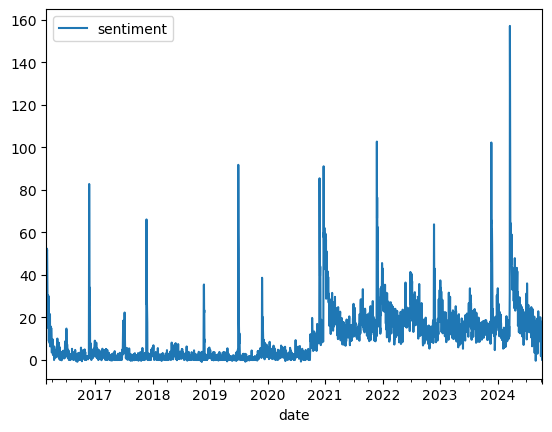

In [72]:
newSeries = series.resample('1d').sum()
# this plots and shows the time series
newSeries.plot()
plt.show()

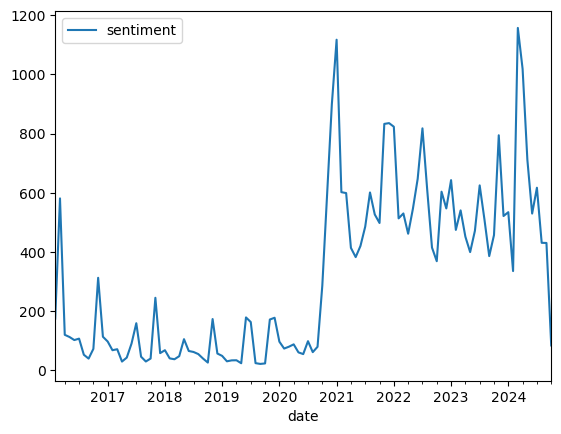

In [73]:
newSeries = series.resample('1ME').sum()
# this plots and shows the time series
newSeries.plot()
plt.show()

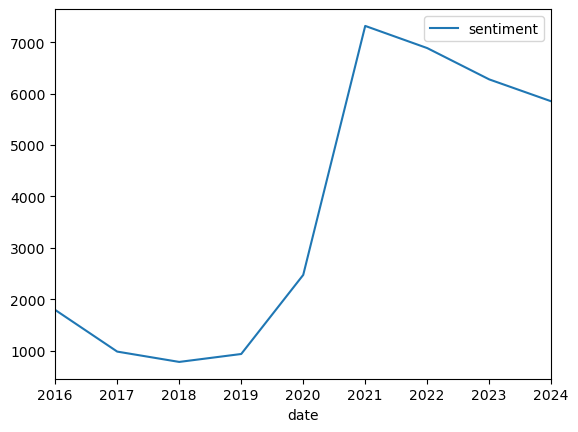

In [74]:
newSeries = series.resample('1YE').sum()
# this plots and shows the time series
newSeries.plot()
plt.show()

C:\Users\Nopphasorn\AppData\Local\Temp\ipykernel_10440\149950401.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reviews_in_window['month'] = pd.to_datetime(reviews_in_window['timestamp']).dt.to_period('M')
C:\Users\Nopphasorn\AppData\Local\Temp\ipykernel_10440\149950401.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reviews_in_window['month'] = pd.to_datetime(reviews_in_window['timestamp']).dt.to_period('M')
C:\Users\Nopphasorn\AppData\Local\Temp\ipykernel_10440\149950401.py:32: SettingWithCopyW

   event_date      month  avg_sentiment  review_count  period
0  2016-07-30 2016-04-01       0.993950             2  before
1  2016-07-30 2016-05-01       0.881966           142  before
2  2016-07-30 2016-06-01       0.865116           129  before
3  2016-07-30 2016-07-01       0.746388           156  before
4  2016-07-30 2016-08-01       0.689227            79   after
5  2016-07-30 2016-09-01       0.691802            58   after
6  2016-07-30 2016-10-01       0.888100            85   after
7  2018-08-02 2018-05-01       0.836061           146  before
8  2018-08-02 2018-06-01       0.836444            86  before
9  2018-08-02 2018-07-01       0.866246            79  before
10 2018-08-02 2018-08-01       0.805812            77  before
11 2018-08-02 2018-09-01       0.852496            50   after
12 2018-08-02 2018-10-01       0.796168            34   after
13 2018-08-02 2018-11-01       0.987200             1   after
14 2019-11-27 2019-08-01       0.862540             5  before
15 2019-

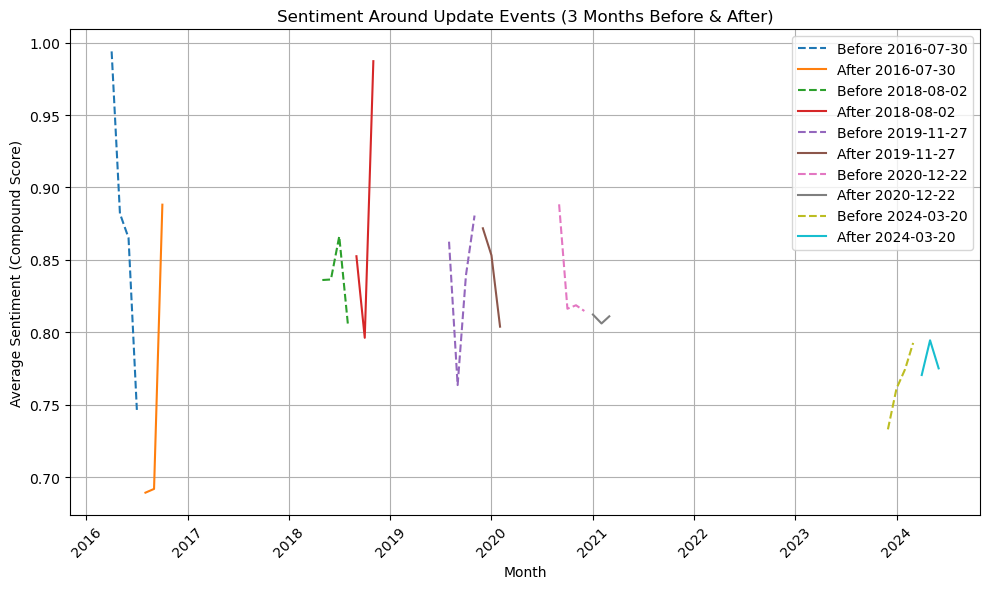

In [75]:
update_event_datetime = ['2016-07-30', '2018-08-02', '2019-11-27', '2020-12-22', '2024-03-20']
update_event_datetime = pd.to_datetime(update_event_datetime)

# Function to analyze sentiment 3 months before and after the update
def sentiment_around_updates(df, update_event_datetime, time_window='3M'):
    """
    Analyze sentiment 3 months before and after the update event dates.

    @param df: DataFrame containing the review data.
    @param update_event_datetime: A list of datetime objects for the update events.
    @param time_window: Time window (e.g., '3M' for 3 months) before and after the update.
    
    @returns: DataFrame with sentiment scores grouped by time windows around the updates.
    """
    # Initialize VADER sentiment analyzer
    sentAnalyser = SentimentIntensityAnalyzer()

    # Prepare a DataFrame to store sentiment results
    sentiment_results = []

    # Iterate over each update event date
    for event_date in update_event_datetime:
        # Define the start and end of the time window (3 months before and after)
        start_window = event_date - pd.DateOffset(months=3)
        end_window = event_date + pd.DateOffset(months=3)

        # Filter reviews within the time window
        reviews_in_window = df[(pd.to_datetime(df['timestamp']) >= start_window) &
                               (pd.to_datetime(df['timestamp']) <= end_window)]

        # Group reviews by month within the window to track sentiment trends
        reviews_in_window['month'] = pd.to_datetime(reviews_in_window['timestamp']).dt.to_period('M')

        # Perform sentiment analysis and calculate average sentiment by month
        monthly_sentiments = []
        for month, reviews in reviews_in_window.groupby('month'):
            # Compute sentiment scores for each review in the month
            compound_scores = reviews['content'].apply(lambda text: sentAnalyser.polarity_scores(text)['compound'])
            avg_sentiment = compound_scores.mean()
            review_count = len(reviews)

            # Store the result for this month
            monthly_sentiments.append({
                'event_date': event_date,
                'month': month.to_timestamp(),
                'avg_sentiment': avg_sentiment,
                'review_count': review_count,
                'period': 'before' if month.to_timestamp() < event_date else 'after'  # Mark 'before' or 'after' update
            })

        # Add results to the DataFrame
        sentiment_results.extend(monthly_sentiments)

    # Convert results to DataFrame
    sentiment_df = pd.DataFrame(sentiment_results)

    return sentiment_df

# Perform sentiment analysis for the time windows around updates
sentiment_df = sentiment_around_updates(steam_reviews_df, update_event_datetime)

# Display the sentiment DataFrame
print(sentiment_df)

# Visualize the sentiment trends with different line styles for before and after
plt.figure(figsize=(10, 6))
for event_date in update_event_datetime:
    sentiment_subset = sentiment_df[sentiment_df['event_date'] == event_date]
    
    # Plot sentiment before the update (dashed line)
    sentiment_before = sentiment_subset[sentiment_subset['period'] == 'before']
    plt.plot(sentiment_before['month'], sentiment_before['avg_sentiment'], linestyle='--', label=f'Before {event_date.date()}')
    
    # Plot sentiment after the update (solid line)
    sentiment_after = sentiment_subset[sentiment_subset['period'] == 'after']
    plt.plot(sentiment_after['month'], sentiment_after['avg_sentiment'], linestyle='-', label=f'After {event_date.date()}')

plt.xlabel('Month')
plt.ylabel('Average Sentiment (Compound Score)')
plt.title('Sentiment Around Update Events (3 Months Before & After)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\Nopphasorn\AppData\Local\Temp\ipykernel_10440\2610080193.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reviews_in_window['sentiment'] = reviews_in_window['content'].apply(lambda text: sentAnalyser.polarity_scores(text)['compound'])
C:\Users\Nopphasorn\AppData\Local\Temp\ipykernel_10440\2610080193.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reviews_in_window['sentiment'] = reviews_in_window['content'].apply(lambda text: sentAnalyser.polarity_scores(text)['compound'])
C:\Users\Nopphas

  event_date  avg_sentiment_before  avg_sentiment_after
0 2016-07-30              0.831206             0.761341
1 2018-08-02              0.845380             0.815424
2 2019-11-27              0.849034             0.858775
3 2020-12-22              0.816387             0.812303
4 2024-03-20              0.764499             0.784908


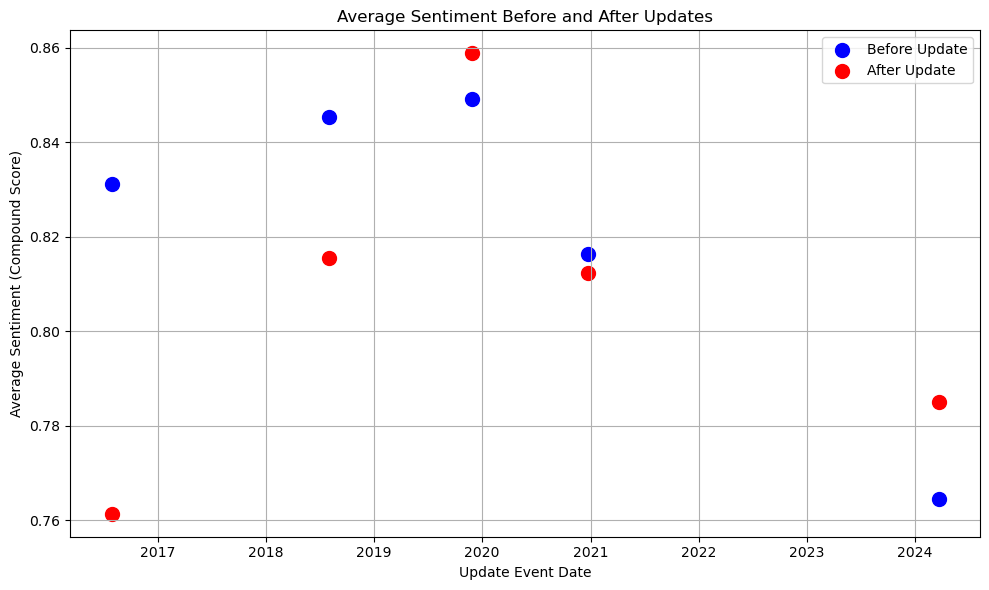

In [76]:
# Sample update event dates
update_event_datetime = ['2016-07-30', '2018-08-02', '2019-11-27', '2020-12-22', '2024-03-20']
update_event_datetime = pd.to_datetime(update_event_datetime)

# Function to analyze sentiment 3 months before and after the update
def sentiment_around_updates(df, update_event_datetime):
    """
    Analyze sentiment 3 months before and after the update event dates.

    @param df: DataFrame containing the review data.
    @param update_event_datetime: A list of datetime objects for the update events.
    
    @returns: DataFrame with average sentiment before and after each update.
    """
    # Initialize VADER sentiment analyzer
    sentAnalyser = SentimentIntensityAnalyzer()

    # Prepare a list to store average sentiment results
    sentiment_results = []

    # Iterate over each update event date
    for event_date in update_event_datetime:
        # Define the start and end of the time window (3 months before and after)
        start_window = event_date - pd.DateOffset(months=3)
        end_window = event_date + pd.DateOffset(months=3)

        # Filter reviews within the time window
        reviews_in_window = df[(pd.to_datetime(df['timestamp']) >= start_window) &
                               (pd.to_datetime(df['timestamp']) <= end_window)]

        # Perform sentiment analysis on each review in the time window
        reviews_in_window['sentiment'] = reviews_in_window['content'].apply(lambda text: sentAnalyser.polarity_scores(text)['compound'])

        # Calculate average sentiment before the update
        avg_sentiment_before = reviews_in_window[pd.to_datetime(reviews_in_window['timestamp']) < event_date]['sentiment'].mean()

        # Calculate average sentiment after the update
        avg_sentiment_after = reviews_in_window[pd.to_datetime(reviews_in_window['timestamp']) >= event_date]['sentiment'].mean()

        # Store the result for this event date
        sentiment_results.append({
            'event_date': event_date,
            'avg_sentiment_before': avg_sentiment_before,
            'avg_sentiment_after': avg_sentiment_after
        })

    # Convert results to DataFrame
    sentiment_df = pd.DataFrame(sentiment_results)

    return sentiment_df

# Perform sentiment analysis for the time windows around updates
sentiment_df = sentiment_around_updates(steam_reviews_df, update_event_datetime)

# Display the sentiment DataFrame
print(sentiment_df)

# Visualize the average sentiment before and after updates using dots
plt.figure(figsize=(10, 6))

# Plot avg sentiment before updates as dots
plt.scatter(sentiment_df['event_date'], sentiment_df['avg_sentiment_before'], color='blue', label='Before Update', s=100, marker='o')

# Plot avg sentiment after updates as dots
plt.scatter(sentiment_df['event_date'], sentiment_df['avg_sentiment_after'], color='red', label='After Update', s=100, marker='o')

plt.xlabel('Update Event Date')
plt.ylabel('Average Sentiment (Compound Score)')
plt.title('Average Sentiment Before and After Updates')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Topic Modelling

In [77]:
lReviews = []
for reviews in steam_reviews_df['content']:
    lTokens = processText(text=reviews, tokenizer=tweetTokeniser, lemmatizer=lemmatizer, stemmer=stemmer, stopwords=lStopwords,slang_dict=slang_dict)
    if len(lTokens) > 0:  # Add only non-empty tokenized reviews
        lReviews.append(lTokens)
    

Number of topics: 2, Coherence Score: 0.47187746306309475
Number of topics: 3, Coherence Score: 0.5880090383386151
Number of topics: 4, Coherence Score: 0.6031777820774495
Number of topics: 5, Coherence Score: 0.5792745595511336
Number of topics: 6, Coherence Score: 0.5703558459554104
Number of topics: 7, Coherence Score: 0.5775309568480297
Number of topics: 8, Coherence Score: 0.570378639668206
Number of topics: 9, Coherence Score: 0.5753361557159482
Number of topics: 10, Coherence Score: 0.574590121605389
Number of topics: 11, Coherence Score: 0.5600387110789201
Number of topics: 12, Coherence Score: 0.5433340647803591
Number of topics: 13, Coherence Score: 0.5315584450590894
Number of topics: 14, Coherence Score: 0.5615872097218931
Number of topics: 15, Coherence Score: 0.5164356265086772
Number of topics: 16, Coherence Score: 0.517857530317059
Number of topics: 17, Coherence Score: 0.5340683640880557
Number of topics: 18, Coherence Score: 0.5131117324293104
Number of topics: 19, Co

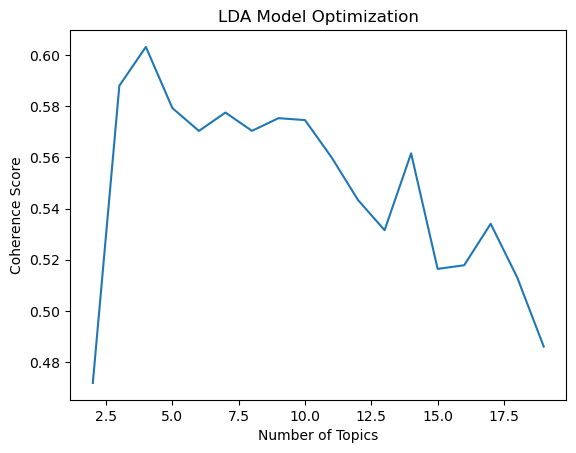

Best Number of Topics: 4
(0, '0.024*"fun" + 0.024*"play" + 0.021*"love" + 0.018*"time" + 0.016*"like" + 0.015*"hour" + 0.015*"one" + 0.014*"get" + 0.014*"great" + 0.013*"much" + 0.012*"realli" + 0.012*"good" + 0.011*"recommend" + 0.010*"friend" + 0.009*"farm"')
(1, '0.047*"farm" + 0.020*"fish" + 0.015*"mine" + 0.013*"crop" + 0.013*"like" + 0.012*"get" + 0.011*"make" + 0.011*"need" + 0.010*"day" + 0.008*"marri" + 0.008*"thing" + 0.008*"town" + 0.007*"build" + 0.007*"anim" + 0.007*"want"')
(2, '0.054*"good" + 0.048*"grind" + 0.041*"bad" + 0.032*"bug" + 0.017*"long" + 0.016*"decent" + 0.016*"brain" + 0.015*"averag" + 0.015*"easi" + 0.014*"money" + 0.013*"stori" + 0.012*"price" + 0.011*"soul" + 0.011*"potato" + 0.010*"spare"')
(3, '0.034*"life" + 0.016*"live" + 0.015*"world" + 0.013*"real" + 0.011*"escap" + 0.010*"corn" + 0.008*"experi" + 0.008*"town" + 0.006*"feel" + 0.006*"charm" + 0.005*"farmer" + 0.005*"sens" + 0.005*"dream" + 0.005*"player" + 0.005*"away"')


In [78]:
random.seed(0)

# Assuming lReviews is your preprocessed tokenized reviews (list of lists of tokens)
# Create a dictionary and corpus
dictionary = corpora.Dictionary(lReviews)
corpus = [dictionary.doc2bow(review) for review in lReviews]

# Function to perform LDA with different parameter combinations and compute coherence
def lda_tuning(corpus, dictionary, texts, limit, start=2, step=1, passes=10, iterations=100, random_state=100):
    coherence_scores = []
    model_list = []
    
    for num_topics in range(start, limit, step):
        # Train the LDA model
        model = gensim.models.LdaModel(corpus=corpus,
                                       id2word=dictionary,
                                       num_topics=num_topics,
                                       random_state=random_state,
                                       passes=passes,
                                       iterations=iterations,
                                       alpha='auto',  # Can also optimize 'alpha'
                                       eta='auto')    # Can also optimize 'eta'
        
        # Calculate the coherence score
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_score = coherencemodel.get_coherence()
        coherence_scores.append(coherence_score)
        model_list.append(model)
        
        print(f'Number of topics: {num_topics}, Coherence Score: {coherence_score}')

    return model_list, coherence_scores

# Run the LDA optimization (tuning number of topics)
start = 2  # Min number of topics
limit = 20  # Max number of topics
step = 1  # Step size for topics
passes = 10  # Number of passes 
iterations = 100  # Number of iterations 

model_list, coherence_scores = lda_tuning(corpus=corpus, dictionary=dictionary, texts=lReviews, limit=limit, start=start, step=step, passes=passes, iterations=iterations)

# Plot the coherence scores to find the optimal number of topics
x = range(start, limit, step)
plt.plot(x, coherence_scores)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("LDA Model Optimization")
plt.show()

# Select the model with the highest coherence score
best_num_topics = x[coherence_scores.index(max(coherence_scores))]
best_model = model_list[coherence_scores.index(max(coherence_scores))]

print(f'Best Number of Topics: {best_num_topics}')

# Display the topics of the best model
topics = best_model.show_topics(num_topics=best_num_topics, num_words=15)
for topic in topics:
    print(topic)


In [79]:
print(f"Number of documents in corpus: {len(corpus)}")
print(f"Number of unique tokens in dictionary: {len(dictionary)}")


Number of documents in corpus: 49514
Number of unique tokens in dictionary: 10186


In [80]:
print(coherence_scores)

[0.47187746306309475, 0.5880090383386151, 0.6031777820774495, 0.5792745595511336, 0.5703558459554104, 0.5775309568480297, 0.570378639668206, 0.5753361557159482, 0.574590121605389, 0.5600387110789201, 0.5433340647803591, 0.5315584450590894, 0.5615872097218931, 0.5164356265086772, 0.517857530317059, 0.5340683640880557, 0.5131117324293104, 0.4860670082653214]


In [81]:
# For 3 topics
model_3 = gensim.models.LdaModel(corpus=corpus, id2word=dictionary, num_topics=3, passes=10, random_state=100)
topics_3 = model_3.show_topics(num_topics=3, num_words=10)
print("Topics for 3-Topic Model:")
for topic in topics_3:
    print(topic)

# For 6 topics
model_6 = gensim.models.LdaModel(corpus=corpus, id2word=dictionary, num_topics=6, passes=10, random_state=100)
topics_6 = model_6.show_topics(num_topics=6, num_words=10)
print("\nTopics for 6-Topic Model:")
for topic in topics_6:
    print(topic)

# For 7 topics
model_7 = gensim.models.LdaModel(corpus=corpus, id2word=dictionary, num_topics=7, passes=10, random_state=100)
topics_7 = model_7.show_topics(num_topics=7, num_words=10)
print("\nTopics for 7-Topic Model:")
for topic in topics_7:
    print(topic)


Topics for 3-Topic Model:
(0, '0.030*"play" + 0.029*"fun" + 0.024*"love" + 0.019*"hour" + 0.018*"time" + 0.016*"one" + 0.016*"great" + 0.015*"much" + 0.014*"get" + 0.013*"like"')
(1, '0.036*"farm" + 0.018*"like" + 0.013*"fish" + 0.011*"make" + 0.011*"get" + 0.010*"mine" + 0.009*"crop" + 0.008*"thing" + 0.008*"day" + 0.008*"anim"')
(2, '0.097*"good" + 0.023*"need" + 0.017*"life" + 0.012*"grind" + 0.012*"bad" + 0.010*"money" + 0.009*"long" + 0.009*"get" + 0.008*"marri" + 0.007*"bug"')

Topics for 6-Topic Model:
(0, '0.033*"hour" + 0.027*"love" + 0.025*"one" + 0.021*"play" + 0.021*"time" + 0.018*"much" + 0.015*"best" + 0.015*"ever" + 0.014*"get" + 0.013*"amaz"')
(1, '0.074*"farm" + 0.025*"fish" + 0.021*"mine" + 0.016*"thing" + 0.013*"love" + 0.013*"fun" + 0.012*"mani" + 0.012*"like" + 0.012*"charact" + 0.011*"differ"')
(2, '0.051*"fun" + 0.042*"play" + 0.031*"like" + 0.027*"realli" + 0.024*"great" + 0.024*"harvest" + 0.022*"moon" + 0.019*"friend" + 0.019*"good" + 0.018*"love"')
(3, '0.022

In [82]:
lcontent = []

for content in steam_reviews_df['content']:
    # tokenise, filter stopwords and get convert to lower case
    lTokens = processText(text=content, tokenizer=tweetTokeniser, lemmatizer=lemmatizer, stemmer=stemmer, stopwords=lStopwords,slang_dict=slang_dict)
    lcontent.append(' '.join(lTokens))

In [83]:
#
# Count Vectorizer
#

tfVectorizer = CountVectorizer(max_df=0.90, min_df=5, max_features=1500, stop_words='english')
tf = tfVectorizer.fit_transform(lcontent)
# extract the names of the features (in our case, the words)
tfFeatureNames = tfVectorizer.get_feature_names_out()

##
topicNum = best_num_topics
wordNumToDisplay = 15
featureNum = 1500
#
# LDA MODEL
#
ldaModel = LatentDirichletAllocation(n_components =topicNum, max_iter=10, learning_method='online').fit(tf)

NameError: name 'featureNum' is not defined

In [ ]:
def display_topics(model, featureNames, numTopWords):
    """
    Prints out the most associated words for each feature.

    @param model: lda model.
    @param featureNames: list of strings, representing the list of features/words.
    @param numTopWords: number of words to print per topic.
    """

    # print out the topic distributions
    for topicId, lTopicDist in enumerate(model.components_):
        print("Topic %d:" % (topicId))
        print(" ".join([featureNames[i] for i in lTopicDist.argsort()[:-numTopWords - 1:-1]]))

In [ ]:
display_topics(ldaModel, tfFeatureNames, wordNumToDisplay)

In [ ]:
def displayWordcloud(model, featureNames):
    """
    Displays the word cloud of the topic distributions, stored in model.

    @param model: lda model.
    @param featureNames: list of strings, representing the list of features/words.
    """
    normalisedComponents = model.components_ / model.components_.sum(axis=1)[:, np.newaxis]
    
    topicNum = len(model.components_)
    # number of wordclouds for each row
    plotColNum = 3
    # number of wordclouds for each column
    plotRowNum = int(math.ceil(topicNum / plotColNum))

    for topicId, lTopicDist in enumerate(normalisedComponents):
        lWordProb = {featureNames[i] : wordProb for i,wordProb in enumerate(lTopicDist)}
        wordcloud = WordCloud(background_color='black')
        wordcloud.fit_words(frequencies=lWordProb)
        plt.subplot(plotRowNum, plotColNum, topicId+1)
        plt.title('Topic %d:' % (topicId+1))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")

    plt.show(block=True)

In [ ]:
displayWordcloud(ldaModel, tfFeatureNames)

In [ ]:
panel = pyLDAvis.lda_model.prepare(ldaModel, tf, tfVectorizer, mds='tsne')
pyLDAvis.display(panel)

In [ ]:
#
# Count Vectorizer
#

tfVectorizer = CountVectorizer(max_df=0.90, min_df=5, max_features=featureNum, stop_words='english')
tf = tfVectorizer.fit_transform(lcontent)
# extract the names of the features (in our case, the words)
tfFeatureNames = tfVectorizer.get_feature_names_out()

##
topicNum = 6
wordNumToDisplay = 15
featureNum = 1500
#
# LDA MODEL
#
ldaModel6 = LatentDirichletAllocation(n_components =6, max_iter=10, learning_method='online').fit(tf)
displayWordcloud(ldaModel6, tfFeatureNames)

In [ ]:
panel6 = pyLDAvis.lda_model.prepare(ldaModel6, tf, tfVectorizer, mds='tsne')
pyLDAvis.display(panel6)

In [ ]:
#
# Count Vectorizer
#

tfVectorizer = CountVectorizer(max_df=0.90, min_df=5, max_features=featureNum, stop_words='english')
tf = tfVectorizer.fit_transform(lcontent)
# extract the names of the features (in our case, the words)
tfFeatureNames = tfVectorizer.get_feature_names_out()

##
topicNum = 7
wordNumToDisplay = 15
featureNum = 1500
#
# LDA MODEL
#
ldaModel7 = LatentDirichletAllocation(n_components =topicNum, max_iter=10, learning_method='online').fit(tf)
displayWordcloud(ldaModel7, tfFeatureNames)

In [ ]:
panel7 = pyLDAvis.lda_model.prepare(ldaModel7, tf, tfVectorizer, mds='tsne')
pyLDAvis.display(panel7)